# Artificial Neural Network

### Importing the libraries

In [362]:
# import the libraries 
import tensorflow as tf
import pandas as pd
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
from sklearn.pipeline import Pipeline
from sklearn.model_selection import KFold
from sklearn.decomposition import PCA


In [363]:
print(tf.__version__)

2.8.0


In [364]:
# Function to calculate VIF
def calculate_vif(data):
    vif_df = pd.DataFrame(columns = ['Var', 'Vif'])
    x_var_names = data.columns
    for i in range(0, x_var_names.shape[0]):
        y = data[x_var_names[i]]
        x = data[x_var_names.drop([x_var_names[i]])]
        r_squared = sm.OLS(y.astype(float),x.astype(float)).fit().rsquared
        vif = round(1/(1-r_squared),2)
        vif_df.loc[i] = [x_var_names[i], vif]
    return vif_df.sort_values(by = 'Vif', axis = 0, ascending=False, inplace=False)




## Part 1 - Data Preprocessing

### Importing the dataset

In [365]:
dataset = pd.read_csv('KeyboardData.csv')
X = dataset.iloc[:,:-1 ].values
y = dataset.iloc[:,-1].values

In [366]:
print(X)
print(y)

[[3.80584214e-01 1.36823497e-03 5.08000000e-02 2.80000000e+01
  8.47000000e+02 7.00000000e+00 0.00000000e+00 1.00000000e+00
  6.71040577e-01]
 [3.78428780e-01 2.18476127e-02 3.62000000e-02 5.00000000e+01
  1.56700000e+03 2.50000000e+01 0.00000000e+00 1.00000000e+00
  4.54650866e-01]
 [3.49012031e-01 7.12569236e-04 2.10000000e-02 8.60000000e+01
  1.56500000e+03 4.10000000e+01 0.00000000e+00 1.00000000e+00
  1.71950473e-01]
 [3.54816649e-01 0.00000000e+00 4.57750000e-02 8.00000000e+00
  5.81000000e+02 5.15000000e+02 1.70000000e+01 1.00000000e+00
  8.76935444e-02]
 [2.36303990e-01 1.07759165e-03 2.02000000e-02 4.30000000e+01
  5.50000000e+01 9.55000000e+02 2.12000000e+02 1.50000000e+01
  2.55948976e-01]
 [4.30975746e-01 6.77585959e-03 3.48000000e-02 4.20000000e+01
  8.37000000e+02 4.59000000e+02 6.60000000e+01 1.20000000e+01
  2.83575610e-01]
 [5.85703902e-01 1.25543177e-02 7.22000000e-02 1.30000000e+01
  1.26000000e+03 6.03000000e+02 2.98000000e+02 3.10000000e+01
  6.10817694e-01]
 [3.66

### Encoding categorical data

### Splitting the dataset into the Training set and Test set

In [367]:
from sklearn.model_selection import train_test_split
#random state = 1 is setting the seed of randomly picking the test and train sets so we can get consistent results 
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2,stratify=y)

### Feature Scaling

In [368]:
# #feature scaling everything is crucial to deep learning and ANNs
# from sklearn.preprocessing import StandardScaler
# sc = StandardScaler()

# X_train = sc.fit_transform(X_train)



# X_test = sc.transform(X_test)



## Part 2 - Building the ANN

### Initializing the ANN

In [369]:

def build_clf(unit,hiddenlayers):
  # creating the layers of the NN
  ann = tf.keras.models.Sequential()
  for i in range(hiddenlayers):
    ann.add(tf.keras.layers.Dense(units=unit, activation='relu'))

    
  ann.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))
  optimizer = tf.keras.optimizers.Adam()
  ann.compile(optimizer = optimizer, loss = 'binary_crossentropy',metrics = ['accuracy'])
  return ann

In [370]:
model=KerasClassifier(build_fn=build_clf)
pipe = Pipeline([('scaler', StandardScaler()), ('pca',PCA()),('model', model)])

C:\Users\micoa\AppData\Local\Temp\ipykernel_29044\2833653470.py:1: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model=KerasClassifier(build_fn=build_clf)


In [371]:

params={
    'pca__n_components' : [6,7,8,9],
    'model__batch_size':[128], 
        'model__epochs':[300],
        'model__unit':[8,9,10,11,12],
        'model__hiddenlayers' :[1,2,3,4,5]
           
        }
gs=GridSearchCV(estimator=pipe, param_grid=params, cv=5)
# now fit the dataset to the GridSearchCV object. 
grid_result = gs.fit(X_train, y_train,model__callbacks =[tf.keras.callbacks.EarlyStopping(
    monitor="loss",
    min_delta=0,
    patience=50,
    verbose=1,
    mode="auto",
    baseline=None,
    restore_best_weights=True,
)])

Epoch 1/300
1/1 [==============================] - 0s 311ms/step - loss: 0.8777 - accuracy: 0.4815
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8748 - accuracy: 0.4815
Epoch 3/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8718 - accuracy: 0.4815
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8689 - accuracy: 0.4630
Epoch 5/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8660 - accuracy: 0.4630
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8631 - accuracy: 0.4630
Epoch 7/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8602 - accuracy: 0.4630
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8573 - accuracy: 0.4630
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8544 - accuracy: 0.4630
Epoch 10/300
1/1 [==============================] - 0s 4ms/step - loss: 0.8516 - accuracy: 0.4630
Epoch 11/300
1/1 [=========

1/1 [==============================] - 0s 2ms/step - loss: 0.6928 - accuracy: 0.5185
Epoch 85/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6912 - accuracy: 0.5185
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6896 - accuracy: 0.5185
Epoch 87/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6880 - accuracy: 0.5185
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6864 - accuracy: 0.5185
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6848 - accuracy: 0.5185
Epoch 90/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6832 - accuracy: 0.5185
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6817 - accuracy: 0.5185
Epoch 92/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6801 - accuracy: 0.5185
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6786 - accuracy: 0.5370
Epoch 94/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5850 - accuracy: 0.7037
Epoch 168/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5839 - accuracy: 0.6852
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5828 - accuracy: 0.6852
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5817 - accuracy: 0.6852
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5807 - accuracy: 0.6852
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5796 - accuracy: 0.6852
Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5785 - accuracy: 0.6852
Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5775 - accuracy: 0.6852
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5765 - accuracy: 0.6852
Epoch 176/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5754 - accuracy: 0.6852
Epoch 177/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5114 - accuracy: 0.7407
Epoch 250/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5107 - accuracy: 0.7407
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5101 - accuracy: 0.7407
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5094 - accuracy: 0.7407
Epoch 253/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5088 - accuracy: 0.7407
Epoch 254/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5081 - accuracy: 0.7407
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5075 - accuracy: 0.7407
Epoch 256/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5068 - accuracy: 0.7407
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5062 - accuracy: 0.7407
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5055 - accuracy: 0.7407
Epoch 259/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7068 - accuracy: 0.5185
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7056 - accuracy: 0.5185
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7045 - accuracy: 0.5370
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7033 - accuracy: 0.5370
Epoch 35/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7022 - accuracy: 0.5370
Epoch 36/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7011 - accuracy: 0.5370
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7000 - accuracy: 0.5556
Epoch 38/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6988 - accuracy: 0.5556
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6977 - accuracy: 0.5556
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6966 - accuracy: 0.5556
Epoch 41/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.6272 - accuracy: 0.7407
Epoch 115/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6264 - accuracy: 0.7407
Epoch 116/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6256 - accuracy: 0.7407
Epoch 117/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6248 - accuracy: 0.7407
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6240 - accuracy: 0.7407
Epoch 119/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6232 - accuracy: 0.7593
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6224 - accuracy: 0.7778
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6216 - accuracy: 0.7778
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6207 - accuracy: 0.7778
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6199 - accuracy: 0.7778
Epoch 124/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5542 - accuracy: 0.8148
Epoch 197/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5533 - accuracy: 0.8148
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5524 - accuracy: 0.8148
Epoch 199/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5515 - accuracy: 0.8148
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5506 - accuracy: 0.8148
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5497 - accuracy: 0.8148
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5488 - accuracy: 0.8148
Epoch 203/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5479 - accuracy: 0.8148
Epoch 204/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5471 - accuracy: 0.8148
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5462 - accuracy: 0.8148
Epoch 206/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4985 - accuracy: 0.8148
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4981 - accuracy: 0.8148
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4977 - accuracy: 0.8148
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4973 - accuracy: 0.8148
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4969 - accuracy: 0.8148
Epoch 283/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4965 - accuracy: 0.8148
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4961 - accuracy: 0.8148
Epoch 285/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4957 - accuracy: 0.8148
Epoch 286/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4953 - accuracy: 0.8148
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4949 - accuracy: 0.8148
Epoch 288/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.8694 - accuracy: 0.4259
Epoch 61/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8669 - accuracy: 0.4259
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8643 - accuracy: 0.4259
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8618 - accuracy: 0.4259
Epoch 64/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8593 - accuracy: 0.4259
Epoch 65/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8568 - accuracy: 0.4259
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8544 - accuracy: 0.4259
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8519 - accuracy: 0.4259
Epoch 68/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8495 - accuracy: 0.4259
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8471 - accuracy: 0.4259
Epoch 70/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.7154 - accuracy: 0.5185
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7140 - accuracy: 0.5185
Epoch 145/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7127 - accuracy: 0.5185
Epoch 146/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7114 - accuracy: 0.5185
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7100 - accuracy: 0.5185
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7087 - accuracy: 0.5185
Epoch 149/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7074 - accuracy: 0.5185
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7061 - accuracy: 0.5000
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7048 - accuracy: 0.5000
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7035 - accuracy: 0.5000
Epoch 153/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6269 - accuracy: 0.6667
Epoch 226/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6260 - accuracy: 0.6852
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6252 - accuracy: 0.6852
Epoch 228/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6243 - accuracy: 0.6852
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6235 - accuracy: 0.6852
Epoch 230/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6226 - accuracy: 0.6852
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6218 - accuracy: 0.6852
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6210 - accuracy: 0.6852
Epoch 233/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6202 - accuracy: 0.6852
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6193 - accuracy: 0.6852
Epoch 235/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.8593 - accuracy: 0.4182
Epoch 8/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8569 - accuracy: 0.4364
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8545 - accuracy: 0.4545
Epoch 10/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8522 - accuracy: 0.4545
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8499 - accuracy: 0.4545
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8476 - accuracy: 0.4545
Epoch 13/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8454 - accuracy: 0.4545
Epoch 14/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8431 - accuracy: 0.4545
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8409 - accuracy: 0.4545
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8387 - accuracy: 0.4545
Epoch 17/300
1/1 [=================

1/1 [==============================] - 0s 4ms/step - loss: 0.7043 - accuracy: 0.5273
Epoch 91/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7028 - accuracy: 0.5273
Epoch 92/300
1/1 [==============================] - 0s 4ms/step - loss: 0.7014 - accuracy: 0.5273
Epoch 93/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6999 - accuracy: 0.5273
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6985 - accuracy: 0.5273
Epoch 95/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6971 - accuracy: 0.5273
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6957 - accuracy: 0.5273
Epoch 97/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6943 - accuracy: 0.5273
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6929 - accuracy: 0.5273
Epoch 99/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6915 - accuracy: 0.5273
Epoch 100/300
1/1 [==============

Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5995 - accuracy: 0.6727
Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5984 - accuracy: 0.6727
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5974 - accuracy: 0.6727
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5963 - accuracy: 0.6727
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5953 - accuracy: 0.6727
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5943 - accuracy: 0.6727
Epoch 179/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5932 - accuracy: 0.6545
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5922 - accuracy: 0.6545
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5912 - accuracy: 0.6545
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5901 - accuracy: 0.6545
Epoch 183/

1/1 [==============================] - 0s 2ms/step - loss: 0.5258 - accuracy: 0.7091
Epoch 256/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5251 - accuracy: 0.7091
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5244 - accuracy: 0.7091
Epoch 258/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5238 - accuracy: 0.7091
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5231 - accuracy: 0.7273
Epoch 260/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5224 - accuracy: 0.7273
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5218 - accuracy: 0.7273
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5211 - accuracy: 0.7273
Epoch 263/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5204 - accuracy: 0.7273
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5198 - accuracy: 0.7273
Epoch 265/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7940 - accuracy: 0.4364
Epoch 38/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7920 - accuracy: 0.4364
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7900 - accuracy: 0.4364
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7880 - accuracy: 0.4364
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7860 - accuracy: 0.4364
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7840 - accuracy: 0.4364
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7820 - accuracy: 0.4364
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7800 - accuracy: 0.4364
Epoch 45/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7781 - accuracy: 0.4364
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7761 - accuracy: 0.4364
Epoch 47/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.6598 - accuracy: 0.6182
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6584 - accuracy: 0.6182
Epoch 122/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6571 - accuracy: 0.6182
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6557 - accuracy: 0.6000
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6544 - accuracy: 0.6000
Epoch 125/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6531 - accuracy: 0.6000
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6518 - accuracy: 0.6000
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6505 - accuracy: 0.6000
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6492 - accuracy: 0.6000
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6479 - accuracy: 0.5818
Epoch 130/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5700 - accuracy: 0.7091
Epoch 203/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5691 - accuracy: 0.7273
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5682 - accuracy: 0.7273
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5674 - accuracy: 0.7273
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5665 - accuracy: 0.7273
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5656 - accuracy: 0.7273
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5647 - accuracy: 0.7273
Epoch 209/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5639 - accuracy: 0.7273
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5630 - accuracy: 0.7273
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5622 - accuracy: 0.7091
Epoch 212/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5162 - accuracy: 0.7455
Epoch 285/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5157 - accuracy: 0.7455
Epoch 286/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5153 - accuracy: 0.7455
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5149 - accuracy: 0.7455
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5145 - accuracy: 0.7455
Epoch 289/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5141 - accuracy: 0.7455
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5137 - accuracy: 0.7455
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5133 - accuracy: 0.7455
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5129 - accuracy: 0.7455
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5125 - accuracy: 0.7455
Epoch 294/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6390 - accuracy: 0.5185
Epoch 67/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6373 - accuracy: 0.5185
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6356 - accuracy: 0.5185
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6338 - accuracy: 0.5185
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6322 - accuracy: 0.5185
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6305 - accuracy: 0.5185
Epoch 72/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6289 - accuracy: 0.5370
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6272 - accuracy: 0.5370
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6256 - accuracy: 0.5370
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6240 - accuracy: 0.5370
Epoch 76/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5409 - accuracy: 0.7593
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5401 - accuracy: 0.7593
Epoch 151/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5393 - accuracy: 0.7593
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5385 - accuracy: 0.7593
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5377 - accuracy: 0.7593
Epoch 154/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5370 - accuracy: 0.7593
Epoch 155/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5362 - accuracy: 0.7593
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5355 - accuracy: 0.7593
Epoch 157/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5347 - accuracy: 0.7593
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5340 - accuracy: 0.7593
Epoch 159/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4886 - accuracy: 0.7963
Epoch 232/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4881 - accuracy: 0.7963
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4876 - accuracy: 0.7963
Epoch 234/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4871 - accuracy: 0.7963
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4867 - accuracy: 0.7963
Epoch 236/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4862 - accuracy: 0.7963
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4857 - accuracy: 0.7963
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4852 - accuracy: 0.7963
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4848 - accuracy: 0.7963
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4843 - accuracy: 0.7963
Epoch 241/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.8945 - accuracy: 0.4815
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8917 - accuracy: 0.4815
Epoch 15/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8889 - accuracy: 0.4815
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8861 - accuracy: 0.4815
Epoch 17/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8833 - accuracy: 0.4815
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8805 - accuracy: 0.4815
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8778 - accuracy: 0.4815
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8750 - accuracy: 0.4815
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8723 - accuracy: 0.4815
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8696 - accuracy: 0.4815
Epoch 23/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.7067 - accuracy: 0.5185
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7050 - accuracy: 0.5185
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7033 - accuracy: 0.5185
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7016 - accuracy: 0.5185
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7000 - accuracy: 0.5185
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6983 - accuracy: 0.5000
Epoch 102/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6967 - accuracy: 0.5000
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6951 - accuracy: 0.5000
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6934 - accuracy: 0.5000
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6918 - accuracy: 0.5000
Epoch 106/300
1/1 [========

1/1 [==============================] - 0s 3ms/step - loss: 0.6024 - accuracy: 0.6111
Epoch 179/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6014 - accuracy: 0.6111
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6005 - accuracy: 0.6111
Epoch 181/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5996 - accuracy: 0.6111
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5987 - accuracy: 0.6111
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5977 - accuracy: 0.6111
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5968 - accuracy: 0.6111
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5959 - accuracy: 0.6111
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5950 - accuracy: 0.6296
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5941 - accuracy: 0.6296
Epoch 188/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5380 - accuracy: 0.7963
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5374 - accuracy: 0.7963
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5368 - accuracy: 0.7963
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5362 - accuracy: 0.7963
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5357 - accuracy: 0.7963
Epoch 265/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5351 - accuracy: 0.7963
Epoch 266/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5345 - accuracy: 0.7963
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5339 - accuracy: 0.7963
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5334 - accuracy: 0.7963
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5328 - accuracy: 0.7963
Epoch 270/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6747 - accuracy: 0.5185
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6734 - accuracy: 0.5185
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6722 - accuracy: 0.5185
Epoch 45/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6709 - accuracy: 0.5185
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6696 - accuracy: 0.5185
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6683 - accuracy: 0.5185
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6670 - accuracy: 0.5370
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6657 - accuracy: 0.5370
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6645 - accuracy: 0.5370
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6632 - accuracy: 0.5370
Epoch 52/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5802 - accuracy: 0.7407
Epoch 126/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5792 - accuracy: 0.7407
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5782 - accuracy: 0.7407
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5772 - accuracy: 0.7407
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5762 - accuracy: 0.7407
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5752 - accuracy: 0.7407
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5742 - accuracy: 0.7407
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5732 - accuracy: 0.7407
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5722 - accuracy: 0.7407
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5712 - accuracy: 0.7407
Epoch 135/300
1/1 [=====

1/1 [==============================] - 0s 7ms/step - loss: 0.5062 - accuracy: 0.7778
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5054 - accuracy: 0.7778
Epoch 209/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5046 - accuracy: 0.7778
Epoch 210/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5039 - accuracy: 0.7593
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5031 - accuracy: 0.7593
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5023 - accuracy: 0.7593
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5016 - accuracy: 0.7593
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5009 - accuracy: 0.7593
Epoch 215/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5001 - accuracy: 0.7593
Epoch 216/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4994 - accuracy: 0.7593
Epoch 217/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4533 - accuracy: 0.7407
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4528 - accuracy: 0.7407
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4523 - accuracy: 0.7407
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4518 - accuracy: 0.7407
Epoch 293/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4513 - accuracy: 0.7407
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7407
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4503 - accuracy: 0.7407
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4497 - accuracy: 0.7222
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4492 - accuracy: 0.7222
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4487 - accuracy: 0.7222
Epoch 299/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6481 - accuracy: 0.6000
Epoch 72/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6461 - accuracy: 0.6000
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6442 - accuracy: 0.6000
Epoch 74/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6423 - accuracy: 0.6182
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6404 - accuracy: 0.6182
Epoch 76/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6385 - accuracy: 0.6182
Epoch 77/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6366 - accuracy: 0.6364
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6347 - accuracy: 0.6364
Epoch 79/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6328 - accuracy: 0.6364
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6310 - accuracy: 0.6364
Epoch 81/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5268 - accuracy: 0.8000
Epoch 155/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5257 - accuracy: 0.8000
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5246 - accuracy: 0.8000
Epoch 157/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5236 - accuracy: 0.8182
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5225 - accuracy: 0.8182
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5215 - accuracy: 0.8182
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5204 - accuracy: 0.8182
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5194 - accuracy: 0.8182
Epoch 162/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5183 - accuracy: 0.8182
Epoch 163/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5173 - accuracy: 0.8182
Epoch 164/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4574 - accuracy: 0.7818
Epoch 237/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4568 - accuracy: 0.7818
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4562 - accuracy: 0.7818
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4556 - accuracy: 0.7818
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4550 - accuracy: 0.7818
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4545 - accuracy: 0.7818
Epoch 242/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4539 - accuracy: 0.7818
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4533 - accuracy: 0.7818
Epoch 244/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4527 - accuracy: 0.7818
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4522 - accuracy: 0.7818
Epoch 246/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5991 - accuracy: 0.6364
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5979 - accuracy: 0.6364
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5968 - accuracy: 0.6364
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5957 - accuracy: 0.6364
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5946 - accuracy: 0.6545
Epoch 23/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5935 - accuracy: 0.6545
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5924 - accuracy: 0.6545
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5913 - accuracy: 0.6545
Epoch 26/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5902 - accuracy: 0.6545
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5892 - accuracy: 0.6727
Epoch 28/300
1/1 [===============

1/1 [==============================] - 0s 6ms/step - loss: 0.5314 - accuracy: 0.7636
Epoch 102/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5308 - accuracy: 0.7636
Epoch 103/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5302 - accuracy: 0.7636
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5296 - accuracy: 0.7636
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5290 - accuracy: 0.7636
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5284 - accuracy: 0.7636
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5278 - accuracy: 0.7636
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5272 - accuracy: 0.7636
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5266 - accuracy: 0.7636
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5261 - accuracy: 0.7636
Epoch 111/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4912 - accuracy: 0.7636
Epoch 184/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4908 - accuracy: 0.7636
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4904 - accuracy: 0.7636
Epoch 186/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4900 - accuracy: 0.7636
Epoch 187/300
1/1 [==============================] - 0s 7ms/step - loss: 0.4895 - accuracy: 0.7636
Epoch 188/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4891 - accuracy: 0.7636
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4887 - accuracy: 0.7636
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4882 - accuracy: 0.7636
Epoch 191/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4878 - accuracy: 0.7636
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4874 - accuracy: 0.7636
Epoch 193/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4563 - accuracy: 0.8182
Epoch 266/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4559 - accuracy: 0.8182
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4555 - accuracy: 0.8182
Epoch 268/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4551 - accuracy: 0.8182
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4547 - accuracy: 0.8182
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4543 - accuracy: 0.8182
Epoch 271/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4539 - accuracy: 0.8182
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4536 - accuracy: 0.8182
Epoch 273/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4532 - accuracy: 0.8182
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4528 - accuracy: 0.8182
Epoch 275/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6426 - accuracy: 0.6667
Epoch 48/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6411 - accuracy: 0.6852
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6395 - accuracy: 0.6852
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6379 - accuracy: 0.6852
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6364 - accuracy: 0.6852
Epoch 52/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6348 - accuracy: 0.6852
Epoch 53/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6333 - accuracy: 0.6852
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6317 - accuracy: 0.6852
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6302 - accuracy: 0.6852
Epoch 56/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6287 - accuracy: 0.6852
Epoch 57/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5315 - accuracy: 0.7778
Epoch 131/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5304 - accuracy: 0.7778
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5293 - accuracy: 0.7778
Epoch 133/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5282 - accuracy: 0.7778
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5271 - accuracy: 0.7778
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5260 - accuracy: 0.7778
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5250 - accuracy: 0.7778
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5239 - accuracy: 0.7778
Epoch 138/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5228 - accuracy: 0.7778
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5218 - accuracy: 0.7778
Epoch 140/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4587 - accuracy: 0.7963
Epoch 213/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4580 - accuracy: 0.7963
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4572 - accuracy: 0.7963
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4565 - accuracy: 0.7963
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4558 - accuracy: 0.7963
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4550 - accuracy: 0.8148
Epoch 218/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4543 - accuracy: 0.8148
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4536 - accuracy: 0.8148
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4529 - accuracy: 0.8148
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4522 - accuracy: 0.8148
Epoch 222/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4107 - accuracy: 0.8889
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4102 - accuracy: 0.8889
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4098 - accuracy: 0.8889
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4093 - accuracy: 0.8889
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4088 - accuracy: 0.8889
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4084 - accuracy: 0.8889
Epoch 300/300
1/1 [==============================] - 0s 76ms/step - loss: 0.6893 - accuracy: 0.6429
Epoch 1/300
1/1 [==============================] - 0s 265ms/step - loss: 0.7392 - accuracy: 0.5370
Epoch 2/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7364 - accuracy: 0.5000
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7335 - accuracy: 0.5000
Epoch 4/300
1/1 [==========

1/1 [==============================] - 0s 2ms/step - loss: 0.5753 - accuracy: 0.6852
Epoch 77/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5738 - accuracy: 0.6852
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5722 - accuracy: 0.6852
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5707 - accuracy: 0.6852
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5692 - accuracy: 0.7037
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5677 - accuracy: 0.7037
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5663 - accuracy: 0.7037
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5648 - accuracy: 0.7037
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5634 - accuracy: 0.7037
Epoch 85/300
1/1 [==============================] - 0s 998us/step - loss: 0.5619 - accuracy: 0.7037
Epoch 86/300
1/1 [=============

1/1 [==============================] - 0s 3ms/step - loss: 0.4856 - accuracy: 0.7778
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4849 - accuracy: 0.7778
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4842 - accuracy: 0.7778
Epoch 162/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4834 - accuracy: 0.7778
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4827 - accuracy: 0.7778
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4820 - accuracy: 0.7778
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4813 - accuracy: 0.7778
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4806 - accuracy: 0.7778
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4799 - accuracy: 0.7778
Epoch 168/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4792 - accuracy: 0.7778
Epoch 169/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4375 - accuracy: 0.8148
Epoch 242/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4371 - accuracy: 0.8148
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4366 - accuracy: 0.8148
Epoch 244/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4361 - accuracy: 0.8148
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4356 - accuracy: 0.8148
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4351 - accuracy: 0.8148
Epoch 247/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4346 - accuracy: 0.8148
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4342 - accuracy: 0.8148
Epoch 249/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4337 - accuracy: 0.8148
Epoch 250/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4332 - accuracy: 0.8148
Epoch 251/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5814 - accuracy: 0.6111
Epoch 24/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5798 - accuracy: 0.6111
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5783 - accuracy: 0.6111
Epoch 26/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5768 - accuracy: 0.6111
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5753 - accuracy: 0.6111
Epoch 28/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5738 - accuracy: 0.6111
Epoch 29/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5724 - accuracy: 0.6111
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5709 - accuracy: 0.6111
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5695 - accuracy: 0.6111
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5681 - accuracy: 0.6111
Epoch 33/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4912 - accuracy: 0.7963
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4904 - accuracy: 0.7963
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4895 - accuracy: 0.7963
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4887 - accuracy: 0.7963
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4879 - accuracy: 0.7963
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4871 - accuracy: 0.7963
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4863 - accuracy: 0.7963
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4855 - accuracy: 0.7963
Epoch 114/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4847 - accuracy: 0.7963
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4839 - accuracy: 0.7963
Epoch 116/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4338 - accuracy: 0.8148
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4331 - accuracy: 0.8148
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4324 - accuracy: 0.8148
Epoch 191/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4318 - accuracy: 0.8148
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4312 - accuracy: 0.8148
Epoch 193/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4306 - accuracy: 0.8148
Epoch 194/300
1/1 [==============================] - 0s 8ms/step - loss: 0.4300 - accuracy: 0.8148
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.8148
Epoch 196/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4287 - accuracy: 0.8148
Epoch 197/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4281 - accuracy: 0.7963
Epoch 198/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3848 - accuracy: 0.8333
Epoch 271/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3843 - accuracy: 0.8333
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3837 - accuracy: 0.8333
Epoch 273/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3832 - accuracy: 0.8333
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3827 - accuracy: 0.8333
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3821 - accuracy: 0.8333
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3816 - accuracy: 0.8333
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3811 - accuracy: 0.8333
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3805 - accuracy: 0.8333
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3800 - accuracy: 0.8333
Epoch 280/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6475 - accuracy: 0.5273
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6454 - accuracy: 0.5273
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6434 - accuracy: 0.5455
Epoch 55/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6414 - accuracy: 0.5455
Epoch 56/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6395 - accuracy: 0.5455
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6375 - accuracy: 0.5455
Epoch 58/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6356 - accuracy: 0.5455
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6336 - accuracy: 0.5636
Epoch 60/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6317 - accuracy: 0.5636
Epoch 61/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6298 - accuracy: 0.5636
Epoch 62/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5218 - accuracy: 0.8000
Epoch 136/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5207 - accuracy: 0.8000
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5197 - accuracy: 0.8000
Epoch 138/300
1/1 [==============================] - 0s 6ms/step - loss: 0.5186 - accuracy: 0.8000
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5175 - accuracy: 0.8000
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5165 - accuracy: 0.8000
Epoch 141/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5154 - accuracy: 0.8000
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5144 - accuracy: 0.8000
Epoch 143/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5134 - accuracy: 0.8000
Epoch 144/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5123 - accuracy: 0.8000
Epoch 145/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4544 - accuracy: 0.8000
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4538 - accuracy: 0.8000
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4532 - accuracy: 0.8000
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4525 - accuracy: 0.8000
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4519 - accuracy: 0.8000
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4513 - accuracy: 0.8000
Epoch 223/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4506 - accuracy: 0.8000
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4500 - accuracy: 0.8000
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4494 - accuracy: 0.8000
Epoch 226/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4488 - accuracy: 0.8000
Epoch 227/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4088 - accuracy: 0.8182
Epoch 300/300
1/1 [==============================] - 0s 72ms/step - loss: 0.7349 - accuracy: 0.5385
Epoch 1/300
1/1 [==============================] - 0s 269ms/step - loss: 0.5932 - accuracy: 0.6364
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5919 - accuracy: 0.6364
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5906 - accuracy: 0.6364
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5894 - accuracy: 0.6364
Epoch 5/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5881 - accuracy: 0.6364
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5869 - accuracy: 0.6364
Epoch 7/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5857 - accuracy: 0.6545
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5845 - accuracy: 0.6545
Epoch 9/300
1/1 [====================

1/1 [==============================] - 0s 2ms/step - loss: 0.5198 - accuracy: 0.7636
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5190 - accuracy: 0.7636
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5183 - accuracy: 0.7636
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5175 - accuracy: 0.7636
Epoch 85/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5168 - accuracy: 0.7636
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5160 - accuracy: 0.7636
Epoch 87/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5153 - accuracy: 0.7636
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5145 - accuracy: 0.7636
Epoch 89/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5138 - accuracy: 0.7636
Epoch 90/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5131 - accuracy: 0.7636
Epoch 91/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4633 - accuracy: 0.7455
Epoch 165/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4626 - accuracy: 0.7455
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4619 - accuracy: 0.7455
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4612 - accuracy: 0.7455
Epoch 168/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4605 - accuracy: 0.7455
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4598 - accuracy: 0.7455
Epoch 170/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4591 - accuracy: 0.7455
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4585 - accuracy: 0.7455
Epoch 172/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4578 - accuracy: 0.7455
Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4571 - accuracy: 0.7455
Epoch 174/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4159 - accuracy: 0.7636
Epoch 247/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4154 - accuracy: 0.7636
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4149 - accuracy: 0.7636
Epoch 249/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4143 - accuracy: 0.7636
Epoch 250/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4139 - accuracy: 0.7636
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4134 - accuracy: 0.7636
Epoch 252/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4129 - accuracy: 0.7636
Epoch 253/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4124 - accuracy: 0.7636
Epoch 254/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4119 - accuracy: 0.7636
Epoch 255/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4114 - accuracy: 0.7636
Epoch 256/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7179 - accuracy: 0.5741
Epoch 29/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7157 - accuracy: 0.5741
Epoch 30/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7135 - accuracy: 0.5741
Epoch 31/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7113 - accuracy: 0.5741
Epoch 32/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7092 - accuracy: 0.5926
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7071 - accuracy: 0.5926
Epoch 34/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7050 - accuracy: 0.5926
Epoch 35/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7029 - accuracy: 0.5926
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7008 - accuracy: 0.5926
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6988 - accuracy: 0.5926
Epoch 38/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5801 - accuracy: 0.7222
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5788 - accuracy: 0.7222
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5775 - accuracy: 0.7222
Epoch 114/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5761 - accuracy: 0.7222
Epoch 115/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5748 - accuracy: 0.7407
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5735 - accuracy: 0.7407
Epoch 117/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5721 - accuracy: 0.7407
Epoch 118/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5708 - accuracy: 0.7407
Epoch 119/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5695 - accuracy: 0.7407
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5682 - accuracy: 0.7407
Epoch 121/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4904 - accuracy: 0.7963
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4896 - accuracy: 0.7963
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4887 - accuracy: 0.7963
Epoch 196/300
1/1 [==============================] - 0s 7ms/step - loss: 0.4878 - accuracy: 0.7963
Epoch 197/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4869 - accuracy: 0.7963
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4861 - accuracy: 0.7963
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4852 - accuracy: 0.8148
Epoch 200/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4844 - accuracy: 0.8148
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4835 - accuracy: 0.8148
Epoch 202/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4827 - accuracy: 0.8148
Epoch 203/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4305 - accuracy: 0.8889
Epoch 276/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4298 - accuracy: 0.8889
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.8889
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.8889
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4280 - accuracy: 0.8889
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4274 - accuracy: 0.8889
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4268 - accuracy: 0.8889
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.8889
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.8889
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4249 - accuracy: 0.8889
Epoch 285/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7814 - accuracy: 0.3889
Epoch 58/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7797 - accuracy: 0.3889
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7781 - accuracy: 0.4074
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7765 - accuracy: 0.4074
Epoch 61/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7748 - accuracy: 0.4074
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7732 - accuracy: 0.4074
Epoch 63/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7716 - accuracy: 0.4074
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7700 - accuracy: 0.4074
Epoch 65/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7684 - accuracy: 0.4074
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7669 - accuracy: 0.4074
Epoch 67/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.6755 - accuracy: 0.5741
Epoch 141/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6745 - accuracy: 0.5741
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6735 - accuracy: 0.5926
Epoch 143/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6725 - accuracy: 0.6111
Epoch 144/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6715 - accuracy: 0.6111
Epoch 145/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6705 - accuracy: 0.6296
Epoch 146/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6695 - accuracy: 0.6296
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6685 - accuracy: 0.6296
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6676 - accuracy: 0.6481
Epoch 149/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6666 - accuracy: 0.6481
Epoch 150/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5995 - accuracy: 0.7037
Epoch 223/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5986 - accuracy: 0.7222
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5977 - accuracy: 0.7222
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5968 - accuracy: 0.7222
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5959 - accuracy: 0.7222
Epoch 227/300
1/1 [==============================] - 0s 6ms/step - loss: 0.5949 - accuracy: 0.7222
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5940 - accuracy: 0.7222
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5931 - accuracy: 0.7222
Epoch 230/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5922 - accuracy: 0.7407
Epoch 231/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5913 - accuracy: 0.7407
Epoch 232/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7373 - accuracy: 0.5370
Epoch 5/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7348 - accuracy: 0.5370
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7324 - accuracy: 0.5370
Epoch 7/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7301 - accuracy: 0.5370
Epoch 8/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7277 - accuracy: 0.5370
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7253 - accuracy: 0.5556
Epoch 10/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7230 - accuracy: 0.5556
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7207 - accuracy: 0.5556
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7184 - accuracy: 0.5556
Epoch 13/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7162 - accuracy: 0.5556
Epoch 14/300
1/1 [====================

1/1 [==============================] - 0s 3ms/step - loss: 0.5937 - accuracy: 0.6481
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5925 - accuracy: 0.6481
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5913 - accuracy: 0.6481
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5902 - accuracy: 0.6481
Epoch 91/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5890 - accuracy: 0.6481
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5879 - accuracy: 0.6481
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5867 - accuracy: 0.6481
Epoch 94/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5856 - accuracy: 0.6667
Epoch 95/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5844 - accuracy: 0.6667
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5833 - accuracy: 0.6667
Epoch 97/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5150 - accuracy: 0.7778
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5143 - accuracy: 0.7778
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5136 - accuracy: 0.7778
Epoch 173/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5129 - accuracy: 0.7778
Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5122 - accuracy: 0.7778
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5115 - accuracy: 0.7778
Epoch 176/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5108 - accuracy: 0.7778
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5101 - accuracy: 0.7778
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5095 - accuracy: 0.7778
Epoch 179/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5088 - accuracy: 0.7778
Epoch 180/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4710 - accuracy: 0.8148
Epoch 253/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4705 - accuracy: 0.8148
Epoch 254/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4701 - accuracy: 0.8148
Epoch 255/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4696 - accuracy: 0.8148
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4692 - accuracy: 0.8148
Epoch 257/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4687 - accuracy: 0.8148
Epoch 258/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4683 - accuracy: 0.8148
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4678 - accuracy: 0.8148
Epoch 260/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4674 - accuracy: 0.8148
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4669 - accuracy: 0.8148
Epoch 262/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7845 - accuracy: 0.4182
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7826 - accuracy: 0.4182
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7808 - accuracy: 0.4182
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7790 - accuracy: 0.4182
Epoch 38/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7772 - accuracy: 0.4182
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7754 - accuracy: 0.4182
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7736 - accuracy: 0.4182
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7719 - accuracy: 0.4182
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7701 - accuracy: 0.4182
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7683 - accuracy: 0.4182
Epoch 44/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.6572 - accuracy: 0.5818
Epoch 118/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6558 - accuracy: 0.5818
Epoch 119/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6544 - accuracy: 0.5818
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6530 - accuracy: 0.5818
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6516 - accuracy: 0.5818
Epoch 122/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6502 - accuracy: 0.5818
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6488 - accuracy: 0.5818
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6474 - accuracy: 0.5818
Epoch 125/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6460 - accuracy: 0.6000
Epoch 126/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6446 - accuracy: 0.6000
Epoch 127/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5495 - accuracy: 0.7091
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5483 - accuracy: 0.7091
Epoch 201/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5472 - accuracy: 0.7091
Epoch 202/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5461 - accuracy: 0.7091
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5450 - accuracy: 0.7091
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5439 - accuracy: 0.7091
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5429 - accuracy: 0.7091
Epoch 206/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5418 - accuracy: 0.7091
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5407 - accuracy: 0.7091
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5397 - accuracy: 0.7091
Epoch 209/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4734 - accuracy: 0.8000
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4726 - accuracy: 0.8000
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4718 - accuracy: 0.8000
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4711 - accuracy: 0.8000
Epoch 285/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4703 - accuracy: 0.8000
Epoch 286/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4695 - accuracy: 0.8000
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4687 - accuracy: 0.8000
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4679 - accuracy: 0.8000
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4672 - accuracy: 0.8000
Epoch 290/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4664 - accuracy: 0.8182
Epoch 291/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6333 - accuracy: 0.6000
Epoch 64/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6319 - accuracy: 0.6000
Epoch 65/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6306 - accuracy: 0.6000
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6293 - accuracy: 0.6182
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6280 - accuracy: 0.6182
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6266 - accuracy: 0.6182
Epoch 69/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6253 - accuracy: 0.6182
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6240 - accuracy: 0.6182
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6227 - accuracy: 0.6182
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6213 - accuracy: 0.6182
Epoch 73/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5379 - accuracy: 0.7636
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5368 - accuracy: 0.7636
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5358 - accuracy: 0.7818
Epoch 149/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5348 - accuracy: 0.7818
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5338 - accuracy: 0.7818
Epoch 151/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5327 - accuracy: 0.7818
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5317 - accuracy: 0.7818
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5307 - accuracy: 0.7818
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5297 - accuracy: 0.7818
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5286 - accuracy: 0.7818
Epoch 156/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4670 - accuracy: 0.8545
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4664 - accuracy: 0.8545
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4657 - accuracy: 0.8545
Epoch 231/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4651 - accuracy: 0.8545
Epoch 232/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4644 - accuracy: 0.8545
Epoch 233/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4638 - accuracy: 0.8545
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4631 - accuracy: 0.8364
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4625 - accuracy: 0.8364
Epoch 236/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4618 - accuracy: 0.8364
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4612 - accuracy: 0.8364
Epoch 238/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.8929 - accuracy: 0.4444
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8891 - accuracy: 0.4444
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8853 - accuracy: 0.4444
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8816 - accuracy: 0.4444
Epoch 14/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8779 - accuracy: 0.4444
Epoch 15/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8742 - accuracy: 0.4444
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8705 - accuracy: 0.4444
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8668 - accuracy: 0.4444
Epoch 18/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8632 - accuracy: 0.4444
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8596 - accuracy: 0.4444
Epoch 20/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.6614 - accuracy: 0.5556
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6595 - accuracy: 0.5556
Epoch 95/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6577 - accuracy: 0.5556
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6558 - accuracy: 0.5741
Epoch 97/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6540 - accuracy: 0.5741
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6522 - accuracy: 0.5741
Epoch 99/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6504 - accuracy: 0.5741
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6486 - accuracy: 0.5556
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6469 - accuracy: 0.5556
Epoch 102/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6452 - accuracy: 0.5556
Epoch 103/300
1/1 [===========

Epoch 176/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5494 - accuracy: 0.7037
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5485 - accuracy: 0.7037
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5475 - accuracy: 0.7037
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5466 - accuracy: 0.7037
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5456 - accuracy: 0.7037
Epoch 181/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5447 - accuracy: 0.7037
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5438 - accuracy: 0.7037
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5428 - accuracy: 0.7222
Epoch 184/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5419 - accuracy: 0.7407
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5410 - accuracy: 0.7407
Epoch 186/

1/1 [==============================] - 0s 2ms/step - loss: 0.4900 - accuracy: 0.8148
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4894 - accuracy: 0.8148
Epoch 260/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4889 - accuracy: 0.8148
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4884 - accuracy: 0.8148
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4880 - accuracy: 0.8148
Epoch 263/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4875 - accuracy: 0.8148
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4870 - accuracy: 0.8148
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4865 - accuracy: 0.8148
Epoch 266/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4860 - accuracy: 0.8148
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4856 - accuracy: 0.8148
Epoch 268/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7677 - accuracy: 0.4074
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7654 - accuracy: 0.4074
Epoch 42/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7632 - accuracy: 0.4074
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7609 - accuracy: 0.4444
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7587 - accuracy: 0.4630
Epoch 45/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7565 - accuracy: 0.4630
Epoch 46/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7543 - accuracy: 0.4630
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7521 - accuracy: 0.4630
Epoch 48/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7500 - accuracy: 0.4630
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7479 - accuracy: 0.4630
Epoch 50/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.6331 - accuracy: 0.5741
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6320 - accuracy: 0.5741
Epoch 125/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6309 - accuracy: 0.5741
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6298 - accuracy: 0.5741
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6287 - accuracy: 0.5741
Epoch 128/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6276 - accuracy: 0.5741
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6266 - accuracy: 0.5741
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6255 - accuracy: 0.5926
Epoch 131/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6244 - accuracy: 0.6296
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6234 - accuracy: 0.6481
Epoch 133/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5598 - accuracy: 0.7037
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5591 - accuracy: 0.7037
Epoch 207/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5584 - accuracy: 0.7037
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5578 - accuracy: 0.7037
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5571 - accuracy: 0.7037
Epoch 210/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5565 - accuracy: 0.7037
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5558 - accuracy: 0.7037
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5552 - accuracy: 0.7037
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5546 - accuracy: 0.7037
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5540 - accuracy: 0.7037
Epoch 215/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5172 - accuracy: 0.7407
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5168 - accuracy: 0.7407
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5163 - accuracy: 0.7407
Epoch 290/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5159 - accuracy: 0.7407
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5155 - accuracy: 0.7407
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5150 - accuracy: 0.7407
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5146 - accuracy: 0.7407
Epoch 294/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5141 - accuracy: 0.7407
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5137 - accuracy: 0.7407
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5133 - accuracy: 0.7407
Epoch 297/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5612 - accuracy: 0.7222
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5601 - accuracy: 0.7222
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5591 - accuracy: 0.7222
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5580 - accuracy: 0.7222
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5570 - accuracy: 0.7407
Epoch 74/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5560 - accuracy: 0.7407
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5550 - accuracy: 0.7407
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5540 - accuracy: 0.7407
Epoch 77/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5530 - accuracy: 0.7407
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5520 - accuracy: 0.7407
Epoch 79/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4945 - accuracy: 0.7593
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4939 - accuracy: 0.7593
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4932 - accuracy: 0.7593
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4926 - accuracy: 0.7593
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4920 - accuracy: 0.7593
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4913 - accuracy: 0.7593
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4907 - accuracy: 0.7593
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4900 - accuracy: 0.7593
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4893 - accuracy: 0.7593
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4887 - accuracy: 0.7593
Epoch 162/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4450 - accuracy: 0.7593
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4445 - accuracy: 0.7593
Epoch 236/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4440 - accuracy: 0.7593
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4434 - accuracy: 0.7593
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4429 - accuracy: 0.7593
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4423 - accuracy: 0.7593
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4418 - accuracy: 0.7593
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4412 - accuracy: 0.7593
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7593
Epoch 243/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4401 - accuracy: 0.7593
Epoch 244/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.8349 - accuracy: 0.5455
Epoch 17/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8317 - accuracy: 0.5273
Epoch 18/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8286 - accuracy: 0.5273
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8255 - accuracy: 0.5273
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8224 - accuracy: 0.5273
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8194 - accuracy: 0.5273
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8164 - accuracy: 0.5273
Epoch 23/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8134 - accuracy: 0.5273
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8104 - accuracy: 0.5273
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8075 - accuracy: 0.5273
Epoch 26/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.6570 - accuracy: 0.6182
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6556 - accuracy: 0.6364
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6543 - accuracy: 0.6364
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6529 - accuracy: 0.6545
Epoch 103/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6515 - accuracy: 0.6545
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6502 - accuracy: 0.6545
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6488 - accuracy: 0.6545
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6475 - accuracy: 0.6545
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6461 - accuracy: 0.6545
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6448 - accuracy: 0.6545
Epoch 109/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5562 - accuracy: 0.7455
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5551 - accuracy: 0.7455
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5541 - accuracy: 0.7455
Epoch 184/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5530 - accuracy: 0.7636
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5520 - accuracy: 0.7636
Epoch 186/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5510 - accuracy: 0.7636
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5499 - accuracy: 0.7636
Epoch 188/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5489 - accuracy: 0.7636
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5479 - accuracy: 0.7818
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5469 - accuracy: 0.7818
Epoch 191/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4848 - accuracy: 0.8364
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4841 - accuracy: 0.8364
Epoch 265/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4834 - accuracy: 0.8364
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4827 - accuracy: 0.8364
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4820 - accuracy: 0.8364
Epoch 268/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4813 - accuracy: 0.8364
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4806 - accuracy: 0.8364
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4800 - accuracy: 0.8364
Epoch 271/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4793 - accuracy: 0.8364
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4786 - accuracy: 0.8364
Epoch 273/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6007 - accuracy: 0.6909
Epoch 46/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5997 - accuracy: 0.7091
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5987 - accuracy: 0.7091
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5977 - accuracy: 0.7091
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5968 - accuracy: 0.7091
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5958 - accuracy: 0.7091
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5949 - accuracy: 0.7091
Epoch 52/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5940 - accuracy: 0.7091
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5931 - accuracy: 0.7091
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5922 - accuracy: 0.7091
Epoch 55/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5386 - accuracy: 0.7455
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5380 - accuracy: 0.7455
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5373 - accuracy: 0.7455
Epoch 131/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5367 - accuracy: 0.7455
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5361 - accuracy: 0.7455
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5355 - accuracy: 0.7455
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5349 - accuracy: 0.7455
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5343 - accuracy: 0.7455
Epoch 136/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5337 - accuracy: 0.7455
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5331 - accuracy: 0.7455
Epoch 138/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4989 - accuracy: 0.7455
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4985 - accuracy: 0.7455
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4981 - accuracy: 0.7455
Epoch 213/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4977 - accuracy: 0.7455
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4973 - accuracy: 0.7455
Epoch 215/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4970 - accuracy: 0.7455
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4966 - accuracy: 0.7455
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4962 - accuracy: 0.7455
Epoch 218/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4959 - accuracy: 0.7455
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4955 - accuracy: 0.7455
Epoch 220/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4655 - accuracy: 0.7636
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4651 - accuracy: 0.7636
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4647 - accuracy: 0.7636
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4643 - accuracy: 0.7636
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4639 - accuracy: 0.7636
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4635 - accuracy: 0.7636
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4631 - accuracy: 0.7636
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4627 - accuracy: 0.7636
Epoch 300/300
1/1 [==============================] - 0s 68ms/step - loss: 0.5106 - accuracy: 0.7692
Epoch 1/300
1/1 [==============================] - 0s 235ms/step - loss: 0.6326 - accuracy: 0.6111
Epoch 2/300
1/1 [======

1/1 [==============================] - 0s 2ms/step - loss: 0.5381 - accuracy: 0.6667
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5373 - accuracy: 0.6667
Epoch 76/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5365 - accuracy: 0.6667
Epoch 77/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5358 - accuracy: 0.6667
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5350 - accuracy: 0.6667
Epoch 79/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5342 - accuracy: 0.6667
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5334 - accuracy: 0.6667
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5327 - accuracy: 0.6667
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5319 - accuracy: 0.6852
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5312 - accuracy: 0.6852
Epoch 84/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4892 - accuracy: 0.7407
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4888 - accuracy: 0.7222
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4884 - accuracy: 0.7222
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4880 - accuracy: 0.7222
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4876 - accuracy: 0.7222
Epoch 162/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4872 - accuracy: 0.7222
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4868 - accuracy: 0.7222
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4864 - accuracy: 0.7222
Epoch 165/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4860 - accuracy: 0.7222
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4856 - accuracy: 0.7222
Epoch 167/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4582 - accuracy: 0.7778
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4578 - accuracy: 0.7778
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4574 - accuracy: 0.7778
Epoch 242/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4570 - accuracy: 0.7778
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4566 - accuracy: 0.7778
Epoch 244/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4562 - accuracy: 0.7778
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4558 - accuracy: 0.7778
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4554 - accuracy: 0.7778
Epoch 247/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4550 - accuracy: 0.7963
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4546 - accuracy: 0.7963
Epoch 249/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.9656 - accuracy: 0.3889
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.9624 - accuracy: 0.3889
Epoch 23/300
1/1 [==============================] - 0s 4ms/step - loss: 0.9594 - accuracy: 0.3889
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.9563 - accuracy: 0.3704
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.9533 - accuracy: 0.3704
Epoch 26/300
1/1 [==============================] - 0s 2ms/step - loss: 0.9503 - accuracy: 0.3704
Epoch 27/300
1/1 [==============================] - 0s 2ms/step - loss: 0.9473 - accuracy: 0.3704
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.9443 - accuracy: 0.3704
Epoch 29/300
1/1 [==============================] - 0s 2ms/step - loss: 0.9414 - accuracy: 0.3704
Epoch 30/300
1/1 [==============================] - 0s 2ms/step - loss: 0.9384 - accuracy: 0.3704
Epoch 31/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.7636 - accuracy: 0.5370
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7617 - accuracy: 0.5370
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7598 - accuracy: 0.5370
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7580 - accuracy: 0.5556
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7562 - accuracy: 0.5556
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7544 - accuracy: 0.5741
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7526 - accuracy: 0.5926
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7508 - accuracy: 0.5926
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7490 - accuracy: 0.5926
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7473 - accuracy: 0.5926
Epoch 114/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6411 - accuracy: 0.7222
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6399 - accuracy: 0.7222
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6386 - accuracy: 0.7037
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6374 - accuracy: 0.7037
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6362 - accuracy: 0.7037
Epoch 191/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6350 - accuracy: 0.7037
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6338 - accuracy: 0.7037
Epoch 193/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6326 - accuracy: 0.7037
Epoch 194/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6314 - accuracy: 0.7037
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6302 - accuracy: 0.7037
Epoch 196/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5588 - accuracy: 0.7407
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5580 - accuracy: 0.7407
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5573 - accuracy: 0.7407
Epoch 271/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5565 - accuracy: 0.7407
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5557 - accuracy: 0.7407
Epoch 273/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5550 - accuracy: 0.7407
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5542 - accuracy: 0.7407
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5535 - accuracy: 0.7222
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5527 - accuracy: 0.7222
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5520 - accuracy: 0.7222
Epoch 278/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6798 - accuracy: 0.5000
Epoch 51/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6783 - accuracy: 0.5185
Epoch 52/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6769 - accuracy: 0.5185
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6755 - accuracy: 0.5185
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6741 - accuracy: 0.5185
Epoch 55/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6727 - accuracy: 0.5185
Epoch 56/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6713 - accuracy: 0.5185
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6700 - accuracy: 0.5185
Epoch 58/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6686 - accuracy: 0.5370
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6673 - accuracy: 0.5370
Epoch 60/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5895 - accuracy: 0.6296
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5886 - accuracy: 0.6296
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5877 - accuracy: 0.6296
Epoch 136/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5868 - accuracy: 0.6296
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5859 - accuracy: 0.6296
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5850 - accuracy: 0.6296
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5841 - accuracy: 0.6296
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5832 - accuracy: 0.6481
Epoch 141/300
1/1 [==============================] - 0s 7ms/step - loss: 0.5823 - accuracy: 0.6481
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5815 - accuracy: 0.6481
Epoch 143/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5271 - accuracy: 0.8148
Epoch 216/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5265 - accuracy: 0.8148
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5259 - accuracy: 0.8148
Epoch 218/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5252 - accuracy: 0.8148
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5246 - accuracy: 0.8148
Epoch 220/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5240 - accuracy: 0.8148
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5233 - accuracy: 0.8148
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5227 - accuracy: 0.8148
Epoch 223/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5221 - accuracy: 0.8148
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5215 - accuracy: 0.8148
Epoch 225/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4808 - accuracy: 0.7963
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4803 - accuracy: 0.7963
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4799 - accuracy: 0.7963
Epoch 300/300
1/1 [==============================] - 0s 65ms/step - loss: 0.6821 - accuracy: 0.7143
Epoch 1/300
1/1 [==============================] - 0s 225ms/step - loss: 0.8754 - accuracy: 0.5091
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8723 - accuracy: 0.5091
Epoch 3/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8692 - accuracy: 0.5091
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8661 - accuracy: 0.5091
Epoch 5/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8631 - accuracy: 0.5091
Epoch 6/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8600 - accuracy: 0.5091
Epoch 7/300
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.6850 - accuracy: 0.6182
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6833 - accuracy: 0.6182
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6815 - accuracy: 0.6182
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6798 - accuracy: 0.6182
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6781 - accuracy: 0.6182
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6763 - accuracy: 0.6182
Epoch 85/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6746 - accuracy: 0.6182
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6729 - accuracy: 0.6182
Epoch 87/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6712 - accuracy: 0.6182
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6695 - accuracy: 0.6182
Epoch 89/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5704 - accuracy: 0.6909
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5693 - accuracy: 0.6909
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5682 - accuracy: 0.6909
Epoch 165/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5671 - accuracy: 0.6909
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5660 - accuracy: 0.6909
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5649 - accuracy: 0.6909
Epoch 168/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5638 - accuracy: 0.6909
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5627 - accuracy: 0.6909
Epoch 170/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5616 - accuracy: 0.6909
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5605 - accuracy: 0.6909
Epoch 172/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4985 - accuracy: 0.7636
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4978 - accuracy: 0.7636
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4972 - accuracy: 0.7636
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4965 - accuracy: 0.7636
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4959 - accuracy: 0.7636
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4953 - accuracy: 0.7636
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4946 - accuracy: 0.7636
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4940 - accuracy: 0.7636
Epoch 252/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4934 - accuracy: 0.7636
Epoch 253/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4928 - accuracy: 0.7636
Epoch 254/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6328 - accuracy: 0.5636
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6318 - accuracy: 0.5636
Epoch 28/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6307 - accuracy: 0.5636
Epoch 29/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6297 - accuracy: 0.5818
Epoch 30/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6286 - accuracy: 0.5818
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6276 - accuracy: 0.5818
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6266 - accuracy: 0.5818
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6256 - accuracy: 0.5818
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6246 - accuracy: 0.5818
Epoch 35/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6236 - accuracy: 0.6000
Epoch 36/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5629 - accuracy: 0.6545
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5622 - accuracy: 0.6727
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5614 - accuracy: 0.6727
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5607 - accuracy: 0.6727
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5600 - accuracy: 0.6727
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5593 - accuracy: 0.6727
Epoch 115/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5587 - accuracy: 0.6727
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5580 - accuracy: 0.6727
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5573 - accuracy: 0.6727
Epoch 118/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5566 - accuracy: 0.6727
Epoch 119/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5163 - accuracy: 0.7273
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5159 - accuracy: 0.7273
Epoch 193/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5154 - accuracy: 0.7273
Epoch 194/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5150 - accuracy: 0.7273
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5145 - accuracy: 0.7273
Epoch 196/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5141 - accuracy: 0.7455
Epoch 197/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5136 - accuracy: 0.7455
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5132 - accuracy: 0.7455
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5128 - accuracy: 0.7455
Epoch 200/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5123 - accuracy: 0.7455
Epoch 201/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4836 - accuracy: 0.7455
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4833 - accuracy: 0.7455
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4829 - accuracy: 0.7455
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4825 - accuracy: 0.7455
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4822 - accuracy: 0.7455
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4818 - accuracy: 0.7455
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4814 - accuracy: 0.7455
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4811 - accuracy: 0.7455
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4807 - accuracy: 0.7455
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4803 - accuracy: 0.7455
Epoch 283/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6004 - accuracy: 0.6667
Epoch 56/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5992 - accuracy: 0.6667
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5980 - accuracy: 0.6667
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5968 - accuracy: 0.6667
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5956 - accuracy: 0.6667
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5944 - accuracy: 0.6667
Epoch 61/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5933 - accuracy: 0.6667
Epoch 62/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5921 - accuracy: 0.6667
Epoch 63/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5909 - accuracy: 0.6667
Epoch 64/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5897 - accuracy: 0.6667
Epoch 65/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5130 - accuracy: 0.8148
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5121 - accuracy: 0.8148
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5112 - accuracy: 0.8333
Epoch 141/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5103 - accuracy: 0.8333
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5094 - accuracy: 0.8333
Epoch 143/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5085 - accuracy: 0.8333
Epoch 144/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5076 - accuracy: 0.8333
Epoch 145/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5067 - accuracy: 0.8333
Epoch 146/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5058 - accuracy: 0.8333
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5049 - accuracy: 0.8333
Epoch 148/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4486 - accuracy: 0.8704
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4479 - accuracy: 0.8704
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4472 - accuracy: 0.8704
Epoch 223/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4466 - accuracy: 0.8704
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4459 - accuracy: 0.8704
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4453 - accuracy: 0.8704
Epoch 226/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4447 - accuracy: 0.8704
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4440 - accuracy: 0.8704
Epoch 228/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4434 - accuracy: 0.8704
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4427 - accuracy: 0.8704
Epoch 230/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7067 - accuracy: 0.5741
Epoch 3/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7044 - accuracy: 0.5741
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7021 - accuracy: 0.5741
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6998 - accuracy: 0.5741
Epoch 6/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6975 - accuracy: 0.5741
Epoch 7/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6953 - accuracy: 0.5741
Epoch 8/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6930 - accuracy: 0.5741
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6908 - accuracy: 0.5741
Epoch 10/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6887 - accuracy: 0.5741
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6865 - accuracy: 0.5926
Epoch 12/300
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.5853 - accuracy: 0.7222
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5844 - accuracy: 0.7222
Epoch 87/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5836 - accuracy: 0.7222
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5828 - accuracy: 0.7222
Epoch 89/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5820 - accuracy: 0.7222
Epoch 90/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5812 - accuracy: 0.7222
Epoch 91/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5804 - accuracy: 0.7222
Epoch 92/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5796 - accuracy: 0.7407
Epoch 93/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5788 - accuracy: 0.7407
Epoch 94/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5780 - accuracy: 0.7407
Epoch 95/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5300 - accuracy: 0.7407
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5295 - accuracy: 0.7407
Epoch 170/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5289 - accuracy: 0.7593
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5283 - accuracy: 0.7593
Epoch 172/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5278 - accuracy: 0.7593
Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5272 - accuracy: 0.7593
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5267 - accuracy: 0.7593
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5261 - accuracy: 0.7593
Epoch 176/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5256 - accuracy: 0.7593
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5251 - accuracy: 0.7593
Epoch 178/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4847 - accuracy: 0.8333
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4841 - accuracy: 0.8333
Epoch 252/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4836 - accuracy: 0.8333
Epoch 253/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4830 - accuracy: 0.8333
Epoch 254/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4825 - accuracy: 0.8333
Epoch 255/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4819 - accuracy: 0.8333
Epoch 256/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4814 - accuracy: 0.8333
Epoch 257/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4809 - accuracy: 0.8333
Epoch 258/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4803 - accuracy: 0.8333
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4798 - accuracy: 0.8333
Epoch 260/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6697 - accuracy: 0.5556
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6675 - accuracy: 0.5556
Epoch 34/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6654 - accuracy: 0.5556
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6632 - accuracy: 0.5741
Epoch 36/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6611 - accuracy: 0.5741
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6591 - accuracy: 0.5741
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6570 - accuracy: 0.5741
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6550 - accuracy: 0.5741
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6530 - accuracy: 0.5926
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6511 - accuracy: 0.5926
Epoch 42/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5469 - accuracy: 0.7037
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5458 - accuracy: 0.7037
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5448 - accuracy: 0.7037
Epoch 118/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5437 - accuracy: 0.7037
Epoch 119/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5427 - accuracy: 0.7037
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5416 - accuracy: 0.7037
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5406 - accuracy: 0.7222
Epoch 122/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5396 - accuracy: 0.7222
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5386 - accuracy: 0.7222
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5375 - accuracy: 0.7222
Epoch 125/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4717 - accuracy: 0.7963
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4709 - accuracy: 0.7963
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4702 - accuracy: 0.7963
Epoch 200/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4694 - accuracy: 0.7963
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4687 - accuracy: 0.7963
Epoch 202/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4679 - accuracy: 0.7963
Epoch 203/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4672 - accuracy: 0.8148
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4664 - accuracy: 0.8148
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4656 - accuracy: 0.8148
Epoch 206/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4649 - accuracy: 0.8148
Epoch 207/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4141 - accuracy: 0.8148
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4134 - accuracy: 0.8148
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4128 - accuracy: 0.8148
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4121 - accuracy: 0.8148
Epoch 283/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4115 - accuracy: 0.8148
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4109 - accuracy: 0.8148
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4102 - accuracy: 0.8148
Epoch 286/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4096 - accuracy: 0.8148
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4089 - accuracy: 0.8148
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4083 - accuracy: 0.8148
Epoch 289/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6517 - accuracy: 0.6545
Epoch 62/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6500 - accuracy: 0.6545
Epoch 63/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6484 - accuracy: 0.6545
Epoch 64/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6468 - accuracy: 0.6545
Epoch 65/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6453 - accuracy: 0.6545
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6437 - accuracy: 0.6545
Epoch 67/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6421 - accuracy: 0.6545
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6406 - accuracy: 0.6545
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6390 - accuracy: 0.6545
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6375 - accuracy: 0.6545
Epoch 71/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5469 - accuracy: 0.7091
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5459 - accuracy: 0.7091
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5449 - accuracy: 0.7091
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5440 - accuracy: 0.6909
Epoch 148/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5430 - accuracy: 0.6909
Epoch 149/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5420 - accuracy: 0.7091
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5410 - accuracy: 0.7091
Epoch 151/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5400 - accuracy: 0.7091
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5390 - accuracy: 0.7091
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5380 - accuracy: 0.7091
Epoch 154/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4772 - accuracy: 0.7636
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4765 - accuracy: 0.7636
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4758 - accuracy: 0.7636
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4752 - accuracy: 0.7636
Epoch 230/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4745 - accuracy: 0.7636
Epoch 231/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4738 - accuracy: 0.7636
Epoch 232/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4732 - accuracy: 0.7636
Epoch 233/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4725 - accuracy: 0.7636
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4719 - accuracy: 0.7636
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4712 - accuracy: 0.7636
Epoch 236/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6757 - accuracy: 0.6182
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6735 - accuracy: 0.6182
Epoch 10/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6713 - accuracy: 0.6182
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6692 - accuracy: 0.6182
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6670 - accuracy: 0.6182
Epoch 13/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6649 - accuracy: 0.6182
Epoch 14/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6627 - accuracy: 0.6182
Epoch 15/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6606 - accuracy: 0.6182
Epoch 16/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6586 - accuracy: 0.6545
Epoch 17/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6565 - accuracy: 0.6727
Epoch 18/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5538 - accuracy: 0.8000
Epoch 92/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5529 - accuracy: 0.8000
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5520 - accuracy: 0.7818
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5511 - accuracy: 0.7818
Epoch 95/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5502 - accuracy: 0.7818
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5493 - accuracy: 0.7818
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5484 - accuracy: 0.8000
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5475 - accuracy: 0.8000
Epoch 99/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5466 - accuracy: 0.8000
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5457 - accuracy: 0.8000
Epoch 101/300
1/1 [=============

Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4859 - accuracy: 0.8364
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4852 - accuracy: 0.8364
Epoch 176/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4845 - accuracy: 0.8364
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4838 - accuracy: 0.8364
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4831 - accuracy: 0.8364
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4825 - accuracy: 0.8364
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4818 - accuracy: 0.8364
Epoch 181/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4811 - accuracy: 0.8364
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4805 - accuracy: 0.8364
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4798 - accuracy: 0.8364
Epoch 184/

1/1 [==============================] - 0s 2ms/step - loss: 0.4378 - accuracy: 0.8364
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4373 - accuracy: 0.8364
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.8364
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4361 - accuracy: 0.8364
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.8364
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4350 - accuracy: 0.8364
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4345 - accuracy: 0.8364
Epoch 263/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4339 - accuracy: 0.8364
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4334 - accuracy: 0.8364
Epoch 265/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4328 - accuracy: 0.8364
Epoch 266/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6661 - accuracy: 0.4815
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6639 - accuracy: 0.5000
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6617 - accuracy: 0.5000
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6596 - accuracy: 0.5000
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6574 - accuracy: 0.5000
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6553 - accuracy: 0.5000
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6532 - accuracy: 0.5000
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6512 - accuracy: 0.5000
Epoch 46/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6491 - accuracy: 0.5000
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6470 - accuracy: 0.5000
Epoch 48/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5202 - accuracy: 0.7222
Epoch 122/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5187 - accuracy: 0.7222
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5172 - accuracy: 0.7407
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5158 - accuracy: 0.7407
Epoch 125/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5143 - accuracy: 0.7407
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5129 - accuracy: 0.7593
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5114 - accuracy: 0.7593
Epoch 128/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5100 - accuracy: 0.7593
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5086 - accuracy: 0.7593
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5071 - accuracy: 0.7593
Epoch 131/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4231 - accuracy: 0.8704
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4222 - accuracy: 0.8704
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4212 - accuracy: 0.8704
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4203 - accuracy: 0.8704
Epoch 207/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4194 - accuracy: 0.8704
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4185 - accuracy: 0.8704
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4176 - accuracy: 0.8704
Epoch 210/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4167 - accuracy: 0.8704
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4159 - accuracy: 0.8704
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4150 - accuracy: 0.8519
Epoch 213/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3619 - accuracy: 0.8704
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3613 - accuracy: 0.8704
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3606 - accuracy: 0.8704
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3600 - accuracy: 0.8704
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3594 - accuracy: 0.8704
Epoch 290/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3588 - accuracy: 0.8704
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3583 - accuracy: 0.8704
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3577 - accuracy: 0.8704
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3571 - accuracy: 0.8704
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3565 - accuracy: 0.8704
Epoch 295/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.5988 - accuracy: 0.7407
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5974 - accuracy: 0.7222
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5960 - accuracy: 0.7222
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5947 - accuracy: 0.7222
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5933 - accuracy: 0.7222
Epoch 72/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5920 - accuracy: 0.7222
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5906 - accuracy: 0.7222
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5893 - accuracy: 0.7222
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5879 - accuracy: 0.7407
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5866 - accuracy: 0.7407
Epoch 77/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5060 - accuracy: 0.7593
Epoch 151/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5050 - accuracy: 0.7593
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5041 - accuracy: 0.7593
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5032 - accuracy: 0.7593
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5023 - accuracy: 0.7593
Epoch 155/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5013 - accuracy: 0.7593
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5004 - accuracy: 0.7593
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4995 - accuracy: 0.7593
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4986 - accuracy: 0.7593
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4977 - accuracy: 0.7593
Epoch 160/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4427 - accuracy: 0.7778
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4420 - accuracy: 0.7778
Epoch 234/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4414 - accuracy: 0.7778
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7778
Epoch 236/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4401 - accuracy: 0.7778
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4394 - accuracy: 0.7963
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4388 - accuracy: 0.7963
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7963
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4376 - accuracy: 0.7963
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4369 - accuracy: 0.7963
Epoch 242/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6743 - accuracy: 0.6667
Epoch 15/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6725 - accuracy: 0.6667
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6706 - accuracy: 0.6667
Epoch 17/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6687 - accuracy: 0.6667
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6669 - accuracy: 0.6667
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6651 - accuracy: 0.6852
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6633 - accuracy: 0.6852
Epoch 21/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6615 - accuracy: 0.6852
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6597 - accuracy: 0.6852
Epoch 23/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6579 - accuracy: 0.6852
Epoch 24/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5571 - accuracy: 0.7222
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5561 - accuracy: 0.7222
Epoch 99/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5550 - accuracy: 0.7222
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5539 - accuracy: 0.7222
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5529 - accuracy: 0.7222
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5518 - accuracy: 0.7407
Epoch 103/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5508 - accuracy: 0.7407
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5497 - accuracy: 0.7407
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5487 - accuracy: 0.7407
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5476 - accuracy: 0.7593
Epoch 107/300
1/1 [=======

1/1 [==============================] - 0s 2ms/step - loss: 0.4765 - accuracy: 0.8148
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4757 - accuracy: 0.8148
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4749 - accuracy: 0.8148
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4740 - accuracy: 0.8148
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4732 - accuracy: 0.8148
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4724 - accuracy: 0.8148
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4715 - accuracy: 0.8148
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4707 - accuracy: 0.8148
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4699 - accuracy: 0.8148
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4691 - accuracy: 0.8148
Epoch 189/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4153 - accuracy: 0.8519
Epoch 262/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4147 - accuracy: 0.8519
Epoch 263/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4140 - accuracy: 0.8519
Epoch 264/300
1/1 [==============================] - 0s 5ms/step - loss: 0.4133 - accuracy: 0.8519
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4127 - accuracy: 0.8519
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4120 - accuracy: 0.8519
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4114 - accuracy: 0.8519
Epoch 268/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4107 - accuracy: 0.8519
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4101 - accuracy: 0.8519
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4095 - accuracy: 0.8519
Epoch 271/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6558 - accuracy: 0.6182
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6542 - accuracy: 0.6182
Epoch 45/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6526 - accuracy: 0.6182
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6510 - accuracy: 0.6182
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6494 - accuracy: 0.6182
Epoch 48/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6478 - accuracy: 0.6182
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6462 - accuracy: 0.6182
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6447 - accuracy: 0.6000
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6431 - accuracy: 0.6182
Epoch 52/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6416 - accuracy: 0.6182
Epoch 53/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5494 - accuracy: 0.7636
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5483 - accuracy: 0.7636
Epoch 128/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5472 - accuracy: 0.7636
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5462 - accuracy: 0.7636
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5451 - accuracy: 0.7636
Epoch 131/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5440 - accuracy: 0.7636
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5429 - accuracy: 0.7636
Epoch 133/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5418 - accuracy: 0.7636
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5407 - accuracy: 0.7636
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5396 - accuracy: 0.7636
Epoch 136/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4649 - accuracy: 0.8182
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4640 - accuracy: 0.8182
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4631 - accuracy: 0.8000
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4622 - accuracy: 0.8000
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4613 - accuracy: 0.8000
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4604 - accuracy: 0.8000
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4595 - accuracy: 0.8000
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4586 - accuracy: 0.8000
Epoch 216/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4577 - accuracy: 0.8000
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4568 - accuracy: 0.8000
Epoch 218/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3989 - accuracy: 0.8182
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3982 - accuracy: 0.8182
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3976 - accuracy: 0.8182
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3969 - accuracy: 0.8182
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3963 - accuracy: 0.8182
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3956 - accuracy: 0.8182
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3950 - accuracy: 0.8182
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3944 - accuracy: 0.8182
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3937 - accuracy: 0.8182
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3931 - accuracy: 0.8182
Epoch 300/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7447 - accuracy: 0.4364
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7427 - accuracy: 0.4364
Epoch 74/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7408 - accuracy: 0.4364
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7388 - accuracy: 0.4364
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7369 - accuracy: 0.4364
Epoch 77/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7350 - accuracy: 0.4364
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7331 - accuracy: 0.4364
Epoch 79/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7312 - accuracy: 0.4364
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7293 - accuracy: 0.4364
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7275 - accuracy: 0.4364
Epoch 82/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.6204 - accuracy: 0.6727
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6192 - accuracy: 0.6909
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6181 - accuracy: 0.6909
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6169 - accuracy: 0.6909
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6158 - accuracy: 0.6909
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6147 - accuracy: 0.6909
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6136 - accuracy: 0.6909
Epoch 162/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6125 - accuracy: 0.6909
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6113 - accuracy: 0.6909
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6102 - accuracy: 0.6909
Epoch 165/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5391 - accuracy: 0.7818
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5382 - accuracy: 0.7818
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5374 - accuracy: 0.7818
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5365 - accuracy: 0.7818
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5356 - accuracy: 0.7818
Epoch 242/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5348 - accuracy: 0.7818
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5339 - accuracy: 0.7818
Epoch 244/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5331 - accuracy: 0.7818
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5323 - accuracy: 0.7818
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5314 - accuracy: 0.7818
Epoch 247/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6217 - accuracy: 0.6481
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6199 - accuracy: 0.6481
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6181 - accuracy: 0.6481
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6163 - accuracy: 0.6296
Epoch 23/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6145 - accuracy: 0.6481
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6127 - accuracy: 0.6481
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6109 - accuracy: 0.6481
Epoch 26/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6091 - accuracy: 0.6481
Epoch 27/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6073 - accuracy: 0.6481
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6056 - accuracy: 0.6481
Epoch 29/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5120 - accuracy: 0.7407
Epoch 103/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5111 - accuracy: 0.7407
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5101 - accuracy: 0.7407
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5092 - accuracy: 0.7407
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5082 - accuracy: 0.7407
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5073 - accuracy: 0.7407
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5064 - accuracy: 0.7407
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5055 - accuracy: 0.7407
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5046 - accuracy: 0.7407
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5037 - accuracy: 0.7407
Epoch 112/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4526 - accuracy: 0.7963
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4521 - accuracy: 0.7963
Epoch 186/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4515 - accuracy: 0.7963
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4510 - accuracy: 0.7963
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4505 - accuracy: 0.7963
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4500 - accuracy: 0.7963
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4495 - accuracy: 0.7963
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4490 - accuracy: 0.7963
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4485 - accuracy: 0.7963
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4480 - accuracy: 0.7778
Epoch 194/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4168 - accuracy: 0.7778
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4164 - accuracy: 0.7778
Epoch 268/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4161 - accuracy: 0.7778
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4157 - accuracy: 0.7778
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4154 - accuracy: 0.7778
Epoch 271/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4150 - accuracy: 0.7778
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4147 - accuracy: 0.7778
Epoch 273/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4143 - accuracy: 0.7778
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4140 - accuracy: 0.7778
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4136 - accuracy: 0.7778
Epoch 276/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.8505 - accuracy: 0.3333
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8479 - accuracy: 0.3333
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8454 - accuracy: 0.3333
Epoch 51/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8429 - accuracy: 0.3333
Epoch 52/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8405 - accuracy: 0.3148
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8380 - accuracy: 0.3148
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8356 - accuracy: 0.3148
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8332 - accuracy: 0.3148
Epoch 56/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8308 - accuracy: 0.3333
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8284 - accuracy: 0.3333
Epoch 58/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.7008 - accuracy: 0.4444
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6995 - accuracy: 0.4444
Epoch 133/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6982 - accuracy: 0.4444
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6969 - accuracy: 0.4630
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6956 - accuracy: 0.4630
Epoch 136/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6944 - accuracy: 0.4630
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6931 - accuracy: 0.5000
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6919 - accuracy: 0.5185
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6907 - accuracy: 0.5185
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6895 - accuracy: 0.5185
Epoch 141/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6084 - accuracy: 0.6111
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6074 - accuracy: 0.6111
Epoch 215/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6064 - accuracy: 0.6111
Epoch 216/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6054 - accuracy: 0.6111
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6045 - accuracy: 0.6111
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6035 - accuracy: 0.6111
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6025 - accuracy: 0.6111
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6015 - accuracy: 0.6111
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6005 - accuracy: 0.6111
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5995 - accuracy: 0.6111
Epoch 223/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5375 - accuracy: 0.7222
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5368 - accuracy: 0.7037
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5361 - accuracy: 0.7037
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5354 - accuracy: 0.7037
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5348 - accuracy: 0.7037
Epoch 300/300
1/1 [==============================] - 0s 70ms/step - loss: 0.6028 - accuracy: 0.6429
Epoch 1/300
1/1 [==============================] - 0s 255ms/step - loss: 0.7045 - accuracy: 0.5926
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7025 - accuracy: 0.5926
Epoch 3/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7006 - accuracy: 0.5926
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6987 - accuracy: 0.6111
Epoch 5/300
1/1 [============

1/1 [==============================] - 0s 2ms/step - loss: 0.5894 - accuracy: 0.6481
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5883 - accuracy: 0.6667
Epoch 79/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5871 - accuracy: 0.6667
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5861 - accuracy: 0.6667
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5850 - accuracy: 0.6852
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5839 - accuracy: 0.6852
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5828 - accuracy: 0.6852
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5817 - accuracy: 0.6667
Epoch 85/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5807 - accuracy: 0.6667
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5797 - accuracy: 0.6667
Epoch 87/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5176 - accuracy: 0.7037
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5169 - accuracy: 0.7037
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5161 - accuracy: 0.7037
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5154 - accuracy: 0.7222
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5147 - accuracy: 0.7222
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5140 - accuracy: 0.7222
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5133 - accuracy: 0.7222
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5126 - accuracy: 0.7222
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5119 - accuracy: 0.7222
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5112 - accuracy: 0.7407
Epoch 170/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4630 - accuracy: 0.8148
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4624 - accuracy: 0.8333
Epoch 244/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4617 - accuracy: 0.8333
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4611 - accuracy: 0.8333
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4605 - accuracy: 0.8333
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4598 - accuracy: 0.8333
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4592 - accuracy: 0.8333
Epoch 249/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4586 - accuracy: 0.8333
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4579 - accuracy: 0.8333
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4573 - accuracy: 0.8333
Epoch 252/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7695 - accuracy: 0.3818
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7674 - accuracy: 0.3818
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7652 - accuracy: 0.3818
Epoch 27/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7632 - accuracy: 0.3818
Epoch 28/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7611 - accuracy: 0.4000
Epoch 29/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7590 - accuracy: 0.4000
Epoch 30/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7569 - accuracy: 0.4364
Epoch 31/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7549 - accuracy: 0.4364
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7529 - accuracy: 0.4364
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7508 - accuracy: 0.4364
Epoch 34/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.6253 - accuracy: 0.6727
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6239 - accuracy: 0.6909
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6225 - accuracy: 0.6909
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6211 - accuracy: 0.6909
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6197 - accuracy: 0.6909
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6183 - accuracy: 0.7273
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6169 - accuracy: 0.7273
Epoch 114/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6155 - accuracy: 0.7273
Epoch 115/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6141 - accuracy: 0.7273
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6127 - accuracy: 0.7091
Epoch 117/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5314 - accuracy: 0.7818
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5305 - accuracy: 0.7818
Epoch 191/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5296 - accuracy: 0.7818
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5287 - accuracy: 0.7818
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5278 - accuracy: 0.7818
Epoch 194/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5270 - accuracy: 0.7818
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5261 - accuracy: 0.7818
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5252 - accuracy: 0.7818
Epoch 197/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5244 - accuracy: 0.7818
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5235 - accuracy: 0.7818
Epoch 199/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4763 - accuracy: 0.7818
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4758 - accuracy: 0.7818
Epoch 273/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4753 - accuracy: 0.7818
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4748 - accuracy: 0.7818
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4743 - accuracy: 0.7818
Epoch 276/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4738 - accuracy: 0.8000
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4733 - accuracy: 0.8000
Epoch 278/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4728 - accuracy: 0.8000
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4723 - accuracy: 0.8000
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4718 - accuracy: 0.8000
Epoch 281/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6233 - accuracy: 0.6909
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6223 - accuracy: 0.6909
Epoch 55/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6212 - accuracy: 0.6909
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6202 - accuracy: 0.6909
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6192 - accuracy: 0.6909
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6182 - accuracy: 0.6909
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6172 - accuracy: 0.6909
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6163 - accuracy: 0.6909
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6153 - accuracy: 0.6909
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6143 - accuracy: 0.6909
Epoch 63/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5610 - accuracy: 0.7455
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5604 - accuracy: 0.7455
Epoch 138/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5599 - accuracy: 0.7455
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5593 - accuracy: 0.7455
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5587 - accuracy: 0.7455
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5582 - accuracy: 0.7455
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5576 - accuracy: 0.7455
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5571 - accuracy: 0.7455
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5566 - accuracy: 0.7455
Epoch 145/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5560 - accuracy: 0.7455
Epoch 146/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5245 - accuracy: 0.7636
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5241 - accuracy: 0.7636
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5238 - accuracy: 0.7636
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5234 - accuracy: 0.7636
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5230 - accuracy: 0.7636
Epoch 223/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5227 - accuracy: 0.7636
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5223 - accuracy: 0.7636
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5220 - accuracy: 0.7636
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5216 - accuracy: 0.7636
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5213 - accuracy: 0.7636
Epoch 228/300
1/1 [=====

1/1 [==============================] - 0s 76ms/step - loss: 0.5506 - accuracy: 0.6923
Epoch 1/300
1/1 [==============================] - 0s 257ms/step - loss: 0.8483 - accuracy: 0.4074
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8454 - accuracy: 0.4074
Epoch 3/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8425 - accuracy: 0.4074
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8397 - accuracy: 0.4259
Epoch 5/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8369 - accuracy: 0.4259
Epoch 6/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8341 - accuracy: 0.4259
Epoch 7/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8313 - accuracy: 0.4259
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8285 - accuracy: 0.4259
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8258 - accuracy: 0.4259
Epoch 10/300
1/1 [=====================

1/1 [==============================] - 0s 2ms/step - loss: 0.6753 - accuracy: 0.5556
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6738 - accuracy: 0.5556
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6723 - accuracy: 0.5741
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6708 - accuracy: 0.5741
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6694 - accuracy: 0.5741
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6679 - accuracy: 0.5741
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6665 - accuracy: 0.5741
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6652 - accuracy: 0.5741
Epoch 90/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6638 - accuracy: 0.5741
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6625 - accuracy: 0.5926
Epoch 92/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5843 - accuracy: 0.6667
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5835 - accuracy: 0.6852
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5826 - accuracy: 0.6852
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5818 - accuracy: 0.6852
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5809 - accuracy: 0.6852
Epoch 170/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5801 - accuracy: 0.6852
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5792 - accuracy: 0.6852
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5784 - accuracy: 0.7037
Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5776 - accuracy: 0.7037
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5767 - accuracy: 0.7037
Epoch 175/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5256 - accuracy: 0.7963
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5250 - accuracy: 0.7963
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5245 - accuracy: 0.7963
Epoch 250/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5239 - accuracy: 0.7963
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5234 - accuracy: 0.7963
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5228 - accuracy: 0.7963
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5223 - accuracy: 0.7963
Epoch 254/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5217 - accuracy: 0.7963
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5212 - accuracy: 0.7963
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5207 - accuracy: 0.7963
Epoch 257/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7125 - accuracy: 0.5370
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7105 - accuracy: 0.5370
Epoch 31/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7085 - accuracy: 0.5370
Epoch 32/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7065 - accuracy: 0.5370
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7045 - accuracy: 0.5370
Epoch 34/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7026 - accuracy: 0.5370
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7007 - accuracy: 0.5370
Epoch 36/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6988 - accuracy: 0.5370
Epoch 37/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6969 - accuracy: 0.5556
Epoch 38/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6950 - accuracy: 0.5556
Epoch 39/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5975 - accuracy: 0.7037
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5965 - accuracy: 0.7037
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5954 - accuracy: 0.7037
Epoch 115/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5944 - accuracy: 0.7037
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5934 - accuracy: 0.7037
Epoch 117/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5924 - accuracy: 0.7037
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5913 - accuracy: 0.7037
Epoch 119/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5903 - accuracy: 0.7037
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5893 - accuracy: 0.6852
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5883 - accuracy: 0.6852
Epoch 122/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5304 - accuracy: 0.7593
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5298 - accuracy: 0.7593
Epoch 196/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5292 - accuracy: 0.7593
Epoch 197/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5286 - accuracy: 0.7593
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5280 - accuracy: 0.7593
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5274 - accuracy: 0.7593
Epoch 200/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5268 - accuracy: 0.7593
Epoch 201/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5262 - accuracy: 0.7593
Epoch 202/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5256 - accuracy: 0.7593
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5250 - accuracy: 0.7407
Epoch 204/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4848 - accuracy: 0.7593
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4843 - accuracy: 0.7593
Epoch 278/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4837 - accuracy: 0.7593
Epoch 279/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4832 - accuracy: 0.7593
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4827 - accuracy: 0.7593
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4822 - accuracy: 0.7593
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4817 - accuracy: 0.7593
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4812 - accuracy: 0.7593
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4807 - accuracy: 0.7593
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4802 - accuracy: 0.7593
Epoch 286/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6873 - accuracy: 0.5000
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6854 - accuracy: 0.5000
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6835 - accuracy: 0.5000
Epoch 61/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6816 - accuracy: 0.5000
Epoch 62/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6798 - accuracy: 0.5000
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6779 - accuracy: 0.5000
Epoch 64/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6761 - accuracy: 0.5000
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6744 - accuracy: 0.5000
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6726 - accuracy: 0.5000
Epoch 67/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6709 - accuracy: 0.5000
Epoch 68/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5806 - accuracy: 0.6481
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5797 - accuracy: 0.6667
Epoch 143/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5788 - accuracy: 0.6667
Epoch 144/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5778 - accuracy: 0.6852
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5769 - accuracy: 0.6852
Epoch 146/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5760 - accuracy: 0.6852
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5751 - accuracy: 0.6852
Epoch 148/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5743 - accuracy: 0.6852
Epoch 149/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5734 - accuracy: 0.6852
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5725 - accuracy: 0.6852
Epoch 151/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5151 - accuracy: 0.7778
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5143 - accuracy: 0.7778
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5136 - accuracy: 0.7778
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5129 - accuracy: 0.7778
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5122 - accuracy: 0.7778
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5115 - accuracy: 0.7778
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5107 - accuracy: 0.7963
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5100 - accuracy: 0.7963
Epoch 231/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5093 - accuracy: 0.7963
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5085 - accuracy: 0.7778
Epoch 233/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5932 - accuracy: 0.6909
Epoch 6/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5917 - accuracy: 0.6909
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5902 - accuracy: 0.6909
Epoch 8/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5887 - accuracy: 0.6909
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5872 - accuracy: 0.6909
Epoch 10/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5858 - accuracy: 0.6909
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5843 - accuracy: 0.6909
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5829 - accuracy: 0.6909
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5815 - accuracy: 0.6909
Epoch 14/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5801 - accuracy: 0.6909
Epoch 15/300
1/1 [===================

1/1 [==============================] - 0s 2ms/step - loss: 0.5014 - accuracy: 0.7636
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5006 - accuracy: 0.7636
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4998 - accuracy: 0.7636
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4990 - accuracy: 0.7818
Epoch 92/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4982 - accuracy: 0.7818
Epoch 93/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4975 - accuracy: 0.7818
Epoch 94/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4967 - accuracy: 0.7818
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4960 - accuracy: 0.7818
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4952 - accuracy: 0.7818
Epoch 97/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4945 - accuracy: 0.7818
Epoch 98/300
1/1 [===============

Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4529 - accuracy: 0.8000
Epoch 172/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4525 - accuracy: 0.8000
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4520 - accuracy: 0.8000
Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4516 - accuracy: 0.7818
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4512 - accuracy: 0.7818
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4507 - accuracy: 0.7818
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4503 - accuracy: 0.7818
Epoch 178/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4499 - accuracy: 0.7818
Epoch 179/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4494 - accuracy: 0.7818
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4490 - accuracy: 0.7818
Epoch 181/

1/1 [==============================] - 0s 2ms/step - loss: 0.4147 - accuracy: 0.8000
Epoch 254/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4143 - accuracy: 0.8000
Epoch 255/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4138 - accuracy: 0.8000
Epoch 256/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4134 - accuracy: 0.8000
Epoch 257/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4129 - accuracy: 0.8000
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4125 - accuracy: 0.8000
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4120 - accuracy: 0.8000
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4116 - accuracy: 0.8000
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4112 - accuracy: 0.8000
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4107 - accuracy: 0.8000
Epoch 263/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6411 - accuracy: 0.6000
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6396 - accuracy: 0.6000
Epoch 37/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6381 - accuracy: 0.6000
Epoch 38/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6366 - accuracy: 0.6000
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6351 - accuracy: 0.6182
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6337 - accuracy: 0.6182
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6323 - accuracy: 0.6182
Epoch 42/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6308 - accuracy: 0.6182
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6294 - accuracy: 0.6364
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6280 - accuracy: 0.6182
Epoch 45/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5468 - accuracy: 0.8000
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5459 - accuracy: 0.8000
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5450 - accuracy: 0.8000
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5441 - accuracy: 0.8000
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5433 - accuracy: 0.8000
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5424 - accuracy: 0.8000
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5415 - accuracy: 0.7818
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5406 - accuracy: 0.7818
Epoch 126/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5398 - accuracy: 0.7818
Epoch 127/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5389 - accuracy: 0.7818
Epoch 128/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4834 - accuracy: 0.7818
Epoch 201/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4828 - accuracy: 0.7818
Epoch 202/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4822 - accuracy: 0.7818
Epoch 203/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4816 - accuracy: 0.7818
Epoch 204/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4810 - accuracy: 0.7818
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4804 - accuracy: 0.7818
Epoch 206/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4798 - accuracy: 0.7818
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4792 - accuracy: 0.7818
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4786 - accuracy: 0.7818
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4780 - accuracy: 0.7818
Epoch 210/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4424 - accuracy: 0.8000
Epoch 283/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4419 - accuracy: 0.8000
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4415 - accuracy: 0.8000
Epoch 285/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4410 - accuracy: 0.8000
Epoch 286/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4406 - accuracy: 0.8000
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4402 - accuracy: 0.8000
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4397 - accuracy: 0.8000
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4393 - accuracy: 0.8000
Epoch 290/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4388 - accuracy: 0.8000
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4384 - accuracy: 0.8000
Epoch 292/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6108 - accuracy: 0.7222
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6091 - accuracy: 0.7222
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6073 - accuracy: 0.7407
Epoch 67/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6056 - accuracy: 0.7407
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6038 - accuracy: 0.7407
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6021 - accuracy: 0.7407
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6003 - accuracy: 0.7407
Epoch 71/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5985 - accuracy: 0.7593
Epoch 72/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5968 - accuracy: 0.7593
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5950 - accuracy: 0.7593
Epoch 74/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4892 - accuracy: 0.7963
Epoch 148/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4881 - accuracy: 0.7963
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4869 - accuracy: 0.7963
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4858 - accuracy: 0.7963
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4846 - accuracy: 0.7778
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4835 - accuracy: 0.7778
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4823 - accuracy: 0.7778
Epoch 154/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4811 - accuracy: 0.7778
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4799 - accuracy: 0.7778
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4788 - accuracy: 0.7778
Epoch 157/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4075 - accuracy: 0.8704
Epoch 230/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4067 - accuracy: 0.8704
Epoch 231/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4060 - accuracy: 0.8704
Epoch 232/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4052 - accuracy: 0.8704
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4044 - accuracy: 0.8704
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4036 - accuracy: 0.8704
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4029 - accuracy: 0.8704
Epoch 236/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4021 - accuracy: 0.8704
Epoch 237/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4014 - accuracy: 0.8704
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4007 - accuracy: 0.8704
Epoch 239/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.8399 - accuracy: 0.3704
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8372 - accuracy: 0.3889
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8345 - accuracy: 0.4074
Epoch 14/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8318 - accuracy: 0.4074
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8291 - accuracy: 0.4074
Epoch 16/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8265 - accuracy: 0.4074
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8239 - accuracy: 0.4074
Epoch 18/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8213 - accuracy: 0.4074
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8187 - accuracy: 0.4074
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8161 - accuracy: 0.4074
Epoch 21/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.6679 - accuracy: 0.5926
Epoch 95/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6662 - accuracy: 0.6111
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6647 - accuracy: 0.6111
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6631 - accuracy: 0.6111
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6615 - accuracy: 0.6111
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6599 - accuracy: 0.6111
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6583 - accuracy: 0.6111
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6567 - accuracy: 0.6481
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6551 - accuracy: 0.6481
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6536 - accuracy: 0.6481
Epoch 104/300
1/1 [==========

1/1 [==============================] - 0s 2ms/step - loss: 0.5639 - accuracy: 0.7778
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5629 - accuracy: 0.7778
Epoch 178/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5619 - accuracy: 0.7778
Epoch 179/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5610 - accuracy: 0.7778
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5600 - accuracy: 0.7778
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5590 - accuracy: 0.7778
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5581 - accuracy: 0.7778
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5572 - accuracy: 0.7778
Epoch 184/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5562 - accuracy: 0.7778
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5553 - accuracy: 0.7778
Epoch 186/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4964 - accuracy: 0.8148
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4957 - accuracy: 0.8148
Epoch 260/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4951 - accuracy: 0.8148
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4944 - accuracy: 0.8148
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4938 - accuracy: 0.8148
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4931 - accuracy: 0.8148
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4925 - accuracy: 0.8333
Epoch 265/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4918 - accuracy: 0.8333
Epoch 266/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4912 - accuracy: 0.8333
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4906 - accuracy: 0.8333
Epoch 268/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.8350 - accuracy: 0.5000
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8323 - accuracy: 0.5000
Epoch 42/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8295 - accuracy: 0.5000
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8268 - accuracy: 0.5000
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8241 - accuracy: 0.5000
Epoch 45/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8214 - accuracy: 0.5000
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8187 - accuracy: 0.5000
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8161 - accuracy: 0.5000
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8135 - accuracy: 0.5000
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8109 - accuracy: 0.5000
Epoch 50/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.6699 - accuracy: 0.5556
Epoch 124/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6684 - accuracy: 0.5741
Epoch 125/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6670 - accuracy: 0.5741
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6656 - accuracy: 0.5741
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6642 - accuracy: 0.5741
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6628 - accuracy: 0.5741
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6614 - accuracy: 0.5741
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6600 - accuracy: 0.5741
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6586 - accuracy: 0.5741
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6572 - accuracy: 0.5741
Epoch 133/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5722 - accuracy: 0.6667
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5712 - accuracy: 0.6667
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5702 - accuracy: 0.6667
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5693 - accuracy: 0.6667
Epoch 209/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5683 - accuracy: 0.6667
Epoch 210/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5673 - accuracy: 0.6667
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5663 - accuracy: 0.6667
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5653 - accuracy: 0.6667
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5644 - accuracy: 0.6667
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5634 - accuracy: 0.6667
Epoch 215/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5031 - accuracy: 0.7593
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5024 - accuracy: 0.7593
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5017 - accuracy: 0.7593
Epoch 290/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5009 - accuracy: 0.7593
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5002 - accuracy: 0.7593
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4995 - accuracy: 0.7593
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4988 - accuracy: 0.7593
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4980 - accuracy: 0.7593
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4973 - accuracy: 0.7593
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4966 - accuracy: 0.7593
Epoch 297/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6766 - accuracy: 0.6000
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6747 - accuracy: 0.6182
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6728 - accuracy: 0.6364
Epoch 72/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6708 - accuracy: 0.6364
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6689 - accuracy: 0.6364
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6670 - accuracy: 0.6545
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6651 - accuracy: 0.6545
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6632 - accuracy: 0.6545
Epoch 77/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6614 - accuracy: 0.6727
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6595 - accuracy: 0.6727
Epoch 79/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5503 - accuracy: 0.7818
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5491 - accuracy: 0.7818
Epoch 154/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5479 - accuracy: 0.7818
Epoch 155/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5467 - accuracy: 0.7818
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5455 - accuracy: 0.8000
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5443 - accuracy: 0.8000
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5431 - accuracy: 0.8000
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5419 - accuracy: 0.8000
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5408 - accuracy: 0.8000
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5396 - accuracy: 0.8000
Epoch 162/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4705 - accuracy: 0.8182
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4697 - accuracy: 0.8182
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4690 - accuracy: 0.8182
Epoch 237/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4682 - accuracy: 0.8182
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4674 - accuracy: 0.8182
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4666 - accuracy: 0.8182
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4658 - accuracy: 0.8182
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4650 - accuracy: 0.8182
Epoch 242/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4642 - accuracy: 0.8182
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4635 - accuracy: 0.8182
Epoch 244/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7308 - accuracy: 0.6182
Epoch 17/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7276 - accuracy: 0.6364
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7245 - accuracy: 0.6364
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7214 - accuracy: 0.6364
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7183 - accuracy: 0.6545
Epoch 21/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7153 - accuracy: 0.6545
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7123 - accuracy: 0.6545
Epoch 23/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7093 - accuracy: 0.6545
Epoch 24/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7064 - accuracy: 0.6545
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7035 - accuracy: 0.6545
Epoch 26/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5628 - accuracy: 0.7636
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5617 - accuracy: 0.7636
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5605 - accuracy: 0.7636
Epoch 102/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5594 - accuracy: 0.7636
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5582 - accuracy: 0.7636
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5571 - accuracy: 0.7636
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5560 - accuracy: 0.7818
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5549 - accuracy: 0.7818
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5538 - accuracy: 0.7818
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5527 - accuracy: 0.7818
Epoch 109/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4915 - accuracy: 0.8364
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4908 - accuracy: 0.8364
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4902 - accuracy: 0.8364
Epoch 184/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4895 - accuracy: 0.8364
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4889 - accuracy: 0.8364
Epoch 186/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4882 - accuracy: 0.8182
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4876 - accuracy: 0.8182
Epoch 188/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4870 - accuracy: 0.8182
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4864 - accuracy: 0.8182
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4857 - accuracy: 0.8182
Epoch 191/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4471 - accuracy: 0.8182
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4467 - accuracy: 0.8182
Epoch 265/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4462 - accuracy: 0.8182
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4458 - accuracy: 0.8182
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4454 - accuracy: 0.8182
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4449 - accuracy: 0.8182
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4445 - accuracy: 0.8182
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4441 - accuracy: 0.8182
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4437 - accuracy: 0.8182
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4433 - accuracy: 0.8182
Epoch 273/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6304 - accuracy: 0.6481
Epoch 46/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6286 - accuracy: 0.6481
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6267 - accuracy: 0.6481
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6249 - accuracy: 0.6481
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6230 - accuracy: 0.6481
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6212 - accuracy: 0.6481
Epoch 51/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6195 - accuracy: 0.6481
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6177 - accuracy: 0.6481
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6160 - accuracy: 0.6481
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6142 - accuracy: 0.6481
Epoch 55/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5118 - accuracy: 0.7593
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5107 - accuracy: 0.7593
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5096 - accuracy: 0.7593
Epoch 131/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5085 - accuracy: 0.7593
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5075 - accuracy: 0.7593
Epoch 133/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5065 - accuracy: 0.7593
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5054 - accuracy: 0.7593
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5044 - accuracy: 0.7593
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5034 - accuracy: 0.7593
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5024 - accuracy: 0.7593
Epoch 138/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4373 - accuracy: 0.8519
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4365 - accuracy: 0.8519
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4358 - accuracy: 0.8519
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4350 - accuracy: 0.8519
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4343 - accuracy: 0.8519
Epoch 215/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4335 - accuracy: 0.8519
Epoch 216/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4328 - accuracy: 0.8519
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.8519
Epoch 218/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4313 - accuracy: 0.8519
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4305 - accuracy: 0.8519
Epoch 220/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3849 - accuracy: 0.8704
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3844 - accuracy: 0.8704
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3839 - accuracy: 0.8704
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3834 - accuracy: 0.8704
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3828 - accuracy: 0.8704
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3823 - accuracy: 0.8704
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3818 - accuracy: 0.8704
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3813 - accuracy: 0.8704
Epoch 300/300
1/1 [==============================] - 0s 64ms/step - loss: 0.6556 - accuracy: 0.6429
Epoch 1/300
1/1 [==============================] - 0s 244ms/step - loss: 0.6929 - accuracy: 0.5556
Epoch 2/300
1/1 [======

1/1 [==============================] - 0s 2ms/step - loss: 0.5493 - accuracy: 0.7407
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5479 - accuracy: 0.7407
Epoch 76/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5465 - accuracy: 0.7407
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5451 - accuracy: 0.7407
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5437 - accuracy: 0.7593
Epoch 79/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5423 - accuracy: 0.7593
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5409 - accuracy: 0.7593
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5396 - accuracy: 0.7593
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5382 - accuracy: 0.7593
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5369 - accuracy: 0.7593
Epoch 84/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4555 - accuracy: 0.8519
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4546 - accuracy: 0.8519
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4538 - accuracy: 0.8519
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4531 - accuracy: 0.8519
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4523 - accuracy: 0.8519
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4515 - accuracy: 0.8519
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.8519
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4500 - accuracy: 0.8519
Epoch 165/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4492 - accuracy: 0.8519
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4484 - accuracy: 0.8519
Epoch 167/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3987 - accuracy: 0.8704
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3981 - accuracy: 0.8704
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3975 - accuracy: 0.8704
Epoch 242/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3969 - accuracy: 0.8704
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3963 - accuracy: 0.8704
Epoch 244/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3957 - accuracy: 0.8704
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3951 - accuracy: 0.8704
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3945 - accuracy: 0.8704
Epoch 247/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3939 - accuracy: 0.8704
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3933 - accuracy: 0.8704
Epoch 249/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.8086 - accuracy: 0.3148
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8059 - accuracy: 0.3148
Epoch 23/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8032 - accuracy: 0.3333
Epoch 24/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8005 - accuracy: 0.3333
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7978 - accuracy: 0.3333
Epoch 26/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7952 - accuracy: 0.3519
Epoch 27/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7926 - accuracy: 0.3704
Epoch 28/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7900 - accuracy: 0.3704
Epoch 29/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7874 - accuracy: 0.3704
Epoch 30/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7849 - accuracy: 0.3704
Epoch 31/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.6388 - accuracy: 0.6667
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6372 - accuracy: 0.6667
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6356 - accuracy: 0.6667
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6341 - accuracy: 0.6667
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6325 - accuracy: 0.6852
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6310 - accuracy: 0.6852
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6294 - accuracy: 0.6852
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6279 - accuracy: 0.6852
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6264 - accuracy: 0.6667
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6249 - accuracy: 0.6667
Epoch 114/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5303 - accuracy: 0.8333
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5292 - accuracy: 0.8333
Epoch 188/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5281 - accuracy: 0.8333
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5270 - accuracy: 0.8333
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5259 - accuracy: 0.8333
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5248 - accuracy: 0.8333
Epoch 192/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5238 - accuracy: 0.8333
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5227 - accuracy: 0.8333
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5216 - accuracy: 0.8333
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5206 - accuracy: 0.8333
Epoch 196/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4563 - accuracy: 0.8333
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4555 - accuracy: 0.8519
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4547 - accuracy: 0.8519
Epoch 271/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4540 - accuracy: 0.8519
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4532 - accuracy: 0.8519
Epoch 273/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4525 - accuracy: 0.8519
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4517 - accuracy: 0.8519
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4510 - accuracy: 0.8519
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4502 - accuracy: 0.8519
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4495 - accuracy: 0.8519
Epoch 278/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7775 - accuracy: 0.4727
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7748 - accuracy: 0.4727
Epoch 52/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7720 - accuracy: 0.4727
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7693 - accuracy: 0.4909
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7666 - accuracy: 0.4909
Epoch 55/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7640 - accuracy: 0.4909
Epoch 56/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7613 - accuracy: 0.5091
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7587 - accuracy: 0.5091
Epoch 58/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7560 - accuracy: 0.4909
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7535 - accuracy: 0.5091
Epoch 60/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.6042 - accuracy: 0.7273
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6026 - accuracy: 0.7273
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6010 - accuracy: 0.7273
Epoch 136/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5994 - accuracy: 0.7273
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5978 - accuracy: 0.7273
Epoch 138/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5962 - accuracy: 0.7273
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5946 - accuracy: 0.7273
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5931 - accuracy: 0.7273
Epoch 141/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5915 - accuracy: 0.7273
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5899 - accuracy: 0.7273
Epoch 143/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4972 - accuracy: 0.8182
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4961 - accuracy: 0.8182
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4951 - accuracy: 0.8182
Epoch 218/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4941 - accuracy: 0.8182
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4930 - accuracy: 0.8182
Epoch 220/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4920 - accuracy: 0.8182
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4910 - accuracy: 0.8364
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4899 - accuracy: 0.8364
Epoch 223/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4889 - accuracy: 0.8364
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4879 - accuracy: 0.8364
Epoch 225/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.8364
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4280 - accuracy: 0.8364
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4273 - accuracy: 0.8364
Epoch 300/300
1/1 [==============================] - 0s 73ms/step - loss: 0.5722 - accuracy: 0.6923
Epoch 1/300
1/1 [==============================] - 0s 250ms/step - loss: 0.6739 - accuracy: 0.6182
Epoch 2/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6714 - accuracy: 0.6182
Epoch 3/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6688 - accuracy: 0.6182
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6663 - accuracy: 0.6182
Epoch 5/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6638 - accuracy: 0.6182
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6614 - accuracy: 0.6182
Epoch 7/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5476 - accuracy: 0.7091
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5466 - accuracy: 0.7091
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5456 - accuracy: 0.7091
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5446 - accuracy: 0.7091
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5436 - accuracy: 0.7091
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5427 - accuracy: 0.7091
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5417 - accuracy: 0.6909
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5408 - accuracy: 0.6909
Epoch 87/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5399 - accuracy: 0.6909
Epoch 88/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5390 - accuracy: 0.6909
Epoch 89/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4809 - accuracy: 0.8182
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4801 - accuracy: 0.8182
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4793 - accuracy: 0.8182
Epoch 165/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4785 - accuracy: 0.8182
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4777 - accuracy: 0.8182
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4769 - accuracy: 0.8182
Epoch 168/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4762 - accuracy: 0.8182
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4754 - accuracy: 0.8182
Epoch 170/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4746 - accuracy: 0.8182
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4739 - accuracy: 0.8182
Epoch 172/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4243 - accuracy: 0.8182
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4237 - accuracy: 0.8182
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4232 - accuracy: 0.8182
Epoch 247/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4226 - accuracy: 0.8182
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4220 - accuracy: 0.8364
Epoch 249/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4215 - accuracy: 0.8364
Epoch 250/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4209 - accuracy: 0.8364
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4203 - accuracy: 0.8364
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4198 - accuracy: 0.8364
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4192 - accuracy: 0.8364
Epoch 254/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7457 - accuracy: 0.5000
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7428 - accuracy: 0.5000
Epoch 28/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7399 - accuracy: 0.5000
Epoch 29/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7370 - accuracy: 0.5000
Epoch 30/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7341 - accuracy: 0.5000
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7313 - accuracy: 0.5185
Epoch 32/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7286 - accuracy: 0.5185
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7258 - accuracy: 0.5185
Epoch 34/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7231 - accuracy: 0.5185
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7204 - accuracy: 0.5185
Epoch 36/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5786 - accuracy: 0.6296
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5771 - accuracy: 0.6296
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5757 - accuracy: 0.6481
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5743 - accuracy: 0.6481
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5730 - accuracy: 0.6481
Epoch 114/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5716 - accuracy: 0.6481
Epoch 115/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5702 - accuracy: 0.6481
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5689 - accuracy: 0.6481
Epoch 117/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5676 - accuracy: 0.6481
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5663 - accuracy: 0.6481
Epoch 119/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4917 - accuracy: 0.7778
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4910 - accuracy: 0.7778
Epoch 193/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4902 - accuracy: 0.7778
Epoch 194/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4894 - accuracy: 0.7778
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4886 - accuracy: 0.7778
Epoch 196/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4878 - accuracy: 0.7778
Epoch 197/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4870 - accuracy: 0.7778
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4863 - accuracy: 0.7778
Epoch 199/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4855 - accuracy: 0.7778
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4847 - accuracy: 0.7778
Epoch 201/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4377 - accuracy: 0.8148
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4371 - accuracy: 0.8148
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4366 - accuracy: 0.8148
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4360 - accuracy: 0.8148
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4355 - accuracy: 0.8148
Epoch 278/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4349 - accuracy: 0.8333
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.8333
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.8333
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.8333
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4328 - accuracy: 0.8333
Epoch 283/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6707 - accuracy: 0.6296
Epoch 56/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6690 - accuracy: 0.6296
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6674 - accuracy: 0.6296
Epoch 58/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6657 - accuracy: 0.6296
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6641 - accuracy: 0.6296
Epoch 60/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6625 - accuracy: 0.6296
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6609 - accuracy: 0.6296
Epoch 62/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6593 - accuracy: 0.6296
Epoch 63/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6578 - accuracy: 0.6296
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6562 - accuracy: 0.6296
Epoch 65/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5674 - accuracy: 0.7963
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5665 - accuracy: 0.7963
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5656 - accuracy: 0.7963
Epoch 141/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5647 - accuracy: 0.7963
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5638 - accuracy: 0.7963
Epoch 143/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5629 - accuracy: 0.7963
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5620 - accuracy: 0.7963
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5611 - accuracy: 0.7963
Epoch 146/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5602 - accuracy: 0.7963
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5594 - accuracy: 0.7963
Epoch 148/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5034 - accuracy: 0.8148
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5026 - accuracy: 0.8148
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5019 - accuracy: 0.8148
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5011 - accuracy: 0.8148
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5004 - accuracy: 0.8148
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4996 - accuracy: 0.8148
Epoch 226/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4989 - accuracy: 0.8148
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4981 - accuracy: 0.8148
Epoch 228/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4974 - accuracy: 0.8148
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4967 - accuracy: 0.8148
Epoch 230/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7409 - accuracy: 0.5370
Epoch 3/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7385 - accuracy: 0.5370
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7361 - accuracy: 0.5370
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7338 - accuracy: 0.5370
Epoch 6/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7315 - accuracy: 0.5556
Epoch 7/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7291 - accuracy: 0.5556
Epoch 8/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7269 - accuracy: 0.5556
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7246 - accuracy: 0.5556
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7224 - accuracy: 0.5556
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7202 - accuracy: 0.5556
Epoch 12/300
1/1 [======================

1/1 [==============================] - 0s 3ms/step - loss: 0.6034 - accuracy: 0.6481
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6022 - accuracy: 0.6667
Epoch 87/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6011 - accuracy: 0.7037
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6000 - accuracy: 0.7037
Epoch 89/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5988 - accuracy: 0.7037
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5977 - accuracy: 0.7037
Epoch 91/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5966 - accuracy: 0.7037
Epoch 92/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5955 - accuracy: 0.7222
Epoch 93/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5944 - accuracy: 0.7222
Epoch 94/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5933 - accuracy: 0.7222
Epoch 95/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5277 - accuracy: 0.7407
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5270 - accuracy: 0.7407
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5263 - accuracy: 0.7407
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5256 - accuracy: 0.7407
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5249 - accuracy: 0.7593
Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5243 - accuracy: 0.7593
Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5236 - accuracy: 0.7593
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5229 - accuracy: 0.7593
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5223 - accuracy: 0.7593
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5216 - accuracy: 0.7593
Epoch 178/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4798 - accuracy: 0.7407
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4792 - accuracy: 0.7407
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4787 - accuracy: 0.7407
Epoch 253/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4781 - accuracy: 0.7407
Epoch 254/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4776 - accuracy: 0.7407
Epoch 255/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4770 - accuracy: 0.7407
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4765 - accuracy: 0.7407
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4759 - accuracy: 0.7407
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4754 - accuracy: 0.7407
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4748 - accuracy: 0.7407
Epoch 260/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6290 - accuracy: 0.7273
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6274 - accuracy: 0.7273
Epoch 34/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6259 - accuracy: 0.7091
Epoch 35/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6243 - accuracy: 0.7091
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6228 - accuracy: 0.7091
Epoch 37/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6213 - accuracy: 0.7273
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6197 - accuracy: 0.7273
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6182 - accuracy: 0.7273
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6167 - accuracy: 0.7273
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6152 - accuracy: 0.7273
Epoch 42/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5280 - accuracy: 0.7455
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5270 - accuracy: 0.7455
Epoch 117/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5260 - accuracy: 0.7455
Epoch 118/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5250 - accuracy: 0.7273
Epoch 119/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5240 - accuracy: 0.7273
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5231 - accuracy: 0.7273
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5221 - accuracy: 0.7273
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5211 - accuracy: 0.7273
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5202 - accuracy: 0.7273
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5193 - accuracy: 0.7273
Epoch 125/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4678 - accuracy: 0.7455
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4673 - accuracy: 0.7455
Epoch 199/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4668 - accuracy: 0.7455
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4663 - accuracy: 0.7455
Epoch 201/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4659 - accuracy: 0.7455
Epoch 202/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4654 - accuracy: 0.7455
Epoch 203/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4649 - accuracy: 0.7455
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4644 - accuracy: 0.7455
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4639 - accuracy: 0.7455
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4634 - accuracy: 0.7455
Epoch 207/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4364 - accuracy: 0.8000
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.8000
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4358 - accuracy: 0.8000
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4356 - accuracy: 0.8000
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.8000
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4350 - accuracy: 0.8000
Epoch 285/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4347 - accuracy: 0.8000
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.8000
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4341 - accuracy: 0.8000
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4339 - accuracy: 0.8000
Epoch 289/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7363 - accuracy: 0.5455
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7343 - accuracy: 0.5455
Epoch 63/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7323 - accuracy: 0.5455
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7304 - accuracy: 0.5455
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7285 - accuracy: 0.5636
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7266 - accuracy: 0.5636
Epoch 67/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7247 - accuracy: 0.5636
Epoch 68/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7228 - accuracy: 0.5636
Epoch 69/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7210 - accuracy: 0.5636
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7192 - accuracy: 0.5636
Epoch 71/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.6113 - accuracy: 0.6364
Epoch 145/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6101 - accuracy: 0.6364
Epoch 146/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6090 - accuracy: 0.6364
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6078 - accuracy: 0.6364
Epoch 148/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6067 - accuracy: 0.6364
Epoch 149/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6056 - accuracy: 0.6182
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6045 - accuracy: 0.6182
Epoch 151/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6035 - accuracy: 0.6182
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6024 - accuracy: 0.6182
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6014 - accuracy: 0.6182
Epoch 154/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5446 - accuracy: 0.7273
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5440 - accuracy: 0.7273
Epoch 228/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5433 - accuracy: 0.7273
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5427 - accuracy: 0.7273
Epoch 230/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5421 - accuracy: 0.7273
Epoch 231/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5415 - accuracy: 0.7273
Epoch 232/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5410 - accuracy: 0.7273
Epoch 233/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5404 - accuracy: 0.7273
Epoch 234/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5398 - accuracy: 0.7273
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5392 - accuracy: 0.7273
Epoch 236/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.8229 - accuracy: 0.3704
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8201 - accuracy: 0.3704
Epoch 10/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8172 - accuracy: 0.3704
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8144 - accuracy: 0.3704
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8116 - accuracy: 0.3704
Epoch 13/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8088 - accuracy: 0.3704
Epoch 14/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8060 - accuracy: 0.3704
Epoch 15/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8032 - accuracy: 0.3704
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8004 - accuracy: 0.3704
Epoch 17/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7977 - accuracy: 0.4074
Epoch 18/300
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.6439 - accuracy: 0.5926
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6423 - accuracy: 0.5926
Epoch 93/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6407 - accuracy: 0.6111
Epoch 94/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6391 - accuracy: 0.6111
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6375 - accuracy: 0.6111
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6359 - accuracy: 0.6111
Epoch 97/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6344 - accuracy: 0.6296
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6328 - accuracy: 0.6296
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6313 - accuracy: 0.6296
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6298 - accuracy: 0.6481
Epoch 101/300
1/1 [=============

Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5368 - accuracy: 0.7222
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5358 - accuracy: 0.7222
Epoch 176/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5349 - accuracy: 0.7222
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5340 - accuracy: 0.7222
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5331 - accuracy: 0.7222
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5322 - accuracy: 0.7222
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5313 - accuracy: 0.7222
Epoch 181/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5304 - accuracy: 0.7222
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5295 - accuracy: 0.7222
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5287 - accuracy: 0.7222
Epoch 184/

1/1 [==============================] - 0s 2ms/step - loss: 0.4748 - accuracy: 0.8333
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4741 - accuracy: 0.8333
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4735 - accuracy: 0.8333
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4728 - accuracy: 0.8333
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4722 - accuracy: 0.8333
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4716 - accuracy: 0.8333
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4709 - accuracy: 0.8333
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4703 - accuracy: 0.8333
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4697 - accuracy: 0.8333
Epoch 265/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4691 - accuracy: 0.8333
Epoch 266/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7405 - accuracy: 0.5926
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7379 - accuracy: 0.5926
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7353 - accuracy: 0.6111
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7327 - accuracy: 0.6111
Epoch 42/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7302 - accuracy: 0.6111
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7276 - accuracy: 0.6111
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7251 - accuracy: 0.6111
Epoch 45/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7227 - accuracy: 0.6111
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7203 - accuracy: 0.6111
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7179 - accuracy: 0.6111
Epoch 48/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5883 - accuracy: 0.7037
Epoch 122/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5870 - accuracy: 0.7037
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5856 - accuracy: 0.7037
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5843 - accuracy: 0.7037
Epoch 125/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5829 - accuracy: 0.7037
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5816 - accuracy: 0.7037
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5803 - accuracy: 0.7222
Epoch 128/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5790 - accuracy: 0.7407
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5777 - accuracy: 0.7407
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5765 - accuracy: 0.7407
Epoch 131/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5074 - accuracy: 0.7963
Epoch 204/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5066 - accuracy: 0.7963
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5059 - accuracy: 0.7963
Epoch 206/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5052 - accuracy: 0.7963
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5045 - accuracy: 0.7963
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5037 - accuracy: 0.7963
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5030 - accuracy: 0.7963
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5023 - accuracy: 0.7963
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5016 - accuracy: 0.7963
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5009 - accuracy: 0.7963
Epoch 213/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4586 - accuracy: 0.7778
Epoch 286/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4581 - accuracy: 0.7778
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4576 - accuracy: 0.7778
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4571 - accuracy: 0.7778
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4566 - accuracy: 0.7778
Epoch 290/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4561 - accuracy: 0.7778
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4556 - accuracy: 0.7778
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4551 - accuracy: 0.7778
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4546 - accuracy: 0.7963
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4541 - accuracy: 0.7963
Epoch 295/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7224 - accuracy: 0.5000
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7206 - accuracy: 0.5000
Epoch 69/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7189 - accuracy: 0.5000
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7172 - accuracy: 0.5000
Epoch 71/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7154 - accuracy: 0.5000
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7137 - accuracy: 0.5000
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7120 - accuracy: 0.5185
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7103 - accuracy: 0.5370
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7086 - accuracy: 0.5370
Epoch 76/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7068 - accuracy: 0.5370
Epoch 77/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5970 - accuracy: 0.7037
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5957 - accuracy: 0.7037
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5945 - accuracy: 0.6852
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5932 - accuracy: 0.6852
Epoch 154/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5920 - accuracy: 0.6852
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5907 - accuracy: 0.6852
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5895 - accuracy: 0.6852
Epoch 157/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5882 - accuracy: 0.6852
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5870 - accuracy: 0.6852
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5858 - accuracy: 0.6852
Epoch 160/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5114 - accuracy: 0.7037
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5106 - accuracy: 0.7037
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5098 - accuracy: 0.7222
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5090 - accuracy: 0.7222
Epoch 236/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5082 - accuracy: 0.7222
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5074 - accuracy: 0.7222
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5066 - accuracy: 0.7222
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5058 - accuracy: 0.7222
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5051 - accuracy: 0.7407
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5043 - accuracy: 0.7407
Epoch 242/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6933 - accuracy: 0.5091
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6914 - accuracy: 0.5091
Epoch 16/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6896 - accuracy: 0.5091
Epoch 17/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6879 - accuracy: 0.5091
Epoch 18/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6861 - accuracy: 0.5455
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6843 - accuracy: 0.5455
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6826 - accuracy: 0.5455
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6809 - accuracy: 0.5455
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.5455
Epoch 23/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5273
Epoch 24/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5810 - accuracy: 0.7273
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5799 - accuracy: 0.7273
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5787 - accuracy: 0.7273
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5776 - accuracy: 0.7273
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5764 - accuracy: 0.7273
Epoch 102/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5753 - accuracy: 0.7273
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5742 - accuracy: 0.7273
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5731 - accuracy: 0.7273
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5720 - accuracy: 0.7273
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5709 - accuracy: 0.7273
Epoch 107/300
1/1 [=======

1/1 [==============================] - 0s 2ms/step - loss: 0.4963 - accuracy: 0.7818
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4955 - accuracy: 0.7818
Epoch 181/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4946 - accuracy: 0.7818
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4938 - accuracy: 0.7818
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4930 - accuracy: 0.7818
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4921 - accuracy: 0.7818
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4913 - accuracy: 0.7818
Epoch 186/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4905 - accuracy: 0.7818
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4897 - accuracy: 0.7818
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4888 - accuracy: 0.7818
Epoch 189/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4407 - accuracy: 0.8000
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4402 - accuracy: 0.8000
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.8000
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4391 - accuracy: 0.8000
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4386 - accuracy: 0.8000
Epoch 266/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4381 - accuracy: 0.8000
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4376 - accuracy: 0.8000
Epoch 268/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4371 - accuracy: 0.8000
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4366 - accuracy: 0.8000
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4361 - accuracy: 0.8000
Epoch 271/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6790 - accuracy: 0.5455
Epoch 44/300
1/1 [==============================] - 0s 5ms/step - loss: 0.6773 - accuracy: 0.5636
Epoch 45/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6757 - accuracy: 0.5636
Epoch 46/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6740 - accuracy: 0.5636
Epoch 47/300
1/1 [==============================] - 0s 5ms/step - loss: 0.6724 - accuracy: 0.5636
Epoch 48/300
1/1 [==============================] - 0s 5ms/step - loss: 0.6708 - accuracy: 0.5636
Epoch 49/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6692 - accuracy: 0.5636
Epoch 50/300
1/1 [==============================] - 0s 5ms/step - loss: 0.6676 - accuracy: 0.5636
Epoch 51/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6661 - accuracy: 0.5636
Epoch 52/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6645 - accuracy: 0.5636
Epoch 53/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.5787 - accuracy: 0.7091
Epoch 127/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5778 - accuracy: 0.7273
Epoch 128/300
1/1 [==============================] - 0s 5ms/step - loss: 0.5769 - accuracy: 0.7273
Epoch 129/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5760 - accuracy: 0.7273
Epoch 130/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5751 - accuracy: 0.7273
Epoch 131/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5742 - accuracy: 0.7273
Epoch 132/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5733 - accuracy: 0.7273
Epoch 133/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5724 - accuracy: 0.7273
Epoch 134/300
1/1 [==============================] - 0s 5ms/step - loss: 0.5716 - accuracy: 0.7273
Epoch 135/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5707 - accuracy: 0.7273
Epoch 136/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.5157 - accuracy: 0.7455
Epoch 209/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5150 - accuracy: 0.7455
Epoch 210/300
1/1 [==============================] - 0s 5ms/step - loss: 0.5144 - accuracy: 0.7455
Epoch 211/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5138 - accuracy: 0.7455
Epoch 212/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5132 - accuracy: 0.7455
Epoch 213/300
1/1 [==============================] - 0s 5ms/step - loss: 0.5125 - accuracy: 0.7455
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5119 - accuracy: 0.7455
Epoch 215/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5113 - accuracy: 0.7455
Epoch 216/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5107 - accuracy: 0.7455
Epoch 217/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5100 - accuracy: 0.7455
Epoch 218/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4739 - accuracy: 0.8000
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4735 - accuracy: 0.8000
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4731 - accuracy: 0.8000
Epoch 293/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4727 - accuracy: 0.8000
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4723 - accuracy: 0.8000
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4719 - accuracy: 0.8000
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4715 - accuracy: 0.8000
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4711 - accuracy: 0.8000
Epoch 298/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4707 - accuracy: 0.8000
Epoch 299/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4704 - accuracy: 0.8000
Epoch 300/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.5330 - accuracy: 0.7963
Epoch 73/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5316 - accuracy: 0.7963
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5301 - accuracy: 0.7963
Epoch 75/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5287 - accuracy: 0.7963
Epoch 76/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5272 - accuracy: 0.7963
Epoch 77/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5258 - accuracy: 0.7963
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5244 - accuracy: 0.7963
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5230 - accuracy: 0.7963
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5216 - accuracy: 0.7963
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5202 - accuracy: 0.7963
Epoch 82/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.8333
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4345 - accuracy: 0.8333
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.8333
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4328 - accuracy: 0.8333
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4319 - accuracy: 0.8333
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4310 - accuracy: 0.8333
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4301 - accuracy: 0.8333
Epoch 162/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4293 - accuracy: 0.8333
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4284 - accuracy: 0.8333
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.8333
Epoch 165/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3754 - accuracy: 0.8519
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3748 - accuracy: 0.8519
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3742 - accuracy: 0.8519
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3737 - accuracy: 0.8519
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3731 - accuracy: 0.8519
Epoch 242/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3725 - accuracy: 0.8519
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3720 - accuracy: 0.8519
Epoch 244/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3714 - accuracy: 0.8519
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3708 - accuracy: 0.8519
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3703 - accuracy: 0.8704
Epoch 247/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6552 - accuracy: 0.5741
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6526 - accuracy: 0.5741
Epoch 21/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6500 - accuracy: 0.5741
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6475 - accuracy: 0.5741
Epoch 23/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6449 - accuracy: 0.5741
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6424 - accuracy: 0.5741
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6400 - accuracy: 0.5741
Epoch 26/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6375 - accuracy: 0.5741
Epoch 27/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6351 - accuracy: 0.5741
Epoch 28/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6327 - accuracy: 0.5741
Epoch 29/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5157 - accuracy: 0.8148
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5146 - accuracy: 0.8148
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5136 - accuracy: 0.8148
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5126 - accuracy: 0.8148
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5116 - accuracy: 0.8148
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5106 - accuracy: 0.8148
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5096 - accuracy: 0.8148
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5086 - accuracy: 0.8148
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5077 - accuracy: 0.8148
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5067 - accuracy: 0.8148
Epoch 112/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4520 - accuracy: 0.8148
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4513 - accuracy: 0.8148
Epoch 186/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4506 - accuracy: 0.8148
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4500 - accuracy: 0.8148
Epoch 188/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4493 - accuracy: 0.8148
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4487 - accuracy: 0.8148
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4480 - accuracy: 0.8148
Epoch 191/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4474 - accuracy: 0.8148
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4468 - accuracy: 0.8148
Epoch 193/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4461 - accuracy: 0.8148
Epoch 194/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4053 - accuracy: 0.8519
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4048 - accuracy: 0.8519
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4043 - accuracy: 0.8519
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4039 - accuracy: 0.8519
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4034 - accuracy: 0.8519
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4029 - accuracy: 0.8519
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4025 - accuracy: 0.8519
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4020 - accuracy: 0.8519
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4015 - accuracy: 0.8519
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4010 - accuracy: 0.8519
Epoch 276/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6638 - accuracy: 0.4815
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6623 - accuracy: 0.4815
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6608 - accuracy: 0.4815
Epoch 51/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6593 - accuracy: 0.5000
Epoch 52/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6578 - accuracy: 0.5000
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6563 - accuracy: 0.5185
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6549 - accuracy: 0.5185
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6534 - accuracy: 0.5370
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6520 - accuracy: 0.5370
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6506 - accuracy: 0.5370
Epoch 58/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5587 - accuracy: 0.7222
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5577 - accuracy: 0.7222
Epoch 133/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5566 - accuracy: 0.7222
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5555 - accuracy: 0.7222
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5545 - accuracy: 0.7222
Epoch 136/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5534 - accuracy: 0.7222
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5524 - accuracy: 0.7222
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5513 - accuracy: 0.7222
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5503 - accuracy: 0.7222
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5492 - accuracy: 0.7222
Epoch 141/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4812 - accuracy: 0.8148
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4804 - accuracy: 0.8148
Epoch 215/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4796 - accuracy: 0.8148
Epoch 216/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4788 - accuracy: 0.8148
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4781 - accuracy: 0.8148
Epoch 218/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4773 - accuracy: 0.8148
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4765 - accuracy: 0.8148
Epoch 220/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4757 - accuracy: 0.8148
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4750 - accuracy: 0.8148
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4743 - accuracy: 0.8148
Epoch 223/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4259 - accuracy: 0.8333
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4252 - accuracy: 0.8333
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4246 - accuracy: 0.8333
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.8333
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4234 - accuracy: 0.8333
Epoch 300/300
1/1 [==============================] - 0s 73ms/step - loss: 0.7081 - accuracy: 0.6429
Epoch 1/300
1/1 [==============================] - 0s 231ms/step - loss: 0.9161 - accuracy: 0.2909
Epoch 2/300
1/1 [==============================] - 0s 2ms/step - loss: 0.9126 - accuracy: 0.2909
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.9092 - accuracy: 0.2909
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.9058 - accuracy: 0.2909
Epoch 5/300
1/1 [============

1/1 [==============================] - 0s 2ms/step - loss: 0.7125 - accuracy: 0.5091
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7103 - accuracy: 0.5091
Epoch 79/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7080 - accuracy: 0.5091
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7057 - accuracy: 0.5091
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7035 - accuracy: 0.5091
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7012 - accuracy: 0.5091
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6990 - accuracy: 0.5091
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6967 - accuracy: 0.5091
Epoch 85/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6945 - accuracy: 0.5091
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6923 - accuracy: 0.5091
Epoch 87/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5484 - accuracy: 0.7455
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5466 - accuracy: 0.7455
Epoch 162/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5449 - accuracy: 0.7455
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5433 - accuracy: 0.7455
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5416 - accuracy: 0.7455
Epoch 165/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5399 - accuracy: 0.7455
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5383 - accuracy: 0.7455
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5367 - accuracy: 0.7455
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5350 - accuracy: 0.7455
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5334 - accuracy: 0.7455
Epoch 170/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4443 - accuracy: 0.8182
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4434 - accuracy: 0.8182
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4425 - accuracy: 0.8182
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.8182
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4406 - accuracy: 0.8182
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4397 - accuracy: 0.8182
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4388 - accuracy: 0.8182
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.8182
Epoch 250/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4370 - accuracy: 0.8182
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.8182
Epoch 252/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6682 - accuracy: 0.6000
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6660 - accuracy: 0.6000
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6638 - accuracy: 0.6000
Epoch 27/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6616 - accuracy: 0.6000
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6594 - accuracy: 0.6000
Epoch 29/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6573 - accuracy: 0.6000
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6552 - accuracy: 0.6000
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6531 - accuracy: 0.6182
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6510 - accuracy: 0.6182
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6490 - accuracy: 0.6182
Epoch 34/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5427 - accuracy: 0.7273
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5416 - accuracy: 0.7273
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5406 - accuracy: 0.7273
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5396 - accuracy: 0.7273
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5386 - accuracy: 0.7273
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5377 - accuracy: 0.7273
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5367 - accuracy: 0.7273
Epoch 114/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5357 - accuracy: 0.7273
Epoch 115/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5347 - accuracy: 0.7091
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5338 - accuracy: 0.7091
Epoch 117/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4781 - accuracy: 0.7818
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4775 - accuracy: 0.7818
Epoch 191/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4769 - accuracy: 0.7818
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4763 - accuracy: 0.7818
Epoch 193/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4757 - accuracy: 0.7818
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4751 - accuracy: 0.7818
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4746 - accuracy: 0.7818
Epoch 196/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4740 - accuracy: 0.7818
Epoch 197/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4734 - accuracy: 0.7818
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4728 - accuracy: 0.8000
Epoch 199/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4361 - accuracy: 0.7818
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4357 - accuracy: 0.7818
Epoch 273/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4352 - accuracy: 0.7818
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4348 - accuracy: 0.7818
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4343 - accuracy: 0.7818
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7818
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4335 - accuracy: 0.7818
Epoch 278/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4330 - accuracy: 0.8000
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4326 - accuracy: 0.8000
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4322 - accuracy: 0.8000
Epoch 281/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5986 - accuracy: 0.6852
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5972 - accuracy: 0.6852
Epoch 55/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5957 - accuracy: 0.6852
Epoch 56/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5943 - accuracy: 0.7037
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5930 - accuracy: 0.7037
Epoch 58/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5916 - accuracy: 0.7037
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5903 - accuracy: 0.7222
Epoch 60/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5890 - accuracy: 0.7222
Epoch 61/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5877 - accuracy: 0.7222
Epoch 62/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5864 - accuracy: 0.7222
Epoch 63/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5100 - accuracy: 0.7593
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5091 - accuracy: 0.7593
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5082 - accuracy: 0.7593
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5073 - accuracy: 0.7593
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5064 - accuracy: 0.7593
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5055 - accuracy: 0.7593
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5046 - accuracy: 0.7593
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5036 - accuracy: 0.7593
Epoch 144/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5027 - accuracy: 0.7593
Epoch 145/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5018 - accuracy: 0.7593
Epoch 146/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4420 - accuracy: 0.7778
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4413 - accuracy: 0.7778
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7778
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4399 - accuracy: 0.7778
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4392 - accuracy: 0.7963
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.8148
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4378 - accuracy: 0.8148
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4371 - accuracy: 0.8148
Epoch 226/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4365 - accuracy: 0.8148
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4358 - accuracy: 0.8148
Epoch 228/300
1/1 [=====

1/1 [==============================] - 0s 67ms/step - loss: 0.6155 - accuracy: 0.7143
Epoch 1/300
1/1 [==============================] - 0s 237ms/step - loss: 0.8804 - accuracy: 0.3519
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8762 - accuracy: 0.3704
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8720 - accuracy: 0.3704
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8679 - accuracy: 0.3704
Epoch 5/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8638 - accuracy: 0.3704
Epoch 6/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8597 - accuracy: 0.3704
Epoch 7/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8556 - accuracy: 0.3704
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8515 - accuracy: 0.3889
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8475 - accuracy: 0.4074
Epoch 10/300
1/1 [=====================

1/1 [==============================] - 0s 2ms/step - loss: 0.6148 - accuracy: 0.7037
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6124 - accuracy: 0.7037
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6101 - accuracy: 0.7037
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6077 - accuracy: 0.7037
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6054 - accuracy: 0.7037
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6031 - accuracy: 0.7037
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6008 - accuracy: 0.7037
Epoch 89/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5986 - accuracy: 0.7037
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5963 - accuracy: 0.7037
Epoch 91/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5941 - accuracy: 0.7037
Epoch 92/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4855 - accuracy: 0.8148
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4845 - accuracy: 0.8148
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4835 - accuracy: 0.8148
Epoch 168/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4825 - accuracy: 0.8148
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4815 - accuracy: 0.8148
Epoch 170/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4805 - accuracy: 0.8148
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4796 - accuracy: 0.8148
Epoch 172/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4786 - accuracy: 0.8148
Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4777 - accuracy: 0.8148
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4767 - accuracy: 0.8148
Epoch 175/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4226 - accuracy: 0.8333
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4220 - accuracy: 0.8333
Epoch 249/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4214 - accuracy: 0.8333
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4208 - accuracy: 0.8333
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4201 - accuracy: 0.8333
Epoch 252/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4195 - accuracy: 0.8333
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4189 - accuracy: 0.8333
Epoch 254/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4183 - accuracy: 0.8333
Epoch 255/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4177 - accuracy: 0.8333
Epoch 256/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4171 - accuracy: 0.8333
Epoch 257/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6530 - accuracy: 0.5556
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6506 - accuracy: 0.5556
Epoch 31/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6481 - accuracy: 0.5556
Epoch 32/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6458 - accuracy: 0.5556
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6434 - accuracy: 0.5741
Epoch 34/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6411 - accuracy: 0.5741
Epoch 35/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6388 - accuracy: 0.5741
Epoch 36/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6365 - accuracy: 0.5741
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6342 - accuracy: 0.5741
Epoch 38/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6320 - accuracy: 0.5741
Epoch 39/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5214 - accuracy: 0.7222
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5203 - accuracy: 0.7037
Epoch 114/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5192 - accuracy: 0.7037
Epoch 115/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5182 - accuracy: 0.7037
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5171 - accuracy: 0.7037
Epoch 117/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5161 - accuracy: 0.7037
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5151 - accuracy: 0.7037
Epoch 119/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5141 - accuracy: 0.7037
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5131 - accuracy: 0.7037
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5121 - accuracy: 0.7037
Epoch 122/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4538 - accuracy: 0.7778
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4531 - accuracy: 0.7778
Epoch 196/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4524 - accuracy: 0.7778
Epoch 197/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4518 - accuracy: 0.7963
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4511 - accuracy: 0.7963
Epoch 199/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4504 - accuracy: 0.7963
Epoch 200/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4497 - accuracy: 0.7963
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4490 - accuracy: 0.7963
Epoch 202/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4484 - accuracy: 0.7963
Epoch 203/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4477 - accuracy: 0.7963
Epoch 204/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4060 - accuracy: 0.7963
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4055 - accuracy: 0.7963
Epoch 278/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4050 - accuracy: 0.7963
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4044 - accuracy: 0.7963
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4039 - accuracy: 0.7963
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4034 - accuracy: 0.7963
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4029 - accuracy: 0.7963
Epoch 283/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4024 - accuracy: 0.8148
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4019 - accuracy: 0.8148
Epoch 285/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4014 - accuracy: 0.8148
Epoch 286/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6501 - accuracy: 0.6364
Epoch 59/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6481 - accuracy: 0.6545
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6461 - accuracy: 0.6545
Epoch 61/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6441 - accuracy: 0.6545
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6422 - accuracy: 0.6727
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6403 - accuracy: 0.6909
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6384 - accuracy: 0.6909
Epoch 65/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6365 - accuracy: 0.6909
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6347 - accuracy: 0.6909
Epoch 67/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6328 - accuracy: 0.6909
Epoch 68/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5207 - accuracy: 0.7455
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5194 - accuracy: 0.7455
Epoch 143/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5182 - accuracy: 0.7455
Epoch 144/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5170 - accuracy: 0.7455
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5158 - accuracy: 0.7455
Epoch 146/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5146 - accuracy: 0.7455
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5133 - accuracy: 0.7455
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5121 - accuracy: 0.7455
Epoch 149/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5109 - accuracy: 0.7455
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5097 - accuracy: 0.7455
Epoch 151/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4368 - accuracy: 0.8182
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4359 - accuracy: 0.8182
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.8182
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4343 - accuracy: 0.8182
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4335 - accuracy: 0.8182
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4327 - accuracy: 0.8182
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4319 - accuracy: 0.8182
Epoch 230/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4311 - accuracy: 0.8182
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.8182
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.8182
Epoch 233/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7014 - accuracy: 0.5455
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6983 - accuracy: 0.5273
Epoch 7/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6953 - accuracy: 0.5273
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6923 - accuracy: 0.5273
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6893 - accuracy: 0.5273
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6863 - accuracy: 0.5273
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6834 - accuracy: 0.5273
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6805 - accuracy: 0.5273
Epoch 13/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6776 - accuracy: 0.5455
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6747 - accuracy: 0.5455
Epoch 15/300
1/1 [===================

1/1 [==============================] - 0s 2ms/step - loss: 0.5362 - accuracy: 0.7091
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5349 - accuracy: 0.7273
Epoch 90/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5337 - accuracy: 0.7273
Epoch 91/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5326 - accuracy: 0.7273
Epoch 92/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5314 - accuracy: 0.7273
Epoch 93/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5302 - accuracy: 0.7273
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5291 - accuracy: 0.7273
Epoch 95/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5279 - accuracy: 0.7273
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5268 - accuracy: 0.7273
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5257 - accuracy: 0.7273
Epoch 98/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4638 - accuracy: 0.8182
Epoch 172/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4631 - accuracy: 0.8182
Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4624 - accuracy: 0.8182
Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4618 - accuracy: 0.8182
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4611 - accuracy: 0.8182
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4605 - accuracy: 0.8182
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4598 - accuracy: 0.8182
Epoch 178/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4592 - accuracy: 0.8182
Epoch 179/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4585 - accuracy: 0.8182
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4579 - accuracy: 0.8182
Epoch 181/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4186 - accuracy: 0.8364
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4182 - accuracy: 0.8364
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4177 - accuracy: 0.8364
Epoch 256/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4173 - accuracy: 0.8364
Epoch 257/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4168 - accuracy: 0.8364
Epoch 258/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4164 - accuracy: 0.8364
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4159 - accuracy: 0.8364
Epoch 260/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4155 - accuracy: 0.8364
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4150 - accuracy: 0.8364
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4146 - accuracy: 0.8364
Epoch 263/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6587 - accuracy: 0.5926
Epoch 36/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6565 - accuracy: 0.5926
Epoch 37/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6544 - accuracy: 0.6296
Epoch 38/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6523 - accuracy: 0.6296
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6502 - accuracy: 0.6296
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6482 - accuracy: 0.6296
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6461 - accuracy: 0.6852
Epoch 42/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6441 - accuracy: 0.6852
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6421 - accuracy: 0.7222
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6401 - accuracy: 0.7222
Epoch 45/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5385 - accuracy: 0.7963
Epoch 119/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5375 - accuracy: 0.7963
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5365 - accuracy: 0.7963
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5355 - accuracy: 0.7963
Epoch 122/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5346 - accuracy: 0.7963
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5336 - accuracy: 0.7963
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5326 - accuracy: 0.7963
Epoch 125/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5317 - accuracy: 0.7963
Epoch 126/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5307 - accuracy: 0.7963
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5298 - accuracy: 0.7963
Epoch 128/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4729 - accuracy: 0.8148
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4722 - accuracy: 0.8148
Epoch 202/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4714 - accuracy: 0.8148
Epoch 203/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4707 - accuracy: 0.8148
Epoch 204/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4700 - accuracy: 0.8148
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4693 - accuracy: 0.8148
Epoch 206/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4686 - accuracy: 0.8148
Epoch 207/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4678 - accuracy: 0.8148
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4671 - accuracy: 0.8148
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4664 - accuracy: 0.8148
Epoch 210/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4247 - accuracy: 0.8148
Epoch 283/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4242 - accuracy: 0.8148
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.8148
Epoch 285/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4232 - accuracy: 0.8148
Epoch 286/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4227 - accuracy: 0.8148
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4222 - accuracy: 0.8148
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4217 - accuracy: 0.8148
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4211 - accuracy: 0.8148
Epoch 290/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4206 - accuracy: 0.8148
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4201 - accuracy: 0.8148
Epoch 292/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6747 - accuracy: 0.4630
Epoch 65/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6727 - accuracy: 0.4815
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6707 - accuracy: 0.5185
Epoch 67/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6687 - accuracy: 0.5370
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6667 - accuracy: 0.5556
Epoch 69/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6647 - accuracy: 0.5556
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6627 - accuracy: 0.5556
Epoch 71/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6608 - accuracy: 0.5556
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6588 - accuracy: 0.5370
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6569 - accuracy: 0.5370
Epoch 74/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5441 - accuracy: 0.7778
Epoch 148/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5429 - accuracy: 0.7778
Epoch 149/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5417 - accuracy: 0.7778
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5406 - accuracy: 0.7778
Epoch 151/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5395 - accuracy: 0.7778
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5384 - accuracy: 0.7778
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5373 - accuracy: 0.7778
Epoch 154/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5362 - accuracy: 0.7963
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5351 - accuracy: 0.7963
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5340 - accuracy: 0.7963
Epoch 157/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4753 - accuracy: 0.7778
Epoch 230/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4747 - accuracy: 0.7778
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4742 - accuracy: 0.7778
Epoch 232/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4736 - accuracy: 0.7778
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4730 - accuracy: 0.7778
Epoch 234/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4724 - accuracy: 0.7778
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4719 - accuracy: 0.7778
Epoch 236/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4713 - accuracy: 0.7778
Epoch 237/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4707 - accuracy: 0.7778
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4702 - accuracy: 0.7778
Epoch 239/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7995 - accuracy: 0.3889
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7969 - accuracy: 0.3889
Epoch 13/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7943 - accuracy: 0.3889
Epoch 14/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7917 - accuracy: 0.3889
Epoch 15/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7891 - accuracy: 0.4074
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7866 - accuracy: 0.4074
Epoch 17/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7841 - accuracy: 0.4074
Epoch 18/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7816 - accuracy: 0.4074
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7791 - accuracy: 0.4074
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7767 - accuracy: 0.4074
Epoch 21/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.6372 - accuracy: 0.6296
Epoch 95/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6356 - accuracy: 0.6296
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6340 - accuracy: 0.6481
Epoch 97/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6324 - accuracy: 0.6667
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6308 - accuracy: 0.6667
Epoch 99/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6292 - accuracy: 0.6667
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6277 - accuracy: 0.7037
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6261 - accuracy: 0.7037
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6245 - accuracy: 0.7037
Epoch 103/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6229 - accuracy: 0.7037
Epoch 104/300
1/1 [==========

1/1 [==============================] - 0s 2ms/step - loss: 0.5335 - accuracy: 0.7593
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5326 - accuracy: 0.7593
Epoch 178/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5318 - accuracy: 0.7593
Epoch 179/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5309 - accuracy: 0.7593
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5301 - accuracy: 0.7593
Epoch 181/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5293 - accuracy: 0.7593
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5284 - accuracy: 0.7593
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5276 - accuracy: 0.7593
Epoch 184/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5268 - accuracy: 0.7593
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5259 - accuracy: 0.7593
Epoch 186/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4746 - accuracy: 0.7778
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4740 - accuracy: 0.7778
Epoch 260/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4734 - accuracy: 0.7778
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4728 - accuracy: 0.7778
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4722 - accuracy: 0.7778
Epoch 263/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4716 - accuracy: 0.7778
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4710 - accuracy: 0.7778
Epoch 265/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4705 - accuracy: 0.7778
Epoch 266/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4699 - accuracy: 0.7778
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4693 - accuracy: 0.7778
Epoch 268/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6490 - accuracy: 0.6000
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6472 - accuracy: 0.6000
Epoch 42/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6454 - accuracy: 0.6000
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6437 - accuracy: 0.6000
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6419 - accuracy: 0.6000
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6402 - accuracy: 0.6000
Epoch 46/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6385 - accuracy: 0.6000
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6368 - accuracy: 0.6000
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6351 - accuracy: 0.6000
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6334 - accuracy: 0.6000
Epoch 50/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5407 - accuracy: 0.8182
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5397 - accuracy: 0.8182
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5388 - accuracy: 0.8182
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5379 - accuracy: 0.8182
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5370 - accuracy: 0.8182
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5360 - accuracy: 0.8182
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5351 - accuracy: 0.8182
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5342 - accuracy: 0.8182
Epoch 131/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5333 - accuracy: 0.8182
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5324 - accuracy: 0.8182
Epoch 133/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4789 - accuracy: 0.8000
Epoch 206/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4783 - accuracy: 0.8000
Epoch 207/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4777 - accuracy: 0.8000
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4770 - accuracy: 0.8000
Epoch 209/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4764 - accuracy: 0.8000
Epoch 210/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4757 - accuracy: 0.8000
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4751 - accuracy: 0.8000
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4744 - accuracy: 0.8000
Epoch 213/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4738 - accuracy: 0.8000
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4732 - accuracy: 0.8000
Epoch 215/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4371 - accuracy: 0.8000
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.8000
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.8000
Epoch 290/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4360 - accuracy: 0.8000
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.8000
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4352 - accuracy: 0.8000
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4349 - accuracy: 0.8000
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4345 - accuracy: 0.8000
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4341 - accuracy: 0.8000
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4337 - accuracy: 0.7818
Epoch 297/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5602 - accuracy: 0.6909
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5593 - accuracy: 0.6909
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5584 - accuracy: 0.6909
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5575 - accuracy: 0.6909
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5566 - accuracy: 0.6909
Epoch 74/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5557 - accuracy: 0.6909
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5548 - accuracy: 0.6909
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5539 - accuracy: 0.6909
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5531 - accuracy: 0.6909
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5522 - accuracy: 0.6909
Epoch 79/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5091 - accuracy: 0.7273
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5087 - accuracy: 0.7273
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5083 - accuracy: 0.7273
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5080 - accuracy: 0.7273
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5076 - accuracy: 0.7273
Epoch 157/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5072 - accuracy: 0.7273
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5068 - accuracy: 0.7273
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5065 - accuracy: 0.7273
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5061 - accuracy: 0.7273
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5057 - accuracy: 0.7273
Epoch 162/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4843 - accuracy: 0.7636
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4840 - accuracy: 0.7636
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4838 - accuracy: 0.7636
Epoch 237/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4835 - accuracy: 0.7636
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4833 - accuracy: 0.7636
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4830 - accuracy: 0.7636
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4828 - accuracy: 0.7636
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4825 - accuracy: 0.7636
Epoch 242/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4823 - accuracy: 0.7636
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4820 - accuracy: 0.7636
Epoch 244/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5998 - accuracy: 0.6852
Epoch 17/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5981 - accuracy: 0.6667
Epoch 18/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5966 - accuracy: 0.6667
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5950 - accuracy: 0.6667
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5935 - accuracy: 0.6667
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5920 - accuracy: 0.6667
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5905 - accuracy: 0.6667
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5891 - accuracy: 0.6667
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5876 - accuracy: 0.6852
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5862 - accuracy: 0.7037
Epoch 26/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5104 - accuracy: 0.7037
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5096 - accuracy: 0.7037
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5088 - accuracy: 0.7037
Epoch 102/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5080 - accuracy: 0.7037
Epoch 103/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5071 - accuracy: 0.7037
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5063 - accuracy: 0.7037
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5055 - accuracy: 0.7037
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5047 - accuracy: 0.7222
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5039 - accuracy: 0.7222
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5031 - accuracy: 0.7222
Epoch 109/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4494 - accuracy: 0.7963
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4487 - accuracy: 0.7963
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4480 - accuracy: 0.7963
Epoch 184/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4473 - accuracy: 0.7963
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4466 - accuracy: 0.7963
Epoch 186/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4459 - accuracy: 0.7963
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4452 - accuracy: 0.7963
Epoch 188/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4445 - accuracy: 0.7963
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4438 - accuracy: 0.7963
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4430 - accuracy: 0.7963
Epoch 191/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3943 - accuracy: 0.8148
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3937 - accuracy: 0.8148
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3930 - accuracy: 0.8148
Epoch 266/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3924 - accuracy: 0.8148
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3918 - accuracy: 0.8148
Epoch 268/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3912 - accuracy: 0.8148
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3906 - accuracy: 0.8148
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3900 - accuracy: 0.8148
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3893 - accuracy: 0.8148
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3887 - accuracy: 0.8148
Epoch 273/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6958 - accuracy: 0.5370
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.5370
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6920 - accuracy: 0.5370
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6902 - accuracy: 0.5370
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6883 - accuracy: 0.5370
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6865 - accuracy: 0.5370
Epoch 51/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6847 - accuracy: 0.5370
Epoch 52/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6829 - accuracy: 0.5370
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6811 - accuracy: 0.5370
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6794 - accuracy: 0.5370
Epoch 55/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5790 - accuracy: 0.6852
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5779 - accuracy: 0.6852
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5768 - accuracy: 0.6852
Epoch 131/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5757 - accuracy: 0.6852
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5746 - accuracy: 0.6852
Epoch 133/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5736 - accuracy: 0.6852
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5725 - accuracy: 0.7037
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5714 - accuracy: 0.7037
Epoch 136/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5704 - accuracy: 0.7037
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5693 - accuracy: 0.7037
Epoch 138/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5047 - accuracy: 0.7963
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5040 - accuracy: 0.7963
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5033 - accuracy: 0.7963
Epoch 213/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5026 - accuracy: 0.7963
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5019 - accuracy: 0.7963
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5012 - accuracy: 0.7963
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5005 - accuracy: 0.7963
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4998 - accuracy: 0.7963
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4992 - accuracy: 0.7963
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4985 - accuracy: 0.7963
Epoch 220/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4576 - accuracy: 0.8148
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4571 - accuracy: 0.8148
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4566 - accuracy: 0.8333
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4561 - accuracy: 0.8333
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4556 - accuracy: 0.8333
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4551 - accuracy: 0.8333
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4546 - accuracy: 0.8333
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4541 - accuracy: 0.8333
Epoch 300/300
1/1 [==============================] - 0s 66ms/step - loss: 0.5640 - accuracy: 0.7857
Epoch 1/300
1/1 [==============================] - 0s 236ms/step - loss: 0.7779 - accuracy: 0.4815
Epoch 2/300
1/1 [======

1/1 [==============================] - 0s 3ms/step - loss: 0.6176 - accuracy: 0.6296
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6163 - accuracy: 0.6296
Epoch 76/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6151 - accuracy: 0.6296
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6139 - accuracy: 0.6296
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6126 - accuracy: 0.6296
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6114 - accuracy: 0.6296
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6102 - accuracy: 0.6296
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6091 - accuracy: 0.6296
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6079 - accuracy: 0.6296
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6067 - accuracy: 0.6296
Epoch 84/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5358 - accuracy: 0.7778
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5350 - accuracy: 0.7778
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5341 - accuracy: 0.7778
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5333 - accuracy: 0.7778
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5324 - accuracy: 0.7778
Epoch 162/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5316 - accuracy: 0.7778
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5307 - accuracy: 0.7778
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5299 - accuracy: 0.7778
Epoch 165/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5291 - accuracy: 0.7778
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5282 - accuracy: 0.7778
Epoch 167/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4719 - accuracy: 0.8148
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4711 - accuracy: 0.8148
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4703 - accuracy: 0.8148
Epoch 242/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4696 - accuracy: 0.8148
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4688 - accuracy: 0.8148
Epoch 244/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4680 - accuracy: 0.8148
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4672 - accuracy: 0.8148
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4663 - accuracy: 0.8333
Epoch 247/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4655 - accuracy: 0.8333
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4647 - accuracy: 0.8333
Epoch 249/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6038 - accuracy: 0.5818
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6016 - accuracy: 0.5818
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5994 - accuracy: 0.5818
Epoch 24/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5972 - accuracy: 0.5818
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5951 - accuracy: 0.5818
Epoch 26/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5930 - accuracy: 0.5818
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5909 - accuracy: 0.5818
Epoch 28/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5888 - accuracy: 0.5818
Epoch 29/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5868 - accuracy: 0.5818
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5848 - accuracy: 0.5818
Epoch 31/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4914 - accuracy: 0.7818
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4906 - accuracy: 0.7818
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4899 - accuracy: 0.7818
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4891 - accuracy: 0.7818
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4884 - accuracy: 0.7818
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4876 - accuracy: 0.8000
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4869 - accuracy: 0.8000
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4862 - accuracy: 0.8000
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4854 - accuracy: 0.8000
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4847 - accuracy: 0.8000
Epoch 114/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4407 - accuracy: 0.8364
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4402 - accuracy: 0.8364
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4397 - accuracy: 0.8364
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4392 - accuracy: 0.8364
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4387 - accuracy: 0.8364
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.8364
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4377 - accuracy: 0.8364
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.8364
Epoch 194/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4367 - accuracy: 0.8364
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.8364
Epoch 196/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4035 - accuracy: 0.8364
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4031 - accuracy: 0.8364
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4027 - accuracy: 0.8364
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4024 - accuracy: 0.8364
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4020 - accuracy: 0.8364
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4016 - accuracy: 0.8364
Epoch 274/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4012 - accuracy: 0.8364
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4009 - accuracy: 0.8364
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4005 - accuracy: 0.8364
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4001 - accuracy: 0.8364
Epoch 278/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6063 - accuracy: 0.6909
Epoch 51/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6048 - accuracy: 0.6909
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6033 - accuracy: 0.6909
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6018 - accuracy: 0.7091
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6004 - accuracy: 0.7273
Epoch 55/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5989 - accuracy: 0.7273
Epoch 56/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5975 - accuracy: 0.7273
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5961 - accuracy: 0.7273
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5947 - accuracy: 0.7273
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5934 - accuracy: 0.7455
Epoch 60/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5243 - accuracy: 0.7455
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5237 - accuracy: 0.7455
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5230 - accuracy: 0.7455
Epoch 136/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5223 - accuracy: 0.7455
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5216 - accuracy: 0.7455
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5210 - accuracy: 0.7455
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5203 - accuracy: 0.7455
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5196 - accuracy: 0.7455
Epoch 141/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5190 - accuracy: 0.7455
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5183 - accuracy: 0.7455
Epoch 143/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4746 - accuracy: 0.7636
Epoch 216/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4741 - accuracy: 0.7636
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4736 - accuracy: 0.7636
Epoch 218/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4730 - accuracy: 0.7636
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4725 - accuracy: 0.7455
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4720 - accuracy: 0.7455
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4715 - accuracy: 0.7455
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4709 - accuracy: 0.7455
Epoch 223/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4704 - accuracy: 0.7455
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4699 - accuracy: 0.7455
Epoch 225/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4383 - accuracy: 0.7818
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4379 - accuracy: 0.7818
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4376 - accuracy: 0.7818
Epoch 300/300
1/1 [==============================] - 0s 70ms/step - loss: 0.5663 - accuracy: 0.6923
Epoch 1/300
1/1 [==============================] - 0s 231ms/step - loss: 0.9588 - accuracy: 0.3704
Epoch 2/300
1/1 [==============================] - 0s 2ms/step - loss: 0.9542 - accuracy: 0.3704
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.9497 - accuracy: 0.3889
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.9452 - accuracy: 0.3704
Epoch 5/300
1/1 [==============================] - 0s 2ms/step - loss: 0.9407 - accuracy: 0.3704
Epoch 6/300
1/1 [==============================] - 0s 2ms/step - loss: 0.9363 - accuracy: 0.3704
Epoch 7/300
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.6939 - accuracy: 0.5741
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6916 - accuracy: 0.5741
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6893 - accuracy: 0.5741
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6870 - accuracy: 0.5741
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6848 - accuracy: 0.5926
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6826 - accuracy: 0.5926
Epoch 85/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6803 - accuracy: 0.5926
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6781 - accuracy: 0.5926
Epoch 87/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6760 - accuracy: 0.5926
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6738 - accuracy: 0.5926
Epoch 89/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5475 - accuracy: 0.7593
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5461 - accuracy: 0.7593
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5446 - accuracy: 0.7778
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5432 - accuracy: 0.7778
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5419 - accuracy: 0.7778
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5405 - accuracy: 0.7778
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5391 - accuracy: 0.7778
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5377 - accuracy: 0.7778
Epoch 170/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5363 - accuracy: 0.7778
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5350 - accuracy: 0.7778
Epoch 172/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4498 - accuracy: 0.8704
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4489 - accuracy: 0.8704
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4479 - accuracy: 0.8704
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4470 - accuracy: 0.8704
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4460 - accuracy: 0.8704
Epoch 249/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4451 - accuracy: 0.8704
Epoch 250/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4441 - accuracy: 0.8704
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4432 - accuracy: 0.8704
Epoch 252/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4423 - accuracy: 0.8704
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.8704
Epoch 254/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.8943 - accuracy: 0.4444
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8909 - accuracy: 0.4444
Epoch 28/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8875 - accuracy: 0.4444
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8842 - accuracy: 0.4444
Epoch 30/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8809 - accuracy: 0.4444
Epoch 31/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8777 - accuracy: 0.4444
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8745 - accuracy: 0.4444
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8713 - accuracy: 0.4444
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8681 - accuracy: 0.4444
Epoch 35/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8650 - accuracy: 0.4444
Epoch 36/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.7102 - accuracy: 0.4815
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7088 - accuracy: 0.4815
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7074 - accuracy: 0.4815
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7061 - accuracy: 0.4815
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7047 - accuracy: 0.4815
Epoch 114/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7034 - accuracy: 0.4815
Epoch 115/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7021 - accuracy: 0.5000
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7008 - accuracy: 0.5000
Epoch 117/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6995 - accuracy: 0.5000
Epoch 118/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6982 - accuracy: 0.5000
Epoch 119/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6195 - accuracy: 0.6481
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6187 - accuracy: 0.6481
Epoch 193/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6178 - accuracy: 0.6667
Epoch 194/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6169 - accuracy: 0.6667
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6161 - accuracy: 0.6667
Epoch 196/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6152 - accuracy: 0.6852
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6144 - accuracy: 0.6852
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6135 - accuracy: 0.6852
Epoch 199/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6127 - accuracy: 0.6852
Epoch 200/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6119 - accuracy: 0.6852
Epoch 201/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5518 - accuracy: 0.7593
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5510 - accuracy: 0.7593
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5501 - accuracy: 0.7593
Epoch 276/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5493 - accuracy: 0.7593
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5485 - accuracy: 0.7593
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5476 - accuracy: 0.7593
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5468 - accuracy: 0.7593
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5460 - accuracy: 0.7593
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5452 - accuracy: 0.7593
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5443 - accuracy: 0.7593
Epoch 283/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6646 - accuracy: 0.5926
Epoch 56/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6627 - accuracy: 0.5926
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6609 - accuracy: 0.5926
Epoch 58/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6590 - accuracy: 0.6111
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6572 - accuracy: 0.6296
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6554 - accuracy: 0.6481
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6536 - accuracy: 0.6481
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6518 - accuracy: 0.6481
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6501 - accuracy: 0.6481
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6483 - accuracy: 0.6481
Epoch 65/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5408 - accuracy: 0.7407
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5396 - accuracy: 0.7407
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5385 - accuracy: 0.7593
Epoch 141/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5373 - accuracy: 0.7593
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5362 - accuracy: 0.7593
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5351 - accuracy: 0.7593
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5340 - accuracy: 0.7593
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5328 - accuracy: 0.7593
Epoch 146/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5317 - accuracy: 0.7778
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5306 - accuracy: 0.7778
Epoch 148/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4588 - accuracy: 0.8519
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4578 - accuracy: 0.8519
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4569 - accuracy: 0.8519
Epoch 223/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4559 - accuracy: 0.8519
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4549 - accuracy: 0.8519
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4540 - accuracy: 0.8519
Epoch 226/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4530 - accuracy: 0.8519
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4521 - accuracy: 0.8519
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4511 - accuracy: 0.8519
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4502 - accuracy: 0.8519
Epoch 230/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6636 - accuracy: 0.5636
Epoch 3/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6614 - accuracy: 0.5636
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6592 - accuracy: 0.5636
Epoch 5/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6570 - accuracy: 0.5636
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6549 - accuracy: 0.5636
Epoch 7/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6528 - accuracy: 0.5636
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6507 - accuracy: 0.5636
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6486 - accuracy: 0.5636
Epoch 10/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6465 - accuracy: 0.5818
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6444 - accuracy: 0.5818
Epoch 12/300
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.5326 - accuracy: 0.7636
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5314 - accuracy: 0.7636
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5302 - accuracy: 0.7636
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5291 - accuracy: 0.7636
Epoch 89/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5280 - accuracy: 0.7636
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5269 - accuracy: 0.7636
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5258 - accuracy: 0.7636
Epoch 92/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5246 - accuracy: 0.7636
Epoch 93/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5235 - accuracy: 0.7636
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5224 - accuracy: 0.7636
Epoch 95/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4541 - accuracy: 0.7818
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4533 - accuracy: 0.7818
Epoch 170/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4526 - accuracy: 0.7818
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4518 - accuracy: 0.7818
Epoch 172/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4510 - accuracy: 0.7818
Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4502 - accuracy: 0.7818
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4495 - accuracy: 0.7818
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4487 - accuracy: 0.7818
Epoch 176/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4479 - accuracy: 0.7818
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4472 - accuracy: 0.7818
Epoch 178/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4017 - accuracy: 0.8000
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4012 - accuracy: 0.8000
Epoch 252/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4007 - accuracy: 0.8000
Epoch 253/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4002 - accuracy: 0.8000
Epoch 254/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3997 - accuracy: 0.8000
Epoch 255/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3992 - accuracy: 0.8000
Epoch 256/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3987 - accuracy: 0.8000
Epoch 257/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3982 - accuracy: 0.8000
Epoch 258/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3977 - accuracy: 0.8000
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3972 - accuracy: 0.8000
Epoch 260/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7020 - accuracy: 0.5455
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7000 - accuracy: 0.5455
Epoch 34/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6979 - accuracy: 0.5455
Epoch 35/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6959 - accuracy: 0.5636
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5636
Epoch 37/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6918 - accuracy: 0.5636
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6899 - accuracy: 0.5818
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6879 - accuracy: 0.5818
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6860 - accuracy: 0.5818
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6841 - accuracy: 0.5818
Epoch 42/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5790 - accuracy: 0.7818
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5779 - accuracy: 0.7818
Epoch 117/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5769 - accuracy: 0.7818
Epoch 118/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5758 - accuracy: 0.7818
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5747 - accuracy: 0.7818
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5737 - accuracy: 0.7818
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5726 - accuracy: 0.7818
Epoch 122/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5716 - accuracy: 0.7818
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5706 - accuracy: 0.7818
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5695 - accuracy: 0.7818
Epoch 125/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5061 - accuracy: 0.7455
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5054 - accuracy: 0.7455
Epoch 199/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5046 - accuracy: 0.7455
Epoch 200/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5039 - accuracy: 0.7455
Epoch 201/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5032 - accuracy: 0.7455
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5024 - accuracy: 0.7455
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5017 - accuracy: 0.7455
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5010 - accuracy: 0.7636
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5003 - accuracy: 0.7636
Epoch 206/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4995 - accuracy: 0.7636
Epoch 207/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4548 - accuracy: 0.7818
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4543 - accuracy: 0.7818
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4537 - accuracy: 0.7818
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4531 - accuracy: 0.7818
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4526 - accuracy: 0.7818
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4520 - accuracy: 0.7818
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4514 - accuracy: 0.7818
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7818
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4503 - accuracy: 0.7818
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4497 - accuracy: 0.7818
Epoch 289/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5573 - accuracy: 0.7407
Epoch 62/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5554 - accuracy: 0.7407
Epoch 63/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5534 - accuracy: 0.7593
Epoch 64/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5515 - accuracy: 0.7778
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5496 - accuracy: 0.7778
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5477 - accuracy: 0.7778
Epoch 67/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5458 - accuracy: 0.7778
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5439 - accuracy: 0.7778
Epoch 69/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5421 - accuracy: 0.7778
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5403 - accuracy: 0.7778
Epoch 71/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4424 - accuracy: 0.8519
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.8704
Epoch 146/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4404 - accuracy: 0.8704
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4394 - accuracy: 0.8704
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4383 - accuracy: 0.8704
Epoch 149/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4373 - accuracy: 0.8704
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4364 - accuracy: 0.8704
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.8704
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4344 - accuracy: 0.8704
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.8704
Epoch 154/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3718 - accuracy: 0.8704
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3711 - accuracy: 0.8704
Epoch 228/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3704 - accuracy: 0.8704
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3696 - accuracy: 0.8704
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3689 - accuracy: 0.8704
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3682 - accuracy: 0.8704
Epoch 232/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3676 - accuracy: 0.8704
Epoch 233/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3669 - accuracy: 0.8704
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3662 - accuracy: 0.8704
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3655 - accuracy: 0.8704
Epoch 236/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.9540 - accuracy: 0.3148
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.9495 - accuracy: 0.3148
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.9451 - accuracy: 0.3148
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.9407 - accuracy: 0.3148
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.9363 - accuracy: 0.3148
Epoch 13/300
1/1 [==============================] - 0s 2ms/step - loss: 0.9319 - accuracy: 0.3148
Epoch 14/300
1/1 [==============================] - 0s 2ms/step - loss: 0.9275 - accuracy: 0.3148
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.9232 - accuracy: 0.3148
Epoch 16/300
1/1 [==============================] - 0s 2ms/step - loss: 0.9189 - accuracy: 0.3148
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.9147 - accuracy: 0.3148
Epoch 18/300
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.6867 - accuracy: 0.5370
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6845 - accuracy: 0.5556
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6824 - accuracy: 0.5556
Epoch 94/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.5741
Epoch 95/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6781 - accuracy: 0.5926
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6760 - accuracy: 0.5926
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6738 - accuracy: 0.5926
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6717 - accuracy: 0.5926
Epoch 99/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6697 - accuracy: 0.5926
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6676 - accuracy: 0.6111
Epoch 101/300
1/1 [=============

Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5492 - accuracy: 0.8148
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5479 - accuracy: 0.8148
Epoch 176/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5467 - accuracy: 0.8148
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5454 - accuracy: 0.8148
Epoch 178/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5442 - accuracy: 0.8148
Epoch 179/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5429 - accuracy: 0.8148
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5417 - accuracy: 0.8148
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5404 - accuracy: 0.8148
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5392 - accuracy: 0.8148
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5379 - accuracy: 0.8148
Epoch 184/

1/1 [==============================] - 0s 2ms/step - loss: 0.4656 - accuracy: 0.8519
Epoch 257/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4648 - accuracy: 0.8519
Epoch 258/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4639 - accuracy: 0.8519
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4631 - accuracy: 0.8519
Epoch 260/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4622 - accuracy: 0.8519
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4614 - accuracy: 0.8519
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4605 - accuracy: 0.8519
Epoch 263/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4597 - accuracy: 0.8519
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4589 - accuracy: 0.8519
Epoch 265/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4580 - accuracy: 0.8519
Epoch 266/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7459 - accuracy: 0.5000
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7437 - accuracy: 0.5000
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7415 - accuracy: 0.5000
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7394 - accuracy: 0.5000
Epoch 42/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7373 - accuracy: 0.5000
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7352 - accuracy: 0.5000
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7331 - accuracy: 0.5000
Epoch 45/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7310 - accuracy: 0.5000
Epoch 46/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7289 - accuracy: 0.5000
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7269 - accuracy: 0.5000
Epoch 48/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.6044 - accuracy: 0.6852
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6030 - accuracy: 0.6852
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6016 - accuracy: 0.6852
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6002 - accuracy: 0.6852
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5988 - accuracy: 0.6852
Epoch 126/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5975 - accuracy: 0.6852
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5961 - accuracy: 0.6852
Epoch 128/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5948 - accuracy: 0.6852
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5934 - accuracy: 0.6852
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5921 - accuracy: 0.6852
Epoch 131/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5074 - accuracy: 0.8148
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5064 - accuracy: 0.8148
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5054 - accuracy: 0.8148
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5044 - accuracy: 0.8148
Epoch 207/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5034 - accuracy: 0.8148
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5024 - accuracy: 0.8148
Epoch 209/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5014 - accuracy: 0.8148
Epoch 210/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5005 - accuracy: 0.8148
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4995 - accuracy: 0.8148
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4985 - accuracy: 0.8333
Epoch 213/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4345 - accuracy: 0.8519
Epoch 286/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4337 - accuracy: 0.8519
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4329 - accuracy: 0.8519
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.8519
Epoch 289/300
1/1 [==============================] - 0s 998us/step - loss: 0.4313 - accuracy: 0.8519
Epoch 290/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4305 - accuracy: 0.8519
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.8519
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4290 - accuracy: 0.8519
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4282 - accuracy: 0.8519
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4274 - accuracy: 0.8519
Epoch 295/300
1/1 [===

1/1 [==============================] - 0s 2ms/step - loss: 0.6757 - accuracy: 0.5273
Epoch 68/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6729 - accuracy: 0.5273
Epoch 69/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6702 - accuracy: 0.5273
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6674 - accuracy: 0.5273
Epoch 71/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6646 - accuracy: 0.5273
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6619 - accuracy: 0.5273
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6593 - accuracy: 0.5455
Epoch 74/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6566 - accuracy: 0.5455
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6540 - accuracy: 0.5455
Epoch 76/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6514 - accuracy: 0.5455
Epoch 77/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5073 - accuracy: 0.7455
Epoch 151/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5059 - accuracy: 0.7455
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5045 - accuracy: 0.7455
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5031 - accuracy: 0.7636
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5017 - accuracy: 0.7636
Epoch 155/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5003 - accuracy: 0.7818
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4989 - accuracy: 0.7818
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4976 - accuracy: 0.7818
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4962 - accuracy: 0.7818
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4949 - accuracy: 0.7818
Epoch 160/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4187 - accuracy: 0.8182
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4180 - accuracy: 0.8182
Epoch 234/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4172 - accuracy: 0.8182
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4164 - accuracy: 0.8182
Epoch 236/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4157 - accuracy: 0.8182
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4149 - accuracy: 0.8182
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4142 - accuracy: 0.8182
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4134 - accuracy: 0.8182
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4127 - accuracy: 0.8182
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4120 - accuracy: 0.8182
Epoch 242/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6191 - accuracy: 0.6545
Epoch 15/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6172 - accuracy: 0.6727
Epoch 16/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6154 - accuracy: 0.6727
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6137 - accuracy: 0.6909
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6119 - accuracy: 0.6909
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6102 - accuracy: 0.6909
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6084 - accuracy: 0.6909
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6068 - accuracy: 0.6909
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6051 - accuracy: 0.6909
Epoch 23/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6035 - accuracy: 0.6909
Epoch 24/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5180 - accuracy: 0.7818
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5172 - accuracy: 0.7818
Epoch 99/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5164 - accuracy: 0.7818
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5156 - accuracy: 0.7818
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5148 - accuracy: 0.7818
Epoch 102/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5140 - accuracy: 0.7818
Epoch 103/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5132 - accuracy: 0.7818
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5124 - accuracy: 0.7818
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5117 - accuracy: 0.7818
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5109 - accuracy: 0.7818
Epoch 107/300
1/1 [=======

1/1 [==============================] - 0s 2ms/step - loss: 0.4597 - accuracy: 0.8182
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4591 - accuracy: 0.8182
Epoch 181/300
1/1 [==============================] - 0s 997us/step - loss: 0.4585 - accuracy: 0.8182
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4579 - accuracy: 0.8182
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4573 - accuracy: 0.8182
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4568 - accuracy: 0.8182
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4562 - accuracy: 0.8182
Epoch 186/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4555 - accuracy: 0.8182
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4549 - accuracy: 0.8182
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4543 - accuracy: 0.8182
Epoch 189/300
1/1 [===

1/1 [==============================] - 0s 2ms/step - loss: 0.4143 - accuracy: 0.8182
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4138 - accuracy: 0.8182
Epoch 263/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4133 - accuracy: 0.8182
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4128 - accuracy: 0.8182
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4123 - accuracy: 0.8182
Epoch 266/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4118 - accuracy: 0.8182
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4113 - accuracy: 0.8182
Epoch 268/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4108 - accuracy: 0.8182
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4104 - accuracy: 0.8182
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4099 - accuracy: 0.8182
Epoch 271/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6466 - accuracy: 0.7222
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6452 - accuracy: 0.7222
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6437 - accuracy: 0.7222
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6422 - accuracy: 0.7222
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6407 - accuracy: 0.7407
Epoch 48/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6392 - accuracy: 0.7407
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6378 - accuracy: 0.7407
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6363 - accuracy: 0.7593
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6347 - accuracy: 0.7593
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6332 - accuracy: 0.7593
Epoch 53/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5167 - accuracy: 0.7963
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5153 - accuracy: 0.7963
Epoch 128/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5140 - accuracy: 0.7963
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5127 - accuracy: 0.7963
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5114 - accuracy: 0.7963
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5102 - accuracy: 0.7963
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5089 - accuracy: 0.7963
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5076 - accuracy: 0.7963
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5064 - accuracy: 0.7963
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5052 - accuracy: 0.7963
Epoch 136/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4355 - accuracy: 0.8333
Epoch 209/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4348 - accuracy: 0.8333
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.8333
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.8519
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.8519
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.8704
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4312 - accuracy: 0.8704
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.8704
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.8704
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4291 - accuracy: 0.8704
Epoch 218/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3809 - accuracy: 0.8889
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3802 - accuracy: 0.8889
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3796 - accuracy: 0.8889
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3789 - accuracy: 0.8889
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3782 - accuracy: 0.8889
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3775 - accuracy: 0.8889
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3767 - accuracy: 0.8889
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3760 - accuracy: 0.8889
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3753 - accuracy: 0.8889
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3745 - accuracy: 0.8889
Epoch 300/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5873 - accuracy: 0.7778
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5860 - accuracy: 0.7778
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5847 - accuracy: 0.7778
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5833 - accuracy: 0.7778
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5820 - accuracy: 0.7778
Epoch 77/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5806 - accuracy: 0.7778
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5793 - accuracy: 0.7778
Epoch 79/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5780 - accuracy: 0.7963
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5767 - accuracy: 0.7963
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5754 - accuracy: 0.7963
Epoch 82/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5095 - accuracy: 0.7778
Epoch 156/300
1/1 [==============================] - 0s 5ms/step - loss: 0.5089 - accuracy: 0.7778
Epoch 157/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5083 - accuracy: 0.7778
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5077 - accuracy: 0.7778
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5071 - accuracy: 0.7778
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5064 - accuracy: 0.7778
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5058 - accuracy: 0.7963
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5052 - accuracy: 0.7963
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5045 - accuracy: 0.7963
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5039 - accuracy: 0.7963
Epoch 165/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4626 - accuracy: 0.8333
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4620 - accuracy: 0.8333
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4614 - accuracy: 0.8333
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4609 - accuracy: 0.8333
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4603 - accuracy: 0.8333
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4597 - accuracy: 0.8333
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4592 - accuracy: 0.8333
Epoch 244/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4586 - accuracy: 0.8333
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4580 - accuracy: 0.8333
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4575 - accuracy: 0.8333
Epoch 247/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6271 - accuracy: 0.7593
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6253 - accuracy: 0.7593
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6236 - accuracy: 0.7593
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6219 - accuracy: 0.7593
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6202 - accuracy: 0.7593
Epoch 24/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6186 - accuracy: 0.7593
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6170 - accuracy: 0.7593
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6154 - accuracy: 0.7407
Epoch 27/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6139 - accuracy: 0.7407
Epoch 28/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6123 - accuracy: 0.7407
Epoch 29/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5232 - accuracy: 0.7778
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5223 - accuracy: 0.7778
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5214 - accuracy: 0.7778
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5205 - accuracy: 0.7778
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5196 - accuracy: 0.7778
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5188 - accuracy: 0.7778
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5179 - accuracy: 0.7778
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5170 - accuracy: 0.7778
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5162 - accuracy: 0.7778
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5153 - accuracy: 0.7778
Epoch 112/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4700 - accuracy: 0.7778
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4696 - accuracy: 0.7778
Epoch 186/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4691 - accuracy: 0.7778
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4687 - accuracy: 0.7778
Epoch 188/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4683 - accuracy: 0.7778
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4678 - accuracy: 0.7778
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4674 - accuracy: 0.7778
Epoch 191/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4670 - accuracy: 0.7778
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4665 - accuracy: 0.7778
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4661 - accuracy: 0.7778
Epoch 194/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7593
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4373 - accuracy: 0.7593
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7593
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4366 - accuracy: 0.7593
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7778
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7963
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4355 - accuracy: 0.7963
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7963
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7963
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7963
Epoch 276/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6835 - accuracy: 0.5818
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6812 - accuracy: 0.5818
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6789 - accuracy: 0.5636
Epoch 51/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6766 - accuracy: 0.5636
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6743 - accuracy: 0.5818
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6721 - accuracy: 0.5818
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6699 - accuracy: 0.6000
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6678 - accuracy: 0.6182
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6657 - accuracy: 0.6182
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6636 - accuracy: 0.6182
Epoch 58/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5677 - accuracy: 0.7455
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5668 - accuracy: 0.7455
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5658 - accuracy: 0.7455
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5649 - accuracy: 0.7455
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5640 - accuracy: 0.7455
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5631 - accuracy: 0.7455
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5622 - accuracy: 0.7455
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5613 - accuracy: 0.7455
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5604 - accuracy: 0.7455
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5595 - accuracy: 0.7455
Epoch 141/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4988 - accuracy: 0.7273
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4982 - accuracy: 0.7273
Epoch 215/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4976 - accuracy: 0.7273
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4971 - accuracy: 0.7273
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4965 - accuracy: 0.7273
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4960 - accuracy: 0.7273
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4955 - accuracy: 0.7273
Epoch 220/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4950 - accuracy: 0.7273
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4944 - accuracy: 0.7273
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4939 - accuracy: 0.7273
Epoch 223/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4553 - accuracy: 0.7818
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4548 - accuracy: 0.7818
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4543 - accuracy: 0.7818
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4538 - accuracy: 0.7818
Epoch 299/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4532 - accuracy: 0.7818
Epoch 300/300
1/1 [==============================] - 0s 74ms/step - loss: 0.7101 - accuracy: 0.6923
Epoch 1/300
1/1 [==============================] - 0s 263ms/step - loss: 0.8603 - accuracy: 0.5455
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8557 - accuracy: 0.5455
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8512 - accuracy: 0.5455
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8467 - accuracy: 0.5455
Epoch 5/300
1/1 [============

1/1 [==============================] - 0s 3ms/step - loss: 0.6520 - accuracy: 0.5636
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6509 - accuracy: 0.5636
Epoch 79/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6498 - accuracy: 0.5636
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6487 - accuracy: 0.5636
Epoch 81/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6476 - accuracy: 0.5636
Epoch 82/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6466 - accuracy: 0.5636
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6455 - accuracy: 0.5818
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6445 - accuracy: 0.5818
Epoch 85/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6435 - accuracy: 0.5818
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6426 - accuracy: 0.5818
Epoch 87/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5883 - accuracy: 0.6909
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5876 - accuracy: 0.7091
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5869 - accuracy: 0.7091
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5862 - accuracy: 0.7091
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5855 - accuracy: 0.7091
Epoch 165/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5848 - accuracy: 0.7091
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5840 - accuracy: 0.7091
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5833 - accuracy: 0.7091
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5825 - accuracy: 0.7091
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5817 - accuracy: 0.7091
Epoch 170/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5266 - accuracy: 0.7273
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5259 - accuracy: 0.7273
Epoch 244/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5252 - accuracy: 0.7273
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5244 - accuracy: 0.7273
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5237 - accuracy: 0.7273
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5230 - accuracy: 0.7273
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5223 - accuracy: 0.7273
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5216 - accuracy: 0.7273
Epoch 250/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5209 - accuracy: 0.7273
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5203 - accuracy: 0.7273
Epoch 252/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7720 - accuracy: 0.4074
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7684 - accuracy: 0.4259
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7649 - accuracy: 0.4444
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7614 - accuracy: 0.4444
Epoch 28/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7579 - accuracy: 0.4259
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7545 - accuracy: 0.4259
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7511 - accuracy: 0.4259
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7478 - accuracy: 0.4259
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7445 - accuracy: 0.4259
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7412 - accuracy: 0.4259
Epoch 34/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5983 - accuracy: 0.7037
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5969 - accuracy: 0.7222
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5956 - accuracy: 0.7407
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5943 - accuracy: 0.7407
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5929 - accuracy: 0.7407
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5916 - accuracy: 0.7593
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5903 - accuracy: 0.7593
Epoch 114/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5890 - accuracy: 0.7593
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5878 - accuracy: 0.7593
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5865 - accuracy: 0.7593
Epoch 117/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5006 - accuracy: 0.7778
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4995 - accuracy: 0.7963
Epoch 191/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4984 - accuracy: 0.7963
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4973 - accuracy: 0.7963
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4961 - accuracy: 0.7963
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4950 - accuracy: 0.7963
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4939 - accuracy: 0.7963
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4928 - accuracy: 0.7963
Epoch 197/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4917 - accuracy: 0.7963
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4906 - accuracy: 0.7963
Epoch 199/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.8704
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4253 - accuracy: 0.8704
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4245 - accuracy: 0.8704
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4237 - accuracy: 0.8704
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4229 - accuracy: 0.8704
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4221 - accuracy: 0.8704
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4213 - accuracy: 0.8704
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4205 - accuracy: 0.8704
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4197 - accuracy: 0.8704
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4188 - accuracy: 0.8704
Epoch 281/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6294 - accuracy: 0.6296
Epoch 54/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6276 - accuracy: 0.6296
Epoch 55/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6257 - accuracy: 0.6296
Epoch 56/300
1/1 [==============================] - 0s 5ms/step - loss: 0.6239 - accuracy: 0.6296
Epoch 57/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6221 - accuracy: 0.6296
Epoch 58/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6203 - accuracy: 0.6296
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6186 - accuracy: 0.6111
Epoch 60/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6169 - accuracy: 0.6111
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6153 - accuracy: 0.6111
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6136 - accuracy: 0.6111
Epoch 63/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5304 - accuracy: 0.7593
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5295 - accuracy: 0.7593
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5286 - accuracy: 0.7593
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5277 - accuracy: 0.7593
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5267 - accuracy: 0.7593
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5258 - accuracy: 0.7407
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5249 - accuracy: 0.7407
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5240 - accuracy: 0.7407
Epoch 144/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5230 - accuracy: 0.7407
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5221 - accuracy: 0.7407
Epoch 146/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4566 - accuracy: 0.8333
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4557 - accuracy: 0.8333
Epoch 220/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4547 - accuracy: 0.8333
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4538 - accuracy: 0.8333
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4529 - accuracy: 0.8333
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4520 - accuracy: 0.8333
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4511 - accuracy: 0.8333
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4501 - accuracy: 0.8333
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.8333
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4483 - accuracy: 0.8333
Epoch 228/300
1/1 [=====

1/1 [==============================] - 0s 79ms/step - loss: 0.4934 - accuracy: 0.7143
Epoch 1/300
1/1 [==============================] - 0s 277ms/step - loss: 0.7313 - accuracy: 0.4074
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7294 - accuracy: 0.4074
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7275 - accuracy: 0.3889
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7256 - accuracy: 0.3889
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7237 - accuracy: 0.3889
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7219 - accuracy: 0.3889
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7202 - accuracy: 0.4074
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7185 - accuracy: 0.4074
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7168 - accuracy: 0.4259
Epoch 10/300
1/1 [=====================

1/1 [==============================] - 0s 2ms/step - loss: 0.6332 - accuracy: 0.6296
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6323 - accuracy: 0.6296
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6314 - accuracy: 0.6296
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6305 - accuracy: 0.6296
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6296 - accuracy: 0.6296
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6287 - accuracy: 0.6296
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6278 - accuracy: 0.6296
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6269 - accuracy: 0.6296
Epoch 90/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6259 - accuracy: 0.6296
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6249 - accuracy: 0.6296
Epoch 92/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5584 - accuracy: 0.7593
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5573 - accuracy: 0.7593
Epoch 167/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5561 - accuracy: 0.7593
Epoch 168/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5550 - accuracy: 0.7593
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5539 - accuracy: 0.7593
Epoch 170/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5528 - accuracy: 0.7593
Epoch 171/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5517 - accuracy: 0.7593
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5506 - accuracy: 0.7593
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5495 - accuracy: 0.7593
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5484 - accuracy: 0.7593
Epoch 175/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4560 - accuracy: 0.8333
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4548 - accuracy: 0.8333
Epoch 249/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4536 - accuracy: 0.8333
Epoch 250/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4524 - accuracy: 0.8333
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4512 - accuracy: 0.8148
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4501 - accuracy: 0.8148
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4489 - accuracy: 0.8148
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4477 - accuracy: 0.8148
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4466 - accuracy: 0.8148
Epoch 256/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4454 - accuracy: 0.8148
Epoch 257/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6368 - accuracy: 0.6727
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6347 - accuracy: 0.6727
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6326 - accuracy: 0.6909
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6306 - accuracy: 0.6909
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6285 - accuracy: 0.6909
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6265 - accuracy: 0.6909
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6245 - accuracy: 0.6909
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6226 - accuracy: 0.6909
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6206 - accuracy: 0.6909
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6187 - accuracy: 0.6909
Epoch 39/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5248 - accuracy: 0.7273
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5239 - accuracy: 0.7273
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5229 - accuracy: 0.7273
Epoch 115/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5220 - accuracy: 0.7273
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5210 - accuracy: 0.7273
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5201 - accuracy: 0.7273
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5191 - accuracy: 0.7273
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5182 - accuracy: 0.7273
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5173 - accuracy: 0.7273
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5163 - accuracy: 0.7273
Epoch 122/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4578 - accuracy: 0.8182
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4570 - accuracy: 0.8182
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4562 - accuracy: 0.8182
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4554 - accuracy: 0.8182
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4547 - accuracy: 0.8182
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4539 - accuracy: 0.8182
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4531 - accuracy: 0.8182
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4523 - accuracy: 0.8182
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4515 - accuracy: 0.8182
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4507 - accuracy: 0.8182
Epoch 204/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4007 - accuracy: 0.8182
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4000 - accuracy: 0.8182
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3994 - accuracy: 0.8182
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3988 - accuracy: 0.8182
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3981 - accuracy: 0.8182
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3975 - accuracy: 0.8182
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3968 - accuracy: 0.8182
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3962 - accuracy: 0.8182
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3956 - accuracy: 0.8182
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3949 - accuracy: 0.8182
Epoch 286/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.5091
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6927 - accuracy: 0.5091
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6911 - accuracy: 0.5091
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6895 - accuracy: 0.5091
Epoch 62/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6880 - accuracy: 0.5091
Epoch 63/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6865 - accuracy: 0.5091
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6850 - accuracy: 0.5091
Epoch 65/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6835 - accuracy: 0.5091
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6820 - accuracy: 0.5273
Epoch 67/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6805 - accuracy: 0.5273
Epoch 68/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5942 - accuracy: 0.6545
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5931 - accuracy: 0.6545
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5921 - accuracy: 0.6545
Epoch 144/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5911 - accuracy: 0.6545
Epoch 145/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5901 - accuracy: 0.6727
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5891 - accuracy: 0.6727
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5881 - accuracy: 0.6727
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5871 - accuracy: 0.6727
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5861 - accuracy: 0.6727
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5851 - accuracy: 0.6909
Epoch 151/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5199 - accuracy: 0.7636
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5191 - accuracy: 0.7636
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5182 - accuracy: 0.7636
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5174 - accuracy: 0.7636
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5166 - accuracy: 0.7636
Epoch 228/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5157 - accuracy: 0.7636
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5149 - accuracy: 0.7636
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5140 - accuracy: 0.7636
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5132 - accuracy: 0.7636
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5123 - accuracy: 0.7636
Epoch 233/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6835 - accuracy: 0.5556
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6806 - accuracy: 0.5556
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6777 - accuracy: 0.5556
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6749 - accuracy: 0.5556
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6721 - accuracy: 0.5741
Epoch 10/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6693 - accuracy: 0.5926
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6666 - accuracy: 0.5926
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6639 - accuracy: 0.5926
Epoch 13/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6613 - accuracy: 0.5741
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6587 - accuracy: 0.5741
Epoch 15/300
1/1 [===================

1/1 [==============================] - 0s 2ms/step - loss: 0.5183 - accuracy: 0.7778
Epoch 89/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5167 - accuracy: 0.7963
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5151 - accuracy: 0.7963
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5135 - accuracy: 0.7963
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5119 - accuracy: 0.7963
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5104 - accuracy: 0.7963
Epoch 94/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5088 - accuracy: 0.7963
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5073 - accuracy: 0.7963
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5057 - accuracy: 0.7963
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5042 - accuracy: 0.7963
Epoch 98/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4069 - accuracy: 0.8148
Epoch 172/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4058 - accuracy: 0.8148
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4048 - accuracy: 0.8148
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4037 - accuracy: 0.8148
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4026 - accuracy: 0.8148
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4015 - accuracy: 0.8148
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4005 - accuracy: 0.8148
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3994 - accuracy: 0.8148
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3984 - accuracy: 0.8148
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3973 - accuracy: 0.8148
Epoch 181/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3301 - accuracy: 0.8889
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3294 - accuracy: 0.8889
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3286 - accuracy: 0.8889
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3278 - accuracy: 0.8889
Epoch 257/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3270 - accuracy: 0.8889
Epoch 258/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3262 - accuracy: 0.8889
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3253 - accuracy: 0.8889
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3244 - accuracy: 0.8889
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3235 - accuracy: 0.8889
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3226 - accuracy: 0.8889
Epoch 263/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6586 - accuracy: 0.6111
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6571 - accuracy: 0.6111
Epoch 37/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6558 - accuracy: 0.6111
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6544 - accuracy: 0.6111
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6530 - accuracy: 0.5926
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6517 - accuracy: 0.5926
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6503 - accuracy: 0.5926
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6490 - accuracy: 0.5926
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6477 - accuracy: 0.6111
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6464 - accuracy: 0.6111
Epoch 45/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5358 - accuracy: 0.7963
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5343 - accuracy: 0.7963
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5328 - accuracy: 0.7963
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5313 - accuracy: 0.7963
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5298 - accuracy: 0.7963
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5282 - accuracy: 0.7963
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5267 - accuracy: 0.7963
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5251 - accuracy: 0.7963
Epoch 126/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5235 - accuracy: 0.7963
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5219 - accuracy: 0.7963
Epoch 128/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4147 - accuracy: 0.8148
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4136 - accuracy: 0.8148
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4125 - accuracy: 0.8148
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4115 - accuracy: 0.8148
Epoch 204/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4105 - accuracy: 0.8148
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4095 - accuracy: 0.8148
Epoch 206/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4085 - accuracy: 0.8148
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4075 - accuracy: 0.8148
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4065 - accuracy: 0.8148
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4055 - accuracy: 0.8148
Epoch 210/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3464 - accuracy: 0.8333
Epoch 283/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3458 - accuracy: 0.8333
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3452 - accuracy: 0.8333
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3445 - accuracy: 0.8333
Epoch 286/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3439 - accuracy: 0.8333
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3434 - accuracy: 0.8333
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3428 - accuracy: 0.8333
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3422 - accuracy: 0.8333
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3416 - accuracy: 0.8333
Epoch 291/300
1/1 [==============================] - 0s 5ms/step - loss: 0.3410 - accuracy: 0.8333
Epoch 292/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6164 - accuracy: 0.6481
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6152 - accuracy: 0.6481
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6140 - accuracy: 0.6667
Epoch 67/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6128 - accuracy: 0.6667
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6116 - accuracy: 0.6667
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6103 - accuracy: 0.6667
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6091 - accuracy: 0.6852
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6079 - accuracy: 0.6852
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6067 - accuracy: 0.6852
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6055 - accuracy: 0.6852
Epoch 74/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5298 - accuracy: 0.7037
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5287 - accuracy: 0.7037
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5277 - accuracy: 0.7037
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5266 - accuracy: 0.7037
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5255 - accuracy: 0.7037
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5245 - accuracy: 0.7037
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5234 - accuracy: 0.7037
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5223 - accuracy: 0.7037
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5212 - accuracy: 0.7037
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5201 - accuracy: 0.7037
Epoch 157/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4450 - accuracy: 0.8333
Epoch 230/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4441 - accuracy: 0.8333
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4432 - accuracy: 0.8333
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4423 - accuracy: 0.8333
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.8333
Epoch 234/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4406 - accuracy: 0.8333
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4397 - accuracy: 0.8333
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4388 - accuracy: 0.8333
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.8333
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.8333
Epoch 239/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7711 - accuracy: 0.4545
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7679 - accuracy: 0.4545
Epoch 13/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7648 - accuracy: 0.4545
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7617 - accuracy: 0.4545
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7587 - accuracy: 0.4545
Epoch 16/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7559 - accuracy: 0.4545
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7531 - accuracy: 0.4727
Epoch 18/300
1/1 [==============================] - 0s 4ms/step - loss: 0.7504 - accuracy: 0.4545
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7478 - accuracy: 0.4364
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7452 - accuracy: 0.4364
Epoch 21/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.6304 - accuracy: 0.6727
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6292 - accuracy: 0.6727
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6280 - accuracy: 0.6727
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6268 - accuracy: 0.6727
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6256 - accuracy: 0.6727
Epoch 99/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6244 - accuracy: 0.6727
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6233 - accuracy: 0.6727
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6221 - accuracy: 0.6727
Epoch 102/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6209 - accuracy: 0.6727
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6197 - accuracy: 0.6727
Epoch 104/300
1/1 [==========

1/1 [==============================] - 0s 3ms/step - loss: 0.5276 - accuracy: 0.7636
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5264 - accuracy: 0.7636
Epoch 178/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5251 - accuracy: 0.7636
Epoch 179/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5238 - accuracy: 0.7636
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5225 - accuracy: 0.7636
Epoch 181/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5212 - accuracy: 0.7636
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5199 - accuracy: 0.7636
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5186 - accuracy: 0.7636
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5173 - accuracy: 0.7636
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5159 - accuracy: 0.7636
Epoch 186/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.8182
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.8182
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.8182
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.8182
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.8182
Epoch 263/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4237 - accuracy: 0.8182
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4227 - accuracy: 0.8182
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4218 - accuracy: 0.8182
Epoch 266/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4209 - accuracy: 0.8182
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4200 - accuracy: 0.8182
Epoch 268/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6535 - accuracy: 0.6727
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6527 - accuracy: 0.6727
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6520 - accuracy: 0.6727
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6512 - accuracy: 0.6727
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6505 - accuracy: 0.6727
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6498 - accuracy: 0.6727
Epoch 46/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6491 - accuracy: 0.6727
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6484 - accuracy: 0.6727
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6478 - accuracy: 0.6727
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6471 - accuracy: 0.6727
Epoch 50/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5837 - accuracy: 0.6909
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5827 - accuracy: 0.6909
Epoch 125/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5817 - accuracy: 0.6909
Epoch 126/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5807 - accuracy: 0.6909
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5797 - accuracy: 0.6909
Epoch 128/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5787 - accuracy: 0.7091
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5777 - accuracy: 0.7091
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5767 - accuracy: 0.7091
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5757 - accuracy: 0.7091
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5747 - accuracy: 0.7091
Epoch 133/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4859 - accuracy: 0.7636
Epoch 206/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4846 - accuracy: 0.7636
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4834 - accuracy: 0.7636
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4821 - accuracy: 0.7636
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4808 - accuracy: 0.7636
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4796 - accuracy: 0.7636
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4784 - accuracy: 0.7636
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4771 - accuracy: 0.7636
Epoch 213/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4759 - accuracy: 0.7636
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4746 - accuracy: 0.7636
Epoch 215/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3907 - accuracy: 0.8364
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3896 - accuracy: 0.8364
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3886 - accuracy: 0.8364
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3876 - accuracy: 0.8364
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3865 - accuracy: 0.8364
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3855 - accuracy: 0.8364
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3844 - accuracy: 0.8364
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3834 - accuracy: 0.8364
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3824 - accuracy: 0.8364
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3814 - accuracy: 0.8364
Epoch 297/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6471 - accuracy: 0.5185
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6454 - accuracy: 0.5370
Epoch 71/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6438 - accuracy: 0.5741
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6422 - accuracy: 0.5741
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6407 - accuracy: 0.5556
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6391 - accuracy: 0.5556
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6376 - accuracy: 0.5556
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6361 - accuracy: 0.5556
Epoch 77/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6346 - accuracy: 0.5741
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6331 - accuracy: 0.5741
Epoch 79/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5386 - accuracy: 0.7778
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5374 - accuracy: 0.7778
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5363 - accuracy: 0.7778
Epoch 155/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5351 - accuracy: 0.7778
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5340 - accuracy: 0.7778
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5328 - accuracy: 0.7778
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5317 - accuracy: 0.7778
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5305 - accuracy: 0.7778
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5294 - accuracy: 0.7778
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5282 - accuracy: 0.7963
Epoch 162/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.8704
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4343 - accuracy: 0.8704
Epoch 236/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4329 - accuracy: 0.8704
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.8704
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.8704
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4288 - accuracy: 0.8704
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.8704
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.8704
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.8704
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4233 - accuracy: 0.8889
Epoch 244/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7427 - accuracy: 0.4815
Epoch 17/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7399 - accuracy: 0.4815
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7372 - accuracy: 0.4815
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7346 - accuracy: 0.4815
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7320 - accuracy: 0.4815
Epoch 21/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7295 - accuracy: 0.4815
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7270 - accuracy: 0.4815
Epoch 23/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7245 - accuracy: 0.4815
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7221 - accuracy: 0.4815
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7196 - accuracy: 0.4815
Epoch 26/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.6040 - accuracy: 0.5370
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6030 - accuracy: 0.5370
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6020 - accuracy: 0.5370
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6010 - accuracy: 0.5556
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6000 - accuracy: 0.5556
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5990 - accuracy: 0.5556
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5980 - accuracy: 0.5556
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5970 - accuracy: 0.5556
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5960 - accuracy: 0.5556
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5950 - accuracy: 0.5556
Epoch 109/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5210 - accuracy: 0.8148
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5202 - accuracy: 0.8148
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5193 - accuracy: 0.8148
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5184 - accuracy: 0.8148
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5175 - accuracy: 0.8148
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5166 - accuracy: 0.8148
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5156 - accuracy: 0.8148
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5146 - accuracy: 0.8148
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5136 - accuracy: 0.8148
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5126 - accuracy: 0.8148
Epoch 191/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.8519
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4229 - accuracy: 0.8519
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4217 - accuracy: 0.8519
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4206 - accuracy: 0.8519
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4194 - accuracy: 0.8519
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4182 - accuracy: 0.8519
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4171 - accuracy: 0.8519
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4159 - accuracy: 0.8519
Epoch 271/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4147 - accuracy: 0.8519
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4136 - accuracy: 0.8519
Epoch 273/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6161 - accuracy: 0.6667
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6147 - accuracy: 0.6667
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6134 - accuracy: 0.6667
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6120 - accuracy: 0.6667
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6107 - accuracy: 0.6667
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6094 - accuracy: 0.6667
Epoch 51/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6080 - accuracy: 0.6667
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6067 - accuracy: 0.6667
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6053 - accuracy: 0.6667
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6040 - accuracy: 0.6667
Epoch 55/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5234 - accuracy: 0.7407
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5226 - accuracy: 0.7407
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5218 - accuracy: 0.7407
Epoch 131/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5210 - accuracy: 0.7407
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5203 - accuracy: 0.7407
Epoch 133/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5195 - accuracy: 0.7407
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5187 - accuracy: 0.7407
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5179 - accuracy: 0.7407
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5171 - accuracy: 0.7407
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5163 - accuracy: 0.7407
Epoch 138/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4517 - accuracy: 0.8148
Epoch 211/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4506 - accuracy: 0.8148
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.8148
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4485 - accuracy: 0.8148
Epoch 214/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4474 - accuracy: 0.8148
Epoch 215/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4463 - accuracy: 0.8148
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4452 - accuracy: 0.8148
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4441 - accuracy: 0.8148
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.8148
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4420 - accuracy: 0.8148
Epoch 220/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3720 - accuracy: 0.8148
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3711 - accuracy: 0.8148
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3703 - accuracy: 0.8148
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3694 - accuracy: 0.8148
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3685 - accuracy: 0.8148
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3676 - accuracy: 0.8333
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3666 - accuracy: 0.8333
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3657 - accuracy: 0.8519
Epoch 300/300
1/1 [==============================] - 0s 68ms/step - loss: 0.4585 - accuracy: 0.8571
Epoch 1/300
1/1 [==============================] - 0s 264ms/step - loss: 0.7610 - accuracy: 0.4909
Epoch 2/300
1/1 [======

1/1 [==============================] - 0s 2ms/step - loss: 0.6219 - accuracy: 0.6909
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6204 - accuracy: 0.6909
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6188 - accuracy: 0.7091
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6173 - accuracy: 0.7091
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6158 - accuracy: 0.7091
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6142 - accuracy: 0.7091
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6127 - accuracy: 0.7273
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6112 - accuracy: 0.7455
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6097 - accuracy: 0.7455
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6082 - accuracy: 0.7273
Epoch 84/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4941 - accuracy: 0.7455
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4926 - accuracy: 0.7455
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4911 - accuracy: 0.7636
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4895 - accuracy: 0.7818
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4880 - accuracy: 0.7818
Epoch 162/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4866 - accuracy: 0.7818
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4851 - accuracy: 0.7818
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4836 - accuracy: 0.7818
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4821 - accuracy: 0.7818
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4806 - accuracy: 0.7818
Epoch 167/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3878 - accuracy: 0.8545
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3866 - accuracy: 0.8545
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3854 - accuracy: 0.8545
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3842 - accuracy: 0.8545
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3829 - accuracy: 0.8545
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3817 - accuracy: 0.8545
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3805 - accuracy: 0.8545
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3793 - accuracy: 0.8545
Epoch 247/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3781 - accuracy: 0.8545
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3769 - accuracy: 0.8545
Epoch 249/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7641 - accuracy: 0.4727
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7601 - accuracy: 0.4909
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7561 - accuracy: 0.4909
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7522 - accuracy: 0.4909
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7483 - accuracy: 0.4909
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7446 - accuracy: 0.5091
Epoch 27/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7409 - accuracy: 0.5273
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7373 - accuracy: 0.5273
Epoch 29/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7337 - accuracy: 0.5273
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7303 - accuracy: 0.5273
Epoch 31/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5781 - accuracy: 0.7091
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5766 - accuracy: 0.7091
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5751 - accuracy: 0.7091
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5736 - accuracy: 0.7091
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5721 - accuracy: 0.7091
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5706 - accuracy: 0.7091
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5691 - accuracy: 0.7091
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5677 - accuracy: 0.7091
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5663 - accuracy: 0.7091
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5648 - accuracy: 0.7091
Epoch 114/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4768 - accuracy: 0.7818
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4758 - accuracy: 0.7818
Epoch 188/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4747 - accuracy: 0.7818
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4736 - accuracy: 0.8000
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4725 - accuracy: 0.8000
Epoch 191/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4715 - accuracy: 0.8000
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4704 - accuracy: 0.8000
Epoch 193/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4694 - accuracy: 0.8000
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4683 - accuracy: 0.8000
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4672 - accuracy: 0.8000
Epoch 196/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4008 - accuracy: 0.8000
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4000 - accuracy: 0.8000
Epoch 270/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3992 - accuracy: 0.8000
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3985 - accuracy: 0.8000
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3977 - accuracy: 0.8000
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3969 - accuracy: 0.8000
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3961 - accuracy: 0.8000
Epoch 275/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3954 - accuracy: 0.8000
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3946 - accuracy: 0.8182
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3938 - accuracy: 0.8182
Epoch 278/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7527 - accuracy: 0.3519
Epoch 51/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7504 - accuracy: 0.3519
Epoch 52/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7481 - accuracy: 0.3519
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7459 - accuracy: 0.3704
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7438 - accuracy: 0.4074
Epoch 55/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7416 - accuracy: 0.4259
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7395 - accuracy: 0.4259
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7374 - accuracy: 0.4259
Epoch 58/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7354 - accuracy: 0.4444
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7334 - accuracy: 0.4444
Epoch 60/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.6291 - accuracy: 0.6481
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6278 - accuracy: 0.6481
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6266 - accuracy: 0.6481
Epoch 136/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6254 - accuracy: 0.6481
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6242 - accuracy: 0.6667
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6229 - accuracy: 0.6667
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6218 - accuracy: 0.6667
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6206 - accuracy: 0.6667
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6194 - accuracy: 0.6667
Epoch 142/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6183 - accuracy: 0.6667
Epoch 143/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5278 - accuracy: 0.7778
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5265 - accuracy: 0.7778
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5252 - accuracy: 0.7778
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5238 - accuracy: 0.7778
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5225 - accuracy: 0.7778
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5211 - accuracy: 0.7778
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5198 - accuracy: 0.7778
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5185 - accuracy: 0.7778
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5171 - accuracy: 0.7778
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5158 - accuracy: 0.7778
Epoch 225/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.8333
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4293 - accuracy: 0.8333
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.8333
Epoch 300/300
1/1 [==============================] - 0s 76ms/step - loss: 0.6192 - accuracy: 0.6429
Epoch 1/300
1/1 [==============================] - 0s 261ms/step - loss: 0.6941 - accuracy: 0.4815
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6921 - accuracy: 0.4815
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6901 - accuracy: 0.4815
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6882 - accuracy: 0.5000
Epoch 5/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6863 - accuracy: 0.5000
Epoch 6/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6845 - accuracy: 0.5000
Epoch 7/300
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.5824 - accuracy: 0.6667
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5813 - accuracy: 0.6667
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5801 - accuracy: 0.6667
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5790 - accuracy: 0.6667
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5778 - accuracy: 0.6667
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5766 - accuracy: 0.6667
Epoch 85/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5755 - accuracy: 0.6667
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5743 - accuracy: 0.6481
Epoch 87/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5732 - accuracy: 0.6481
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5721 - accuracy: 0.6481
Epoch 89/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4739 - accuracy: 0.7593
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4727 - accuracy: 0.7593
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4715 - accuracy: 0.7593
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4704 - accuracy: 0.7963
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4692 - accuracy: 0.7963
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4680 - accuracy: 0.7963
Epoch 168/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4668 - accuracy: 0.7963
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4657 - accuracy: 0.7963
Epoch 170/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4646 - accuracy: 0.7963
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4634 - accuracy: 0.7963
Epoch 172/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3933 - accuracy: 0.8704
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3926 - accuracy: 0.8704
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3919 - accuracy: 0.8704
Epoch 247/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3912 - accuracy: 0.8704
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3905 - accuracy: 0.8704
Epoch 249/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3899 - accuracy: 0.8704
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3892 - accuracy: 0.8704
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3885 - accuracy: 0.8704
Epoch 252/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3878 - accuracy: 0.8704
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3871 - accuracy: 0.8704
Epoch 254/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6791 - accuracy: 0.6296
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6767 - accuracy: 0.6296
Epoch 28/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6743 - accuracy: 0.6296
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6720 - accuracy: 0.6296
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6697 - accuracy: 0.6111
Epoch 31/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6674 - accuracy: 0.6111
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6651 - accuracy: 0.6111
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6629 - accuracy: 0.5926
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6608 - accuracy: 0.5926
Epoch 35/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6586 - accuracy: 0.5926
Epoch 36/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5451 - accuracy: 0.7222
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5436 - accuracy: 0.7222
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5420 - accuracy: 0.7037
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5405 - accuracy: 0.6852
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5390 - accuracy: 0.6852
Epoch 114/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5375 - accuracy: 0.6852
Epoch 115/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5359 - accuracy: 0.6852
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5344 - accuracy: 0.6852
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5329 - accuracy: 0.6852
Epoch 118/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5314 - accuracy: 0.6852
Epoch 119/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7593
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4499 - accuracy: 0.7593
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4490 - accuracy: 0.7593
Epoch 194/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4481 - accuracy: 0.7593
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4472 - accuracy: 0.7593
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4464 - accuracy: 0.7593
Epoch 197/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4455 - accuracy: 0.7593
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4446 - accuracy: 0.7593
Epoch 199/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4437 - accuracy: 0.7593
Epoch 200/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4429 - accuracy: 0.7593
Epoch 201/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3817 - accuracy: 0.7963
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3810 - accuracy: 0.7963
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3803 - accuracy: 0.7963
Epoch 276/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3796 - accuracy: 0.7963
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3790 - accuracy: 0.7963
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3783 - accuracy: 0.7963
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3776 - accuracy: 0.7963
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3769 - accuracy: 0.7963
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3763 - accuracy: 0.7963
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3756 - accuracy: 0.7963
Epoch 283/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6565 - accuracy: 0.5818
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6552 - accuracy: 0.5818
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6539 - accuracy: 0.6000
Epoch 58/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6526 - accuracy: 0.6182
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6513 - accuracy: 0.6182
Epoch 60/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6500 - accuracy: 0.6182
Epoch 61/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6486 - accuracy: 0.6182
Epoch 62/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6473 - accuracy: 0.6182
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6460 - accuracy: 0.6182
Epoch 64/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6446 - accuracy: 0.6182
Epoch 65/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5516 - accuracy: 0.7273
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5505 - accuracy: 0.7273
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5493 - accuracy: 0.7273
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5482 - accuracy: 0.7273
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5471 - accuracy: 0.7273
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5459 - accuracy: 0.7273
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5448 - accuracy: 0.7273
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5437 - accuracy: 0.7273
Epoch 146/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5426 - accuracy: 0.7273
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5415 - accuracy: 0.7091
Epoch 148/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4751 - accuracy: 0.7818
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4744 - accuracy: 0.7818
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4737 - accuracy: 0.7818
Epoch 223/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4730 - accuracy: 0.7818
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4723 - accuracy: 0.7818
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4716 - accuracy: 0.7818
Epoch 226/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4709 - accuracy: 0.7818
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4702 - accuracy: 0.8000
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4695 - accuracy: 0.8000
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4688 - accuracy: 0.8000
Epoch 230/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7275 - accuracy: 0.4364
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7253 - accuracy: 0.4545
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7230 - accuracy: 0.4545
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7208 - accuracy: 0.4545
Epoch 6/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7186 - accuracy: 0.4545
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7165 - accuracy: 0.4545
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7144 - accuracy: 0.4727
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7123 - accuracy: 0.4727
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7103 - accuracy: 0.4727
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7083 - accuracy: 0.4727
Epoch 12/300
1/1 [======================

1/1 [==============================] - 0s 3ms/step - loss: 0.6032 - accuracy: 0.7091
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6020 - accuracy: 0.7091
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6008 - accuracy: 0.7273
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5996 - accuracy: 0.7273
Epoch 89/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5985 - accuracy: 0.7273
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5973 - accuracy: 0.7273
Epoch 91/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5962 - accuracy: 0.7273
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5950 - accuracy: 0.7273
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5939 - accuracy: 0.7273
Epoch 94/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5928 - accuracy: 0.7273
Epoch 95/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5252 - accuracy: 0.6909
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5245 - accuracy: 0.6909
Epoch 170/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5238 - accuracy: 0.6909
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5232 - accuracy: 0.6909
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5225 - accuracy: 0.6909
Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5218 - accuracy: 0.6909
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5211 - accuracy: 0.6909
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5205 - accuracy: 0.6909
Epoch 176/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5198 - accuracy: 0.6909
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5192 - accuracy: 0.6909
Epoch 178/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4798 - accuracy: 0.7455
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4794 - accuracy: 0.7455
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4789 - accuracy: 0.7455
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4784 - accuracy: 0.7455
Epoch 254/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4780 - accuracy: 0.7636
Epoch 255/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4775 - accuracy: 0.7636
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4771 - accuracy: 0.7818
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4766 - accuracy: 0.7818
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4761 - accuracy: 0.7818
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4756 - accuracy: 0.7818
Epoch 260/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6112 - accuracy: 0.7593
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6095 - accuracy: 0.7593
Epoch 34/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6077 - accuracy: 0.7593
Epoch 35/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6060 - accuracy: 0.7593
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6042 - accuracy: 0.7593
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6024 - accuracy: 0.7593
Epoch 38/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6007 - accuracy: 0.7593
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5989 - accuracy: 0.7593
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5971 - accuracy: 0.7778
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5954 - accuracy: 0.7778
Epoch 42/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4713 - accuracy: 0.7963
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4697 - accuracy: 0.7963
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4682 - accuracy: 0.7963
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4668 - accuracy: 0.7963
Epoch 119/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4654 - accuracy: 0.7963
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4640 - accuracy: 0.8148
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4626 - accuracy: 0.8148
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4612 - accuracy: 0.8148
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4598 - accuracy: 0.8148
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4584 - accuracy: 0.8148
Epoch 125/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3655 - accuracy: 0.8704
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3644 - accuracy: 0.8704
Epoch 199/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3633 - accuracy: 0.8704
Epoch 200/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3621 - accuracy: 0.8704
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3610 - accuracy: 0.8704
Epoch 202/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3599 - accuracy: 0.8704
Epoch 203/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3587 - accuracy: 0.8704
Epoch 204/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3575 - accuracy: 0.8704
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3564 - accuracy: 0.8704
Epoch 206/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3553 - accuracy: 0.8704
Epoch 207/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2875 - accuracy: 0.8889
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2867 - accuracy: 0.8889
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2860 - accuracy: 0.8889
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2853 - accuracy: 0.8889
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2845 - accuracy: 0.8889
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2838 - accuracy: 0.8889
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2831 - accuracy: 0.8889
Epoch 286/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2824 - accuracy: 0.8889
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2817 - accuracy: 0.8889
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2810 - accuracy: 0.8889
Epoch 289/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6209 - accuracy: 0.7222
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6194 - accuracy: 0.7222
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6179 - accuracy: 0.7407
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6164 - accuracy: 0.7407
Epoch 65/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6149 - accuracy: 0.7407
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6134 - accuracy: 0.7407
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6119 - accuracy: 0.7407
Epoch 68/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6104 - accuracy: 0.7407
Epoch 69/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6090 - accuracy: 0.7407
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6075 - accuracy: 0.7407
Epoch 71/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5072 - accuracy: 0.7778
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5061 - accuracy: 0.7778
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5050 - accuracy: 0.7778
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5039 - accuracy: 0.7778
Epoch 148/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5028 - accuracy: 0.7778
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5018 - accuracy: 0.7778
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5007 - accuracy: 0.7778
Epoch 151/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4996 - accuracy: 0.7778
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4985 - accuracy: 0.7778
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4975 - accuracy: 0.7778
Epoch 154/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.8519
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4265 - accuracy: 0.8519
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.8519
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4244 - accuracy: 0.8704
Epoch 230/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4234 - accuracy: 0.8704
Epoch 231/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4224 - accuracy: 0.8704
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4214 - accuracy: 0.8704
Epoch 233/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4204 - accuracy: 0.8704
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4194 - accuracy: 0.8704
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4184 - accuracy: 0.8704
Epoch 236/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6968 - accuracy: 0.5000
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6963 - accuracy: 0.5185
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6957 - accuracy: 0.5185
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6951 - accuracy: 0.5185
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6945 - accuracy: 0.5185
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.5185
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5185
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6928 - accuracy: 0.5370
Epoch 16/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6923 - accuracy: 0.5185
Epoch 17/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6917 - accuracy: 0.5185
Epoch 18/300
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.6323 - accuracy: 0.7593
Epoch 92/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6312 - accuracy: 0.7593
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6301 - accuracy: 0.7593
Epoch 94/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6289 - accuracy: 0.7593
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6277 - accuracy: 0.7593
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6265 - accuracy: 0.7593
Epoch 97/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6253 - accuracy: 0.7593
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6241 - accuracy: 0.7593
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6229 - accuracy: 0.7778
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6217 - accuracy: 0.7778
Epoch 101/300
1/1 [=============

Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5020 - accuracy: 0.8519
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5003 - accuracy: 0.8519
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4986 - accuracy: 0.8333
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4970 - accuracy: 0.8333
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4953 - accuracy: 0.8333
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4936 - accuracy: 0.8333
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4920 - accuracy: 0.8333
Epoch 181/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4903 - accuracy: 0.8333
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4887 - accuracy: 0.8333
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4871 - accuracy: 0.8333
Epoch 184/

1/1 [==============================] - 0s 3ms/step - loss: 0.3858 - accuracy: 0.8519
Epoch 257/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3846 - accuracy: 0.8519
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3834 - accuracy: 0.8519
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3823 - accuracy: 0.8519
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3811 - accuracy: 0.8519
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3800 - accuracy: 0.8519
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3788 - accuracy: 0.8519
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3777 - accuracy: 0.8519
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3765 - accuracy: 0.8519
Epoch 265/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3754 - accuracy: 0.8519
Epoch 266/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6930 - accuracy: 0.5091
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6913 - accuracy: 0.5091
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6896 - accuracy: 0.5273
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6879 - accuracy: 0.5273
Epoch 42/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6862 - accuracy: 0.5273
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6845 - accuracy: 0.5273
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6828 - accuracy: 0.5273
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6811 - accuracy: 0.5273
Epoch 46/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6794 - accuracy: 0.5273
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6777 - accuracy: 0.5273
Epoch 48/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5559 - accuracy: 0.8000
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5541 - accuracy: 0.8000
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5523 - accuracy: 0.8000
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5505 - accuracy: 0.8000
Epoch 125/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5488 - accuracy: 0.8000
Epoch 126/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5470 - accuracy: 0.8000
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5452 - accuracy: 0.8000
Epoch 128/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5433 - accuracy: 0.8000
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5414 - accuracy: 0.8182
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5394 - accuracy: 0.8182
Epoch 131/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4135 - accuracy: 0.8727
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4123 - accuracy: 0.8727
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4110 - accuracy: 0.8727
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4098 - accuracy: 0.8727
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4086 - accuracy: 0.8727
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4074 - accuracy: 0.8727
Epoch 209/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4062 - accuracy: 0.8727
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4050 - accuracy: 0.8727
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4038 - accuracy: 0.8727
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4026 - accuracy: 0.8727
Epoch 213/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.3485 - accuracy: 0.8727
Epoch 286/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3479 - accuracy: 0.8727
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3473 - accuracy: 0.8727
Epoch 288/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3467 - accuracy: 0.8727
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3461 - accuracy: 0.8727
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3455 - accuracy: 0.8727
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3449 - accuracy: 0.8727
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3443 - accuracy: 0.8727
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3437 - accuracy: 0.8727
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3430 - accuracy: 0.8727
Epoch 295/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5870 - accuracy: 0.6000
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5860 - accuracy: 0.6000
Epoch 69/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5850 - accuracy: 0.6000
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5840 - accuracy: 0.6000
Epoch 71/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5831 - accuracy: 0.6000
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5821 - accuracy: 0.6000
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5812 - accuracy: 0.6000
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5803 - accuracy: 0.6182
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5794 - accuracy: 0.6182
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5786 - accuracy: 0.6182
Epoch 77/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.5230 - accuracy: 0.7273
Epoch 151/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5223 - accuracy: 0.7273
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5216 - accuracy: 0.7455
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5209 - accuracy: 0.7455
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5203 - accuracy: 0.7455
Epoch 155/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5196 - accuracy: 0.7455
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5190 - accuracy: 0.7455
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5183 - accuracy: 0.7455
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5177 - accuracy: 0.7455
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5170 - accuracy: 0.7455
Epoch 160/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4751 - accuracy: 0.8364
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4745 - accuracy: 0.8364
Epoch 234/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4740 - accuracy: 0.8364
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4734 - accuracy: 0.8364
Epoch 236/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4729 - accuracy: 0.8364
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4724 - accuracy: 0.8364
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4718 - accuracy: 0.8364
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4713 - accuracy: 0.8364
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4708 - accuracy: 0.8364
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4703 - accuracy: 0.8364
Epoch 242/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6837 - accuracy: 0.4815
Epoch 15/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6805 - accuracy: 0.4815
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6775 - accuracy: 0.4815
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6745 - accuracy: 0.4815
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6715 - accuracy: 0.4815
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6686 - accuracy: 0.5000
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6657 - accuracy: 0.5000
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6629 - accuracy: 0.5000
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6602 - accuracy: 0.5000
Epoch 23/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6576 - accuracy: 0.5000
Epoch 24/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5245 - accuracy: 0.7593
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5231 - accuracy: 0.7593
Epoch 99/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5218 - accuracy: 0.7778
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5204 - accuracy: 0.7778
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5191 - accuracy: 0.7778
Epoch 102/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5177 - accuracy: 0.7963
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5163 - accuracy: 0.7963
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5150 - accuracy: 0.7963
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5137 - accuracy: 0.7963
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5124 - accuracy: 0.7963
Epoch 107/300
1/1 [=======

1/1 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.8333
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.8333
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.8333
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4283 - accuracy: 0.8333
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4273 - accuracy: 0.8333
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.8333
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.8333
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4244 - accuracy: 0.8333
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.8333
Epoch 188/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4224 - accuracy: 0.8333
Epoch 189/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3538 - accuracy: 0.8889
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3529 - accuracy: 0.8889
Epoch 263/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3521 - accuracy: 0.8889
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3512 - accuracy: 0.8889
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3504 - accuracy: 0.8889
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3495 - accuracy: 0.8889
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3487 - accuracy: 0.8889
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3479 - accuracy: 0.8889
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3470 - accuracy: 0.8889
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3462 - accuracy: 0.8889
Epoch 271/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6648 - accuracy: 0.5926
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6635 - accuracy: 0.5926
Epoch 45/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6622 - accuracy: 0.6111
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6609 - accuracy: 0.6111
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6596 - accuracy: 0.6296
Epoch 48/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6583 - accuracy: 0.6481
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6570 - accuracy: 0.6481
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6557 - accuracy: 0.6481
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6544 - accuracy: 0.6481
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6531 - accuracy: 0.6481
Epoch 53/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5570 - accuracy: 0.7222
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5555 - accuracy: 0.7222
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5539 - accuracy: 0.7222
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5524 - accuracy: 0.7222
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5509 - accuracy: 0.7222
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5494 - accuracy: 0.7222
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5479 - accuracy: 0.7407
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5464 - accuracy: 0.7407
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5448 - accuracy: 0.7407
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5433 - accuracy: 0.7407
Epoch 136/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4502 - accuracy: 0.7778
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4491 - accuracy: 0.7778
Epoch 210/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4480 - accuracy: 0.7778
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.7778
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4458 - accuracy: 0.7778
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4447 - accuracy: 0.7778
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4436 - accuracy: 0.7778
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4425 - accuracy: 0.7778
Epoch 216/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4414 - accuracy: 0.7778
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4403 - accuracy: 0.7778
Epoch 218/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3717 - accuracy: 0.8148
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3709 - accuracy: 0.8148
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3700 - accuracy: 0.8148
Epoch 293/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3692 - accuracy: 0.8148
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3683 - accuracy: 0.8148
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3674 - accuracy: 0.8148
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3666 - accuracy: 0.8148
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3657 - accuracy: 0.8148
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3649 - accuracy: 0.8148
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3641 - accuracy: 0.8333
Epoch 300/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6116 - accuracy: 0.6111
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6103 - accuracy: 0.6111
Epoch 74/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6089 - accuracy: 0.6111
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6075 - accuracy: 0.6111
Epoch 76/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6062 - accuracy: 0.6111
Epoch 77/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6048 - accuracy: 0.6111
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6034 - accuracy: 0.6111
Epoch 79/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6020 - accuracy: 0.6111
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6007 - accuracy: 0.6111
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5993 - accuracy: 0.6111
Epoch 82/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4968 - accuracy: 0.7778
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4953 - accuracy: 0.7778
Epoch 157/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4938 - accuracy: 0.7778
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4923 - accuracy: 0.7778
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4908 - accuracy: 0.7778
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4894 - accuracy: 0.7778
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4879 - accuracy: 0.7778
Epoch 162/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4864 - accuracy: 0.7778
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4850 - accuracy: 0.7778
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4836 - accuracy: 0.7778
Epoch 165/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3965 - accuracy: 0.8148
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3953 - accuracy: 0.8148
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3942 - accuracy: 0.8148
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3931 - accuracy: 0.8148
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3920 - accuracy: 0.8148
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3908 - accuracy: 0.8148
Epoch 243/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3897 - accuracy: 0.8148
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3886 - accuracy: 0.8333
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3874 - accuracy: 0.8333
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3863 - accuracy: 0.8333
Epoch 247/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7007 - accuracy: 0.3455
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6991 - accuracy: 0.3455
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6975 - accuracy: 0.3455
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6958 - accuracy: 0.3636
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.4000
Epoch 24/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6924 - accuracy: 0.4000
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6907 - accuracy: 0.4000
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6889 - accuracy: 0.4182
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.4727
Epoch 28/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6852 - accuracy: 0.4727
Epoch 29/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5576 - accuracy: 0.7455
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5560 - accuracy: 0.7455
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5544 - accuracy: 0.7455
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5528 - accuracy: 0.7455
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5511 - accuracy: 0.7455
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5496 - accuracy: 0.7455
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5480 - accuracy: 0.7455
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5464 - accuracy: 0.7455
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5449 - accuracy: 0.7455
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5433 - accuracy: 0.7636
Epoch 112/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4275 - accuracy: 0.8364
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.8364
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.8364
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4238 - accuracy: 0.8364
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4227 - accuracy: 0.8364
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.8364
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4203 - accuracy: 0.8364
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4192 - accuracy: 0.8364
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4181 - accuracy: 0.8364
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4169 - accuracy: 0.8364
Epoch 194/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3479 - accuracy: 0.8364
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3469 - accuracy: 0.8364
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3460 - accuracy: 0.8364
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3450 - accuracy: 0.8364
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3441 - accuracy: 0.8364
Epoch 271/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3431 - accuracy: 0.8364
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3421 - accuracy: 0.8364
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3411 - accuracy: 0.8364
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3402 - accuracy: 0.8364
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3393 - accuracy: 0.8364
Epoch 276/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6203 - accuracy: 0.6364
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6189 - accuracy: 0.6364
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6175 - accuracy: 0.6364
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6161 - accuracy: 0.6364
Epoch 52/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6147 - accuracy: 0.6364
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6132 - accuracy: 0.6364
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6118 - accuracy: 0.6364
Epoch 55/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6104 - accuracy: 0.6364
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6090 - accuracy: 0.6364
Epoch 57/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6076 - accuracy: 0.6364
Epoch 58/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5160 - accuracy: 0.7818
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5147 - accuracy: 0.7818
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5134 - accuracy: 0.7818
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5121 - accuracy: 0.7818
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5108 - accuracy: 0.7818
Epoch 136/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5095 - accuracy: 0.7818
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5082 - accuracy: 0.7818
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5068 - accuracy: 0.7818
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5055 - accuracy: 0.7818
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5042 - accuracy: 0.7818
Epoch 141/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4207 - accuracy: 0.8000
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4197 - accuracy: 0.8000
Epoch 215/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4187 - accuracy: 0.8000
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4178 - accuracy: 0.8182
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4168 - accuracy: 0.8182
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4158 - accuracy: 0.8182
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4149 - accuracy: 0.8182
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4139 - accuracy: 0.8182
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4130 - accuracy: 0.8182
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4120 - accuracy: 0.8182
Epoch 223/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3491 - accuracy: 0.8545
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3483 - accuracy: 0.8545
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3476 - accuracy: 0.8545
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3468 - accuracy: 0.8545
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3461 - accuracy: 0.8545
Epoch 300/300
1/1 [==============================] - 0s 67ms/step - loss: 0.4733 - accuracy: 0.8462
Epoch 1/300
1/1 [==============================] - 0s 266ms/step - loss: 0.9726 - accuracy: 0.4259
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.9652 - accuracy: 0.4259
Epoch 3/300
1/1 [==============================] - 0s 2ms/step - loss: 0.9579 - accuracy: 0.4259
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.9506 - accuracy: 0.4259
Epoch 5/300
1/1 [============

1/1 [==============================] - 0s 3ms/step - loss: 0.6611 - accuracy: 0.6852
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6590 - accuracy: 0.6852
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6569 - accuracy: 0.7037
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6549 - accuracy: 0.7037
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6530 - accuracy: 0.7037
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6510 - accuracy: 0.6852
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6490 - accuracy: 0.6852
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6471 - accuracy: 0.6852
Epoch 85/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6452 - accuracy: 0.6852
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6433 - accuracy: 0.6852
Epoch 87/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5299 - accuracy: 0.8519
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5285 - accuracy: 0.8519
Epoch 162/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5271 - accuracy: 0.8519
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5257 - accuracy: 0.8519
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5242 - accuracy: 0.8519
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5228 - accuracy: 0.8519
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5213 - accuracy: 0.8519
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5198 - accuracy: 0.8519
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5183 - accuracy: 0.8519
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5168 - accuracy: 0.8333
Epoch 170/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4057 - accuracy: 0.9074
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4043 - accuracy: 0.9074
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4030 - accuracy: 0.9074
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4016 - accuracy: 0.9074
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4002 - accuracy: 0.9074
Epoch 247/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3989 - accuracy: 0.9074
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3975 - accuracy: 0.9074
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3962 - accuracy: 0.9074
Epoch 250/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3948 - accuracy: 0.9074
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3935 - accuracy: 0.9074
Epoch 252/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6780 - accuracy: 0.5926
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6760 - accuracy: 0.5926
Epoch 26/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6740 - accuracy: 0.5926
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6720 - accuracy: 0.6111
Epoch 28/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6701 - accuracy: 0.6111
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6682 - accuracy: 0.6111
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6663 - accuracy: 0.6111
Epoch 31/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6645 - accuracy: 0.6296
Epoch 32/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6626 - accuracy: 0.6296
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6607 - accuracy: 0.6296
Epoch 34/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5305 - accuracy: 0.8148
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5289 - accuracy: 0.8148
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5272 - accuracy: 0.8148
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5256 - accuracy: 0.8148
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5240 - accuracy: 0.8148
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5224 - accuracy: 0.8148
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5208 - accuracy: 0.8148
Epoch 114/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5193 - accuracy: 0.8148
Epoch 115/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5178 - accuracy: 0.8148
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5163 - accuracy: 0.8148
Epoch 117/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.8148
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4229 - accuracy: 0.8148
Epoch 191/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4217 - accuracy: 0.8148
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4205 - accuracy: 0.8148
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4193 - accuracy: 0.8148
Epoch 194/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4181 - accuracy: 0.8148
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4169 - accuracy: 0.8333
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4158 - accuracy: 0.8333
Epoch 197/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4146 - accuracy: 0.8333
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4134 - accuracy: 0.8333
Epoch 199/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3380 - accuracy: 0.8704
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3371 - accuracy: 0.8704
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3362 - accuracy: 0.8704
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3353 - accuracy: 0.8704
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3345 - accuracy: 0.8704
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3336 - accuracy: 0.8704
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3328 - accuracy: 0.8704
Epoch 278/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3319 - accuracy: 0.8704
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3311 - accuracy: 0.8704
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3302 - accuracy: 0.8704
Epoch 281/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6407 - accuracy: 0.6296
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6391 - accuracy: 0.6296
Epoch 55/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6374 - accuracy: 0.6296
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6358 - accuracy: 0.6481
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6342 - accuracy: 0.6481
Epoch 58/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6326 - accuracy: 0.6481
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6311 - accuracy: 0.6481
Epoch 60/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6295 - accuracy: 0.6481
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6279 - accuracy: 0.6481
Epoch 62/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6264 - accuracy: 0.6481
Epoch 63/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5292 - accuracy: 0.7593
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5281 - accuracy: 0.7593
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5269 - accuracy: 0.7593
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5258 - accuracy: 0.7593
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5246 - accuracy: 0.7593
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5235 - accuracy: 0.7593
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5223 - accuracy: 0.7593
Epoch 143/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5212 - accuracy: 0.7593
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5200 - accuracy: 0.7593
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5188 - accuracy: 0.7593
Epoch 146/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4457 - accuracy: 0.8704
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4447 - accuracy: 0.8704
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4436 - accuracy: 0.8889
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4426 - accuracy: 0.8889
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4417 - accuracy: 0.8889
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.8889
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4396 - accuracy: 0.8889
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4386 - accuracy: 0.8889
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.8889
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.8889
Epoch 228/300
1/1 [=====

1/1 [==============================] - 0s 70ms/step - loss: 0.9949 - accuracy: 0.7143
Epoch 1/300
1/1 [==============================] - 0s 253ms/step - loss: 0.8278 - accuracy: 0.5455
Epoch 2/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8239 - accuracy: 0.5455
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8200 - accuracy: 0.5455
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8162 - accuracy: 0.5455
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8124 - accuracy: 0.5455
Epoch 6/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8087 - accuracy: 0.5455
Epoch 7/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8049 - accuracy: 0.5455
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8013 - accuracy: 0.5455
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7976 - accuracy: 0.5455
Epoch 10/300
1/1 [=====================

1/1 [==============================] - 0s 2ms/step - loss: 0.6061 - accuracy: 0.6545
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6041 - accuracy: 0.6545
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6021 - accuracy: 0.6727
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6001 - accuracy: 0.6727
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5980 - accuracy: 0.6909
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5960 - accuracy: 0.6909
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5939 - accuracy: 0.7273
Epoch 89/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5919 - accuracy: 0.7273
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5899 - accuracy: 0.7273
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5879 - accuracy: 0.7273
Epoch 92/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4670 - accuracy: 0.8182
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4656 - accuracy: 0.8182
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4643 - accuracy: 0.8182
Epoch 168/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4629 - accuracy: 0.8182
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4616 - accuracy: 0.8182
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4603 - accuracy: 0.8182
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4590 - accuracy: 0.8182
Epoch 172/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4577 - accuracy: 0.8182
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4565 - accuracy: 0.8182
Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4552 - accuracy: 0.8182
Epoch 175/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3755 - accuracy: 0.8909
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3744 - accuracy: 0.8909
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3733 - accuracy: 0.8909
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3722 - accuracy: 0.8909
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3711 - accuracy: 0.9091
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3700 - accuracy: 0.9091
Epoch 253/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3688 - accuracy: 0.9091
Epoch 254/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3677 - accuracy: 0.9091
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3666 - accuracy: 0.9091
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3655 - accuracy: 0.9091
Epoch 257/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6460 - accuracy: 0.5273
Epoch 30/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6443 - accuracy: 0.5273
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6427 - accuracy: 0.5273
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6410 - accuracy: 0.5273
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6394 - accuracy: 0.5273
Epoch 34/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6378 - accuracy: 0.5273
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6362 - accuracy: 0.5273
Epoch 36/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6347 - accuracy: 0.5091
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6332 - accuracy: 0.5273
Epoch 38/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6316 - accuracy: 0.5455
Epoch 39/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5421 - accuracy: 0.7273
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5411 - accuracy: 0.7273
Epoch 114/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5402 - accuracy: 0.7273
Epoch 115/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5393 - accuracy: 0.7273
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5383 - accuracy: 0.7273
Epoch 117/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5375 - accuracy: 0.7273
Epoch 118/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5366 - accuracy: 0.7273
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5358 - accuracy: 0.7455
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5349 - accuracy: 0.7455
Epoch 121/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5341 - accuracy: 0.7455
Epoch 122/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4735 - accuracy: 0.7455
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4726 - accuracy: 0.7636
Epoch 196/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4718 - accuracy: 0.7636
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4709 - accuracy: 0.7636
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4700 - accuracy: 0.7636
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4691 - accuracy: 0.7636
Epoch 200/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4682 - accuracy: 0.7636
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4673 - accuracy: 0.7636
Epoch 202/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4664 - accuracy: 0.7636
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4655 - accuracy: 0.7636
Epoch 204/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4015 - accuracy: 0.8364
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4006 - accuracy: 0.8364
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3997 - accuracy: 0.8364
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3988 - accuracy: 0.8364
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3979 - accuracy: 0.8364
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3970 - accuracy: 0.8182
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3961 - accuracy: 0.8182
Epoch 283/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3952 - accuracy: 0.8182
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3942 - accuracy: 0.8182
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3933 - accuracy: 0.8182
Epoch 286/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6561 - accuracy: 0.6296
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6541 - accuracy: 0.6296
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6522 - accuracy: 0.6481
Epoch 61/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6502 - accuracy: 0.6481
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6483 - accuracy: 0.6667
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6464 - accuracy: 0.6852
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6445 - accuracy: 0.6852
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6426 - accuracy: 0.7037
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6407 - accuracy: 0.7222
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6388 - accuracy: 0.7222
Epoch 68/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5371 - accuracy: 0.7593
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5360 - accuracy: 0.7593
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5349 - accuracy: 0.7593
Epoch 144/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5337 - accuracy: 0.7593
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5326 - accuracy: 0.7593
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5315 - accuracy: 0.7593
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5305 - accuracy: 0.7593
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5294 - accuracy: 0.7593
Epoch 149/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5283 - accuracy: 0.7593
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5273 - accuracy: 0.7593
Epoch 151/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4612 - accuracy: 0.7778
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4605 - accuracy: 0.7778
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4598 - accuracy: 0.7778
Epoch 226/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4590 - accuracy: 0.7778
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4583 - accuracy: 0.7778
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4576 - accuracy: 0.7778
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4569 - accuracy: 0.7778
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4561 - accuracy: 0.7778
Epoch 231/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4554 - accuracy: 0.7778
Epoch 232/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4546 - accuracy: 0.7778
Epoch 233/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7179 - accuracy: 0.4815
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7144 - accuracy: 0.4815
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7112 - accuracy: 0.4815
Epoch 8/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7080 - accuracy: 0.4815
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7049 - accuracy: 0.4815
Epoch 10/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7020 - accuracy: 0.4815
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6990 - accuracy: 0.4815
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6961 - accuracy: 0.4815
Epoch 13/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6933 - accuracy: 0.4815
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6906 - accuracy: 0.4815
Epoch 15/300
1/1 [===================

1/1 [==============================] - 0s 2ms/step - loss: 0.5670 - accuracy: 0.7037
Epoch 89/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5658 - accuracy: 0.7037
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5646 - accuracy: 0.7037
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5633 - accuracy: 0.7037
Epoch 92/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5620 - accuracy: 0.7037
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5608 - accuracy: 0.7037
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5595 - accuracy: 0.7037
Epoch 95/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5582 - accuracy: 0.7037
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5569 - accuracy: 0.7037
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5556 - accuracy: 0.7037
Epoch 98/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4757 - accuracy: 0.7593
Epoch 172/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4748 - accuracy: 0.7593
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4739 - accuracy: 0.7593
Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4730 - accuracy: 0.7593
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4721 - accuracy: 0.7593
Epoch 176/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4711 - accuracy: 0.7593
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4702 - accuracy: 0.7593
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4693 - accuracy: 0.7593
Epoch 179/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4684 - accuracy: 0.7593
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4675 - accuracy: 0.7593
Epoch 181/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4058 - accuracy: 0.7963
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4049 - accuracy: 0.7963
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4040 - accuracy: 0.7963
Epoch 256/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4031 - accuracy: 0.7963
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4023 - accuracy: 0.7963
Epoch 258/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4014 - accuracy: 0.7963
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4006 - accuracy: 0.7963
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3997 - accuracy: 0.7963
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3988 - accuracy: 0.7963
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3979 - accuracy: 0.7963
Epoch 263/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6906 - accuracy: 0.5556
Epoch 36/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6887 - accuracy: 0.5556
Epoch 37/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6868 - accuracy: 0.5556
Epoch 38/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6849 - accuracy: 0.5556
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6830 - accuracy: 0.5556
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6811 - accuracy: 0.5556
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6793 - accuracy: 0.5556
Epoch 42/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6774 - accuracy: 0.5556
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6755 - accuracy: 0.5556
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6737 - accuracy: 0.5556
Epoch 45/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5526 - accuracy: 0.7037
Epoch 119/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5512 - accuracy: 0.7037
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5498 - accuracy: 0.7037
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5483 - accuracy: 0.7222
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5469 - accuracy: 0.7222
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5455 - accuracy: 0.7407
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5440 - accuracy: 0.7407
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5426 - accuracy: 0.7407
Epoch 126/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5412 - accuracy: 0.7407
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5399 - accuracy: 0.7407
Epoch 128/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4557 - accuracy: 0.7778
Epoch 201/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4548 - accuracy: 0.7778
Epoch 202/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4538 - accuracy: 0.7778
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4529 - accuracy: 0.7778
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4520 - accuracy: 0.7778
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4511 - accuracy: 0.7778
Epoch 206/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4501 - accuracy: 0.7778
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.7778
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4483 - accuracy: 0.7778
Epoch 209/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4474 - accuracy: 0.7778
Epoch 210/300
1/1 [=====

1/1 [==============================] - 0s 5ms/step - loss: 0.3779 - accuracy: 0.8333
Epoch 283/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3770 - accuracy: 0.8333
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3762 - accuracy: 0.8333
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3753 - accuracy: 0.8333
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3744 - accuracy: 0.8333
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3735 - accuracy: 0.8519
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3726 - accuracy: 0.8519
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3717 - accuracy: 0.8519
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3708 - accuracy: 0.8519
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3699 - accuracy: 0.8519
Epoch 292/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5871 - accuracy: 0.7818
Epoch 65/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5852 - accuracy: 0.7818
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5833 - accuracy: 0.7636
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5814 - accuracy: 0.7636
Epoch 68/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5794 - accuracy: 0.7636
Epoch 69/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5774 - accuracy: 0.7636
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5754 - accuracy: 0.7818
Epoch 71/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5734 - accuracy: 0.7818
Epoch 72/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5714 - accuracy: 0.7818
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5694 - accuracy: 0.7818
Epoch 74/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4561 - accuracy: 0.8000
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4550 - accuracy: 0.8000
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4539 - accuracy: 0.8000
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4528 - accuracy: 0.8000
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4517 - accuracy: 0.8000
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4506 - accuracy: 0.8000
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4496 - accuracy: 0.8000
Epoch 154/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4485 - accuracy: 0.8000
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4475 - accuracy: 0.8000
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4465 - accuracy: 0.8000
Epoch 157/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3866 - accuracy: 0.8545
Epoch 230/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3859 - accuracy: 0.8545
Epoch 231/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3852 - accuracy: 0.8545
Epoch 232/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3846 - accuracy: 0.8545
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3839 - accuracy: 0.8545
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3832 - accuracy: 0.8545
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3825 - accuracy: 0.8545
Epoch 236/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3819 - accuracy: 0.8545
Epoch 237/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3812 - accuracy: 0.8545
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3805 - accuracy: 0.8545
Epoch 239/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7086 - accuracy: 0.4909
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7063 - accuracy: 0.4909
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7041 - accuracy: 0.5091
Epoch 14/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7019 - accuracy: 0.5091
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6999 - accuracy: 0.5091
Epoch 16/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6980 - accuracy: 0.5273
Epoch 17/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6960 - accuracy: 0.5455
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.5455
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6923 - accuracy: 0.5818
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6905 - accuracy: 0.5636
Epoch 21/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5928 - accuracy: 0.6727
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5915 - accuracy: 0.6727
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5902 - accuracy: 0.6545
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5890 - accuracy: 0.6545
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5877 - accuracy: 0.6545
Epoch 99/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5864 - accuracy: 0.6364
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5852 - accuracy: 0.6364
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5839 - accuracy: 0.6364
Epoch 102/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5825 - accuracy: 0.6545
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5812 - accuracy: 0.6545
Epoch 104/300
1/1 [==========

1/1 [==============================] - 0s 3ms/step - loss: 0.4881 - accuracy: 0.7091
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4870 - accuracy: 0.7273
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4860 - accuracy: 0.7273
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4850 - accuracy: 0.7636
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4839 - accuracy: 0.7636
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4828 - accuracy: 0.7636
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4818 - accuracy: 0.7818
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4807 - accuracy: 0.7818
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4796 - accuracy: 0.7818
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4786 - accuracy: 0.7818
Epoch 186/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4054 - accuracy: 0.8727
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4043 - accuracy: 0.8727
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4033 - accuracy: 0.8727
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4022 - accuracy: 0.8727
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4011 - accuracy: 0.8727
Epoch 263/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4001 - accuracy: 0.8727
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3990 - accuracy: 0.8727
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3980 - accuracy: 0.8727
Epoch 266/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3970 - accuracy: 0.8545
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3960 - accuracy: 0.8545
Epoch 268/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6642 - accuracy: 0.6481
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6625 - accuracy: 0.6296
Epoch 42/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6608 - accuracy: 0.6481
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6592 - accuracy: 0.6667
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6576 - accuracy: 0.6667
Epoch 45/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6560 - accuracy: 0.6667
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6544 - accuracy: 0.6667
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6528 - accuracy: 0.6667
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6512 - accuracy: 0.6667
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6496 - accuracy: 0.6667
Epoch 50/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5210 - accuracy: 0.7963
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5189 - accuracy: 0.7963
Epoch 125/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5169 - accuracy: 0.7963
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5149 - accuracy: 0.7963
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5129 - accuracy: 0.7963
Epoch 128/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5109 - accuracy: 0.7963
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5090 - accuracy: 0.7963
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5070 - accuracy: 0.7963
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5050 - accuracy: 0.7963
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5030 - accuracy: 0.7963
Epoch 133/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3857 - accuracy: 0.8333
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3844 - accuracy: 0.8333
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3830 - accuracy: 0.8333
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3817 - accuracy: 0.8333
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3804 - accuracy: 0.8333
Epoch 210/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3791 - accuracy: 0.8333
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3777 - accuracy: 0.8333
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3764 - accuracy: 0.8333
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3750 - accuracy: 0.8333
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3737 - accuracy: 0.8333
Epoch 215/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2864 - accuracy: 0.9074
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2854 - accuracy: 0.9074
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2845 - accuracy: 0.9074
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2836 - accuracy: 0.9074
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2826 - accuracy: 0.9074
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2817 - accuracy: 0.9074
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2808 - accuracy: 0.9074
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2799 - accuracy: 0.9074
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2790 - accuracy: 0.9074
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2780 - accuracy: 0.9074
Epoch 297/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5949 - accuracy: 0.6852
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5935 - accuracy: 0.6852
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5921 - accuracy: 0.6852
Epoch 72/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5907 - accuracy: 0.7037
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5892 - accuracy: 0.7037
Epoch 74/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5878 - accuracy: 0.7037
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5864 - accuracy: 0.7037
Epoch 76/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5849 - accuracy: 0.7037
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5834 - accuracy: 0.7037
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5820 - accuracy: 0.7222
Epoch 79/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4820 - accuracy: 0.8148
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4809 - accuracy: 0.8148
Epoch 154/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4797 - accuracy: 0.8148
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4786 - accuracy: 0.8148
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4774 - accuracy: 0.8148
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4761 - accuracy: 0.8148
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4749 - accuracy: 0.8148
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4737 - accuracy: 0.8148
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4725 - accuracy: 0.8148
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4712 - accuracy: 0.8148
Epoch 162/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3977 - accuracy: 0.8519
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3968 - accuracy: 0.8519
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3960 - accuracy: 0.8519
Epoch 237/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3952 - accuracy: 0.8519
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3944 - accuracy: 0.8519
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3936 - accuracy: 0.8519
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3928 - accuracy: 0.8519
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3919 - accuracy: 0.8519
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3912 - accuracy: 0.8519
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3904 - accuracy: 0.8519
Epoch 244/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6804 - accuracy: 0.5741
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6777 - accuracy: 0.5556
Epoch 18/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6750 - accuracy: 0.5556
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6723 - accuracy: 0.5556
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6697 - accuracy: 0.5556
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6671 - accuracy: 0.5556
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6646 - accuracy: 0.5556
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6622 - accuracy: 0.5556
Epoch 24/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6598 - accuracy: 0.5556
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6575 - accuracy: 0.5741
Epoch 26/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5272 - accuracy: 0.7963
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5256 - accuracy: 0.7963
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5240 - accuracy: 0.7963
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5225 - accuracy: 0.7963
Epoch 103/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5209 - accuracy: 0.7963
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5194 - accuracy: 0.8148
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5178 - accuracy: 0.8148
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5163 - accuracy: 0.8148
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5148 - accuracy: 0.8148
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5133 - accuracy: 0.8148
Epoch 109/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4187 - accuracy: 0.8519
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4177 - accuracy: 0.8519
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4167 - accuracy: 0.8519
Epoch 184/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4157 - accuracy: 0.8519
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4147 - accuracy: 0.8519
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4138 - accuracy: 0.8519
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4128 - accuracy: 0.8519
Epoch 188/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4118 - accuracy: 0.8519
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4109 - accuracy: 0.8519
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4099 - accuracy: 0.8704
Epoch 191/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3453 - accuracy: 0.8519
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3445 - accuracy: 0.8519
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3436 - accuracy: 0.8519
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3428 - accuracy: 0.8519
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3419 - accuracy: 0.8519
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3411 - accuracy: 0.8519
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3403 - accuracy: 0.8519
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3395 - accuracy: 0.8519
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3387 - accuracy: 0.8519
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3379 - accuracy: 0.8519
Epoch 273/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6038 - accuracy: 0.7091
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6018 - accuracy: 0.7091
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5998 - accuracy: 0.7091
Epoch 48/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5978 - accuracy: 0.7091
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5959 - accuracy: 0.7091
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5940 - accuracy: 0.7091
Epoch 51/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5920 - accuracy: 0.7091
Epoch 52/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5901 - accuracy: 0.7273
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5882 - accuracy: 0.7455
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5863 - accuracy: 0.7455
Epoch 55/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4770 - accuracy: 0.7818
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4757 - accuracy: 0.7818
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4745 - accuracy: 0.7818
Epoch 131/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4733 - accuracy: 0.7818
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4720 - accuracy: 0.7818
Epoch 133/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4708 - accuracy: 0.7818
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4696 - accuracy: 0.7818
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4684 - accuracy: 0.7818
Epoch 136/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4671 - accuracy: 0.7818
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4659 - accuracy: 0.7818
Epoch 138/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3994 - accuracy: 0.8545
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3985 - accuracy: 0.8545
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3977 - accuracy: 0.8545
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3969 - accuracy: 0.8545
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3960 - accuracy: 0.8545
Epoch 215/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3952 - accuracy: 0.8545
Epoch 216/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3943 - accuracy: 0.8545
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3935 - accuracy: 0.8545
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3926 - accuracy: 0.8545
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3918 - accuracy: 0.8545
Epoch 220/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3333 - accuracy: 0.8909
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3325 - accuracy: 0.8909
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3317 - accuracy: 0.8909
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3309 - accuracy: 0.8909
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3301 - accuracy: 0.8909
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3293 - accuracy: 0.8909
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3285 - accuracy: 0.8909
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3277 - accuracy: 0.8909
Epoch 300/300
1/1 [==============================] - 0s 67ms/step - loss: 0.6678 - accuracy: 0.7692
Epoch 1/300
1/1 [==============================] - 0s 252ms/step - loss: 0.8946 - accuracy: 0.4364
Epoch 2/300
1/1 [======

1/1 [==============================] - 0s 3ms/step - loss: 0.6921 - accuracy: 0.5091
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6909 - accuracy: 0.5091
Epoch 76/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6897 - accuracy: 0.5091
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6884 - accuracy: 0.5091
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6872 - accuracy: 0.5091
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6860 - accuracy: 0.5091
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6848 - accuracy: 0.4909
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6836 - accuracy: 0.4909
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6825 - accuracy: 0.5091
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6814 - accuracy: 0.4909
Epoch 84/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.6239 - accuracy: 0.6909
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6232 - accuracy: 0.6909
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6225 - accuracy: 0.6909
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6218 - accuracy: 0.6909
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6210 - accuracy: 0.6909
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6203 - accuracy: 0.6909
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6196 - accuracy: 0.6909
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6188 - accuracy: 0.6909
Epoch 165/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6181 - accuracy: 0.6909
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6174 - accuracy: 0.6909
Epoch 167/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5626 - accuracy: 0.7273
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5618 - accuracy: 0.7273
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5610 - accuracy: 0.7273
Epoch 242/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5602 - accuracy: 0.7273
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5593 - accuracy: 0.7273
Epoch 244/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5585 - accuracy: 0.7273
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5577 - accuracy: 0.7273
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5569 - accuracy: 0.7273
Epoch 247/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5561 - accuracy: 0.7273
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5553 - accuracy: 0.7273
Epoch 249/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7076 - accuracy: 0.5370
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7060 - accuracy: 0.5370
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7044 - accuracy: 0.5370
Epoch 24/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7028 - accuracy: 0.5370
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7012 - accuracy: 0.5556
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6997 - accuracy: 0.5556
Epoch 27/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6982 - accuracy: 0.5741
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6968 - accuracy: 0.5741
Epoch 29/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6954 - accuracy: 0.5741
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.5741
Epoch 31/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5820 - accuracy: 0.7593
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5803 - accuracy: 0.7593
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5786 - accuracy: 0.7593
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5769 - accuracy: 0.7593
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5752 - accuracy: 0.7593
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5735 - accuracy: 0.7593
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5718 - accuracy: 0.7593
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5700 - accuracy: 0.7778
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5681 - accuracy: 0.7778
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5661 - accuracy: 0.7778
Epoch 114/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4261 - accuracy: 0.8519
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4241 - accuracy: 0.8519
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4221 - accuracy: 0.8519
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4201 - accuracy: 0.8704
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4181 - accuracy: 0.8704
Epoch 191/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4161 - accuracy: 0.8704
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4140 - accuracy: 0.8704
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4119 - accuracy: 0.8704
Epoch 194/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4099 - accuracy: 0.8704
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4079 - accuracy: 0.8704
Epoch 196/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3074 - accuracy: 0.9074
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3063 - accuracy: 0.9074
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3052 - accuracy: 0.9074
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3041 - accuracy: 0.9074
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3030 - accuracy: 0.9074
Epoch 273/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3020 - accuracy: 0.9074
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3009 - accuracy: 0.9074
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2999 - accuracy: 0.9074
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2988 - accuracy: 0.9074
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2978 - accuracy: 0.9074
Epoch 278/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6203 - accuracy: 0.6852
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6187 - accuracy: 0.7037
Epoch 52/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6171 - accuracy: 0.6852
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6154 - accuracy: 0.6852
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6138 - accuracy: 0.6852
Epoch 55/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6122 - accuracy: 0.6852
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6106 - accuracy: 0.7222
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6091 - accuracy: 0.7222
Epoch 58/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6076 - accuracy: 0.7037
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6061 - accuracy: 0.7037
Epoch 60/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5055 - accuracy: 0.7778
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5043 - accuracy: 0.7778
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5030 - accuracy: 0.7778
Epoch 136/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5018 - accuracy: 0.7778
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5006 - accuracy: 0.7778
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4993 - accuracy: 0.7778
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4981 - accuracy: 0.7778
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4969 - accuracy: 0.7778
Epoch 141/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4957 - accuracy: 0.7778
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4945 - accuracy: 0.7778
Epoch 143/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4192 - accuracy: 0.7778
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4184 - accuracy: 0.7778
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4176 - accuracy: 0.7778
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4168 - accuracy: 0.7778
Epoch 219/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4159 - accuracy: 0.7778
Epoch 220/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4151 - accuracy: 0.7778
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4143 - accuracy: 0.7778
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4135 - accuracy: 0.7778
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4127 - accuracy: 0.7778
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4119 - accuracy: 0.7778
Epoch 225/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3568 - accuracy: 0.8333
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3560 - accuracy: 0.8333
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3552 - accuracy: 0.8333
Epoch 300/300
1/1 [==============================] - 0s 74ms/step - loss: 0.5690 - accuracy: 0.7143
Epoch 1/300
1/1 [==============================] - 0s 257ms/step - loss: 0.7487 - accuracy: 0.5000
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7457 - accuracy: 0.4815
Epoch 3/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7427 - accuracy: 0.4815
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7397 - accuracy: 0.4815
Epoch 5/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7368 - accuracy: 0.4815
Epoch 6/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7339 - accuracy: 0.4815
Epoch 7/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5931 - accuracy: 0.7222
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5914 - accuracy: 0.7222
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5897 - accuracy: 0.7222
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5881 - accuracy: 0.7222
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5864 - accuracy: 0.7407
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5847 - accuracy: 0.7407
Epoch 85/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5830 - accuracy: 0.7407
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5813 - accuracy: 0.7407
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5796 - accuracy: 0.7407
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5779 - accuracy: 0.7407
Epoch 89/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4586 - accuracy: 0.8333
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4570 - accuracy: 0.8333
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4554 - accuracy: 0.8333
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4538 - accuracy: 0.8333
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4521 - accuracy: 0.8333
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4504 - accuracy: 0.8333
Epoch 168/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4487 - accuracy: 0.8519
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4470 - accuracy: 0.8519
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4452 - accuracy: 0.8519
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4435 - accuracy: 0.8519
Epoch 172/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3285 - accuracy: 0.9074
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3272 - accuracy: 0.9074
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3259 - accuracy: 0.9074
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3247 - accuracy: 0.9074
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3234 - accuracy: 0.9074
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3222 - accuracy: 0.9074
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3209 - accuracy: 0.9074
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3197 - accuracy: 0.9074
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3185 - accuracy: 0.9074
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3173 - accuracy: 0.9074
Epoch 254/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7055 - accuracy: 0.5273
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7018 - accuracy: 0.5455
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6982 - accuracy: 0.5455
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6945 - accuracy: 0.5636
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6910 - accuracy: 0.5636
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6874 - accuracy: 0.5636
Epoch 32/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6840 - accuracy: 0.5636
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6806 - accuracy: 0.5636
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6772 - accuracy: 0.5636
Epoch 35/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6738 - accuracy: 0.5636
Epoch 36/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5138 - accuracy: 0.7818
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5123 - accuracy: 0.7818
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5107 - accuracy: 0.7818
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5092 - accuracy: 0.7818
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5077 - accuracy: 0.7818
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5062 - accuracy: 0.7818
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5047 - accuracy: 0.7818
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5032 - accuracy: 0.7818
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5017 - accuracy: 0.7818
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5002 - accuracy: 0.7818
Epoch 119/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4062 - accuracy: 0.8182
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4052 - accuracy: 0.8182
Epoch 193/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4041 - accuracy: 0.8182
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4030 - accuracy: 0.8182
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4019 - accuracy: 0.8182
Epoch 196/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4009 - accuracy: 0.8182
Epoch 197/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3998 - accuracy: 0.8182
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3988 - accuracy: 0.8182
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3978 - accuracy: 0.8182
Epoch 200/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3968 - accuracy: 0.8182
Epoch 201/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3352 - accuracy: 0.8727
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3346 - accuracy: 0.8727
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3339 - accuracy: 0.8727
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3332 - accuracy: 0.8727
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3326 - accuracy: 0.8727
Epoch 278/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3319 - accuracy: 0.8727
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3313 - accuracy: 0.8727
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3306 - accuracy: 0.8727
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3299 - accuracy: 0.8727
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3293 - accuracy: 0.8727
Epoch 283/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5840 - accuracy: 0.7091
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5823 - accuracy: 0.7273
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5806 - accuracy: 0.7273
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5790 - accuracy: 0.7273
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5774 - accuracy: 0.7273
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5758 - accuracy: 0.7273
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5742 - accuracy: 0.7273
Epoch 62/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5727 - accuracy: 0.7273
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5711 - accuracy: 0.7273
Epoch 64/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5696 - accuracy: 0.7273
Epoch 65/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.4740 - accuracy: 0.7636
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4729 - accuracy: 0.7636
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4719 - accuracy: 0.7636
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4708 - accuracy: 0.7636
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4698 - accuracy: 0.7636
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4687 - accuracy: 0.7636
Epoch 144/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4677 - accuracy: 0.7818
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4667 - accuracy: 0.7818
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4657 - accuracy: 0.7818
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4647 - accuracy: 0.7818
Epoch 148/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3979 - accuracy: 0.7818
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3971 - accuracy: 0.7818
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3963 - accuracy: 0.7818
Epoch 223/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3955 - accuracy: 0.7818
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3947 - accuracy: 0.7818
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3940 - accuracy: 0.7818
Epoch 226/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3932 - accuracy: 0.7818
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3925 - accuracy: 0.7818
Epoch 228/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3917 - accuracy: 0.7818
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3909 - accuracy: 0.7818
Epoch 230/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7921 - accuracy: 0.5556
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7873 - accuracy: 0.5556
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7825 - accuracy: 0.5370
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7777 - accuracy: 0.5370
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7732 - accuracy: 0.5370
Epoch 7/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7688 - accuracy: 0.5370
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7645 - accuracy: 0.5370
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7602 - accuracy: 0.5370
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7559 - accuracy: 0.5370
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7517 - accuracy: 0.5370
Epoch 12/300
1/1 [======================

1/1 [==============================] - 0s 3ms/step - loss: 0.5533 - accuracy: 0.7778
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5513 - accuracy: 0.7963
Epoch 87/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5493 - accuracy: 0.7963
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5473 - accuracy: 0.7963
Epoch 89/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5453 - accuracy: 0.7963
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5433 - accuracy: 0.7963
Epoch 91/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5414 - accuracy: 0.8148
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5394 - accuracy: 0.8148
Epoch 93/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5374 - accuracy: 0.8148
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5354 - accuracy: 0.8148
Epoch 95/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3881 - accuracy: 0.9259
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3859 - accuracy: 0.9259
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3838 - accuracy: 0.9259
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3816 - accuracy: 0.9259
Epoch 172/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3795 - accuracy: 0.9259
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3775 - accuracy: 0.9259
Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3754 - accuracy: 0.9259
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3733 - accuracy: 0.9259
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3713 - accuracy: 0.9259
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3693 - accuracy: 0.9074
Epoch 178/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2645 - accuracy: 0.9444
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2634 - accuracy: 0.9444
Epoch 252/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2623 - accuracy: 0.9444
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2613 - accuracy: 0.9444
Epoch 254/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2603 - accuracy: 0.9444
Epoch 255/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2592 - accuracy: 0.9444
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2582 - accuracy: 0.9444
Epoch 257/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2571 - accuracy: 0.9444
Epoch 258/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2561 - accuracy: 0.9444
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2551 - accuracy: 0.9444
Epoch 260/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6622 - accuracy: 0.6481
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6602 - accuracy: 0.6481
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6581 - accuracy: 0.6481
Epoch 35/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6561 - accuracy: 0.6667
Epoch 36/300
1/1 [==============================] - 0s 5ms/step - loss: 0.6541 - accuracy: 0.6667
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6521 - accuracy: 0.6667
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6501 - accuracy: 0.7037
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6482 - accuracy: 0.7037
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6464 - accuracy: 0.7037
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6445 - accuracy: 0.7037
Epoch 42/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5434 - accuracy: 0.7778
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5423 - accuracy: 0.7778
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5412 - accuracy: 0.7778
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5401 - accuracy: 0.7778
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5391 - accuracy: 0.7778
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5380 - accuracy: 0.7778
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5369 - accuracy: 0.7778
Epoch 122/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5358 - accuracy: 0.7778
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5348 - accuracy: 0.7778
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5337 - accuracy: 0.7778
Epoch 125/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4612 - accuracy: 0.7778
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4603 - accuracy: 0.7778
Epoch 199/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4593 - accuracy: 0.7778
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4584 - accuracy: 0.7778
Epoch 201/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4574 - accuracy: 0.7778
Epoch 202/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4565 - accuracy: 0.7778
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4555 - accuracy: 0.7778
Epoch 204/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4544 - accuracy: 0.7778
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4533 - accuracy: 0.7778
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4522 - accuracy: 0.7778
Epoch 207/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3764 - accuracy: 0.7963
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3755 - accuracy: 0.7963
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3747 - accuracy: 0.7963
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3739 - accuracy: 0.7963
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3730 - accuracy: 0.7963
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3722 - accuracy: 0.7963
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3714 - accuracy: 0.7963
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3706 - accuracy: 0.7963
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3698 - accuracy: 0.7963
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3690 - accuracy: 0.7963
Epoch 289/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.5236 - accuracy: 0.7593
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5220 - accuracy: 0.7593
Epoch 63/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5203 - accuracy: 0.7593
Epoch 64/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5187 - accuracy: 0.7593
Epoch 65/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5171 - accuracy: 0.7593
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5155 - accuracy: 0.7593
Epoch 67/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5139 - accuracy: 0.7593
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5124 - accuracy: 0.7593
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5108 - accuracy: 0.7778
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5092 - accuracy: 0.7778
Epoch 71/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3951 - accuracy: 0.8333
Epoch 145/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3936 - accuracy: 0.8333
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3921 - accuracy: 0.8333
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3906 - accuracy: 0.8333
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3891 - accuracy: 0.8333
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3876 - accuracy: 0.8333
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3861 - accuracy: 0.8333
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3846 - accuracy: 0.8333
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3831 - accuracy: 0.8333
Epoch 153/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3816 - accuracy: 0.8333
Epoch 154/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2883 - accuracy: 0.8889
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2873 - accuracy: 0.8889
Epoch 228/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2864 - accuracy: 0.8889
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2854 - accuracy: 0.8889
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2844 - accuracy: 0.8889
Epoch 231/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2835 - accuracy: 0.8889
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2825 - accuracy: 0.8889
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2815 - accuracy: 0.8889
Epoch 234/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2806 - accuracy: 0.8889
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2797 - accuracy: 0.8889
Epoch 236/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7488 - accuracy: 0.4909
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7449 - accuracy: 0.5273
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7412 - accuracy: 0.5273
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7375 - accuracy: 0.5273
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7338 - accuracy: 0.5455
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7302 - accuracy: 0.5273
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7266 - accuracy: 0.5273
Epoch 15/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7231 - accuracy: 0.5273
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7197 - accuracy: 0.5273
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7163 - accuracy: 0.5273
Epoch 18/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5404 - accuracy: 0.7818
Epoch 92/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5387 - accuracy: 0.8000
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5370 - accuracy: 0.8000
Epoch 94/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5353 - accuracy: 0.8000
Epoch 95/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5335 - accuracy: 0.8000
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5318 - accuracy: 0.8000
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5300 - accuracy: 0.8000
Epoch 98/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5283 - accuracy: 0.8000
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5265 - accuracy: 0.8000
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5248 - accuracy: 0.8000
Epoch 101/300
1/1 [=============

Epoch 174/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4156 - accuracy: 0.8000
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4145 - accuracy: 0.8000
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4134 - accuracy: 0.8000
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4123 - accuracy: 0.8000
Epoch 178/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4113 - accuracy: 0.8000
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4102 - accuracy: 0.8000
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4091 - accuracy: 0.8000
Epoch 181/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4080 - accuracy: 0.8000
Epoch 182/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4069 - accuracy: 0.8000
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4059 - accuracy: 0.8182
Epoch 184/

1/1 [==============================] - 0s 3ms/step - loss: 0.3364 - accuracy: 0.8545
Epoch 257/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3356 - accuracy: 0.8545
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3348 - accuracy: 0.8545
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3340 - accuracy: 0.8545
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3332 - accuracy: 0.8364
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3324 - accuracy: 0.8364
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3316 - accuracy: 0.8364
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3308 - accuracy: 0.8364
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3301 - accuracy: 0.8364
Epoch 265/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3293 - accuracy: 0.8364
Epoch 266/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5771 - accuracy: 0.7636
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5752 - accuracy: 0.7636
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5734 - accuracy: 0.7636
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5715 - accuracy: 0.7818
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5697 - accuracy: 0.7818
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5679 - accuracy: 0.7818
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5661 - accuracy: 0.7818
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5643 - accuracy: 0.7818
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5625 - accuracy: 0.7636
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5607 - accuracy: 0.7636
Epoch 48/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4604 - accuracy: 0.8182
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4594 - accuracy: 0.8182
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4583 - accuracy: 0.8182
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4572 - accuracy: 0.8182
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4562 - accuracy: 0.8182
Epoch 126/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4552 - accuracy: 0.8182
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4541 - accuracy: 0.8182
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4531 - accuracy: 0.8182
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4521 - accuracy: 0.8182
Epoch 130/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4511 - accuracy: 0.8182
Epoch 131/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3829 - accuracy: 0.8545
Epoch 204/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3821 - accuracy: 0.8545
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3812 - accuracy: 0.8545
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3804 - accuracy: 0.8545
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3795 - accuracy: 0.8545
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3787 - accuracy: 0.8545
Epoch 209/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3778 - accuracy: 0.8545
Epoch 210/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3770 - accuracy: 0.8727
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3761 - accuracy: 0.8727
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3753 - accuracy: 0.8727
Epoch 213/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3234 - accuracy: 0.8909
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3228 - accuracy: 0.8909
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3221 - accuracy: 0.8909
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3215 - accuracy: 0.8909
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3209 - accuracy: 0.8909
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3202 - accuracy: 0.8909
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3196 - accuracy: 0.8909
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3189 - accuracy: 0.8909
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3183 - accuracy: 0.8909
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3177 - accuracy: 0.8909
Epoch 295/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5321 - accuracy: 0.7593
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5308 - accuracy: 0.7593
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5295 - accuracy: 0.7593
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5282 - accuracy: 0.7593
Epoch 71/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5269 - accuracy: 0.7593
Epoch 72/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5257 - accuracy: 0.7593
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5245 - accuracy: 0.7593
Epoch 74/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5232 - accuracy: 0.7407
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5220 - accuracy: 0.7407
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5208 - accuracy: 0.7407
Epoch 77/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4436 - accuracy: 0.7778
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4426 - accuracy: 0.7778
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4416 - accuracy: 0.7778
Epoch 153/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4406 - accuracy: 0.7778
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.7778
Epoch 155/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4387 - accuracy: 0.7778
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7778
Epoch 157/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4368 - accuracy: 0.7778
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4358 - accuracy: 0.7778
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7778
Epoch 160/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3639 - accuracy: 0.8148
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3629 - accuracy: 0.8333
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3620 - accuracy: 0.8333
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3611 - accuracy: 0.8333
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3602 - accuracy: 0.8333
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3592 - accuracy: 0.8333
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3583 - accuracy: 0.8333
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3574 - accuracy: 0.8333
Epoch 240/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3565 - accuracy: 0.8333
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3556 - accuracy: 0.8333
Epoch 242/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6663 - accuracy: 0.6481
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6648 - accuracy: 0.6667
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6633 - accuracy: 0.7037
Epoch 17/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6618 - accuracy: 0.7222
Epoch 18/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6604 - accuracy: 0.7222
Epoch 19/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6589 - accuracy: 0.7222
Epoch 20/300
1/1 [==============================] - 0s 5ms/step - loss: 0.6573 - accuracy: 0.7222
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6558 - accuracy: 0.7222
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6542 - accuracy: 0.7222
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6527 - accuracy: 0.7222
Epoch 24/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5367 - accuracy: 0.7778
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5352 - accuracy: 0.7778
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5338 - accuracy: 0.7778
Epoch 100/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5324 - accuracy: 0.7778
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5311 - accuracy: 0.7778
Epoch 102/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5297 - accuracy: 0.7778
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5283 - accuracy: 0.7778
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5269 - accuracy: 0.7778
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5255 - accuracy: 0.7778
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5241 - accuracy: 0.7778
Epoch 107/300
1/1 [=======

1/1 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.8148
Epoch 180/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4262 - accuracy: 0.8148
Epoch 181/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4249 - accuracy: 0.8148
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4236 - accuracy: 0.8148
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4223 - accuracy: 0.8148
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4210 - accuracy: 0.8148
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4197 - accuracy: 0.8148
Epoch 186/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4184 - accuracy: 0.8148
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4171 - accuracy: 0.8333
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4158 - accuracy: 0.8519
Epoch 189/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3384 - accuracy: 0.8889
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3375 - accuracy: 0.8889
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3366 - accuracy: 0.8889
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3358 - accuracy: 0.8889
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3349 - accuracy: 0.8889
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3341 - accuracy: 0.8889
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3332 - accuracy: 0.8889
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3324 - accuracy: 0.8889
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3315 - accuracy: 0.8889
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3307 - accuracy: 0.8889
Epoch 271/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6175 - accuracy: 0.6852
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6154 - accuracy: 0.7037
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6134 - accuracy: 0.7037
Epoch 46/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6113 - accuracy: 0.7037
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6094 - accuracy: 0.7037
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6074 - accuracy: 0.7222
Epoch 49/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6054 - accuracy: 0.7222
Epoch 50/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6035 - accuracy: 0.7222
Epoch 51/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6016 - accuracy: 0.7222
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5997 - accuracy: 0.7037
Epoch 53/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.4873 - accuracy: 0.7778
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4860 - accuracy: 0.7778
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4847 - accuracy: 0.7778
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4834 - accuracy: 0.7778
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4821 - accuracy: 0.7778
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4809 - accuracy: 0.7778
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4796 - accuracy: 0.7778
Epoch 133/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4784 - accuracy: 0.7778
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4771 - accuracy: 0.7778
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4759 - accuracy: 0.7778
Epoch 136/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3887 - accuracy: 0.8333
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3874 - accuracy: 0.8333
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3862 - accuracy: 0.8333
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3850 - accuracy: 0.8333
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3838 - accuracy: 0.8333
Epoch 213/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3826 - accuracy: 0.8333
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3813 - accuracy: 0.8333
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3801 - accuracy: 0.8333
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3789 - accuracy: 0.8333
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3776 - accuracy: 0.8333
Epoch 218/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2932 - accuracy: 0.8519
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2923 - accuracy: 0.8704
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2913 - accuracy: 0.8704
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2903 - accuracy: 0.8704
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2894 - accuracy: 0.8704
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2884 - accuracy: 0.8704
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2875 - accuracy: 0.8704
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2865 - accuracy: 0.8704
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2856 - accuracy: 0.8704
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2847 - accuracy: 0.8704
Epoch 300/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6363 - accuracy: 0.4727
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6351 - accuracy: 0.4727
Epoch 74/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6338 - accuracy: 0.4727
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6326 - accuracy: 0.4909
Epoch 76/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6314 - accuracy: 0.4909
Epoch 77/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6302 - accuracy: 0.4909
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6290 - accuracy: 0.4727
Epoch 79/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6278 - accuracy: 0.4727
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6267 - accuracy: 0.4727
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6256 - accuracy: 0.5091
Epoch 82/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5518 - accuracy: 0.7636
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5510 - accuracy: 0.7636
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5502 - accuracy: 0.7818
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5494 - accuracy: 0.7818
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5486 - accuracy: 0.7818
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5477 - accuracy: 0.7818
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5469 - accuracy: 0.7818
Epoch 162/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5461 - accuracy: 0.7818
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5453 - accuracy: 0.7818
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5445 - accuracy: 0.7818
Epoch 165/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4857 - accuracy: 0.7818
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4849 - accuracy: 0.7818
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4842 - accuracy: 0.7818
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4834 - accuracy: 0.7818
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4826 - accuracy: 0.7818
Epoch 242/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4819 - accuracy: 0.7818
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4811 - accuracy: 0.7818
Epoch 244/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4804 - accuracy: 0.7818
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4797 - accuracy: 0.7818
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4789 - accuracy: 0.7818
Epoch 247/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6699 - accuracy: 0.6000
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6674 - accuracy: 0.6000
Epoch 21/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6651 - accuracy: 0.6000
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6627 - accuracy: 0.6182
Epoch 23/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6603 - accuracy: 0.6364
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6580 - accuracy: 0.6545
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6557 - accuracy: 0.6545
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6534 - accuracy: 0.6364
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6511 - accuracy: 0.6545
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6489 - accuracy: 0.6727
Epoch 29/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5375 - accuracy: 0.7636
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5365 - accuracy: 0.7636
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5355 - accuracy: 0.7636
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5344 - accuracy: 0.7636
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5334 - accuracy: 0.7636
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5324 - accuracy: 0.7636
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5314 - accuracy: 0.7636
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5304 - accuracy: 0.7636
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5294 - accuracy: 0.7636
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5284 - accuracy: 0.7455
Epoch 112/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4783 - accuracy: 0.8000
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4778 - accuracy: 0.8000
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4772 - accuracy: 0.8000
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4767 - accuracy: 0.8000
Epoch 188/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4761 - accuracy: 0.8000
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4756 - accuracy: 0.8000
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4751 - accuracy: 0.8000
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4746 - accuracy: 0.8000
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4740 - accuracy: 0.8000
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4735 - accuracy: 0.8000
Epoch 194/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4340 - accuracy: 0.8000
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.8000
Epoch 268/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4328 - accuracy: 0.8000
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4322 - accuracy: 0.8000
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.8000
Epoch 271/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4310 - accuracy: 0.8000
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.8000
Epoch 273/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4299 - accuracy: 0.8000
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.8000
Epoch 275/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4286 - accuracy: 0.8000
Epoch 276/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6044 - accuracy: 0.7222
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6027 - accuracy: 0.7407
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6011 - accuracy: 0.7407
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5994 - accuracy: 0.7407
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5978 - accuracy: 0.7407
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5961 - accuracy: 0.7407
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5945 - accuracy: 0.7407
Epoch 55/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5928 - accuracy: 0.7407
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5912 - accuracy: 0.7407
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5895 - accuracy: 0.7407
Epoch 58/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4893 - accuracy: 0.7593
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4884 - accuracy: 0.7593
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4874 - accuracy: 0.7593
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4865 - accuracy: 0.7593
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4855 - accuracy: 0.7593
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4846 - accuracy: 0.7593
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4837 - accuracy: 0.7593
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4828 - accuracy: 0.7963
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4819 - accuracy: 0.7963
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4810 - accuracy: 0.7963
Epoch 141/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4164 - accuracy: 0.8519
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4155 - accuracy: 0.8519
Epoch 215/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4145 - accuracy: 0.8519
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4136 - accuracy: 0.8519
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4126 - accuracy: 0.8519
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4117 - accuracy: 0.8519
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4108 - accuracy: 0.8519
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4098 - accuracy: 0.8519
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4089 - accuracy: 0.8519
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4080 - accuracy: 0.8519
Epoch 223/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3375 - accuracy: 0.8889
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3365 - accuracy: 0.8889
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3356 - accuracy: 0.8889
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3346 - accuracy: 0.8889
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3336 - accuracy: 0.8889
Epoch 300/300
1/1 [==============================] - 0s 76ms/step - loss: 0.7583 - accuracy: 0.5000
Epoch 1/300
1/1 [==============================] - 1s 787ms/step - loss: 0.7062 - accuracy: 0.4259
Epoch 2/300
1/1 [==============================] - 0s 5ms/step - loss: 0.7040 - accuracy: 0.4259
Epoch 3/300
1/1 [==============================] - 0s 4ms/step - loss: 0.7017 - accuracy: 0.4259
Epoch 4/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6995 - accuracy: 0.4259
Epoch 5/300
1/1 [============

1/1 [==============================] - 0s 3ms/step - loss: 0.5869 - accuracy: 0.7407
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5852 - accuracy: 0.7407
Epoch 79/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5834 - accuracy: 0.7407
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5817 - accuracy: 0.7407
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5800 - accuracy: 0.7407
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5782 - accuracy: 0.7407
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5764 - accuracy: 0.7407
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5746 - accuracy: 0.7407
Epoch 85/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5728 - accuracy: 0.7407
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5710 - accuracy: 0.7407
Epoch 87/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4461 - accuracy: 0.8519
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4446 - accuracy: 0.8519
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.8519
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4415 - accuracy: 0.8519
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4400 - accuracy: 0.8519
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.8519
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.8519
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.8519
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.8519
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4324 - accuracy: 0.8519
Epoch 170/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3496 - accuracy: 0.8704
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3486 - accuracy: 0.8704
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3476 - accuracy: 0.8704
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3466 - accuracy: 0.8704
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3456 - accuracy: 0.8704
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3446 - accuracy: 0.8704
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3437 - accuracy: 0.8704
Epoch 249/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3427 - accuracy: 0.8704
Epoch 250/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3417 - accuracy: 0.8704
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3407 - accuracy: 0.8704
Epoch 252/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6734 - accuracy: 0.6667
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6713 - accuracy: 0.6667
Epoch 26/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6693 - accuracy: 0.6667
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6673 - accuracy: 0.6667
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6654 - accuracy: 0.6852
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6634 - accuracy: 0.7037
Epoch 30/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6614 - accuracy: 0.7037
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6595 - accuracy: 0.7037
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6575 - accuracy: 0.7037
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6556 - accuracy: 0.7037
Epoch 34/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5326 - accuracy: 0.7963
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5309 - accuracy: 0.7963
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5292 - accuracy: 0.7963
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5275 - accuracy: 0.7778
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5258 - accuracy: 0.7963
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5242 - accuracy: 0.7963
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5225 - accuracy: 0.7963
Epoch 114/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5209 - accuracy: 0.7963
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5193 - accuracy: 0.7963
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5177 - accuracy: 0.7963
Epoch 117/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4171 - accuracy: 0.8148
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4159 - accuracy: 0.8148
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4148 - accuracy: 0.8148
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4136 - accuracy: 0.8148
Epoch 193/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4125 - accuracy: 0.8148
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4114 - accuracy: 0.8148
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4102 - accuracy: 0.8148
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4090 - accuracy: 0.8148
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4079 - accuracy: 0.8148
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4067 - accuracy: 0.8148
Epoch 199/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3211 - accuracy: 0.8704
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3200 - accuracy: 0.8704
Epoch 273/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3190 - accuracy: 0.8704
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3179 - accuracy: 0.8704
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3169 - accuracy: 0.8704
Epoch 276/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3158 - accuracy: 0.8704
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3147 - accuracy: 0.8704
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3136 - accuracy: 0.8704
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3126 - accuracy: 0.8704
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3115 - accuracy: 0.8704
Epoch 281/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5633 - accuracy: 0.7273
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5618 - accuracy: 0.7273
Epoch 55/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5603 - accuracy: 0.7455
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5588 - accuracy: 0.7636
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5572 - accuracy: 0.7636
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5557 - accuracy: 0.7636
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5542 - accuracy: 0.7636
Epoch 60/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5526 - accuracy: 0.7636
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5511 - accuracy: 0.7636
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5496 - accuracy: 0.7636
Epoch 63/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4436 - accuracy: 0.8000
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.8000
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4412 - accuracy: 0.8000
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4400 - accuracy: 0.8000
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4388 - accuracy: 0.8000
Epoch 141/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4377 - accuracy: 0.8000
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4365 - accuracy: 0.8000
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.8000
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7818
Epoch 145/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4330 - accuracy: 0.7818
Epoch 146/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3742 - accuracy: 0.8182
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3735 - accuracy: 0.8182
Epoch 220/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3729 - accuracy: 0.8182
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3722 - accuracy: 0.8182
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3716 - accuracy: 0.8182
Epoch 223/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3709 - accuracy: 0.8182
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3703 - accuracy: 0.8182
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3696 - accuracy: 0.8182
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3689 - accuracy: 0.8182
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3683 - accuracy: 0.8182
Epoch 228/300
1/1 [=====

1/1 [==============================] - 0s 68ms/step - loss: 0.7883 - accuracy: 0.7692
Epoch 1/300
1/1 [==============================] - 0s 256ms/step - loss: 0.6640 - accuracy: 0.6000
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6614 - accuracy: 0.6000
Epoch 3/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6589 - accuracy: 0.6000
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6565 - accuracy: 0.6000
Epoch 5/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6541 - accuracy: 0.5818
Epoch 6/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6519 - accuracy: 0.5818
Epoch 7/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6496 - accuracy: 0.5818
Epoch 8/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6475 - accuracy: 0.5818
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6453 - accuracy: 0.6000
Epoch 10/300
1/1 [=====================

1/1 [==============================] - 0s 2ms/step - loss: 0.5470 - accuracy: 0.7455
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5459 - accuracy: 0.7455
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5447 - accuracy: 0.7455
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5436 - accuracy: 0.7455
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5424 - accuracy: 0.7455
Epoch 87/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5413 - accuracy: 0.7455
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5401 - accuracy: 0.7455
Epoch 89/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5389 - accuracy: 0.7455
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5377 - accuracy: 0.7455
Epoch 91/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5364 - accuracy: 0.7273
Epoch 92/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.4508 - accuracy: 0.8182
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.8182
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4484 - accuracy: 0.8182
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4471 - accuracy: 0.8182
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4458 - accuracy: 0.8182
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4445 - accuracy: 0.8182
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4431 - accuracy: 0.8182
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4417 - accuracy: 0.8182
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4403 - accuracy: 0.8182
Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4390 - accuracy: 0.8182
Epoch 175/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3468 - accuracy: 0.8364
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3456 - accuracy: 0.8364
Epoch 249/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3442 - accuracy: 0.8364
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3430 - accuracy: 0.8364
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3417 - accuracy: 0.8364
Epoch 252/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3405 - accuracy: 0.8364
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3392 - accuracy: 0.8364
Epoch 254/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3380 - accuracy: 0.8364
Epoch 255/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3368 - accuracy: 0.8364
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3355 - accuracy: 0.8364
Epoch 257/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7035 - accuracy: 0.6667
Epoch 30/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6999 - accuracy: 0.6667
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6963 - accuracy: 0.6667
Epoch 32/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6928 - accuracy: 0.6667
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6893 - accuracy: 0.6667
Epoch 34/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6859 - accuracy: 0.6667
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6826 - accuracy: 0.6667
Epoch 36/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.6852
Epoch 37/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6758 - accuracy: 0.6852
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6725 - accuracy: 0.6852
Epoch 39/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4734 - accuracy: 0.8519
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4715 - accuracy: 0.8519
Epoch 114/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4696 - accuracy: 0.8519
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4677 - accuracy: 0.8519
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4659 - accuracy: 0.8519
Epoch 117/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4640 - accuracy: 0.8519
Epoch 118/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4622 - accuracy: 0.8519
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4604 - accuracy: 0.8519
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4586 - accuracy: 0.8519
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4569 - accuracy: 0.8519
Epoch 122/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3547 - accuracy: 0.8889
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3535 - accuracy: 0.8889
Epoch 196/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3523 - accuracy: 0.8889
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3512 - accuracy: 0.8889
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3500 - accuracy: 0.8889
Epoch 199/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3489 - accuracy: 0.8889
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3477 - accuracy: 0.8889
Epoch 201/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3466 - accuracy: 0.8889
Epoch 202/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3455 - accuracy: 0.8889
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3443 - accuracy: 0.8889
Epoch 204/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2659 - accuracy: 0.8889
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2649 - accuracy: 0.8889
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2639 - accuracy: 0.8889
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2628 - accuracy: 0.8889
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2618 - accuracy: 0.8889
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2608 - accuracy: 0.8889
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2598 - accuracy: 0.8889
Epoch 283/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2587 - accuracy: 0.8889
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2577 - accuracy: 0.8889
Epoch 285/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2567 - accuracy: 0.8889
Epoch 286/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7071 - accuracy: 0.4444
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7049 - accuracy: 0.4444
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7027 - accuracy: 0.4630
Epoch 61/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7005 - accuracy: 0.4815
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6983 - accuracy: 0.4815
Epoch 63/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6961 - accuracy: 0.4815
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.5000
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6917 - accuracy: 0.5000
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6896 - accuracy: 0.5000
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6875 - accuracy: 0.5000
Epoch 68/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5618 - accuracy: 0.7407
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5603 - accuracy: 0.7593
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5588 - accuracy: 0.7593
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5572 - accuracy: 0.7593
Epoch 145/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5557 - accuracy: 0.7593
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5541 - accuracy: 0.7778
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5525 - accuracy: 0.7778
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5509 - accuracy: 0.7778
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5493 - accuracy: 0.7778
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5477 - accuracy: 0.7778
Epoch 151/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4421 - accuracy: 0.8333
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.8333
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4393 - accuracy: 0.8333
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.8333
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4365 - accuracy: 0.8333
Epoch 228/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4352 - accuracy: 0.8333
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.8333
Epoch 230/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4324 - accuracy: 0.8333
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.8333
Epoch 232/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4297 - accuracy: 0.8333
Epoch 233/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7593 - accuracy: 0.3889
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7548 - accuracy: 0.4074
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7503 - accuracy: 0.4074
Epoch 8/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7459 - accuracy: 0.4259
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7416 - accuracy: 0.4444
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7373 - accuracy: 0.4444
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7332 - accuracy: 0.4444
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7291 - accuracy: 0.4630
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7252 - accuracy: 0.4630
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7212 - accuracy: 0.4444
Epoch 15/300
1/1 [===================

1/1 [==============================] - 0s 3ms/step - loss: 0.5618 - accuracy: 0.7407
Epoch 89/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5603 - accuracy: 0.7593
Epoch 90/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5588 - accuracy: 0.7593
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5573 - accuracy: 0.7593
Epoch 92/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5558 - accuracy: 0.7593
Epoch 93/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5544 - accuracy: 0.7593
Epoch 94/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5529 - accuracy: 0.7593
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5514 - accuracy: 0.7593
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5499 - accuracy: 0.7593
Epoch 97/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5485 - accuracy: 0.7593
Epoch 98/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4416 - accuracy: 0.8148
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4403 - accuracy: 0.8148
Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4389 - accuracy: 0.8148
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.8148
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4362 - accuracy: 0.8148
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4349 - accuracy: 0.8148
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4335 - accuracy: 0.8148
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.8148
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.8148
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4294 - accuracy: 0.8148
Epoch 181/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3374 - accuracy: 0.8704
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3362 - accuracy: 0.8704
Epoch 255/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3350 - accuracy: 0.8704
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3338 - accuracy: 0.8704
Epoch 257/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3325 - accuracy: 0.8704
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3313 - accuracy: 0.8704
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3302 - accuracy: 0.8704
Epoch 260/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3289 - accuracy: 0.8704
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3277 - accuracy: 0.8704
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3266 - accuracy: 0.8704
Epoch 263/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6854 - accuracy: 0.5818
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6836 - accuracy: 0.6000
Epoch 37/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6818 - accuracy: 0.6000
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6800 - accuracy: 0.5818
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6782 - accuracy: 0.5818
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.6000
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6748 - accuracy: 0.6000
Epoch 42/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6731 - accuracy: 0.6000
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6714 - accuracy: 0.6000
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6697 - accuracy: 0.6000
Epoch 45/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5693 - accuracy: 0.8000
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5684 - accuracy: 0.8000
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5675 - accuracy: 0.8000
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5666 - accuracy: 0.8000
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5657 - accuracy: 0.8000
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5648 - accuracy: 0.8000
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5639 - accuracy: 0.8000
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5630 - accuracy: 0.8000
Epoch 126/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5621 - accuracy: 0.8000
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5612 - accuracy: 0.8000
Epoch 128/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5005 - accuracy: 0.8182
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4998 - accuracy: 0.8182
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4991 - accuracy: 0.8182
Epoch 203/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4984 - accuracy: 0.8182
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4977 - accuracy: 0.8182
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4970 - accuracy: 0.8182
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4963 - accuracy: 0.8182
Epoch 207/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4956 - accuracy: 0.8182
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4949 - accuracy: 0.8182
Epoch 209/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4942 - accuracy: 0.8182
Epoch 210/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4496 - accuracy: 0.8727
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4490 - accuracy: 0.8727
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4484 - accuracy: 0.8727
Epoch 285/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4477 - accuracy: 0.8727
Epoch 286/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4471 - accuracy: 0.8727
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4464 - accuracy: 0.8727
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4458 - accuracy: 0.8727
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4451 - accuracy: 0.8727
Epoch 290/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4445 - accuracy: 0.8727
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4438 - accuracy: 0.8727
Epoch 292/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6483 - accuracy: 0.6182
Epoch 65/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6452 - accuracy: 0.6182
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6421 - accuracy: 0.6182
Epoch 67/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6390 - accuracy: 0.6182
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6359 - accuracy: 0.6182
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6329 - accuracy: 0.6182
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6299 - accuracy: 0.6364
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6270 - accuracy: 0.6364
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6241 - accuracy: 0.6364
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6212 - accuracy: 0.6545
Epoch 74/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4911 - accuracy: 0.7818
Epoch 148/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4901 - accuracy: 0.7818
Epoch 149/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4890 - accuracy: 0.8000
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4880 - accuracy: 0.8000
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4870 - accuracy: 0.8000
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4859 - accuracy: 0.8000
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4850 - accuracy: 0.8000
Epoch 154/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4840 - accuracy: 0.8000
Epoch 155/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4830 - accuracy: 0.8000
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4820 - accuracy: 0.8000
Epoch 157/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4231 - accuracy: 0.8182
Epoch 230/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4223 - accuracy: 0.8182
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4216 - accuracy: 0.8182
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4209 - accuracy: 0.8182
Epoch 233/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4201 - accuracy: 0.8182
Epoch 234/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4194 - accuracy: 0.8182
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4187 - accuracy: 0.8182
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4180 - accuracy: 0.8182
Epoch 237/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4173 - accuracy: 0.8182
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4165 - accuracy: 0.8182
Epoch 239/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7144 - accuracy: 0.5741
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7110 - accuracy: 0.5741
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7078 - accuracy: 0.5741
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7046 - accuracy: 0.5741
Epoch 15/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7014 - accuracy: 0.5741
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6982 - accuracy: 0.5741
Epoch 17/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6951 - accuracy: 0.5741
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6921 - accuracy: 0.5741
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6891 - accuracy: 0.5741
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6861 - accuracy: 0.5741
Epoch 21/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5089 - accuracy: 0.7593
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5068 - accuracy: 0.7593
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5047 - accuracy: 0.7593
Epoch 97/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5027 - accuracy: 0.7593
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5007 - accuracy: 0.7593
Epoch 99/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4986 - accuracy: 0.7593
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4966 - accuracy: 0.7593
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4946 - accuracy: 0.7593
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4925 - accuracy: 0.7778
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4905 - accuracy: 0.7778
Epoch 104/300
1/1 [==========

1/1 [==============================] - 0s 3ms/step - loss: 0.3432 - accuracy: 0.9074
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3415 - accuracy: 0.9074
Epoch 178/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3398 - accuracy: 0.9074
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3382 - accuracy: 0.9074
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3365 - accuracy: 0.9074
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3349 - accuracy: 0.9074
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3332 - accuracy: 0.9074
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3316 - accuracy: 0.9074
Epoch 184/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3299 - accuracy: 0.9074
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3283 - accuracy: 0.9074
Epoch 186/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2316 - accuracy: 0.9444
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2305 - accuracy: 0.9444
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2293 - accuracy: 0.9444
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2282 - accuracy: 0.9444
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2271 - accuracy: 0.9444
Epoch 263/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2260 - accuracy: 0.9444
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2249 - accuracy: 0.9630
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2238 - accuracy: 0.9630
Epoch 266/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2228 - accuracy: 0.9630
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2217 - accuracy: 0.9630
Epoch 268/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6472 - accuracy: 0.6852
Epoch 41/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6455 - accuracy: 0.6852
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6438 - accuracy: 0.6852
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6420 - accuracy: 0.7037
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6403 - accuracy: 0.6852
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6387 - accuracy: 0.6852
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6370 - accuracy: 0.6852
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6354 - accuracy: 0.6852
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6337 - accuracy: 0.7037
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6322 - accuracy: 0.7037
Epoch 50/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5116 - accuracy: 0.8333
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5098 - accuracy: 0.8333
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5081 - accuracy: 0.8333
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5063 - accuracy: 0.8333
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5046 - accuracy: 0.8333
Epoch 128/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5028 - accuracy: 0.8333
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5010 - accuracy: 0.8333
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4992 - accuracy: 0.8333
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4974 - accuracy: 0.8333
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4956 - accuracy: 0.8333
Epoch 133/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3696 - accuracy: 0.8704
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3680 - accuracy: 0.8704
Epoch 207/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3664 - accuracy: 0.8704
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3649 - accuracy: 0.8704
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3633 - accuracy: 0.8704
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3617 - accuracy: 0.8704
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3601 - accuracy: 0.8704
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3586 - accuracy: 0.8704
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3571 - accuracy: 0.8704
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3557 - accuracy: 0.8704
Epoch 215/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2675 - accuracy: 0.9259
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2663 - accuracy: 0.9259
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2651 - accuracy: 0.9259
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2640 - accuracy: 0.9259
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2629 - accuracy: 0.9259
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2617 - accuracy: 0.9259
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2606 - accuracy: 0.9259
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2594 - accuracy: 0.9259
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2583 - accuracy: 0.9074
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2572 - accuracy: 0.9074
Epoch 297/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5325 - accuracy: 0.8333
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5309 - accuracy: 0.8333
Epoch 71/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5293 - accuracy: 0.8333
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5277 - accuracy: 0.8333
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5261 - accuracy: 0.8333
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5245 - accuracy: 0.8333
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5229 - accuracy: 0.8333
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5214 - accuracy: 0.8333
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5198 - accuracy: 0.8333
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5183 - accuracy: 0.8333
Epoch 79/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4099 - accuracy: 0.8889
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4087 - accuracy: 0.8889
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4074 - accuracy: 0.8889
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4062 - accuracy: 0.8889
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4049 - accuracy: 0.8889
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4037 - accuracy: 0.8889
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4025 - accuracy: 0.8889
Epoch 159/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4012 - accuracy: 0.8889
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4000 - accuracy: 0.8889
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3988 - accuracy: 0.8889
Epoch 162/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3140 - accuracy: 0.9074
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3128 - accuracy: 0.9074
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3116 - accuracy: 0.9074
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3104 - accuracy: 0.9074
Epoch 238/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3092 - accuracy: 0.9074
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3081 - accuracy: 0.9074
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3069 - accuracy: 0.9074
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3057 - accuracy: 0.9074
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3045 - accuracy: 0.9074
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3033 - accuracy: 0.9074
Epoch 244/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6929 - accuracy: 0.5636
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6897 - accuracy: 0.5636
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6865 - accuracy: 0.5455
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6833 - accuracy: 0.5273
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6803 - accuracy: 0.5273
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6773 - accuracy: 0.5273
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6744 - accuracy: 0.5273
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6715 - accuracy: 0.5273
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6686 - accuracy: 0.5273
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6658 - accuracy: 0.5818
Epoch 26/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5227 - accuracy: 0.7273
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5207 - accuracy: 0.7273
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5186 - accuracy: 0.7273
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5165 - accuracy: 0.7273
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5145 - accuracy: 0.7273
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5124 - accuracy: 0.7273
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5103 - accuracy: 0.7273
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5082 - accuracy: 0.7273
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5061 - accuracy: 0.7455
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5040 - accuracy: 0.7636
Epoch 109/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3738 - accuracy: 0.8364
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3725 - accuracy: 0.8545
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3712 - accuracy: 0.8545
Epoch 184/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3700 - accuracy: 0.8545
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3688 - accuracy: 0.8545
Epoch 186/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3675 - accuracy: 0.8545
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3663 - accuracy: 0.8545
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3651 - accuracy: 0.8545
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3639 - accuracy: 0.8545
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3626 - accuracy: 0.8545
Epoch 191/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2805 - accuracy: 0.9091
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2794 - accuracy: 0.9091
Epoch 265/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2783 - accuracy: 0.9091
Epoch 266/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2771 - accuracy: 0.9091
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2760 - accuracy: 0.9091
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2749 - accuracy: 0.9091
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2737 - accuracy: 0.9091
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2726 - accuracy: 0.9091
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2715 - accuracy: 0.9091
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2704 - accuracy: 0.9091
Epoch 273/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5751 - accuracy: 0.7455
Epoch 46/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5733 - accuracy: 0.7455
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5715 - accuracy: 0.7455
Epoch 48/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5698 - accuracy: 0.7455
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5680 - accuracy: 0.7455
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5663 - accuracy: 0.7455
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5647 - accuracy: 0.7455
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5630 - accuracy: 0.7636
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5614 - accuracy: 0.7455
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5598 - accuracy: 0.7455
Epoch 55/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4618 - accuracy: 0.8182
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4607 - accuracy: 0.8182
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4596 - accuracy: 0.8182
Epoch 131/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4584 - accuracy: 0.8182
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4573 - accuracy: 0.8182
Epoch 133/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4562 - accuracy: 0.8182
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4550 - accuracy: 0.8182
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4539 - accuracy: 0.8182
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4527 - accuracy: 0.8182
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4516 - accuracy: 0.8182
Epoch 138/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3776 - accuracy: 0.8182
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3767 - accuracy: 0.8182
Epoch 212/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3759 - accuracy: 0.8182
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3750 - accuracy: 0.8182
Epoch 214/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3742 - accuracy: 0.8364
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3733 - accuracy: 0.8364
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3725 - accuracy: 0.8364
Epoch 217/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3716 - accuracy: 0.8364
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3708 - accuracy: 0.8364
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3700 - accuracy: 0.8364
Epoch 220/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.3113 - accuracy: 0.8727
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3106 - accuracy: 0.8727
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3098 - accuracy: 0.8727
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3091 - accuracy: 0.8727
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3084 - accuracy: 0.8727
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3077 - accuracy: 0.8727
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3070 - accuracy: 0.8727
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3063 - accuracy: 0.8727
Epoch 300/300
1/1 [==============================] - 0s 74ms/step - loss: 0.4808 - accuracy: 0.8462
Epoch 1/300
1/1 [==============================] - 0s 310ms/step - loss: 0.6663 - accuracy: 0.4815
Epoch 2/300
1/1 [======

1/1 [==============================] - 0s 3ms/step - loss: 0.5059 - accuracy: 0.7593
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5045 - accuracy: 0.7593
Epoch 76/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5031 - accuracy: 0.7593
Epoch 77/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5016 - accuracy: 0.7593
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5002 - accuracy: 0.7593
Epoch 79/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4988 - accuracy: 0.7593
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4974 - accuracy: 0.7593
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4960 - accuracy: 0.7593
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4946 - accuracy: 0.7593
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4932 - accuracy: 0.7593
Epoch 84/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4019 - accuracy: 0.8148
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4010 - accuracy: 0.8148
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4000 - accuracy: 0.8148
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3991 - accuracy: 0.8148
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3981 - accuracy: 0.8148
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3972 - accuracy: 0.8148
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3962 - accuracy: 0.8148
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3952 - accuracy: 0.8148
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3942 - accuracy: 0.8148
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3932 - accuracy: 0.8148
Epoch 167/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3246 - accuracy: 0.8704
Epoch 240/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3238 - accuracy: 0.8704
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3229 - accuracy: 0.8704
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3221 - accuracy: 0.8704
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3213 - accuracy: 0.8704
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3205 - accuracy: 0.8704
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3196 - accuracy: 0.8704
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3188 - accuracy: 0.8704
Epoch 247/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3180 - accuracy: 0.8704
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3171 - accuracy: 0.8704
Epoch 249/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7441 - accuracy: 0.5370
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7402 - accuracy: 0.5370
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7362 - accuracy: 0.5556
Epoch 24/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7323 - accuracy: 0.5741
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7285 - accuracy: 0.5556
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7248 - accuracy: 0.5556
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7212 - accuracy: 0.5556
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7176 - accuracy: 0.5741
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7141 - accuracy: 0.5926
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7108 - accuracy: 0.5926
Epoch 31/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5490 - accuracy: 0.7778
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5474 - accuracy: 0.7778
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5458 - accuracy: 0.7778
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5442 - accuracy: 0.7778
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5426 - accuracy: 0.7778
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5410 - accuracy: 0.7778
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5395 - accuracy: 0.7778
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5380 - accuracy: 0.7778
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5365 - accuracy: 0.7778
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5350 - accuracy: 0.7778
Epoch 114/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4620 - accuracy: 0.8148
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4612 - accuracy: 0.8148
Epoch 188/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4605 - accuracy: 0.8148
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4597 - accuracy: 0.8148
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4589 - accuracy: 0.8148
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4582 - accuracy: 0.8148
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4574 - accuracy: 0.8148
Epoch 193/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4566 - accuracy: 0.8148
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4559 - accuracy: 0.8148
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4551 - accuracy: 0.8148
Epoch 196/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4055 - accuracy: 0.8333
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4049 - accuracy: 0.8333
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4042 - accuracy: 0.8333
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4035 - accuracy: 0.8333
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4028 - accuracy: 0.8333
Epoch 273/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4021 - accuracy: 0.8333
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4014 - accuracy: 0.8333
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4007 - accuracy: 0.8333
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4001 - accuracy: 0.8333
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3994 - accuracy: 0.8333
Epoch 278/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5604 - accuracy: 0.6852
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5587 - accuracy: 0.6852
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5569 - accuracy: 0.6852
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5552 - accuracy: 0.6852
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5534 - accuracy: 0.6852
Epoch 55/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5517 - accuracy: 0.6852
Epoch 56/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5499 - accuracy: 0.6852
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5482 - accuracy: 0.6852
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5465 - accuracy: 0.6852
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5448 - accuracy: 0.6852
Epoch 60/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.8148
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4392 - accuracy: 0.8148
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.8148
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.8148
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.8148
Epoch 138/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4339 - accuracy: 0.8148
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.8148
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4311 - accuracy: 0.8148
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.8333
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.8333
Epoch 143/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3294 - accuracy: 0.8704
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3282 - accuracy: 0.8704
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3270 - accuracy: 0.8704
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3258 - accuracy: 0.8704
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3246 - accuracy: 0.8704
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3234 - accuracy: 0.8704
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3222 - accuracy: 0.8704
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3210 - accuracy: 0.8704
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3198 - accuracy: 0.8704
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3187 - accuracy: 0.8704
Epoch 225/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2340 - accuracy: 0.9074
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2329 - accuracy: 0.9074
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2318 - accuracy: 0.9074
Epoch 300/300
1/1 [==============================] - 0s 69ms/step - loss: 1.3858 - accuracy: 0.6429
Epoch 1/300
1/1 [==============================] - 0s 278ms/step - loss: 0.7067 - accuracy: 0.5273
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7026 - accuracy: 0.5273
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6987 - accuracy: 0.5273
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6948 - accuracy: 0.5455
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6911 - accuracy: 0.5455
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6873 - accuracy: 0.5455
Epoch 7/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5160 - accuracy: 0.7818
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5144 - accuracy: 0.7818
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5127 - accuracy: 0.7818
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5110 - accuracy: 0.7818
Epoch 83/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5094 - accuracy: 0.7818
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5077 - accuracy: 0.7818
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5061 - accuracy: 0.7818
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5044 - accuracy: 0.7818
Epoch 87/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5028 - accuracy: 0.8000
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5011 - accuracy: 0.8182
Epoch 89/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4118 - accuracy: 0.8182
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4108 - accuracy: 0.8182
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4098 - accuracy: 0.8182
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4087 - accuracy: 0.8182
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4077 - accuracy: 0.8182
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4067 - accuracy: 0.8182
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4056 - accuracy: 0.8182
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4046 - accuracy: 0.8182
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4036 - accuracy: 0.8182
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4026 - accuracy: 0.8182
Epoch 172/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3370 - accuracy: 0.8545
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3361 - accuracy: 0.8545
Epoch 246/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3353 - accuracy: 0.8545
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3345 - accuracy: 0.8545
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3336 - accuracy: 0.8545
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3328 - accuracy: 0.8545
Epoch 250/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3319 - accuracy: 0.8545
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3311 - accuracy: 0.8545
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3302 - accuracy: 0.8727
Epoch 253/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3294 - accuracy: 0.8727
Epoch 254/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6866 - accuracy: 0.5636
Epoch 27/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6845 - accuracy: 0.5636
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6824 - accuracy: 0.5636
Epoch 29/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6803 - accuracy: 0.5636
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6782 - accuracy: 0.5636
Epoch 31/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6762 - accuracy: 0.5636
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6742 - accuracy: 0.5818
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6722 - accuracy: 0.5818
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6702 - accuracy: 0.6000
Epoch 35/300
1/1 [==============================] - 0s 5ms/step - loss: 0.6683 - accuracy: 0.6364
Epoch 36/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5497 - accuracy: 0.7273
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5486 - accuracy: 0.7273
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5474 - accuracy: 0.7455
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5463 - accuracy: 0.7455
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5452 - accuracy: 0.7455
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5441 - accuracy: 0.7455
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5430 - accuracy: 0.7455
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5419 - accuracy: 0.7455
Epoch 117/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5408 - accuracy: 0.7455
Epoch 118/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5397 - accuracy: 0.7455
Epoch 119/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4729 - accuracy: 0.8000
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4721 - accuracy: 0.8000
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4713 - accuracy: 0.8000
Epoch 194/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4705 - accuracy: 0.8000
Epoch 195/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4697 - accuracy: 0.8000
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4689 - accuracy: 0.8182
Epoch 197/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4681 - accuracy: 0.8182
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4673 - accuracy: 0.8182
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4665 - accuracy: 0.8182
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4657 - accuracy: 0.8182
Epoch 201/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4033 - accuracy: 0.8545
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4024 - accuracy: 0.8545
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4016 - accuracy: 0.8545
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4007 - accuracy: 0.8545
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3999 - accuracy: 0.8545
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3990 - accuracy: 0.8545
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3982 - accuracy: 0.8545
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3973 - accuracy: 0.8545
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3965 - accuracy: 0.8545
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3957 - accuracy: 0.8545
Epoch 283/300
1/1 [=====

1/1 [==============================] - 0s 5ms/step - loss: 0.5146 - accuracy: 0.7778
Epoch 56/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5125 - accuracy: 0.8148
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5104 - accuracy: 0.8148
Epoch 58/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5083 - accuracy: 0.7963
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5063 - accuracy: 0.7963
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5042 - accuracy: 0.7963
Epoch 61/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5022 - accuracy: 0.7963
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5002 - accuracy: 0.7963
Epoch 63/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4982 - accuracy: 0.7963
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4963 - accuracy: 0.7963
Epoch 65/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.3892 - accuracy: 0.8148
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3881 - accuracy: 0.8148
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3870 - accuracy: 0.8148
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3860 - accuracy: 0.8148
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3849 - accuracy: 0.8148
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3839 - accuracy: 0.8148
Epoch 144/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3828 - accuracy: 0.8148
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3818 - accuracy: 0.8148
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3807 - accuracy: 0.8148
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3797 - accuracy: 0.8148
Epoch 148/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3100 - accuracy: 0.9074
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3092 - accuracy: 0.9074
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3083 - accuracy: 0.9074
Epoch 223/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3075 - accuracy: 0.9074
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3067 - accuracy: 0.9074
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3058 - accuracy: 0.9074
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3050 - accuracy: 0.9074
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3042 - accuracy: 0.9074
Epoch 228/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3034 - accuracy: 0.9074
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3026 - accuracy: 0.9074
Epoch 230/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7105 - accuracy: 0.4259
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7071 - accuracy: 0.4444
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7037 - accuracy: 0.4630
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7005 - accuracy: 0.4630
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6973 - accuracy: 0.4815
Epoch 7/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6942 - accuracy: 0.4815
Epoch 8/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6912 - accuracy: 0.4815
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6882 - accuracy: 0.4815
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6853 - accuracy: 0.5185
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6825 - accuracy: 0.5185
Epoch 12/300
1/1 [======================

1/1 [==============================] - 0s 3ms/step - loss: 0.5462 - accuracy: 0.7778
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5448 - accuracy: 0.7778
Epoch 87/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5435 - accuracy: 0.7778
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5421 - accuracy: 0.7778
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5408 - accuracy: 0.7778
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5394 - accuracy: 0.7778
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5381 - accuracy: 0.7778
Epoch 92/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5367 - accuracy: 0.7778
Epoch 93/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5354 - accuracy: 0.7778
Epoch 94/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5340 - accuracy: 0.7778
Epoch 95/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4319 - accuracy: 0.7963
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7963
Epoch 170/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4295 - accuracy: 0.7963
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4284 - accuracy: 0.7963
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7963
Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4261 - accuracy: 0.7963
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7963
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4238 - accuracy: 0.8148
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4227 - accuracy: 0.8148
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.8148
Epoch 178/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3512 - accuracy: 0.8519
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3503 - accuracy: 0.8519
Epoch 252/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3495 - accuracy: 0.8519
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3486 - accuracy: 0.8519
Epoch 254/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3477 - accuracy: 0.8519
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3469 - accuracy: 0.8519
Epoch 256/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3460 - accuracy: 0.8519
Epoch 257/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3452 - accuracy: 0.8519
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3444 - accuracy: 0.8519
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3435 - accuracy: 0.8519
Epoch 260/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6907 - accuracy: 0.5185
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6890 - accuracy: 0.5185
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6872 - accuracy: 0.5370
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6855 - accuracy: 0.5370
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6839 - accuracy: 0.5370
Epoch 37/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6822 - accuracy: 0.5556
Epoch 38/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6806 - accuracy: 0.5556
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6789 - accuracy: 0.5370
Epoch 40/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6773 - accuracy: 0.5370
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6758 - accuracy: 0.5370
Epoch 42/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5580 - accuracy: 0.7778
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5566 - accuracy: 0.7778
Epoch 117/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5551 - accuracy: 0.7963
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5536 - accuracy: 0.7963
Epoch 119/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5522 - accuracy: 0.7963
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5507 - accuracy: 0.7963
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5492 - accuracy: 0.7963
Epoch 122/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5477 - accuracy: 0.7963
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5463 - accuracy: 0.7778
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5448 - accuracy: 0.7593
Epoch 125/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.8704
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.8704
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.8704
Epoch 200/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4292 - accuracy: 0.8704
Epoch 201/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4277 - accuracy: 0.8704
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.8704
Epoch 203/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4248 - accuracy: 0.8704
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.8704
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4219 - accuracy: 0.8704
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4204 - accuracy: 0.8704
Epoch 207/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3174 - accuracy: 0.8889
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3160 - accuracy: 0.8889
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3147 - accuracy: 0.9074
Epoch 282/300
1/1 [==============================] - 0s 5ms/step - loss: 0.3134 - accuracy: 0.9074
Epoch 283/300
1/1 [==============================] - 0s 5ms/step - loss: 0.3120 - accuracy: 0.9074
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3107 - accuracy: 0.9074
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3094 - accuracy: 0.9074
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3081 - accuracy: 0.9074
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3067 - accuracy: 0.9074
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3054 - accuracy: 0.9074
Epoch 289/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6269 - accuracy: 0.6909
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6247 - accuracy: 0.6727
Epoch 63/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6226 - accuracy: 0.6727
Epoch 64/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6204 - accuracy: 0.6727
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6183 - accuracy: 0.6727
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6162 - accuracy: 0.6727
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6142 - accuracy: 0.6727
Epoch 68/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6121 - accuracy: 0.6727
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6101 - accuracy: 0.6909
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6082 - accuracy: 0.6727
Epoch 71/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4989 - accuracy: 0.7818
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4978 - accuracy: 0.7818
Epoch 146/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4966 - accuracy: 0.7818
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4955 - accuracy: 0.7818
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4945 - accuracy: 0.7818
Epoch 149/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4934 - accuracy: 0.7818
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4923 - accuracy: 0.7818
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4912 - accuracy: 0.7818
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4902 - accuracy: 0.7818
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4891 - accuracy: 0.7818
Epoch 154/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4145 - accuracy: 0.8364
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4137 - accuracy: 0.8364
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4129 - accuracy: 0.8364
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4121 - accuracy: 0.8364
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4112 - accuracy: 0.8364
Epoch 231/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4104 - accuracy: 0.8364
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4096 - accuracy: 0.8364
Epoch 233/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4088 - accuracy: 0.8364
Epoch 234/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4080 - accuracy: 0.8364
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4072 - accuracy: 0.8364
Epoch 236/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6754 - accuracy: 0.5636
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6725 - accuracy: 0.5818
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6696 - accuracy: 0.6545
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6668 - accuracy: 0.6727
Epoch 12/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6640 - accuracy: 0.6545
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6613 - accuracy: 0.6727
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6587 - accuracy: 0.6727
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6562 - accuracy: 0.6909
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6537 - accuracy: 0.6909
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6513 - accuracy: 0.7091
Epoch 18/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5383 - accuracy: 0.7818
Epoch 92/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5373 - accuracy: 0.7818
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5363 - accuracy: 0.7818
Epoch 94/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5353 - accuracy: 0.7818
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5343 - accuracy: 0.7818
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5334 - accuracy: 0.7818
Epoch 97/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5324 - accuracy: 0.7818
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5315 - accuracy: 0.8000
Epoch 99/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5306 - accuracy: 0.8000
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5296 - accuracy: 0.8000
Epoch 101/300
1/1 [=============

Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4579 - accuracy: 0.8000
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4569 - accuracy: 0.8000
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4559 - accuracy: 0.8000
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4549 - accuracy: 0.8000
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4539 - accuracy: 0.8000
Epoch 179/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4529 - accuracy: 0.8000
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4519 - accuracy: 0.8000
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.8000
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4498 - accuracy: 0.8000
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4488 - accuracy: 0.8000
Epoch 184/

1/1 [==============================] - 0s 3ms/step - loss: 0.3761 - accuracy: 0.8909
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3751 - accuracy: 0.8909
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3742 - accuracy: 0.8909
Epoch 259/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3732 - accuracy: 0.8909
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3722 - accuracy: 0.8909
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3712 - accuracy: 0.8909
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3702 - accuracy: 0.8909
Epoch 263/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3692 - accuracy: 0.8909
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3682 - accuracy: 0.8909
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3672 - accuracy: 0.8909
Epoch 266/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6689 - accuracy: 0.5926
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6666 - accuracy: 0.6111
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6643 - accuracy: 0.6111
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6620 - accuracy: 0.6296
Epoch 42/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6598 - accuracy: 0.6852
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6576 - accuracy: 0.6852
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6555 - accuracy: 0.6852
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6533 - accuracy: 0.6852
Epoch 46/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6512 - accuracy: 0.7037
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6491 - accuracy: 0.7037
Epoch 48/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5003 - accuracy: 0.8519
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4983 - accuracy: 0.8519
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4963 - accuracy: 0.8519
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4943 - accuracy: 0.8519
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4922 - accuracy: 0.8519
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4902 - accuracy: 0.8519
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4881 - accuracy: 0.8519
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4861 - accuracy: 0.8519
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4840 - accuracy: 0.8519
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4819 - accuracy: 0.8519
Epoch 131/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3523 - accuracy: 0.8333
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3508 - accuracy: 0.8333
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3492 - accuracy: 0.8333
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3476 - accuracy: 0.8333
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3461 - accuracy: 0.8333
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3446 - accuracy: 0.8333
Epoch 209/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3431 - accuracy: 0.8333
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3416 - accuracy: 0.8333
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3400 - accuracy: 0.8333
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3386 - accuracy: 0.8333
Epoch 213/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2584 - accuracy: 0.8889
Epoch 286/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2577 - accuracy: 0.8889
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2569 - accuracy: 0.8889
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2560 - accuracy: 0.8889
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2552 - accuracy: 0.8889
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2543 - accuracy: 0.8889
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2535 - accuracy: 0.8889
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2527 - accuracy: 0.8889
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2518 - accuracy: 0.8889
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2510 - accuracy: 0.8889
Epoch 295/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6192 - accuracy: 0.5926
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6170 - accuracy: 0.6111
Epoch 69/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6147 - accuracy: 0.6111
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6124 - accuracy: 0.6296
Epoch 71/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6101 - accuracy: 0.6481
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6078 - accuracy: 0.6667
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6055 - accuracy: 0.6667
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6033 - accuracy: 0.6852
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6010 - accuracy: 0.6852
Epoch 76/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5988 - accuracy: 0.6852
Epoch 77/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4718 - accuracy: 0.8148
Epoch 151/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4705 - accuracy: 0.8148
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4693 - accuracy: 0.8148
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4681 - accuracy: 0.8148
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4669 - accuracy: 0.8148
Epoch 155/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4657 - accuracy: 0.8148
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4645 - accuracy: 0.8148
Epoch 157/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4633 - accuracy: 0.8148
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4621 - accuracy: 0.8148
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4609 - accuracy: 0.8148
Epoch 160/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3939 - accuracy: 0.8519
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3931 - accuracy: 0.8519
Epoch 234/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3922 - accuracy: 0.8519
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3914 - accuracy: 0.8519
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3906 - accuracy: 0.8519
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3898 - accuracy: 0.8519
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3890 - accuracy: 0.8519
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3882 - accuracy: 0.8519
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3874 - accuracy: 0.8519
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3866 - accuracy: 0.8519
Epoch 242/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6911 - accuracy: 0.5556
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6886 - accuracy: 0.5926
Epoch 16/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6862 - accuracy: 0.5926
Epoch 17/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6838 - accuracy: 0.5926
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6815 - accuracy: 0.5926
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.5926
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6769 - accuracy: 0.5926
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6747 - accuracy: 0.6111
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6725 - accuracy: 0.6111
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6703 - accuracy: 0.6111
Epoch 24/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5379 - accuracy: 0.7407
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5358 - accuracy: 0.7407
Epoch 99/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5337 - accuracy: 0.7407
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5314 - accuracy: 0.7407
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5291 - accuracy: 0.7407
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5268 - accuracy: 0.7407
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5244 - accuracy: 0.7407
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5221 - accuracy: 0.7407
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5197 - accuracy: 0.7407
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5173 - accuracy: 0.7593
Epoch 107/300
1/1 [=======

1/1 [==============================] - 0s 4ms/step - loss: 0.3815 - accuracy: 0.8889
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3799 - accuracy: 0.8889
Epoch 181/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3783 - accuracy: 0.8889
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3768 - accuracy: 0.8889
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3753 - accuracy: 0.8889
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3737 - accuracy: 0.8889
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3722 - accuracy: 0.8889
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3706 - accuracy: 0.8889
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3691 - accuracy: 0.8889
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3676 - accuracy: 0.8889
Epoch 189/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2601 - accuracy: 0.9259
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2587 - accuracy: 0.9259
Epoch 263/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2574 - accuracy: 0.9259
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2561 - accuracy: 0.9259
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2548 - accuracy: 0.9259
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2535 - accuracy: 0.9259
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2522 - accuracy: 0.9259
Epoch 268/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2509 - accuracy: 0.9259
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2496 - accuracy: 0.9259
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2482 - accuracy: 0.9259
Epoch 271/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6523 - accuracy: 0.6727
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6491 - accuracy: 0.6727
Epoch 45/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6458 - accuracy: 0.6727
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6426 - accuracy: 0.6909
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6394 - accuracy: 0.6909
Epoch 48/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6363 - accuracy: 0.6909
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6332 - accuracy: 0.6909
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6302 - accuracy: 0.6909
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6272 - accuracy: 0.6909
Epoch 52/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6243 - accuracy: 0.6909
Epoch 53/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4874 - accuracy: 0.8000
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4862 - accuracy: 0.8000
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4849 - accuracy: 0.8000
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4837 - accuracy: 0.8000
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4825 - accuracy: 0.8000
Epoch 131/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4813 - accuracy: 0.8000
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4801 - accuracy: 0.8000
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4789 - accuracy: 0.8000
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4777 - accuracy: 0.8000
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4765 - accuracy: 0.8000
Epoch 136/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4048 - accuracy: 0.8364
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4038 - accuracy: 0.8364
Epoch 210/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4029 - accuracy: 0.8364
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4020 - accuracy: 0.8364
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4011 - accuracy: 0.8364
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4002 - accuracy: 0.8364
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3993 - accuracy: 0.8364
Epoch 215/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3984 - accuracy: 0.8364
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3975 - accuracy: 0.8364
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3966 - accuracy: 0.8364
Epoch 218/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.3413 - accuracy: 0.8364
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3407 - accuracy: 0.8364
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3401 - accuracy: 0.8364
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3394 - accuracy: 0.8364
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3388 - accuracy: 0.8364
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3382 - accuracy: 0.8364
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3376 - accuracy: 0.8364
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3369 - accuracy: 0.8364
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3363 - accuracy: 0.8364
Epoch 299/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3357 - accuracy: 0.8364
Epoch 300/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5274 - accuracy: 0.8000
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5258 - accuracy: 0.8000
Epoch 74/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5243 - accuracy: 0.8000
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5228 - accuracy: 0.8000
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5213 - accuracy: 0.8000
Epoch 77/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5198 - accuracy: 0.8000
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5183 - accuracy: 0.8000
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5169 - accuracy: 0.8000
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5155 - accuracy: 0.8000
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5140 - accuracy: 0.8000
Epoch 82/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4254 - accuracy: 0.8182
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4243 - accuracy: 0.8182
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4232 - accuracy: 0.8182
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4221 - accuracy: 0.8182
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4209 - accuracy: 0.8182
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4199 - accuracy: 0.8182
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4188 - accuracy: 0.8182
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4177 - accuracy: 0.8182
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4166 - accuracy: 0.8182
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4155 - accuracy: 0.8182
Epoch 165/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3365 - accuracy: 0.8545
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3354 - accuracy: 0.8545
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3343 - accuracy: 0.8545
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3331 - accuracy: 0.8545
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3320 - accuracy: 0.8545
Epoch 242/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3308 - accuracy: 0.8545
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3296 - accuracy: 0.8727
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3285 - accuracy: 0.8727
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3273 - accuracy: 0.8727
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3262 - accuracy: 0.8727
Epoch 247/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7478 - accuracy: 0.5185
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7438 - accuracy: 0.5185
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7398 - accuracy: 0.5370
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7359 - accuracy: 0.5370
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7321 - accuracy: 0.5556
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7284 - accuracy: 0.5556
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7247 - accuracy: 0.5741
Epoch 26/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7211 - accuracy: 0.5926
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7175 - accuracy: 0.5926
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7139 - accuracy: 0.5926
Epoch 29/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5184 - accuracy: 0.8519
Epoch 103/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5159 - accuracy: 0.8704
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5134 - accuracy: 0.8704
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5110 - accuracy: 0.8889
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5085 - accuracy: 0.8889
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5061 - accuracy: 0.8889
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5037 - accuracy: 0.8889
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5013 - accuracy: 0.8889
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4989 - accuracy: 0.8889
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4965 - accuracy: 0.8889
Epoch 112/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3538 - accuracy: 0.8889
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3524 - accuracy: 0.8889
Epoch 186/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3509 - accuracy: 0.8889
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3494 - accuracy: 0.8889
Epoch 188/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3479 - accuracy: 0.8889
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3465 - accuracy: 0.8889
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3451 - accuracy: 0.8889
Epoch 191/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3436 - accuracy: 0.8889
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3422 - accuracy: 0.8889
Epoch 193/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3408 - accuracy: 0.8889
Epoch 194/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2540 - accuracy: 0.9259
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2530 - accuracy: 0.9259
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2520 - accuracy: 0.9259
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2510 - accuracy: 0.9259
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2500 - accuracy: 0.9259
Epoch 271/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2491 - accuracy: 0.9259
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2481 - accuracy: 0.9444
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2472 - accuracy: 0.9444
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2462 - accuracy: 0.9444
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2452 - accuracy: 0.9444
Epoch 276/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6345 - accuracy: 0.6111
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6332 - accuracy: 0.6296
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6319 - accuracy: 0.6296
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6306 - accuracy: 0.6296
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6293 - accuracy: 0.6111
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6280 - accuracy: 0.6296
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6267 - accuracy: 0.6667
Epoch 55/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6254 - accuracy: 0.6852
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6241 - accuracy: 0.6852
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6229 - accuracy: 0.6852
Epoch 58/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5427 - accuracy: 0.7593
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5416 - accuracy: 0.7593
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5404 - accuracy: 0.7593
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5392 - accuracy: 0.7593
Epoch 135/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5380 - accuracy: 0.7593
Epoch 136/300
1/1 [==============================] - 0s 5ms/step - loss: 0.5368 - accuracy: 0.7593
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5355 - accuracy: 0.7593
Epoch 138/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5343 - accuracy: 0.7593
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5330 - accuracy: 0.7593
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5318 - accuracy: 0.7593
Epoch 141/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4250 - accuracy: 0.8333
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4236 - accuracy: 0.8333
Epoch 215/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4221 - accuracy: 0.8333
Epoch 216/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4207 - accuracy: 0.8519
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4192 - accuracy: 0.8519
Epoch 218/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4178 - accuracy: 0.8704
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4163 - accuracy: 0.8704
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4149 - accuracy: 0.8704
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4135 - accuracy: 0.8704
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4120 - accuracy: 0.8704
Epoch 223/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3274 - accuracy: 0.8889
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3265 - accuracy: 0.8889
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3256 - accuracy: 0.8889
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3247 - accuracy: 0.8889
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3238 - accuracy: 0.8889
Epoch 300/300
1/1 [==============================] - 0s 73ms/step - loss: 0.4833 - accuracy: 0.6429
Epoch 1/300
1/1 [==============================] - 0s 258ms/step - loss: 0.7063 - accuracy: 0.5185
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7026 - accuracy: 0.5370
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6990 - accuracy: 0.5370
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6955 - accuracy: 0.5370
Epoch 5/300
1/1 [============

1/1 [==============================] - 0s 3ms/step - loss: 0.5442 - accuracy: 0.7778
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5424 - accuracy: 0.7778
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5407 - accuracy: 0.7778
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5389 - accuracy: 0.7778
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5371 - accuracy: 0.7778
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5353 - accuracy: 0.7778
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5335 - accuracy: 0.7778
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5317 - accuracy: 0.7778
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5299 - accuracy: 0.7778
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5281 - accuracy: 0.7778
Epoch 87/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.3934 - accuracy: 0.8889
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3917 - accuracy: 0.8889
Epoch 162/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3900 - accuracy: 0.8889
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3883 - accuracy: 0.8889
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3867 - accuracy: 0.8889
Epoch 165/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3850 - accuracy: 0.8889
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3834 - accuracy: 0.8889
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3817 - accuracy: 0.8889
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3801 - accuracy: 0.8889
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3784 - accuracy: 0.8889
Epoch 170/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2783 - accuracy: 0.9074
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2773 - accuracy: 0.9074
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2763 - accuracy: 0.9074
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2753 - accuracy: 0.9074
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2742 - accuracy: 0.9074
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2732 - accuracy: 0.9074
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2722 - accuracy: 0.9074
Epoch 249/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2712 - accuracy: 0.9074
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2701 - accuracy: 0.9074
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2691 - accuracy: 0.9074
Epoch 252/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7118 - accuracy: 0.4727
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7090 - accuracy: 0.4727
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7062 - accuracy: 0.4545
Epoch 27/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7034 - accuracy: 0.4545
Epoch 28/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7007 - accuracy: 0.4727
Epoch 29/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6980 - accuracy: 0.4727
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6954 - accuracy: 0.4727
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6928 - accuracy: 0.4909
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6902 - accuracy: 0.5091
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6877 - accuracy: 0.5091
Epoch 34/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5430 - accuracy: 0.7818
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5412 - accuracy: 0.7818
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5394 - accuracy: 0.7818
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5376 - accuracy: 0.7818
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5358 - accuracy: 0.7818
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5341 - accuracy: 0.7818
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5323 - accuracy: 0.7818
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5305 - accuracy: 0.7818
Epoch 115/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5287 - accuracy: 0.7818
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5269 - accuracy: 0.7818
Epoch 117/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4215 - accuracy: 0.8182
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4204 - accuracy: 0.8182
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4193 - accuracy: 0.8182
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4182 - accuracy: 0.8182
Epoch 193/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4171 - accuracy: 0.8182
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4160 - accuracy: 0.8182
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4149 - accuracy: 0.8182
Epoch 196/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4139 - accuracy: 0.8182
Epoch 197/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4128 - accuracy: 0.8182
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4117 - accuracy: 0.8182
Epoch 199/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3356 - accuracy: 0.8364
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3346 - accuracy: 0.8364
Epoch 273/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3336 - accuracy: 0.8364
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3326 - accuracy: 0.8364
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3316 - accuracy: 0.8364
Epoch 276/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3307 - accuracy: 0.8364
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3297 - accuracy: 0.8364
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3287 - accuracy: 0.8364
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3277 - accuracy: 0.8364
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3267 - accuracy: 0.8364
Epoch 281/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6223 - accuracy: 0.6364
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6207 - accuracy: 0.6364
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6191 - accuracy: 0.6545
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6175 - accuracy: 0.6545
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6159 - accuracy: 0.6727
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6142 - accuracy: 0.6909
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6126 - accuracy: 0.7091
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6109 - accuracy: 0.6909
Epoch 61/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6092 - accuracy: 0.6909
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6075 - accuracy: 0.6909
Epoch 63/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4869 - accuracy: 0.8000
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4855 - accuracy: 0.8000
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4842 - accuracy: 0.8000
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4828 - accuracy: 0.8000
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4815 - accuracy: 0.8000
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4802 - accuracy: 0.8000
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4790 - accuracy: 0.8000
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4777 - accuracy: 0.8000
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4764 - accuracy: 0.8000
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4752 - accuracy: 0.7818
Epoch 146/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3960 - accuracy: 0.7818
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3949 - accuracy: 0.7818
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3939 - accuracy: 0.7818
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3928 - accuracy: 0.7818
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3917 - accuracy: 0.8000
Epoch 223/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3907 - accuracy: 0.8000
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3896 - accuracy: 0.8182
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3886 - accuracy: 0.8182
Epoch 226/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3875 - accuracy: 0.8182
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3865 - accuracy: 0.8182
Epoch 228/300
1/1 [=====

1/1 [==============================] - 0s 74ms/step - loss: 0.4646 - accuracy: 0.8462
Epoch 1/300
1/1 [==============================] - 0s 302ms/step - loss: 0.7091 - accuracy: 0.3889
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7080 - accuracy: 0.3519
Epoch 3/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7069 - accuracy: 0.3519
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7058 - accuracy: 0.3519
Epoch 5/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7048 - accuracy: 0.3704
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7037 - accuracy: 0.3519
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7027 - accuracy: 0.3889
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7017 - accuracy: 0.3889
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7007 - accuracy: 0.3889
Epoch 10/300
1/1 [=====================

1/1 [==============================] - 0s 4ms/step - loss: 0.6390 - accuracy: 0.6481
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6374 - accuracy: 0.6481
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6358 - accuracy: 0.6481
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6342 - accuracy: 0.6481
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6326 - accuracy: 0.6481
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6310 - accuracy: 0.6481
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6296 - accuracy: 0.6481
Epoch 89/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6282 - accuracy: 0.6481
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6266 - accuracy: 0.6481
Epoch 91/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6249 - accuracy: 0.6481
Epoch 92/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4805 - accuracy: 0.7778
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4785 - accuracy: 0.7778
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4765 - accuracy: 0.7778
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4745 - accuracy: 0.7778
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4725 - accuracy: 0.8148
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4705 - accuracy: 0.8148
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4685 - accuracy: 0.8148
Epoch 172/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4667 - accuracy: 0.8148
Epoch 173/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4648 - accuracy: 0.8148
Epoch 174/300
1/1 [==============================] - 0s 5ms/step - loss: 0.4630 - accuracy: 0.8148
Epoch 175/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3493 - accuracy: 0.8889
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3480 - accuracy: 0.8889
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3467 - accuracy: 0.8889
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3454 - accuracy: 0.8889
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3441 - accuracy: 0.8889
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3429 - accuracy: 0.8889
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3416 - accuracy: 0.8889
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3403 - accuracy: 0.8889
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3390 - accuracy: 0.8889
Epoch 256/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3377 - accuracy: 0.8889
Epoch 257/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6446 - accuracy: 0.6296
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6430 - accuracy: 0.6667
Epoch 31/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6416 - accuracy: 0.6667
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6401 - accuracy: 0.6667
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6388 - accuracy: 0.6852
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6374 - accuracy: 0.6852
Epoch 35/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6362 - accuracy: 0.7037
Epoch 36/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6349 - accuracy: 0.7222
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6337 - accuracy: 0.7037
Epoch 38/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6325 - accuracy: 0.6667
Epoch 39/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5491 - accuracy: 0.7778
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5478 - accuracy: 0.7778
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5465 - accuracy: 0.7778
Epoch 115/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5453 - accuracy: 0.7778
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5440 - accuracy: 0.7778
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5427 - accuracy: 0.7778
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5415 - accuracy: 0.7778
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5401 - accuracy: 0.7778
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5388 - accuracy: 0.7778
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5375 - accuracy: 0.7778
Epoch 122/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.8333
Epoch 195/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4481 - accuracy: 0.8333
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4470 - accuracy: 0.8333
Epoch 197/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4460 - accuracy: 0.8333
Epoch 198/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4449 - accuracy: 0.8333
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.8333
Epoch 200/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4428 - accuracy: 0.8333
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4417 - accuracy: 0.8333
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.8333
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.8333
Epoch 204/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3610 - accuracy: 0.8704
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3599 - accuracy: 0.8704
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3589 - accuracy: 0.8704
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3578 - accuracy: 0.8704
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3567 - accuracy: 0.8704
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3557 - accuracy: 0.8704
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3547 - accuracy: 0.8704
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3537 - accuracy: 0.8704
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3526 - accuracy: 0.8704
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3516 - accuracy: 0.8704
Epoch 286/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6076 - accuracy: 0.7407
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6058 - accuracy: 0.7407
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6041 - accuracy: 0.7407
Epoch 61/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6023 - accuracy: 0.7407
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6005 - accuracy: 0.7407
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5988 - accuracy: 0.7407
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5970 - accuracy: 0.7407
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5954 - accuracy: 0.7407
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5937 - accuracy: 0.7407
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5920 - accuracy: 0.7407
Epoch 68/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4668 - accuracy: 0.8889
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4654 - accuracy: 0.8889
Epoch 143/300
1/1 [==============================] - 0s 5ms/step - loss: 0.4640 - accuracy: 0.8889
Epoch 144/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4626 - accuracy: 0.8889
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4613 - accuracy: 0.8889
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4599 - accuracy: 0.8889
Epoch 147/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4586 - accuracy: 0.8889
Epoch 148/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4573 - accuracy: 0.8889
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4560 - accuracy: 0.8889
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4547 - accuracy: 0.8889
Epoch 151/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3554 - accuracy: 0.8889
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3541 - accuracy: 0.8889
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3529 - accuracy: 0.8889
Epoch 226/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3516 - accuracy: 0.8889
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3503 - accuracy: 0.8889
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3490 - accuracy: 0.9074
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3477 - accuracy: 0.9074
Epoch 230/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3465 - accuracy: 0.9074
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3452 - accuracy: 0.9074
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3440 - accuracy: 0.9074
Epoch 233/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7133 - accuracy: 0.4545
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7104 - accuracy: 0.4545
Epoch 7/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7076 - accuracy: 0.4545
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7049 - accuracy: 0.4545
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7023 - accuracy: 0.4545
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6997 - accuracy: 0.4545
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6971 - accuracy: 0.4364
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6946 - accuracy: 0.4364
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6921 - accuracy: 0.4364
Epoch 14/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6896 - accuracy: 0.4364
Epoch 15/300
1/1 [===================

1/1 [==============================] - 0s 3ms/step - loss: 0.5700 - accuracy: 0.7273
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5688 - accuracy: 0.7273
Epoch 90/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5675 - accuracy: 0.7455
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5662 - accuracy: 0.7455
Epoch 92/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5650 - accuracy: 0.7455
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5638 - accuracy: 0.7455
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5625 - accuracy: 0.7455
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5613 - accuracy: 0.7636
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5601 - accuracy: 0.7636
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5589 - accuracy: 0.7636
Epoch 98/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.4796 - accuracy: 0.7636
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4787 - accuracy: 0.7636
Epoch 173/300
1/1 [==============================] - 0s 5ms/step - loss: 0.4778 - accuracy: 0.7636
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4768 - accuracy: 0.7636
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4759 - accuracy: 0.7636
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4749 - accuracy: 0.7636
Epoch 177/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4740 - accuracy: 0.7636
Epoch 178/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4731 - accuracy: 0.7636
Epoch 179/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4721 - accuracy: 0.7636
Epoch 180/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4711 - accuracy: 0.7636
Epoch 181/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4072 - accuracy: 0.7636
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4063 - accuracy: 0.7636
Epoch 255/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4054 - accuracy: 0.7636
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4045 - accuracy: 0.7636
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4035 - accuracy: 0.7636
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4025 - accuracy: 0.7636
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4014 - accuracy: 0.7636
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4002 - accuracy: 0.7636
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3990 - accuracy: 0.7636
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3979 - accuracy: 0.7636
Epoch 263/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6019 - accuracy: 0.6909
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6004 - accuracy: 0.6909
Epoch 37/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5989 - accuracy: 0.6909
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5974 - accuracy: 0.6727
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5958 - accuracy: 0.6727
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5944 - accuracy: 0.6727
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5929 - accuracy: 0.6727
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5915 - accuracy: 0.6727
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5901 - accuracy: 0.6727
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5887 - accuracy: 0.6727
Epoch 45/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4989 - accuracy: 0.7455
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4976 - accuracy: 0.7455
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4964 - accuracy: 0.7455
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4953 - accuracy: 0.7455
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4941 - accuracy: 0.7455
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4930 - accuracy: 0.7455
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4918 - accuracy: 0.7455
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4906 - accuracy: 0.7455
Epoch 126/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4896 - accuracy: 0.7455
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4885 - accuracy: 0.7455
Epoch 128/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4089 - accuracy: 0.8000
Epoch 201/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4078 - accuracy: 0.8000
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4067 - accuracy: 0.8000
Epoch 203/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4056 - accuracy: 0.8000
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4046 - accuracy: 0.8000
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4035 - accuracy: 0.8000
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4025 - accuracy: 0.8000
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4014 - accuracy: 0.8000
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4004 - accuracy: 0.8182
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3993 - accuracy: 0.8182
Epoch 210/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3233 - accuracy: 0.8727
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3223 - accuracy: 0.8727
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3212 - accuracy: 0.8727
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3202 - accuracy: 0.8727
Epoch 286/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3192 - accuracy: 0.8727
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3182 - accuracy: 0.8727
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3172 - accuracy: 0.8727
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3163 - accuracy: 0.8727
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3153 - accuracy: 0.8727
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3143 - accuracy: 0.8727
Epoch 292/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6575 - accuracy: 0.6852
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6564 - accuracy: 0.7037
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6553 - accuracy: 0.7037
Epoch 67/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6542 - accuracy: 0.7037
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6530 - accuracy: 0.7037
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6518 - accuracy: 0.7037
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6507 - accuracy: 0.7037
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6495 - accuracy: 0.7037
Epoch 72/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6483 - accuracy: 0.7037
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6472 - accuracy: 0.7037
Epoch 74/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5439 - accuracy: 0.7593
Epoch 148/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5424 - accuracy: 0.7593
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5408 - accuracy: 0.7593
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5392 - accuracy: 0.7593
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5376 - accuracy: 0.7407
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5361 - accuracy: 0.7407
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5346 - accuracy: 0.7407
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5330 - accuracy: 0.7407
Epoch 155/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5315 - accuracy: 0.7407
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5300 - accuracy: 0.7407
Epoch 157/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4338 - accuracy: 0.7778
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4327 - accuracy: 0.7778
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7778
Epoch 232/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4306 - accuracy: 0.7778
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7778
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7778
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4274 - accuracy: 0.7778
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7778
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.7778
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4242 - accuracy: 0.7778
Epoch 239/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6877 - accuracy: 0.6111
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6870 - accuracy: 0.6111
Epoch 13/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6861 - accuracy: 0.6296
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6853 - accuracy: 0.6296
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6845 - accuracy: 0.6296
Epoch 16/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6835 - accuracy: 0.6111
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6825 - accuracy: 0.6111
Epoch 18/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6815 - accuracy: 0.6111
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6804 - accuracy: 0.6111
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6792 - accuracy: 0.6296
Epoch 21/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5695 - accuracy: 0.7593
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5681 - accuracy: 0.7593
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5667 - accuracy: 0.7593
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5653 - accuracy: 0.7778
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5639 - accuracy: 0.7778
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5625 - accuracy: 0.7778
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5612 - accuracy: 0.7778
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5598 - accuracy: 0.7778
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5584 - accuracy: 0.7778
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5571 - accuracy: 0.7778
Epoch 104/300
1/1 [==========

1/1 [==============================] - 0s 3ms/step - loss: 0.4711 - accuracy: 0.8148
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4699 - accuracy: 0.8148
Epoch 178/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4688 - accuracy: 0.8333
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4676 - accuracy: 0.8333
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4664 - accuracy: 0.8333
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4653 - accuracy: 0.8333
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4641 - accuracy: 0.8333
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4630 - accuracy: 0.8333
Epoch 184/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4618 - accuracy: 0.8333
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4607 - accuracy: 0.8333
Epoch 186/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3911 - accuracy: 0.8333
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3902 - accuracy: 0.8333
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3893 - accuracy: 0.8333
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3884 - accuracy: 0.8333
Epoch 262/300
1/1 [==============================] - 0s 5ms/step - loss: 0.3875 - accuracy: 0.8333
Epoch 263/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3865 - accuracy: 0.8333
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3856 - accuracy: 0.8333
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3847 - accuracy: 0.8333
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3837 - accuracy: 0.8519
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3828 - accuracy: 0.8519
Epoch 268/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6625 - accuracy: 0.5741
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6615 - accuracy: 0.5741
Epoch 42/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6605 - accuracy: 0.5741
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6596 - accuracy: 0.5741
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6586 - accuracy: 0.5741
Epoch 45/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6577 - accuracy: 0.5741
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6567 - accuracy: 0.5741
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6558 - accuracy: 0.5741
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6548 - accuracy: 0.5741
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6538 - accuracy: 0.5556
Epoch 50/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5565 - accuracy: 0.6667
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5552 - accuracy: 0.6667
Epoch 125/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5538 - accuracy: 0.6667
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5525 - accuracy: 0.6667
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5511 - accuracy: 0.6667
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5497 - accuracy: 0.6667
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5482 - accuracy: 0.6667
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5468 - accuracy: 0.6667
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5454 - accuracy: 0.6667
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5439 - accuracy: 0.6667
Epoch 133/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4272 - accuracy: 0.8333
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.8333
Epoch 207/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4236 - accuracy: 0.8333
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4219 - accuracy: 0.8333
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4202 - accuracy: 0.8333
Epoch 210/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4185 - accuracy: 0.8333
Epoch 211/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4168 - accuracy: 0.8333
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4151 - accuracy: 0.8333
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4134 - accuracy: 0.8333
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4118 - accuracy: 0.8333
Epoch 215/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2995 - accuracy: 0.8704
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2978 - accuracy: 0.8704
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2961 - accuracy: 0.8704
Epoch 290/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2944 - accuracy: 0.8704
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2928 - accuracy: 0.8889
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2911 - accuracy: 0.8889
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2894 - accuracy: 0.8889
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2878 - accuracy: 0.8889
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2861 - accuracy: 0.8889
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2844 - accuracy: 0.9074
Epoch 297/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.8190 - accuracy: 0.4727
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8150 - accuracy: 0.4727
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8111 - accuracy: 0.5091
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.8073 - accuracy: 0.4909
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.8035 - accuracy: 0.5091
Epoch 74/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7999 - accuracy: 0.4909
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7963 - accuracy: 0.5091
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7927 - accuracy: 0.5091
Epoch 77/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7893 - accuracy: 0.5273
Epoch 78/300
1/1 [==============================] - 0s 5ms/step - loss: 0.7859 - accuracy: 0.5455
Epoch 79/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.6690 - accuracy: 0.7091
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6686 - accuracy: 0.7091
Epoch 154/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6681 - accuracy: 0.7091
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6676 - accuracy: 0.7091
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6672 - accuracy: 0.7091
Epoch 157/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6667 - accuracy: 0.7091
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6663 - accuracy: 0.7091
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6659 - accuracy: 0.6909
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6655 - accuracy: 0.6909
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6652 - accuracy: 0.6909
Epoch 162/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6114 - accuracy: 0.7636
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6103 - accuracy: 0.7636
Epoch 236/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6091 - accuracy: 0.7636
Epoch 237/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6080 - accuracy: 0.7636
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6069 - accuracy: 0.7636
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6057 - accuracy: 0.7636
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6046 - accuracy: 0.7636
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6034 - accuracy: 0.7455
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6023 - accuracy: 0.7636
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6011 - accuracy: 0.7636
Epoch 244/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6528 - accuracy: 0.6182
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6513 - accuracy: 0.6182
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6498 - accuracy: 0.6182
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6483 - accuracy: 0.6182
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6467 - accuracy: 0.6182
Epoch 21/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6452 - accuracy: 0.6364
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6437 - accuracy: 0.6364
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6423 - accuracy: 0.6364
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6409 - accuracy: 0.6364
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6395 - accuracy: 0.6364
Epoch 26/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5350 - accuracy: 0.7091
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5337 - accuracy: 0.7091
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5324 - accuracy: 0.7091
Epoch 102/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5312 - accuracy: 0.7273
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5299 - accuracy: 0.7273
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5287 - accuracy: 0.7273
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5274 - accuracy: 0.7455
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5262 - accuracy: 0.7455
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5250 - accuracy: 0.7455
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5237 - accuracy: 0.7273
Epoch 109/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4258 - accuracy: 0.8182
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4245 - accuracy: 0.8182
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4231 - accuracy: 0.8182
Epoch 184/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4217 - accuracy: 0.8182
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4204 - accuracy: 0.8182
Epoch 186/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4190 - accuracy: 0.8182
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4177 - accuracy: 0.8182
Epoch 188/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4163 - accuracy: 0.8182
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4149 - accuracy: 0.8182
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4136 - accuracy: 0.8182
Epoch 191/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3120 - accuracy: 0.8727
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3109 - accuracy: 0.8727
Epoch 265/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3098 - accuracy: 0.8727
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3087 - accuracy: 0.8727
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3076 - accuracy: 0.8727
Epoch 268/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3065 - accuracy: 0.8727
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3055 - accuracy: 0.8727
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3044 - accuracy: 0.8727
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3034 - accuracy: 0.8727
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3024 - accuracy: 0.8727
Epoch 273/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5574 - accuracy: 0.8148
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5552 - accuracy: 0.8148
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5530 - accuracy: 0.8148
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5509 - accuracy: 0.8148
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5488 - accuracy: 0.8148
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5467 - accuracy: 0.8148
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5445 - accuracy: 0.8148
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5424 - accuracy: 0.8148
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5403 - accuracy: 0.8148
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5382 - accuracy: 0.8148
Epoch 55/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4030 - accuracy: 0.8333
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4015 - accuracy: 0.8333
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4000 - accuracy: 0.8333
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3984 - accuracy: 0.8333
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3969 - accuracy: 0.8333
Epoch 133/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3955 - accuracy: 0.8333
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3940 - accuracy: 0.8333
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3925 - accuracy: 0.8333
Epoch 136/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3911 - accuracy: 0.8333
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3897 - accuracy: 0.8333
Epoch 138/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2977 - accuracy: 0.8704
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2966 - accuracy: 0.8704
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2955 - accuracy: 0.8704
Epoch 213/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2945 - accuracy: 0.8704
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2934 - accuracy: 0.8704
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2923 - accuracy: 0.8704
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2913 - accuracy: 0.8704
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2902 - accuracy: 0.8704
Epoch 218/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2891 - accuracy: 0.8704
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2881 - accuracy: 0.8704
Epoch 220/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2031 - accuracy: 0.9444
Epoch 293/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2016 - accuracy: 0.9444
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2001 - accuracy: 0.9444
Epoch 295/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1985 - accuracy: 0.9444
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1970 - accuracy: 0.9444
Epoch 297/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1955 - accuracy: 0.9444
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1941 - accuracy: 0.9444
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1926 - accuracy: 0.9444
Epoch 300/300
1/1 [==============================] - 0s 75ms/step - loss: 1.1360 - accuracy: 0.5000
Epoch 1/300
1/1 [==============================] - 0s 278ms/step - loss: 0.6981 - accuracy: 0.4074
Epoch 2/300
1/1 [======

1/1 [==============================] - 0s 2ms/step - loss: 0.5760 - accuracy: 0.7407
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5746 - accuracy: 0.7407
Epoch 76/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5732 - accuracy: 0.7593
Epoch 77/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5718 - accuracy: 0.7593
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5705 - accuracy: 0.7593
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5691 - accuracy: 0.7593
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5677 - accuracy: 0.7593
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5663 - accuracy: 0.7593
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5649 - accuracy: 0.7593
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5635 - accuracy: 0.7593
Epoch 84/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4588 - accuracy: 0.8519
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4572 - accuracy: 0.8519
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4555 - accuracy: 0.8519
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4538 - accuracy: 0.8519
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4522 - accuracy: 0.8519
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4505 - accuracy: 0.8519
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4488 - accuracy: 0.8519
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4471 - accuracy: 0.8519
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.8519
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4439 - accuracy: 0.8519
Epoch 167/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3007 - accuracy: 0.9074
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2990 - accuracy: 0.9074
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2973 - accuracy: 0.9074
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2957 - accuracy: 0.9074
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2940 - accuracy: 0.9074
Epoch 244/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2924 - accuracy: 0.9074
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2909 - accuracy: 0.9074
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2893 - accuracy: 0.9074
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2877 - accuracy: 0.9074
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2862 - accuracy: 0.9074
Epoch 249/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6672 - accuracy: 0.5370
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6659 - accuracy: 0.5370
Epoch 23/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6646 - accuracy: 0.5370
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6633 - accuracy: 0.5370
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6620 - accuracy: 0.5185
Epoch 26/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6608 - accuracy: 0.5185
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6595 - accuracy: 0.5370
Epoch 28/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6582 - accuracy: 0.5370
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6570 - accuracy: 0.5556
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6557 - accuracy: 0.5556
Epoch 31/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5456 - accuracy: 0.7593
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5439 - accuracy: 0.7593
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5421 - accuracy: 0.7593
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5404 - accuracy: 0.7778
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5386 - accuracy: 0.7778
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5369 - accuracy: 0.7778
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5351 - accuracy: 0.7778
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5333 - accuracy: 0.7778
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5315 - accuracy: 0.7778
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5297 - accuracy: 0.7778
Epoch 114/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3690 - accuracy: 0.8704
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3669 - accuracy: 0.8704
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3649 - accuracy: 0.8704
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3628 - accuracy: 0.8704
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3608 - accuracy: 0.8704
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3588 - accuracy: 0.8704
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3568 - accuracy: 0.8704
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3548 - accuracy: 0.8704
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3527 - accuracy: 0.8704
Epoch 195/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3507 - accuracy: 0.8704
Epoch 196/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2379 - accuracy: 0.9074
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2368 - accuracy: 0.9259
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2357 - accuracy: 0.9259
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2346 - accuracy: 0.9259
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2336 - accuracy: 0.9259
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2325 - accuracy: 0.9259
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2315 - accuracy: 0.9259
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2304 - accuracy: 0.9259
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2294 - accuracy: 0.9259
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2284 - accuracy: 0.9259
Epoch 278/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5921 - accuracy: 0.6909
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5903 - accuracy: 0.7091
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5885 - accuracy: 0.7273
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5867 - accuracy: 0.7273
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5850 - accuracy: 0.7273
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5832 - accuracy: 0.7273
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5815 - accuracy: 0.7273
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5798 - accuracy: 0.7091
Epoch 58/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5781 - accuracy: 0.7091
Epoch 59/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5764 - accuracy: 0.6727
Epoch 60/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4771 - accuracy: 0.8364
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4761 - accuracy: 0.8364
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4751 - accuracy: 0.8364
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4741 - accuracy: 0.8364
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4731 - accuracy: 0.8364
Epoch 138/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4721 - accuracy: 0.8364
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4711 - accuracy: 0.8364
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4701 - accuracy: 0.8364
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4691 - accuracy: 0.8364
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4681 - accuracy: 0.8364
Epoch 143/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3947 - accuracy: 0.8727
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3937 - accuracy: 0.8727
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3927 - accuracy: 0.8727
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3917 - accuracy: 0.8727
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3907 - accuracy: 0.8727
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3897 - accuracy: 0.8727
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3887 - accuracy: 0.8727
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3877 - accuracy: 0.8727
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3867 - accuracy: 0.8727
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3857 - accuracy: 0.8727
Epoch 225/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2969 - accuracy: 0.8909
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2956 - accuracy: 0.8909
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2942 - accuracy: 0.8909
Epoch 300/300
1/1 [==============================] - 0s 84ms/step - loss: 1.0089 - accuracy: 0.7692
Epoch 1/300
1/1 [==============================] - 0s 297ms/step - loss: 0.6771 - accuracy: 0.5636
Epoch 2/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6753 - accuracy: 0.5636
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6736 - accuracy: 0.5636
Epoch 4/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6718 - accuracy: 0.5455
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6701 - accuracy: 0.5455
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6684 - accuracy: 0.5636
Epoch 7/300
1/1 [================

1/1 [==============================] - 0s 4ms/step - loss: 0.5722 - accuracy: 0.7455
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5706 - accuracy: 0.7455
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5691 - accuracy: 0.7455
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5675 - accuracy: 0.7455
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5659 - accuracy: 0.7455
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5643 - accuracy: 0.7455
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5627 - accuracy: 0.7455
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5611 - accuracy: 0.7455
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5595 - accuracy: 0.7455
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5579 - accuracy: 0.7455
Epoch 89/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.8909
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.8909
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4242 - accuracy: 0.8909
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4222 - accuracy: 0.8909
Epoch 166/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4202 - accuracy: 0.8909
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4182 - accuracy: 0.8909
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4162 - accuracy: 0.8909
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4143 - accuracy: 0.8909
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4123 - accuracy: 0.8909
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4104 - accuracy: 0.8909
Epoch 172/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2818 - accuracy: 0.9091
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2803 - accuracy: 0.9091
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2788 - accuracy: 0.9091
Epoch 247/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2772 - accuracy: 0.9091
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2757 - accuracy: 0.9091
Epoch 249/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2742 - accuracy: 0.9091
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2728 - accuracy: 0.9273
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2713 - accuracy: 0.9455
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2698 - accuracy: 0.9455
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2684 - accuracy: 0.9455
Epoch 254/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7333 - accuracy: 0.4444
Epoch 27/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7318 - accuracy: 0.4444
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7304 - accuracy: 0.4630
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7289 - accuracy: 0.4630
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7275 - accuracy: 0.4630
Epoch 31/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7261 - accuracy: 0.4630
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7247 - accuracy: 0.4630
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7233 - accuracy: 0.4630
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7220 - accuracy: 0.4630
Epoch 35/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7207 - accuracy: 0.4815
Epoch 36/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.6452 - accuracy: 0.6296
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6437 - accuracy: 0.6296
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6423 - accuracy: 0.6296
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6409 - accuracy: 0.6296
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6394 - accuracy: 0.6481
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6380 - accuracy: 0.6667
Epoch 115/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6365 - accuracy: 0.6667
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6351 - accuracy: 0.6667
Epoch 117/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6337 - accuracy: 0.6667
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6322 - accuracy: 0.6667
Epoch 119/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4632 - accuracy: 0.8519
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4606 - accuracy: 0.8519
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4581 - accuracy: 0.8519
Epoch 194/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4555 - accuracy: 0.8519
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4530 - accuracy: 0.8519
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4504 - accuracy: 0.8519
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4479 - accuracy: 0.8519
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.8519
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.8519
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.8519
Epoch 201/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2885 - accuracy: 0.8889
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2868 - accuracy: 0.8889
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2850 - accuracy: 0.8889
Epoch 276/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2833 - accuracy: 0.8889
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2817 - accuracy: 0.8889
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2800 - accuracy: 0.8889
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2783 - accuracy: 0.8889
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2767 - accuracy: 0.8889
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2750 - accuracy: 0.8889
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2734 - accuracy: 0.8889
Epoch 283/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6308 - accuracy: 0.7593
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6290 - accuracy: 0.7778
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6272 - accuracy: 0.7963
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6253 - accuracy: 0.7963
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6233 - accuracy: 0.7963
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6214 - accuracy: 0.7778
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6194 - accuracy: 0.7778
Epoch 62/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6171 - accuracy: 0.7778
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6147 - accuracy: 0.7778
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6124 - accuracy: 0.7778
Epoch 65/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4447 - accuracy: 0.8704
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.8704
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4403 - accuracy: 0.8519
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.8519
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4361 - accuracy: 0.8519
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.8519
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.8704
Epoch 145/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4297 - accuracy: 0.8704
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.8704
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.8704
Epoch 148/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3149 - accuracy: 0.8889
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3138 - accuracy: 0.8889
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3128 - accuracy: 0.8889
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3117 - accuracy: 0.8889
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3107 - accuracy: 0.8889
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3096 - accuracy: 0.8889
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3086 - accuracy: 0.8889
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3076 - accuracy: 0.8889
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3066 - accuracy: 0.8889
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3056 - accuracy: 0.8889
Epoch 230/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6457 - accuracy: 0.6481
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6437 - accuracy: 0.6481
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6418 - accuracy: 0.6481
Epoch 5/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6399 - accuracy: 0.6481
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6379 - accuracy: 0.6481
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6360 - accuracy: 0.6667
Epoch 8/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6341 - accuracy: 0.6667
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6322 - accuracy: 0.6852
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6304 - accuracy: 0.6852
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6286 - accuracy: 0.7037
Epoch 12/300
1/1 [======================

1/1 [==============================] - 0s 3ms/step - loss: 0.4842 - accuracy: 0.7963
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4822 - accuracy: 0.7963
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4802 - accuracy: 0.7963
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4782 - accuracy: 0.7963
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4762 - accuracy: 0.7963
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4742 - accuracy: 0.7963
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4723 - accuracy: 0.7963
Epoch 92/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4703 - accuracy: 0.7963
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4683 - accuracy: 0.8148
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4664 - accuracy: 0.8148
Epoch 95/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.3424 - accuracy: 0.8704
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3407 - accuracy: 0.8704
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3391 - accuracy: 0.8704
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3374 - accuracy: 0.8704
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3358 - accuracy: 0.8704
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3341 - accuracy: 0.8704
Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3324 - accuracy: 0.8704
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3308 - accuracy: 0.8704
Epoch 176/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3291 - accuracy: 0.8704
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3275 - accuracy: 0.8704
Epoch 178/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2233 - accuracy: 0.9259
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2218 - accuracy: 0.9259
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2204 - accuracy: 0.9259
Epoch 253/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2190 - accuracy: 0.9259
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2176 - accuracy: 0.9259
Epoch 255/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2161 - accuracy: 0.9444
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2146 - accuracy: 0.9444
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2131 - accuracy: 0.9444
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2116 - accuracy: 0.9444
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2102 - accuracy: 0.9444
Epoch 260/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6703 - accuracy: 0.6364
Epoch 33/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6697 - accuracy: 0.6364
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6691 - accuracy: 0.6364
Epoch 35/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6685 - accuracy: 0.6364
Epoch 36/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6678 - accuracy: 0.6364
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6671 - accuracy: 0.6364
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6665 - accuracy: 0.6364
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6657 - accuracy: 0.6545
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6650 - accuracy: 0.6727
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6643 - accuracy: 0.6727
Epoch 42/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.5952 - accuracy: 0.8182
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5940 - accuracy: 0.8182
Epoch 117/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5927 - accuracy: 0.8182
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5914 - accuracy: 0.8182
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5899 - accuracy: 0.8182
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5885 - accuracy: 0.8182
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5870 - accuracy: 0.8182
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5855 - accuracy: 0.8000
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5838 - accuracy: 0.8000
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5820 - accuracy: 0.8000
Epoch 125/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4092 - accuracy: 0.8182
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4073 - accuracy: 0.8364
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4055 - accuracy: 0.8364
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4036 - accuracy: 0.8364
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4018 - accuracy: 0.8364
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3999 - accuracy: 0.8545
Epoch 203/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3981 - accuracy: 0.8545
Epoch 204/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3961 - accuracy: 0.8545
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3942 - accuracy: 0.8545
Epoch 206/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3923 - accuracy: 0.8545
Epoch 207/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2744 - accuracy: 0.9273
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2732 - accuracy: 0.9273
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2720 - accuracy: 0.9273
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2708 - accuracy: 0.9273
Epoch 283/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2696 - accuracy: 0.9273
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2684 - accuracy: 0.9273
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2672 - accuracy: 0.9273
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2660 - accuracy: 0.9273
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2648 - accuracy: 0.9273
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2636 - accuracy: 0.9273
Epoch 289/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6415 - accuracy: 0.5818
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6405 - accuracy: 0.6000
Epoch 63/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6395 - accuracy: 0.6000
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6384 - accuracy: 0.6000
Epoch 65/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6373 - accuracy: 0.6000
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6362 - accuracy: 0.6000
Epoch 67/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6351 - accuracy: 0.6000
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6340 - accuracy: 0.6000
Epoch 69/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6329 - accuracy: 0.6000
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6318 - accuracy: 0.5818
Epoch 71/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5355 - accuracy: 0.7273
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5339 - accuracy: 0.7273
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5324 - accuracy: 0.7273
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5307 - accuracy: 0.7273
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5291 - accuracy: 0.7273
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5275 - accuracy: 0.7273
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5259 - accuracy: 0.7273
Epoch 151/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5243 - accuracy: 0.7273
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5227 - accuracy: 0.7273
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5211 - accuracy: 0.7455
Epoch 154/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3885 - accuracy: 0.8545
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3863 - accuracy: 0.8545
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3840 - accuracy: 0.8545
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3818 - accuracy: 0.8727
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3795 - accuracy: 0.8727
Epoch 231/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3774 - accuracy: 0.8727
Epoch 232/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3752 - accuracy: 0.8727
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3730 - accuracy: 0.8727
Epoch 234/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3709 - accuracy: 0.8727
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3688 - accuracy: 0.8727
Epoch 236/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7132 - accuracy: 0.5741
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7098 - accuracy: 0.5926
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7065 - accuracy: 0.6296
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7033 - accuracy: 0.6296
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7001 - accuracy: 0.6296
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6970 - accuracy: 0.6296
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.6296
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6908 - accuracy: 0.6296
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6877 - accuracy: 0.6296
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6847 - accuracy: 0.6296
Epoch 18/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5378 - accuracy: 0.7593
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5359 - accuracy: 0.7593
Epoch 93/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5342 - accuracy: 0.7593
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5324 - accuracy: 0.7593
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5307 - accuracy: 0.7593
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5289 - accuracy: 0.7593
Epoch 97/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5272 - accuracy: 0.7593
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5254 - accuracy: 0.7593
Epoch 99/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5236 - accuracy: 0.7778
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5218 - accuracy: 0.7778
Epoch 101/300
1/1 [=============

Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3919 - accuracy: 0.7963
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3904 - accuracy: 0.8148
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3889 - accuracy: 0.8148
Epoch 177/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3873 - accuracy: 0.8148
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3858 - accuracy: 0.8148
Epoch 179/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3843 - accuracy: 0.8148
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3829 - accuracy: 0.8148
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3814 - accuracy: 0.8148
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3799 - accuracy: 0.8148
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3785 - accuracy: 0.8333
Epoch 184/

1/1 [==============================] - 0s 2ms/step - loss: 0.2870 - accuracy: 0.8704
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2858 - accuracy: 0.8704
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2846 - accuracy: 0.8704
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2834 - accuracy: 0.8704
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2822 - accuracy: 0.8704
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2811 - accuracy: 0.8704
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2799 - accuracy: 0.8704
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2787 - accuracy: 0.8704
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2776 - accuracy: 0.8704
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2764 - accuracy: 0.8704
Epoch 266/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6238 - accuracy: 0.6296
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6220 - accuracy: 0.6296
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6201 - accuracy: 0.6296
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6182 - accuracy: 0.6481
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6164 - accuracy: 0.6852
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6145 - accuracy: 0.7037
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6127 - accuracy: 0.7037
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6110 - accuracy: 0.7037
Epoch 46/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6092 - accuracy: 0.7037
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6075 - accuracy: 0.7037
Epoch 48/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5081 - accuracy: 0.7778
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5070 - accuracy: 0.7778
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5060 - accuracy: 0.7778
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5049 - accuracy: 0.7778
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5039 - accuracy: 0.7778
Epoch 126/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5029 - accuracy: 0.7778
Epoch 127/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5018 - accuracy: 0.7963
Epoch 128/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5009 - accuracy: 0.7963
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4998 - accuracy: 0.7963
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4988 - accuracy: 0.7963
Epoch 131/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.8148
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.8148
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4266 - accuracy: 0.8148
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.8148
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.8148
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.8148
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4228 - accuracy: 0.8148
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4218 - accuracy: 0.8148
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4208 - accuracy: 0.8148
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4198 - accuracy: 0.8148
Epoch 213/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3497 - accuracy: 0.8889
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3487 - accuracy: 0.8889
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3477 - accuracy: 0.8889
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3467 - accuracy: 0.8889
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3457 - accuracy: 0.8889
Epoch 290/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3447 - accuracy: 0.8889
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3437 - accuracy: 0.8889
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3426 - accuracy: 0.8889
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3416 - accuracy: 0.8889
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3405 - accuracy: 0.8889
Epoch 295/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6000 - accuracy: 0.7778
Epoch 68/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5982 - accuracy: 0.7778
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5964 - accuracy: 0.7778
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5947 - accuracy: 0.7778
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5929 - accuracy: 0.7778
Epoch 72/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5911 - accuracy: 0.7778
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5893 - accuracy: 0.7778
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5874 - accuracy: 0.7778
Epoch 75/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5856 - accuracy: 0.7778
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5838 - accuracy: 0.7778
Epoch 77/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.7778
Epoch 151/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4378 - accuracy: 0.7778
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7778
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4343 - accuracy: 0.7778
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7778
Epoch 155/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4309 - accuracy: 0.7778
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4291 - accuracy: 0.7778
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7778
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4258 - accuracy: 0.7778
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.7778
Epoch 160/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3113 - accuracy: 0.8519
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3100 - accuracy: 0.8519
Epoch 234/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3086 - accuracy: 0.8519
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3073 - accuracy: 0.8519
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3059 - accuracy: 0.8704
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3046 - accuracy: 0.8704
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3032 - accuracy: 0.8889
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3019 - accuracy: 0.8889
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3005 - accuracy: 0.8889
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2991 - accuracy: 0.8889
Epoch 242/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6649 - accuracy: 0.6182
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6637 - accuracy: 0.6182
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6624 - accuracy: 0.6182
Epoch 17/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6612 - accuracy: 0.6364
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6599 - accuracy: 0.6545
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6587 - accuracy: 0.6727
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6574 - accuracy: 0.6727
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6561 - accuracy: 0.6727
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6549 - accuracy: 0.6727
Epoch 23/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6536 - accuracy: 0.6727
Epoch 24/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5289 - accuracy: 0.8182
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5272 - accuracy: 0.8182
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5255 - accuracy: 0.8182
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5237 - accuracy: 0.8182
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5220 - accuracy: 0.8182
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5203 - accuracy: 0.8182
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5186 - accuracy: 0.8182
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5168 - accuracy: 0.8182
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5151 - accuracy: 0.8182
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5134 - accuracy: 0.8182
Epoch 107/300
1/1 [=======

1/1 [==============================] - 0s 3ms/step - loss: 0.4082 - accuracy: 0.8364
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4071 - accuracy: 0.8364
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4061 - accuracy: 0.8364
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4050 - accuracy: 0.8364
Epoch 183/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4040 - accuracy: 0.8364
Epoch 184/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4029 - accuracy: 0.8364
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4019 - accuracy: 0.8364
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4009 - accuracy: 0.8364
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3999 - accuracy: 0.8364
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3989 - accuracy: 0.8364
Epoch 189/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3330 - accuracy: 0.8545
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3322 - accuracy: 0.8545
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3314 - accuracy: 0.8545
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3305 - accuracy: 0.8545
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3297 - accuracy: 0.8545
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3288 - accuracy: 0.8545
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3280 - accuracy: 0.8545
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3271 - accuracy: 0.8545
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3263 - accuracy: 0.8545
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3255 - accuracy: 0.8545
Epoch 271/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6102 - accuracy: 0.6182
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6090 - accuracy: 0.6545
Epoch 45/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6078 - accuracy: 0.6727
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6067 - accuracy: 0.6727
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6055 - accuracy: 0.6909
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6044 - accuracy: 0.7091
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6032 - accuracy: 0.7091
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6021 - accuracy: 0.7091
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6010 - accuracy: 0.6909
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5998 - accuracy: 0.6909
Epoch 53/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5377 - accuracy: 0.8000
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5369 - accuracy: 0.8000
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5361 - accuracy: 0.8000
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5354 - accuracy: 0.8000
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5346 - accuracy: 0.8000
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5338 - accuracy: 0.8000
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5331 - accuracy: 0.8000
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5323 - accuracy: 0.8000
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5315 - accuracy: 0.8000
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5308 - accuracy: 0.8000
Epoch 136/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4686 - accuracy: 0.8000
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4676 - accuracy: 0.8000
Epoch 210/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4666 - accuracy: 0.8000
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4656 - accuracy: 0.8000
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4646 - accuracy: 0.8182
Epoch 213/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4635 - accuracy: 0.8182
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4625 - accuracy: 0.8182
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4614 - accuracy: 0.8182
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4603 - accuracy: 0.8182
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4593 - accuracy: 0.8182
Epoch 218/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.3797 - accuracy: 0.8364
Epoch 291/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3786 - accuracy: 0.8364
Epoch 292/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3775 - accuracy: 0.8364
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3764 - accuracy: 0.8364
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3753 - accuracy: 0.8364
Epoch 295/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3741 - accuracy: 0.8364
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3730 - accuracy: 0.8364
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3718 - accuracy: 0.8364
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3707 - accuracy: 0.8364
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3695 - accuracy: 0.8364
Epoch 300/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5203 - accuracy: 0.7593
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5187 - accuracy: 0.7593
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5170 - accuracy: 0.7593
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5154 - accuracy: 0.7593
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5137 - accuracy: 0.7593
Epoch 77/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5121 - accuracy: 0.7593
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5105 - accuracy: 0.7593
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5089 - accuracy: 0.7593
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5073 - accuracy: 0.7593
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5057 - accuracy: 0.7593
Epoch 82/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3864 - accuracy: 0.8333
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3850 - accuracy: 0.8333
Epoch 157/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3836 - accuracy: 0.8333
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3821 - accuracy: 0.8333
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3807 - accuracy: 0.8333
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3792 - accuracy: 0.8333
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3776 - accuracy: 0.8333
Epoch 162/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3761 - accuracy: 0.8333
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3746 - accuracy: 0.8333
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3732 - accuracy: 0.8333
Epoch 165/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2609 - accuracy: 0.9259
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2592 - accuracy: 0.9259
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2576 - accuracy: 0.9259
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2560 - accuracy: 0.9259
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2545 - accuracy: 0.9259
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2528 - accuracy: 0.9259
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2511 - accuracy: 0.9259
Epoch 244/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2495 - accuracy: 0.9259
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2478 - accuracy: 0.9259
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2462 - accuracy: 0.9259
Epoch 247/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7940 - accuracy: 0.5000
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7899 - accuracy: 0.5000
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7859 - accuracy: 0.5000
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7819 - accuracy: 0.5000
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7780 - accuracy: 0.5000
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7743 - accuracy: 0.5000
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7706 - accuracy: 0.5000
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7669 - accuracy: 0.5000
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7633 - accuracy: 0.5000
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7598 - accuracy: 0.5000
Epoch 29/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.6250 - accuracy: 0.7037
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6236 - accuracy: 0.7222
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6222 - accuracy: 0.7222
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6208 - accuracy: 0.7222
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6195 - accuracy: 0.7222
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6181 - accuracy: 0.7222
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6168 - accuracy: 0.7222
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6155 - accuracy: 0.7407
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6143 - accuracy: 0.7407
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6131 - accuracy: 0.7407
Epoch 112/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5184 - accuracy: 0.8333
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5171 - accuracy: 0.8333
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5158 - accuracy: 0.8333
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5145 - accuracy: 0.8148
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5132 - accuracy: 0.8148
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5119 - accuracy: 0.8148
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5106 - accuracy: 0.8148
Epoch 191/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5093 - accuracy: 0.8148
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5080 - accuracy: 0.8148
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5067 - accuracy: 0.8148
Epoch 194/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4124 - accuracy: 0.8333
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4112 - accuracy: 0.8333
Epoch 268/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4100 - accuracy: 0.8333
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4088 - accuracy: 0.8333
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4075 - accuracy: 0.8333
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4063 - accuracy: 0.8333
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4051 - accuracy: 0.8333
Epoch 273/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4039 - accuracy: 0.8333
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4027 - accuracy: 0.8333
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4015 - accuracy: 0.8333
Epoch 276/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6633 - accuracy: 0.6481
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6621 - accuracy: 0.6481
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6609 - accuracy: 0.6481
Epoch 51/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6597 - accuracy: 0.6667
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6585 - accuracy: 0.6667
Epoch 53/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6572 - accuracy: 0.6481
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6559 - accuracy: 0.6481
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6546 - accuracy: 0.6667
Epoch 56/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6532 - accuracy: 0.6667
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6518 - accuracy: 0.6667
Epoch 58/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5229 - accuracy: 0.7407
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5212 - accuracy: 0.7407
Epoch 133/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5194 - accuracy: 0.7407
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5177 - accuracy: 0.7407
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5160 - accuracy: 0.7407
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5143 - accuracy: 0.7222
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5127 - accuracy: 0.7222
Epoch 138/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5110 - accuracy: 0.7222
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5093 - accuracy: 0.7407
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5075 - accuracy: 0.7407
Epoch 141/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4132 - accuracy: 0.8148
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4123 - accuracy: 0.8148
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4113 - accuracy: 0.8148
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4104 - accuracy: 0.8148
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4094 - accuracy: 0.8148
Epoch 218/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4085 - accuracy: 0.8148
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4076 - accuracy: 0.8333
Epoch 220/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4067 - accuracy: 0.8333
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4058 - accuracy: 0.8333
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4049 - accuracy: 0.8333
Epoch 223/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3182 - accuracy: 0.8704
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3167 - accuracy: 0.8889
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3152 - accuracy: 0.8889
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3138 - accuracy: 0.8889
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3124 - accuracy: 0.8889
Epoch 300/300
1/1 [==============================] - 0s 73ms/step - loss: 0.8981 - accuracy: 0.6429
Epoch 1/300
1/1 [==============================] - 0s 282ms/step - loss: 0.7083 - accuracy: 0.4909
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7066 - accuracy: 0.5091
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7049 - accuracy: 0.5091
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7033 - accuracy: 0.5091
Epoch 5/300
1/1 [============

1/1 [==============================] - 0s 2ms/step - loss: 0.6071 - accuracy: 0.7273
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6055 - accuracy: 0.7273
Epoch 79/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6039 - accuracy: 0.7273
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6023 - accuracy: 0.7273
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6007 - accuracy: 0.7091
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5991 - accuracy: 0.7091
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5974 - accuracy: 0.7091
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5958 - accuracy: 0.7091
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5941 - accuracy: 0.7091
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5924 - accuracy: 0.7091
Epoch 87/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4599 - accuracy: 0.8182
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4582 - accuracy: 0.8182
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4565 - accuracy: 0.8182
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4549 - accuracy: 0.8182
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4532 - accuracy: 0.8182
Epoch 165/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4516 - accuracy: 0.8182
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4500 - accuracy: 0.8182
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4484 - accuracy: 0.8182
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4467 - accuracy: 0.8182
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4451 - accuracy: 0.8182
Epoch 170/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3336 - accuracy: 0.8727
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3321 - accuracy: 0.8727
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3306 - accuracy: 0.8727
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3292 - accuracy: 0.8727
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3277 - accuracy: 0.8727
Epoch 247/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3262 - accuracy: 0.8727
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3247 - accuracy: 0.8727
Epoch 249/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3232 - accuracy: 0.8727
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3215 - accuracy: 0.8909
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3199 - accuracy: 0.8909
Epoch 252/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.5991 - accuracy: 0.6364
Epoch 25/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5975 - accuracy: 0.6545
Epoch 26/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5958 - accuracy: 0.6545
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5942 - accuracy: 0.6545
Epoch 28/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5925 - accuracy: 0.6545
Epoch 29/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5909 - accuracy: 0.6545
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5893 - accuracy: 0.6545
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5877 - accuracy: 0.6727
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5862 - accuracy: 0.6727
Epoch 33/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5847 - accuracy: 0.6727
Epoch 34/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4816 - accuracy: 0.8182
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4802 - accuracy: 0.8182
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4788 - accuracy: 0.8182
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4775 - accuracy: 0.8364
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4762 - accuracy: 0.8182
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4748 - accuracy: 0.8182
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4734 - accuracy: 0.8182
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4721 - accuracy: 0.8000
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4708 - accuracy: 0.8000
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4695 - accuracy: 0.8000
Epoch 117/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3646 - accuracy: 0.8545
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3631 - accuracy: 0.8545
Epoch 191/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3616 - accuracy: 0.8545
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3601 - accuracy: 0.8545
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3587 - accuracy: 0.8545
Epoch 194/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3572 - accuracy: 0.8545
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3557 - accuracy: 0.8545
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3542 - accuracy: 0.8545
Epoch 197/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3527 - accuracy: 0.8545
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3512 - accuracy: 0.8545
Epoch 199/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2407 - accuracy: 0.9273
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2393 - accuracy: 0.9273
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2380 - accuracy: 0.9273
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2366 - accuracy: 0.9273
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2352 - accuracy: 0.9455
Epoch 276/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2339 - accuracy: 0.9455
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2326 - accuracy: 0.9455
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2312 - accuracy: 0.9455
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2299 - accuracy: 0.9455
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2285 - accuracy: 0.9455
Epoch 281/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5917 - accuracy: 0.7037
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5896 - accuracy: 0.7037
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5876 - accuracy: 0.7037
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5855 - accuracy: 0.7037
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5833 - accuracy: 0.7037
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5812 - accuracy: 0.7037
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5791 - accuracy: 0.7037
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5769 - accuracy: 0.7037
Epoch 61/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5746 - accuracy: 0.7037
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5723 - accuracy: 0.7222
Epoch 63/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4225 - accuracy: 0.8148
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4205 - accuracy: 0.8148
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4186 - accuracy: 0.8333
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4166 - accuracy: 0.8333
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4147 - accuracy: 0.8519
Epoch 141/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4128 - accuracy: 0.8519
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4109 - accuracy: 0.8519
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4090 - accuracy: 0.8519
Epoch 144/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4072 - accuracy: 0.8519
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4053 - accuracy: 0.8519
Epoch 146/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2774 - accuracy: 0.9074
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2757 - accuracy: 0.9074
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2741 - accuracy: 0.9074
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2724 - accuracy: 0.9074
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2708 - accuracy: 0.9074
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2691 - accuracy: 0.9074
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2675 - accuracy: 0.9074
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2658 - accuracy: 0.9259
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2641 - accuracy: 0.9259
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2624 - accuracy: 0.9259
Epoch 228/300
1/1 [=====

1/1 [==============================] - 0s 73ms/step - loss: 0.8308 - accuracy: 0.7143
Epoch 1/300
1/1 [==============================] - 0s 284ms/step - loss: 0.7024 - accuracy: 0.5000
Epoch 2/300
1/1 [==============================] - 0s 4ms/step - loss: 0.7013 - accuracy: 0.5000
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7002 - accuracy: 0.5000
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6991 - accuracy: 0.4815
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6980 - accuracy: 0.4815
Epoch 6/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6970 - accuracy: 0.4815
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6961 - accuracy: 0.4815
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6951 - accuracy: 0.4815
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6942 - accuracy: 0.4630
Epoch 10/300
1/1 [=====================

1/1 [==============================] - 0s 3ms/step - loss: 0.6263 - accuracy: 0.7593
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6249 - accuracy: 0.7593
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6234 - accuracy: 0.7593
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6220 - accuracy: 0.7778
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6205 - accuracy: 0.7963
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6190 - accuracy: 0.7963
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6175 - accuracy: 0.7963
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6160 - accuracy: 0.7963
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6144 - accuracy: 0.7963
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6129 - accuracy: 0.7963
Epoch 92/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4577 - accuracy: 0.8333
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4555 - accuracy: 0.8333
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4533 - accuracy: 0.8333
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4512 - accuracy: 0.8333
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4490 - accuracy: 0.8333
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.8333
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4448 - accuracy: 0.8333
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4426 - accuracy: 0.8333
Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4405 - accuracy: 0.8333
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.8333
Epoch 175/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3067 - accuracy: 0.8519
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3053 - accuracy: 0.8519
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3039 - accuracy: 0.8519
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3026 - accuracy: 0.8519
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3012 - accuracy: 0.8519
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2998 - accuracy: 0.8519
Epoch 253/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2985 - accuracy: 0.8519
Epoch 254/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2972 - accuracy: 0.8519
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2959 - accuracy: 0.8519
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2946 - accuracy: 0.8519
Epoch 257/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7027 - accuracy: 0.4074
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7020 - accuracy: 0.4259
Epoch 31/300
1/1 [==============================] - 0s 4ms/step - loss: 0.7013 - accuracy: 0.4259
Epoch 32/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7007 - accuracy: 0.4074
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7000 - accuracy: 0.3889
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6994 - accuracy: 0.3704
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6988 - accuracy: 0.3704
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6982 - accuracy: 0.3889
Epoch 37/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6976 - accuracy: 0.4074
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6970 - accuracy: 0.4444
Epoch 39/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.6542 - accuracy: 0.6481
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6532 - accuracy: 0.6481
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6522 - accuracy: 0.6481
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6512 - accuracy: 0.6481
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6502 - accuracy: 0.6481
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6491 - accuracy: 0.6481
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6481 - accuracy: 0.6481
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6470 - accuracy: 0.6667
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6459 - accuracy: 0.6667
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6448 - accuracy: 0.6852
Epoch 122/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5102 - accuracy: 0.8333
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5079 - accuracy: 0.8333
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5056 - accuracy: 0.8333
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5033 - accuracy: 0.8333
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5010 - accuracy: 0.8333
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4987 - accuracy: 0.8333
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4964 - accuracy: 0.8333
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4941 - accuracy: 0.8148
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4918 - accuracy: 0.8148
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4895 - accuracy: 0.8148
Epoch 204/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3479 - accuracy: 0.8889
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3463 - accuracy: 0.8889
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3447 - accuracy: 0.8889
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3431 - accuracy: 0.8889
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3416 - accuracy: 0.8889
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3400 - accuracy: 0.8889
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3383 - accuracy: 0.8889
Epoch 283/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3367 - accuracy: 0.8889
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3351 - accuracy: 0.8889
Epoch 285/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3335 - accuracy: 0.8889
Epoch 286/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5723 - accuracy: 0.7455
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5702 - accuracy: 0.7455
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5681 - accuracy: 0.7455
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5661 - accuracy: 0.7455
Epoch 62/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5640 - accuracy: 0.7455
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5619 - accuracy: 0.7455
Epoch 64/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5598 - accuracy: 0.7455
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5576 - accuracy: 0.7455
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5555 - accuracy: 0.7455
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5533 - accuracy: 0.7455
Epoch 68/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4024 - accuracy: 0.8364
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4006 - accuracy: 0.8364
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3988 - accuracy: 0.8364
Epoch 144/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3970 - accuracy: 0.8364
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3953 - accuracy: 0.8364
Epoch 146/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3936 - accuracy: 0.8364
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3919 - accuracy: 0.8364
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3902 - accuracy: 0.8364
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3885 - accuracy: 0.8364
Epoch 150/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3868 - accuracy: 0.8545
Epoch 151/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2640 - accuracy: 0.9091
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2624 - accuracy: 0.9091
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2609 - accuracy: 0.9091
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2593 - accuracy: 0.9091
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2578 - accuracy: 0.9091
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2563 - accuracy: 0.9091
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2546 - accuracy: 0.9273
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2529 - accuracy: 0.9273
Epoch 231/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2513 - accuracy: 0.9273
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2496 - accuracy: 0.9455
Epoch 233/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6719 - accuracy: 0.5636
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6697 - accuracy: 0.5636
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6676 - accuracy: 0.5636
Epoch 8/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6655 - accuracy: 0.5636
Epoch 9/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6634 - accuracy: 0.5636
Epoch 10/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6614 - accuracy: 0.5636
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6593 - accuracy: 0.5636
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6573 - accuracy: 0.5636
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6553 - accuracy: 0.5636
Epoch 14/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6534 - accuracy: 0.5818
Epoch 15/300
1/1 [===================

1/1 [==============================] - 0s 2ms/step - loss: 0.5349 - accuracy: 0.6909
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5334 - accuracy: 0.6909
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5319 - accuracy: 0.6909
Epoch 91/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5304 - accuracy: 0.6909
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5289 - accuracy: 0.7091
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5274 - accuracy: 0.7273
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5259 - accuracy: 0.7273
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5243 - accuracy: 0.7273
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5228 - accuracy: 0.7273
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5212 - accuracy: 0.7273
Epoch 98/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4022 - accuracy: 0.8545
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4007 - accuracy: 0.8545
Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3992 - accuracy: 0.8545
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3977 - accuracy: 0.8545
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3962 - accuracy: 0.8545
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3948 - accuracy: 0.8545
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3933 - accuracy: 0.8545
Epoch 178/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3919 - accuracy: 0.8545
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3905 - accuracy: 0.8545
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3890 - accuracy: 0.8545
Epoch 181/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.3004 - accuracy: 0.8909
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2993 - accuracy: 0.8909
Epoch 255/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2983 - accuracy: 0.8909
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2974 - accuracy: 0.8909
Epoch 257/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2964 - accuracy: 0.8909
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2954 - accuracy: 0.8909
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2945 - accuracy: 0.8909
Epoch 260/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2935 - accuracy: 0.8909
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2925 - accuracy: 0.8909
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2916 - accuracy: 0.8909
Epoch 263/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6042 - accuracy: 0.6852
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6022 - accuracy: 0.7037
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6002 - accuracy: 0.7037
Epoch 38/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5981 - accuracy: 0.7037
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5959 - accuracy: 0.7037
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5937 - accuracy: 0.7037
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5915 - accuracy: 0.7037
Epoch 42/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5892 - accuracy: 0.7037
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5869 - accuracy: 0.7222
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5847 - accuracy: 0.7222
Epoch 45/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4110 - accuracy: 0.8333
Epoch 119/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4090 - accuracy: 0.8333
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4070 - accuracy: 0.8333
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4049 - accuracy: 0.8333
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4028 - accuracy: 0.8333
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4008 - accuracy: 0.8333
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3987 - accuracy: 0.8333
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3967 - accuracy: 0.8333
Epoch 126/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3947 - accuracy: 0.8333
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3927 - accuracy: 0.8333
Epoch 128/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2537 - accuracy: 0.9259
Epoch 201/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2520 - accuracy: 0.9259
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2502 - accuracy: 0.9259
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2485 - accuracy: 0.9259
Epoch 204/300
1/1 [==============================] - 0s 5ms/step - loss: 0.2468 - accuracy: 0.9259
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2450 - accuracy: 0.9444
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2432 - accuracy: 0.9444
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2414 - accuracy: 0.9444
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2397 - accuracy: 0.9444
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2379 - accuracy: 0.9444
Epoch 210/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1419 - accuracy: 0.9630
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1409 - accuracy: 0.9630
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1399 - accuracy: 0.9630
Epoch 285/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1389 - accuracy: 0.9630
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1379 - accuracy: 0.9630
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1368 - accuracy: 0.9630
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1357 - accuracy: 0.9630
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1346 - accuracy: 0.9630
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1336 - accuracy: 0.9630
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1327 - accuracy: 0.9630
Epoch 292/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5720 - accuracy: 0.7778
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5706 - accuracy: 0.7778
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5691 - accuracy: 0.7593
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5675 - accuracy: 0.7593
Epoch 68/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5660 - accuracy: 0.7593
Epoch 69/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5645 - accuracy: 0.7593
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5630 - accuracy: 0.7593
Epoch 71/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5615 - accuracy: 0.7593
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5599 - accuracy: 0.7593
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5584 - accuracy: 0.7593
Epoch 74/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.4555 - accuracy: 0.7778
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4543 - accuracy: 0.7778
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4530 - accuracy: 0.7778
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4518 - accuracy: 0.7778
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4505 - accuracy: 0.7778
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4493 - accuracy: 0.7778
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4480 - accuracy: 0.7778
Epoch 154/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4468 - accuracy: 0.7778
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7778
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4443 - accuracy: 0.7778
Epoch 157/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3394 - accuracy: 0.8704
Epoch 230/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3375 - accuracy: 0.8704
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3357 - accuracy: 0.8704
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3338 - accuracy: 0.8704
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3320 - accuracy: 0.8704
Epoch 234/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3302 - accuracy: 0.8704
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3282 - accuracy: 0.8704
Epoch 236/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3263 - accuracy: 0.8704
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3243 - accuracy: 0.8704
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3224 - accuracy: 0.8704
Epoch 239/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7046 - accuracy: 0.5185
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7023 - accuracy: 0.5185
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7001 - accuracy: 0.5185
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6979 - accuracy: 0.5185
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6959 - accuracy: 0.5185
Epoch 16/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6938 - accuracy: 0.5370
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6918 - accuracy: 0.5370
Epoch 18/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6898 - accuracy: 0.5370
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6878 - accuracy: 0.5370
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6858 - accuracy: 0.5370
Epoch 21/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5413 - accuracy: 0.7778
Epoch 95/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5393 - accuracy: 0.7778
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5372 - accuracy: 0.7963
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5351 - accuracy: 0.7963
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5330 - accuracy: 0.7963
Epoch 99/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5309 - accuracy: 0.7963
Epoch 100/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5288 - accuracy: 0.7963
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5267 - accuracy: 0.7963
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5246 - accuracy: 0.7963
Epoch 103/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5225 - accuracy: 0.7963
Epoch 104/300
1/1 [==========

1/1 [==============================] - 0s 3ms/step - loss: 0.3773 - accuracy: 0.8704
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3756 - accuracy: 0.8704
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3738 - accuracy: 0.8704
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3721 - accuracy: 0.8704
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3703 - accuracy: 0.8704
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3686 - accuracy: 0.8704
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3670 - accuracy: 0.8704
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3654 - accuracy: 0.8704
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3639 - accuracy: 0.8704
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3623 - accuracy: 0.8704
Epoch 186/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2582 - accuracy: 0.8889
Epoch 259/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2567 - accuracy: 0.8889
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2551 - accuracy: 0.8889
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2536 - accuracy: 0.8889
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2521 - accuracy: 0.8889
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2506 - accuracy: 0.8889
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2492 - accuracy: 0.8889
Epoch 265/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2476 - accuracy: 0.8889
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2461 - accuracy: 0.8889
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2447 - accuracy: 0.8889
Epoch 268/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6742 - accuracy: 0.6727
Epoch 41/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6731 - accuracy: 0.6727
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6720 - accuracy: 0.6727
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6709 - accuracy: 0.6727
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6698 - accuracy: 0.6727
Epoch 45/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6687 - accuracy: 0.6727
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6675 - accuracy: 0.6727
Epoch 47/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6665 - accuracy: 0.6727
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6656 - accuracy: 0.6727
Epoch 49/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6647 - accuracy: 0.6909
Epoch 50/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5641 - accuracy: 0.7455
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5622 - accuracy: 0.7455
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5602 - accuracy: 0.7455
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5582 - accuracy: 0.7455
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5561 - accuracy: 0.7455
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5541 - accuracy: 0.7455
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5521 - accuracy: 0.7455
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5501 - accuracy: 0.7455
Epoch 131/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5481 - accuracy: 0.7455
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5461 - accuracy: 0.7455
Epoch 133/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4059 - accuracy: 0.8364
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4043 - accuracy: 0.8364
Epoch 207/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4027 - accuracy: 0.8364
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4011 - accuracy: 0.8364
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3995 - accuracy: 0.8364
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3979 - accuracy: 0.8364
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3963 - accuracy: 0.8364
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3948 - accuracy: 0.8364
Epoch 213/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3932 - accuracy: 0.8364
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3917 - accuracy: 0.8364
Epoch 215/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2988 - accuracy: 0.8909
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2977 - accuracy: 0.8909
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2966 - accuracy: 0.8909
Epoch 290/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2954 - accuracy: 0.8909
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2943 - accuracy: 0.8909
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2932 - accuracy: 0.8909
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2921 - accuracy: 0.8909
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2910 - accuracy: 0.8909
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2899 - accuracy: 0.8909
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2888 - accuracy: 0.8909
Epoch 297/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6244 - accuracy: 0.6545
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6233 - accuracy: 0.6545
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6222 - accuracy: 0.6545
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6211 - accuracy: 0.6545
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6200 - accuracy: 0.6545
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6189 - accuracy: 0.6545
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6178 - accuracy: 0.6545
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6167 - accuracy: 0.6545
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6155 - accuracy: 0.6545
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6144 - accuracy: 0.6545
Epoch 79/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4818 - accuracy: 0.7818
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4798 - accuracy: 0.7818
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4777 - accuracy: 0.7818
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4757 - accuracy: 0.7818
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4737 - accuracy: 0.7818
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4716 - accuracy: 0.7818
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4696 - accuracy: 0.7818
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4675 - accuracy: 0.7818
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4655 - accuracy: 0.7818
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4635 - accuracy: 0.7818
Epoch 162/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3542 - accuracy: 0.8182
Epoch 235/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3530 - accuracy: 0.8182
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3519 - accuracy: 0.8182
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3507 - accuracy: 0.8182
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3496 - accuracy: 0.8182
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3484 - accuracy: 0.8182
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3471 - accuracy: 0.8182
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3459 - accuracy: 0.8182
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3447 - accuracy: 0.8182
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3435 - accuracy: 0.8182
Epoch 244/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6997 - accuracy: 0.5185
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6979 - accuracy: 0.5556
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6962 - accuracy: 0.5556
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6945 - accuracy: 0.5556
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6928 - accuracy: 0.5556
Epoch 21/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6911 - accuracy: 0.5556
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6895 - accuracy: 0.5556
Epoch 23/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6878 - accuracy: 0.5556
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6862 - accuracy: 0.5741
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6847 - accuracy: 0.5926
Epoch 26/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5295 - accuracy: 0.8148
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5264 - accuracy: 0.8148
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5233 - accuracy: 0.7963
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5201 - accuracy: 0.7963
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5168 - accuracy: 0.7963
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5136 - accuracy: 0.7963
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5104 - accuracy: 0.8148
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5072 - accuracy: 0.8148
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5040 - accuracy: 0.8148
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5009 - accuracy: 0.8333
Epoch 109/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3385 - accuracy: 0.8704
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3369 - accuracy: 0.8704
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3352 - accuracy: 0.8704
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3336 - accuracy: 0.8704
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3319 - accuracy: 0.8889
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3303 - accuracy: 0.8889
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3287 - accuracy: 0.8889
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3271 - accuracy: 0.8889
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3255 - accuracy: 0.8889
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3239 - accuracy: 0.8889
Epoch 191/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1997 - accuracy: 0.9259
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1983 - accuracy: 0.9259
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1968 - accuracy: 0.9259
Epoch 266/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1954 - accuracy: 0.9259
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1941 - accuracy: 0.9259
Epoch 268/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1927 - accuracy: 0.9259
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1914 - accuracy: 0.9259
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1900 - accuracy: 0.9259
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1886 - accuracy: 0.9259
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1873 - accuracy: 0.9259
Epoch 273/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6428 - accuracy: 0.5556
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6409 - accuracy: 0.5556
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6389 - accuracy: 0.5556
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6368 - accuracy: 0.6111
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6347 - accuracy: 0.6111
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6325 - accuracy: 0.6296
Epoch 51/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6303 - accuracy: 0.6481
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6281 - accuracy: 0.6481
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6258 - accuracy: 0.6481
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6235 - accuracy: 0.6481
Epoch 55/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4624 - accuracy: 0.8148
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4606 - accuracy: 0.8333
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4590 - accuracy: 0.8333
Epoch 131/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4573 - accuracy: 0.8333
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4557 - accuracy: 0.8333
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4540 - accuracy: 0.8333
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4524 - accuracy: 0.8333
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4507 - accuracy: 0.8333
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4491 - accuracy: 0.8333
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4474 - accuracy: 0.8333
Epoch 138/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3583 - accuracy: 0.8704
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3573 - accuracy: 0.8704
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3563 - accuracy: 0.8704
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3553 - accuracy: 0.8704
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3542 - accuracy: 0.8704
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3532 - accuracy: 0.8704
Epoch 216/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3522 - accuracy: 0.8704
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3512 - accuracy: 0.8704
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3501 - accuracy: 0.8704
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3491 - accuracy: 0.8704
Epoch 220/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2754 - accuracy: 0.9074
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2745 - accuracy: 0.9074
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2736 - accuracy: 0.9074
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2726 - accuracy: 0.9074
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2717 - accuracy: 0.9074
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2708 - accuracy: 0.9074
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2698 - accuracy: 0.9074
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2689 - accuracy: 0.9074
Epoch 300/300
1/1 [==============================] - 0s 72ms/step - loss: 0.8031 - accuracy: 0.5714
Epoch 1/300
1/1 [==============================] - 0s 278ms/step - loss: 0.7398 - accuracy: 0.5000
Epoch 2/300
1/1 [======

1/1 [==============================] - 0s 2ms/step - loss: 0.6074 - accuracy: 0.6852
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6057 - accuracy: 0.6852
Epoch 76/300
1/1 [==============================] - 0s 5ms/step - loss: 0.6039 - accuracy: 0.6852
Epoch 77/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6021 - accuracy: 0.6852
Epoch 78/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6003 - accuracy: 0.7037
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5985 - accuracy: 0.7037
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5966 - accuracy: 0.7037
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5948 - accuracy: 0.7037
Epoch 82/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5928 - accuracy: 0.7037
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5909 - accuracy: 0.7037
Epoch 84/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4751 - accuracy: 0.7593
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4736 - accuracy: 0.7778
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4721 - accuracy: 0.7778
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4706 - accuracy: 0.7778
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4691 - accuracy: 0.7778
Epoch 162/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4675 - accuracy: 0.7778
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4660 - accuracy: 0.7963
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4645 - accuracy: 0.7963
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4630 - accuracy: 0.7963
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4615 - accuracy: 0.7963
Epoch 167/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3522 - accuracy: 0.8519
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3506 - accuracy: 0.8704
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3491 - accuracy: 0.8704
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3476 - accuracy: 0.8889
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3461 - accuracy: 0.8889
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3446 - accuracy: 0.8889
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3432 - accuracy: 0.8889
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3416 - accuracy: 0.8889
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3401 - accuracy: 0.8889
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3385 - accuracy: 0.8889
Epoch 249/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6445 - accuracy: 0.6000
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6427 - accuracy: 0.5818
Epoch 23/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6410 - accuracy: 0.6000
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6393 - accuracy: 0.6000
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6375 - accuracy: 0.6182
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6358 - accuracy: 0.6364
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6339 - accuracy: 0.6545
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6321 - accuracy: 0.6545
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6303 - accuracy: 0.6545
Epoch 30/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6285 - accuracy: 0.6545
Epoch 31/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4888 - accuracy: 0.7273
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4869 - accuracy: 0.7273
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4850 - accuracy: 0.7273
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4830 - accuracy: 0.7273
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4811 - accuracy: 0.7273
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4792 - accuracy: 0.7273
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4772 - accuracy: 0.7273
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4753 - accuracy: 0.7273
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4733 - accuracy: 0.7273
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4714 - accuracy: 0.7273
Epoch 114/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3362 - accuracy: 0.8364
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3345 - accuracy: 0.8364
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3327 - accuracy: 0.8364
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3310 - accuracy: 0.8364
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3294 - accuracy: 0.8545
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3278 - accuracy: 0.8545
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3262 - accuracy: 0.8545
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3245 - accuracy: 0.8545
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3228 - accuracy: 0.8545
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3211 - accuracy: 0.8545
Epoch 196/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2020 - accuracy: 0.9455
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2005 - accuracy: 0.9455
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1991 - accuracy: 0.9455
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1976 - accuracy: 0.9455
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1962 - accuracy: 0.9455
Epoch 273/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1948 - accuracy: 0.9455
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1933 - accuracy: 0.9455
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1919 - accuracy: 0.9455
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1905 - accuracy: 0.9455
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1891 - accuracy: 0.9455
Epoch 278/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6658 - accuracy: 0.6545
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6649 - accuracy: 0.6727
Epoch 52/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6639 - accuracy: 0.6727
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6629 - accuracy: 0.6727
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6620 - accuracy: 0.6727
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6610 - accuracy: 0.6727
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6599 - accuracy: 0.6727
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6588 - accuracy: 0.6545
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6577 - accuracy: 0.6545
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6566 - accuracy: 0.6727
Epoch 60/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5436 - accuracy: 0.7818
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5420 - accuracy: 0.7818
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5404 - accuracy: 0.7818
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5388 - accuracy: 0.7818
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5373 - accuracy: 0.7818
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5358 - accuracy: 0.7818
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5342 - accuracy: 0.7818
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5328 - accuracy: 0.7818
Epoch 141/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5313 - accuracy: 0.7818
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5299 - accuracy: 0.7818
Epoch 143/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.4509 - accuracy: 0.8000
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4500 - accuracy: 0.8000
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4491 - accuracy: 0.8000
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4483 - accuracy: 0.8000
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4474 - accuracy: 0.8000
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4466 - accuracy: 0.8000
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4458 - accuracy: 0.8000
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4449 - accuracy: 0.8000
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4441 - accuracy: 0.8000
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4433 - accuracy: 0.8000
Epoch 225/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3851 - accuracy: 0.8182
Epoch 298/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3844 - accuracy: 0.8182
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3837 - accuracy: 0.8182
Epoch 300/300
1/1 [==============================] - 0s 83ms/step - loss: 0.6641 - accuracy: 0.4615
Epoch 1/300
1/1 [==============================] - 0s 285ms/step - loss: 0.6502 - accuracy: 0.6111
Epoch 2/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6467 - accuracy: 0.6111
Epoch 3/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6435 - accuracy: 0.6111
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6403 - accuracy: 0.6111
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6373 - accuracy: 0.6296
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6344 - accuracy: 0.6296
Epoch 7/300
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.4732 - accuracy: 0.7778
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4712 - accuracy: 0.7778
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4692 - accuracy: 0.7778
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4672 - accuracy: 0.7778
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4652 - accuracy: 0.7778
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4632 - accuracy: 0.7778
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4613 - accuracy: 0.7778
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4593 - accuracy: 0.7778
Epoch 87/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4574 - accuracy: 0.7778
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4554 - accuracy: 0.7778
Epoch 89/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3305 - accuracy: 0.8889
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3289 - accuracy: 0.8889
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3273 - accuracy: 0.8889
Epoch 165/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3257 - accuracy: 0.8889
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3240 - accuracy: 0.8889
Epoch 167/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3224 - accuracy: 0.8889
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3208 - accuracy: 0.8889
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3192 - accuracy: 0.8889
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3176 - accuracy: 0.8889
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3159 - accuracy: 0.8889
Epoch 172/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2009 - accuracy: 0.9074
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1994 - accuracy: 0.9074
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1979 - accuracy: 0.9074
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1964 - accuracy: 0.9074
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1950 - accuracy: 0.9074
Epoch 249/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1935 - accuracy: 0.9074
Epoch 250/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1921 - accuracy: 0.9074
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1907 - accuracy: 0.9074
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1893 - accuracy: 0.9074
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1879 - accuracy: 0.9074
Epoch 254/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6506 - accuracy: 0.5370
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6492 - accuracy: 0.5370
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6478 - accuracy: 0.5370
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6464 - accuracy: 0.5370
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6450 - accuracy: 0.5370
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6437 - accuracy: 0.5556
Epoch 32/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6423 - accuracy: 0.5556
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6410 - accuracy: 0.5556
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6396 - accuracy: 0.5370
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6383 - accuracy: 0.5370
Epoch 36/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.5495 - accuracy: 0.7778
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5482 - accuracy: 0.7778
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5469 - accuracy: 0.7778
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5455 - accuracy: 0.7778
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5441 - accuracy: 0.7778
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5428 - accuracy: 0.7778
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5414 - accuracy: 0.7778
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5402 - accuracy: 0.7778
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5390 - accuracy: 0.7778
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5378 - accuracy: 0.7778
Epoch 119/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4463 - accuracy: 0.8889
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4452 - accuracy: 0.8889
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4441 - accuracy: 0.8889
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4431 - accuracy: 0.8889
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4420 - accuracy: 0.8889
Epoch 196/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4409 - accuracy: 0.8889
Epoch 197/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4399 - accuracy: 0.8889
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4388 - accuracy: 0.8889
Epoch 199/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4378 - accuracy: 0.8889
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.9074
Epoch 201/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3673 - accuracy: 0.8889
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3665 - accuracy: 0.8889
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3656 - accuracy: 0.8889
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3648 - accuracy: 0.8889
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3640 - accuracy: 0.8889
Epoch 278/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3631 - accuracy: 0.8889
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3623 - accuracy: 0.8889
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3614 - accuracy: 0.8889
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3605 - accuracy: 0.9074
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3597 - accuracy: 0.9074
Epoch 283/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6166 - accuracy: 0.6667
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6154 - accuracy: 0.6667
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6143 - accuracy: 0.6667
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6131 - accuracy: 0.6667
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6119 - accuracy: 0.6667
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6108 - accuracy: 0.6667
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6096 - accuracy: 0.6667
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6085 - accuracy: 0.6667
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6073 - accuracy: 0.6667
Epoch 64/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6061 - accuracy: 0.6481
Epoch 65/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5003 - accuracy: 0.7963
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4985 - accuracy: 0.7963
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4967 - accuracy: 0.7963
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4949 - accuracy: 0.7963
Epoch 142/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4931 - accuracy: 0.7963
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4914 - accuracy: 0.8148
Epoch 144/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4896 - accuracy: 0.8148
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4878 - accuracy: 0.8148
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4860 - accuracy: 0.8148
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4842 - accuracy: 0.8148
Epoch 148/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3416 - accuracy: 0.8704
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3397 - accuracy: 0.8704
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3377 - accuracy: 0.8704
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3358 - accuracy: 0.8704
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3339 - accuracy: 0.8704
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3320 - accuracy: 0.8704
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3302 - accuracy: 0.8704
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3283 - accuracy: 0.8704
Epoch 228/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3264 - accuracy: 0.8704
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3246 - accuracy: 0.8704
Epoch 230/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.7152 - accuracy: 0.4727
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7122 - accuracy: 0.4364
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7093 - accuracy: 0.4545
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7066 - accuracy: 0.4545
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7039 - accuracy: 0.4545
Epoch 7/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7013 - accuracy: 0.4727
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6987 - accuracy: 0.4727
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6961 - accuracy: 0.5091
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.5273
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6912 - accuracy: 0.5273
Epoch 12/300
1/1 [======================

1/1 [==============================] - 0s 3ms/step - loss: 0.5345 - accuracy: 0.7455
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5331 - accuracy: 0.7455
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5317 - accuracy: 0.7455
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5303 - accuracy: 0.7455
Epoch 89/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5288 - accuracy: 0.7455
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5274 - accuracy: 0.7455
Epoch 91/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5260 - accuracy: 0.7455
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5246 - accuracy: 0.7455
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5232 - accuracy: 0.7455
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5219 - accuracy: 0.7455
Epoch 95/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7818
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7818
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7818
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.7818
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4223 - accuracy: 0.7818
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4209 - accuracy: 0.8000
Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4195 - accuracy: 0.8000
Epoch 175/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4180 - accuracy: 0.8000
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4166 - accuracy: 0.8000
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4152 - accuracy: 0.8000
Epoch 178/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3113 - accuracy: 0.8545
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3099 - accuracy: 0.8545
Epoch 252/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3085 - accuracy: 0.8545
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3071 - accuracy: 0.8545
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3056 - accuracy: 0.8545
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3041 - accuracy: 0.8545
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3026 - accuracy: 0.8545
Epoch 257/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3012 - accuracy: 0.8545
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2997 - accuracy: 0.8545
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2982 - accuracy: 0.8545
Epoch 260/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7095 - accuracy: 0.5636
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7075 - accuracy: 0.6000
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7056 - accuracy: 0.6000
Epoch 35/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7037 - accuracy: 0.6000
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7019 - accuracy: 0.6000
Epoch 37/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7002 - accuracy: 0.6000
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6985 - accuracy: 0.5818
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6969 - accuracy: 0.5818
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6953 - accuracy: 0.5818
Epoch 41/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6938 - accuracy: 0.6000
Epoch 42/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.6100 - accuracy: 0.8000
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6088 - accuracy: 0.8000
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6075 - accuracy: 0.7818
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6062 - accuracy: 0.7818
Epoch 119/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6049 - accuracy: 0.7818
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6035 - accuracy: 0.7818
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6022 - accuracy: 0.7818
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6009 - accuracy: 0.7818
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5995 - accuracy: 0.7818
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5982 - accuracy: 0.7818
Epoch 125/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4795 - accuracy: 0.8000
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4778 - accuracy: 0.8000
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4762 - accuracy: 0.8000
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4745 - accuracy: 0.8000
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4727 - accuracy: 0.8000
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4710 - accuracy: 0.8000
Epoch 203/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4694 - accuracy: 0.8000
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4677 - accuracy: 0.8000
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4660 - accuracy: 0.8000
Epoch 206/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4644 - accuracy: 0.8000
Epoch 207/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3471 - accuracy: 0.8364
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3455 - accuracy: 0.8364
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3441 - accuracy: 0.8545
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3426 - accuracy: 0.8545
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3411 - accuracy: 0.8545
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3397 - accuracy: 0.8545
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3382 - accuracy: 0.8545
Epoch 286/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3367 - accuracy: 0.8545
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3353 - accuracy: 0.8545
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3337 - accuracy: 0.8545
Epoch 289/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5368 - accuracy: 0.8148
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5343 - accuracy: 0.8148
Epoch 63/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5318 - accuracy: 0.8333
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5293 - accuracy: 0.8333
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5267 - accuracy: 0.8333
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5241 - accuracy: 0.8333
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5216 - accuracy: 0.8333
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5191 - accuracy: 0.8333
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5165 - accuracy: 0.8333
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5140 - accuracy: 0.8333
Epoch 71/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3461 - accuracy: 0.8889
Epoch 145/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3443 - accuracy: 0.8889
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3425 - accuracy: 0.8889
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3407 - accuracy: 0.8889
Epoch 148/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3389 - accuracy: 0.8889
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3372 - accuracy: 0.9074
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3354 - accuracy: 0.9074
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3337 - accuracy: 0.9074
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3319 - accuracy: 0.9074
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3301 - accuracy: 0.9074
Epoch 154/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2267 - accuracy: 0.9444
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2256 - accuracy: 0.9444
Epoch 228/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2245 - accuracy: 0.9444
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2233 - accuracy: 0.9444
Epoch 230/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2222 - accuracy: 0.9444
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2210 - accuracy: 0.9444
Epoch 232/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2198 - accuracy: 0.9444
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2186 - accuracy: 0.9444
Epoch 234/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2175 - accuracy: 0.9444
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2163 - accuracy: 0.9444
Epoch 236/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7032 - accuracy: 0.4444
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7016 - accuracy: 0.4630
Epoch 10/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6999 - accuracy: 0.4630
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6983 - accuracy: 0.4444
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6967 - accuracy: 0.4444
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6951 - accuracy: 0.4074
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.4074
Epoch 15/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6920 - accuracy: 0.4259
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6906 - accuracy: 0.4259
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6892 - accuracy: 0.4444
Epoch 18/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5403 - accuracy: 0.7222
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5380 - accuracy: 0.7222
Epoch 93/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5358 - accuracy: 0.7222
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5337 - accuracy: 0.7222
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5316 - accuracy: 0.7222
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5296 - accuracy: 0.7222
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5276 - accuracy: 0.7222
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5255 - accuracy: 0.7407
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5235 - accuracy: 0.7407
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5215 - accuracy: 0.7407
Epoch 101/300
1/1 [=============

Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3965 - accuracy: 0.8148
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3952 - accuracy: 0.8148
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3940 - accuracy: 0.8148
Epoch 177/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3927 - accuracy: 0.8148
Epoch 178/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3915 - accuracy: 0.8148
Epoch 179/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3903 - accuracy: 0.8148
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3891 - accuracy: 0.8148
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3879 - accuracy: 0.8148
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3867 - accuracy: 0.8148
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3856 - accuracy: 0.8148
Epoch 184/

1/1 [==============================] - 0s 3ms/step - loss: 0.3007 - accuracy: 0.8519
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2996 - accuracy: 0.8519
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2985 - accuracy: 0.8519
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2974 - accuracy: 0.8519
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2963 - accuracy: 0.8519
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2952 - accuracy: 0.8519
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2942 - accuracy: 0.8519
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2931 - accuracy: 0.8519
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2921 - accuracy: 0.8519
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2910 - accuracy: 0.8519
Epoch 266/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5823 - accuracy: 0.7407
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5794 - accuracy: 0.7407
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5765 - accuracy: 0.7407
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5736 - accuracy: 0.7407
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5707 - accuracy: 0.7407
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5679 - accuracy: 0.7593
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5648 - accuracy: 0.7593
Epoch 45/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5616 - accuracy: 0.7593
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5585 - accuracy: 0.7593
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5553 - accuracy: 0.7593
Epoch 48/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3743 - accuracy: 0.8519
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3727 - accuracy: 0.8519
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3710 - accuracy: 0.8519
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3694 - accuracy: 0.8519
Epoch 125/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3678 - accuracy: 0.8519
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3662 - accuracy: 0.8519
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3646 - accuracy: 0.8519
Epoch 128/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3631 - accuracy: 0.8519
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3616 - accuracy: 0.8519
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3601 - accuracy: 0.8519
Epoch 131/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2747 - accuracy: 0.9259
Epoch 204/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2737 - accuracy: 0.9259
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2726 - accuracy: 0.9259
Epoch 206/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2716 - accuracy: 0.9259
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2705 - accuracy: 0.9259
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2695 - accuracy: 0.9259
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2684 - accuracy: 0.9259
Epoch 210/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2673 - accuracy: 0.9259
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2663 - accuracy: 0.9259
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2653 - accuracy: 0.9259
Epoch 213/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1984 - accuracy: 0.9444
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1976 - accuracy: 0.9444
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1968 - accuracy: 0.9444
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1960 - accuracy: 0.9444
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1952 - accuracy: 0.9444
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1944 - accuracy: 0.9444
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1936 - accuracy: 0.9444
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1928 - accuracy: 0.9444
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1920 - accuracy: 0.9444
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1912 - accuracy: 0.9444
Epoch 295/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5378 - accuracy: 0.7636
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5354 - accuracy: 0.7636
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5329 - accuracy: 0.7818
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5305 - accuracy: 0.7818
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5281 - accuracy: 0.7818
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5258 - accuracy: 0.7818
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5234 - accuracy: 0.7818
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5211 - accuracy: 0.7818
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5187 - accuracy: 0.7818
Epoch 76/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5164 - accuracy: 0.7818
Epoch 77/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3523 - accuracy: 0.8364
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3502 - accuracy: 0.8364
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3481 - accuracy: 0.8364
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3460 - accuracy: 0.8364
Epoch 154/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3440 - accuracy: 0.8364
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3419 - accuracy: 0.8364
Epoch 156/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3399 - accuracy: 0.8545
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3378 - accuracy: 0.8545
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3358 - accuracy: 0.8545
Epoch 159/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3338 - accuracy: 0.8545
Epoch 160/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2141 - accuracy: 0.9273
Epoch 233/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2127 - accuracy: 0.9273
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2113 - accuracy: 0.9273
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2099 - accuracy: 0.9273
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2085 - accuracy: 0.9273
Epoch 237/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2071 - accuracy: 0.9273
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2057 - accuracy: 0.9273
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2042 - accuracy: 0.9273
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2028 - accuracy: 0.9273
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2014 - accuracy: 0.9273
Epoch 242/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7520 - accuracy: 0.4364
Epoch 15/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7478 - accuracy: 0.4364
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7440 - accuracy: 0.4364
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7404 - accuracy: 0.4364
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7369 - accuracy: 0.4364
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7335 - accuracy: 0.4364
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7303 - accuracy: 0.4364
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7271 - accuracy: 0.4364
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7240 - accuracy: 0.4364
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7209 - accuracy: 0.4364
Epoch 24/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5803 - accuracy: 0.7818
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5785 - accuracy: 0.7818
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5767 - accuracy: 0.7818
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5750 - accuracy: 0.7818
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5733 - accuracy: 0.7818
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5716 - accuracy: 0.8000
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5699 - accuracy: 0.8000
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5682 - accuracy: 0.8000
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5664 - accuracy: 0.8000
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5646 - accuracy: 0.8000
Epoch 107/300
1/1 [=======

1/1 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.8909
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4337 - accuracy: 0.8909
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.8909
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4305 - accuracy: 0.8909
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.8909
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.8909
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4257 - accuracy: 0.8909
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.8909
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4224 - accuracy: 0.8909
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4207 - accuracy: 0.8909
Epoch 189/300
1/1 [=====

1/1 [==============================] - 0s 5ms/step - loss: 0.2810 - accuracy: 0.9091
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2783 - accuracy: 0.9091
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2756 - accuracy: 0.8909
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2732 - accuracy: 0.8909
Epoch 265/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2709 - accuracy: 0.8909
Epoch 266/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2685 - accuracy: 0.8909
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2663 - accuracy: 0.8909
Epoch 268/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2641 - accuracy: 0.8909
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2617 - accuracy: 0.8909
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2593 - accuracy: 0.8909
Epoch 271/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6533 - accuracy: 0.6667
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6517 - accuracy: 0.6667
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6501 - accuracy: 0.6667
Epoch 46/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6484 - accuracy: 0.6667
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6468 - accuracy: 0.6667
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6451 - accuracy: 0.6667
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6434 - accuracy: 0.6852
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6417 - accuracy: 0.6852
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6400 - accuracy: 0.6852
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6382 - accuracy: 0.6852
Epoch 53/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4494 - accuracy: 0.8148
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4467 - accuracy: 0.8148
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4440 - accuracy: 0.8148
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4413 - accuracy: 0.8148
Epoch 130/300
1/1 [==============================] - 0s 5ms/step - loss: 0.4387 - accuracy: 0.8148
Epoch 131/300
1/1 [==============================] - 0s 5ms/step - loss: 0.4360 - accuracy: 0.8148
Epoch 132/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4333 - accuracy: 0.8148
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.8148
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.8148
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4253 - accuracy: 0.8148
Epoch 136/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2475 - accuracy: 0.8889
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2453 - accuracy: 0.8889
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2431 - accuracy: 0.8889
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2410 - accuracy: 0.8889
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2390 - accuracy: 0.8889
Epoch 213/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2368 - accuracy: 0.8889
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2347 - accuracy: 0.8889
Epoch 215/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2326 - accuracy: 0.8889
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2305 - accuracy: 0.9074
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2284 - accuracy: 0.9074
Epoch 218/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1082 - accuracy: 0.9630
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1070 - accuracy: 0.9630
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1058 - accuracy: 0.9630
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1047 - accuracy: 0.9630
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1035 - accuracy: 0.9630
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1023 - accuracy: 0.9630
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1012 - accuracy: 0.9630
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1002 - accuracy: 0.9630
Epoch 298/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0991 - accuracy: 0.9630
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0982 - accuracy: 0.9630
Epoch 300/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6291 - accuracy: 0.7222
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6277 - accuracy: 0.7222
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6263 - accuracy: 0.7222
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6249 - accuracy: 0.7222
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6234 - accuracy: 0.7222
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6220 - accuracy: 0.7407
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6205 - accuracy: 0.7593
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6191 - accuracy: 0.7593
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6176 - accuracy: 0.7407
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6162 - accuracy: 0.7407
Epoch 82/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.4995 - accuracy: 0.8148
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4976 - accuracy: 0.8148
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4958 - accuracy: 0.8148
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4939 - accuracy: 0.8148
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4919 - accuracy: 0.8148
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4900 - accuracy: 0.8148
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4881 - accuracy: 0.8148
Epoch 162/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4861 - accuracy: 0.8148
Epoch 163/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4841 - accuracy: 0.8148
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4820 - accuracy: 0.8148
Epoch 165/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3474 - accuracy: 0.8704
Epoch 238/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3461 - accuracy: 0.8704
Epoch 239/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3447 - accuracy: 0.8704
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3434 - accuracy: 0.8704
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3422 - accuracy: 0.8704
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3409 - accuracy: 0.8704
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3396 - accuracy: 0.8704
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3384 - accuracy: 0.8704
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3371 - accuracy: 0.8704
Epoch 246/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3359 - accuracy: 0.8704
Epoch 247/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6943 - accuracy: 0.4444
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6919 - accuracy: 0.4630
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6897 - accuracy: 0.4630
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6876 - accuracy: 0.4815
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6854 - accuracy: 0.4815
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6834 - accuracy: 0.4815
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6814 - accuracy: 0.5000
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6796 - accuracy: 0.5185
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6778 - accuracy: 0.5556
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6761 - accuracy: 0.5556
Epoch 29/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5405 - accuracy: 0.8148
Epoch 103/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5382 - accuracy: 0.8148
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5360 - accuracy: 0.8148
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5338 - accuracy: 0.8148
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5315 - accuracy: 0.8148
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5292 - accuracy: 0.8148
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5269 - accuracy: 0.8148
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5245 - accuracy: 0.8148
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5222 - accuracy: 0.8148
Epoch 111/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5198 - accuracy: 0.8148
Epoch 112/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3593 - accuracy: 0.8704
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3575 - accuracy: 0.8889
Epoch 186/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3557 - accuracy: 0.8889
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3538 - accuracy: 0.8889
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3520 - accuracy: 0.8889
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3502 - accuracy: 0.8889
Epoch 190/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3484 - accuracy: 0.8704
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3466 - accuracy: 0.8704
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3448 - accuracy: 0.8704
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3430 - accuracy: 0.8704
Epoch 194/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2237 - accuracy: 0.9259
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2223 - accuracy: 0.9259
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2210 - accuracy: 0.9259
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2197 - accuracy: 0.9259
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2184 - accuracy: 0.9259
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2172 - accuracy: 0.9259
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2159 - accuracy: 0.9259
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2147 - accuracy: 0.9259
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2135 - accuracy: 0.9259
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2122 - accuracy: 0.9259
Epoch 276/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6192 - accuracy: 0.7091
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6173 - accuracy: 0.7091
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6154 - accuracy: 0.7091
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6135 - accuracy: 0.7273
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6116 - accuracy: 0.7273
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6097 - accuracy: 0.7455
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6077 - accuracy: 0.7455
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6057 - accuracy: 0.7455
Epoch 56/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6038 - accuracy: 0.7455
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6018 - accuracy: 0.7455
Epoch 58/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.4231 - accuracy: 0.8182
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4210 - accuracy: 0.8182
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4189 - accuracy: 0.8182
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4168 - accuracy: 0.8182
Epoch 135/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4146 - accuracy: 0.8182
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4125 - accuracy: 0.8182
Epoch 137/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4105 - accuracy: 0.8182
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4084 - accuracy: 0.8182
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4063 - accuracy: 0.8182
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4043 - accuracy: 0.8364
Epoch 141/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2916 - accuracy: 0.8545
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2904 - accuracy: 0.8545
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2893 - accuracy: 0.8545
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2881 - accuracy: 0.8545
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2870 - accuracy: 0.8545
Epoch 218/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2859 - accuracy: 0.8545
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2848 - accuracy: 0.8545
Epoch 220/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2838 - accuracy: 0.8545
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2828 - accuracy: 0.8727
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2817 - accuracy: 0.8727
Epoch 223/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2105 - accuracy: 0.9091
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2096 - accuracy: 0.9091
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2087 - accuracy: 0.9091
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2078 - accuracy: 0.9091
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2069 - accuracy: 0.9091
Epoch 300/300
1/1 [==============================] - 0s 72ms/step - loss: 0.6261 - accuracy: 0.6154
Epoch 1/300
1/1 [==============================] - 0s 293ms/step - loss: 0.7043 - accuracy: 0.5636
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7019 - accuracy: 0.5636
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6995 - accuracy: 0.5636
Epoch 4/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6971 - accuracy: 0.5636
Epoch 5/300
1/1 [============

1/1 [==============================] - 0s 3ms/step - loss: 0.5649 - accuracy: 0.6909
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5629 - accuracy: 0.7273
Epoch 79/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5607 - accuracy: 0.7273
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5586 - accuracy: 0.7455
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5565 - accuracy: 0.7455
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5543 - accuracy: 0.7455
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5522 - accuracy: 0.7455
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5500 - accuracy: 0.7455
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5479 - accuracy: 0.7455
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5457 - accuracy: 0.7455
Epoch 87/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3911 - accuracy: 0.8545
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3891 - accuracy: 0.8545
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3870 - accuracy: 0.8727
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3850 - accuracy: 0.8727
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3830 - accuracy: 0.8727
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3811 - accuracy: 0.8727
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3791 - accuracy: 0.8727
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3771 - accuracy: 0.8727
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3752 - accuracy: 0.8727
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3733 - accuracy: 0.8727
Epoch 170/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2701 - accuracy: 0.9091
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2691 - accuracy: 0.9091
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2680 - accuracy: 0.9091
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2670 - accuracy: 0.9091
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2660 - accuracy: 0.9091
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2649 - accuracy: 0.9091
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2639 - accuracy: 0.9091
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2629 - accuracy: 0.9091
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2619 - accuracy: 0.9091
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2609 - accuracy: 0.9091
Epoch 252/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6707 - accuracy: 0.5370
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6688 - accuracy: 0.5556
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6673 - accuracy: 0.5556
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6657 - accuracy: 0.5741
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6642 - accuracy: 0.5741
Epoch 29/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6627 - accuracy: 0.5926
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6613 - accuracy: 0.5926
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6598 - accuracy: 0.5926
Epoch 32/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6583 - accuracy: 0.5926
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6568 - accuracy: 0.6111
Epoch 34/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5135 - accuracy: 0.7778
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5108 - accuracy: 0.7778
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5081 - accuracy: 0.7778
Epoch 110/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5054 - accuracy: 0.7778
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5026 - accuracy: 0.7778
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4998 - accuracy: 0.7778
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4970 - accuracy: 0.7778
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4941 - accuracy: 0.7778
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4912 - accuracy: 0.7778
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4883 - accuracy: 0.7778
Epoch 117/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3151 - accuracy: 0.8704
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3131 - accuracy: 0.8704
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3110 - accuracy: 0.8704
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3090 - accuracy: 0.8704
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3071 - accuracy: 0.8704
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3051 - accuracy: 0.8704
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3032 - accuracy: 0.8704
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3013 - accuracy: 0.8704
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2994 - accuracy: 0.8704
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2975 - accuracy: 0.8704
Epoch 199/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.1765 - accuracy: 0.9444
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1751 - accuracy: 0.9444
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1737 - accuracy: 0.9444
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1724 - accuracy: 0.9444
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1710 - accuracy: 0.9444
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1696 - accuracy: 0.9444
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1683 - accuracy: 0.9444
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1670 - accuracy: 0.9444
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1656 - accuracy: 0.9444
Epoch 280/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1643 - accuracy: 0.9444
Epoch 281/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6277 - accuracy: 0.7222
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6263 - accuracy: 0.7222
Epoch 55/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6249 - accuracy: 0.7222
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6235 - accuracy: 0.7222
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6220 - accuracy: 0.7222
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6205 - accuracy: 0.7222
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6191 - accuracy: 0.7222
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6176 - accuracy: 0.7222
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6161 - accuracy: 0.7222
Epoch 62/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6148 - accuracy: 0.7222
Epoch 63/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4946 - accuracy: 0.8148
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4928 - accuracy: 0.8148
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4910 - accuracy: 0.8148
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4892 - accuracy: 0.8148
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4874 - accuracy: 0.8148
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4857 - accuracy: 0.8148
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4840 - accuracy: 0.8148
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4823 - accuracy: 0.8148
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4806 - accuracy: 0.8148
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4790 - accuracy: 0.8148
Epoch 146/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3810 - accuracy: 0.8519
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3798 - accuracy: 0.8519
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3787 - accuracy: 0.8519
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3775 - accuracy: 0.8519
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3764 - accuracy: 0.8519
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3753 - accuracy: 0.8704
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3743 - accuracy: 0.8704
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3732 - accuracy: 0.8704
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3721 - accuracy: 0.8704
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3711 - accuracy: 0.8704
Epoch 228/300
1/1 [=====

1/1 [==============================] - 0s 78ms/step - loss: 0.6847 - accuracy: 0.5000
Epoch 1/300
1/1 [==============================] - 0s 280ms/step - loss: 0.7258 - accuracy: 0.4444
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7219 - accuracy: 0.4444
Epoch 3/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7180 - accuracy: 0.4444
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7143 - accuracy: 0.4444
Epoch 5/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7107 - accuracy: 0.4444
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7071 - accuracy: 0.4444
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7037 - accuracy: 0.4259
Epoch 8/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7003 - accuracy: 0.4259
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6969 - accuracy: 0.4259
Epoch 10/300
1/1 [=====================

1/1 [==============================] - 0s 3ms/step - loss: 0.5303 - accuracy: 0.7778
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5285 - accuracy: 0.7778
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5268 - accuracy: 0.7778
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5250 - accuracy: 0.7778
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5233 - accuracy: 0.7778
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5216 - accuracy: 0.7778
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5198 - accuracy: 0.7778
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5181 - accuracy: 0.7778
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5163 - accuracy: 0.7778
Epoch 91/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5146 - accuracy: 0.7778
Epoch 92/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3880 - accuracy: 0.7963
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3863 - accuracy: 0.7963
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3846 - accuracy: 0.7963
Epoch 168/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3828 - accuracy: 0.7963
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3811 - accuracy: 0.7963
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3792 - accuracy: 0.7963
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3773 - accuracy: 0.7963
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3754 - accuracy: 0.7963
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3735 - accuracy: 0.7963
Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3717 - accuracy: 0.7963
Epoch 175/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2585 - accuracy: 0.8889
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2571 - accuracy: 0.8889
Epoch 249/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2557 - accuracy: 0.8889
Epoch 250/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2543 - accuracy: 0.8889
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2530 - accuracy: 0.8889
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2517 - accuracy: 0.8889
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2503 - accuracy: 0.8889
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2489 - accuracy: 0.8889
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2476 - accuracy: 0.8889
Epoch 256/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2463 - accuracy: 0.8889
Epoch 257/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5635 - accuracy: 0.7455
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5606 - accuracy: 0.7636
Epoch 31/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5577 - accuracy: 0.7636
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5548 - accuracy: 0.7636
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5517 - accuracy: 0.7636
Epoch 34/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5487 - accuracy: 0.7636
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5457 - accuracy: 0.7636
Epoch 36/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5427 - accuracy: 0.7636
Epoch 37/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5397 - accuracy: 0.7636
Epoch 38/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5367 - accuracy: 0.7636
Epoch 39/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3739 - accuracy: 0.8364
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3726 - accuracy: 0.8364
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3713 - accuracy: 0.8364
Epoch 115/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3700 - accuracy: 0.8364
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3688 - accuracy: 0.8364
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3676 - accuracy: 0.8364
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3664 - accuracy: 0.8364
Epoch 119/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3651 - accuracy: 0.8364
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3639 - accuracy: 0.8364
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3627 - accuracy: 0.8364
Epoch 122/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2803 - accuracy: 0.8545
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2793 - accuracy: 0.8545
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2782 - accuracy: 0.8545
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2771 - accuracy: 0.8545
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2760 - accuracy: 0.8545
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2749 - accuracy: 0.8545
Epoch 200/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2738 - accuracy: 0.8545
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2728 - accuracy: 0.8545
Epoch 202/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2717 - accuracy: 0.8545
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2705 - accuracy: 0.8545
Epoch 204/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.1958 - accuracy: 0.9091
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1949 - accuracy: 0.9273
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1940 - accuracy: 0.9273
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1931 - accuracy: 0.9273
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1922 - accuracy: 0.9273
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1912 - accuracy: 0.9273
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1903 - accuracy: 0.9273
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1894 - accuracy: 0.9273
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1885 - accuracy: 0.9273
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1876 - accuracy: 0.9273
Epoch 286/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5760 - accuracy: 0.7091
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5738 - accuracy: 0.7091
Epoch 60/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5716 - accuracy: 0.6909
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5693 - accuracy: 0.6909
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5670 - accuracy: 0.7091
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5649 - accuracy: 0.7091
Epoch 64/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5628 - accuracy: 0.7091
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5608 - accuracy: 0.7091
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5588 - accuracy: 0.7091
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5569 - accuracy: 0.7091
Epoch 68/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4595 - accuracy: 0.7636
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4584 - accuracy: 0.7636
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4572 - accuracy: 0.7636
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4560 - accuracy: 0.7636
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4548 - accuracy: 0.7636
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4537 - accuracy: 0.7636
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4525 - accuracy: 0.7636
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4513 - accuracy: 0.7636
Epoch 149/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4501 - accuracy: 0.7636
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4489 - accuracy: 0.7636
Epoch 151/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3600 - accuracy: 0.8182
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3588 - accuracy: 0.8182
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3575 - accuracy: 0.8182
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3563 - accuracy: 0.8182
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3551 - accuracy: 0.8182
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3538 - accuracy: 0.8182
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3526 - accuracy: 0.8182
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3515 - accuracy: 0.8182
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3503 - accuracy: 0.8182
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3492 - accuracy: 0.8182
Epoch 233/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6982 - accuracy: 0.4815
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6950 - accuracy: 0.4815
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6919 - accuracy: 0.4815
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6890 - accuracy: 0.4815
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6862 - accuracy: 0.4815
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6834 - accuracy: 0.4815
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6807 - accuracy: 0.4815
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6781 - accuracy: 0.5000
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6756 - accuracy: 0.5000
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6732 - accuracy: 0.5000
Epoch 15/300
1/1 [===================

1/1 [==============================] - 0s 3ms/step - loss: 0.5457 - accuracy: 0.7222
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5436 - accuracy: 0.7222
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5416 - accuracy: 0.7222
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5395 - accuracy: 0.7222
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5374 - accuracy: 0.7222
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5353 - accuracy: 0.7222
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5332 - accuracy: 0.7222
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5310 - accuracy: 0.7222
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5288 - accuracy: 0.7222
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5266 - accuracy: 0.7407
Epoch 98/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3746 - accuracy: 0.8704
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3728 - accuracy: 0.8704
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3710 - accuracy: 0.8704
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3693 - accuracy: 0.8704
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3675 - accuracy: 0.8704
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3657 - accuracy: 0.8704
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3639 - accuracy: 0.8704
Epoch 178/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3621 - accuracy: 0.8704
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3604 - accuracy: 0.8704
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3586 - accuracy: 0.8704
Epoch 181/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2343 - accuracy: 0.9444
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2330 - accuracy: 0.9444
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2317 - accuracy: 0.9444
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2304 - accuracy: 0.9444
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2291 - accuracy: 0.9444
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2279 - accuracy: 0.9444
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2267 - accuracy: 0.9444
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2255 - accuracy: 0.9444
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2243 - accuracy: 0.9444
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2230 - accuracy: 0.9444
Epoch 263/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6214 - accuracy: 0.6667
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6195 - accuracy: 0.6667
Epoch 37/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6175 - accuracy: 0.6667
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6157 - accuracy: 0.6667
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6138 - accuracy: 0.6667
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6119 - accuracy: 0.6667
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6101 - accuracy: 0.6667
Epoch 42/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6083 - accuracy: 0.6667
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6064 - accuracy: 0.6667
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6045 - accuracy: 0.6667
Epoch 45/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4483 - accuracy: 0.7963
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4464 - accuracy: 0.7963
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4446 - accuracy: 0.7963
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4428 - accuracy: 0.8148
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4410 - accuracy: 0.8148
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4392 - accuracy: 0.8333
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.8333
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4358 - accuracy: 0.8333
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.8333
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4323 - accuracy: 0.8333
Epoch 128/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3192 - accuracy: 0.8704
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3178 - accuracy: 0.8704
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3163 - accuracy: 0.8704
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3149 - accuracy: 0.8704
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3135 - accuracy: 0.8704
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3121 - accuracy: 0.8704
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3107 - accuracy: 0.8889
Epoch 207/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3092 - accuracy: 0.8889
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3078 - accuracy: 0.8889
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3063 - accuracy: 0.9074
Epoch 210/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1898 - accuracy: 0.9444
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1885 - accuracy: 0.9444
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1871 - accuracy: 0.9444
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1859 - accuracy: 0.9444
Epoch 286/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1845 - accuracy: 0.9444
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1832 - accuracy: 0.9444
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1819 - accuracy: 0.9444
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1807 - accuracy: 0.9444
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1794 - accuracy: 0.9444
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1782 - accuracy: 0.9444
Epoch 292/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6357 - accuracy: 0.6667
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6344 - accuracy: 0.6667
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6331 - accuracy: 0.6667
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6317 - accuracy: 0.6667
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6303 - accuracy: 0.6667
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6289 - accuracy: 0.6852
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6274 - accuracy: 0.6852
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6259 - accuracy: 0.6852
Epoch 72/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6244 - accuracy: 0.6852
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6229 - accuracy: 0.6852
Epoch 74/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4632 - accuracy: 0.8148
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4610 - accuracy: 0.8148
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4589 - accuracy: 0.8148
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4568 - accuracy: 0.8148
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4546 - accuracy: 0.8148
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4524 - accuracy: 0.8333
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4502 - accuracy: 0.8333
Epoch 154/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4480 - accuracy: 0.8333
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4457 - accuracy: 0.8333
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4435 - accuracy: 0.8333
Epoch 157/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2667 - accuracy: 0.9444
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2649 - accuracy: 0.9444
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2630 - accuracy: 0.9444
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2611 - accuracy: 0.9444
Epoch 233/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2593 - accuracy: 0.9444
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2574 - accuracy: 0.9444
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2556 - accuracy: 0.9444
Epoch 236/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2538 - accuracy: 0.9444
Epoch 237/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2520 - accuracy: 0.9444
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2502 - accuracy: 0.9444
Epoch 239/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6926 - accuracy: 0.6000
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6894 - accuracy: 0.6000
Epoch 13/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6864 - accuracy: 0.6182
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6833 - accuracy: 0.6182
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6804 - accuracy: 0.6364
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6775 - accuracy: 0.6364
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6746 - accuracy: 0.6727
Epoch 18/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6717 - accuracy: 0.6909
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6690 - accuracy: 0.6909
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6662 - accuracy: 0.6909
Epoch 21/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4818 - accuracy: 0.8000
Epoch 95/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4793 - accuracy: 0.8000
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4768 - accuracy: 0.8000
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4744 - accuracy: 0.8000
Epoch 98/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4720 - accuracy: 0.8000
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4696 - accuracy: 0.8000
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4672 - accuracy: 0.8000
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4648 - accuracy: 0.8000
Epoch 102/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4624 - accuracy: 0.8000
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4600 - accuracy: 0.8000
Epoch 104/300
1/1 [==========

1/1 [==============================] - 0s 3ms/step - loss: 0.3097 - accuracy: 0.9091
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3080 - accuracy: 0.9091
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3064 - accuracy: 0.9091
Epoch 179/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3048 - accuracy: 0.9091
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3032 - accuracy: 0.9091
Epoch 181/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3016 - accuracy: 0.9091
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3001 - accuracy: 0.9091
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2985 - accuracy: 0.9091
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2970 - accuracy: 0.9091
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2955 - accuracy: 0.9091
Epoch 186/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2011 - accuracy: 0.9273
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2000 - accuracy: 0.9273
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1989 - accuracy: 0.9273
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1978 - accuracy: 0.9273
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1966 - accuracy: 0.9273
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1955 - accuracy: 0.9273
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1944 - accuracy: 0.9273
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1932 - accuracy: 0.9273
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1921 - accuracy: 0.9273
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1909 - accuracy: 0.9273
Epoch 268/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6104 - accuracy: 0.6727
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6088 - accuracy: 0.6727
Epoch 42/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6072 - accuracy: 0.6727
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6056 - accuracy: 0.6727
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6041 - accuracy: 0.6727
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6025 - accuracy: 0.6727
Epoch 46/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6010 - accuracy: 0.6727
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5995 - accuracy: 0.6545
Epoch 48/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5981 - accuracy: 0.6727
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5966 - accuracy: 0.6727
Epoch 50/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5140 - accuracy: 0.7636
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5129 - accuracy: 0.7636
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5118 - accuracy: 0.7636
Epoch 126/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5107 - accuracy: 0.7636
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5096 - accuracy: 0.7818
Epoch 128/300
1/1 [==============================] - 0s 5ms/step - loss: 0.5085 - accuracy: 0.7818
Epoch 129/300
1/1 [==============================] - 0s 5ms/step - loss: 0.5074 - accuracy: 0.7818
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5063 - accuracy: 0.7818
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5051 - accuracy: 0.7818
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5040 - accuracy: 0.7818
Epoch 133/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4202 - accuracy: 0.8000
Epoch 206/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4191 - accuracy: 0.8000
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4180 - accuracy: 0.8000
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4169 - accuracy: 0.8000
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4158 - accuracy: 0.8000
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4146 - accuracy: 0.8000
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4136 - accuracy: 0.8000
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4124 - accuracy: 0.8000
Epoch 213/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4113 - accuracy: 0.8000
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4102 - accuracy: 0.8000
Epoch 215/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.3288 - accuracy: 0.8909
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3277 - accuracy: 0.8909
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3266 - accuracy: 0.8909
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3256 - accuracy: 0.8909
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3244 - accuracy: 0.8909
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3233 - accuracy: 0.8909
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3223 - accuracy: 0.8909
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3212 - accuracy: 0.8909
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3201 - accuracy: 0.8909
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3190 - accuracy: 0.8909
Epoch 297/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5483 - accuracy: 0.8148
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5457 - accuracy: 0.8148
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5432 - accuracy: 0.8148
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5406 - accuracy: 0.8148
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5380 - accuracy: 0.8148
Epoch 74/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5354 - accuracy: 0.8148
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5328 - accuracy: 0.8148
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5302 - accuracy: 0.8148
Epoch 77/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5276 - accuracy: 0.8148
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5250 - accuracy: 0.8148
Epoch 79/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3715 - accuracy: 0.8704
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3699 - accuracy: 0.8704
Epoch 154/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3683 - accuracy: 0.8704
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3667 - accuracy: 0.8704
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3651 - accuracy: 0.8704
Epoch 157/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3636 - accuracy: 0.8704
Epoch 158/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3620 - accuracy: 0.8704
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3605 - accuracy: 0.8704
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3590 - accuracy: 0.8704
Epoch 161/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3574 - accuracy: 0.8704
Epoch 162/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2467 - accuracy: 0.9074
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2453 - accuracy: 0.9074
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2439 - accuracy: 0.9074
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2425 - accuracy: 0.9259
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2412 - accuracy: 0.9259
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2398 - accuracy: 0.9259
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2384 - accuracy: 0.9259
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2370 - accuracy: 0.9259
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2356 - accuracy: 0.9259
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2343 - accuracy: 0.9259
Epoch 244/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6623 - accuracy: 0.5556
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6605 - accuracy: 0.5556
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6586 - accuracy: 0.5741
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6569 - accuracy: 0.5926
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6551 - accuracy: 0.5926
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6534 - accuracy: 0.6111
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6517 - accuracy: 0.5926
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6500 - accuracy: 0.6296
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6484 - accuracy: 0.6481
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6467 - accuracy: 0.6667
Epoch 26/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5073 - accuracy: 0.7593
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5052 - accuracy: 0.7593
Epoch 101/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5031 - accuracy: 0.7593
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5010 - accuracy: 0.7593
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4988 - accuracy: 0.7593
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4967 - accuracy: 0.7593
Epoch 105/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4945 - accuracy: 0.7593
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4924 - accuracy: 0.7593
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4903 - accuracy: 0.7593
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4883 - accuracy: 0.7593
Epoch 109/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3546 - accuracy: 0.8519
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3528 - accuracy: 0.8704
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3510 - accuracy: 0.8704
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3492 - accuracy: 0.8704
Epoch 185/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3474 - accuracy: 0.8704
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3457 - accuracy: 0.8704
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3439 - accuracy: 0.8704
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3421 - accuracy: 0.8704
Epoch 189/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3404 - accuracy: 0.8704
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3386 - accuracy: 0.8704
Epoch 191/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2222 - accuracy: 0.9444
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2209 - accuracy: 0.9444
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2196 - accuracy: 0.9444
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2184 - accuracy: 0.9444
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2171 - accuracy: 0.9444
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2158 - accuracy: 0.9444
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2146 - accuracy: 0.9444
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2133 - accuracy: 0.9444
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2121 - accuracy: 0.9444
Epoch 272/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2109 - accuracy: 0.9444
Epoch 273/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6011 - accuracy: 0.6667
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5992 - accuracy: 0.6667
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5973 - accuracy: 0.6667
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5954 - accuracy: 0.6667
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5934 - accuracy: 0.6852
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5914 - accuracy: 0.7037
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5894 - accuracy: 0.7037
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5874 - accuracy: 0.7037
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5853 - accuracy: 0.7222
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5833 - accuracy: 0.7222
Epoch 55/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.3969 - accuracy: 0.8333
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3940 - accuracy: 0.8333
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3911 - accuracy: 0.8333
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3881 - accuracy: 0.8333
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3852 - accuracy: 0.8333
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3823 - accuracy: 0.8333
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3793 - accuracy: 0.8333
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3764 - accuracy: 0.8333
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3734 - accuracy: 0.8519
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3705 - accuracy: 0.8704
Epoch 138/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1660 - accuracy: 0.9259
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1639 - accuracy: 0.9259
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1617 - accuracy: 0.9444
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1596 - accuracy: 0.9444
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1575 - accuracy: 0.9444
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1554 - accuracy: 0.9444
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1534 - accuracy: 0.9630
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1513 - accuracy: 0.9815
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1493 - accuracy: 0.9815
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1473 - accuracy: 0.9815
Epoch 220/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0514 - accuracy: 1.0000
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0508 - accuracy: 1.0000
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0501 - accuracy: 1.0000
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0495 - accuracy: 1.0000
Epoch 296/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0489 - accuracy: 1.0000
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0483 - accuracy: 1.0000
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0477 - accuracy: 1.0000
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0471 - accuracy: 1.0000
Epoch 300/300
1/1 [==============================] - 0s 75ms/step - loss: 2.5330 - accuracy: 0.5714
Epoch 1/300
1/1 [==============================] - 0s 296ms/step - loss: 0.7282 - accuracy: 0.4545
Epoch 2/300
1/1 [======

1/1 [==============================] - 0s 2ms/step - loss: 0.5665 - accuracy: 0.7636
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5645 - accuracy: 0.7455
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5624 - accuracy: 0.7455
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5604 - accuracy: 0.7455
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5584 - accuracy: 0.7455
Epoch 79/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5564 - accuracy: 0.7455
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5543 - accuracy: 0.7455
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5523 - accuracy: 0.7455
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5502 - accuracy: 0.7455
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5481 - accuracy: 0.7455
Epoch 84/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4103 - accuracy: 0.8182
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4087 - accuracy: 0.8182
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4070 - accuracy: 0.8182
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4053 - accuracy: 0.8182
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4036 - accuracy: 0.8364
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4019 - accuracy: 0.8364
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4003 - accuracy: 0.8364
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3987 - accuracy: 0.8364
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3970 - accuracy: 0.8364
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3954 - accuracy: 0.8364
Epoch 167/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2927 - accuracy: 0.8727
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2915 - accuracy: 0.8727
Epoch 241/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2902 - accuracy: 0.8727
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2890 - accuracy: 0.8727
Epoch 243/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2877 - accuracy: 0.8727
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2864 - accuracy: 0.8727
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2851 - accuracy: 0.8727
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2837 - accuracy: 0.8727
Epoch 247/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2824 - accuracy: 0.8727
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2810 - accuracy: 0.8727
Epoch 249/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6819 - accuracy: 0.5818
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6800 - accuracy: 0.6000
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6781 - accuracy: 0.6182
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6762 - accuracy: 0.6545
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6743 - accuracy: 0.6545
Epoch 26/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6725 - accuracy: 0.6545
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6706 - accuracy: 0.6727
Epoch 28/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6688 - accuracy: 0.6727
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6670 - accuracy: 0.6727
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6652 - accuracy: 0.6909
Epoch 31/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5686 - accuracy: 0.7455
Epoch 105/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5673 - accuracy: 0.7455
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5660 - accuracy: 0.7636
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5647 - accuracy: 0.7636
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5634 - accuracy: 0.7636
Epoch 109/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5621 - accuracy: 0.7636
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5608 - accuracy: 0.7636
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5595 - accuracy: 0.7636
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5581 - accuracy: 0.7636
Epoch 113/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5568 - accuracy: 0.7818
Epoch 114/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.4278 - accuracy: 0.8000
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4259 - accuracy: 0.8000
Epoch 188/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4240 - accuracy: 0.8000
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4220 - accuracy: 0.8000
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4200 - accuracy: 0.8182
Epoch 191/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4181 - accuracy: 0.8182
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4161 - accuracy: 0.8182
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4141 - accuracy: 0.8182
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4120 - accuracy: 0.8182
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4100 - accuracy: 0.8182
Epoch 196/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2793 - accuracy: 0.9091
Epoch 269/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2776 - accuracy: 0.9091
Epoch 270/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2760 - accuracy: 0.9091
Epoch 271/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2744 - accuracy: 0.9091
Epoch 272/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2727 - accuracy: 0.9091
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2711 - accuracy: 0.9091
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2694 - accuracy: 0.9091
Epoch 275/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2678 - accuracy: 0.9091
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2661 - accuracy: 0.9091
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2643 - accuracy: 0.9091
Epoch 278/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6464 - accuracy: 0.5926
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6448 - accuracy: 0.5926
Epoch 52/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6432 - accuracy: 0.5926
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6416 - accuracy: 0.5926
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6399 - accuracy: 0.5926
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6383 - accuracy: 0.5926
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6366 - accuracy: 0.6111
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6350 - accuracy: 0.6296
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6334 - accuracy: 0.6296
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6319 - accuracy: 0.6296
Epoch 60/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4845 - accuracy: 0.8148
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4822 - accuracy: 0.8148
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4800 - accuracy: 0.8148
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4777 - accuracy: 0.8333
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4753 - accuracy: 0.8333
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4730 - accuracy: 0.8333
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4706 - accuracy: 0.8333
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4681 - accuracy: 0.8333
Epoch 141/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4657 - accuracy: 0.8519
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4633 - accuracy: 0.8519
Epoch 143/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2803 - accuracy: 0.9074
Epoch 216/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2780 - accuracy: 0.9074
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2756 - accuracy: 0.9074
Epoch 218/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2734 - accuracy: 0.9074
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2711 - accuracy: 0.9074
Epoch 220/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2687 - accuracy: 0.9074
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2664 - accuracy: 0.9074
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2641 - accuracy: 0.9074
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2619 - accuracy: 0.9074
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2597 - accuracy: 0.9074
Epoch 225/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1268 - accuracy: 0.9630
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1254 - accuracy: 0.9630
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1240 - accuracy: 0.9630
Epoch 300/300
1/1 [==============================] - 0s 72ms/step - loss: 0.9598 - accuracy: 0.5714
Epoch 1/300
1/1 [==============================] - 0s 295ms/step - loss: 0.7083 - accuracy: 0.5370
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7052 - accuracy: 0.5185
Epoch 3/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7022 - accuracy: 0.5000
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6992 - accuracy: 0.5000
Epoch 5/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6963 - accuracy: 0.5000
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5185
Epoch 7/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5169 - accuracy: 0.7407
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5142 - accuracy: 0.7407
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5115 - accuracy: 0.7407
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5087 - accuracy: 0.7222
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5059 - accuracy: 0.7222
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5032 - accuracy: 0.7222
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5004 - accuracy: 0.7222
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4977 - accuracy: 0.7222
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4948 - accuracy: 0.7222
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4920 - accuracy: 0.7222
Epoch 89/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.3293 - accuracy: 0.8889
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3272 - accuracy: 0.8889
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3253 - accuracy: 0.8889
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3234 - accuracy: 0.8889
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3214 - accuracy: 0.8889
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3195 - accuracy: 0.8889
Epoch 168/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3175 - accuracy: 0.8889
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3155 - accuracy: 0.8889
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3136 - accuracy: 0.8889
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3117 - accuracy: 0.8889
Epoch 172/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1950 - accuracy: 0.9630
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1937 - accuracy: 0.9630
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1923 - accuracy: 0.9630
Epoch 247/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1909 - accuracy: 0.9630
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1896 - accuracy: 0.9630
Epoch 249/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1882 - accuracy: 0.9630
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1869 - accuracy: 0.9630
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1856 - accuracy: 0.9630
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1843 - accuracy: 0.9630
Epoch 253/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1830 - accuracy: 0.9630
Epoch 254/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6703 - accuracy: 0.5556
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6689 - accuracy: 0.5741
Epoch 28/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6676 - accuracy: 0.5926
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6662 - accuracy: 0.5926
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6648 - accuracy: 0.6111
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6635 - accuracy: 0.6111
Epoch 32/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6621 - accuracy: 0.6111
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6608 - accuracy: 0.6111
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6594 - accuracy: 0.6111
Epoch 35/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6581 - accuracy: 0.6296
Epoch 36/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4597 - accuracy: 0.8704
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4569 - accuracy: 0.8704
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4541 - accuracy: 0.8704
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4512 - accuracy: 0.8704
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4484 - accuracy: 0.8704
Epoch 114/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4457 - accuracy: 0.8704
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4429 - accuracy: 0.8704
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4400 - accuracy: 0.8704
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.8704
Epoch 118/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4341 - accuracy: 0.8704
Epoch 119/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2431 - accuracy: 0.9444
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2412 - accuracy: 0.9444
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2393 - accuracy: 0.9444
Epoch 194/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2375 - accuracy: 0.9630
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2357 - accuracy: 0.9630
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2338 - accuracy: 0.9630
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2319 - accuracy: 0.9630
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2301 - accuracy: 0.9630
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2283 - accuracy: 0.9630
Epoch 200/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2265 - accuracy: 0.9630
Epoch 201/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1233 - accuracy: 0.9630
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1220 - accuracy: 0.9630
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1207 - accuracy: 0.9630
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1194 - accuracy: 0.9630
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1181 - accuracy: 0.9630
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1168 - accuracy: 0.9630
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1155 - accuracy: 0.9630
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1141 - accuracy: 0.9630
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1128 - accuracy: 0.9630
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1114 - accuracy: 0.9630
Epoch 283/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5369 - accuracy: 0.7818
Epoch 56/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5346 - accuracy: 0.7818
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5323 - accuracy: 0.7818
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5300 - accuracy: 0.7818
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5277 - accuracy: 0.7818
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5254 - accuracy: 0.7818
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5231 - accuracy: 0.7818
Epoch 62/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5208 - accuracy: 0.7818
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5185 - accuracy: 0.7818
Epoch 64/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5163 - accuracy: 0.7818
Epoch 65/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.3772 - accuracy: 0.8364
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3756 - accuracy: 0.8364
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3740 - accuracy: 0.8364
Epoch 141/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3724 - accuracy: 0.8364
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3709 - accuracy: 0.8364
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3694 - accuracy: 0.8364
Epoch 144/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3678 - accuracy: 0.8364
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3663 - accuracy: 0.8364
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3647 - accuracy: 0.8364
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3632 - accuracy: 0.8364
Epoch 148/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2510 - accuracy: 0.8727
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2496 - accuracy: 0.8727
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2482 - accuracy: 0.8727
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2467 - accuracy: 0.8727
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2453 - accuracy: 0.8727
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2439 - accuracy: 0.8727
Epoch 226/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2424 - accuracy: 0.8727
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2410 - accuracy: 0.8909
Epoch 228/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2396 - accuracy: 0.8909
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2382 - accuracy: 0.8909
Epoch 230/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6200 - accuracy: 0.5818
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6159 - accuracy: 0.6000
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6120 - accuracy: 0.6182
Epoch 5/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6082 - accuracy: 0.6182
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6045 - accuracy: 0.6364
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6010 - accuracy: 0.6364
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5976 - accuracy: 0.6545
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5943 - accuracy: 0.6545
Epoch 10/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5911 - accuracy: 0.6545
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5880 - accuracy: 0.6727
Epoch 12/300
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.4103 - accuracy: 0.8182
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4082 - accuracy: 0.8182
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4061 - accuracy: 0.8182
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4039 - accuracy: 0.8182
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4018 - accuracy: 0.8182
Epoch 90/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3996 - accuracy: 0.8182
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3975 - accuracy: 0.8182
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3953 - accuracy: 0.8182
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3932 - accuracy: 0.8182
Epoch 94/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3910 - accuracy: 0.8182
Epoch 95/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2338 - accuracy: 0.9273
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2321 - accuracy: 0.9273
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2303 - accuracy: 0.9455
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2286 - accuracy: 0.9455
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2268 - accuracy: 0.9455
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2251 - accuracy: 0.9455
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2234 - accuracy: 0.9455
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2217 - accuracy: 0.9455
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2200 - accuracy: 0.9455
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2184 - accuracy: 0.9455
Epoch 178/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1203 - accuracy: 0.9818
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1193 - accuracy: 0.9818
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1183 - accuracy: 0.9818
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1174 - accuracy: 0.9818
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1165 - accuracy: 0.9818
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1156 - accuracy: 0.9818
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1147 - accuracy: 0.9818
Epoch 257/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1138 - accuracy: 0.9818
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1129 - accuracy: 0.9818
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1120 - accuracy: 0.9818
Epoch 260/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6361 - accuracy: 0.7593
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6338 - accuracy: 0.7593
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6315 - accuracy: 0.7593
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6293 - accuracy: 0.7593
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6270 - accuracy: 0.7593
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6248 - accuracy: 0.7593
Epoch 38/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6226 - accuracy: 0.7593
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6204 - accuracy: 0.7593
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6182 - accuracy: 0.7593
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6159 - accuracy: 0.7593
Epoch 42/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.8704
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4229 - accuracy: 0.8704
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4205 - accuracy: 0.8704
Epoch 118/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4182 - accuracy: 0.8704
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4158 - accuracy: 0.8704
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4135 - accuracy: 0.8704
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4111 - accuracy: 0.8704
Epoch 122/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4090 - accuracy: 0.8704
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4068 - accuracy: 0.8704
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4045 - accuracy: 0.8704
Epoch 125/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2757 - accuracy: 0.9074
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2743 - accuracy: 0.9074
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2729 - accuracy: 0.9074
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2715 - accuracy: 0.9074
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2701 - accuracy: 0.9074
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2688 - accuracy: 0.9074
Epoch 203/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2674 - accuracy: 0.9074
Epoch 204/300
1/1 [==============================] - 0s 5ms/step - loss: 0.2659 - accuracy: 0.9074
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2645 - accuracy: 0.9074
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2631 - accuracy: 0.9074
Epoch 207/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1775 - accuracy: 0.9259
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1765 - accuracy: 0.9259
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1754 - accuracy: 0.9444
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1745 - accuracy: 0.9444
Epoch 283/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1734 - accuracy: 0.9444
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1725 - accuracy: 0.9444
Epoch 285/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1715 - accuracy: 0.9444
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1705 - accuracy: 0.9444
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1695 - accuracy: 0.9444
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1685 - accuracy: 0.9444
Epoch 289/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.5958 - accuracy: 0.6667
Epoch 62/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5944 - accuracy: 0.6667
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5930 - accuracy: 0.6667
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5917 - accuracy: 0.6667
Epoch 65/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5903 - accuracy: 0.6667
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5890 - accuracy: 0.6667
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5877 - accuracy: 0.6667
Epoch 68/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5863 - accuracy: 0.6852
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5850 - accuracy: 0.6852
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5837 - accuracy: 0.6852
Epoch 71/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4740 - accuracy: 0.7963
Epoch 145/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4722 - accuracy: 0.7963
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4705 - accuracy: 0.7963
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4688 - accuracy: 0.7963
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4670 - accuracy: 0.7963
Epoch 149/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4653 - accuracy: 0.8148
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4636 - accuracy: 0.8148
Epoch 151/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4618 - accuracy: 0.8148
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4601 - accuracy: 0.8148
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4583 - accuracy: 0.8148
Epoch 154/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3442 - accuracy: 0.8519
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3429 - accuracy: 0.8704
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3416 - accuracy: 0.8704
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3402 - accuracy: 0.8704
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3389 - accuracy: 0.8704
Epoch 231/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3376 - accuracy: 0.8704
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3362 - accuracy: 0.8704
Epoch 233/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3348 - accuracy: 0.8704
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3335 - accuracy: 0.8704
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3322 - accuracy: 0.8704
Epoch 236/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.7274 - accuracy: 0.5000
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7239 - accuracy: 0.4815
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7204 - accuracy: 0.4815
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7172 - accuracy: 0.4815
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7141 - accuracy: 0.4815
Epoch 13/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7112 - accuracy: 0.5000
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7083 - accuracy: 0.5000
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7056 - accuracy: 0.5185
Epoch 16/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7029 - accuracy: 0.5185
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7003 - accuracy: 0.5185
Epoch 18/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5205 - accuracy: 0.7778
Epoch 92/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5181 - accuracy: 0.7778
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5158 - accuracy: 0.7778
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5135 - accuracy: 0.7778
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5112 - accuracy: 0.7778
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5089 - accuracy: 0.7778
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5066 - accuracy: 0.7778
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5043 - accuracy: 0.7778
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5021 - accuracy: 0.7778
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4998 - accuracy: 0.7778
Epoch 101/300
1/1 [=============

Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3258 - accuracy: 0.8889
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3238 - accuracy: 0.8889
Epoch 176/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3218 - accuracy: 0.8889
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3199 - accuracy: 0.8889
Epoch 178/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3180 - accuracy: 0.8889
Epoch 179/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3161 - accuracy: 0.8889
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3142 - accuracy: 0.8889
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3123 - accuracy: 0.8889
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3104 - accuracy: 0.8889
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3086 - accuracy: 0.8889
Epoch 184/

1/1 [==============================] - 0s 3ms/step - loss: 0.1849 - accuracy: 0.9444
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1834 - accuracy: 0.9444
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1819 - accuracy: 0.9444
Epoch 259/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1805 - accuracy: 0.9444
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1790 - accuracy: 0.9444
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1776 - accuracy: 0.9444
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1761 - accuracy: 0.9630
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1746 - accuracy: 0.9630
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1731 - accuracy: 0.9630
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1717 - accuracy: 0.9630
Epoch 266/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6240 - accuracy: 0.7091
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6222 - accuracy: 0.7091
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6204 - accuracy: 0.7091
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6185 - accuracy: 0.7091
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6166 - accuracy: 0.7273
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6148 - accuracy: 0.7273
Epoch 44/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6129 - accuracy: 0.7455
Epoch 45/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6110 - accuracy: 0.7455
Epoch 46/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6092 - accuracy: 0.7455
Epoch 47/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6073 - accuracy: 0.7455
Epoch 48/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4589 - accuracy: 0.7818
Epoch 122/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4572 - accuracy: 0.7818
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4556 - accuracy: 0.7818
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4540 - accuracy: 0.7818
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4524 - accuracy: 0.7818
Epoch 126/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4508 - accuracy: 0.7818
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4492 - accuracy: 0.7636
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4476 - accuracy: 0.7636
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4461 - accuracy: 0.7636
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4446 - accuracy: 0.7636
Epoch 131/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3700 - accuracy: 0.8182
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3691 - accuracy: 0.8182
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3683 - accuracy: 0.8182
Epoch 206/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3674 - accuracy: 0.8182
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3666 - accuracy: 0.8364
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3657 - accuracy: 0.8364
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3649 - accuracy: 0.8364
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3640 - accuracy: 0.8364
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3632 - accuracy: 0.8364
Epoch 212/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3623 - accuracy: 0.8364
Epoch 213/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2992 - accuracy: 0.8364
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2984 - accuracy: 0.8364
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2976 - accuracy: 0.8364
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2968 - accuracy: 0.8364
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2959 - accuracy: 0.8364
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2951 - accuracy: 0.8364
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2942 - accuracy: 0.8364
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2933 - accuracy: 0.8364
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2924 - accuracy: 0.8364
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2915 - accuracy: 0.8364
Epoch 295/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5500 - accuracy: 0.7455
Epoch 68/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5485 - accuracy: 0.7455
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5470 - accuracy: 0.7455
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5455 - accuracy: 0.7455
Epoch 71/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5440 - accuracy: 0.7455
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5425 - accuracy: 0.7636
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5410 - accuracy: 0.7818
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5395 - accuracy: 0.7818
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5380 - accuracy: 0.7818
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5366 - accuracy: 0.7818
Epoch 77/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4095 - accuracy: 0.8182
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4075 - accuracy: 0.8182
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4056 - accuracy: 0.8182
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4036 - accuracy: 0.8182
Epoch 154/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4015 - accuracy: 0.8182
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3995 - accuracy: 0.8182
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3974 - accuracy: 0.8182
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3954 - accuracy: 0.8364
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3934 - accuracy: 0.8364
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3914 - accuracy: 0.8545
Epoch 160/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2413 - accuracy: 0.9455
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2393 - accuracy: 0.9455
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2375 - accuracy: 0.9455
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2355 - accuracy: 0.9455
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2336 - accuracy: 0.9455
Epoch 237/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2317 - accuracy: 0.9455
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2298 - accuracy: 0.9455
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2279 - accuracy: 0.9455
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2261 - accuracy: 0.9455
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2243 - accuracy: 0.9455
Epoch 242/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5370
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6913 - accuracy: 0.5370
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6893 - accuracy: 0.5556
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6872 - accuracy: 0.5741
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6853 - accuracy: 0.5741
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6834 - accuracy: 0.5741
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6815 - accuracy: 0.5741
Epoch 21/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6796 - accuracy: 0.5556
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6778 - accuracy: 0.5556
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6760 - accuracy: 0.5741
Epoch 24/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4930 - accuracy: 0.7963
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4900 - accuracy: 0.7963
Epoch 99/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4871 - accuracy: 0.7963
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4842 - accuracy: 0.8333
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4813 - accuracy: 0.8333
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4784 - accuracy: 0.8333
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4755 - accuracy: 0.8519
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4727 - accuracy: 0.8519
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4697 - accuracy: 0.8519
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4668 - accuracy: 0.8704
Epoch 107/300
1/1 [=======

1/1 [==============================] - 0s 3ms/step - loss: 0.3090 - accuracy: 0.8889
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3073 - accuracy: 0.8889
Epoch 181/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3057 - accuracy: 0.8889
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3040 - accuracy: 0.8889
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3024 - accuracy: 0.8889
Epoch 184/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3008 - accuracy: 0.8889
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2992 - accuracy: 0.8889
Epoch 186/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2976 - accuracy: 0.8889
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2960 - accuracy: 0.8889
Epoch 188/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2944 - accuracy: 0.8889
Epoch 189/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1903 - accuracy: 0.8889
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1888 - accuracy: 0.9074
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1874 - accuracy: 0.9074
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1861 - accuracy: 0.9074
Epoch 265/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1847 - accuracy: 0.9074
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1833 - accuracy: 0.9074
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1819 - accuracy: 0.9074
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1805 - accuracy: 0.9074
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1792 - accuracy: 0.9074
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1778 - accuracy: 0.9074
Epoch 271/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6415 - accuracy: 0.7593
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6399 - accuracy: 0.7593
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6382 - accuracy: 0.7593
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6365 - accuracy: 0.7593
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6348 - accuracy: 0.7778
Epoch 48/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6330 - accuracy: 0.7778
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6312 - accuracy: 0.7778
Epoch 50/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6294 - accuracy: 0.7778
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6276 - accuracy: 0.7778
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6257 - accuracy: 0.7778
Epoch 53/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4643 - accuracy: 0.7593
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4620 - accuracy: 0.7778
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4596 - accuracy: 0.7778
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4573 - accuracy: 0.7778
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4551 - accuracy: 0.7778
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4530 - accuracy: 0.7778
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.7778
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4489 - accuracy: 0.7778
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.7778
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4450 - accuracy: 0.7778
Epoch 136/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2898 - accuracy: 0.9074
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2878 - accuracy: 0.9074
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2859 - accuracy: 0.9259
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2839 - accuracy: 0.9259
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2820 - accuracy: 0.9259
Epoch 213/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2801 - accuracy: 0.9259
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2782 - accuracy: 0.9259
Epoch 215/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2762 - accuracy: 0.9259
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2742 - accuracy: 0.9259
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2722 - accuracy: 0.9259
Epoch 218/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1581 - accuracy: 0.9630
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1569 - accuracy: 0.9630
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1556 - accuracy: 0.9630
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1543 - accuracy: 0.9630
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1530 - accuracy: 0.9630
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1517 - accuracy: 0.9630
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1505 - accuracy: 0.9630
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1493 - accuracy: 0.9630
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1480 - accuracy: 0.9630
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1468 - accuracy: 0.9630
Epoch 300/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5465 - accuracy: 0.7407
Epoch 73/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5447 - accuracy: 0.7407
Epoch 74/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5430 - accuracy: 0.7407
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5413 - accuracy: 0.7407
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5396 - accuracy: 0.7407
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5380 - accuracy: 0.7407
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5363 - accuracy: 0.7407
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5346 - accuracy: 0.7407
Epoch 80/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5329 - accuracy: 0.7407
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5312 - accuracy: 0.7407
Epoch 82/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3906 - accuracy: 0.8519
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3892 - accuracy: 0.8519
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3877 - accuracy: 0.8519
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3862 - accuracy: 0.8519
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3848 - accuracy: 0.8519
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3833 - accuracy: 0.8519
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3819 - accuracy: 0.8519
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3804 - accuracy: 0.8519
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3790 - accuracy: 0.8519
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3776 - accuracy: 0.8704
Epoch 165/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2772 - accuracy: 0.8889
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2759 - accuracy: 0.8889
Epoch 239/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2746 - accuracy: 0.8889
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2732 - accuracy: 0.8889
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2718 - accuracy: 0.8889
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2704 - accuracy: 0.8889
Epoch 243/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2690 - accuracy: 0.8889
Epoch 244/300
1/1 [==============================] - 0s 5ms/step - loss: 0.2677 - accuracy: 0.8889
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2663 - accuracy: 0.8889
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2650 - accuracy: 0.8889
Epoch 247/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7156 - accuracy: 0.5455
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7112 - accuracy: 0.5636
Epoch 21/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7071 - accuracy: 0.5636
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7030 - accuracy: 0.5636
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6992 - accuracy: 0.5636
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6953 - accuracy: 0.5636
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6915 - accuracy: 0.5636
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6877 - accuracy: 0.5636
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6839 - accuracy: 0.5636
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6802 - accuracy: 0.5636
Epoch 29/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4987 - accuracy: 0.8000
Epoch 103/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4968 - accuracy: 0.8000
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4948 - accuracy: 0.8000
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4929 - accuracy: 0.8000
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4911 - accuracy: 0.8000
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4892 - accuracy: 0.8000
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4873 - accuracy: 0.8000
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4854 - accuracy: 0.8000
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4835 - accuracy: 0.8000
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4816 - accuracy: 0.8000
Epoch 112/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3384 - accuracy: 0.8909
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3362 - accuracy: 0.8909
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3341 - accuracy: 0.8909
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3319 - accuracy: 0.8909
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3298 - accuracy: 0.8909
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3276 - accuracy: 0.8909
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3255 - accuracy: 0.8909
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3234 - accuracy: 0.8909
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3212 - accuracy: 0.8909
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3191 - accuracy: 0.8909
Epoch 194/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1905 - accuracy: 0.9455
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1892 - accuracy: 0.9455
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1879 - accuracy: 0.9455
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1866 - accuracy: 0.9455
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1853 - accuracy: 0.9455
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1840 - accuracy: 0.9455
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1828 - accuracy: 0.9455
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1815 - accuracy: 0.9455
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1803 - accuracy: 0.9455
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1791 - accuracy: 0.9455
Epoch 276/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5657 - accuracy: 0.6727
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5640 - accuracy: 0.6727
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5624 - accuracy: 0.6727
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5608 - accuracy: 0.6727
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5593 - accuracy: 0.6727
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5578 - accuracy: 0.6727
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5562 - accuracy: 0.6727
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5545 - accuracy: 0.6727
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5529 - accuracy: 0.6727
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5512 - accuracy: 0.6727
Epoch 58/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4498 - accuracy: 0.7818
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4485 - accuracy: 0.7818
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4471 - accuracy: 0.8000
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4458 - accuracy: 0.8000
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4445 - accuracy: 0.8000
Epoch 136/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4432 - accuracy: 0.8000
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4419 - accuracy: 0.8000
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.8000
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4393 - accuracy: 0.8000
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4380 - accuracy: 0.8000
Epoch 141/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3258 - accuracy: 0.8727
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3242 - accuracy: 0.8727
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3226 - accuracy: 0.8727
Epoch 216/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3210 - accuracy: 0.8727
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3194 - accuracy: 0.8909
Epoch 218/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3178 - accuracy: 0.8909
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3161 - accuracy: 0.8909
Epoch 220/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3145 - accuracy: 0.8909
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3129 - accuracy: 0.8909
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3112 - accuracy: 0.8909
Epoch 223/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2017 - accuracy: 0.9455
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2003 - accuracy: 0.9455
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1988 - accuracy: 0.9455
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1974 - accuracy: 0.9455
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1960 - accuracy: 0.9455
Epoch 300/300
1/1 [==============================] - 0s 73ms/step - loss: 0.7956 - accuracy: 0.5385
Epoch 1/300
1/1 [==============================] - 0s 298ms/step - loss: 0.7147 - accuracy: 0.5185
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7107 - accuracy: 0.5185
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7070 - accuracy: 0.5185
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7035 - accuracy: 0.5370
Epoch 5/300
1/1 [============

1/1 [==============================] - 0s 3ms/step - loss: 0.5118 - accuracy: 0.8333
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5091 - accuracy: 0.8333
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5064 - accuracy: 0.8333
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5037 - accuracy: 0.8333
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5010 - accuracy: 0.8333
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4983 - accuracy: 0.8333
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4956 - accuracy: 0.8333
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4928 - accuracy: 0.8333
Epoch 85/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4901 - accuracy: 0.8333
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4875 - accuracy: 0.8333
Epoch 87/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.3048 - accuracy: 0.9444
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3029 - accuracy: 0.9444
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3010 - accuracy: 0.9444
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2991 - accuracy: 0.9444
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2972 - accuracy: 0.9444
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2953 - accuracy: 0.9444
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2934 - accuracy: 0.9444
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2916 - accuracy: 0.9444
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2897 - accuracy: 0.9444
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2878 - accuracy: 0.9444
Epoch 170/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1735 - accuracy: 0.9444
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1719 - accuracy: 0.9444
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1703 - accuracy: 0.9630
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1687 - accuracy: 0.9630
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1671 - accuracy: 0.9630
Epoch 247/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1655 - accuracy: 0.9630
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1639 - accuracy: 0.9630
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1623 - accuracy: 0.9630
Epoch 250/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1608 - accuracy: 0.9815
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1592 - accuracy: 0.9815
Epoch 252/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6332 - accuracy: 0.6852
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6311 - accuracy: 0.6852
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6290 - accuracy: 0.6852
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6268 - accuracy: 0.6852
Epoch 28/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6246 - accuracy: 0.7037
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6225 - accuracy: 0.7037
Epoch 30/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6203 - accuracy: 0.7037
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6182 - accuracy: 0.7037
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6160 - accuracy: 0.7037
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6139 - accuracy: 0.7037
Epoch 34/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4381 - accuracy: 0.7963
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4363 - accuracy: 0.7963
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4346 - accuracy: 0.7963
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4328 - accuracy: 0.7963
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7963
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7963
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4276 - accuracy: 0.7963
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4259 - accuracy: 0.7963
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4242 - accuracy: 0.7963
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4225 - accuracy: 0.7963
Epoch 117/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3123 - accuracy: 0.8704
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3108 - accuracy: 0.8704
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3092 - accuracy: 0.8704
Epoch 192/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3076 - accuracy: 0.8704
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3061 - accuracy: 0.8704
Epoch 194/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3046 - accuracy: 0.8704
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3030 - accuracy: 0.8704
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3015 - accuracy: 0.8889
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2999 - accuracy: 0.8889
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2983 - accuracy: 0.8889
Epoch 199/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1884 - accuracy: 0.9444
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1870 - accuracy: 0.9444
Epoch 273/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1857 - accuracy: 0.9444
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1843 - accuracy: 0.9444
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1829 - accuracy: 0.9444
Epoch 276/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1816 - accuracy: 0.9444
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1804 - accuracy: 0.9444
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1791 - accuracy: 0.9444
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1778 - accuracy: 0.9444
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1766 - accuracy: 0.9444
Epoch 281/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6100 - accuracy: 0.6852
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6080 - accuracy: 0.6852
Epoch 55/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6061 - accuracy: 0.7037
Epoch 56/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6041 - accuracy: 0.7222
Epoch 57/300
1/1 [==============================] - 0s 5ms/step - loss: 0.6021 - accuracy: 0.7222
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6000 - accuracy: 0.7222
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5979 - accuracy: 0.7222
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5958 - accuracy: 0.7222
Epoch 61/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5937 - accuracy: 0.7222
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5916 - accuracy: 0.7222
Epoch 63/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4082 - accuracy: 0.8333
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4057 - accuracy: 0.8333
Epoch 138/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4032 - accuracy: 0.8333
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4006 - accuracy: 0.8333
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3980 - accuracy: 0.8333
Epoch 141/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3954 - accuracy: 0.8333
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3929 - accuracy: 0.8333
Epoch 143/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3903 - accuracy: 0.8333
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3878 - accuracy: 0.8333
Epoch 145/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3852 - accuracy: 0.8333
Epoch 146/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2263 - accuracy: 0.9259
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2246 - accuracy: 0.9259
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2229 - accuracy: 0.9259
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2212 - accuracy: 0.9259
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2195 - accuracy: 0.9259
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2178 - accuracy: 0.9259
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2161 - accuracy: 0.9259
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2145 - accuracy: 0.9259
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2129 - accuracy: 0.9259
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2113 - accuracy: 0.9259
Epoch 228/300
1/1 [=====

1/1 [==============================] - 0s 74ms/step - loss: 1.0163 - accuracy: 0.6429
Epoch 1/300
1/1 [==============================] - 0s 286ms/step - loss: 0.7104 - accuracy: 0.4000
Epoch 2/300
1/1 [==============================] - 0s 4ms/step - loss: 0.7081 - accuracy: 0.4182
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7058 - accuracy: 0.4000
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7036 - accuracy: 0.4364
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7016 - accuracy: 0.4909
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6995 - accuracy: 0.5091
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6975 - accuracy: 0.5091
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6955 - accuracy: 0.5091
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6936 - accuracy: 0.5091
Epoch 10/300
1/1 [=====================

1/1 [==============================] - 0s 2ms/step - loss: 0.5261 - accuracy: 0.7636
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5236 - accuracy: 0.7636
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5212 - accuracy: 0.7636
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5188 - accuracy: 0.7636
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5164 - accuracy: 0.7636
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5140 - accuracy: 0.7818
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5117 - accuracy: 0.7818
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5094 - accuracy: 0.7818
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5071 - accuracy: 0.7818
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5049 - accuracy: 0.7636
Epoch 92/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3556 - accuracy: 0.8727
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3540 - accuracy: 0.8727
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3523 - accuracy: 0.8727
Epoch 168/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3507 - accuracy: 0.8727
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3491 - accuracy: 0.8727
Epoch 170/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3475 - accuracy: 0.8727
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3459 - accuracy: 0.8727
Epoch 172/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3443 - accuracy: 0.8727
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3427 - accuracy: 0.8727
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3411 - accuracy: 0.8727
Epoch 175/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2400 - accuracy: 0.9091
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2387 - accuracy: 0.9091
Epoch 249/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2374 - accuracy: 0.9091
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2361 - accuracy: 0.9091
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2348 - accuracy: 0.9091
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2335 - accuracy: 0.9091
Epoch 253/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2322 - accuracy: 0.9091
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2309 - accuracy: 0.9091
Epoch 255/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2296 - accuracy: 0.9091
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2283 - accuracy: 0.9091
Epoch 257/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6054 - accuracy: 0.6909
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6036 - accuracy: 0.6909
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6017 - accuracy: 0.6909
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5998 - accuracy: 0.6727
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5979 - accuracy: 0.6727
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5959 - accuracy: 0.6727
Epoch 35/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5939 - accuracy: 0.6727
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5919 - accuracy: 0.6727
Epoch 37/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5899 - accuracy: 0.6727
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5878 - accuracy: 0.6909
Epoch 39/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.8182
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4262 - accuracy: 0.8182
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.8364
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4224 - accuracy: 0.8364
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4205 - accuracy: 0.8364
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4187 - accuracy: 0.8364
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4168 - accuracy: 0.8364
Epoch 119/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4150 - accuracy: 0.8364
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4132 - accuracy: 0.8364
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4114 - accuracy: 0.8364
Epoch 122/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2783 - accuracy: 0.9091
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2766 - accuracy: 0.9091
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2748 - accuracy: 0.9091
Epoch 197/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2732 - accuracy: 0.9091
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2715 - accuracy: 0.9091
Epoch 199/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2698 - accuracy: 0.9091
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2682 - accuracy: 0.9091
Epoch 201/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2665 - accuracy: 0.9091
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2649 - accuracy: 0.9091
Epoch 203/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2633 - accuracy: 0.9091
Epoch 204/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1624 - accuracy: 0.9818
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1612 - accuracy: 0.9818
Epoch 278/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1600 - accuracy: 0.9818
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1589 - accuracy: 0.9818
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1578 - accuracy: 0.9818
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1566 - accuracy: 0.9818
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1555 - accuracy: 0.9818
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1544 - accuracy: 0.9818
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1533 - accuracy: 0.9818
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1522 - accuracy: 0.9818
Epoch 286/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5536 - accuracy: 0.7963
Epoch 59/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5510 - accuracy: 0.7963
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5483 - accuracy: 0.7963
Epoch 61/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5457 - accuracy: 0.7963
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5431 - accuracy: 0.7963
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5404 - accuracy: 0.7963
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5378 - accuracy: 0.7963
Epoch 65/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5351 - accuracy: 0.7963
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5324 - accuracy: 0.7963
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5298 - accuracy: 0.7963
Epoch 68/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3855 - accuracy: 0.7963
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3836 - accuracy: 0.7963
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3818 - accuracy: 0.7963
Epoch 144/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3800 - accuracy: 0.7963
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3781 - accuracy: 0.7963
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3763 - accuracy: 0.7963
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3744 - accuracy: 0.7963
Epoch 148/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3726 - accuracy: 0.7963
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3707 - accuracy: 0.7963
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3688 - accuracy: 0.7963
Epoch 151/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2152 - accuracy: 0.9074
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2133 - accuracy: 0.9259
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2114 - accuracy: 0.9259
Epoch 226/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2096 - accuracy: 0.9259
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2079 - accuracy: 0.9259
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2063 - accuracy: 0.9259
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2047 - accuracy: 0.9259
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2030 - accuracy: 0.9259
Epoch 231/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2014 - accuracy: 0.9259
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1998 - accuracy: 0.9259
Epoch 233/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6984 - accuracy: 0.5185
Epoch 6/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6966 - accuracy: 0.5185
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6949 - accuracy: 0.5185
Epoch 8/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6933 - accuracy: 0.5185
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6919 - accuracy: 0.5185
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6905 - accuracy: 0.5185
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6892 - accuracy: 0.5000
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6879 - accuracy: 0.5185
Epoch 13/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6866 - accuracy: 0.5185
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6853 - accuracy: 0.5185
Epoch 15/300
1/1 [===================

1/1 [==============================] - 0s 3ms/step - loss: 0.5423 - accuracy: 0.8148
Epoch 89/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5397 - accuracy: 0.8148
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5370 - accuracy: 0.8148
Epoch 91/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5343 - accuracy: 0.8148
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5317 - accuracy: 0.8148
Epoch 93/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5291 - accuracy: 0.8148
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5266 - accuracy: 0.8148
Epoch 95/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5240 - accuracy: 0.8148
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5215 - accuracy: 0.8148
Epoch 97/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5190 - accuracy: 0.8148
Epoch 98/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.3727 - accuracy: 0.8333
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3709 - accuracy: 0.8333
Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3691 - accuracy: 0.8333
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3674 - accuracy: 0.8333
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3656 - accuracy: 0.8333
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3639 - accuracy: 0.8333
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3621 - accuracy: 0.8333
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3604 - accuracy: 0.8333
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3586 - accuracy: 0.8333
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3568 - accuracy: 0.8333
Epoch 181/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2470 - accuracy: 0.8889
Epoch 254/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2456 - accuracy: 0.8889
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2443 - accuracy: 0.8889
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2430 - accuracy: 0.8889
Epoch 257/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2416 - accuracy: 0.8889
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2402 - accuracy: 0.8889
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2389 - accuracy: 0.8889
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2376 - accuracy: 0.8889
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2363 - accuracy: 0.8889
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2350 - accuracy: 0.8889
Epoch 263/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6232 - accuracy: 0.6667
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6214 - accuracy: 0.6667
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6195 - accuracy: 0.6852
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6177 - accuracy: 0.6852
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6158 - accuracy: 0.6852
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6139 - accuracy: 0.7037
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6119 - accuracy: 0.7037
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6100 - accuracy: 0.7037
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6081 - accuracy: 0.7222
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6062 - accuracy: 0.7222
Epoch 45/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4421 - accuracy: 0.8148
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.8148
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4376 - accuracy: 0.8148
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.8148
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4331 - accuracy: 0.8148
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4309 - accuracy: 0.8148
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4287 - accuracy: 0.8148
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.8148
Epoch 126/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4243 - accuracy: 0.8148
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4221 - accuracy: 0.8148
Epoch 128/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2934 - accuracy: 0.8889
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2920 - accuracy: 0.8889
Epoch 202/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2906 - accuracy: 0.8889
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2893 - accuracy: 0.8889
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2879 - accuracy: 0.8889
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2865 - accuracy: 0.9074
Epoch 206/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2852 - accuracy: 0.9074
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2839 - accuracy: 0.9074
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2825 - accuracy: 0.9074
Epoch 209/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2812 - accuracy: 0.9074
Epoch 210/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1897 - accuracy: 0.9259
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1885 - accuracy: 0.9259
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1873 - accuracy: 0.9259
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1861 - accuracy: 0.9259
Epoch 286/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1849 - accuracy: 0.9259
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1838 - accuracy: 0.9259
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1826 - accuracy: 0.9259
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1814 - accuracy: 0.9259
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1802 - accuracy: 0.9259
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1790 - accuracy: 0.9444
Epoch 292/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5681 - accuracy: 0.6909
Epoch 65/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5661 - accuracy: 0.6909
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5640 - accuracy: 0.6909
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5618 - accuracy: 0.7091
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5598 - accuracy: 0.7091
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5577 - accuracy: 0.7091
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5556 - accuracy: 0.7091
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5534 - accuracy: 0.7273
Epoch 72/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5513 - accuracy: 0.7273
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5491 - accuracy: 0.7273
Epoch 74/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3972 - accuracy: 0.8364
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3951 - accuracy: 0.8364
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3930 - accuracy: 0.8364
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3909 - accuracy: 0.8364
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3889 - accuracy: 0.8364
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3868 - accuracy: 0.8364
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3847 - accuracy: 0.8364
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3827 - accuracy: 0.8364
Epoch 155/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3806 - accuracy: 0.8364
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3785 - accuracy: 0.8364
Epoch 157/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2322 - accuracy: 0.9273
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2304 - accuracy: 0.9273
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2286 - accuracy: 0.9273
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2269 - accuracy: 0.9273
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2252 - accuracy: 0.9273
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2235 - accuracy: 0.9273
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2219 - accuracy: 0.9273
Epoch 236/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2203 - accuracy: 0.9273
Epoch 237/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2188 - accuracy: 0.9273
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2173 - accuracy: 0.9273
Epoch 239/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6674 - accuracy: 0.6364
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6641 - accuracy: 0.6727
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6609 - accuracy: 0.6545
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6578 - accuracy: 0.6545
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6548 - accuracy: 0.6545
Epoch 16/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6519 - accuracy: 0.6545
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6489 - accuracy: 0.6182
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6461 - accuracy: 0.6000
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6433 - accuracy: 0.6000
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6406 - accuracy: 0.6364
Epoch 21/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4837 - accuracy: 0.7818
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4823 - accuracy: 0.7818
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4809 - accuracy: 0.7818
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4795 - accuracy: 0.7818
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4782 - accuracy: 0.7818
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4769 - accuracy: 0.7818
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4756 - accuracy: 0.7818
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4742 - accuracy: 0.7818
Epoch 102/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4729 - accuracy: 0.8000
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4715 - accuracy: 0.8000
Epoch 104/300
1/1 [==========

1/1 [==============================] - 0s 3ms/step - loss: 0.3671 - accuracy: 0.8545
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3654 - accuracy: 0.8545
Epoch 178/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3638 - accuracy: 0.8545
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3621 - accuracy: 0.8545
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3604 - accuracy: 0.8545
Epoch 181/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3588 - accuracy: 0.8545
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3572 - accuracy: 0.8545
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3555 - accuracy: 0.8545
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3539 - accuracy: 0.8545
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3523 - accuracy: 0.8545
Epoch 186/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2351 - accuracy: 0.9273
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2338 - accuracy: 0.9273
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2324 - accuracy: 0.9273
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2311 - accuracy: 0.9273
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2296 - accuracy: 0.9273
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2283 - accuracy: 0.9273
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2270 - accuracy: 0.9273
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2256 - accuracy: 0.9273
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2243 - accuracy: 0.9273
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2230 - accuracy: 0.9273
Epoch 268/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6665 - accuracy: 0.5556
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6658 - accuracy: 0.5556
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6652 - accuracy: 0.5556
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6646 - accuracy: 0.5556
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6639 - accuracy: 0.5556
Epoch 45/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6632 - accuracy: 0.5556
Epoch 46/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6626 - accuracy: 0.5556
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6619 - accuracy: 0.5556
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6613 - accuracy: 0.5556
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6606 - accuracy: 0.5741
Epoch 50/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5820 - accuracy: 0.6481
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5801 - accuracy: 0.6481
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5782 - accuracy: 0.6667
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5763 - accuracy: 0.6667
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5744 - accuracy: 0.6667
Epoch 128/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5724 - accuracy: 0.6667
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5705 - accuracy: 0.6667
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5686 - accuracy: 0.6667
Epoch 131/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5668 - accuracy: 0.6667
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5650 - accuracy: 0.6667
Epoch 133/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4522 - accuracy: 0.7222
Epoch 206/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4508 - accuracy: 0.7222
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4493 - accuracy: 0.7222
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4478 - accuracy: 0.7222
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4463 - accuracy: 0.7222
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4449 - accuracy: 0.7222
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4435 - accuracy: 0.7222
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4422 - accuracy: 0.7222
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7222
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4393 - accuracy: 0.7222
Epoch 215/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3109 - accuracy: 0.8519
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3089 - accuracy: 0.8519
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3069 - accuracy: 0.8519
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3051 - accuracy: 0.8519
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3033 - accuracy: 0.8519
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3016 - accuracy: 0.8519
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2998 - accuracy: 0.8519
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2981 - accuracy: 0.8519
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2964 - accuracy: 0.8519
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2948 - accuracy: 0.8519
Epoch 297/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5472 - accuracy: 0.7963
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5453 - accuracy: 0.7963
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5434 - accuracy: 0.7963
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5416 - accuracy: 0.7963
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5398 - accuracy: 0.7963
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5381 - accuracy: 0.7778
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5364 - accuracy: 0.7778
Epoch 76/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5347 - accuracy: 0.7778
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5331 - accuracy: 0.7778
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5315 - accuracy: 0.7778
Epoch 79/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4435 - accuracy: 0.8148
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4425 - accuracy: 0.8148
Epoch 154/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4416 - accuracy: 0.8148
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.8148
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4397 - accuracy: 0.8148
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4388 - accuracy: 0.8148
Epoch 158/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4378 - accuracy: 0.8148
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4368 - accuracy: 0.8148
Epoch 160/300
1/1 [==============================] - 0s 5ms/step - loss: 0.4358 - accuracy: 0.8148
Epoch 161/300
1/1 [==============================] - 0s 5ms/step - loss: 0.4349 - accuracy: 0.8148
Epoch 162/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3620 - accuracy: 0.8333
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3607 - accuracy: 0.8333
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3595 - accuracy: 0.8333
Epoch 237/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3581 - accuracy: 0.8333
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3570 - accuracy: 0.8333
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3557 - accuracy: 0.8333
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3543 - accuracy: 0.8333
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3528 - accuracy: 0.8333
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3513 - accuracy: 0.8333
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3498 - accuracy: 0.8333
Epoch 244/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6750 - accuracy: 0.5370
Epoch 17/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6739 - accuracy: 0.5556
Epoch 18/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6729 - accuracy: 0.5556
Epoch 19/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6718 - accuracy: 0.5556
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6707 - accuracy: 0.5556
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6696 - accuracy: 0.5741
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6684 - accuracy: 0.5741
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6673 - accuracy: 0.5741
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6661 - accuracy: 0.5741
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6649 - accuracy: 0.5741
Epoch 26/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5587 - accuracy: 0.7593
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5574 - accuracy: 0.7778
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5560 - accuracy: 0.7593
Epoch 102/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5547 - accuracy: 0.7593
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5535 - accuracy: 0.7593
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5522 - accuracy: 0.7593
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5509 - accuracy: 0.7593
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5495 - accuracy: 0.7593
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5481 - accuracy: 0.7593
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5467 - accuracy: 0.7778
Epoch 109/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.9074
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4395 - accuracy: 0.9074
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.9074
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.9074
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.9074
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.9074
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4297 - accuracy: 0.9074
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.9074
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4253 - accuracy: 0.9074
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4231 - accuracy: 0.9074
Epoch 191/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2497 - accuracy: 0.9444
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2470 - accuracy: 0.9444
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2443 - accuracy: 0.9444
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2415 - accuracy: 0.9444
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2388 - accuracy: 0.9444
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2361 - accuracy: 0.9444
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2335 - accuracy: 0.9444
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2306 - accuracy: 0.9444
Epoch 271/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2278 - accuracy: 0.9444
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2251 - accuracy: 0.9444
Epoch 273/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6443 - accuracy: 0.7273
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6428 - accuracy: 0.7455
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6412 - accuracy: 0.7273
Epoch 48/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6396 - accuracy: 0.7091
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6379 - accuracy: 0.7091
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6361 - accuracy: 0.7091
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6344 - accuracy: 0.7273
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6326 - accuracy: 0.7273
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6307 - accuracy: 0.7273
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6289 - accuracy: 0.7273
Epoch 55/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4656 - accuracy: 0.8182
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4635 - accuracy: 0.8182
Epoch 130/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4614 - accuracy: 0.8182
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4593 - accuracy: 0.8182
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4573 - accuracy: 0.8182
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4552 - accuracy: 0.8182
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4531 - accuracy: 0.8364
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.8364
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4488 - accuracy: 0.8364
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4467 - accuracy: 0.8364
Epoch 138/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3225 - accuracy: 0.8909
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3212 - accuracy: 0.8909
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3199 - accuracy: 0.8909
Epoch 213/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3186 - accuracy: 0.8909
Epoch 214/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3173 - accuracy: 0.8909
Epoch 215/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3161 - accuracy: 0.8909
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3148 - accuracy: 0.8909
Epoch 217/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3134 - accuracy: 0.8909
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3120 - accuracy: 0.8909
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3107 - accuracy: 0.8909
Epoch 220/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2244 - accuracy: 0.9091
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2235 - accuracy: 0.9091
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2226 - accuracy: 0.9091
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2216 - accuracy: 0.9091
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2207 - accuracy: 0.9091
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2198 - accuracy: 0.9091
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2188 - accuracy: 0.9091
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2178 - accuracy: 0.9091
Epoch 300/300
1/1 [==============================] - 0s 80ms/step - loss: 1.0956 - accuracy: 0.5385
Epoch 1/300
1/1 [==============================] - 0s 314ms/step - loss: 0.7214 - accuracy: 0.3455
Epoch 2/300
1/1 [======

1/1 [==============================] - 0s 3ms/step - loss: 0.6323 - accuracy: 0.6182
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6314 - accuracy: 0.6182
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6306 - accuracy: 0.6182
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6297 - accuracy: 0.6182
Epoch 78/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6289 - accuracy: 0.6182
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6280 - accuracy: 0.6182
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6272 - accuracy: 0.6000
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6263 - accuracy: 0.6000
Epoch 82/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6255 - accuracy: 0.6000
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6246 - accuracy: 0.6000
Epoch 84/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5459 - accuracy: 0.7455
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5447 - accuracy: 0.7455
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5434 - accuracy: 0.7455
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5421 - accuracy: 0.7636
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5408 - accuracy: 0.7636
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5395 - accuracy: 0.7636
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5382 - accuracy: 0.7636
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5369 - accuracy: 0.7636
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5356 - accuracy: 0.7636
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5344 - accuracy: 0.7636
Epoch 167/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7818
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4353 - accuracy: 0.7818
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7818
Epoch 242/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4325 - accuracy: 0.7818
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7818
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7818
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7818
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7818
Epoch 247/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4258 - accuracy: 0.7818
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4244 - accuracy: 0.7818
Epoch 249/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6491 - accuracy: 0.7037
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6476 - accuracy: 0.7037
Epoch 23/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6460 - accuracy: 0.6852
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6445 - accuracy: 0.6852
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6429 - accuracy: 0.6852
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6414 - accuracy: 0.6852
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6398 - accuracy: 0.6852
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6382 - accuracy: 0.6852
Epoch 29/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6366 - accuracy: 0.6667
Epoch 30/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6350 - accuracy: 0.6667
Epoch 31/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4761 - accuracy: 0.7778
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4737 - accuracy: 0.7778
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4713 - accuracy: 0.7778
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4689 - accuracy: 0.7778
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4664 - accuracy: 0.7778
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4641 - accuracy: 0.7778
Epoch 110/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4617 - accuracy: 0.7778
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4593 - accuracy: 0.7778
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4570 - accuracy: 0.7778
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4547 - accuracy: 0.7778
Epoch 114/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3399 - accuracy: 0.8333
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3385 - accuracy: 0.8333
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3370 - accuracy: 0.8333
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3355 - accuracy: 0.8333
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3339 - accuracy: 0.8704
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3322 - accuracy: 0.8704
Epoch 192/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3304 - accuracy: 0.8704
Epoch 193/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3287 - accuracy: 0.8704
Epoch 194/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3268 - accuracy: 0.8889
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3249 - accuracy: 0.8889
Epoch 196/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.1866 - accuracy: 0.9444
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1854 - accuracy: 0.9444
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1842 - accuracy: 0.9444
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1831 - accuracy: 0.9444
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1820 - accuracy: 0.9444
Epoch 273/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1807 - accuracy: 0.9444
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1797 - accuracy: 0.9444
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1787 - accuracy: 0.9444
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1775 - accuracy: 0.9444
Epoch 277/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1762 - accuracy: 0.9444
Epoch 278/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6500 - accuracy: 0.6111
Epoch 51/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6487 - accuracy: 0.6111
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6475 - accuracy: 0.6111
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6462 - accuracy: 0.6296
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6449 - accuracy: 0.6481
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6436 - accuracy: 0.6667
Epoch 56/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6422 - accuracy: 0.6667
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6409 - accuracy: 0.6667
Epoch 58/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6396 - accuracy: 0.6667
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6382 - accuracy: 0.6667
Epoch 60/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5321 - accuracy: 0.7593
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5311 - accuracy: 0.7778
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5301 - accuracy: 0.7778
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5290 - accuracy: 0.7778
Epoch 137/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5281 - accuracy: 0.7778
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5270 - accuracy: 0.7778
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5260 - accuracy: 0.7778
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5251 - accuracy: 0.7778
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5241 - accuracy: 0.7778
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5231 - accuracy: 0.7778
Epoch 143/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4555 - accuracy: 0.7778
Epoch 216/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4545 - accuracy: 0.7778
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4536 - accuracy: 0.7778
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4526 - accuracy: 0.7778
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4516 - accuracy: 0.7778
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4506 - accuracy: 0.7778
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.7778
Epoch 222/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4486 - accuracy: 0.7778
Epoch 223/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4475 - accuracy: 0.7778
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4465 - accuracy: 0.7778
Epoch 225/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3181 - accuracy: 0.9074
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3164 - accuracy: 0.9074
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3147 - accuracy: 0.9074
Epoch 300/300
1/1 [==============================] - 0s 78ms/step - loss: 0.5874 - accuracy: 0.6429
Epoch 1/300
1/1 [==============================] - 0s 315ms/step - loss: 0.6853 - accuracy: 0.5556
Epoch 2/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6844 - accuracy: 0.5556
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6836 - accuracy: 0.5926
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6829 - accuracy: 0.5926
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6822 - accuracy: 0.5926
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6815 - accuracy: 0.5556
Epoch 7/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5608 - accuracy: 0.7778
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5576 - accuracy: 0.7778
Epoch 81/300
1/1 [==============================] - 0s 5ms/step - loss: 0.5543 - accuracy: 0.7778
Epoch 82/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5512 - accuracy: 0.7778
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5480 - accuracy: 0.7778
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5449 - accuracy: 0.7778
Epoch 85/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5417 - accuracy: 0.7778
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5385 - accuracy: 0.7778
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5353 - accuracy: 0.7778
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5322 - accuracy: 0.7778
Epoch 89/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.3321 - accuracy: 0.8704
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3300 - accuracy: 0.8889
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3279 - accuracy: 0.8889
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3259 - accuracy: 0.8889
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3239 - accuracy: 0.8889
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3218 - accuracy: 0.8889
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3198 - accuracy: 0.8889
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3178 - accuracy: 0.8889
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3158 - accuracy: 0.8889
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3138 - accuracy: 0.8889
Epoch 172/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1798 - accuracy: 0.9444
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1784 - accuracy: 0.9444
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1770 - accuracy: 0.9444
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1756 - accuracy: 0.9444
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1742 - accuracy: 0.9444
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1729 - accuracy: 0.9444
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1716 - accuracy: 0.9444
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1702 - accuracy: 0.9630
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1689 - accuracy: 0.9630
Epoch 253/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1676 - accuracy: 0.9630
Epoch 254/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6568 - accuracy: 0.5455
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6553 - accuracy: 0.5455
Epoch 28/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6538 - accuracy: 0.5455
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6522 - accuracy: 0.5455
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6505 - accuracy: 0.5455
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6489 - accuracy: 0.5455
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6472 - accuracy: 0.5636
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6455 - accuracy: 0.5636
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6438 - accuracy: 0.5636
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6420 - accuracy: 0.5636
Epoch 36/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4817 - accuracy: 0.8364
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4796 - accuracy: 0.8364
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4775 - accuracy: 0.8364
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4753 - accuracy: 0.8364
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4732 - accuracy: 0.8364
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4711 - accuracy: 0.8182
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4690 - accuracy: 0.8182
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4669 - accuracy: 0.8364
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4648 - accuracy: 0.8364
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4627 - accuracy: 0.8364
Epoch 119/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3290 - accuracy: 0.8909
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3272 - accuracy: 0.8909
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3254 - accuracy: 0.8909
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3236 - accuracy: 0.8909
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3218 - accuracy: 0.8909
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3200 - accuracy: 0.8909
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3182 - accuracy: 0.8909
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3164 - accuracy: 0.8909
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3146 - accuracy: 0.8909
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3128 - accuracy: 0.8909
Epoch 201/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1963 - accuracy: 0.9455
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1948 - accuracy: 0.9455
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1933 - accuracy: 0.9455
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1918 - accuracy: 0.9455
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1904 - accuracy: 0.9455
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1889 - accuracy: 0.9455
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1874 - accuracy: 0.9455
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1860 - accuracy: 0.9636
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1845 - accuracy: 0.9636
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1831 - accuracy: 0.9636
Epoch 283/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6887 - accuracy: 0.5636
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6881 - accuracy: 0.6182
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6874 - accuracy: 0.6182
Epoch 58/300
1/1 [==============================] - 0s 5ms/step - loss: 0.6868 - accuracy: 0.6182
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6862 - accuracy: 0.6182
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6856 - accuracy: 0.6182
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6850 - accuracy: 0.6364
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6844 - accuracy: 0.6545
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6838 - accuracy: 0.6545
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6832 - accuracy: 0.6545
Epoch 65/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.6343 - accuracy: 0.7273
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6333 - accuracy: 0.7273
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6324 - accuracy: 0.7273
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6314 - accuracy: 0.7273
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6304 - accuracy: 0.7273
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6294 - accuracy: 0.7273
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6284 - accuracy: 0.7273
Epoch 145/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6273 - accuracy: 0.7455
Epoch 146/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6263 - accuracy: 0.7455
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6253 - accuracy: 0.7455
Epoch 148/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5057 - accuracy: 0.8182
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5034 - accuracy: 0.8364
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5010 - accuracy: 0.8364
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4986 - accuracy: 0.8364
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4963 - accuracy: 0.8364
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4938 - accuracy: 0.8364
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4914 - accuracy: 0.8364
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4889 - accuracy: 0.8364
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4864 - accuracy: 0.8364
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4838 - accuracy: 0.8364
Epoch 230/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6791 - accuracy: 0.6111
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6778 - accuracy: 0.6296
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.6296
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6753 - accuracy: 0.6111
Epoch 6/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6742 - accuracy: 0.6111
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6730 - accuracy: 0.6111
Epoch 8/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6718 - accuracy: 0.6111
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6707 - accuracy: 0.6111
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6695 - accuracy: 0.5926
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6683 - accuracy: 0.5741
Epoch 12/300
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.5126 - accuracy: 0.8333
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5095 - accuracy: 0.8333
Epoch 87/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5064 - accuracy: 0.8519
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5032 - accuracy: 0.8519
Epoch 89/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5000 - accuracy: 0.8519
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4967 - accuracy: 0.8519
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4934 - accuracy: 0.8519
Epoch 92/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4901 - accuracy: 0.8519
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4869 - accuracy: 0.8519
Epoch 94/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4836 - accuracy: 0.8519
Epoch 95/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2776 - accuracy: 0.8889
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2758 - accuracy: 0.8889
Epoch 170/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2740 - accuracy: 0.8889
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2723 - accuracy: 0.8889
Epoch 172/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2706 - accuracy: 0.9074
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2689 - accuracy: 0.9074
Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2672 - accuracy: 0.9074
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2655 - accuracy: 0.9074
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2638 - accuracy: 0.9074
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2622 - accuracy: 0.9074
Epoch 178/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1792 - accuracy: 0.9259
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1785 - accuracy: 0.9259
Epoch 252/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1779 - accuracy: 0.9259
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1773 - accuracy: 0.9259
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1767 - accuracy: 0.9259
Epoch 255/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1760 - accuracy: 0.9259
Epoch 256/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1753 - accuracy: 0.9259
Epoch 257/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1748 - accuracy: 0.9259
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1742 - accuracy: 0.9259
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1735 - accuracy: 0.9259
Epoch 260/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6225 - accuracy: 0.6852
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6206 - accuracy: 0.7037
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6186 - accuracy: 0.7037
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6167 - accuracy: 0.7037
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6148 - accuracy: 0.6852
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6129 - accuracy: 0.6852
Epoch 38/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6109 - accuracy: 0.7222
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6089 - accuracy: 0.7222
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6070 - accuracy: 0.7222
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6050 - accuracy: 0.7222
Epoch 42/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4517 - accuracy: 0.8148
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4491 - accuracy: 0.8148
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4465 - accuracy: 0.8148
Epoch 118/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4439 - accuracy: 0.8148
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4413 - accuracy: 0.8148
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4386 - accuracy: 0.8148
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4360 - accuracy: 0.8148
Epoch 122/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4333 - accuracy: 0.8148
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.8333
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.8333
Epoch 125/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3155 - accuracy: 0.8704
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3146 - accuracy: 0.8704
Epoch 199/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3137 - accuracy: 0.8704
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3128 - accuracy: 0.8704
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3121 - accuracy: 0.8704
Epoch 202/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3113 - accuracy: 0.8704
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3103 - accuracy: 0.8704
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3093 - accuracy: 0.8704
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3083 - accuracy: 0.8704
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3072 - accuracy: 0.8704
Epoch 207/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2379 - accuracy: 0.9074
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2372 - accuracy: 0.9074
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2365 - accuracy: 0.9074
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2358 - accuracy: 0.9074
Epoch 283/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2351 - accuracy: 0.9074
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2344 - accuracy: 0.9074
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2337 - accuracy: 0.9074
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2330 - accuracy: 0.9074
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2324 - accuracy: 0.9074
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2317 - accuracy: 0.9074
Epoch 289/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6251 - accuracy: 0.7222
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6238 - accuracy: 0.7037
Epoch 63/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6225 - accuracy: 0.7037
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6212 - accuracy: 0.7037
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6198 - accuracy: 0.7037
Epoch 66/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6185 - accuracy: 0.7037
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6170 - accuracy: 0.7037
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6155 - accuracy: 0.7037
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6140 - accuracy: 0.7037
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6124 - accuracy: 0.7037
Epoch 71/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4649 - accuracy: 0.8148
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4627 - accuracy: 0.8148
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4604 - accuracy: 0.8148
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4581 - accuracy: 0.8148
Epoch 148/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4556 - accuracy: 0.7963
Epoch 149/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4531 - accuracy: 0.7963
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4506 - accuracy: 0.7963
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4480 - accuracy: 0.7963
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4454 - accuracy: 0.7963
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4427 - accuracy: 0.8148
Epoch 154/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2317 - accuracy: 0.9259
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2291 - accuracy: 0.9259
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2265 - accuracy: 0.9259
Epoch 229/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2239 - accuracy: 0.9259
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2214 - accuracy: 0.9259
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2189 - accuracy: 0.9259
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2164 - accuracy: 0.9259
Epoch 233/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2139 - accuracy: 0.9259
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2117 - accuracy: 0.9259
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2095 - accuracy: 0.9259
Epoch 236/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7153 - accuracy: 0.5273
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7135 - accuracy: 0.5273
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7118 - accuracy: 0.5455
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7102 - accuracy: 0.5455
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7087 - accuracy: 0.5455
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7073 - accuracy: 0.5455
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7059 - accuracy: 0.5455
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7046 - accuracy: 0.5455
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7035 - accuracy: 0.5455
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7025 - accuracy: 0.5455
Epoch 18/300
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.6489 - accuracy: 0.6909
Epoch 92/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6479 - accuracy: 0.6909
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6470 - accuracy: 0.7091
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6460 - accuracy: 0.7091
Epoch 95/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6451 - accuracy: 0.7091
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6441 - accuracy: 0.7091
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6432 - accuracy: 0.7091
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6422 - accuracy: 0.7091
Epoch 99/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6412 - accuracy: 0.7091
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6402 - accuracy: 0.7091
Epoch 101/300
1/1 [=============

Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5415 - accuracy: 0.7091
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5396 - accuracy: 0.7091
Epoch 176/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5377 - accuracy: 0.7091
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5357 - accuracy: 0.7091
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5335 - accuracy: 0.7091
Epoch 179/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5313 - accuracy: 0.6909
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5290 - accuracy: 0.6909
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5267 - accuracy: 0.7091
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5244 - accuracy: 0.7091
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5221 - accuracy: 0.7091
Epoch 184/

1/1 [==============================] - 0s 3ms/step - loss: 0.3561 - accuracy: 0.8727
Epoch 257/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3538 - accuracy: 0.8727
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3515 - accuracy: 0.8727
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3492 - accuracy: 0.8909
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3469 - accuracy: 0.8909
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3446 - accuracy: 0.8909
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3423 - accuracy: 0.8909
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3400 - accuracy: 0.8909
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3377 - accuracy: 0.9091
Epoch 265/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3355 - accuracy: 0.9091
Epoch 266/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6449 - accuracy: 0.5636
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6436 - accuracy: 0.5636
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6424 - accuracy: 0.5636
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6411 - accuracy: 0.5636
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6398 - accuracy: 0.5636
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6385 - accuracy: 0.5636
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6372 - accuracy: 0.5636
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6358 - accuracy: 0.5636
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6345 - accuracy: 0.5636
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6331 - accuracy: 0.5636
Epoch 48/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4994 - accuracy: 0.7091
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4980 - accuracy: 0.7091
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4966 - accuracy: 0.7273
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4952 - accuracy: 0.7273
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4939 - accuracy: 0.7273
Epoch 126/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4925 - accuracy: 0.7273
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4912 - accuracy: 0.7273
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4899 - accuracy: 0.7273
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4886 - accuracy: 0.7273
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4872 - accuracy: 0.7273
Epoch 131/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3802 - accuracy: 0.8727
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3786 - accuracy: 0.8727
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3771 - accuracy: 0.8727
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3756 - accuracy: 0.8727
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3741 - accuracy: 0.8727
Epoch 208/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3726 - accuracy: 0.8727
Epoch 209/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3710 - accuracy: 0.8727
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3695 - accuracy: 0.8727
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3680 - accuracy: 0.8727
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3665 - accuracy: 0.8727
Epoch 213/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2531 - accuracy: 0.8727
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2517 - accuracy: 0.8727
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2503 - accuracy: 0.8727
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2489 - accuracy: 0.8727
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2475 - accuracy: 0.8727
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2462 - accuracy: 0.8727
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2448 - accuracy: 0.8727
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2435 - accuracy: 0.8727
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2423 - accuracy: 0.9091
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2410 - accuracy: 0.9091
Epoch 295/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6015 - accuracy: 0.6852
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5993 - accuracy: 0.6852
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5971 - accuracy: 0.6852
Epoch 70/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5949 - accuracy: 0.6852
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5927 - accuracy: 0.6852
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5904 - accuracy: 0.6852
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5882 - accuracy: 0.6852
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5859 - accuracy: 0.7037
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5836 - accuracy: 0.7222
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5813 - accuracy: 0.7222
Epoch 77/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3961 - accuracy: 0.8704
Epoch 151/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3939 - accuracy: 0.8704
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3919 - accuracy: 0.8704
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3899 - accuracy: 0.8889
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3878 - accuracy: 0.8889
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3858 - accuracy: 0.8889
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3837 - accuracy: 0.8889
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3816 - accuracy: 0.8889
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3794 - accuracy: 0.8889
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3774 - accuracy: 0.8889
Epoch 160/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1992 - accuracy: 0.9074
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1971 - accuracy: 0.9074
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1951 - accuracy: 0.9259
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1930 - accuracy: 0.9259
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1911 - accuracy: 0.9259
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1891 - accuracy: 0.9259
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1871 - accuracy: 0.9259
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1852 - accuracy: 0.9259
Epoch 240/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1832 - accuracy: 0.9259
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1814 - accuracy: 0.9259
Epoch 242/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6877 - accuracy: 0.4074
Epoch 15/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6863 - accuracy: 0.4630
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6849 - accuracy: 0.4630
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6836 - accuracy: 0.5000
Epoch 18/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6822 - accuracy: 0.5185
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6809 - accuracy: 0.5185
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6796 - accuracy: 0.5370
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6782 - accuracy: 0.5556
Epoch 22/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6768 - accuracy: 0.5556
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6754 - accuracy: 0.5556
Epoch 24/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5606 - accuracy: 0.7407
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5584 - accuracy: 0.7407
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5562 - accuracy: 0.7407
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5539 - accuracy: 0.7593
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5516 - accuracy: 0.7593
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5493 - accuracy: 0.7593
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5470 - accuracy: 0.7593
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5446 - accuracy: 0.7593
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5423 - accuracy: 0.7593
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5399 - accuracy: 0.7593
Epoch 107/300
1/1 [=======

1/1 [==============================] - 0s 3ms/step - loss: 0.3458 - accuracy: 0.8704
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3434 - accuracy: 0.8889
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3411 - accuracy: 0.8889
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3388 - accuracy: 0.8889
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3366 - accuracy: 0.8889
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3344 - accuracy: 0.8889
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3323 - accuracy: 0.8889
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3302 - accuracy: 0.8889
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3281 - accuracy: 0.8889
Epoch 188/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3260 - accuracy: 0.8889
Epoch 189/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2188 - accuracy: 0.9074
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2178 - accuracy: 0.9074
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2169 - accuracy: 0.9074
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2159 - accuracy: 0.9074
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2149 - accuracy: 0.9074
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2141 - accuracy: 0.9074
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2133 - accuracy: 0.9074
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2123 - accuracy: 0.9074
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2114 - accuracy: 0.9074
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2105 - accuracy: 0.9074
Epoch 271/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6581 - accuracy: 0.6667
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6570 - accuracy: 0.6667
Epoch 45/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6560 - accuracy: 0.6667
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6549 - accuracy: 0.6667
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6539 - accuracy: 0.6667
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6528 - accuracy: 0.6667
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6517 - accuracy: 0.6852
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6506 - accuracy: 0.6852
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6494 - accuracy: 0.7037
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6481 - accuracy: 0.7037
Epoch 53/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5282 - accuracy: 0.8333
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5266 - accuracy: 0.8333
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5251 - accuracy: 0.8333
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5236 - accuracy: 0.8333
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5221 - accuracy: 0.8333
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5206 - accuracy: 0.8333
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5192 - accuracy: 0.8333
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5177 - accuracy: 0.8333
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5162 - accuracy: 0.8333
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5147 - accuracy: 0.8333
Epoch 136/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4188 - accuracy: 0.8704
Epoch 209/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4178 - accuracy: 0.8704
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4168 - accuracy: 0.8704
Epoch 211/300
1/1 [==============================] - 0s 5ms/step - loss: 0.4158 - accuracy: 0.8704
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4147 - accuracy: 0.8704
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4138 - accuracy: 0.8704
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4128 - accuracy: 0.8704
Epoch 215/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4118 - accuracy: 0.8704
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4107 - accuracy: 0.8704
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4098 - accuracy: 0.8704
Epoch 218/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3419 - accuracy: 0.9444
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3411 - accuracy: 0.9444
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3403 - accuracy: 0.9444
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3395 - accuracy: 0.9444
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3387 - accuracy: 0.9444
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3379 - accuracy: 0.9444
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3371 - accuracy: 0.9444
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3364 - accuracy: 0.9444
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3356 - accuracy: 0.9444
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3348 - accuracy: 0.9444
Epoch 300/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5846 - accuracy: 0.8000
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5822 - accuracy: 0.8000
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5798 - accuracy: 0.8182
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5774 - accuracy: 0.8182
Epoch 76/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5750 - accuracy: 0.8182
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5725 - accuracy: 0.8364
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5701 - accuracy: 0.8364
Epoch 79/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5676 - accuracy: 0.8364
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5651 - accuracy: 0.8364
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5626 - accuracy: 0.8364
Epoch 82/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3749 - accuracy: 0.8545
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3725 - accuracy: 0.8545
Epoch 157/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3700 - accuracy: 0.8545
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3676 - accuracy: 0.8545
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3652 - accuracy: 0.8545
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3628 - accuracy: 0.8545
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3604 - accuracy: 0.8545
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3581 - accuracy: 0.8545
Epoch 163/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3559 - accuracy: 0.8545
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3537 - accuracy: 0.8545
Epoch 165/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2195 - accuracy: 0.9455
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2182 - accuracy: 0.9455
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2169 - accuracy: 0.9455
Epoch 240/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2156 - accuracy: 0.9455
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2143 - accuracy: 0.9455
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2130 - accuracy: 0.9455
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2117 - accuracy: 0.9455
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2104 - accuracy: 0.9455
Epoch 245/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2091 - accuracy: 0.9455
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2079 - accuracy: 0.9455
Epoch 247/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6142 - accuracy: 0.6364
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6123 - accuracy: 0.6364
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6104 - accuracy: 0.6364
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6086 - accuracy: 0.6364
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6068 - accuracy: 0.6545
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6050 - accuracy: 0.6727
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6032 - accuracy: 0.6909
Epoch 26/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6015 - accuracy: 0.6727
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5998 - accuracy: 0.6727
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5981 - accuracy: 0.6727
Epoch 29/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.4765 - accuracy: 0.7455
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4744 - accuracy: 0.7455
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4723 - accuracy: 0.7455
Epoch 105/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4701 - accuracy: 0.7636
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4679 - accuracy: 0.7818
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4656 - accuracy: 0.7818
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4633 - accuracy: 0.8000
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4609 - accuracy: 0.8000
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4584 - accuracy: 0.8000
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4558 - accuracy: 0.8000
Epoch 112/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2872 - accuracy: 0.8909
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2853 - accuracy: 0.8909
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2834 - accuracy: 0.8909
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2815 - accuracy: 0.8909
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2795 - accuracy: 0.8909
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2775 - accuracy: 0.9273
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2756 - accuracy: 0.9273
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2735 - accuracy: 0.9273
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2714 - accuracy: 0.9273
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2692 - accuracy: 0.9273
Epoch 194/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1309 - accuracy: 0.9818
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1297 - accuracy: 0.9818
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1285 - accuracy: 0.9818
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1274 - accuracy: 0.9818
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1262 - accuracy: 0.9818
Epoch 271/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1251 - accuracy: 0.9818
Epoch 272/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1240 - accuracy: 0.9818
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1229 - accuracy: 0.9818
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1219 - accuracy: 0.9818
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1208 - accuracy: 0.9818
Epoch 276/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5881 - accuracy: 0.7593
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5854 - accuracy: 0.7593
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5828 - accuracy: 0.7593
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5802 - accuracy: 0.7593
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5776 - accuracy: 0.7593
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5749 - accuracy: 0.7593
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5722 - accuracy: 0.7593
Epoch 55/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5694 - accuracy: 0.7593
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5667 - accuracy: 0.7593
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5640 - accuracy: 0.7593
Epoch 58/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.8333
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4326 - accuracy: 0.8333
Epoch 133/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4316 - accuracy: 0.8333
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.8333
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.8333
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.8333
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.8333
Epoch 138/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4266 - accuracy: 0.8333
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.8333
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.8333
Epoch 141/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3225 - accuracy: 0.9444
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3209 - accuracy: 0.9444
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3194 - accuracy: 0.9444
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3178 - accuracy: 0.9444
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3163 - accuracy: 0.9444
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3148 - accuracy: 0.9444
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3133 - accuracy: 0.9444
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3118 - accuracy: 0.9444
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3102 - accuracy: 0.9444
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3086 - accuracy: 0.9444
Epoch 223/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1973 - accuracy: 0.9444
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1960 - accuracy: 0.9444
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1947 - accuracy: 0.9444
Epoch 298/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1934 - accuracy: 0.9444
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1921 - accuracy: 0.9444
Epoch 300/300
1/1 [==============================] - 0s 77ms/step - loss: 1.5508 - accuracy: 0.4286
Epoch 1/300
1/1 [==============================] - 0s 301ms/step - loss: 0.7085 - accuracy: 0.4444
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7069 - accuracy: 0.4630
Epoch 3/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7054 - accuracy: 0.4444
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7039 - accuracy: 0.4444
Epoch 5/300
1/1 [============

1/1 [==============================] - 0s 3ms/step - loss: 0.6302 - accuracy: 0.7407
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6286 - accuracy: 0.7407
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6269 - accuracy: 0.7407
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6252 - accuracy: 0.7407
Epoch 81/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6235 - accuracy: 0.7407
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6218 - accuracy: 0.7407
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6200 - accuracy: 0.7407
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6181 - accuracy: 0.7407
Epoch 85/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6161 - accuracy: 0.7407
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6141 - accuracy: 0.7407
Epoch 87/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.8333
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4332 - accuracy: 0.8333
Epoch 162/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4313 - accuracy: 0.8333
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.8333
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.8333
Epoch 165/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4258 - accuracy: 0.8519
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4240 - accuracy: 0.8519
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4223 - accuracy: 0.8519
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4205 - accuracy: 0.8519
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4188 - accuracy: 0.8519
Epoch 170/300
1/1 [=====

1/1 [==============================] - 0s 5ms/step - loss: 0.3117 - accuracy: 0.8519
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3103 - accuracy: 0.8519
Epoch 244/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3090 - accuracy: 0.8519
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3076 - accuracy: 0.8519
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3063 - accuracy: 0.8519
Epoch 247/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3049 - accuracy: 0.8519
Epoch 248/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3035 - accuracy: 0.8519
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3021 - accuracy: 0.8519
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3007 - accuracy: 0.8519
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2993 - accuracy: 0.8519
Epoch 252/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6830 - accuracy: 0.6111
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6817 - accuracy: 0.6111
Epoch 26/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6804 - accuracy: 0.6296
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6792 - accuracy: 0.6296
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6780 - accuracy: 0.6481
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6768 - accuracy: 0.6481
Epoch 30/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6756 - accuracy: 0.6667
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6745 - accuracy: 0.6481
Epoch 32/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6732 - accuracy: 0.6481
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6719 - accuracy: 0.6481
Epoch 34/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5336 - accuracy: 0.7593
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5312 - accuracy: 0.7593
Epoch 109/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5287 - accuracy: 0.7593
Epoch 110/300
1/1 [==============================] - 0s 6ms/step - loss: 0.5262 - accuracy: 0.7593
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5237 - accuracy: 0.7593
Epoch 112/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5211 - accuracy: 0.7593
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5185 - accuracy: 0.7593
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5159 - accuracy: 0.7593
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5133 - accuracy: 0.7593
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5107 - accuracy: 0.7593
Epoch 117/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3308 - accuracy: 0.8889
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3284 - accuracy: 0.8889
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3259 - accuracy: 0.9074
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3235 - accuracy: 0.9259
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3212 - accuracy: 0.9259
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3188 - accuracy: 0.9259
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3165 - accuracy: 0.9259
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3143 - accuracy: 0.9259
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3120 - accuracy: 0.9259
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3097 - accuracy: 0.9259
Epoch 199/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1618 - accuracy: 0.9815
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1601 - accuracy: 0.9815
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1584 - accuracy: 0.9815
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1567 - accuracy: 0.9815
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1549 - accuracy: 0.9815
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1532 - accuracy: 0.9815
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1515 - accuracy: 0.9815
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1496 - accuracy: 0.9815
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1478 - accuracy: 0.9815
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1459 - accuracy: 0.9815
Epoch 281/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6266 - accuracy: 0.6727
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6249 - accuracy: 0.6727
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6232 - accuracy: 0.6727
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6215 - accuracy: 0.6727
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6198 - accuracy: 0.6727
Epoch 58/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6181 - accuracy: 0.6727
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6164 - accuracy: 0.6727
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6147 - accuracy: 0.6727
Epoch 61/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6130 - accuracy: 0.6727
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6113 - accuracy: 0.6909
Epoch 63/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5047 - accuracy: 0.7455
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5034 - accuracy: 0.7455
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5020 - accuracy: 0.7455
Epoch 139/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5007 - accuracy: 0.7455
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4992 - accuracy: 0.7455
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4977 - accuracy: 0.7455
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4962 - accuracy: 0.7455
Epoch 143/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4947 - accuracy: 0.7636
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4931 - accuracy: 0.7636
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4915 - accuracy: 0.7636
Epoch 146/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3323 - accuracy: 0.9091
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3300 - accuracy: 0.9091
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3277 - accuracy: 0.9091
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3253 - accuracy: 0.9091
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3229 - accuracy: 0.9091
Epoch 223/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3205 - accuracy: 0.9091
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3182 - accuracy: 0.9091
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3158 - accuracy: 0.9091
Epoch 226/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3133 - accuracy: 0.9091
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3108 - accuracy: 0.9091
Epoch 228/300
1/1 [=====

1/1 [==============================] - 0s 77ms/step - loss: 0.8893 - accuracy: 0.6923
Epoch 1/300
1/1 [==============================] - 0s 318ms/step - loss: 0.6927 - accuracy: 0.5818
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6906 - accuracy: 0.5636
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6884 - accuracy: 0.5273
Epoch 4/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6865 - accuracy: 0.5455
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6846 - accuracy: 0.5636
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6829 - accuracy: 0.5636
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6811 - accuracy: 0.5455
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6794 - accuracy: 0.5455
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6777 - accuracy: 0.5273
Epoch 10/300
1/1 [=====================

1/1 [==============================] - 0s 3ms/step - loss: 0.5316 - accuracy: 0.7818
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5287 - accuracy: 0.7818
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5259 - accuracy: 0.7818
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5231 - accuracy: 0.7818
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5202 - accuracy: 0.7818
Epoch 87/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5173 - accuracy: 0.7818
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5145 - accuracy: 0.7818
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5115 - accuracy: 0.7818
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5086 - accuracy: 0.7818
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5056 - accuracy: 0.7818
Epoch 92/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3375 - accuracy: 0.8364
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3359 - accuracy: 0.8364
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3342 - accuracy: 0.8364
Epoch 168/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3326 - accuracy: 0.8364
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3310 - accuracy: 0.8364
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3296 - accuracy: 0.8364
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3281 - accuracy: 0.8364
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3266 - accuracy: 0.8364
Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3252 - accuracy: 0.8364
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3237 - accuracy: 0.8364
Epoch 175/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.2268 - accuracy: 0.8727
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2255 - accuracy: 0.8727
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2241 - accuracy: 0.8727
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2227 - accuracy: 0.8727
Epoch 251/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2212 - accuracy: 0.8727
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2197 - accuracy: 0.8909
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2182 - accuracy: 0.8909
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2167 - accuracy: 0.8909
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2152 - accuracy: 0.8909
Epoch 256/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2136 - accuracy: 0.8909
Epoch 257/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6787 - accuracy: 0.6667
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6780 - accuracy: 0.6852
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6772 - accuracy: 0.6852
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6764 - accuracy: 0.6852
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6756 - accuracy: 0.6852
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6747 - accuracy: 0.6852
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6738 - accuracy: 0.7222
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6729 - accuracy: 0.7222
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6721 - accuracy: 0.7222
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6712 - accuracy: 0.7222
Epoch 39/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5400 - accuracy: 0.7963
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5377 - accuracy: 0.7963
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5353 - accuracy: 0.7963
Epoch 115/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5330 - accuracy: 0.7963
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5306 - accuracy: 0.7963
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5283 - accuracy: 0.7963
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5259 - accuracy: 0.8148
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5235 - accuracy: 0.8148
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5212 - accuracy: 0.8148
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5189 - accuracy: 0.8148
Epoch 122/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3691 - accuracy: 0.8519
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3674 - accuracy: 0.8519
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3659 - accuracy: 0.8519
Epoch 197/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3644 - accuracy: 0.8519
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3628 - accuracy: 0.8519
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3612 - accuracy: 0.8519
Epoch 200/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3598 - accuracy: 0.8519
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3583 - accuracy: 0.8519
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3568 - accuracy: 0.8519
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3552 - accuracy: 0.8519
Epoch 204/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2475 - accuracy: 0.9074
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2460 - accuracy: 0.9074
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2445 - accuracy: 0.9074
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2431 - accuracy: 0.9074
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2416 - accuracy: 0.9074
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2402 - accuracy: 0.9074
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2388 - accuracy: 0.9074
Epoch 283/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2374 - accuracy: 0.9074
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2360 - accuracy: 0.9074
Epoch 285/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2345 - accuracy: 0.9074
Epoch 286/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6350 - accuracy: 0.7037
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6333 - accuracy: 0.7222
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6316 - accuracy: 0.7222
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6299 - accuracy: 0.7222
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6282 - accuracy: 0.7407
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6265 - accuracy: 0.7407
Epoch 64/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6248 - accuracy: 0.7407
Epoch 65/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6231 - accuracy: 0.7407
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6215 - accuracy: 0.7407
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6197 - accuracy: 0.7407
Epoch 68/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4783 - accuracy: 0.7778
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4759 - accuracy: 0.7778
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4735 - accuracy: 0.7778
Epoch 144/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4711 - accuracy: 0.7778
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4687 - accuracy: 0.7963
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4662 - accuracy: 0.8148
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4637 - accuracy: 0.8148
Epoch 148/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4613 - accuracy: 0.8148
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4589 - accuracy: 0.8148
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4566 - accuracy: 0.8148
Epoch 151/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2737 - accuracy: 0.8889
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2714 - accuracy: 0.8889
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2691 - accuracy: 0.8889
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2668 - accuracy: 0.8889
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2644 - accuracy: 0.8889
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2621 - accuracy: 0.8889
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2599 - accuracy: 0.8889
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2576 - accuracy: 0.9074
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2553 - accuracy: 0.9074
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2532 - accuracy: 0.9074
Epoch 233/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6822 - accuracy: 0.5370
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6810 - accuracy: 0.5741
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6798 - accuracy: 0.5926
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6786 - accuracy: 0.5926
Epoch 9/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5926
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6764 - accuracy: 0.5926
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6753 - accuracy: 0.5926
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6742 - accuracy: 0.6111
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6731 - accuracy: 0.6296
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6721 - accuracy: 0.6296
Epoch 15/300
1/1 [===================

1/1 [==============================] - 0s 3ms/step - loss: 0.5452 - accuracy: 0.7593
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5426 - accuracy: 0.7593
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5400 - accuracy: 0.7593
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5373 - accuracy: 0.7593
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5347 - accuracy: 0.7593
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5320 - accuracy: 0.7593
Epoch 94/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5293 - accuracy: 0.7593
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5266 - accuracy: 0.7593
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5239 - accuracy: 0.7593
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5210 - accuracy: 0.7593
Epoch 98/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2966 - accuracy: 0.9259
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2944 - accuracy: 0.9259
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2922 - accuracy: 0.9259
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2900 - accuracy: 0.9259
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2879 - accuracy: 0.9259
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2858 - accuracy: 0.9259
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2838 - accuracy: 0.9259
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2817 - accuracy: 0.9259
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2796 - accuracy: 0.9259
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2776 - accuracy: 0.9259
Epoch 181/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1849 - accuracy: 0.9444
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1843 - accuracy: 0.9444
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1837 - accuracy: 0.9444
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1832 - accuracy: 0.9444
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1826 - accuracy: 0.9444
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1821 - accuracy: 0.9444
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1816 - accuracy: 0.9444
Epoch 260/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1811 - accuracy: 0.9444
Epoch 261/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1806 - accuracy: 0.9444
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1801 - accuracy: 0.9444
Epoch 263/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6508 - accuracy: 0.6545
Epoch 36/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6489 - accuracy: 0.6545
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6470 - accuracy: 0.6545
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6451 - accuracy: 0.6545
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6433 - accuracy: 0.6545
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6416 - accuracy: 0.6364
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6398 - accuracy: 0.6364
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6381 - accuracy: 0.6545
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6364 - accuracy: 0.6545
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6346 - accuracy: 0.6727
Epoch 45/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.5404 - accuracy: 0.7636
Epoch 119/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5395 - accuracy: 0.7636
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5386 - accuracy: 0.7636
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5376 - accuracy: 0.7636
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5367 - accuracy: 0.7636
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5358 - accuracy: 0.7636
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5348 - accuracy: 0.7636
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5339 - accuracy: 0.7636
Epoch 126/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5329 - accuracy: 0.7636
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5320 - accuracy: 0.7636
Epoch 128/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4604 - accuracy: 0.7636
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4593 - accuracy: 0.7636
Epoch 202/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4581 - accuracy: 0.7636
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4570 - accuracy: 0.7636
Epoch 204/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4558 - accuracy: 0.7636
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4547 - accuracy: 0.7636
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4535 - accuracy: 0.7636
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4524 - accuracy: 0.7636
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4512 - accuracy: 0.7636
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4501 - accuracy: 0.7636
Epoch 210/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3431 - accuracy: 0.8364
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3411 - accuracy: 0.8364
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3391 - accuracy: 0.8364
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3371 - accuracy: 0.8364
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3351 - accuracy: 0.8364
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3331 - accuracy: 0.8545
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3312 - accuracy: 0.8545
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3292 - accuracy: 0.8545
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3273 - accuracy: 0.8545
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3255 - accuracy: 0.8545
Epoch 292/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6437 - accuracy: 0.7273
Epoch 65/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6426 - accuracy: 0.7273
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6416 - accuracy: 0.7273
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6405 - accuracy: 0.7273
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6394 - accuracy: 0.7273
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6384 - accuracy: 0.7273
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6373 - accuracy: 0.7273
Epoch 71/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6362 - accuracy: 0.7273
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6351 - accuracy: 0.7273
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6340 - accuracy: 0.7273
Epoch 74/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5061 - accuracy: 0.7818
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5036 - accuracy: 0.7818
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5010 - accuracy: 0.7818
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4985 - accuracy: 0.7818
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4959 - accuracy: 0.7818
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4935 - accuracy: 0.7818
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4910 - accuracy: 0.7818
Epoch 154/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4885 - accuracy: 0.7818
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4858 - accuracy: 0.7818
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4832 - accuracy: 0.8000
Epoch 157/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2904 - accuracy: 0.9455
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2878 - accuracy: 0.9455
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2852 - accuracy: 0.9455
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2827 - accuracy: 0.9455
Epoch 233/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2801 - accuracy: 0.9455
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2775 - accuracy: 0.9455
Epoch 235/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2749 - accuracy: 0.9455
Epoch 236/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2723 - accuracy: 0.9455
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2697 - accuracy: 0.9455
Epoch 238/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2671 - accuracy: 0.9455
Epoch 239/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6857 - accuracy: 0.6481
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6838 - accuracy: 0.6481
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6820 - accuracy: 0.6852
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6801 - accuracy: 0.6852
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6783 - accuracy: 0.7037
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6765 - accuracy: 0.7222
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6747 - accuracy: 0.7222
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6729 - accuracy: 0.7407
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6711 - accuracy: 0.7407
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6693 - accuracy: 0.6852
Epoch 21/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5057 - accuracy: 0.8889
Epoch 95/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5032 - accuracy: 0.8889
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5005 - accuracy: 0.8889
Epoch 97/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4980 - accuracy: 0.8889
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4954 - accuracy: 0.8889
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4929 - accuracy: 0.8889
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4903 - accuracy: 0.8889
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4878 - accuracy: 0.8889
Epoch 102/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4853 - accuracy: 0.8889
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4828 - accuracy: 0.8889
Epoch 104/300
1/1 [==========

1/1 [==============================] - 0s 4ms/step - loss: 0.3093 - accuracy: 0.9259
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3075 - accuracy: 0.9259
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3056 - accuracy: 0.9259
Epoch 179/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3037 - accuracy: 0.9259
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3020 - accuracy: 0.9259
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3001 - accuracy: 0.9259
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2983 - accuracy: 0.9259
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2966 - accuracy: 0.9259
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2948 - accuracy: 0.9259
Epoch 185/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2931 - accuracy: 0.9259
Epoch 186/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2036 - accuracy: 0.9444
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2026 - accuracy: 0.9444
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2016 - accuracy: 0.9444
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2005 - accuracy: 0.9444
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1994 - accuracy: 0.9444
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1984 - accuracy: 0.9444
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1974 - accuracy: 0.9444
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1964 - accuracy: 0.9444
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1954 - accuracy: 0.9444
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1945 - accuracy: 0.9444
Epoch 268/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6656 - accuracy: 0.7037
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6648 - accuracy: 0.7037
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6640 - accuracy: 0.7037
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6631 - accuracy: 0.7037
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6622 - accuracy: 0.7037
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6612 - accuracy: 0.7222
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6603 - accuracy: 0.7222
Epoch 47/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6593 - accuracy: 0.7407
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6583 - accuracy: 0.7407
Epoch 49/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6572 - accuracy: 0.7407
Epoch 50/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4787 - accuracy: 0.8148
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4758 - accuracy: 0.8148
Epoch 125/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4729 - accuracy: 0.8148
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4700 - accuracy: 0.8148
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4671 - accuracy: 0.8148
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4642 - accuracy: 0.8333
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4613 - accuracy: 0.8333
Epoch 130/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4583 - accuracy: 0.8333
Epoch 131/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4551 - accuracy: 0.8333
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4519 - accuracy: 0.8333
Epoch 133/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.2578 - accuracy: 0.9074
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2560 - accuracy: 0.9074
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2543 - accuracy: 0.9074
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2526 - accuracy: 0.9074
Epoch 209/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2508 - accuracy: 0.9074
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2491 - accuracy: 0.9074
Epoch 211/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2474 - accuracy: 0.9074
Epoch 212/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2457 - accuracy: 0.9074
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2441 - accuracy: 0.9074
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2424 - accuracy: 0.9074
Epoch 215/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1313 - accuracy: 0.9444
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1301 - accuracy: 0.9444
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1289 - accuracy: 0.9444
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1275 - accuracy: 0.9444
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1259 - accuracy: 0.9444
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1244 - accuracy: 0.9444
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1229 - accuracy: 0.9444
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1212 - accuracy: 0.9444
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1196 - accuracy: 0.9444
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1181 - accuracy: 0.9444
Epoch 297/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6533 - accuracy: 0.6667
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6524 - accuracy: 0.6667
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6515 - accuracy: 0.6667
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6506 - accuracy: 0.6667
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6497 - accuracy: 0.6667
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6487 - accuracy: 0.6852
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6478 - accuracy: 0.6852
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6469 - accuracy: 0.7037
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6461 - accuracy: 0.7037
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6452 - accuracy: 0.7037
Epoch 79/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5657 - accuracy: 0.7963
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5644 - accuracy: 0.7963
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5631 - accuracy: 0.7963
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5619 - accuracy: 0.7963
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5607 - accuracy: 0.7963
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5594 - accuracy: 0.7963
Epoch 158/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5581 - accuracy: 0.7963
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5568 - accuracy: 0.7963
Epoch 160/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5555 - accuracy: 0.7963
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5542 - accuracy: 0.7963
Epoch 162/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4154 - accuracy: 0.9074
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4132 - accuracy: 0.9074
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4109 - accuracy: 0.9074
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4086 - accuracy: 0.9074
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4063 - accuracy: 0.9074
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4040 - accuracy: 0.9074
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4016 - accuracy: 0.9074
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3992 - accuracy: 0.9074
Epoch 242/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3970 - accuracy: 0.9074
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3947 - accuracy: 0.9074
Epoch 244/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6824 - accuracy: 0.6182
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6813 - accuracy: 0.6545
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6803 - accuracy: 0.6545
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6792 - accuracy: 0.6909
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6781 - accuracy: 0.7091
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6770 - accuracy: 0.7091
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6758 - accuracy: 0.7091
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6746 - accuracy: 0.7091
Epoch 24/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6734 - accuracy: 0.7091
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6723 - accuracy: 0.7091
Epoch 26/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5348 - accuracy: 0.7818
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5326 - accuracy: 0.7818
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5305 - accuracy: 0.7818
Epoch 102/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5284 - accuracy: 0.7818
Epoch 103/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5262 - accuracy: 0.7818
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5241 - accuracy: 0.7818
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5220 - accuracy: 0.7818
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5200 - accuracy: 0.7818
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5180 - accuracy: 0.7818
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5159 - accuracy: 0.7818
Epoch 109/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3555 - accuracy: 0.9091
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3531 - accuracy: 0.9091
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3507 - accuracy: 0.9273
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3483 - accuracy: 0.9273
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3460 - accuracy: 0.9273
Epoch 186/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3437 - accuracy: 0.9273
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3414 - accuracy: 0.9273
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3391 - accuracy: 0.9273
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3368 - accuracy: 0.9273
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3345 - accuracy: 0.9273
Epoch 191/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1909 - accuracy: 0.9455
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1894 - accuracy: 0.9455
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1880 - accuracy: 0.9455
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1865 - accuracy: 0.9455
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1851 - accuracy: 0.9455
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1837 - accuracy: 0.9455
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1823 - accuracy: 0.9455
Epoch 270/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1808 - accuracy: 0.9455
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1794 - accuracy: 0.9455
Epoch 272/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1780 - accuracy: 0.9455
Epoch 273/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6526 - accuracy: 0.6545
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6515 - accuracy: 0.6545
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6503 - accuracy: 0.6727
Epoch 48/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6492 - accuracy: 0.6909
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6480 - accuracy: 0.6909
Epoch 50/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6468 - accuracy: 0.6909
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6457 - accuracy: 0.6909
Epoch 52/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6445 - accuracy: 0.6727
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6434 - accuracy: 0.6727
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6422 - accuracy: 0.6727
Epoch 55/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5326 - accuracy: 0.7818
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5305 - accuracy: 0.7818
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5284 - accuracy: 0.7818
Epoch 131/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5264 - accuracy: 0.8000
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5244 - accuracy: 0.8000
Epoch 133/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5223 - accuracy: 0.8000
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5203 - accuracy: 0.8000
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5182 - accuracy: 0.8000
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5162 - accuracy: 0.8000
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5141 - accuracy: 0.8000
Epoch 138/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3701 - accuracy: 0.8364
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3682 - accuracy: 0.8545
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3662 - accuracy: 0.8545
Epoch 213/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3641 - accuracy: 0.8545
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3621 - accuracy: 0.8545
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3600 - accuracy: 0.8545
Epoch 216/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3579 - accuracy: 0.8545
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3558 - accuracy: 0.8545
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3536 - accuracy: 0.8545
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3516 - accuracy: 0.8545
Epoch 220/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1903 - accuracy: 0.9636
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1883 - accuracy: 0.9636
Epoch 294/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1866 - accuracy: 0.9636
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1847 - accuracy: 0.9636
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1829 - accuracy: 0.9636
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1811 - accuracy: 0.9636
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1791 - accuracy: 0.9636
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1773 - accuracy: 0.9636
Epoch 300/300
1/1 [==============================] - 0s 76ms/step - loss: 0.5054 - accuracy: 0.8462
Epoch 1/300
1/1 [==============================] - 0s 297ms/step - loss: 0.7704 - accuracy: 0.3333
Epoch 2/300
1/1 [======

1/1 [==============================] - 0s 2ms/step - loss: 0.6035 - accuracy: 0.7778
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6021 - accuracy: 0.7778
Epoch 76/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6008 - accuracy: 0.7778
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5994 - accuracy: 0.7593
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5981 - accuracy: 0.7593
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5967 - accuracy: 0.7593
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5953 - accuracy: 0.7593
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5939 - accuracy: 0.7593
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5925 - accuracy: 0.7593
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5911 - accuracy: 0.7593
Epoch 84/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4926 - accuracy: 0.8333
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4915 - accuracy: 0.8333
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4903 - accuracy: 0.8333
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4891 - accuracy: 0.8333
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4879 - accuracy: 0.8333
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4867 - accuracy: 0.8333
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4855 - accuracy: 0.8333
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4843 - accuracy: 0.8333
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4831 - accuracy: 0.8333
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4819 - accuracy: 0.8333
Epoch 167/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3910 - accuracy: 0.9074
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3898 - accuracy: 0.9074
Epoch 241/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3885 - accuracy: 0.9074
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3872 - accuracy: 0.9074
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3859 - accuracy: 0.9074
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3847 - accuracy: 0.9074
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3835 - accuracy: 0.9074
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3823 - accuracy: 0.9074
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3811 - accuracy: 0.9074
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3799 - accuracy: 0.9074
Epoch 249/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6781 - accuracy: 0.5926
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6774 - accuracy: 0.5926
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6767 - accuracy: 0.5926
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6759 - accuracy: 0.5926
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6751 - accuracy: 0.5926
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6743 - accuracy: 0.6296
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6734 - accuracy: 0.6296
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6726 - accuracy: 0.6481
Epoch 29/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6717 - accuracy: 0.6481
Epoch 30/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6708 - accuracy: 0.6481
Epoch 31/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5440 - accuracy: 0.8704
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5415 - accuracy: 0.8704
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5389 - accuracy: 0.8704
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5363 - accuracy: 0.8704
Epoch 108/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5337 - accuracy: 0.8704
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5310 - accuracy: 0.8704
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5282 - accuracy: 0.8704
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5255 - accuracy: 0.8704
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5226 - accuracy: 0.8704
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5198 - accuracy: 0.8704
Epoch 114/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.3132 - accuracy: 0.8519
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3108 - accuracy: 0.8519
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3086 - accuracy: 0.8519
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3062 - accuracy: 0.8519
Epoch 190/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3040 - accuracy: 0.8519
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3017 - accuracy: 0.8519
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2995 - accuracy: 0.8519
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2974 - accuracy: 0.8519
Epoch 194/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2954 - accuracy: 0.8519
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2933 - accuracy: 0.8519
Epoch 196/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.1438 - accuracy: 0.9630
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1421 - accuracy: 0.9630
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1406 - accuracy: 0.9630
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1391 - accuracy: 0.9630
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1374 - accuracy: 0.9630
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1361 - accuracy: 0.9630
Epoch 274/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1347 - accuracy: 0.9630
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1332 - accuracy: 0.9630
Epoch 276/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1316 - accuracy: 0.9630
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1302 - accuracy: 0.9630
Epoch 278/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6547 - accuracy: 0.6667
Epoch 51/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6536 - accuracy: 0.6852
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6524 - accuracy: 0.6852
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6513 - accuracy: 0.6852
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6501 - accuracy: 0.6852
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6489 - accuracy: 0.6852
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6478 - accuracy: 0.6852
Epoch 57/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6466 - accuracy: 0.6852
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6453 - accuracy: 0.6852
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6441 - accuracy: 0.6852
Epoch 60/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4782 - accuracy: 0.8333
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4750 - accuracy: 0.8333
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4716 - accuracy: 0.8333
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4682 - accuracy: 0.8519
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4646 - accuracy: 0.8519
Epoch 138/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4611 - accuracy: 0.8519
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4576 - accuracy: 0.8519
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4541 - accuracy: 0.8519
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4506 - accuracy: 0.8519
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4471 - accuracy: 0.8519
Epoch 143/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2260 - accuracy: 0.9444
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2240 - accuracy: 0.9444
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2220 - accuracy: 0.9444
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2202 - accuracy: 0.9444
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2183 - accuracy: 0.9444
Epoch 220/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2165 - accuracy: 0.9444
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2147 - accuracy: 0.9444
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2128 - accuracy: 0.9444
Epoch 223/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2110 - accuracy: 0.9444
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2092 - accuracy: 0.9444
Epoch 225/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1169 - accuracy: 0.9630
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1159 - accuracy: 0.9630
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1150 - accuracy: 0.9630
Epoch 300/300
1/1 [==============================] - 0s 80ms/step - loss: 1.3761 - accuracy: 0.6429
Epoch 1/300
1/1 [==============================] - 0s 319ms/step - loss: 0.6895 - accuracy: 0.5455
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6873 - accuracy: 0.5636
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6854 - accuracy: 0.5636
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6836 - accuracy: 0.5636
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6817 - accuracy: 0.5636
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6799 - accuracy: 0.5636
Epoch 7/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5149 - accuracy: 0.7818
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5122 - accuracy: 0.7818
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5095 - accuracy: 0.7818
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5067 - accuracy: 0.7818
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5040 - accuracy: 0.7818
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5014 - accuracy: 0.7818
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4988 - accuracy: 0.7636
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4961 - accuracy: 0.7818
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4935 - accuracy: 0.7818
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4909 - accuracy: 0.8000
Epoch 89/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3105 - accuracy: 0.9091
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3082 - accuracy: 0.9091
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3058 - accuracy: 0.9091
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3035 - accuracy: 0.9091
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3011 - accuracy: 0.9091
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2988 - accuracy: 0.9091
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2964 - accuracy: 0.9091
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2941 - accuracy: 0.9091
Epoch 170/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2919 - accuracy: 0.9091
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2897 - accuracy: 0.9091
Epoch 172/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1310 - accuracy: 0.9818
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1292 - accuracy: 0.9818
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1273 - accuracy: 0.9818
Epoch 247/300
1/1 [==============================] - 0s 5ms/step - loss: 0.1255 - accuracy: 0.9818
Epoch 248/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1238 - accuracy: 0.9818
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1220 - accuracy: 1.0000
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1202 - accuracy: 1.0000
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1184 - accuracy: 1.0000
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1166 - accuracy: 1.0000
Epoch 253/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1148 - accuracy: 1.0000
Epoch 254/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6127 - accuracy: 0.7273
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6111 - accuracy: 0.7273
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6094 - accuracy: 0.7273
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6077 - accuracy: 0.7091
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6061 - accuracy: 0.7091
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6044 - accuracy: 0.7091
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6028 - accuracy: 0.7091
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6011 - accuracy: 0.7091
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5994 - accuracy: 0.7091
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5978 - accuracy: 0.7091
Epoch 36/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4534 - accuracy: 0.8182
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4511 - accuracy: 0.8182
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4488 - accuracy: 0.8182
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4465 - accuracy: 0.8182
Epoch 113/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4442 - accuracy: 0.8182
Epoch 114/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4419 - accuracy: 0.8182
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.8182
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4373 - accuracy: 0.8182
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4350 - accuracy: 0.8545
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4327 - accuracy: 0.8545
Epoch 119/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2708 - accuracy: 0.9091
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2689 - accuracy: 0.9091
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2670 - accuracy: 0.9091
Epoch 194/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2652 - accuracy: 0.9091
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2633 - accuracy: 0.9091
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2614 - accuracy: 0.9091
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2596 - accuracy: 0.9091
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2578 - accuracy: 0.9091
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2560 - accuracy: 0.9091
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2542 - accuracy: 0.9091
Epoch 201/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1554 - accuracy: 0.9273
Epoch 274/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1544 - accuracy: 0.9273
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1533 - accuracy: 0.9273
Epoch 276/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1522 - accuracy: 0.9273
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1510 - accuracy: 0.9273
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1496 - accuracy: 0.9273
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1481 - accuracy: 0.9273
Epoch 280/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1467 - accuracy: 0.9273
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1453 - accuracy: 0.9273
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1439 - accuracy: 0.9273
Epoch 283/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6262 - accuracy: 0.7037
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6244 - accuracy: 0.7037
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6225 - accuracy: 0.7222
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6206 - accuracy: 0.7222
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6186 - accuracy: 0.7222
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6167 - accuracy: 0.7222
Epoch 61/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6147 - accuracy: 0.7222
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6126 - accuracy: 0.7407
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6105 - accuracy: 0.7407
Epoch 64/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6083 - accuracy: 0.7407
Epoch 65/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4104 - accuracy: 0.8333
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4081 - accuracy: 0.8333
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4058 - accuracy: 0.8333
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4035 - accuracy: 0.8148
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4012 - accuracy: 0.8333
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3990 - accuracy: 0.8333
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3967 - accuracy: 0.8333
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3944 - accuracy: 0.8519
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3922 - accuracy: 0.8519
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3900 - accuracy: 0.8519
Epoch 148/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2744 - accuracy: 0.9074
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2731 - accuracy: 0.9074
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2718 - accuracy: 0.9074
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2705 - accuracy: 0.9259
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2692 - accuracy: 0.9259
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2679 - accuracy: 0.9259
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2666 - accuracy: 0.9259
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2653 - accuracy: 0.9259
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2639 - accuracy: 0.9259
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2626 - accuracy: 0.9259
Epoch 230/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6983 - accuracy: 0.4815
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6969 - accuracy: 0.4815
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6956 - accuracy: 0.5000
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6943 - accuracy: 0.5000
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6930 - accuracy: 0.5000
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6918 - accuracy: 0.5556
Epoch 8/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6906 - accuracy: 0.5370
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6894 - accuracy: 0.5370
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6882 - accuracy: 0.5556
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6870 - accuracy: 0.5741
Epoch 12/300
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.5648 - accuracy: 0.7778
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5621 - accuracy: 0.7778
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5593 - accuracy: 0.7778
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5564 - accuracy: 0.7778
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5535 - accuracy: 0.7778
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5504 - accuracy: 0.7963
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5473 - accuracy: 0.7963
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5441 - accuracy: 0.7963
Epoch 93/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5408 - accuracy: 0.7963
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5374 - accuracy: 0.7963
Epoch 95/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3094 - accuracy: 0.8704
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3075 - accuracy: 0.8704
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3057 - accuracy: 0.8704
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3039 - accuracy: 0.8704
Epoch 172/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3021 - accuracy: 0.8704
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3004 - accuracy: 0.8704
Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2987 - accuracy: 0.8704
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2971 - accuracy: 0.8704
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2954 - accuracy: 0.8704
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2937 - accuracy: 0.8889
Epoch 178/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1931 - accuracy: 0.9630
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1920 - accuracy: 0.9630
Epoch 252/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1908 - accuracy: 0.9630
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1897 - accuracy: 0.9630
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1886 - accuracy: 0.9444
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1875 - accuracy: 0.9444
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1864 - accuracy: 0.9444
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1853 - accuracy: 0.9444
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1842 - accuracy: 0.9444
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1832 - accuracy: 0.9444
Epoch 260/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6942 - accuracy: 0.5370
Epoch 33/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6929 - accuracy: 0.5741
Epoch 34/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6916 - accuracy: 0.5556
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6904 - accuracy: 0.5556
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6893 - accuracy: 0.5370
Epoch 37/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6882 - accuracy: 0.5185
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.5000
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6861 - accuracy: 0.5000
Epoch 40/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6851 - accuracy: 0.5000
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6841 - accuracy: 0.5185
Epoch 42/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5612 - accuracy: 0.7593
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5584 - accuracy: 0.7593
Epoch 117/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5556 - accuracy: 0.7593
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5528 - accuracy: 0.7593
Epoch 119/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5501 - accuracy: 0.7593
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5474 - accuracy: 0.7593
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5446 - accuracy: 0.7778
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5419 - accuracy: 0.7778
Epoch 123/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5391 - accuracy: 0.7778
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5364 - accuracy: 0.7778
Epoch 125/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3120 - accuracy: 0.8519
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3092 - accuracy: 0.8333
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3063 - accuracy: 0.8333
Epoch 200/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3035 - accuracy: 0.8333
Epoch 201/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3005 - accuracy: 0.8333
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2976 - accuracy: 0.8704
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2947 - accuracy: 0.8704
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2917 - accuracy: 0.8704
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2888 - accuracy: 0.8704
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2858 - accuracy: 0.8889
Epoch 207/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1399 - accuracy: 0.9630
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1389 - accuracy: 0.9630
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1379 - accuracy: 0.9630
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1368 - accuracy: 0.9630
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1358 - accuracy: 0.9630
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1346 - accuracy: 0.9630
Epoch 285/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1335 - accuracy: 0.9630
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1324 - accuracy: 0.9630
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1313 - accuracy: 0.9630
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1303 - accuracy: 0.9630
Epoch 289/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6502 - accuracy: 0.6545
Epoch 62/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6484 - accuracy: 0.6727
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6466 - accuracy: 0.6909
Epoch 64/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6447 - accuracy: 0.6727
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6428 - accuracy: 0.6727
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6408 - accuracy: 0.6727
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6387 - accuracy: 0.6727
Epoch 68/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6366 - accuracy: 0.7091
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6344 - accuracy: 0.7091
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6320 - accuracy: 0.7091
Epoch 71/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3777 - accuracy: 0.8909
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3751 - accuracy: 0.8909
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3726 - accuracy: 0.8909
Epoch 147/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3701 - accuracy: 0.8909
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3677 - accuracy: 0.8909
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3654 - accuracy: 0.8909
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3631 - accuracy: 0.8909
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3608 - accuracy: 0.8909
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3586 - accuracy: 0.8909
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3564 - accuracy: 0.8909
Epoch 154/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2207 - accuracy: 0.9273
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2189 - accuracy: 0.9273
Epoch 228/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2171 - accuracy: 0.9273
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2153 - accuracy: 0.9273
Epoch 230/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2135 - accuracy: 0.9273
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2118 - accuracy: 0.9273
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2100 - accuracy: 0.9273
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2083 - accuracy: 0.9273
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2064 - accuracy: 0.9273
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2046 - accuracy: 0.9273
Epoch 236/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6727 - accuracy: 0.5818
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6687 - accuracy: 0.6000
Epoch 10/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6650 - accuracy: 0.6000
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6616 - accuracy: 0.6000
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6585 - accuracy: 0.6000
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6555 - accuracy: 0.6000
Epoch 14/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6529 - accuracy: 0.6182
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6506 - accuracy: 0.6182
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6483 - accuracy: 0.6182
Epoch 17/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6460 - accuracy: 0.6182
Epoch 18/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5242 - accuracy: 0.7091
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5228 - accuracy: 0.7091
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5215 - accuracy: 0.7091
Epoch 94/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5201 - accuracy: 0.7091
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5187 - accuracy: 0.7455
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5173 - accuracy: 0.7455
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5158 - accuracy: 0.7636
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5142 - accuracy: 0.7636
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5127 - accuracy: 0.7636
Epoch 100/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5111 - accuracy: 0.7636
Epoch 101/300
1/1 [=============

Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4159 - accuracy: 0.8182
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4149 - accuracy: 0.8182
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4137 - accuracy: 0.8182
Epoch 177/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4125 - accuracy: 0.8182
Epoch 178/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4114 - accuracy: 0.8182
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4102 - accuracy: 0.8182
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4091 - accuracy: 0.8182
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4080 - accuracy: 0.8182
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4068 - accuracy: 0.8182
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4057 - accuracy: 0.8182
Epoch 184/

1/1 [==============================] - 0s 2ms/step - loss: 0.3121 - accuracy: 0.8364
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3106 - accuracy: 0.8364
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3091 - accuracy: 0.8364
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3076 - accuracy: 0.8364
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3060 - accuracy: 0.8364
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3044 - accuracy: 0.8364
Epoch 262/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3029 - accuracy: 0.8364
Epoch 263/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3013 - accuracy: 0.8364
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2997 - accuracy: 0.8364
Epoch 265/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2982 - accuracy: 0.8364
Epoch 266/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6371 - accuracy: 0.7778
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6351 - accuracy: 0.7778
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6330 - accuracy: 0.7778
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6310 - accuracy: 0.7778
Epoch 42/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6290 - accuracy: 0.7778
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6269 - accuracy: 0.7778
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6247 - accuracy: 0.7778
Epoch 45/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6225 - accuracy: 0.7778
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6202 - accuracy: 0.7778
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6179 - accuracy: 0.7778
Epoch 48/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4064 - accuracy: 0.8333
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4043 - accuracy: 0.8333
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4021 - accuracy: 0.8333
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4000 - accuracy: 0.8333
Epoch 125/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3979 - accuracy: 0.8333
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3958 - accuracy: 0.8333
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3938 - accuracy: 0.8333
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3918 - accuracy: 0.8333
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3900 - accuracy: 0.8333
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3882 - accuracy: 0.8333
Epoch 131/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2431 - accuracy: 0.9074
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2410 - accuracy: 0.9259
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2389 - accuracy: 0.9259
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2367 - accuracy: 0.9259
Epoch 207/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2347 - accuracy: 0.9259
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2326 - accuracy: 0.9444
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2306 - accuracy: 0.9444
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2286 - accuracy: 0.9444
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2266 - accuracy: 0.9444
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2246 - accuracy: 0.9444
Epoch 213/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1211 - accuracy: 0.9815
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1189 - accuracy: 0.9815
Epoch 287/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1166 - accuracy: 0.9815
Epoch 288/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1143 - accuracy: 0.9815
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1120 - accuracy: 0.9815
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1098 - accuracy: 0.9815
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1077 - accuracy: 0.9815
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1057 - accuracy: 0.9815
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1038 - accuracy: 0.9815
Epoch 294/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1020 - accuracy: 0.9815
Epoch 295/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5498 - accuracy: 0.7593
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5472 - accuracy: 0.7407
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5447 - accuracy: 0.7407
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5422 - accuracy: 0.7407
Epoch 71/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5397 - accuracy: 0.7407
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5372 - accuracy: 0.7407
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5347 - accuracy: 0.7407
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5321 - accuracy: 0.7407
Epoch 75/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5296 - accuracy: 0.7407
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5270 - accuracy: 0.7407
Epoch 77/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3433 - accuracy: 0.8704
Epoch 151/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3412 - accuracy: 0.8704
Epoch 152/300
1/1 [==============================] - 0s 5ms/step - loss: 0.3392 - accuracy: 0.8704
Epoch 153/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3372 - accuracy: 0.8704
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3352 - accuracy: 0.8704
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3332 - accuracy: 0.8704
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3312 - accuracy: 0.8704
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3292 - accuracy: 0.8704
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3273 - accuracy: 0.8704
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3255 - accuracy: 0.8704
Epoch 160/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1850 - accuracy: 0.9259
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1833 - accuracy: 0.9444
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1817 - accuracy: 0.9444
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1801 - accuracy: 0.9259
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1785 - accuracy: 0.9259
Epoch 237/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1770 - accuracy: 0.9259
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1755 - accuracy: 0.9259
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1740 - accuracy: 0.9259
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1725 - accuracy: 0.9259
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1712 - accuracy: 0.9259
Epoch 242/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6860 - accuracy: 0.5370
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6850 - accuracy: 0.5556
Epoch 16/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6840 - accuracy: 0.5741
Epoch 17/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6831 - accuracy: 0.5926
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6823 - accuracy: 0.5926
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6814 - accuracy: 0.5926
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6807 - accuracy: 0.5926
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6799 - accuracy: 0.5926
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6792 - accuracy: 0.6111
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6784 - accuracy: 0.6111
Epoch 24/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5096 - accuracy: 0.7222
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5066 - accuracy: 0.7222
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5035 - accuracy: 0.7222
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5005 - accuracy: 0.7407
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4976 - accuracy: 0.7407
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4946 - accuracy: 0.7407
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4917 - accuracy: 0.7593
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4887 - accuracy: 0.7593
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4856 - accuracy: 0.7593
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4823 - accuracy: 0.7593
Epoch 107/300
1/1 [=======

1/1 [==============================] - 0s 3ms/step - loss: 0.2791 - accuracy: 0.8704
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2772 - accuracy: 0.8704
Epoch 181/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2753 - accuracy: 0.8889
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2733 - accuracy: 0.9074
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2713 - accuracy: 0.9074
Epoch 184/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2693 - accuracy: 0.9074
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2673 - accuracy: 0.9074
Epoch 186/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2652 - accuracy: 0.9074
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2631 - accuracy: 0.9074
Epoch 188/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2611 - accuracy: 0.9074
Epoch 189/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1148 - accuracy: 0.9630
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1137 - accuracy: 0.9630
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1125 - accuracy: 0.9630
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1114 - accuracy: 0.9630
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1102 - accuracy: 0.9630
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1090 - accuracy: 0.9630
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1079 - accuracy: 0.9630
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1068 - accuracy: 0.9630
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1057 - accuracy: 0.9815
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1045 - accuracy: 0.9815
Epoch 271/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6405 - accuracy: 0.6727
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6388 - accuracy: 0.6545
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6371 - accuracy: 0.6727
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6353 - accuracy: 0.6727
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6335 - accuracy: 0.6727
Epoch 48/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6317 - accuracy: 0.6727
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6299 - accuracy: 0.6909
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6281 - accuracy: 0.6909
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6262 - accuracy: 0.6909
Epoch 52/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6243 - accuracy: 0.6909
Epoch 53/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.8000
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4258 - accuracy: 0.8182
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.8182
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4207 - accuracy: 0.8182
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4182 - accuracy: 0.8182
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4157 - accuracy: 0.8182
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4131 - accuracy: 0.8182
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4104 - accuracy: 0.8182
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4077 - accuracy: 0.8182
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4050 - accuracy: 0.8182
Epoch 136/300
1/1 [=====

1/1 [==============================] - 0s 5ms/step - loss: 0.2234 - accuracy: 0.9273
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2209 - accuracy: 0.9273
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2185 - accuracy: 0.9273
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2161 - accuracy: 0.9273
Epoch 212/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2136 - accuracy: 0.9273
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2109 - accuracy: 0.9455
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2082 - accuracy: 0.9455
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2054 - accuracy: 0.9455
Epoch 216/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2025 - accuracy: 0.9455
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1998 - accuracy: 0.9455
Epoch 218/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0781 - accuracy: 0.9818
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0774 - accuracy: 0.9818
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0767 - accuracy: 0.9818
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0760 - accuracy: 0.9818
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0753 - accuracy: 0.9818
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0746 - accuracy: 0.9818
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0740 - accuracy: 0.9818
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0733 - accuracy: 0.9818
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0727 - accuracy: 0.9818
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0721 - accuracy: 0.9818
Epoch 300/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6011 - accuracy: 0.7091
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5998 - accuracy: 0.7091
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5985 - accuracy: 0.7091
Epoch 75/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5973 - accuracy: 0.7091
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5960 - accuracy: 0.6909
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5947 - accuracy: 0.6909
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5935 - accuracy: 0.7091
Epoch 79/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5922 - accuracy: 0.7273
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5909 - accuracy: 0.7273
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5896 - accuracy: 0.7273
Epoch 82/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4714 - accuracy: 0.8000
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4695 - accuracy: 0.8000
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4675 - accuracy: 0.8000
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4654 - accuracy: 0.8000
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4634 - accuracy: 0.8000
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4614 - accuracy: 0.8000
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4593 - accuracy: 0.8000
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4574 - accuracy: 0.8000
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4556 - accuracy: 0.8000
Epoch 164/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4538 - accuracy: 0.8182
Epoch 165/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2852 - accuracy: 0.8909
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2827 - accuracy: 0.8909
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2803 - accuracy: 0.8909
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2779 - accuracy: 0.8909
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2754 - accuracy: 0.8909
Epoch 242/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2730 - accuracy: 0.8909
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2706 - accuracy: 0.8909
Epoch 244/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2682 - accuracy: 0.8909
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2657 - accuracy: 0.8909
Epoch 246/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2632 - accuracy: 0.8727
Epoch 247/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6945 - accuracy: 0.5185
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6921 - accuracy: 0.5370
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6897 - accuracy: 0.5370
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6873 - accuracy: 0.5185
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6850 - accuracy: 0.5185
Epoch 24/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6827 - accuracy: 0.5185
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6804 - accuracy: 0.5185
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6782 - accuracy: 0.5185
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6761 - accuracy: 0.5370
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6739 - accuracy: 0.5370
Epoch 29/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5235 - accuracy: 0.7778
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5211 - accuracy: 0.7778
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5188 - accuracy: 0.7778
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5165 - accuracy: 0.7778
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5142 - accuracy: 0.7963
Epoch 107/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5119 - accuracy: 0.7963
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5096 - accuracy: 0.7963
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5072 - accuracy: 0.7963
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5047 - accuracy: 0.7963
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5024 - accuracy: 0.7963
Epoch 112/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3261 - accuracy: 0.8704
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3240 - accuracy: 0.8704
Epoch 186/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3219 - accuracy: 0.8704
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3197 - accuracy: 0.8704
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3175 - accuracy: 0.8704
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3154 - accuracy: 0.8704
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3133 - accuracy: 0.8704
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3110 - accuracy: 0.8704
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3087 - accuracy: 0.8889
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3064 - accuracy: 0.8889
Epoch 194/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1498 - accuracy: 0.9444
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1482 - accuracy: 0.9815
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1467 - accuracy: 0.9815
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1451 - accuracy: 0.9815
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1436 - accuracy: 0.9815
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1420 - accuracy: 0.9815
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1405 - accuracy: 0.9815
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1390 - accuracy: 0.9815
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1375 - accuracy: 0.9815
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1361 - accuracy: 0.9815
Epoch 276/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5812 - accuracy: 0.8148
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5781 - accuracy: 0.8148
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5750 - accuracy: 0.8333
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5718 - accuracy: 0.8333
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5685 - accuracy: 0.8333
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5652 - accuracy: 0.8333
Epoch 54/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5619 - accuracy: 0.8148
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5586 - accuracy: 0.8148
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5553 - accuracy: 0.8148
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5520 - accuracy: 0.8148
Epoch 58/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3430 - accuracy: 0.9074
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3401 - accuracy: 0.9074
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3372 - accuracy: 0.9259
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3344 - accuracy: 0.9259
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3315 - accuracy: 0.9259
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3287 - accuracy: 0.9259
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3259 - accuracy: 0.9259
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3232 - accuracy: 0.9259
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3205 - accuracy: 0.9259
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3178 - accuracy: 0.9259
Epoch 141/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1637 - accuracy: 0.9630
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1621 - accuracy: 0.9630
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1604 - accuracy: 0.9630
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1587 - accuracy: 0.9630
Epoch 217/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1571 - accuracy: 0.9630
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1554 - accuracy: 0.9630
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1538 - accuracy: 0.9630
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1522 - accuracy: 0.9630
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1505 - accuracy: 0.9630
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1489 - accuracy: 0.9630
Epoch 223/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.0663 - accuracy: 1.0000
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0655 - accuracy: 1.0000
Epoch 297/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0647 - accuracy: 1.0000
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0640 - accuracy: 1.0000
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0632 - accuracy: 1.0000
Epoch 300/300
1/1 [==============================] - 0s 80ms/step - loss: 0.8538 - accuracy: 0.7143
Epoch 1/300
1/1 [==============================] - 0s 315ms/step - loss: 0.7042 - accuracy: 0.5185
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7013 - accuracy: 0.5185
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6986 - accuracy: 0.4815
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6961 - accuracy: 0.5370
Epoch 5/300
1/1 [============

1/1 [==============================] - 0s 3ms/step - loss: 0.4870 - accuracy: 0.7963
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4834 - accuracy: 0.7963
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4798 - accuracy: 0.7963
Epoch 80/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4762 - accuracy: 0.7963
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4726 - accuracy: 0.7963
Epoch 82/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4691 - accuracy: 0.7963
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4655 - accuracy: 0.7963
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4619 - accuracy: 0.7963
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4584 - accuracy: 0.7963
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4549 - accuracy: 0.7963
Epoch 87/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2609 - accuracy: 0.8889
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2593 - accuracy: 0.8889
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2576 - accuracy: 0.8889
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2560 - accuracy: 0.8889
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2544 - accuracy: 0.8889
Epoch 165/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2528 - accuracy: 0.8889
Epoch 166/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2513 - accuracy: 0.8889
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2497 - accuracy: 0.8889
Epoch 168/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2481 - accuracy: 0.8889
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2466 - accuracy: 0.8889
Epoch 170/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1570 - accuracy: 0.9259
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1559 - accuracy: 0.9259
Epoch 244/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1548 - accuracy: 0.9444
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1536 - accuracy: 0.9444
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1525 - accuracy: 0.9444
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1514 - accuracy: 0.9444
Epoch 248/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1502 - accuracy: 0.9444
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1491 - accuracy: 0.9444
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1482 - accuracy: 0.9444
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1472 - accuracy: 0.9444
Epoch 252/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6559 - accuracy: 0.5273
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6545 - accuracy: 0.5273
Epoch 26/300
1/1 [==============================] - 0s 5ms/step - loss: 0.6530 - accuracy: 0.5455
Epoch 27/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6515 - accuracy: 0.5636
Epoch 28/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6500 - accuracy: 0.5636
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6484 - accuracy: 0.5636
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6469 - accuracy: 0.5636
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6453 - accuracy: 0.5636
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6438 - accuracy: 0.5636
Epoch 33/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6422 - accuracy: 0.6000
Epoch 34/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4980 - accuracy: 0.8000
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4954 - accuracy: 0.8000
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4928 - accuracy: 0.8000
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4903 - accuracy: 0.8182
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4877 - accuracy: 0.8182
Epoch 112/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4851 - accuracy: 0.8182
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4826 - accuracy: 0.8182
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4799 - accuracy: 0.8182
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4773 - accuracy: 0.8182
Epoch 116/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4746 - accuracy: 0.8182
Epoch 117/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2530 - accuracy: 0.9455
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2498 - accuracy: 0.9455
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2466 - accuracy: 0.9455
Epoch 192/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2435 - accuracy: 0.9455
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2404 - accuracy: 0.9455
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2373 - accuracy: 0.9455
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2343 - accuracy: 0.9455
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2313 - accuracy: 0.9455
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2284 - accuracy: 0.9455
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2254 - accuracy: 0.9455
Epoch 199/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0987 - accuracy: 0.9818
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0976 - accuracy: 0.9818
Epoch 273/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0966 - accuracy: 0.9818
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0955 - accuracy: 0.9818
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0943 - accuracy: 0.9818
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0930 - accuracy: 0.9818
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0917 - accuracy: 0.9818
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0903 - accuracy: 0.9818
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0890 - accuracy: 0.9818
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0876 - accuracy: 0.9818
Epoch 281/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6123 - accuracy: 0.7455
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6102 - accuracy: 0.7455
Epoch 55/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6081 - accuracy: 0.7455
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6060 - accuracy: 0.7455
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6038 - accuracy: 0.7636
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6016 - accuracy: 0.7636
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5994 - accuracy: 0.7636
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5972 - accuracy: 0.7636
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5950 - accuracy: 0.7636
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5927 - accuracy: 0.7636
Epoch 63/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4081 - accuracy: 0.8182
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4063 - accuracy: 0.8182
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4046 - accuracy: 0.8182
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4028 - accuracy: 0.8182
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4009 - accuracy: 0.8182
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3990 - accuracy: 0.8182
Epoch 142/300
1/1 [==============================] - 0s 5ms/step - loss: 0.3972 - accuracy: 0.8182
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3954 - accuracy: 0.8182
Epoch 144/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3935 - accuracy: 0.8182
Epoch 145/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3917 - accuracy: 0.8182
Epoch 146/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2643 - accuracy: 0.8727
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2625 - accuracy: 0.8727
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2607 - accuracy: 0.8727
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2589 - accuracy: 0.8727
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2571 - accuracy: 0.8727
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2554 - accuracy: 0.8909
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2537 - accuracy: 0.8909
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2518 - accuracy: 0.8909
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2502 - accuracy: 0.8909
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2485 - accuracy: 0.8909
Epoch 228/300
1/1 [=====

1/1 [==============================] - 0s 76ms/step - loss: 0.9453 - accuracy: 0.6923
Epoch 1/300
1/1 [==============================] - 0s 319ms/step - loss: 0.6915 - accuracy: 0.5556
Epoch 2/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6904 - accuracy: 0.5556
Epoch 3/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6893 - accuracy: 0.5741
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6882 - accuracy: 0.5926
Epoch 5/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6871 - accuracy: 0.5926
Epoch 6/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6860 - accuracy: 0.6111
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6849 - accuracy: 0.6111
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6838 - accuracy: 0.6111
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6828 - accuracy: 0.6111
Epoch 10/300
1/1 [=====================

1/1 [==============================] - 0s 3ms/step - loss: 0.5597 - accuracy: 0.7407
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5571 - accuracy: 0.7407
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5544 - accuracy: 0.7407
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5517 - accuracy: 0.7407
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5490 - accuracy: 0.7407
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5463 - accuracy: 0.7407
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5437 - accuracy: 0.7407
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5409 - accuracy: 0.7407
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5382 - accuracy: 0.7407
Epoch 91/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5353 - accuracy: 0.7407
Epoch 92/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3261 - accuracy: 0.8704
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3231 - accuracy: 0.8704
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3202 - accuracy: 0.8704
Epoch 168/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3172 - accuracy: 0.8704
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3140 - accuracy: 0.8704
Epoch 170/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3109 - accuracy: 0.8704
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3077 - accuracy: 0.8704
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3047 - accuracy: 0.8704
Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3017 - accuracy: 0.8519
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2986 - accuracy: 0.8519
Epoch 175/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1523 - accuracy: 0.9630
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1505 - accuracy: 0.9630
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1487 - accuracy: 0.9630
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1468 - accuracy: 0.9630
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1450 - accuracy: 0.9815
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1432 - accuracy: 0.9815
Epoch 253/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1416 - accuracy: 0.9815
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1400 - accuracy: 0.9815
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1384 - accuracy: 0.9815
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1369 - accuracy: 0.9815
Epoch 257/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6591 - accuracy: 0.7037
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6577 - accuracy: 0.7222
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6563 - accuracy: 0.7222
Epoch 32/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6548 - accuracy: 0.7407
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6533 - accuracy: 0.7593
Epoch 34/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6518 - accuracy: 0.7778
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6502 - accuracy: 0.7593
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6487 - accuracy: 0.7593
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6471 - accuracy: 0.7407
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6454 - accuracy: 0.7407
Epoch 39/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4755 - accuracy: 0.7778
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4733 - accuracy: 0.7778
Epoch 114/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4711 - accuracy: 0.7778
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4688 - accuracy: 0.7778
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4666 - accuracy: 0.7778
Epoch 117/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4644 - accuracy: 0.7778
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4623 - accuracy: 0.7778
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4601 - accuracy: 0.7778
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4580 - accuracy: 0.7778
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4557 - accuracy: 0.7778
Epoch 122/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.2560 - accuracy: 0.8889
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2532 - accuracy: 0.8889
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2505 - accuracy: 0.8889
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2477 - accuracy: 0.8889
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2451 - accuracy: 0.8889
Epoch 199/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2424 - accuracy: 0.8889
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2397 - accuracy: 0.8889
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2372 - accuracy: 0.9074
Epoch 202/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2347 - accuracy: 0.9074
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2321 - accuracy: 0.9074
Epoch 204/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1032 - accuracy: 0.9815
Epoch 277/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1019 - accuracy: 0.9815
Epoch 278/300
1/1 [==============================] - 0s 5ms/step - loss: 0.1007 - accuracy: 0.9815
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0995 - accuracy: 0.9815
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0983 - accuracy: 0.9815
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0971 - accuracy: 0.9815
Epoch 282/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0959 - accuracy: 0.9815
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0947 - accuracy: 0.9815
Epoch 284/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0935 - accuracy: 0.9815
Epoch 285/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0923 - accuracy: 0.9815
Epoch 286/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6303 - accuracy: 0.7593
Epoch 59/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6283 - accuracy: 0.7593
Epoch 60/300
1/1 [==============================] - 0s 5ms/step - loss: 0.6264 - accuracy: 0.7593
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6245 - accuracy: 0.7778
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6226 - accuracy: 0.7778
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6206 - accuracy: 0.7778
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6185 - accuracy: 0.7778
Epoch 65/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6165 - accuracy: 0.7778
Epoch 66/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6144 - accuracy: 0.7778
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6122 - accuracy: 0.7778
Epoch 68/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.3317 - accuracy: 0.9259
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3276 - accuracy: 0.9259
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3235 - accuracy: 0.9259
Epoch 144/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3194 - accuracy: 0.9444
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3153 - accuracy: 0.9444
Epoch 146/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3113 - accuracy: 0.9444
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3072 - accuracy: 0.9444
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3032 - accuracy: 0.9444
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2991 - accuracy: 0.9444
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2951 - accuracy: 0.9444
Epoch 151/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0886 - accuracy: 0.9815
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0871 - accuracy: 1.0000
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0857 - accuracy: 1.0000
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0843 - accuracy: 1.0000
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0829 - accuracy: 1.0000
Epoch 228/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0816 - accuracy: 1.0000
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0802 - accuracy: 1.0000
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0789 - accuracy: 1.0000
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0777 - accuracy: 1.0000
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0764 - accuracy: 1.0000
Epoch 233/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7125 - accuracy: 0.4727
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7082 - accuracy: 0.4727
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7041 - accuracy: 0.4727
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7002 - accuracy: 0.5091
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6964 - accuracy: 0.5273
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6927 - accuracy: 0.5273
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6892 - accuracy: 0.5273
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6859 - accuracy: 0.5273
Epoch 13/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6828 - accuracy: 0.5273
Epoch 14/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6798 - accuracy: 0.5455
Epoch 15/300
1/1 [===================

1/1 [==============================] - 0s 3ms/step - loss: 0.5121 - accuracy: 0.8000
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5095 - accuracy: 0.8000
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5070 - accuracy: 0.8000
Epoch 91/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5044 - accuracy: 0.8000
Epoch 92/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5019 - accuracy: 0.8000
Epoch 93/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4994 - accuracy: 0.8000
Epoch 94/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4968 - accuracy: 0.8000
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4943 - accuracy: 0.8182
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4918 - accuracy: 0.8364
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4892 - accuracy: 0.8364
Epoch 98/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2896 - accuracy: 0.8545
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2869 - accuracy: 0.8545
Epoch 173/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2843 - accuracy: 0.8727
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2816 - accuracy: 0.8727
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2790 - accuracy: 0.8909
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2763 - accuracy: 0.8909
Epoch 177/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2736 - accuracy: 0.8909
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2709 - accuracy: 0.8909
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2682 - accuracy: 0.8909
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2656 - accuracy: 0.8909
Epoch 181/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0785 - accuracy: 1.0000
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0766 - accuracy: 1.0000
Epoch 255/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0747 - accuracy: 1.0000
Epoch 256/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0728 - accuracy: 1.0000
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0710 - accuracy: 1.0000
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0692 - accuracy: 1.0000
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0674 - accuracy: 1.0000
Epoch 260/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0657 - accuracy: 1.0000
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0640 - accuracy: 1.0000
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0623 - accuracy: 1.0000
Epoch 263/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6585 - accuracy: 0.6909
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6562 - accuracy: 0.6727
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6540 - accuracy: 0.7273
Epoch 38/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6517 - accuracy: 0.7273
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6494 - accuracy: 0.7455
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6472 - accuracy: 0.7636
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6450 - accuracy: 0.7636
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6429 - accuracy: 0.7818
Epoch 43/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6408 - accuracy: 0.7818
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6388 - accuracy: 0.7818
Epoch 45/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4441 - accuracy: 0.8182
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.8182
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4389 - accuracy: 0.8182
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4363 - accuracy: 0.8364
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.8364
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.8364
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.8364
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.8364
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.8364
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4216 - accuracy: 0.8364
Epoch 128/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2940 - accuracy: 0.8545
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2925 - accuracy: 0.8545
Epoch 202/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2911 - accuracy: 0.8545
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2897 - accuracy: 0.8545
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2882 - accuracy: 0.8545
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2867 - accuracy: 0.8545
Epoch 206/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2853 - accuracy: 0.8545
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2839 - accuracy: 0.8545
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2826 - accuracy: 0.8545
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2813 - accuracy: 0.8545
Epoch 210/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1684 - accuracy: 0.9455
Epoch 283/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1666 - accuracy: 0.9455
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1647 - accuracy: 0.9455
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1628 - accuracy: 0.9455
Epoch 286/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1610 - accuracy: 0.9455
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1593 - accuracy: 0.9455
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1575 - accuracy: 0.9455
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1557 - accuracy: 0.9455
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1539 - accuracy: 0.9455
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1522 - accuracy: 0.9455
Epoch 292/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5366 - accuracy: 0.7593
Epoch 65/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5347 - accuracy: 0.7593
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5328 - accuracy: 0.7593
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5309 - accuracy: 0.7593
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5290 - accuracy: 0.7593
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5272 - accuracy: 0.7593
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5252 - accuracy: 0.7593
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5232 - accuracy: 0.7407
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5212 - accuracy: 0.7407
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5192 - accuracy: 0.7407
Epoch 74/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.3206 - accuracy: 0.8889
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3176 - accuracy: 0.8889
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3146 - accuracy: 0.8889
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3116 - accuracy: 0.8889
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3086 - accuracy: 0.8889
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3057 - accuracy: 0.8889
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3028 - accuracy: 0.8889
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2999 - accuracy: 0.8889
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2971 - accuracy: 0.8889
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2942 - accuracy: 0.8889
Epoch 157/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1458 - accuracy: 0.9630
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1441 - accuracy: 0.9630
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1424 - accuracy: 0.9630
Epoch 232/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1408 - accuracy: 0.9630
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1392 - accuracy: 0.9630
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1377 - accuracy: 0.9630
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1361 - accuracy: 0.9630
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1346 - accuracy: 0.9630
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1332 - accuracy: 0.9630
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1317 - accuracy: 0.9630
Epoch 239/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7045 - accuracy: 0.4630
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7013 - accuracy: 0.4815
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6983 - accuracy: 0.4630
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6954 - accuracy: 0.5000
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6927 - accuracy: 0.5185
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6900 - accuracy: 0.5000
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6875 - accuracy: 0.5185
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6850 - accuracy: 0.5556
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6827 - accuracy: 0.5741
Epoch 20/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6805 - accuracy: 0.5741
Epoch 21/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5357 - accuracy: 0.7593
Epoch 95/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5334 - accuracy: 0.7593
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5312 - accuracy: 0.7778
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5290 - accuracy: 0.7778
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5268 - accuracy: 0.7778
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5247 - accuracy: 0.7778
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5225 - accuracy: 0.7778
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5205 - accuracy: 0.7778
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5184 - accuracy: 0.7778
Epoch 103/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5163 - accuracy: 0.7778
Epoch 104/300
1/1 [==========

1/1 [==============================] - 0s 2ms/step - loss: 0.3912 - accuracy: 0.8148
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3894 - accuracy: 0.8148
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3875 - accuracy: 0.8148
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3855 - accuracy: 0.8148
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3834 - accuracy: 0.8148
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3813 - accuracy: 0.8333
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3792 - accuracy: 0.8333
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3771 - accuracy: 0.8333
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3748 - accuracy: 0.8333
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3726 - accuracy: 0.8333
Epoch 186/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2302 - accuracy: 0.8889
Epoch 259/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2285 - accuracy: 0.8889
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2268 - accuracy: 0.8889
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2251 - accuracy: 0.8889
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2236 - accuracy: 0.8889
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2219 - accuracy: 0.8889
Epoch 264/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2202 - accuracy: 0.8889
Epoch 265/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2184 - accuracy: 0.8889
Epoch 266/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2167 - accuracy: 0.8889
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2151 - accuracy: 0.8889
Epoch 268/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6125 - accuracy: 0.7778
Epoch 41/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6103 - accuracy: 0.7778
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6080 - accuracy: 0.7778
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6058 - accuracy: 0.7778
Epoch 44/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6036 - accuracy: 0.7778
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6014 - accuracy: 0.7778
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5992 - accuracy: 0.7778
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5970 - accuracy: 0.7778
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5948 - accuracy: 0.7778
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5926 - accuracy: 0.7778
Epoch 50/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4184 - accuracy: 0.8704
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4164 - accuracy: 0.8704
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4144 - accuracy: 0.8704
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4124 - accuracy: 0.8704
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4104 - accuracy: 0.8704
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4084 - accuracy: 0.8704
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4064 - accuracy: 0.8704
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4044 - accuracy: 0.8704
Epoch 131/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4024 - accuracy: 0.8704
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4004 - accuracy: 0.8704
Epoch 133/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2494 - accuracy: 0.8889
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2469 - accuracy: 0.8889
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2445 - accuracy: 0.8889
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2421 - accuracy: 0.9074
Epoch 209/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2397 - accuracy: 0.9074
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2374 - accuracy: 0.9074
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2348 - accuracy: 0.9074
Epoch 212/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2320 - accuracy: 0.9074
Epoch 213/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2292 - accuracy: 0.9074
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2262 - accuracy: 0.9074
Epoch 215/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.0881 - accuracy: 0.9815
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0868 - accuracy: 0.9815
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0855 - accuracy: 0.9815
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0843 - accuracy: 0.9815
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0831 - accuracy: 0.9815
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0819 - accuracy: 0.9815
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0808 - accuracy: 0.9815
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0798 - accuracy: 0.9815
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0788 - accuracy: 0.9815
Epoch 296/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0778 - accuracy: 0.9815
Epoch 297/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5357 - accuracy: 0.7818
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5323 - accuracy: 0.7818
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5288 - accuracy: 0.7818
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5254 - accuracy: 0.7818
Epoch 73/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5221 - accuracy: 0.7818
Epoch 74/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5188 - accuracy: 0.7818
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5155 - accuracy: 0.7818
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5122 - accuracy: 0.7818
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5089 - accuracy: 0.7818
Epoch 78/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5058 - accuracy: 0.7818
Epoch 79/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.3515 - accuracy: 0.8182
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3498 - accuracy: 0.8182
Epoch 154/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3480 - accuracy: 0.8182
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3464 - accuracy: 0.8182
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3447 - accuracy: 0.8182
Epoch 157/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3430 - accuracy: 0.8182
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3413 - accuracy: 0.8182
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3396 - accuracy: 0.8182
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3379 - accuracy: 0.8364
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3362 - accuracy: 0.8364
Epoch 162/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2045 - accuracy: 0.9455
Epoch 235/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2030 - accuracy: 0.9455
Epoch 236/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2015 - accuracy: 0.9455
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2001 - accuracy: 0.9455
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1988 - accuracy: 0.9455
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1976 - accuracy: 0.9455
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1962 - accuracy: 0.9455
Epoch 241/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1949 - accuracy: 0.9455
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1936 - accuracy: 0.9455
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1922 - accuracy: 0.9455
Epoch 244/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6986 - accuracy: 0.4727
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6974 - accuracy: 0.4727
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6962 - accuracy: 0.5091
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6951 - accuracy: 0.5636
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.5636
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6927 - accuracy: 0.5455
Epoch 22/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6916 - accuracy: 0.5455
Epoch 23/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6906 - accuracy: 0.6000
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6896 - accuracy: 0.6000
Epoch 25/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6886 - accuracy: 0.6182
Epoch 26/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5814 - accuracy: 0.7455
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5788 - accuracy: 0.7636
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5762 - accuracy: 0.7636
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5735 - accuracy: 0.7636
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5708 - accuracy: 0.7636
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5680 - accuracy: 0.7636
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5652 - accuracy: 0.7636
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5624 - accuracy: 0.7636
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5597 - accuracy: 0.7636
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5569 - accuracy: 0.7636
Epoch 109/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3922 - accuracy: 0.8364
Epoch 182/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3902 - accuracy: 0.8364
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3882 - accuracy: 0.8364
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3862 - accuracy: 0.8364
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3842 - accuracy: 0.8364
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3822 - accuracy: 0.8364
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3801 - accuracy: 0.8364
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3780 - accuracy: 0.8364
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3760 - accuracy: 0.8364
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3740 - accuracy: 0.8364
Epoch 191/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2485 - accuracy: 0.8909
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2471 - accuracy: 0.8909
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2458 - accuracy: 0.8909
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2445 - accuracy: 0.8909
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2431 - accuracy: 0.8909
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2417 - accuracy: 0.8909
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2405 - accuracy: 0.8909
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2391 - accuracy: 0.8909
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2378 - accuracy: 0.8909
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2366 - accuracy: 0.8909
Epoch 273/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5650 - accuracy: 0.7963
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5617 - accuracy: 0.7963
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5586 - accuracy: 0.7963
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5554 - accuracy: 0.7963
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5522 - accuracy: 0.7963
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5490 - accuracy: 0.7963
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5459 - accuracy: 0.7963
Epoch 52/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5428 - accuracy: 0.7963
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5396 - accuracy: 0.7963
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5364 - accuracy: 0.7963
Epoch 55/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.2992 - accuracy: 0.8889
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2971 - accuracy: 0.8889
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2951 - accuracy: 0.8889
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2930 - accuracy: 0.8889
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2909 - accuracy: 0.8889
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2889 - accuracy: 0.8889
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2870 - accuracy: 0.8889
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2851 - accuracy: 0.8889
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2832 - accuracy: 0.8889
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2813 - accuracy: 0.8889
Epoch 138/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1158 - accuracy: 0.9815
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1137 - accuracy: 0.9815
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1116 - accuracy: 0.9815
Epoch 213/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1095 - accuracy: 0.9815
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1075 - accuracy: 0.9815
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1055 - accuracy: 0.9815
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1034 - accuracy: 0.9815
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1013 - accuracy: 0.9815
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0991 - accuracy: 0.9815
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0970 - accuracy: 0.9815
Epoch 220/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.0208 - accuracy: 1.0000
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0204 - accuracy: 1.0000
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0201 - accuracy: 1.0000
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0197 - accuracy: 1.0000
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0194 - accuracy: 1.0000
Epoch 297/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0190 - accuracy: 1.0000
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0187 - accuracy: 1.0000
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0184 - accuracy: 1.0000
Epoch 300/300
1/1 [==============================] - 0s 87ms/step - loss: 1.5871 - accuracy: 0.5000
Epoch 1/300
1/1 [==============================] - 1s 850ms/step - loss: 0.6979 - accuracy: 0.5185
Epoch 2/300
1/1 [======

1/1 [==============================] - 0s 3ms/step - loss: 0.5776 - accuracy: 0.7778
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5759 - accuracy: 0.7778
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5743 - accuracy: 0.7778
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5726 - accuracy: 0.7778
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5710 - accuracy: 0.7778
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5693 - accuracy: 0.7778
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5677 - accuracy: 0.7778
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5661 - accuracy: 0.7778
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5643 - accuracy: 0.7778
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5625 - accuracy: 0.7778
Epoch 84/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3515 - accuracy: 0.8889
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3478 - accuracy: 0.9074
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3441 - accuracy: 0.9074
Epoch 160/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3404 - accuracy: 0.9074
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3369 - accuracy: 0.9074
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3333 - accuracy: 0.9074
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3296 - accuracy: 0.9074
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3257 - accuracy: 0.9074
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3218 - accuracy: 0.9074
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3179 - accuracy: 0.9074
Epoch 167/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.1129 - accuracy: 0.9815
Epoch 240/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1113 - accuracy: 0.9815
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1096 - accuracy: 0.9815
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1078 - accuracy: 0.9815
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1061 - accuracy: 1.0000
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1044 - accuracy: 1.0000
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1028 - accuracy: 1.0000
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1012 - accuracy: 1.0000
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0995 - accuracy: 1.0000
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0980 - accuracy: 1.0000
Epoch 249/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6372 - accuracy: 0.6667
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6344 - accuracy: 0.7222
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6314 - accuracy: 0.7222
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6285 - accuracy: 0.7222
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6256 - accuracy: 0.7037
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6226 - accuracy: 0.7222
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6196 - accuracy: 0.7222
Epoch 28/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6168 - accuracy: 0.7222
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6140 - accuracy: 0.7222
Epoch 30/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6111 - accuracy: 0.7222
Epoch 31/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.3926 - accuracy: 0.8889
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3897 - accuracy: 0.8889
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3869 - accuracy: 0.8889
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3840 - accuracy: 0.8704
Epoch 108/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3812 - accuracy: 0.8704
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3784 - accuracy: 0.8704
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3756 - accuracy: 0.8704
Epoch 111/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3728 - accuracy: 0.8889
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3701 - accuracy: 0.8889
Epoch 113/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3674 - accuracy: 0.8889
Epoch 114/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2062 - accuracy: 0.9259
Epoch 187/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2045 - accuracy: 0.9259
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2029 - accuracy: 0.9259
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2012 - accuracy: 0.9259
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1996 - accuracy: 0.9259
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1981 - accuracy: 0.9259
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1965 - accuracy: 0.9259
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1949 - accuracy: 0.9259
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1934 - accuracy: 0.9259
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1918 - accuracy: 0.9444
Epoch 196/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0947 - accuracy: 0.9630
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0929 - accuracy: 0.9630
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0912 - accuracy: 0.9630
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0894 - accuracy: 0.9815
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0876 - accuracy: 0.9815
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0859 - accuracy: 0.9815
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0842 - accuracy: 0.9815
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0826 - accuracy: 0.9815
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0811 - accuracy: 0.9815
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0796 - accuracy: 0.9815
Epoch 278/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5965 - accuracy: 0.7091
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5940 - accuracy: 0.7091
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5915 - accuracy: 0.7091
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5890 - accuracy: 0.7091
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5864 - accuracy: 0.7091
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5838 - accuracy: 0.7091
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5812 - accuracy: 0.7091
Epoch 57/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5786 - accuracy: 0.7091
Epoch 58/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5760 - accuracy: 0.7273
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5734 - accuracy: 0.7273
Epoch 60/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4108 - accuracy: 0.8545
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4092 - accuracy: 0.8545
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4076 - accuracy: 0.8545
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4060 - accuracy: 0.8545
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4044 - accuracy: 0.8545
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4029 - accuracy: 0.8545
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4013 - accuracy: 0.8545
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3997 - accuracy: 0.8545
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3981 - accuracy: 0.8545
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3965 - accuracy: 0.8545
Epoch 143/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2570 - accuracy: 0.9091
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2545 - accuracy: 0.9273
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2519 - accuracy: 0.9273
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2495 - accuracy: 0.9273
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2470 - accuracy: 0.9273
Epoch 220/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2444 - accuracy: 0.9273
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2418 - accuracy: 0.9273
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2394 - accuracy: 0.9455
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2368 - accuracy: 0.9455
Epoch 224/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2342 - accuracy: 0.9455
Epoch 225/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0771 - accuracy: 1.0000
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0759 - accuracy: 1.0000
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0747 - accuracy: 1.0000
Epoch 300/300
1/1 [==============================] - 0s 78ms/step - loss: 1.0458 - accuracy: 0.6154
Epoch 1/300
1/1 [==============================] - 0s 308ms/step - loss: 0.7015 - accuracy: 0.3818
Epoch 2/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6997 - accuracy: 0.4182
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6981 - accuracy: 0.4545
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6965 - accuracy: 0.4909
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6947 - accuracy: 0.5091
Epoch 6/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6932 - accuracy: 0.5273
Epoch 7/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5572 - accuracy: 0.7091
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5544 - accuracy: 0.7091
Epoch 81/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5515 - accuracy: 0.7091
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5486 - accuracy: 0.7273
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5457 - accuracy: 0.7273
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5429 - accuracy: 0.7636
Epoch 85/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5400 - accuracy: 0.7636
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5370 - accuracy: 0.8000
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5340 - accuracy: 0.8000
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5311 - accuracy: 0.8000
Epoch 89/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2771 - accuracy: 0.9273
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2741 - accuracy: 0.9273
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2713 - accuracy: 0.9273
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2684 - accuracy: 0.9273
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2656 - accuracy: 0.9273
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2628 - accuracy: 0.9273
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2599 - accuracy: 0.9273
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2571 - accuracy: 0.9455
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2544 - accuracy: 0.9455
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2516 - accuracy: 0.9455
Epoch 172/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0751 - accuracy: 1.0000
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0736 - accuracy: 1.0000
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0722 - accuracy: 1.0000
Epoch 247/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0708 - accuracy: 1.0000
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0693 - accuracy: 1.0000
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0678 - accuracy: 1.0000
Epoch 250/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0663 - accuracy: 1.0000
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0648 - accuracy: 1.0000
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0633 - accuracy: 1.0000
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0618 - accuracy: 1.0000
Epoch 254/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6665 - accuracy: 0.6667
Epoch 27/300
1/1 [==============================] - 0s 5ms/step - loss: 0.6654 - accuracy: 0.6667
Epoch 28/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6642 - accuracy: 0.6667
Epoch 29/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6630 - accuracy: 0.6667
Epoch 30/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6618 - accuracy: 0.6667
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6607 - accuracy: 0.6667
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6594 - accuracy: 0.6667
Epoch 33/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6582 - accuracy: 0.6852
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6569 - accuracy: 0.7037
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6557 - accuracy: 0.7037
Epoch 36/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.8889
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4219 - accuracy: 0.8889
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4180 - accuracy: 0.8889
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4139 - accuracy: 0.8889
Epoch 113/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4098 - accuracy: 0.8889
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4059 - accuracy: 0.9444
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4021 - accuracy: 0.9444
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3986 - accuracy: 0.9444
Epoch 117/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3955 - accuracy: 0.9444
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3924 - accuracy: 0.9444
Epoch 119/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.2344 - accuracy: 0.9444
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2329 - accuracy: 0.9444
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2314 - accuracy: 0.9444
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2298 - accuracy: 0.9444
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2283 - accuracy: 0.9444
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2268 - accuracy: 0.9444
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2253 - accuracy: 0.9444
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2238 - accuracy: 0.9444
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2223 - accuracy: 0.9444
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2208 - accuracy: 0.9444
Epoch 201/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1372 - accuracy: 0.9630
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1364 - accuracy: 0.9630
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1357 - accuracy: 0.9630
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1350 - accuracy: 0.9630
Epoch 277/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1342 - accuracy: 0.9630
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1335 - accuracy: 0.9630
Epoch 279/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1327 - accuracy: 0.9630
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1320 - accuracy: 0.9630
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1313 - accuracy: 0.9630
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1306 - accuracy: 0.9630
Epoch 283/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5764 - accuracy: 0.7963
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5737 - accuracy: 0.7963
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5708 - accuracy: 0.7963
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5679 - accuracy: 0.7963
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5650 - accuracy: 0.7963
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5621 - accuracy: 0.7963
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5593 - accuracy: 0.7963
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5563 - accuracy: 0.7963
Epoch 63/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5534 - accuracy: 0.7963
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5505 - accuracy: 0.7963
Epoch 65/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3429 - accuracy: 0.8704
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3401 - accuracy: 0.8704
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3374 - accuracy: 0.8704
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3347 - accuracy: 0.8704
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3320 - accuracy: 0.8704
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3293 - accuracy: 0.8704
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3267 - accuracy: 0.8704
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3240 - accuracy: 0.8704
Epoch 146/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3213 - accuracy: 0.8704
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3185 - accuracy: 0.8889
Epoch 148/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1422 - accuracy: 0.9630
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1404 - accuracy: 0.9815
Epoch 222/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1385 - accuracy: 0.9815
Epoch 223/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1366 - accuracy: 0.9815
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1348 - accuracy: 0.9815
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1329 - accuracy: 0.9815
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1312 - accuracy: 0.9815
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1294 - accuracy: 0.9815
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1275 - accuracy: 0.9815
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1258 - accuracy: 0.9815
Epoch 230/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.7272 - accuracy: 0.4815
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7234 - accuracy: 0.4630
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7198 - accuracy: 0.4630
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7164 - accuracy: 0.4630
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7132 - accuracy: 0.4630
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7101 - accuracy: 0.4630
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7069 - accuracy: 0.4815
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7041 - accuracy: 0.5000
Epoch 10/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7014 - accuracy: 0.5000
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6988 - accuracy: 0.5000
Epoch 12/300
1/1 [======================

1/1 [==============================] - 0s 3ms/step - loss: 0.5487 - accuracy: 0.7593
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5459 - accuracy: 0.7593
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5430 - accuracy: 0.7593
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5401 - accuracy: 0.7593
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5372 - accuracy: 0.7593
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5343 - accuracy: 0.7593
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5314 - accuracy: 0.7593
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5284 - accuracy: 0.7593
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5254 - accuracy: 0.7593
Epoch 94/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5223 - accuracy: 0.7593
Epoch 95/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2706 - accuracy: 0.9074
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2677 - accuracy: 0.9074
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2647 - accuracy: 0.9074
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2618 - accuracy: 0.9259
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2590 - accuracy: 0.9259
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2561 - accuracy: 0.9444
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2532 - accuracy: 0.9444
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2504 - accuracy: 0.9630
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2476 - accuracy: 0.9630
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2448 - accuracy: 0.9630
Epoch 178/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0835 - accuracy: 1.0000
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0820 - accuracy: 1.0000
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0805 - accuracy: 1.0000
Epoch 253/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0790 - accuracy: 1.0000
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0775 - accuracy: 1.0000
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0761 - accuracy: 1.0000
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0747 - accuracy: 1.0000
Epoch 257/300
1/1 [==============================] - 0s 5ms/step - loss: 0.0733 - accuracy: 1.0000
Epoch 258/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0719 - accuracy: 1.0000
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0706 - accuracy: 1.0000
Epoch 260/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6438 - accuracy: 0.7455
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6416 - accuracy: 0.7455
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6393 - accuracy: 0.7455
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6369 - accuracy: 0.7636
Epoch 36/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6344 - accuracy: 0.7636
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6318 - accuracy: 0.7636
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6291 - accuracy: 0.7636
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6264 - accuracy: 0.7636
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6235 - accuracy: 0.7636
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6205 - accuracy: 0.7636
Epoch 42/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3201 - accuracy: 0.8909
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3165 - accuracy: 0.8909
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3130 - accuracy: 0.8909
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3094 - accuracy: 0.8909
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3058 - accuracy: 0.8909
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3022 - accuracy: 0.8909
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2987 - accuracy: 0.8909
Epoch 122/300
1/1 [==============================] - 0s 5ms/step - loss: 0.2952 - accuracy: 0.8909
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2917 - accuracy: 0.8909
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2883 - accuracy: 0.9091
Epoch 125/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1026 - accuracy: 0.9818
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1010 - accuracy: 0.9818
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0993 - accuracy: 0.9818
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0977 - accuracy: 0.9818
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0961 - accuracy: 0.9818
Epoch 202/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0945 - accuracy: 0.9818
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0929 - accuracy: 0.9818
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0914 - accuracy: 0.9818
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0899 - accuracy: 0.9818
Epoch 206/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0884 - accuracy: 0.9818
Epoch 207/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0260 - accuracy: 1.0000
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0255 - accuracy: 1.0000
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0250 - accuracy: 1.0000
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0245 - accuracy: 1.0000
Epoch 283/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0241 - accuracy: 1.0000
Epoch 284/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0236 - accuracy: 1.0000
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0232 - accuracy: 1.0000
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0227 - accuracy: 1.0000
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0223 - accuracy: 1.0000
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0219 - accuracy: 1.0000
Epoch 289/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6077 - accuracy: 0.6364
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6060 - accuracy: 0.6364
Epoch 63/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6043 - accuracy: 0.6364
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6025 - accuracy: 0.6364
Epoch 65/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6008 - accuracy: 0.6364
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5991 - accuracy: 0.6182
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5974 - accuracy: 0.6182
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5957 - accuracy: 0.6182
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5939 - accuracy: 0.6182
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5921 - accuracy: 0.6364
Epoch 71/300
1/1 [===============

1/1 [==============================] - 0s 6ms/step - loss: 0.4203 - accuracy: 0.7818
Epoch 145/300
1/1 [==============================] - 0s 5ms/step - loss: 0.4176 - accuracy: 0.7818
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4149 - accuracy: 0.7818
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4123 - accuracy: 0.7818
Epoch 148/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4095 - accuracy: 0.7818
Epoch 149/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4069 - accuracy: 0.8000
Epoch 150/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4042 - accuracy: 0.8000
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4015 - accuracy: 0.8000
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3988 - accuracy: 0.8000
Epoch 153/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3961 - accuracy: 0.8182
Epoch 154/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1829 - accuracy: 0.9455
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1804 - accuracy: 0.9455
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1779 - accuracy: 0.9455
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1753 - accuracy: 0.9455
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1728 - accuracy: 0.9636
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1705 - accuracy: 0.9636
Epoch 232/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1682 - accuracy: 0.9636
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1657 - accuracy: 0.9636
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1632 - accuracy: 0.9636
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1607 - accuracy: 0.9636
Epoch 236/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7357 - accuracy: 0.5370
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7296 - accuracy: 0.5370
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7237 - accuracy: 0.5370
Epoch 11/300
1/1 [==============================] - 0s 2ms/step - loss: 0.7179 - accuracy: 0.5370
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7122 - accuracy: 0.5370
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7066 - accuracy: 0.5370
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7012 - accuracy: 0.5556
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6961 - accuracy: 0.5556
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6913 - accuracy: 0.5556
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6866 - accuracy: 0.5556
Epoch 18/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.8519
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.8519
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.8519
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.8519
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4204 - accuracy: 0.8519
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4171 - accuracy: 0.8519
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4139 - accuracy: 0.8519
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4106 - accuracy: 0.8519
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4074 - accuracy: 0.8519
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4041 - accuracy: 0.8519
Epoch 101/300
1/1 [=============

Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1849 - accuracy: 0.9444
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1827 - accuracy: 0.9444
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1804 - accuracy: 0.9444
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1782 - accuracy: 0.9444
Epoch 178/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1760 - accuracy: 0.9444
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1738 - accuracy: 0.9444
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1715 - accuracy: 0.9444
Epoch 181/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1694 - accuracy: 0.9444
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1672 - accuracy: 0.9444
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1650 - accuracy: 0.9444
Epoch 184/

1/1 [==============================] - 0s 3ms/step - loss: 0.0550 - accuracy: 1.0000
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0541 - accuracy: 1.0000
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0533 - accuracy: 1.0000
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0524 - accuracy: 1.0000
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0516 - accuracy: 1.0000
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0508 - accuracy: 1.0000
Epoch 262/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0501 - accuracy: 1.0000
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0493 - accuracy: 1.0000
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0485 - accuracy: 1.0000
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0478 - accuracy: 1.0000
Epoch 266/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6165 - accuracy: 0.6667
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6139 - accuracy: 0.6852
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6113 - accuracy: 0.6852
Epoch 41/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6087 - accuracy: 0.6852
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6061 - accuracy: 0.6852
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6036 - accuracy: 0.6852
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6010 - accuracy: 0.6667
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5985 - accuracy: 0.6852
Epoch 46/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5960 - accuracy: 0.6852
Epoch 47/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5935 - accuracy: 0.6852
Epoch 48/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3865 - accuracy: 0.7963
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3837 - accuracy: 0.7963
Epoch 123/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3809 - accuracy: 0.7963
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3781 - accuracy: 0.7963
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3754 - accuracy: 0.7963
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3727 - accuracy: 0.7963
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3701 - accuracy: 0.7963
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3674 - accuracy: 0.7963
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3648 - accuracy: 0.7963
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3622 - accuracy: 0.7963
Epoch 131/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2205 - accuracy: 0.9074
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2188 - accuracy: 0.9074
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2172 - accuracy: 0.9074
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2155 - accuracy: 0.9074
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2138 - accuracy: 0.9074
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2122 - accuracy: 0.9074
Epoch 209/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2105 - accuracy: 0.9074
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2089 - accuracy: 0.9074
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2073 - accuracy: 0.9074
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2056 - accuracy: 0.9074
Epoch 213/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1239 - accuracy: 0.9444
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1232 - accuracy: 0.9444
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1224 - accuracy: 0.9444
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1217 - accuracy: 0.9444
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1209 - accuracy: 0.9444
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1202 - accuracy: 0.9444
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1195 - accuracy: 0.9444
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1188 - accuracy: 0.9444
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1181 - accuracy: 0.9444
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1173 - accuracy: 0.9444
Epoch 295/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5763 - accuracy: 0.7407
Epoch 68/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5742 - accuracy: 0.7407
Epoch 69/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5721 - accuracy: 0.7407
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5700 - accuracy: 0.7407
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5679 - accuracy: 0.7407
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5657 - accuracy: 0.7407
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5635 - accuracy: 0.7407
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5612 - accuracy: 0.7407
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5588 - accuracy: 0.7222
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5563 - accuracy: 0.7222
Epoch 77/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.3507 - accuracy: 0.8519
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3470 - accuracy: 0.8519
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3433 - accuracy: 0.8519
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3397 - accuracy: 0.8519
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3359 - accuracy: 0.8704
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3320 - accuracy: 0.8889
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3282 - accuracy: 0.8889
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3242 - accuracy: 0.8889
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3203 - accuracy: 0.8889
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3163 - accuracy: 0.8889
Epoch 160/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1307 - accuracy: 0.9444
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1283 - accuracy: 0.9630
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1261 - accuracy: 0.9630
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1237 - accuracy: 0.9815
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1210 - accuracy: 0.9815
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1183 - accuracy: 0.9815
Epoch 238/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1156 - accuracy: 0.9815
Epoch 239/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1131 - accuracy: 0.9815
Epoch 240/300
1/1 [==============================] - 0s 5ms/step - loss: 0.1107 - accuracy: 0.9815
Epoch 241/300
1/1 [==============================] - 0s 5ms/step - loss: 0.1081 - accuracy: 0.9815
Epoch 242/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6845 - accuracy: 0.5273
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6835 - accuracy: 0.5273
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6824 - accuracy: 0.5455
Epoch 17/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6813 - accuracy: 0.5273
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6802 - accuracy: 0.5273
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6792 - accuracy: 0.5455
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6782 - accuracy: 0.5455
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6772 - accuracy: 0.5636
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6762 - accuracy: 0.5636
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6751 - accuracy: 0.6000
Epoch 24/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4836 - accuracy: 0.8727
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4802 - accuracy: 0.8727
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4768 - accuracy: 0.8727
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4734 - accuracy: 0.8727
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4700 - accuracy: 0.8727
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4667 - accuracy: 0.8727
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4633 - accuracy: 0.8727
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4599 - accuracy: 0.8727
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4565 - accuracy: 0.8727
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4530 - accuracy: 0.8727
Epoch 107/300
1/1 [=======

1/1 [==============================] - 0s 3ms/step - loss: 0.2320 - accuracy: 0.9091
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2298 - accuracy: 0.9091
Epoch 181/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2276 - accuracy: 0.9091
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2255 - accuracy: 0.9091
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2233 - accuracy: 0.9273
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2211 - accuracy: 0.9455
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2190 - accuracy: 0.9455
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2169 - accuracy: 0.9455
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2148 - accuracy: 0.9455
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2128 - accuracy: 0.9455
Epoch 189/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0830 - accuracy: 0.9818
Epoch 262/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0814 - accuracy: 0.9818
Epoch 263/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0798 - accuracy: 0.9818
Epoch 264/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0782 - accuracy: 0.9818
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0767 - accuracy: 0.9818
Epoch 266/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0753 - accuracy: 1.0000
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0739 - accuracy: 1.0000
Epoch 268/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0727 - accuracy: 1.0000
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0715 - accuracy: 1.0000
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0703 - accuracy: 1.0000
Epoch 271/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6116 - accuracy: 0.6727
Epoch 44/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6093 - accuracy: 0.6727
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6069 - accuracy: 0.6727
Epoch 46/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6045 - accuracy: 0.6545
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6021 - accuracy: 0.6545
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5997 - accuracy: 0.6364
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5973 - accuracy: 0.6364
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5949 - accuracy: 0.6182
Epoch 51/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5925 - accuracy: 0.6364
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5900 - accuracy: 0.6364
Epoch 53/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3959 - accuracy: 0.8545
Epoch 127/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3936 - accuracy: 0.8545
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3913 - accuracy: 0.8545
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3891 - accuracy: 0.8545
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3868 - accuracy: 0.8545
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3846 - accuracy: 0.8545
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3824 - accuracy: 0.8727
Epoch 133/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3802 - accuracy: 0.8727
Epoch 134/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3780 - accuracy: 0.8727
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3758 - accuracy: 0.8727
Epoch 136/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2488 - accuracy: 0.8909
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2473 - accuracy: 0.8909
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2457 - accuracy: 0.8909
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2442 - accuracy: 0.8909
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2426 - accuracy: 0.8909
Epoch 213/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2411 - accuracy: 0.8909
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2396 - accuracy: 0.8909
Epoch 215/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2380 - accuracy: 0.8909
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2365 - accuracy: 0.8909
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2349 - accuracy: 0.8909
Epoch 218/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0887 - accuracy: 0.9818
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0872 - accuracy: 0.9818
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0857 - accuracy: 0.9818
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0843 - accuracy: 0.9818
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0829 - accuracy: 1.0000
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0814 - accuracy: 1.0000
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0800 - accuracy: 1.0000
Epoch 297/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0787 - accuracy: 1.0000
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0773 - accuracy: 1.0000
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0760 - accuracy: 1.0000
Epoch 300/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.5509 - accuracy: 0.8148
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5484 - accuracy: 0.8148
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5459 - accuracy: 0.8148
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5433 - accuracy: 0.8148
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5406 - accuracy: 0.8148
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5379 - accuracy: 0.8148
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5350 - accuracy: 0.8148
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5322 - accuracy: 0.8148
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5293 - accuracy: 0.8148
Epoch 81/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5263 - accuracy: 0.8148
Epoch 82/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.3219 - accuracy: 0.8889
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3197 - accuracy: 0.8889
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3176 - accuracy: 0.8889
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3156 - accuracy: 0.8889
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3137 - accuracy: 0.8889
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3116 - accuracy: 0.8889
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3097 - accuracy: 0.8889
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3078 - accuracy: 0.8889
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3058 - accuracy: 0.8889
Epoch 164/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3039 - accuracy: 0.8889
Epoch 165/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1746 - accuracy: 0.9444
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1731 - accuracy: 0.9444
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1715 - accuracy: 0.9444
Epoch 240/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1699 - accuracy: 0.9444
Epoch 241/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1683 - accuracy: 0.9444
Epoch 242/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1667 - accuracy: 0.9444
Epoch 243/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1652 - accuracy: 0.9444
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1636 - accuracy: 0.9444
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1621 - accuracy: 0.9444
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1604 - accuracy: 0.9444
Epoch 247/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6743 - accuracy: 0.6852
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6720 - accuracy: 0.7037
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6701 - accuracy: 0.7037
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6682 - accuracy: 0.7222
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6663 - accuracy: 0.7593
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6644 - accuracy: 0.7593
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6625 - accuracy: 0.7778
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6604 - accuracy: 0.7778
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6581 - accuracy: 0.7593
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6557 - accuracy: 0.7593
Epoch 29/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4420 - accuracy: 0.8333
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.8519
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.8519
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4348 - accuracy: 0.8519
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.8519
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.8519
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.8519
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.8519
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4230 - accuracy: 0.8519
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4207 - accuracy: 0.8519
Epoch 112/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2312 - accuracy: 0.9259
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2284 - accuracy: 0.9259
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2256 - accuracy: 0.9444
Epoch 187/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2228 - accuracy: 0.9444
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2199 - accuracy: 0.9444
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2171 - accuracy: 0.9630
Epoch 190/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2142 - accuracy: 0.9630
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2114 - accuracy: 0.9630
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2087 - accuracy: 0.9630
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2059 - accuracy: 0.9630
Epoch 194/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0576 - accuracy: 1.0000
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0565 - accuracy: 1.0000
Epoch 268/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0554 - accuracy: 1.0000
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0544 - accuracy: 1.0000
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0534 - accuracy: 1.0000
Epoch 271/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0524 - accuracy: 1.0000
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0514 - accuracy: 1.0000
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0505 - accuracy: 1.0000
Epoch 274/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0496 - accuracy: 1.0000
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0486 - accuracy: 1.0000
Epoch 276/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6004 - accuracy: 0.7407
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5986 - accuracy: 0.7407
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5967 - accuracy: 0.7407
Epoch 51/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5948 - accuracy: 0.7407
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5930 - accuracy: 0.7407
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5911 - accuracy: 0.7407
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5892 - accuracy: 0.7407
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5874 - accuracy: 0.7407
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5855 - accuracy: 0.7407
Epoch 57/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5835 - accuracy: 0.7407
Epoch 58/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3727 - accuracy: 0.8519
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3692 - accuracy: 0.8519
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3658 - accuracy: 0.8519
Epoch 134/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3623 - accuracy: 0.8519
Epoch 135/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3587 - accuracy: 0.8519
Epoch 136/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3552 - accuracy: 0.8519
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3516 - accuracy: 0.8519
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3481 - accuracy: 0.8519
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3446 - accuracy: 0.8519
Epoch 140/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3409 - accuracy: 0.8704
Epoch 141/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1340 - accuracy: 0.9815
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1319 - accuracy: 0.9815
Epoch 215/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1299 - accuracy: 0.9815
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1279 - accuracy: 0.9815
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1260 - accuracy: 0.9815
Epoch 218/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1241 - accuracy: 0.9815
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1222 - accuracy: 0.9815
Epoch 220/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1204 - accuracy: 0.9815
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1186 - accuracy: 0.9815
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1168 - accuracy: 0.9815
Epoch 223/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0382 - accuracy: 1.0000
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0370 - accuracy: 1.0000
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0364 - accuracy: 1.0000
Epoch 300/300
1/1 [==============================] - 0s 75ms/step - loss: 1.6443 - accuracy: 0.6429
Epoch 1/300
1/1 [==============================] - 0s 306ms/step - loss: 0.7017 - accuracy: 0.4545
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6988 - accuracy: 0.4545
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6962 - accuracy: 0.4545
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.4545
Epoch 5/300
1/1 [============

1/1 [==============================] - 0s 3ms/step - loss: 0.5575 - accuracy: 0.7273
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5546 - accuracy: 0.7455
Epoch 79/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5515 - accuracy: 0.7636
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5484 - accuracy: 0.7636
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5452 - accuracy: 0.7818
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5420 - accuracy: 0.7818
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5387 - accuracy: 0.7818
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5354 - accuracy: 0.7818
Epoch 85/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5321 - accuracy: 0.7818
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5287 - accuracy: 0.7818
Epoch 87/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3028 - accuracy: 0.8545
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3010 - accuracy: 0.8545
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2993 - accuracy: 0.8545
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2975 - accuracy: 0.8545
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2958 - accuracy: 0.8545
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2943 - accuracy: 0.8545
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2927 - accuracy: 0.8545
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2911 - accuracy: 0.8545
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2896 - accuracy: 0.8545
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2880 - accuracy: 0.8545
Epoch 170/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2110 - accuracy: 0.9091
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2099 - accuracy: 0.9091
Epoch 244/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2089 - accuracy: 0.9091
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2079 - accuracy: 0.9091
Epoch 246/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2068 - accuracy: 0.9091
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2059 - accuracy: 0.9091
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2050 - accuracy: 0.9091
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2042 - accuracy: 0.9091
Epoch 250/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2033 - accuracy: 0.9091
Epoch 251/300
1/1 [==============================] - 0s 5ms/step - loss: 0.2023 - accuracy: 0.9091
Epoch 252/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6484 - accuracy: 0.7091
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6463 - accuracy: 0.7091
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6440 - accuracy: 0.7091
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6418 - accuracy: 0.6909
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6396 - accuracy: 0.6909
Epoch 29/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6375 - accuracy: 0.6727
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6354 - accuracy: 0.6909
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6332 - accuracy: 0.6909
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6310 - accuracy: 0.6909
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6288 - accuracy: 0.7091
Epoch 34/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4676 - accuracy: 0.8000
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4657 - accuracy: 0.8000
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4638 - accuracy: 0.8000
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4620 - accuracy: 0.8182
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4601 - accuracy: 0.8182
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4583 - accuracy: 0.8182
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4564 - accuracy: 0.8182
Epoch 114/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4544 - accuracy: 0.8182
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4525 - accuracy: 0.8182
Epoch 116/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4506 - accuracy: 0.8182
Epoch 117/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.3160 - accuracy: 0.8727
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3140 - accuracy: 0.8727
Epoch 191/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3120 - accuracy: 0.8727
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3098 - accuracy: 0.8727
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3077 - accuracy: 0.8727
Epoch 194/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3055 - accuracy: 0.8727
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3033 - accuracy: 0.8727
Epoch 196/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3012 - accuracy: 0.8909
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2991 - accuracy: 0.8909
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2970 - accuracy: 0.8909
Epoch 199/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1522 - accuracy: 0.9636
Epoch 272/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1506 - accuracy: 0.9636
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1491 - accuracy: 0.9636
Epoch 274/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1476 - accuracy: 0.9636
Epoch 275/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1462 - accuracy: 0.9636
Epoch 276/300
1/1 [==============================] - 0s 5ms/step - loss: 0.1446 - accuracy: 0.9636
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1432 - accuracy: 0.9636
Epoch 278/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1418 - accuracy: 0.9636
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1403 - accuracy: 0.9636
Epoch 280/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1388 - accuracy: 0.9636
Epoch 281/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5647 - accuracy: 0.7593
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5626 - accuracy: 0.7593
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5604 - accuracy: 0.7593
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5583 - accuracy: 0.7593
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5561 - accuracy: 0.7593
Epoch 58/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5539 - accuracy: 0.7593
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5516 - accuracy: 0.7593
Epoch 60/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5492 - accuracy: 0.7593
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5469 - accuracy: 0.7593
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5445 - accuracy: 0.7778
Epoch 63/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2835 - accuracy: 0.9074
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2803 - accuracy: 0.9074
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2771 - accuracy: 0.9074
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2740 - accuracy: 0.9074
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2710 - accuracy: 0.9259
Epoch 141/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2679 - accuracy: 0.9259
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2649 - accuracy: 0.9259
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2620 - accuracy: 0.9259
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2591 - accuracy: 0.9259
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2563 - accuracy: 0.9259
Epoch 146/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1415 - accuracy: 0.9444
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1398 - accuracy: 0.9444
Epoch 220/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1380 - accuracy: 0.9444
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1363 - accuracy: 0.9444
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1347 - accuracy: 0.9444
Epoch 223/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1333 - accuracy: 0.9444
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1319 - accuracy: 0.9444
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1306 - accuracy: 0.9444
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1294 - accuracy: 0.9444
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1283 - accuracy: 0.9444
Epoch 228/300
1/1 [=====

1/1 [==============================] - 0s 83ms/step - loss: 2.2029 - accuracy: 0.4286
Epoch 1/300
1/1 [==============================] - 0s 309ms/step - loss: 0.6715 - accuracy: 0.5000
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6686 - accuracy: 0.5000
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6659 - accuracy: 0.5000
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6632 - accuracy: 0.5000
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6606 - accuracy: 0.5000
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6582 - accuracy: 0.5185
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6557 - accuracy: 0.5185
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6534 - accuracy: 0.5185
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6511 - accuracy: 0.5185
Epoch 10/300
1/1 [=====================

1/1 [==============================] - 0s 4ms/step - loss: 0.5119 - accuracy: 0.7963
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5102 - accuracy: 0.7963
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5085 - accuracy: 0.7963
Epoch 85/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5068 - accuracy: 0.7963
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5050 - accuracy: 0.7963
Epoch 87/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5033 - accuracy: 0.7963
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5016 - accuracy: 0.7963
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4998 - accuracy: 0.7963
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4980 - accuracy: 0.7963
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4963 - accuracy: 0.7963
Epoch 92/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3169 - accuracy: 0.8889
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3139 - accuracy: 0.8889
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3109 - accuracy: 0.8889
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3079 - accuracy: 0.8889
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3048 - accuracy: 0.8889
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3018 - accuracy: 0.9074
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2988 - accuracy: 0.9074
Epoch 172/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2958 - accuracy: 0.9074
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2927 - accuracy: 0.9074
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2897 - accuracy: 0.9074
Epoch 175/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1351 - accuracy: 0.9630
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1341 - accuracy: 0.9630
Epoch 249/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1331 - accuracy: 0.9630
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1321 - accuracy: 0.9630
Epoch 251/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1312 - accuracy: 0.9630
Epoch 252/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1302 - accuracy: 0.9630
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1293 - accuracy: 0.9630
Epoch 254/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1284 - accuracy: 0.9630
Epoch 255/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1275 - accuracy: 0.9630
Epoch 256/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1266 - accuracy: 0.9630
Epoch 257/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6283 - accuracy: 0.5370
Epoch 30/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6264 - accuracy: 0.5741
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6245 - accuracy: 0.5741
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6226 - accuracy: 0.5926
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6208 - accuracy: 0.5926
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6190 - accuracy: 0.6111
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6171 - accuracy: 0.6111
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6153 - accuracy: 0.6296
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6134 - accuracy: 0.6481
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6115 - accuracy: 0.6481
Epoch 39/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4533 - accuracy: 0.8519
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4505 - accuracy: 0.8704
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4476 - accuracy: 0.8704
Epoch 115/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4447 - accuracy: 0.8704
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4418 - accuracy: 0.8704
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4389 - accuracy: 0.8889
Epoch 118/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4359 - accuracy: 0.8889
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4329 - accuracy: 0.8889
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.8889
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4266 - accuracy: 0.8889
Epoch 122/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1629 - accuracy: 0.9630
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1603 - accuracy: 0.9630
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1578 - accuracy: 0.9630
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1553 - accuracy: 0.9630
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1530 - accuracy: 0.9630
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1506 - accuracy: 0.9630
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1483 - accuracy: 0.9630
Epoch 201/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1460 - accuracy: 0.9630
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1437 - accuracy: 0.9630
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1416 - accuracy: 0.9630
Epoch 204/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0461 - accuracy: 1.0000
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0454 - accuracy: 1.0000
Epoch 278/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0448 - accuracy: 1.0000
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0442 - accuracy: 1.0000
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0435 - accuracy: 1.0000
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0423 - accuracy: 1.0000
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0417 - accuracy: 1.0000
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0411 - accuracy: 1.0000
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0405 - accuracy: 1.0000
Epoch 286/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5584 - accuracy: 0.8182
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5549 - accuracy: 0.8182
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5514 - accuracy: 0.8182
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5478 - accuracy: 0.8364
Epoch 62/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5441 - accuracy: 0.8364
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5404 - accuracy: 0.8364
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5366 - accuracy: 0.8364
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5328 - accuracy: 0.8545
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5289 - accuracy: 0.8545
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5248 - accuracy: 0.8545
Epoch 68/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3259 - accuracy: 0.8727
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3238 - accuracy: 0.8727
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3215 - accuracy: 0.8727
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3192 - accuracy: 0.8727
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3170 - accuracy: 0.8727
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3147 - accuracy: 0.8727
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3124 - accuracy: 0.8727
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3101 - accuracy: 0.8727
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3078 - accuracy: 0.8727
Epoch 150/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3055 - accuracy: 0.8727
Epoch 151/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1306 - accuracy: 0.9455
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1283 - accuracy: 0.9455
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1261 - accuracy: 0.9455
Epoch 226/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1240 - accuracy: 0.9636
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1219 - accuracy: 0.9636
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1198 - accuracy: 0.9636
Epoch 229/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1179 - accuracy: 0.9636
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1160 - accuracy: 0.9636
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1141 - accuracy: 0.9636
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1124 - accuracy: 0.9636
Epoch 233/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6816 - accuracy: 0.5636
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6800 - accuracy: 0.5636
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6783 - accuracy: 0.5636
Epoch 8/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6767 - accuracy: 0.5636
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6751 - accuracy: 0.5636
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6735 - accuracy: 0.5636
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6720 - accuracy: 0.5636
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6705 - accuracy: 0.5636
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6691 - accuracy: 0.5636
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6677 - accuracy: 0.5636
Epoch 15/300
1/1 [===================

1/1 [==============================] - 0s 3ms/step - loss: 0.5241 - accuracy: 0.7818
Epoch 89/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5218 - accuracy: 0.7818
Epoch 90/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5195 - accuracy: 0.7818
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5173 - accuracy: 0.7818
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5151 - accuracy: 0.7818
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5129 - accuracy: 0.7818
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5107 - accuracy: 0.7818
Epoch 95/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5085 - accuracy: 0.7818
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5063 - accuracy: 0.7818
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5041 - accuracy: 0.7818
Epoch 98/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3208 - accuracy: 0.8727
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3181 - accuracy: 0.8727
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3155 - accuracy: 0.8727
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3127 - accuracy: 0.8909
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3099 - accuracy: 0.8909
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3072 - accuracy: 0.8909
Epoch 177/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3045 - accuracy: 0.8909
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3017 - accuracy: 0.9091
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2990 - accuracy: 0.9091
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2962 - accuracy: 0.9091
Epoch 181/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1206 - accuracy: 0.9818
Epoch 254/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1189 - accuracy: 0.9818
Epoch 255/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1173 - accuracy: 0.9818
Epoch 256/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1156 - accuracy: 0.9818
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1140 - accuracy: 0.9818
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1123 - accuracy: 0.9818
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1107 - accuracy: 0.9818
Epoch 260/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1087 - accuracy: 0.9818
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1065 - accuracy: 0.9818
Epoch 262/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1041 - accuracy: 0.9818
Epoch 263/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6010 - accuracy: 0.7407
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5979 - accuracy: 0.7407
Epoch 37/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5947 - accuracy: 0.7407
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5915 - accuracy: 0.7407
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5884 - accuracy: 0.7407
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5852 - accuracy: 0.7593
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5819 - accuracy: 0.7593
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5787 - accuracy: 0.7593
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5754 - accuracy: 0.7593
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5721 - accuracy: 0.7593
Epoch 45/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3059 - accuracy: 0.8704
Epoch 119/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3029 - accuracy: 0.8704
Epoch 120/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2999 - accuracy: 0.8704
Epoch 121/300
1/1 [==============================] - 0s 5ms/step - loss: 0.2969 - accuracy: 0.8704
Epoch 122/300
1/1 [==============================] - 0s 5ms/step - loss: 0.2938 - accuracy: 0.8704
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2907 - accuracy: 0.8704
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2876 - accuracy: 0.8704
Epoch 125/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2845 - accuracy: 0.8889
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2815 - accuracy: 0.8889
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2784 - accuracy: 0.8889
Epoch 128/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1095 - accuracy: 0.9630
Epoch 201/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1083 - accuracy: 0.9630
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1070 - accuracy: 0.9630
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1058 - accuracy: 0.9630
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1045 - accuracy: 0.9630
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1033 - accuracy: 0.9630
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1020 - accuracy: 0.9630
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1008 - accuracy: 0.9630
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0996 - accuracy: 0.9630
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0983 - accuracy: 0.9815
Epoch 210/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0478 - accuracy: 0.9815
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0473 - accuracy: 0.9815
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0468 - accuracy: 0.9815
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0463 - accuracy: 0.9815
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0458 - accuracy: 0.9815
Epoch 287/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0453 - accuracy: 0.9815
Epoch 288/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0447 - accuracy: 0.9815
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0441 - accuracy: 0.9815
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0435 - accuracy: 0.9815
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0428 - accuracy: 0.9815
Epoch 292/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5677 - accuracy: 0.8333
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5646 - accuracy: 0.8333
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5616 - accuracy: 0.8333
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5586 - accuracy: 0.8333
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5556 - accuracy: 0.8333
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5526 - accuracy: 0.8333
Epoch 70/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5496 - accuracy: 0.8333
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5467 - accuracy: 0.8333
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5437 - accuracy: 0.8519
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5407 - accuracy: 0.8519
Epoch 74/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3059 - accuracy: 0.8889
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3028 - accuracy: 0.8889
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2997 - accuracy: 0.8889
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2965 - accuracy: 0.8889
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2933 - accuracy: 0.8889
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2902 - accuracy: 0.8889
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2871 - accuracy: 0.8889
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2838 - accuracy: 0.8889
Epoch 155/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2806 - accuracy: 0.8889
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2774 - accuracy: 0.8889
Epoch 157/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0886 - accuracy: 0.9815
Epoch 230/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0867 - accuracy: 1.0000
Epoch 231/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0848 - accuracy: 1.0000
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0829 - accuracy: 1.0000
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0810 - accuracy: 1.0000
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0791 - accuracy: 1.0000
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0773 - accuracy: 1.0000
Epoch 236/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0754 - accuracy: 1.0000
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0736 - accuracy: 1.0000
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0719 - accuracy: 1.0000
Epoch 239/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6841 - accuracy: 0.5741
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6825 - accuracy: 0.6296
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6810 - accuracy: 0.6296
Epoch 14/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6796 - accuracy: 0.6296
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6782 - accuracy: 0.6111
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6767 - accuracy: 0.6296
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6753 - accuracy: 0.6296
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6739 - accuracy: 0.6296
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6726 - accuracy: 0.6667
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6713 - accuracy: 0.6481
Epoch 21/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4737 - accuracy: 0.7593
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4701 - accuracy: 0.7593
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4665 - accuracy: 0.7593
Epoch 97/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4629 - accuracy: 0.7593
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4592 - accuracy: 0.7593
Epoch 99/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4555 - accuracy: 0.7593
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4518 - accuracy: 0.7593
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4481 - accuracy: 0.7778
Epoch 102/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4445 - accuracy: 0.7778
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4408 - accuracy: 0.7778
Epoch 104/300
1/1 [==========

1/1 [==============================] - 0s 3ms/step - loss: 0.2142 - accuracy: 0.9444
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2121 - accuracy: 0.9444
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2100 - accuracy: 0.9444
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2080 - accuracy: 0.9444
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2060 - accuracy: 0.9444
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2040 - accuracy: 0.9444
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2021 - accuracy: 0.9444
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2003 - accuracy: 0.9444
Epoch 184/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1984 - accuracy: 0.9444
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1966 - accuracy: 0.9444
Epoch 186/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0777 - accuracy: 0.9815
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0767 - accuracy: 0.9815
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0758 - accuracy: 0.9815
Epoch 261/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0749 - accuracy: 0.9815
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0740 - accuracy: 0.9815
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0730 - accuracy: 0.9815
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0721 - accuracy: 0.9815
Epoch 265/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0713 - accuracy: 0.9815
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0704 - accuracy: 0.9815
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0696 - accuracy: 0.9815
Epoch 268/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6376 - accuracy: 0.6182
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6357 - accuracy: 0.6182
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6337 - accuracy: 0.6364
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6317 - accuracy: 0.6364
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6297 - accuracy: 0.6545
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6277 - accuracy: 0.6364
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6256 - accuracy: 0.6727
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6235 - accuracy: 0.6727
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6213 - accuracy: 0.6909
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6193 - accuracy: 0.7273
Epoch 50/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.3846 - accuracy: 0.8364
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3813 - accuracy: 0.8545
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3779 - accuracy: 0.8545
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3745 - accuracy: 0.8545
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3712 - accuracy: 0.8727
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3678 - accuracy: 0.8727
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3646 - accuracy: 0.8727
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3614 - accuracy: 0.8909
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3582 - accuracy: 0.9091
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3549 - accuracy: 0.9091
Epoch 133/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1507 - accuracy: 0.9636
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1486 - accuracy: 0.9636
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1465 - accuracy: 0.9636
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1443 - accuracy: 0.9636
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1422 - accuracy: 0.9636
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1402 - accuracy: 0.9636
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1381 - accuracy: 0.9636
Epoch 212/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1361 - accuracy: 0.9636
Epoch 213/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1341 - accuracy: 0.9636
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1321 - accuracy: 0.9636
Epoch 215/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 288/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0358 - accuracy: 1.0000
Epoch 289/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 1.0000
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0342 - accuracy: 1.0000
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0335 - accuracy: 1.0000
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0328 - accuracy: 1.0000
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0320 - accuracy: 1.0000
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0313 - accuracy: 1.0000
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0306 - accuracy: 1.0000
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0299 - accuracy: 1.0000
Epoch 297/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5691 - accuracy: 0.6909
Epoch 70/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5674 - accuracy: 0.7091
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5656 - accuracy: 0.7091
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5639 - accuracy: 0.7273
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5622 - accuracy: 0.7273
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5605 - accuracy: 0.7273
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5589 - accuracy: 0.7273
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5573 - accuracy: 0.7273
Epoch 77/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5556 - accuracy: 0.7455
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5539 - accuracy: 0.7455
Epoch 79/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3900 - accuracy: 0.8909
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3871 - accuracy: 0.8909
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3843 - accuracy: 0.8909
Epoch 155/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3814 - accuracy: 0.8909
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3785 - accuracy: 0.8909
Epoch 157/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3756 - accuracy: 0.8909
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3728 - accuracy: 0.8909
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3699 - accuracy: 0.8909
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3669 - accuracy: 0.8909
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3641 - accuracy: 0.8909
Epoch 162/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1393 - accuracy: 1.0000
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1367 - accuracy: 1.0000
Epoch 236/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1341 - accuracy: 1.0000
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1317 - accuracy: 1.0000
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1292 - accuracy: 1.0000
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1268 - accuracy: 1.0000
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1244 - accuracy: 1.0000
Epoch 241/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1220 - accuracy: 1.0000
Epoch 242/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1198 - accuracy: 1.0000
Epoch 243/300
1/1 [==============================] - 0s 5ms/step - loss: 0.1176 - accuracy: 1.0000
Epoch 244/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6530 - accuracy: 0.6296
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6508 - accuracy: 0.6481
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6486 - accuracy: 0.6667
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6464 - accuracy: 0.6667
Epoch 20/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6441 - accuracy: 0.6667
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6418 - accuracy: 0.6667
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6395 - accuracy: 0.6667
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6373 - accuracy: 0.6852
Epoch 24/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6351 - accuracy: 0.6667
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6330 - accuracy: 0.6667
Epoch 26/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4031 - accuracy: 0.8519
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3998 - accuracy: 0.8519
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3965 - accuracy: 0.8519
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3933 - accuracy: 0.8519
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3900 - accuracy: 0.8704
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3868 - accuracy: 0.8889
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3836 - accuracy: 0.8889
Epoch 106/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3804 - accuracy: 0.9074
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3773 - accuracy: 0.9074
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3742 - accuracy: 0.9074
Epoch 109/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1582 - accuracy: 0.9630
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1551 - accuracy: 0.9630
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1520 - accuracy: 0.9630
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1489 - accuracy: 0.9630
Epoch 185/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1457 - accuracy: 0.9630
Epoch 186/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1426 - accuracy: 0.9630
Epoch 187/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1396 - accuracy: 0.9630
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1368 - accuracy: 0.9630
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1340 - accuracy: 0.9630
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1312 - accuracy: 0.9630
Epoch 191/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0256 - accuracy: 1.0000
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0251 - accuracy: 1.0000
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0245 - accuracy: 1.0000
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0240 - accuracy: 1.0000
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0235 - accuracy: 1.0000
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0230 - accuracy: 1.0000
Epoch 269/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0225 - accuracy: 1.0000
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0221 - accuracy: 1.0000
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0216 - accuracy: 1.0000
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0212 - accuracy: 1.0000
Epoch 273/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5698 - accuracy: 0.8333
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5670 - accuracy: 0.8333
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5642 - accuracy: 0.8333
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5613 - accuracy: 0.8333
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5584 - accuracy: 0.8333
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5555 - accuracy: 0.8333
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5525 - accuracy: 0.8333
Epoch 52/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5496 - accuracy: 0.8333
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5466 - accuracy: 0.8333
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5436 - accuracy: 0.8519
Epoch 55/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.2757 - accuracy: 0.9444
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2720 - accuracy: 0.9444
Epoch 130/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2683 - accuracy: 0.9444
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2645 - accuracy: 0.9444
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2608 - accuracy: 0.9444
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2571 - accuracy: 0.9444
Epoch 134/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2535 - accuracy: 0.9444
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2499 - accuracy: 0.9444
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2464 - accuracy: 0.9444
Epoch 137/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2429 - accuracy: 0.9444
Epoch 138/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0563 - accuracy: 1.0000
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0550 - accuracy: 1.0000
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0538 - accuracy: 1.0000
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0525 - accuracy: 1.0000
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0514 - accuracy: 1.0000
Epoch 215/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0502 - accuracy: 1.0000
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0491 - accuracy: 1.0000
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0480 - accuracy: 1.0000
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0469 - accuracy: 1.0000
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0459 - accuracy: 1.0000
Epoch 220/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.0115 - accuracy: 1.0000
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0113 - accuracy: 1.0000
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0112 - accuracy: 1.0000
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0110 - accuracy: 1.0000
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0109 - accuracy: 1.0000
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0107 - accuracy: 1.0000
Epoch 298/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0105 - accuracy: 1.0000
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0104 - accuracy: 1.0000
Epoch 300/300
1/1 [==============================] - 0s 75ms/step - loss: 1.6326 - accuracy: 0.5000
Epoch 1/300
1/1 [==============================] - 0s 330ms/step - loss: 0.7254 - accuracy: 0.3519
Epoch 2/300
1/1 [======

1/1 [==============================] - 0s 3ms/step - loss: 0.5785 - accuracy: 0.8333
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5751 - accuracy: 0.8333
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5717 - accuracy: 0.8333
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5681 - accuracy: 0.8333
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5644 - accuracy: 0.8333
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5607 - accuracy: 0.8519
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5570 - accuracy: 0.8519
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5532 - accuracy: 0.8519
Epoch 82/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5493 - accuracy: 0.8519
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5455 - accuracy: 0.8519
Epoch 84/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.2835 - accuracy: 0.8889
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2810 - accuracy: 0.8889
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2784 - accuracy: 0.8889
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2759 - accuracy: 0.8889
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2734 - accuracy: 0.8889
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2708 - accuracy: 0.8889
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2682 - accuracy: 0.8889
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2657 - accuracy: 0.8889
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2631 - accuracy: 0.8889
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2605 - accuracy: 0.8889
Epoch 167/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1188 - accuracy: 0.9815
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1176 - accuracy: 0.9815
Epoch 241/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1163 - accuracy: 0.9815
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1151 - accuracy: 0.9815
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1140 - accuracy: 0.9815
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1128 - accuracy: 0.9815
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1117 - accuracy: 0.9815
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1105 - accuracy: 0.9815
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1094 - accuracy: 0.9815
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1083 - accuracy: 0.9815
Epoch 249/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6339 - accuracy: 0.7455
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6306 - accuracy: 0.7455
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6274 - accuracy: 0.7455
Epoch 24/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6242 - accuracy: 0.7455
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6210 - accuracy: 0.7455
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6178 - accuracy: 0.7455
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6146 - accuracy: 0.7455
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6113 - accuracy: 0.7455
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6079 - accuracy: 0.7273
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6044 - accuracy: 0.7273
Epoch 31/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3289 - accuracy: 0.8727
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3254 - accuracy: 0.8727
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3219 - accuracy: 0.8727
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3184 - accuracy: 0.8727
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3150 - accuracy: 0.8909
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3115 - accuracy: 0.8909
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3080 - accuracy: 0.8909
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3046 - accuracy: 0.8909
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3011 - accuracy: 0.9091
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2978 - accuracy: 0.9091
Epoch 114/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1208 - accuracy: 0.9455
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1188 - accuracy: 0.9455
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1168 - accuracy: 0.9455
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1148 - accuracy: 0.9455
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1129 - accuracy: 0.9455
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1110 - accuracy: 0.9455
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1091 - accuracy: 0.9455
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1072 - accuracy: 0.9636
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1053 - accuracy: 0.9636
Epoch 195/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1035 - accuracy: 0.9818
Epoch 196/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0234 - accuracy: 1.0000
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0228 - accuracy: 1.0000
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0222 - accuracy: 1.0000
Epoch 271/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0216 - accuracy: 1.0000
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0210 - accuracy: 1.0000
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0204 - accuracy: 1.0000
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0199 - accuracy: 1.0000
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0194 - accuracy: 1.0000
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0188 - accuracy: 1.0000
Epoch 277/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0184 - accuracy: 1.0000
Epoch 278/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5816 - accuracy: 0.6727
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5801 - accuracy: 0.6727
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5786 - accuracy: 0.6727
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5771 - accuracy: 0.6727
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5756 - accuracy: 0.6727
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5741 - accuracy: 0.6727
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5725 - accuracy: 0.6727
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5707 - accuracy: 0.6727
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5689 - accuracy: 0.6727
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5670 - accuracy: 0.6727
Epoch 60/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3610 - accuracy: 0.8727
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3578 - accuracy: 0.8727
Epoch 135/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3548 - accuracy: 0.8727
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3518 - accuracy: 0.8727
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3488 - accuracy: 0.8727
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3459 - accuracy: 0.8727
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3431 - accuracy: 0.8727
Epoch 140/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3403 - accuracy: 0.8727
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3375 - accuracy: 0.8727
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3349 - accuracy: 0.8727
Epoch 143/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1679 - accuracy: 0.9636
Epoch 216/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1664 - accuracy: 0.9636
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1649 - accuracy: 0.9636
Epoch 218/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1634 - accuracy: 0.9636
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1619 - accuracy: 0.9636
Epoch 220/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1605 - accuracy: 0.9636
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1591 - accuracy: 0.9636
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1577 - accuracy: 0.9636
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1563 - accuracy: 0.9636
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1550 - accuracy: 0.9636
Epoch 225/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.0646 - accuracy: 0.9818
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0639 - accuracy: 0.9818
Epoch 299/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0631 - accuracy: 0.9818
Epoch 300/300
1/1 [==============================] - 0s 86ms/step - loss: 1.0561 - accuracy: 0.7692
Epoch 1/300
1/1 [==============================] - 0s 338ms/step - loss: 0.6944 - accuracy: 0.5926
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.6296
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6924 - accuracy: 0.6296
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6911 - accuracy: 0.6296
Epoch 5/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6898 - accuracy: 0.6667
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6887 - accuracy: 0.6481
Epoch 7/300
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.5344 - accuracy: 0.7778
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5307 - accuracy: 0.7778
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5270 - accuracy: 0.7778
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5233 - accuracy: 0.7778
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5198 - accuracy: 0.7778
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5163 - accuracy: 0.7778
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5129 - accuracy: 0.7963
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5095 - accuracy: 0.7963
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5061 - accuracy: 0.7963
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5027 - accuracy: 0.7963
Epoch 89/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3792 - accuracy: 0.8333
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3782 - accuracy: 0.8333
Epoch 164/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3771 - accuracy: 0.8333
Epoch 165/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3760 - accuracy: 0.8333
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3749 - accuracy: 0.8333
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3738 - accuracy: 0.8333
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3726 - accuracy: 0.8333
Epoch 169/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3715 - accuracy: 0.8333
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3703 - accuracy: 0.8333
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3691 - accuracy: 0.8333
Epoch 172/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2756 - accuracy: 0.8704
Epoch 245/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2724 - accuracy: 0.8704
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2688 - accuracy: 0.8704
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2652 - accuracy: 0.8704
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2617 - accuracy: 0.8889
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2582 - accuracy: 0.8889
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2545 - accuracy: 0.8889
Epoch 251/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2516 - accuracy: 0.8889
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2485 - accuracy: 0.8889
Epoch 253/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2456 - accuracy: 0.8889
Epoch 254/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6752 - accuracy: 0.6111
Epoch 27/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6747 - accuracy: 0.5926
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6742 - accuracy: 0.5926
Epoch 29/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6736 - accuracy: 0.6111
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6731 - accuracy: 0.6111
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6726 - accuracy: 0.6111
Epoch 32/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6720 - accuracy: 0.6481
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6715 - accuracy: 0.6481
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6709 - accuracy: 0.6481
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6704 - accuracy: 0.6481
Epoch 36/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5737 - accuracy: 0.7037
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5712 - accuracy: 0.7222
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5688 - accuracy: 0.7222
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5663 - accuracy: 0.7222
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5638 - accuracy: 0.7222
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5614 - accuracy: 0.7222
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5588 - accuracy: 0.7222
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5563 - accuracy: 0.7222
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5537 - accuracy: 0.7222
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5512 - accuracy: 0.7222
Epoch 119/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.3770 - accuracy: 0.8519
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3748 - accuracy: 0.8519
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3726 - accuracy: 0.8519
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3704 - accuracy: 0.8519
Epoch 195/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3683 - accuracy: 0.8519
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3661 - accuracy: 0.8519
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3639 - accuracy: 0.8519
Epoch 198/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3618 - accuracy: 0.8704
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3595 - accuracy: 0.8704
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3572 - accuracy: 0.8704
Epoch 201/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2050 - accuracy: 0.9444
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2033 - accuracy: 0.9444
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2016 - accuracy: 0.9630
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1999 - accuracy: 0.9630
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1982 - accuracy: 0.9630
Epoch 278/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1966 - accuracy: 0.9630
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1949 - accuracy: 0.9630
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1933 - accuracy: 0.9630
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1916 - accuracy: 0.9630
Epoch 282/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1900 - accuracy: 0.9630
Epoch 283/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6257 - accuracy: 0.7037
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6245 - accuracy: 0.7037
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6232 - accuracy: 0.7222
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6219 - accuracy: 0.7222
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6207 - accuracy: 0.7222
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6195 - accuracy: 0.7222
Epoch 61/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6183 - accuracy: 0.7222
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6170 - accuracy: 0.7222
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6158 - accuracy: 0.7222
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6145 - accuracy: 0.7222
Epoch 65/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5173 - accuracy: 0.8333
Epoch 139/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5158 - accuracy: 0.8333
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5142 - accuracy: 0.8333
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5127 - accuracy: 0.8519
Epoch 142/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5112 - accuracy: 0.8519
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5098 - accuracy: 0.8519
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5083 - accuracy: 0.8519
Epoch 145/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5067 - accuracy: 0.8519
Epoch 146/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5051 - accuracy: 0.8519
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5034 - accuracy: 0.8519
Epoch 148/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3029 - accuracy: 0.9444
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2991 - accuracy: 0.9444
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2955 - accuracy: 0.9444
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2919 - accuracy: 0.9444
Epoch 224/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2884 - accuracy: 0.9444
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2849 - accuracy: 0.9444
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2814 - accuracy: 0.9444
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2779 - accuracy: 0.9444
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2745 - accuracy: 0.9444
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2711 - accuracy: 0.9444
Epoch 230/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6901 - accuracy: 0.5818
Epoch 3/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6892 - accuracy: 0.6000
Epoch 4/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6883 - accuracy: 0.5818
Epoch 5/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6874 - accuracy: 0.6182
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6866 - accuracy: 0.6182
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6858 - accuracy: 0.6182
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6850 - accuracy: 0.6182
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6842 - accuracy: 0.6000
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6833 - accuracy: 0.6364
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6823 - accuracy: 0.6182
Epoch 12/300
1/1 [======================

1/1 [==============================] - 0s 3ms/step - loss: 0.5137 - accuracy: 0.8000
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5108 - accuracy: 0.8000
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5079 - accuracy: 0.8000
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5049 - accuracy: 0.8000
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5020 - accuracy: 0.8000
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4990 - accuracy: 0.8000
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4962 - accuracy: 0.8000
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4934 - accuracy: 0.8000
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4906 - accuracy: 0.8000
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4878 - accuracy: 0.8000
Epoch 95/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3276 - accuracy: 0.8909
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3260 - accuracy: 0.8909
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3245 - accuracy: 0.8909
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3229 - accuracy: 0.8909
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3212 - accuracy: 0.8909
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3197 - accuracy: 0.8909
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3182 - accuracy: 0.8909
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3166 - accuracy: 0.8909
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3150 - accuracy: 0.8909
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3134 - accuracy: 0.8909
Epoch 178/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2001 - accuracy: 0.9455
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1986 - accuracy: 0.9455
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1969 - accuracy: 0.9455
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1954 - accuracy: 0.9455
Epoch 254/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1939 - accuracy: 0.9455
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1924 - accuracy: 0.9455
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1908 - accuracy: 0.9455
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1892 - accuracy: 0.9455
Epoch 258/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1877 - accuracy: 0.9455
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1863 - accuracy: 0.9455
Epoch 260/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6254 - accuracy: 0.6182
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6242 - accuracy: 0.6545
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6230 - accuracy: 0.6727
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6218 - accuracy: 0.6727
Epoch 36/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6205 - accuracy: 0.6727
Epoch 37/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6192 - accuracy: 0.6727
Epoch 38/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6179 - accuracy: 0.6727
Epoch 39/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6165 - accuracy: 0.6909
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6151 - accuracy: 0.7091
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6138 - accuracy: 0.7273
Epoch 42/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5038 - accuracy: 0.8000
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5022 - accuracy: 0.8000
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5006 - accuracy: 0.8000
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4990 - accuracy: 0.8000
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4974 - accuracy: 0.8000
Epoch 120/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4957 - accuracy: 0.8000
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4940 - accuracy: 0.8000
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4922 - accuracy: 0.8000
Epoch 123/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4905 - accuracy: 0.8000
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4886 - accuracy: 0.8000
Epoch 125/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.3569 - accuracy: 0.8545
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3552 - accuracy: 0.8545
Epoch 199/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3535 - accuracy: 0.8545
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3518 - accuracy: 0.8545
Epoch 201/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3502 - accuracy: 0.8545
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3486 - accuracy: 0.8545
Epoch 203/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3469 - accuracy: 0.8545
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3453 - accuracy: 0.8545
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3436 - accuracy: 0.8545
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3420 - accuracy: 0.8545
Epoch 207/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.2638 - accuracy: 0.8727
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2631 - accuracy: 0.8727
Epoch 281/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2625 - accuracy: 0.8727
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2618 - accuracy: 0.8727
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2612 - accuracy: 0.8727
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2606 - accuracy: 0.8727
Epoch 285/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2600 - accuracy: 0.8727
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2595 - accuracy: 0.8727
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2589 - accuracy: 0.8727
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2583 - accuracy: 0.8727
Epoch 289/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6266 - accuracy: 0.6852
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6250 - accuracy: 0.6852
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6234 - accuracy: 0.6852
Epoch 64/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6218 - accuracy: 0.6852
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6201 - accuracy: 0.6852
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6184 - accuracy: 0.6852
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6166 - accuracy: 0.6667
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6148 - accuracy: 0.6667
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6130 - accuracy: 0.6852
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6111 - accuracy: 0.7037
Epoch 71/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.9259
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.9259
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4232 - accuracy: 0.9259
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4211 - accuracy: 0.9259
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4189 - accuracy: 0.9259
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4168 - accuracy: 0.9259
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4147 - accuracy: 0.9259
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4127 - accuracy: 0.9259
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4106 - accuracy: 0.9259
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4086 - accuracy: 0.9444
Epoch 154/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3251 - accuracy: 0.9630
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3245 - accuracy: 0.9630
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3241 - accuracy: 0.9630
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3235 - accuracy: 0.9630
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3230 - accuracy: 0.9630
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3225 - accuracy: 0.9630
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3221 - accuracy: 0.9630
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3215 - accuracy: 0.9630
Epoch 234/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3211 - accuracy: 0.9630
Epoch 235/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3206 - accuracy: 0.9630
Epoch 236/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5556
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6922 - accuracy: 0.5741
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6914 - accuracy: 0.5926
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6906 - accuracy: 0.5741
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6896 - accuracy: 0.5556
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6886 - accuracy: 0.5556
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6877 - accuracy: 0.5556
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6868 - accuracy: 0.5741
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6859 - accuracy: 0.5556
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6850 - accuracy: 0.5556
Epoch 18/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5931 - accuracy: 0.7407
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5908 - accuracy: 0.7407
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5885 - accuracy: 0.7407
Epoch 94/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5861 - accuracy: 0.7407
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5838 - accuracy: 0.7407
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5816 - accuracy: 0.7407
Epoch 97/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5793 - accuracy: 0.7593
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5768 - accuracy: 0.7593
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5743 - accuracy: 0.7593
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5718 - accuracy: 0.7593
Epoch 101/300
1/1 [=============

Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3664 - accuracy: 0.8519
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3639 - accuracy: 0.8519
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3614 - accuracy: 0.8519
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3588 - accuracy: 0.8519
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3562 - accuracy: 0.8519
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3536 - accuracy: 0.8519
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3510 - accuracy: 0.8519
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3484 - accuracy: 0.8519
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3460 - accuracy: 0.8519
Epoch 183/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3438 - accuracy: 0.8519
Epoch 184/

1/1 [==============================] - 0s 6ms/step - loss: 0.2367 - accuracy: 0.8889
Epoch 257/300
1/1 [==============================] - 0s 6ms/step - loss: 0.2356 - accuracy: 0.8889
Epoch 258/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2346 - accuracy: 0.8889
Epoch 259/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2336 - accuracy: 0.8889
Epoch 260/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2327 - accuracy: 0.8889
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2317 - accuracy: 0.8889
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2307 - accuracy: 0.8889
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2297 - accuracy: 0.8889
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2288 - accuracy: 0.8889
Epoch 265/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2277 - accuracy: 0.8889
Epoch 266/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6571 - accuracy: 0.7407
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6558 - accuracy: 0.7407
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6545 - accuracy: 0.7407
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6531 - accuracy: 0.7407
Epoch 42/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6518 - accuracy: 0.7407
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6504 - accuracy: 0.7407
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6490 - accuracy: 0.7407
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6475 - accuracy: 0.7407
Epoch 46/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6461 - accuracy: 0.7593
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6446 - accuracy: 0.7593
Epoch 48/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4691 - accuracy: 0.7963
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4666 - accuracy: 0.7963
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4640 - accuracy: 0.7963
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4614 - accuracy: 0.7963
Epoch 125/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4587 - accuracy: 0.7963
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4560 - accuracy: 0.7963
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4534 - accuracy: 0.7963
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7963
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4481 - accuracy: 0.7963
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4454 - accuracy: 0.7963
Epoch 131/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2566 - accuracy: 0.9259
Epoch 204/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2541 - accuracy: 0.9259
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2516 - accuracy: 0.9259
Epoch 206/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2490 - accuracy: 0.9259
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2464 - accuracy: 0.9259
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2440 - accuracy: 0.9259
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2416 - accuracy: 0.9259
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2391 - accuracy: 0.9444
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2367 - accuracy: 0.9259
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2342 - accuracy: 0.9259
Epoch 213/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0899 - accuracy: 0.9815
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0889 - accuracy: 0.9815
Epoch 287/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0880 - accuracy: 0.9815
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0871 - accuracy: 0.9815
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0862 - accuracy: 0.9815
Epoch 290/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0854 - accuracy: 0.9815
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0846 - accuracy: 0.9815
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0837 - accuracy: 0.9815
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0829 - accuracy: 0.9815
Epoch 294/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0821 - accuracy: 0.9815
Epoch 295/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5848 - accuracy: 0.7455
Epoch 68/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5825 - accuracy: 0.7455
Epoch 69/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5802 - accuracy: 0.7455
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5778 - accuracy: 0.7455
Epoch 71/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5754 - accuracy: 0.7636
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5730 - accuracy: 0.7636
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5705 - accuracy: 0.7636
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5680 - accuracy: 0.7818
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5655 - accuracy: 0.7818
Epoch 76/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5629 - accuracy: 0.7818
Epoch 77/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.3586 - accuracy: 0.8545
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3563 - accuracy: 0.8545
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3540 - accuracy: 0.8545
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3517 - accuracy: 0.8545
Epoch 154/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3494 - accuracy: 0.8545
Epoch 155/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3472 - accuracy: 0.8545
Epoch 156/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3450 - accuracy: 0.8545
Epoch 157/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3427 - accuracy: 0.8545
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3406 - accuracy: 0.8545
Epoch 159/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3385 - accuracy: 0.8545
Epoch 160/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2007 - accuracy: 0.9273
Epoch 233/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1989 - accuracy: 0.9273
Epoch 234/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1972 - accuracy: 0.9273
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1955 - accuracy: 0.9273
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1938 - accuracy: 0.9273
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1921 - accuracy: 0.9273
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1904 - accuracy: 0.9455
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1888 - accuracy: 0.9455
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1872 - accuracy: 0.9455
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1855 - accuracy: 0.9455
Epoch 242/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6910 - accuracy: 0.6182
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6908 - accuracy: 0.6364
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6906 - accuracy: 0.6364
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6905 - accuracy: 0.6364
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6903 - accuracy: 0.6364
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6901 - accuracy: 0.6364
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6899 - accuracy: 0.6364
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6897 - accuracy: 0.6364
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6896 - accuracy: 0.6364
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6894 - accuracy: 0.6182
Epoch 24/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.6504 - accuracy: 0.7273
Epoch 98/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6493 - accuracy: 0.7273
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6481 - accuracy: 0.7273
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6470 - accuracy: 0.7273
Epoch 101/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6459 - accuracy: 0.7091
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6447 - accuracy: 0.7091
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6435 - accuracy: 0.7091
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6423 - accuracy: 0.7091
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6411 - accuracy: 0.7091
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6399 - accuracy: 0.7273
Epoch 107/300
1/1 [=======

1/1 [==============================] - 0s 3ms/step - loss: 0.5035 - accuracy: 0.7818
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5014 - accuracy: 0.7636
Epoch 181/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4993 - accuracy: 0.7818
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4972 - accuracy: 0.7818
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4950 - accuracy: 0.7818
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4929 - accuracy: 0.7818
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4909 - accuracy: 0.7818
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4889 - accuracy: 0.8000
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4868 - accuracy: 0.8000
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4847 - accuracy: 0.8000
Epoch 189/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3397 - accuracy: 0.8727
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3377 - accuracy: 0.8727
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3356 - accuracy: 0.8909
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3335 - accuracy: 0.8909
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3315 - accuracy: 0.8909
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3295 - accuracy: 0.8909
Epoch 267/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3276 - accuracy: 0.8909
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3256 - accuracy: 0.8909
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3238 - accuracy: 0.8909
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3219 - accuracy: 0.8909
Epoch 271/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6899 - accuracy: 0.5185
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6896 - accuracy: 0.5185
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6894 - accuracy: 0.5185
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6891 - accuracy: 0.5185
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6888 - accuracy: 0.5185
Epoch 48/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6884 - accuracy: 0.5185
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6881 - accuracy: 0.5185
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6877 - accuracy: 0.5185
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6874 - accuracy: 0.5185
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6870 - accuracy: 0.5185
Epoch 53/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5615 - accuracy: 0.8148
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5584 - accuracy: 0.8148
Epoch 128/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5553 - accuracy: 0.7963
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5520 - accuracy: 0.7963
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5488 - accuracy: 0.8148
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5456 - accuracy: 0.8148
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5424 - accuracy: 0.8148
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5392 - accuracy: 0.8333
Epoch 134/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5361 - accuracy: 0.8333
Epoch 135/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5330 - accuracy: 0.8333
Epoch 136/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.2691 - accuracy: 0.9259
Epoch 209/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2652 - accuracy: 0.9259
Epoch 210/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2614 - accuracy: 0.9259
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2577 - accuracy: 0.9259
Epoch 212/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2542 - accuracy: 0.9259
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2507 - accuracy: 0.9259
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2474 - accuracy: 0.9259
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2441 - accuracy: 0.9259
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2409 - accuracy: 0.9259
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2378 - accuracy: 0.9444
Epoch 218/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1051 - accuracy: 0.9815
Epoch 291/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1044 - accuracy: 0.9815
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1037 - accuracy: 0.9815
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1030 - accuracy: 0.9815
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1023 - accuracy: 0.9815
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1017 - accuracy: 0.9815
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1010 - accuracy: 0.9815
Epoch 297/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1004 - accuracy: 0.9815
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0998 - accuracy: 0.9815
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0991 - accuracy: 0.9815
Epoch 300/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4961 - accuracy: 0.8519
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4932 - accuracy: 0.8519
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4902 - accuracy: 0.8519
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4871 - accuracy: 0.8519
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4841 - accuracy: 0.8519
Epoch 77/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4811 - accuracy: 0.8519
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4781 - accuracy: 0.8519
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4751 - accuracy: 0.8519
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4720 - accuracy: 0.8519
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4689 - accuracy: 0.8519
Epoch 82/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2875 - accuracy: 0.8889
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2849 - accuracy: 0.8889
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2821 - accuracy: 0.8889
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2790 - accuracy: 0.8889
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2762 - accuracy: 0.8889
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2734 - accuracy: 0.8889
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2704 - accuracy: 0.8889
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2675 - accuracy: 0.9074
Epoch 163/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2646 - accuracy: 0.9074
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2616 - accuracy: 0.9074
Epoch 165/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1446 - accuracy: 0.9630
Epoch 238/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1408 - accuracy: 0.9630
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1371 - accuracy: 0.9630
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1345 - accuracy: 0.9630
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1329 - accuracy: 0.9630
Epoch 242/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1317 - accuracy: 0.9630
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1306 - accuracy: 0.9630
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1294 - accuracy: 0.9630
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1281 - accuracy: 0.9630
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1265 - accuracy: 0.9630
Epoch 247/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.5370
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6859 - accuracy: 0.5185
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6853 - accuracy: 0.5185
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6846 - accuracy: 0.5370
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6839 - accuracy: 0.5185
Epoch 24/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6830 - accuracy: 0.5556
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6820 - accuracy: 0.5741
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6811 - accuracy: 0.5741
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6800 - accuracy: 0.5556
Epoch 28/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6790 - accuracy: 0.5370
Epoch 29/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5475 - accuracy: 0.8148
Epoch 103/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5457 - accuracy: 0.8519
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5440 - accuracy: 0.8519
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5424 - accuracy: 0.8519
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5407 - accuracy: 0.8519
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5390 - accuracy: 0.8519
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5373 - accuracy: 0.8519
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5356 - accuracy: 0.8519
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5339 - accuracy: 0.8519
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5322 - accuracy: 0.8704
Epoch 112/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.4128 - accuracy: 0.9074
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4112 - accuracy: 0.9074
Epoch 186/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4096 - accuracy: 0.9074
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4080 - accuracy: 0.9074
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4064 - accuracy: 0.9074
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4048 - accuracy: 0.9074
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4032 - accuracy: 0.9074
Epoch 191/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4016 - accuracy: 0.9074
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4000 - accuracy: 0.9074
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3985 - accuracy: 0.9074
Epoch 194/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.3214 - accuracy: 0.9444
Epoch 267/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3207 - accuracy: 0.9444
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3200 - accuracy: 0.9444
Epoch 269/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3194 - accuracy: 0.9630
Epoch 270/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3187 - accuracy: 0.9630
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3180 - accuracy: 0.9630
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3173 - accuracy: 0.9630
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3167 - accuracy: 0.9630
Epoch 274/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3160 - accuracy: 0.9630
Epoch 275/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3153 - accuracy: 0.9630
Epoch 276/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6325 - accuracy: 0.6727
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6310 - accuracy: 0.6727
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6296 - accuracy: 0.6909
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6282 - accuracy: 0.6909
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6267 - accuracy: 0.6909
Epoch 53/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6253 - accuracy: 0.6909
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6238 - accuracy: 0.6909
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6224 - accuracy: 0.6909
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6209 - accuracy: 0.6727
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6193 - accuracy: 0.6727
Epoch 58/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4935 - accuracy: 0.7818
Epoch 132/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4914 - accuracy: 0.7818
Epoch 133/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4893 - accuracy: 0.7818
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4872 - accuracy: 0.7818
Epoch 135/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4851 - accuracy: 0.7818
Epoch 136/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4829 - accuracy: 0.7818
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4808 - accuracy: 0.7818
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4788 - accuracy: 0.7818
Epoch 139/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4769 - accuracy: 0.7818
Epoch 140/300
1/1 [==============================] - 0s 5ms/step - loss: 0.4748 - accuracy: 0.7818
Epoch 141/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2998 - accuracy: 0.9273
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2974 - accuracy: 0.9273
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2951 - accuracy: 0.9273
Epoch 216/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2928 - accuracy: 0.9273
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2905 - accuracy: 0.9273
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2883 - accuracy: 0.9273
Epoch 219/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2861 - accuracy: 0.9273
Epoch 220/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2840 - accuracy: 0.9273
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2818 - accuracy: 0.9273
Epoch 222/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2796 - accuracy: 0.9273
Epoch 223/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1234 - accuracy: 0.9818
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1212 - accuracy: 0.9818
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1192 - accuracy: 0.9818
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1172 - accuracy: 0.9818
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1153 - accuracy: 0.9818
Epoch 300/300
1/1 [==============================] - 0s 83ms/step - loss: 1.1360 - accuracy: 0.8462
Epoch 1/300
1/1 [==============================] - 0s 350ms/step - loss: 0.6904 - accuracy: 0.6364
Epoch 2/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6898 - accuracy: 0.6182
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6892 - accuracy: 0.6182
Epoch 4/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6886 - accuracy: 0.6000
Epoch 5/300
1/1 [============

1/1 [==============================] - 0s 3ms/step - loss: 0.6194 - accuracy: 0.6909
Epoch 78/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6178 - accuracy: 0.6727
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6161 - accuracy: 0.6727
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6144 - accuracy: 0.6909
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6126 - accuracy: 0.6909
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6108 - accuracy: 0.6909
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6090 - accuracy: 0.6909
Epoch 84/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6072 - accuracy: 0.6909
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6054 - accuracy: 0.6909
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6035 - accuracy: 0.6909
Epoch 87/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.8000
Epoch 161/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4359 - accuracy: 0.8000
Epoch 162/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4341 - accuracy: 0.8182
Epoch 163/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4322 - accuracy: 0.8182
Epoch 164/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4304 - accuracy: 0.8182
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.8182
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.8182
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.8182
Epoch 168/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4234 - accuracy: 0.8364
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.8364
Epoch 170/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.2732 - accuracy: 0.8909
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2711 - accuracy: 0.8909
Epoch 244/300
1/1 [==============================] - 0s 5ms/step - loss: 0.2691 - accuracy: 0.8909
Epoch 245/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2671 - accuracy: 0.8909
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2652 - accuracy: 0.8909
Epoch 247/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2634 - accuracy: 0.8909
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2615 - accuracy: 0.8909
Epoch 249/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2598 - accuracy: 0.8909
Epoch 250/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2581 - accuracy: 0.8909
Epoch 251/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2562 - accuracy: 0.8909
Epoch 252/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6414 - accuracy: 0.6111
Epoch 25/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6397 - accuracy: 0.6111
Epoch 26/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6380 - accuracy: 0.6296
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6362 - accuracy: 0.6481
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6345 - accuracy: 0.6667
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6327 - accuracy: 0.6667
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6309 - accuracy: 0.6852
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6291 - accuracy: 0.6852
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6273 - accuracy: 0.6852
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6255 - accuracy: 0.6852
Epoch 34/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.8333
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.8519
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.8519
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.8704
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4257 - accuracy: 0.8704
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4230 - accuracy: 0.8704
Epoch 113/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4203 - accuracy: 0.8889
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4176 - accuracy: 0.8889
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4150 - accuracy: 0.9074
Epoch 116/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4124 - accuracy: 0.9074
Epoch 117/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2243 - accuracy: 0.9630
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2216 - accuracy: 0.9630
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2189 - accuracy: 0.9630
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2162 - accuracy: 0.9630
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2135 - accuracy: 0.9630
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2108 - accuracy: 0.9630
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2081 - accuracy: 0.9630
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2054 - accuracy: 0.9630
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2028 - accuracy: 0.9630
Epoch 198/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2002 - accuracy: 0.9630
Epoch 199/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.0745 - accuracy: 0.9815
Epoch 272/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0740 - accuracy: 0.9815
Epoch 273/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0735 - accuracy: 0.9815
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0731 - accuracy: 0.9815
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0726 - accuracy: 0.9815
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0721 - accuracy: 0.9815
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0717 - accuracy: 0.9815
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0713 - accuracy: 0.9815
Epoch 279/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0709 - accuracy: 0.9815
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0705 - accuracy: 0.9815
Epoch 281/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6397 - accuracy: 0.6852
Epoch 54/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6377 - accuracy: 0.6852
Epoch 55/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6357 - accuracy: 0.6852
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6336 - accuracy: 0.6852
Epoch 57/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6314 - accuracy: 0.6852
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6292 - accuracy: 0.6852
Epoch 59/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6271 - accuracy: 0.6667
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6249 - accuracy: 0.6667
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6226 - accuracy: 0.6667
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6204 - accuracy: 0.6667
Epoch 63/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4463 - accuracy: 0.7963
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4441 - accuracy: 0.7963
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4420 - accuracy: 0.7963
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7963
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4373 - accuracy: 0.8148
Epoch 141/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4346 - accuracy: 0.8148
Epoch 142/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4319 - accuracy: 0.8148
Epoch 143/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4292 - accuracy: 0.8148
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.8148
Epoch 145/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4241 - accuracy: 0.8148
Epoch 146/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3113 - accuracy: 0.8704
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3096 - accuracy: 0.8704
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3079 - accuracy: 0.8704
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3062 - accuracy: 0.8704
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3044 - accuracy: 0.8704
Epoch 223/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3026 - accuracy: 0.8704
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3009 - accuracy: 0.8704
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2991 - accuracy: 0.8704
Epoch 226/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2973 - accuracy: 0.8704
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2955 - accuracy: 0.8704
Epoch 228/300
1/1 [=====

1/1 [==============================] - 0s 82ms/step - loss: 0.5347 - accuracy: 0.7143
Epoch 1/300
1/1 [==============================] - 0s 355ms/step - loss: 0.6968 - accuracy: 0.5000
Epoch 2/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6959 - accuracy: 0.4630
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6950 - accuracy: 0.4815
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6942 - accuracy: 0.5185
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5185
Epoch 6/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6927 - accuracy: 0.5370
Epoch 7/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6920 - accuracy: 0.5370
Epoch 8/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6914 - accuracy: 0.5556
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6907 - accuracy: 0.5741
Epoch 10/300
1/1 [=====================

1/1 [==============================] - 0s 4ms/step - loss: 0.5565 - accuracy: 0.8148
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5527 - accuracy: 0.8148
Epoch 84/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5489 - accuracy: 0.7963
Epoch 85/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5450 - accuracy: 0.7963
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5413 - accuracy: 0.7963
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5377 - accuracy: 0.7963
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5341 - accuracy: 0.7963
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5305 - accuracy: 0.7963
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5270 - accuracy: 0.7963
Epoch 91/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5234 - accuracy: 0.7963
Epoch 92/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3333 - accuracy: 0.9259
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3312 - accuracy: 0.9259
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3291 - accuracy: 0.9259
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3270 - accuracy: 0.9259
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3249 - accuracy: 0.9259
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3228 - accuracy: 0.9259
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3208 - accuracy: 0.9259
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3188 - accuracy: 0.9259
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3168 - accuracy: 0.9259
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3146 - accuracy: 0.9259
Epoch 175/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1702 - accuracy: 0.9444
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1687 - accuracy: 0.9444
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1672 - accuracy: 0.9444
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1657 - accuracy: 0.9444
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1642 - accuracy: 0.9444
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1629 - accuracy: 0.9444
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1614 - accuracy: 0.9444
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1600 - accuracy: 0.9444
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1587 - accuracy: 0.9444
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1573 - accuracy: 0.9444
Epoch 257/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6742 - accuracy: 0.6545
Epoch 30/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6730 - accuracy: 0.6545
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6717 - accuracy: 0.6545
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6703 - accuracy: 0.6545
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6689 - accuracy: 0.6545
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6675 - accuracy: 0.6727
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6660 - accuracy: 0.6727
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6643 - accuracy: 0.6727
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6626 - accuracy: 0.6909
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6608 - accuracy: 0.6909
Epoch 39/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.4520 - accuracy: 0.8364
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4485 - accuracy: 0.8545
Epoch 114/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4450 - accuracy: 0.8545
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.8545
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.8545
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.8545
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.8545
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.8545
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4238 - accuracy: 0.8545
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4203 - accuracy: 0.8545
Epoch 122/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1781 - accuracy: 0.9818
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1758 - accuracy: 0.9818
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1735 - accuracy: 0.9818
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1713 - accuracy: 0.9818
Epoch 198/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1691 - accuracy: 0.9818
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1670 - accuracy: 0.9818
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1650 - accuracy: 0.9818
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1629 - accuracy: 0.9818
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1608 - accuracy: 0.9818
Epoch 203/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1588 - accuracy: 0.9818
Epoch 204/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0841 - accuracy: 0.9818
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0837 - accuracy: 0.9818
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0833 - accuracy: 0.9818
Epoch 279/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0830 - accuracy: 0.9818
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0826 - accuracy: 0.9818
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0822 - accuracy: 0.9818
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0819 - accuracy: 0.9818
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0815 - accuracy: 0.9818
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0812 - accuracy: 0.9818
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0808 - accuracy: 0.9818
Epoch 286/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5878 - accuracy: 0.6727
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5864 - accuracy: 0.6727
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5850 - accuracy: 0.6727
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5835 - accuracy: 0.6909
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5821 - accuracy: 0.6909
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5806 - accuracy: 0.7273
Epoch 64/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5792 - accuracy: 0.7273
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5778 - accuracy: 0.7273
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5763 - accuracy: 0.7273
Epoch 67/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5748 - accuracy: 0.7091
Epoch 68/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4713 - accuracy: 0.8364
Epoch 142/300
1/1 [==============================] - 0s 5ms/step - loss: 0.4700 - accuracy: 0.8364
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4685 - accuracy: 0.8364
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4671 - accuracy: 0.8364
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4657 - accuracy: 0.8364
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4644 - accuracy: 0.8364
Epoch 147/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4630 - accuracy: 0.8364
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4615 - accuracy: 0.8364
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4602 - accuracy: 0.8364
Epoch 150/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4588 - accuracy: 0.8364
Epoch 151/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.3683 - accuracy: 0.8727
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3667 - accuracy: 0.8727
Epoch 225/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3651 - accuracy: 0.8727
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3636 - accuracy: 0.8727
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3621 - accuracy: 0.8727
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3607 - accuracy: 0.8727
Epoch 229/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3592 - accuracy: 0.8909
Epoch 230/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3577 - accuracy: 0.8909
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3561 - accuracy: 0.8909
Epoch 232/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3545 - accuracy: 0.8909
Epoch 233/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6945 - accuracy: 0.6111
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.6111
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6927 - accuracy: 0.6111
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6919 - accuracy: 0.6111
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6912 - accuracy: 0.6111
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6904 - accuracy: 0.6296
Epoch 11/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6897 - accuracy: 0.6481
Epoch 12/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6889 - accuracy: 0.6481
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6882 - accuracy: 0.6481
Epoch 14/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6874 - accuracy: 0.6667
Epoch 15/300
1/1 [===================

1/1 [==============================] - 0s 4ms/step - loss: 0.5523 - accuracy: 0.8704
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5496 - accuracy: 0.8704
Epoch 90/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5468 - accuracy: 0.8704
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5440 - accuracy: 0.8704
Epoch 92/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5413 - accuracy: 0.8519
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5384 - accuracy: 0.8519
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5358 - accuracy: 0.8519
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5330 - accuracy: 0.8519
Epoch 96/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5302 - accuracy: 0.8519
Epoch 97/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5275 - accuracy: 0.8519
Epoch 98/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3206 - accuracy: 0.8889
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3182 - accuracy: 0.8889
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3159 - accuracy: 0.8889
Epoch 174/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3136 - accuracy: 0.8889
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3112 - accuracy: 0.8889
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3090 - accuracy: 0.8889
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3068 - accuracy: 0.8889
Epoch 178/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3046 - accuracy: 0.8889
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3024 - accuracy: 0.8889
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3002 - accuracy: 0.8889
Epoch 181/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.1977 - accuracy: 0.9074
Epoch 254/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1968 - accuracy: 0.9074
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1961 - accuracy: 0.9074
Epoch 256/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1952 - accuracy: 0.9074
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1942 - accuracy: 0.9074
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1934 - accuracy: 0.9074
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1924 - accuracy: 0.9074
Epoch 260/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1913 - accuracy: 0.9259
Epoch 261/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1907 - accuracy: 0.9259
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1896 - accuracy: 0.9259
Epoch 263/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6389 - accuracy: 0.6852
Epoch 36/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6375 - accuracy: 0.6852
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6360 - accuracy: 0.6852
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6345 - accuracy: 0.6852
Epoch 39/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6329 - accuracy: 0.6852
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6314 - accuracy: 0.6852
Epoch 41/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6298 - accuracy: 0.6852
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6282 - accuracy: 0.6852
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6266 - accuracy: 0.6852
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6250 - accuracy: 0.6852
Epoch 45/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4423 - accuracy: 0.8333
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4393 - accuracy: 0.8333
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4363 - accuracy: 0.8333
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4332 - accuracy: 0.8333
Epoch 122/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4301 - accuracy: 0.8333
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.8333
Epoch 124/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4231 - accuracy: 0.8148
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4194 - accuracy: 0.8333
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4156 - accuracy: 0.8333
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4120 - accuracy: 0.8333
Epoch 128/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.1718 - accuracy: 0.9444
Epoch 201/300
1/1 [==============================] - 0s 5ms/step - loss: 0.1693 - accuracy: 0.9444
Epoch 202/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1668 - accuracy: 0.9444
Epoch 203/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1644 - accuracy: 0.9630
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1619 - accuracy: 0.9630
Epoch 205/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1594 - accuracy: 0.9630
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1569 - accuracy: 0.9630
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1544 - accuracy: 0.9630
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1520 - accuracy: 0.9630
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1496 - accuracy: 0.9630
Epoch 210/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0391 - accuracy: 0.9815
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0383 - accuracy: 0.9815
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0374 - accuracy: 0.9815
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0366 - accuracy: 0.9815
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0358 - accuracy: 1.0000
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0343 - accuracy: 1.0000
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0335 - accuracy: 1.0000
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0328 - accuracy: 1.0000
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0321 - accuracy: 1.0000
Epoch 292/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5827 - accuracy: 0.8148
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5801 - accuracy: 0.8148
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5774 - accuracy: 0.8148
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5747 - accuracy: 0.8148
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5720 - accuracy: 0.8148
Epoch 69/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5693 - accuracy: 0.8148
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5665 - accuracy: 0.8148
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5638 - accuracy: 0.8148
Epoch 72/300
1/1 [==============================] - 0s 5ms/step - loss: 0.5610 - accuracy: 0.8148
Epoch 73/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5582 - accuracy: 0.8148
Epoch 74/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3328 - accuracy: 0.9074
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3296 - accuracy: 0.9074
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3267 - accuracy: 0.9074
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3236 - accuracy: 0.9074
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3204 - accuracy: 0.9074
Epoch 152/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3171 - accuracy: 0.9074
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3139 - accuracy: 0.9074
Epoch 154/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3106 - accuracy: 0.9074
Epoch 155/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3074 - accuracy: 0.9074
Epoch 156/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3041 - accuracy: 0.9074
Epoch 157/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.0741 - accuracy: 1.0000
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0726 - accuracy: 1.0000
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0710 - accuracy: 1.0000
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0693 - accuracy: 1.0000
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0678 - accuracy: 1.0000
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0663 - accuracy: 1.0000
Epoch 235/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0648 - accuracy: 1.0000
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0635 - accuracy: 1.0000
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0622 - accuracy: 1.0000
Epoch 238/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0608 - accuracy: 1.0000
Epoch 239/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6852 - accuracy: 0.6000
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6836 - accuracy: 0.6000
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6822 - accuracy: 0.6000
Epoch 14/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6810 - accuracy: 0.6000
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6798 - accuracy: 0.6000
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6786 - accuracy: 0.6182
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6774 - accuracy: 0.6182
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6763 - accuracy: 0.6182
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6752 - accuracy: 0.6182
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6740 - accuracy: 0.6364
Epoch 21/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4642 - accuracy: 0.7636
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4608 - accuracy: 0.7636
Epoch 96/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4574 - accuracy: 0.7636
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4541 - accuracy: 0.7636
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7818
Epoch 99/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4476 - accuracy: 0.7818
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4443 - accuracy: 0.7818
Epoch 101/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4412 - accuracy: 0.7818
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4380 - accuracy: 0.7818
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4349 - accuracy: 0.8000
Epoch 104/300
1/1 [==========

1/1 [==============================] - 0s 3ms/step - loss: 0.2019 - accuracy: 0.9636
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1992 - accuracy: 0.9636
Epoch 178/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1967 - accuracy: 0.9636
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1942 - accuracy: 0.9636
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1918 - accuracy: 0.9636
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1893 - accuracy: 0.9636
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1870 - accuracy: 0.9636
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1847 - accuracy: 0.9636
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1824 - accuracy: 0.9636
Epoch 185/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1801 - accuracy: 0.9636
Epoch 186/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0824 - accuracy: 0.9818
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0818 - accuracy: 0.9818
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0812 - accuracy: 0.9818
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0805 - accuracy: 0.9818
Epoch 262/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0796 - accuracy: 0.9818
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0791 - accuracy: 0.9818
Epoch 264/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0785 - accuracy: 0.9818
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0780 - accuracy: 0.9818
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0775 - accuracy: 0.9818
Epoch 267/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0769 - accuracy: 0.9818
Epoch 268/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6416 - accuracy: 0.5818
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6401 - accuracy: 0.5818
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6387 - accuracy: 0.5818
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6372 - accuracy: 0.5818
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6357 - accuracy: 0.5818
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6341 - accuracy: 0.5818
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6326 - accuracy: 0.5818
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6309 - accuracy: 0.5818
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6292 - accuracy: 0.5818
Epoch 49/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6275 - accuracy: 0.5818
Epoch 50/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4545 - accuracy: 0.8545
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4520 - accuracy: 0.8545
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4494 - accuracy: 0.8545
Epoch 126/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4468 - accuracy: 0.8545
Epoch 127/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4442 - accuracy: 0.8545
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.8545
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4388 - accuracy: 0.8545
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.8545
Epoch 131/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4337 - accuracy: 0.8545
Epoch 132/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4311 - accuracy: 0.8545
Epoch 133/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2529 - accuracy: 0.9273
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2504 - accuracy: 0.9273
Epoch 207/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2479 - accuracy: 0.9273
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2453 - accuracy: 0.9273
Epoch 209/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2428 - accuracy: 0.9273
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2402 - accuracy: 0.9273
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2377 - accuracy: 0.9273
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2352 - accuracy: 0.9273
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2326 - accuracy: 0.9273
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2301 - accuracy: 0.9273
Epoch 215/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0610 - accuracy: 1.0000
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0596 - accuracy: 1.0000
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0583 - accuracy: 1.0000
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0570 - accuracy: 1.0000
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0557 - accuracy: 1.0000
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0544 - accuracy: 1.0000
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0531 - accuracy: 1.0000
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0519 - accuracy: 1.0000
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0507 - accuracy: 1.0000
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0496 - accuracy: 1.0000
Epoch 297/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6037 - accuracy: 0.7407
Epoch 70/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6016 - accuracy: 0.7407
Epoch 71/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5996 - accuracy: 0.7407
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5975 - accuracy: 0.7407
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5954 - accuracy: 0.7407
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5934 - accuracy: 0.7407
Epoch 75/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5912 - accuracy: 0.7407
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5891 - accuracy: 0.7407
Epoch 77/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5869 - accuracy: 0.7407
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5847 - accuracy: 0.7407
Epoch 79/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3986 - accuracy: 0.8889
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3956 - accuracy: 0.8889
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3926 - accuracy: 0.9074
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3895 - accuracy: 0.9259
Epoch 156/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3863 - accuracy: 0.9259
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3832 - accuracy: 0.9259
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3800 - accuracy: 0.9259
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3768 - accuracy: 0.9259
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3736 - accuracy: 0.9259
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3703 - accuracy: 0.9259
Epoch 162/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1294 - accuracy: 0.9815
Epoch 235/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1267 - accuracy: 0.9815
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1242 - accuracy: 0.9815
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1217 - accuracy: 1.0000
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1191 - accuracy: 1.0000
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1164 - accuracy: 1.0000
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1138 - accuracy: 1.0000
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1112 - accuracy: 1.0000
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1086 - accuracy: 1.0000
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1061 - accuracy: 1.0000
Epoch 244/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6833 - accuracy: 0.5741
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6825 - accuracy: 0.5926
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6818 - accuracy: 0.5741
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6810 - accuracy: 0.5741
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6802 - accuracy: 0.5741
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6794 - accuracy: 0.5926
Epoch 22/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6786 - accuracy: 0.5926
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6778 - accuracy: 0.6111
Epoch 24/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6769 - accuracy: 0.6111
Epoch 25/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6760 - accuracy: 0.6111
Epoch 26/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4646 - accuracy: 0.8148
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4619 - accuracy: 0.8148
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4593 - accuracy: 0.8148
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4567 - accuracy: 0.8148
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4542 - accuracy: 0.7963
Epoch 104/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4517 - accuracy: 0.8148
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.8148
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.8148
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4445 - accuracy: 0.8148
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4421 - accuracy: 0.8148
Epoch 109/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2988 - accuracy: 0.8704
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2973 - accuracy: 0.8704
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2960 - accuracy: 0.8704
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2946 - accuracy: 0.8704
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2932 - accuracy: 0.8704
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2919 - accuracy: 0.8704
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2905 - accuracy: 0.8704
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2892 - accuracy: 0.8704
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2879 - accuracy: 0.8704
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2865 - accuracy: 0.8704
Epoch 191/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1553 - accuracy: 0.9259
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1535 - accuracy: 0.9074
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1517 - accuracy: 0.9074
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1500 - accuracy: 0.9074
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1481 - accuracy: 0.9074
Epoch 268/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1463 - accuracy: 0.9074
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1445 - accuracy: 0.9074
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1428 - accuracy: 0.9074
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1409 - accuracy: 0.9259
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1392 - accuracy: 0.9259
Epoch 273/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6205 - accuracy: 0.7407
Epoch 46/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6188 - accuracy: 0.7407
Epoch 47/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6170 - accuracy: 0.7407
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6153 - accuracy: 0.7407
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6135 - accuracy: 0.7407
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6118 - accuracy: 0.7407
Epoch 51/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6100 - accuracy: 0.7593
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6083 - accuracy: 0.7593
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6065 - accuracy: 0.7593
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6048 - accuracy: 0.7593
Epoch 55/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4013 - accuracy: 0.9074
Epoch 129/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3974 - accuracy: 0.9074
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3935 - accuracy: 0.9074
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3895 - accuracy: 0.9074
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3856 - accuracy: 0.9074
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3818 - accuracy: 0.9074
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3778 - accuracy: 0.9074
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3738 - accuracy: 0.9444
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3699 - accuracy: 0.9444
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3662 - accuracy: 0.9444
Epoch 138/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1523 - accuracy: 0.9630
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1505 - accuracy: 0.9630
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1487 - accuracy: 0.9630
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1469 - accuracy: 0.9630
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1452 - accuracy: 0.9630
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1433 - accuracy: 0.9630
Epoch 216/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1419 - accuracy: 0.9630
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1402 - accuracy: 0.9630
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1382 - accuracy: 0.9630
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1369 - accuracy: 0.9630
Epoch 220/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0350 - accuracy: 1.0000
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0341 - accuracy: 1.0000
Epoch 295/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0333 - accuracy: 1.0000
Epoch 296/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0324 - accuracy: 1.0000
Epoch 297/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0315 - accuracy: 1.0000
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0307 - accuracy: 1.0000
Epoch 299/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0299 - accuracy: 1.0000
Epoch 300/300
1/1 [==============================] - 0s 80ms/step - loss: 4.4051 - accuracy: 0.5000
Epoch 1/300
1/1 [==============================] - 0s 334ms/step - loss: 0.6781 - accuracy: 0.6000
Epoch 2/300
1/1 [======

1/1 [==============================] - 0s 2ms/step - loss: 0.4570 - accuracy: 0.8000
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4535 - accuracy: 0.8000
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4500 - accuracy: 0.8000
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4465 - accuracy: 0.8000
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.8000
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.8000
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.8000
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4328 - accuracy: 0.8000
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.8000
Epoch 83/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4260 - accuracy: 0.8182
Epoch 84/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2329 - accuracy: 0.9273
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2303 - accuracy: 0.9273
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2277 - accuracy: 0.9273
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2250 - accuracy: 0.9273
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2223 - accuracy: 0.9273
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2196 - accuracy: 0.9273
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2168 - accuracy: 0.9273
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2140 - accuracy: 0.9455
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2111 - accuracy: 0.9455
Epoch 166/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2084 - accuracy: 0.9455
Epoch 167/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0723 - accuracy: 0.9818
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0714 - accuracy: 0.9818
Epoch 241/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0704 - accuracy: 0.9818
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0695 - accuracy: 0.9818
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0685 - accuracy: 0.9818
Epoch 244/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0676 - accuracy: 0.9818
Epoch 245/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0667 - accuracy: 0.9818
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0658 - accuracy: 0.9818
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0649 - accuracy: 0.9818
Epoch 248/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0640 - accuracy: 0.9818
Epoch 249/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6701 - accuracy: 0.7818
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6687 - accuracy: 0.7818
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6672 - accuracy: 0.7818
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6657 - accuracy: 0.7818
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6642 - accuracy: 0.7818
Epoch 26/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6627 - accuracy: 0.7818
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6612 - accuracy: 0.7818
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6597 - accuracy: 0.7818
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6582 - accuracy: 0.7818
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6567 - accuracy: 0.7818
Epoch 31/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4592 - accuracy: 0.8000
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4558 - accuracy: 0.8000
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4525 - accuracy: 0.8000
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.8000
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4459 - accuracy: 0.8000
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4425 - accuracy: 0.8000
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4391 - accuracy: 0.8000
Epoch 111/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4356 - accuracy: 0.8000
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.8000
Epoch 113/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4285 - accuracy: 0.8000
Epoch 114/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1930 - accuracy: 0.9818
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1905 - accuracy: 0.9818
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1881 - accuracy: 0.9818
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1857 - accuracy: 0.9818
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1831 - accuracy: 0.9818
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1808 - accuracy: 0.9818
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1783 - accuracy: 0.9818
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1758 - accuracy: 0.9818
Epoch 194/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1735 - accuracy: 0.9818
Epoch 195/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1712 - accuracy: 0.9818
Epoch 196/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.0423 - accuracy: 1.0000
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0414 - accuracy: 1.0000
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0405 - accuracy: 1.0000
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0397 - accuracy: 1.0000
Epoch 272/300
1/1 [==============================] - 0s 5ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 273/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0380 - accuracy: 1.0000
Epoch 274/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 1.0000
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0364 - accuracy: 1.0000
Epoch 276/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 277/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 1.0000
Epoch 278/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6435 - accuracy: 0.7222
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6418 - accuracy: 0.7222
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6400 - accuracy: 0.7222
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6382 - accuracy: 0.7222
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6362 - accuracy: 0.7222
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6342 - accuracy: 0.7222
Epoch 56/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6322 - accuracy: 0.7222
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6302 - accuracy: 0.7222
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6282 - accuracy: 0.7222
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6260 - accuracy: 0.7222
Epoch 60/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4409 - accuracy: 0.8519
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.8519
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.8519
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.8519
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.8519
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.8519
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.8519
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4226 - accuracy: 0.8704
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4200 - accuracy: 0.8704
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4173 - accuracy: 0.8704
Epoch 143/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2183 - accuracy: 0.9444
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2161 - accuracy: 0.9444
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2139 - accuracy: 0.9444
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2117 - accuracy: 0.9444
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2094 - accuracy: 0.9444
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2073 - accuracy: 0.9444
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2051 - accuracy: 0.9444
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2029 - accuracy: 0.9630
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2008 - accuracy: 0.9630
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1988 - accuracy: 0.9630
Epoch 225/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.0720 - accuracy: 0.9630
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0708 - accuracy: 0.9630
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0696 - accuracy: 0.9630
Epoch 300/300
1/1 [==============================] - 0s 81ms/step - loss: 0.9211 - accuracy: 0.6429
Epoch 1/300
1/1 [==============================] - 0s 343ms/step - loss: 0.6946 - accuracy: 0.4630
Epoch 2/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6938 - accuracy: 0.4630
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6930 - accuracy: 0.5000
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6923 - accuracy: 0.4815
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6915 - accuracy: 0.5185
Epoch 6/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6907 - accuracy: 0.5741
Epoch 7/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5807 - accuracy: 0.6667
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5777 - accuracy: 0.6852
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5747 - accuracy: 0.6852
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5717 - accuracy: 0.6852
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5685 - accuracy: 0.6852
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5653 - accuracy: 0.6852
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5621 - accuracy: 0.6852
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5588 - accuracy: 0.6852
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5555 - accuracy: 0.6852
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5522 - accuracy: 0.6852
Epoch 89/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2863 - accuracy: 0.9074
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2844 - accuracy: 0.9074
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2826 - accuracy: 0.9074
Epoch 165/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2807 - accuracy: 0.9074
Epoch 166/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2790 - accuracy: 0.9074
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2773 - accuracy: 0.9074
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2757 - accuracy: 0.9074
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2740 - accuracy: 0.9074
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2724 - accuracy: 0.9074
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2708 - accuracy: 0.9074
Epoch 172/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1689 - accuracy: 0.9074
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1674 - accuracy: 0.9074
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1659 - accuracy: 0.9074
Epoch 247/300
1/1 [==============================] - 0s 5ms/step - loss: 0.1643 - accuracy: 0.9074
Epoch 248/300
1/1 [==============================] - 0s 5ms/step - loss: 0.1627 - accuracy: 0.9074
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1612 - accuracy: 0.9074
Epoch 250/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1596 - accuracy: 0.9074
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1583 - accuracy: 0.9074
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1568 - accuracy: 0.9074
Epoch 253/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1552 - accuracy: 0.9074
Epoch 254/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6609 - accuracy: 0.7407
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6593 - accuracy: 0.7407
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6577 - accuracy: 0.7407
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6561 - accuracy: 0.7222
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6544 - accuracy: 0.7222
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6525 - accuracy: 0.7222
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6507 - accuracy: 0.7407
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6488 - accuracy: 0.7407
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6467 - accuracy: 0.7407
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6445 - accuracy: 0.7593
Epoch 36/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3898 - accuracy: 0.8889
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3860 - accuracy: 0.8889
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3822 - accuracy: 0.9074
Epoch 112/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3786 - accuracy: 0.9074
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3750 - accuracy: 0.9074
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3714 - accuracy: 0.9074
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3678 - accuracy: 0.9074
Epoch 116/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3643 - accuracy: 0.9074
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3609 - accuracy: 0.9074
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3575 - accuracy: 0.9074
Epoch 119/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1992 - accuracy: 0.9259
Epoch 192/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1973 - accuracy: 0.9444
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1955 - accuracy: 0.9444
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1937 - accuracy: 0.9444
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1917 - accuracy: 0.9444
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1896 - accuracy: 0.9444
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1874 - accuracy: 0.9444
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1855 - accuracy: 0.9444
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1837 - accuracy: 0.9444
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1820 - accuracy: 0.9444
Epoch 201/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.0566 - accuracy: 0.9815
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0553 - accuracy: 0.9815
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0541 - accuracy: 0.9815
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0529 - accuracy: 0.9815
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0517 - accuracy: 0.9815
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0504 - accuracy: 1.0000
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0491 - accuracy: 1.0000
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0477 - accuracy: 1.0000
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0466 - accuracy: 1.0000
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0455 - accuracy: 1.0000
Epoch 283/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.5860 - accuracy: 0.7455
Epoch 56/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5839 - accuracy: 0.7636
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5818 - accuracy: 0.7636
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5797 - accuracy: 0.7636
Epoch 59/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5775 - accuracy: 0.7636
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5754 - accuracy: 0.7636
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5731 - accuracy: 0.7636
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5708 - accuracy: 0.7636
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5684 - accuracy: 0.7636
Epoch 64/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5660 - accuracy: 0.7636
Epoch 65/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.3574 - accuracy: 0.8364
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3551 - accuracy: 0.8364
Epoch 140/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3528 - accuracy: 0.8364
Epoch 141/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3505 - accuracy: 0.8364
Epoch 142/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3482 - accuracy: 0.8364
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3460 - accuracy: 0.8364
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3437 - accuracy: 0.8364
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3413 - accuracy: 0.8364
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3387 - accuracy: 0.8364
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3362 - accuracy: 0.8364
Epoch 148/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1398 - accuracy: 0.9636
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1369 - accuracy: 0.9636
Epoch 222/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1340 - accuracy: 0.9818
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1312 - accuracy: 0.9818
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1283 - accuracy: 0.9818
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1257 - accuracy: 0.9818
Epoch 226/300
1/1 [==============================] - 0s 5ms/step - loss: 0.1230 - accuracy: 0.9818
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1203 - accuracy: 0.9818
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1175 - accuracy: 0.9818
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1148 - accuracy: 0.9818
Epoch 230/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7129 - accuracy: 0.4727
Epoch 3/300
1/1 [==============================] - 0s 4ms/step - loss: 0.7100 - accuracy: 0.4909
Epoch 4/300
1/1 [==============================] - 0s 5ms/step - loss: 0.7071 - accuracy: 0.5091
Epoch 5/300
1/1 [==============================] - 0s 4ms/step - loss: 0.7044 - accuracy: 0.5091
Epoch 6/300
1/1 [==============================] - 0s 4ms/step - loss: 0.7017 - accuracy: 0.5273
Epoch 7/300
1/1 [==============================] - 0s 5ms/step - loss: 0.6990 - accuracy: 0.5273
Epoch 8/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6964 - accuracy: 0.5455
Epoch 9/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6938 - accuracy: 0.5636
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6913 - accuracy: 0.5636
Epoch 11/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6890 - accuracy: 0.5636
Epoch 12/300
1/1 [======================

1/1 [==============================] - 0s 3ms/step - loss: 0.5308 - accuracy: 0.7455
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5291 - accuracy: 0.7455
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5273 - accuracy: 0.7636
Epoch 88/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5256 - accuracy: 0.7455
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5239 - accuracy: 0.7455
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5222 - accuracy: 0.7273
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5205 - accuracy: 0.7273
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5188 - accuracy: 0.7273
Epoch 93/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5171 - accuracy: 0.7455
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5153 - accuracy: 0.7455
Epoch 95/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.3933 - accuracy: 0.8545
Epoch 169/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3909 - accuracy: 0.8545
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3885 - accuracy: 0.8727
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3860 - accuracy: 0.8727
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3836 - accuracy: 0.8727
Epoch 173/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3811 - accuracy: 0.8727
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3787 - accuracy: 0.8909
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3762 - accuracy: 0.8909
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3739 - accuracy: 0.8909
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3714 - accuracy: 0.8909
Epoch 178/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.2314 - accuracy: 0.9273
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2299 - accuracy: 0.9273
Epoch 252/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2285 - accuracy: 0.9273
Epoch 253/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2271 - accuracy: 0.9273
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2258 - accuracy: 0.9273
Epoch 255/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2245 - accuracy: 0.9273
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2232 - accuracy: 0.9273
Epoch 257/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2220 - accuracy: 0.9273
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2209 - accuracy: 0.9273
Epoch 259/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2197 - accuracy: 0.9273
Epoch 260/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6385 - accuracy: 0.6296
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6361 - accuracy: 0.6296
Epoch 34/300
1/1 [==============================] - 1s 537ms/step - loss: 0.6338 - accuracy: 0.6296
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6314 - accuracy: 0.6296
Epoch 36/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6290 - accuracy: 0.6296
Epoch 37/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6266 - accuracy: 0.6481
Epoch 38/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6242 - accuracy: 0.6481
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6217 - accuracy: 0.6481
Epoch 40/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6192 - accuracy: 0.6481
Epoch 41/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6166 - accuracy: 0.6481
Epoch 42/300
1/1 [=============

1/1 [==============================] - 0s 4ms/step - loss: 0.4069 - accuracy: 0.8519
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4039 - accuracy: 0.8519
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4009 - accuracy: 0.8519
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3978 - accuracy: 0.8519
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3948 - accuracy: 0.8519
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3917 - accuracy: 0.8519
Epoch 121/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3886 - accuracy: 0.8519
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3855 - accuracy: 0.8519
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3824 - accuracy: 0.8519
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3793 - accuracy: 0.8519
Epoch 125/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1351 - accuracy: 0.9630
Epoch 198/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1337 - accuracy: 0.9630
Epoch 199/300
1/1 [==============================] - 0s 5ms/step - loss: 0.1323 - accuracy: 0.9630
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1310 - accuracy: 0.9630
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1297 - accuracy: 0.9630
Epoch 202/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1285 - accuracy: 0.9630
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1272 - accuracy: 0.9630
Epoch 204/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1260 - accuracy: 0.9630
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1249 - accuracy: 0.9630
Epoch 206/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1238 - accuracy: 0.9630
Epoch 207/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0156 - accuracy: 1.0000
Epoch 280/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0151 - accuracy: 1.0000
Epoch 281/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0146 - accuracy: 1.0000
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0142 - accuracy: 1.0000
Epoch 283/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0138 - accuracy: 1.0000
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0134 - accuracy: 1.0000
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0130 - accuracy: 1.0000
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0126 - accuracy: 1.0000
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0123 - accuracy: 1.0000
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 289/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5914 - accuracy: 0.7593
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5891 - accuracy: 0.7593
Epoch 63/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5868 - accuracy: 0.7593
Epoch 64/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5845 - accuracy: 0.7593
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5822 - accuracy: 0.7593
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5798 - accuracy: 0.7593
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5774 - accuracy: 0.7593
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5750 - accuracy: 0.7593
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5727 - accuracy: 0.7593
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5703 - accuracy: 0.7593
Epoch 71/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.3736 - accuracy: 0.9074
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3705 - accuracy: 0.9074
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3675 - accuracy: 0.9074
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3646 - accuracy: 0.9074
Epoch 148/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3616 - accuracy: 0.9074
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3586 - accuracy: 0.9074
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3554 - accuracy: 0.9074
Epoch 151/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3522 - accuracy: 0.9074
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3489 - accuracy: 0.9074
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3457 - accuracy: 0.9074
Epoch 154/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1486 - accuracy: 0.9630
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1476 - accuracy: 0.9630
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1466 - accuracy: 0.9630
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1457 - accuracy: 0.9630
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1447 - accuracy: 0.9630
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1439 - accuracy: 0.9630
Epoch 232/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1430 - accuracy: 0.9630
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1420 - accuracy: 0.9630
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1411 - accuracy: 0.9630
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1402 - accuracy: 0.9630
Epoch 236/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6798 - accuracy: 0.5370
Epoch 9/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6789 - accuracy: 0.5370
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6779 - accuracy: 0.5370
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6769 - accuracy: 0.5370
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6759 - accuracy: 0.5370
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6749 - accuracy: 0.5370
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6739 - accuracy: 0.5556
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6729 - accuracy: 0.5556
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6718 - accuracy: 0.5556
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6707 - accuracy: 0.5741
Epoch 18/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5207 - accuracy: 0.7593
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5185 - accuracy: 0.7593
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5163 - accuracy: 0.7593
Epoch 94/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5141 - accuracy: 0.7593
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5119 - accuracy: 0.7593
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5097 - accuracy: 0.7593
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5075 - accuracy: 0.7593
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5052 - accuracy: 0.7778
Epoch 99/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5029 - accuracy: 0.7778
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5006 - accuracy: 0.7778
Epoch 101/300
1/1 [=============

Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2828 - accuracy: 0.9630
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2795 - accuracy: 0.9630
Epoch 176/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2763 - accuracy: 0.9630
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2730 - accuracy: 0.9630
Epoch 178/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2697 - accuracy: 0.9630
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2665 - accuracy: 0.9630
Epoch 180/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2634 - accuracy: 0.9630
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2602 - accuracy: 0.9630
Epoch 182/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2570 - accuracy: 0.9630
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2539 - accuracy: 0.9630
Epoch 184/

1/1 [==============================] - 0s 3ms/step - loss: 0.0957 - accuracy: 0.9630
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0947 - accuracy: 0.9630
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0937 - accuracy: 0.9630
Epoch 259/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0928 - accuracy: 0.9630
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0919 - accuracy: 0.9630
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0910 - accuracy: 0.9630
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0901 - accuracy: 0.9630
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0892 - accuracy: 0.9630
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0884 - accuracy: 0.9630
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0875 - accuracy: 0.9630
Epoch 266/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5941 - accuracy: 0.8000
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5911 - accuracy: 0.8000
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5879 - accuracy: 0.8000
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5847 - accuracy: 0.8000
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5814 - accuracy: 0.8000
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5782 - accuracy: 0.8000
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5748 - accuracy: 0.8000
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5714 - accuracy: 0.8000
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5679 - accuracy: 0.8000
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5642 - accuracy: 0.8000
Epoch 48/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.3255 - accuracy: 0.8727
Epoch 122/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3236 - accuracy: 0.8727
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3215 - accuracy: 0.8727
Epoch 124/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3194 - accuracy: 0.8727
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3172 - accuracy: 0.8727
Epoch 126/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3146 - accuracy: 0.8727
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3119 - accuracy: 0.8727
Epoch 128/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3093 - accuracy: 0.8727
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3066 - accuracy: 0.8727
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3040 - accuracy: 0.8727
Epoch 131/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1435 - accuracy: 0.9636
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1424 - accuracy: 0.9636
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1412 - accuracy: 0.9636
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1401 - accuracy: 0.9636
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1390 - accuracy: 0.9636
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1379 - accuracy: 0.9636
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1368 - accuracy: 0.9636
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1357 - accuracy: 0.9636
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1347 - accuracy: 0.9636
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1336 - accuracy: 0.9636
Epoch 213/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0635 - accuracy: 0.9818
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0628 - accuracy: 0.9818
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0621 - accuracy: 0.9818
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0614 - accuracy: 0.9818
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0608 - accuracy: 0.9818
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0602 - accuracy: 0.9818
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0596 - accuracy: 0.9818
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0589 - accuracy: 0.9818
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0583 - accuracy: 0.9818
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0578 - accuracy: 0.9818
Epoch 295/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6466 - accuracy: 0.6182
Epoch 68/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6452 - accuracy: 0.6182
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6437 - accuracy: 0.6182
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6421 - accuracy: 0.6182
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6404 - accuracy: 0.6182
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6388 - accuracy: 0.6364
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6371 - accuracy: 0.6727
Epoch 74/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6353 - accuracy: 0.6727
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6335 - accuracy: 0.7091
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6316 - accuracy: 0.7273
Epoch 77/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4106 - accuracy: 0.8364
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4075 - accuracy: 0.8364
Epoch 152/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4045 - accuracy: 0.8364
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4013 - accuracy: 0.8364
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3982 - accuracy: 0.8364
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3949 - accuracy: 0.8364
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3916 - accuracy: 0.8364
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3881 - accuracy: 0.8364
Epoch 158/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3845 - accuracy: 0.8364
Epoch 159/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3808 - accuracy: 0.8364
Epoch 160/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1315 - accuracy: 0.9818
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1292 - accuracy: 0.9818
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1269 - accuracy: 0.9818
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1247 - accuracy: 0.9818
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1225 - accuracy: 0.9818
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1203 - accuracy: 0.9818
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1183 - accuracy: 0.9818
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1163 - accuracy: 0.9818
Epoch 240/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1143 - accuracy: 0.9818
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1122 - accuracy: 0.9818
Epoch 242/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6562 - accuracy: 0.5000
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6544 - accuracy: 0.5000
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6526 - accuracy: 0.5000
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6508 - accuracy: 0.5000
Epoch 18/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6490 - accuracy: 0.5185
Epoch 19/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6472 - accuracy: 0.5370
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6454 - accuracy: 0.5741
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6435 - accuracy: 0.5926
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6416 - accuracy: 0.6111
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6397 - accuracy: 0.6111
Epoch 24/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4577 - accuracy: 0.8333
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4547 - accuracy: 0.8333
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4518 - accuracy: 0.8333
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4489 - accuracy: 0.8333
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4459 - accuracy: 0.8333
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4428 - accuracy: 0.8333
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4397 - accuracy: 0.8333
Epoch 104/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4366 - accuracy: 0.8333
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.8333
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.8333
Epoch 107/300
1/1 [=======

1/1 [==============================] - 0s 3ms/step - loss: 0.2552 - accuracy: 0.9074
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2537 - accuracy: 0.9074
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2523 - accuracy: 0.9074
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2510 - accuracy: 0.9074
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2496 - accuracy: 0.9074
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2480 - accuracy: 0.9074
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2465 - accuracy: 0.9074
Epoch 186/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2449 - accuracy: 0.9074
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2434 - accuracy: 0.9074
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2420 - accuracy: 0.9074
Epoch 189/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1490 - accuracy: 0.9630
Epoch 262/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1479 - accuracy: 0.9630
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1468 - accuracy: 0.9630
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1458 - accuracy: 0.9630
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1447 - accuracy: 0.9630
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1436 - accuracy: 0.9630
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1425 - accuracy: 0.9630
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1416 - accuracy: 0.9630
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1404 - accuracy: 0.9630
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1394 - accuracy: 0.9630
Epoch 271/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6498 - accuracy: 0.7407
Epoch 44/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6481 - accuracy: 0.7407
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6462 - accuracy: 0.7407
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6444 - accuracy: 0.7407
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6425 - accuracy: 0.7593
Epoch 48/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6406 - accuracy: 0.7593
Epoch 49/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6387 - accuracy: 0.7593
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6368 - accuracy: 0.7593
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6348 - accuracy: 0.7593
Epoch 52/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6328 - accuracy: 0.7593
Epoch 53/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.3852 - accuracy: 0.8704
Epoch 127/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3818 - accuracy: 0.8704
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3784 - accuracy: 0.8519
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3751 - accuracy: 0.8519
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3718 - accuracy: 0.8519
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3685 - accuracy: 0.8519
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3653 - accuracy: 0.8519
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3621 - accuracy: 0.8519
Epoch 134/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3590 - accuracy: 0.8704
Epoch 135/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3559 - accuracy: 0.8704
Epoch 136/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1520 - accuracy: 0.9630
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1497 - accuracy: 0.9630
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1474 - accuracy: 0.9630
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1452 - accuracy: 0.9630
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1428 - accuracy: 0.9630
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1404 - accuracy: 0.9815
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1381 - accuracy: 0.9815
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1359 - accuracy: 0.9815
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1336 - accuracy: 0.9815
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1314 - accuracy: 0.9815
Epoch 218/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0371 - accuracy: 1.0000
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0358 - accuracy: 1.0000
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0345 - accuracy: 1.0000
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0338 - accuracy: 1.0000
Epoch 296/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0332 - accuracy: 1.0000
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0326 - accuracy: 1.0000
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0320 - accuracy: 1.0000
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0314 - accuracy: 1.0000
Epoch 300/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5502 - accuracy: 0.7037
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5465 - accuracy: 0.7407
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5429 - accuracy: 0.7593
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5393 - accuracy: 0.7593
Epoch 76/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5357 - accuracy: 0.7593
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5320 - accuracy: 0.7593
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5283 - accuracy: 0.7593
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5245 - accuracy: 0.7593
Epoch 80/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5207 - accuracy: 0.7593
Epoch 81/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5169 - accuracy: 0.7593
Epoch 82/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.2544 - accuracy: 0.9444
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2510 - accuracy: 0.9444
Epoch 157/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2476 - accuracy: 0.9444
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2444 - accuracy: 0.9630
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2412 - accuracy: 0.9630
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2381 - accuracy: 0.9630
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2351 - accuracy: 0.9630
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2320 - accuracy: 0.9630
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2290 - accuracy: 0.9630
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2262 - accuracy: 0.9630
Epoch 165/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1029 - accuracy: 0.9630
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1020 - accuracy: 0.9630
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1009 - accuracy: 0.9630
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0999 - accuracy: 0.9630
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0988 - accuracy: 0.9630
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0980 - accuracy: 0.9630
Epoch 243/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0970 - accuracy: 0.9630
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0962 - accuracy: 0.9630
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0952 - accuracy: 0.9630
Epoch 246/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0944 - accuracy: 0.9630
Epoch 247/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6854 - accuracy: 0.5818
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6849 - accuracy: 0.5818
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6844 - accuracy: 0.5818
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6839 - accuracy: 0.5818
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6834 - accuracy: 0.5636
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6829 - accuracy: 0.5636
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6823 - accuracy: 0.5636
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6818 - accuracy: 0.5636
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6812 - accuracy: 0.5636
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6807 - accuracy: 0.5636
Epoch 29/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5743 - accuracy: 0.7636
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5712 - accuracy: 0.7636
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5682 - accuracy: 0.7636
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5652 - accuracy: 0.7636
Epoch 106/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5622 - accuracy: 0.7636
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5591 - accuracy: 0.7636
Epoch 108/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5560 - accuracy: 0.7636
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5530 - accuracy: 0.7636
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5500 - accuracy: 0.7636
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5469 - accuracy: 0.7636
Epoch 112/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2980 - accuracy: 0.8909
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2954 - accuracy: 0.8909
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2927 - accuracy: 0.8909
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2901 - accuracy: 0.8909
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2872 - accuracy: 0.8909
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2841 - accuracy: 0.8909
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2812 - accuracy: 0.8909
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2782 - accuracy: 0.8909
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2751 - accuracy: 0.8909
Epoch 193/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2721 - accuracy: 0.9091
Epoch 194/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1357 - accuracy: 0.9455
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1344 - accuracy: 0.9455
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1332 - accuracy: 0.9455
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1320 - accuracy: 0.9455
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1308 - accuracy: 0.9455
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1295 - accuracy: 0.9455
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1283 - accuracy: 0.9455
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1271 - accuracy: 0.9455
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1260 - accuracy: 0.9455
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1249 - accuracy: 0.9455
Epoch 276/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6601 - accuracy: 0.7091
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6586 - accuracy: 0.6909
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6570 - accuracy: 0.7091
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6554 - accuracy: 0.7091
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6537 - accuracy: 0.7091
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6518 - accuracy: 0.6909
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6499 - accuracy: 0.6909
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6479 - accuracy: 0.7091
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6458 - accuracy: 0.7091
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6437 - accuracy: 0.7091
Epoch 58/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3965 - accuracy: 0.8364
Epoch 132/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3941 - accuracy: 0.8364
Epoch 133/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3916 - accuracy: 0.8364
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3893 - accuracy: 0.8364
Epoch 135/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3870 - accuracy: 0.8364
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3847 - accuracy: 0.8364
Epoch 137/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3824 - accuracy: 0.8364
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3801 - accuracy: 0.8364
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3779 - accuracy: 0.8545
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3755 - accuracy: 0.8545
Epoch 141/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2026 - accuracy: 0.9455
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2008 - accuracy: 0.9455
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1988 - accuracy: 0.9455
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1969 - accuracy: 0.9455
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1950 - accuracy: 0.9455
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1931 - accuracy: 0.9455
Epoch 219/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1913 - accuracy: 0.9455
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1895 - accuracy: 0.9455
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1877 - accuracy: 0.9455
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1857 - accuracy: 0.9455
Epoch 223/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0913 - accuracy: 0.9636
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0905 - accuracy: 0.9636
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0897 - accuracy: 0.9636
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0889 - accuracy: 0.9636
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0881 - accuracy: 0.9636
Epoch 300/300
1/1 [==============================] - 0s 83ms/step - loss: 0.8123 - accuracy: 0.6923
Epoch 1/300
1/1 [==============================] - 0s 328ms/step - loss: 0.6920 - accuracy: 0.5185
Epoch 2/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6889 - accuracy: 0.5185
Epoch 3/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6860 - accuracy: 0.5185
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6830 - accuracy: 0.5185
Epoch 5/300
1/1 [============

1/1 [==============================] - 0s 3ms/step - loss: 0.5346 - accuracy: 0.7778
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5326 - accuracy: 0.7778
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5305 - accuracy: 0.7778
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5284 - accuracy: 0.7778
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5263 - accuracy: 0.7778
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5242 - accuracy: 0.7963
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5221 - accuracy: 0.7963
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5200 - accuracy: 0.7963
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5179 - accuracy: 0.7963
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5158 - accuracy: 0.7963
Epoch 87/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.3027 - accuracy: 0.9074
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3004 - accuracy: 0.9074
Epoch 162/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2981 - accuracy: 0.9074
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2958 - accuracy: 0.9074
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2937 - accuracy: 0.9074
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2915 - accuracy: 0.9074
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2895 - accuracy: 0.9074
Epoch 167/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2875 - accuracy: 0.9074
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2854 - accuracy: 0.9074
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2834 - accuracy: 0.9074
Epoch 170/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1135 - accuracy: 0.9815
Epoch 243/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1115 - accuracy: 0.9815
Epoch 244/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1094 - accuracy: 0.9815
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1072 - accuracy: 0.9815
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1050 - accuracy: 0.9815
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1029 - accuracy: 0.9815
Epoch 248/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1009 - accuracy: 0.9815
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0989 - accuracy: 0.9815
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0969 - accuracy: 0.9815
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0949 - accuracy: 0.9815
Epoch 252/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6768 - accuracy: 0.5370
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6756 - accuracy: 0.5370
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6745 - accuracy: 0.5370
Epoch 27/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6733 - accuracy: 0.5370
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6721 - accuracy: 0.5370
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6709 - accuracy: 0.5370
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6697 - accuracy: 0.5370
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6685 - accuracy: 0.5741
Epoch 32/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6672 - accuracy: 0.5741
Epoch 33/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6660 - accuracy: 0.5741
Epoch 34/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5385 - accuracy: 0.7963
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5362 - accuracy: 0.7963
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5339 - accuracy: 0.7963
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5314 - accuracy: 0.7963
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5290 - accuracy: 0.7963
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5265 - accuracy: 0.7963
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5241 - accuracy: 0.8148
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5215 - accuracy: 0.8148
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5189 - accuracy: 0.8148
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5163 - accuracy: 0.8333
Epoch 117/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2519 - accuracy: 0.8889
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2486 - accuracy: 0.8889
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2454 - accuracy: 0.8889
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2424 - accuracy: 0.8889
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2393 - accuracy: 0.8889
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2361 - accuracy: 0.9074
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2331 - accuracy: 0.8889
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2301 - accuracy: 0.8889
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2270 - accuracy: 0.8889
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2242 - accuracy: 0.9074
Epoch 199/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.0709 - accuracy: 1.0000
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0695 - accuracy: 1.0000
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0681 - accuracy: 1.0000
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0669 - accuracy: 1.0000
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0657 - accuracy: 1.0000
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0645 - accuracy: 1.0000
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0632 - accuracy: 1.0000
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0619 - accuracy: 1.0000
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0608 - accuracy: 1.0000
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0596 - accuracy: 1.0000
Epoch 281/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5907 - accuracy: 0.7593
Epoch 54/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5875 - accuracy: 0.7593
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5844 - accuracy: 0.7593
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5812 - accuracy: 0.7963
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5781 - accuracy: 0.8148
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5751 - accuracy: 0.8148
Epoch 59/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5720 - accuracy: 0.7963
Epoch 60/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5691 - accuracy: 0.7963
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5662 - accuracy: 0.7963
Epoch 62/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5632 - accuracy: 0.8333
Epoch 63/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3196 - accuracy: 0.9259
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3158 - accuracy: 0.9074
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3120 - accuracy: 0.9074
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3082 - accuracy: 0.9074
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3044 - accuracy: 0.9074
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3006 - accuracy: 0.9259
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2969 - accuracy: 0.9259
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2932 - accuracy: 0.9259
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2895 - accuracy: 0.9259
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2858 - accuracy: 0.9074
Epoch 146/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0938 - accuracy: 0.9630
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0919 - accuracy: 0.9630
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0901 - accuracy: 0.9630
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0885 - accuracy: 0.9630
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0867 - accuracy: 0.9815
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0849 - accuracy: 0.9815
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0831 - accuracy: 1.0000
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0815 - accuracy: 1.0000
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0800 - accuracy: 1.0000
Epoch 227/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0783 - accuracy: 1.0000
Epoch 228/300
1/1 [=====

1/1 [==============================] - 0s 80ms/step - loss: 0.9785 - accuracy: 0.6429
Epoch 1/300
1/1 [==============================] - 0s 333ms/step - loss: 0.7390 - accuracy: 0.4909
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7339 - accuracy: 0.4909
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7293 - accuracy: 0.4909
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7249 - accuracy: 0.5091
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7208 - accuracy: 0.5273
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7170 - accuracy: 0.5455
Epoch 7/300
1/1 [==============================] - 0s 4ms/step - loss: 0.7136 - accuracy: 0.5455
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7104 - accuracy: 0.5273
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7075 - accuracy: 0.5273
Epoch 10/300
1/1 [=====================

1/1 [==============================] - 0s 3ms/step - loss: 0.5462 - accuracy: 0.7273
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5429 - accuracy: 0.7091
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5396 - accuracy: 0.7091
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5362 - accuracy: 0.7091
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5329 - accuracy: 0.7091
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5294 - accuracy: 0.7091
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5259 - accuracy: 0.7091
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5224 - accuracy: 0.7091
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5189 - accuracy: 0.7273
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5154 - accuracy: 0.7273
Epoch 92/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2681 - accuracy: 0.9273
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2655 - accuracy: 0.9455
Epoch 167/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2628 - accuracy: 0.9455
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2601 - accuracy: 0.9455
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2575 - accuracy: 0.9455
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2548 - accuracy: 0.9455
Epoch 171/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2520 - accuracy: 0.9455
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2492 - accuracy: 0.9455
Epoch 173/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2464 - accuracy: 0.9455
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2435 - accuracy: 0.9455
Epoch 175/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0974 - accuracy: 0.9818
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0960 - accuracy: 0.9818
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0946 - accuracy: 0.9818
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0933 - accuracy: 0.9818
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0920 - accuracy: 0.9818
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0907 - accuracy: 0.9818
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0894 - accuracy: 0.9818
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0880 - accuracy: 0.9818
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0868 - accuracy: 0.9818
Epoch 256/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0855 - accuracy: 0.9818
Epoch 257/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6717 - accuracy: 0.5636
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6706 - accuracy: 0.5636
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6695 - accuracy: 0.5636
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6684 - accuracy: 0.5636
Epoch 33/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6672 - accuracy: 0.5636
Epoch 34/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6661 - accuracy: 0.5636
Epoch 35/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6649 - accuracy: 0.5636
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6637 - accuracy: 0.5636
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6626 - accuracy: 0.5636
Epoch 38/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6614 - accuracy: 0.5636
Epoch 39/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5288 - accuracy: 0.7636
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5269 - accuracy: 0.7636
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5250 - accuracy: 0.7636
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5231 - accuracy: 0.7636
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5211 - accuracy: 0.7818
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5191 - accuracy: 0.7818
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5171 - accuracy: 0.7818
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5151 - accuracy: 0.7818
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5131 - accuracy: 0.7818
Epoch 121/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5111 - accuracy: 0.7818
Epoch 122/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.3649 - accuracy: 0.8182
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3634 - accuracy: 0.8182
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3620 - accuracy: 0.8182
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3606 - accuracy: 0.8182
Epoch 198/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3591 - accuracy: 0.8182
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3577 - accuracy: 0.8182
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3563 - accuracy: 0.8182
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3548 - accuracy: 0.8182
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3535 - accuracy: 0.8182
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3522 - accuracy: 0.8182
Epoch 204/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.2803 - accuracy: 0.9091
Epoch 277/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2793 - accuracy: 0.9091
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2782 - accuracy: 0.9091
Epoch 279/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2771 - accuracy: 0.9091
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2760 - accuracy: 0.9091
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2749 - accuracy: 0.9091
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2738 - accuracy: 0.9091
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2726 - accuracy: 0.9091
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2714 - accuracy: 0.9091
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2702 - accuracy: 0.9091
Epoch 286/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5749 - accuracy: 0.7778
Epoch 59/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5722 - accuracy: 0.7778
Epoch 60/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5694 - accuracy: 0.7778
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5667 - accuracy: 0.7593
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5640 - accuracy: 0.7593
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5612 - accuracy: 0.7593
Epoch 64/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5585 - accuracy: 0.7593
Epoch 65/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5557 - accuracy: 0.7407
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5529 - accuracy: 0.7407
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5501 - accuracy: 0.7407
Epoch 68/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.3074 - accuracy: 0.9074
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3040 - accuracy: 0.9074
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3005 - accuracy: 0.9074
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2972 - accuracy: 0.9074
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2939 - accuracy: 0.9074
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2907 - accuracy: 0.9074
Epoch 147/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2876 - accuracy: 0.9074
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2844 - accuracy: 0.9074
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2814 - accuracy: 0.9074
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2784 - accuracy: 0.9259
Epoch 151/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1419 - accuracy: 0.9444
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1408 - accuracy: 0.9444
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1397 - accuracy: 0.9444
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1385 - accuracy: 0.9444
Epoch 227/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1375 - accuracy: 0.9444
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1364 - accuracy: 0.9444
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1352 - accuracy: 0.9444
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1339 - accuracy: 0.9444
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1327 - accuracy: 0.9444
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1315 - accuracy: 0.9444
Epoch 233/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6865 - accuracy: 0.5370
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6854 - accuracy: 0.5370
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6843 - accuracy: 0.5556
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6833 - accuracy: 0.5370
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6823 - accuracy: 0.5370
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6813 - accuracy: 0.5741
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6803 - accuracy: 0.5926
Epoch 12/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6793 - accuracy: 0.5926
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6782 - accuracy: 0.5926
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6772 - accuracy: 0.5926
Epoch 15/300
1/1 [===================

1/1 [==============================] - 0s 4ms/step - loss: 0.4890 - accuracy: 0.7963
Epoch 89/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4853 - accuracy: 0.7963
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4816 - accuracy: 0.7963
Epoch 91/300
1/1 [==============================] - 0s 5ms/step - loss: 0.4779 - accuracy: 0.7963
Epoch 92/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4743 - accuracy: 0.7963
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4707 - accuracy: 0.7963
Epoch 94/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4671 - accuracy: 0.7963
Epoch 95/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4636 - accuracy: 0.8148
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4601 - accuracy: 0.8148
Epoch 97/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4566 - accuracy: 0.8148
Epoch 98/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2478 - accuracy: 0.9074
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2456 - accuracy: 0.9074
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2434 - accuracy: 0.9074
Epoch 174/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2412 - accuracy: 0.9074
Epoch 175/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2390 - accuracy: 0.9074
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2368 - accuracy: 0.9074
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2345 - accuracy: 0.9074
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2322 - accuracy: 0.9074
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2300 - accuracy: 0.9074
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2277 - accuracy: 0.9074
Epoch 181/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0675 - accuracy: 1.0000
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0662 - accuracy: 1.0000
Epoch 255/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0649 - accuracy: 1.0000
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0637 - accuracy: 1.0000
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0625 - accuracy: 1.0000
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0614 - accuracy: 1.0000
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0602 - accuracy: 1.0000
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0591 - accuracy: 1.0000
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0579 - accuracy: 1.0000
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0568 - accuracy: 1.0000
Epoch 263/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6774 - accuracy: 0.7593
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6767 - accuracy: 0.7593
Epoch 37/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6760 - accuracy: 0.7593
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6752 - accuracy: 0.7593
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6743 - accuracy: 0.7593
Epoch 40/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6735 - accuracy: 0.7593
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6726 - accuracy: 0.7593
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6717 - accuracy: 0.7593
Epoch 43/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6708 - accuracy: 0.7407
Epoch 44/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6698 - accuracy: 0.7407
Epoch 45/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3842 - accuracy: 0.9074
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3779 - accuracy: 0.9074
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3715 - accuracy: 0.9074
Epoch 121/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3650 - accuracy: 0.9074
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3584 - accuracy: 0.9074
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3517 - accuracy: 0.9074
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3449 - accuracy: 0.9074
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3381 - accuracy: 0.9074
Epoch 126/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3314 - accuracy: 0.9259
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3245 - accuracy: 0.9259
Epoch 128/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0822 - accuracy: 0.9815
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0811 - accuracy: 0.9815
Epoch 202/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0800 - accuracy: 0.9815
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0789 - accuracy: 0.9815
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0779 - accuracy: 0.9815
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0764 - accuracy: 0.9815
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0749 - accuracy: 0.9815
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0733 - accuracy: 0.9815
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0715 - accuracy: 0.9815
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0698 - accuracy: 0.9815
Epoch 210/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0113 - accuracy: 1.0000
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0110 - accuracy: 1.0000
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0108 - accuracy: 1.0000
Epoch 285/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0106 - accuracy: 1.0000
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0104 - accuracy: 1.0000
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0102 - accuracy: 1.0000
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 290/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0096 - accuracy: 1.0000
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0094 - accuracy: 1.0000
Epoch 292/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5240 - accuracy: 0.7636
Epoch 65/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5212 - accuracy: 0.7636
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5182 - accuracy: 0.7636
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5153 - accuracy: 0.7636
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5124 - accuracy: 0.7636
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5094 - accuracy: 0.7636
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5064 - accuracy: 0.7636
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5034 - accuracy: 0.7636
Epoch 72/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5004 - accuracy: 0.7636
Epoch 73/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4974 - accuracy: 0.7818
Epoch 74/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2764 - accuracy: 0.9091
Epoch 148/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2738 - accuracy: 0.9091
Epoch 149/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2712 - accuracy: 0.9091
Epoch 150/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2687 - accuracy: 0.9091
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2664 - accuracy: 0.9091
Epoch 152/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2642 - accuracy: 0.9091
Epoch 153/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2620 - accuracy: 0.9091
Epoch 154/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2598 - accuracy: 0.9091
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2576 - accuracy: 0.9091
Epoch 156/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2554 - accuracy: 0.9091
Epoch 157/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.1606 - accuracy: 0.9091
Epoch 230/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1594 - accuracy: 0.9091
Epoch 231/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1583 - accuracy: 0.9091
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1572 - accuracy: 0.9091
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1560 - accuracy: 0.9091
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1548 - accuracy: 0.9091
Epoch 235/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1537 - accuracy: 0.9091
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1526 - accuracy: 0.9091
Epoch 237/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1513 - accuracy: 0.9091
Epoch 238/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1499 - accuracy: 0.9091
Epoch 239/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6503 - accuracy: 0.5636
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6482 - accuracy: 0.5636
Epoch 13/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6460 - accuracy: 0.5636
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6438 - accuracy: 0.5636
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6417 - accuracy: 0.5636
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6395 - accuracy: 0.5636
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6373 - accuracy: 0.5636
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6350 - accuracy: 0.5636
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6328 - accuracy: 0.5636
Epoch 20/300
1/1 [==============================] - 0s 5ms/step - loss: 0.6306 - accuracy: 0.5636
Epoch 21/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4701 - accuracy: 0.7818
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4680 - accuracy: 0.7818
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4660 - accuracy: 0.7818
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4640 - accuracy: 0.7818
Epoch 98/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4620 - accuracy: 0.7818
Epoch 99/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4601 - accuracy: 0.7818
Epoch 100/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4582 - accuracy: 0.8000
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4564 - accuracy: 0.8000
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4545 - accuracy: 0.8000
Epoch 103/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4526 - accuracy: 0.8000
Epoch 104/300
1/1 [==========

1/1 [==============================] - 0s 4ms/step - loss: 0.3063 - accuracy: 0.8909
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3047 - accuracy: 0.8909
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3030 - accuracy: 0.8909
Epoch 179/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3013 - accuracy: 0.8909
Epoch 180/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2995 - accuracy: 0.8909
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2977 - accuracy: 0.8909
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2958 - accuracy: 0.8909
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2938 - accuracy: 0.8909
Epoch 184/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2919 - accuracy: 0.8909
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2899 - accuracy: 0.8909
Epoch 186/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1683 - accuracy: 0.9455
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1673 - accuracy: 0.9455
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1663 - accuracy: 0.9455
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1654 - accuracy: 0.9455
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1645 - accuracy: 0.9455
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1636 - accuracy: 0.9455
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1627 - accuracy: 0.9455
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1618 - accuracy: 0.9455
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1610 - accuracy: 0.9455
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1602 - accuracy: 0.9455
Epoch 268/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6228 - accuracy: 0.7037
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6205 - accuracy: 0.7037
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6181 - accuracy: 0.7222
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6157 - accuracy: 0.7222
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6132 - accuracy: 0.7222
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6106 - accuracy: 0.7407
Epoch 46/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6080 - accuracy: 0.7407
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6054 - accuracy: 0.7407
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6027 - accuracy: 0.7407
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6000 - accuracy: 0.7407
Epoch 50/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3354 - accuracy: 0.8889
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3317 - accuracy: 0.8889
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3280 - accuracy: 0.8889
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3242 - accuracy: 0.8889
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3204 - accuracy: 0.8889
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3167 - accuracy: 0.8889
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3131 - accuracy: 0.8889
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3094 - accuracy: 0.8889
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3059 - accuracy: 0.8889
Epoch 132/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3024 - accuracy: 0.8889
Epoch 133/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0900 - accuracy: 0.9630
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0882 - accuracy: 0.9630
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0865 - accuracy: 0.9630
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0847 - accuracy: 0.9630
Epoch 209/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0829 - accuracy: 0.9630
Epoch 210/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0812 - accuracy: 0.9630
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0796 - accuracy: 0.9630
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0780 - accuracy: 0.9630
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0765 - accuracy: 0.9630
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0750 - accuracy: 0.9630
Epoch 215/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0217 - accuracy: 1.0000
Epoch 288/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0214 - accuracy: 1.0000
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0210 - accuracy: 1.0000
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0207 - accuracy: 1.0000
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0204 - accuracy: 1.0000
Epoch 292/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0201 - accuracy: 1.0000
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0197 - accuracy: 1.0000
Epoch 294/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0194 - accuracy: 1.0000
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0191 - accuracy: 1.0000
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0188 - accuracy: 1.0000
Epoch 297/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5497 - accuracy: 0.7593
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5462 - accuracy: 0.7778
Epoch 71/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5426 - accuracy: 0.7778
Epoch 72/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5391 - accuracy: 0.7778
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5355 - accuracy: 0.7778
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5319 - accuracy: 0.7778
Epoch 75/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5283 - accuracy: 0.7778
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5247 - accuracy: 0.7778
Epoch 77/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5212 - accuracy: 0.7778
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5177 - accuracy: 0.7778
Epoch 79/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2637 - accuracy: 0.9074
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2604 - accuracy: 0.9074
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2570 - accuracy: 0.9074
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2537 - accuracy: 0.9074
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2504 - accuracy: 0.9074
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2470 - accuracy: 0.9074
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2437 - accuracy: 0.9074
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2403 - accuracy: 0.9074
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2369 - accuracy: 0.9259
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2335 - accuracy: 0.9259
Epoch 162/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0776 - accuracy: 0.9815
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0766 - accuracy: 0.9815
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0757 - accuracy: 0.9815
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0747 - accuracy: 0.9815
Epoch 238/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0736 - accuracy: 0.9815
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0726 - accuracy: 0.9815
Epoch 240/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0715 - accuracy: 0.9815
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0702 - accuracy: 0.9815
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0688 - accuracy: 0.9815
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0674 - accuracy: 0.9815
Epoch 244/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6957 - accuracy: 0.4630
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6948 - accuracy: 0.4630
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.4815
Epoch 19/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6930 - accuracy: 0.4815
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6921 - accuracy: 0.5000
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6912 - accuracy: 0.5000
Epoch 22/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6904 - accuracy: 0.5926
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6897 - accuracy: 0.6111
Epoch 24/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6889 - accuracy: 0.6296
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6882 - accuracy: 0.6852
Epoch 26/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5882 - accuracy: 0.8333
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5852 - accuracy: 0.8333
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5821 - accuracy: 0.8333
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5790 - accuracy: 0.8519
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5759 - accuracy: 0.8519
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5727 - accuracy: 0.8519
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5694 - accuracy: 0.8519
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5662 - accuracy: 0.8519
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5628 - accuracy: 0.8704
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5595 - accuracy: 0.8704
Epoch 109/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2944 - accuracy: 0.9074
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2920 - accuracy: 0.9074
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2896 - accuracy: 0.9074
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2873 - accuracy: 0.9074
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2850 - accuracy: 0.9074
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2828 - accuracy: 0.9074
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2806 - accuracy: 0.9074
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2784 - accuracy: 0.9074
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2763 - accuracy: 0.9074
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2742 - accuracy: 0.9074
Epoch 191/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1678 - accuracy: 0.9444
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1666 - accuracy: 0.9444
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1655 - accuracy: 0.9444
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1645 - accuracy: 0.9444
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1634 - accuracy: 0.9444
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1624 - accuracy: 0.9444
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1612 - accuracy: 0.9444
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1597 - accuracy: 0.9444
Epoch 271/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1577 - accuracy: 0.9444
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1555 - accuracy: 0.9444
Epoch 273/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6493 - accuracy: 0.5455
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6477 - accuracy: 0.5455
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6460 - accuracy: 0.5455
Epoch 48/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6444 - accuracy: 0.5455
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6426 - accuracy: 0.5455
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6409 - accuracy: 0.5455
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6392 - accuracy: 0.5455
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6374 - accuracy: 0.5455
Epoch 53/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6356 - accuracy: 0.5455
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6338 - accuracy: 0.5455
Epoch 55/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4208 - accuracy: 0.8364
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4181 - accuracy: 0.8545
Epoch 130/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4154 - accuracy: 0.8545
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4128 - accuracy: 0.8545
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4102 - accuracy: 0.8545
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4076 - accuracy: 0.8545
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4050 - accuracy: 0.8545
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4024 - accuracy: 0.8545
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3999 - accuracy: 0.8545
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3974 - accuracy: 0.8545
Epoch 138/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.2472 - accuracy: 0.9091
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2459 - accuracy: 0.9091
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2446 - accuracy: 0.9091
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2433 - accuracy: 0.9091
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2421 - accuracy: 0.9091
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2409 - accuracy: 0.9091
Epoch 216/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2397 - accuracy: 0.9091
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2386 - accuracy: 0.9091
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2374 - accuracy: 0.9091
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2362 - accuracy: 0.9091
Epoch 220/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1683 - accuracy: 0.9273
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1672 - accuracy: 0.9273
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1661 - accuracy: 0.9273
Epoch 295/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1650 - accuracy: 0.9273
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1640 - accuracy: 0.9273
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1629 - accuracy: 0.9273
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1619 - accuracy: 0.9273
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1608 - accuracy: 0.9273
Epoch 300/300
1/1 [==============================] - 0s 80ms/step - loss: 1.6582 - accuracy: 0.6923
Epoch 1/300
1/1 [==============================] - 0s 353ms/step - loss: 0.7596 - accuracy: 0.4364
Epoch 2/300
1/1 [======

1/1 [==============================] - 0s 3ms/step - loss: 0.5506 - accuracy: 0.7455
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5479 - accuracy: 0.7455
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5452 - accuracy: 0.7455
Epoch 77/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5425 - accuracy: 0.7455
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5398 - accuracy: 0.7455
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5370 - accuracy: 0.7636
Epoch 80/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5342 - accuracy: 0.7636
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5314 - accuracy: 0.7636
Epoch 82/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5283 - accuracy: 0.7636
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5252 - accuracy: 0.7636
Epoch 84/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3326 - accuracy: 0.8727
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3307 - accuracy: 0.8727
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3288 - accuracy: 0.8727
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3269 - accuracy: 0.8727
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3250 - accuracy: 0.8727
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3231 - accuracy: 0.8727
Epoch 163/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3212 - accuracy: 0.8727
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3193 - accuracy: 0.8727
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3175 - accuracy: 0.8727
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3156 - accuracy: 0.8727
Epoch 167/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.1934 - accuracy: 0.9455
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1918 - accuracy: 0.9455
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1902 - accuracy: 0.9455
Epoch 242/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1886 - accuracy: 0.9455
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1866 - accuracy: 0.9455
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1845 - accuracy: 0.9455
Epoch 245/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1827 - accuracy: 0.9455
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1809 - accuracy: 0.9455
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1791 - accuracy: 0.9455
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1770 - accuracy: 0.9455
Epoch 249/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6418 - accuracy: 0.7222
Epoch 22/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6396 - accuracy: 0.7222
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6375 - accuracy: 0.7222
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6355 - accuracy: 0.7037
Epoch 25/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6334 - accuracy: 0.7037
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6314 - accuracy: 0.7037
Epoch 27/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6295 - accuracy: 0.7037
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6275 - accuracy: 0.7037
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6256 - accuracy: 0.7037
Epoch 30/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6236 - accuracy: 0.7037
Epoch 31/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4425 - accuracy: 0.8704
Epoch 105/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4394 - accuracy: 0.8704
Epoch 106/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4362 - accuracy: 0.8704
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4331 - accuracy: 0.8704
Epoch 108/300
1/1 [==============================] - 0s 5ms/step - loss: 0.4300 - accuracy: 0.8704
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.8704
Epoch 110/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4237 - accuracy: 0.8704
Epoch 111/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4206 - accuracy: 0.8704
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4175 - accuracy: 0.8704
Epoch 113/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4143 - accuracy: 0.8704
Epoch 114/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1685 - accuracy: 0.9630
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1661 - accuracy: 0.9630
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1637 - accuracy: 0.9630
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1613 - accuracy: 0.9630
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1588 - accuracy: 0.9815
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1564 - accuracy: 0.9815
Epoch 192/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1542 - accuracy: 0.9815
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1520 - accuracy: 0.9815
Epoch 194/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1498 - accuracy: 0.9815
Epoch 195/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1476 - accuracy: 0.9815
Epoch 196/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.0254 - accuracy: 1.0000
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0248 - accuracy: 1.0000
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0243 - accuracy: 1.0000
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0237 - accuracy: 1.0000
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0232 - accuracy: 1.0000
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0227 - accuracy: 1.0000
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0222 - accuracy: 1.0000
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0217 - accuracy: 1.0000
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0212 - accuracy: 1.0000
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0207 - accuracy: 1.0000
Epoch 278/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.5915 - accuracy: 0.7037
Epoch 51/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5897 - accuracy: 0.6852
Epoch 52/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5879 - accuracy: 0.6852
Epoch 53/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5860 - accuracy: 0.6852
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5841 - accuracy: 0.6852
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5822 - accuracy: 0.7037
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5803 - accuracy: 0.7037
Epoch 57/300
1/1 [==============================] - 0s 5ms/step - loss: 0.5783 - accuracy: 0.7037
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5763 - accuracy: 0.7037
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5742 - accuracy: 0.7037
Epoch 60/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3191 - accuracy: 0.8704
Epoch 134/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3159 - accuracy: 0.8704
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3127 - accuracy: 0.8889
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3096 - accuracy: 0.8889
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3064 - accuracy: 0.8889
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3033 - accuracy: 0.8889
Epoch 139/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3002 - accuracy: 0.8889
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2972 - accuracy: 0.8889
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2942 - accuracy: 0.8889
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2913 - accuracy: 0.8889
Epoch 143/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.1537 - accuracy: 0.9444
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1524 - accuracy: 0.9444
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1511 - accuracy: 0.9444
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1498 - accuracy: 0.9444
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1485 - accuracy: 0.9444
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1472 - accuracy: 0.9444
Epoch 221/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1458 - accuracy: 0.9630
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1446 - accuracy: 0.9630
Epoch 223/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1433 - accuracy: 0.9630
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1420 - accuracy: 0.9630
Epoch 225/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0814 - accuracy: 0.9815
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0809 - accuracy: 0.9815
Epoch 299/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0805 - accuracy: 0.9815
Epoch 300/300
1/1 [==============================] - 0s 82ms/step - loss: 1.4393 - accuracy: 0.5714
Epoch 1/300
1/1 [==============================] - 0s 338ms/step - loss: 0.6912 - accuracy: 0.5000
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6903 - accuracy: 0.5000
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6895 - accuracy: 0.5000
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6886 - accuracy: 0.5000
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6877 - accuracy: 0.5000
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6868 - accuracy: 0.5000
Epoch 7/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5108 - accuracy: 0.8333
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5074 - accuracy: 0.8333
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5039 - accuracy: 0.8519
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5004 - accuracy: 0.8519
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4969 - accuracy: 0.8519
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4935 - accuracy: 0.8519
Epoch 85/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4900 - accuracy: 0.8519
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4865 - accuracy: 0.8519
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4831 - accuracy: 0.8519
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4797 - accuracy: 0.8519
Epoch 89/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2291 - accuracy: 0.9259
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2261 - accuracy: 0.9259
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2232 - accuracy: 0.9259
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2203 - accuracy: 0.9444
Epoch 166/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2173 - accuracy: 0.9444
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2145 - accuracy: 0.9444
Epoch 168/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2117 - accuracy: 0.9444
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2090 - accuracy: 0.9444
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2062 - accuracy: 0.9444
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2036 - accuracy: 0.9444
Epoch 172/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0457 - accuracy: 0.9815
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0444 - accuracy: 0.9815
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0433 - accuracy: 0.9815
Epoch 247/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0421 - accuracy: 0.9815
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0410 - accuracy: 0.9815
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0398 - accuracy: 0.9815
Epoch 250/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 1.0000
Epoch 251/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0356 - accuracy: 1.0000
Epoch 254/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6163 - accuracy: 0.7636
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6138 - accuracy: 0.7636
Epoch 28/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6112 - accuracy: 0.7636
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6087 - accuracy: 0.7636
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6061 - accuracy: 0.7636
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6034 - accuracy: 0.7636
Epoch 32/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6008 - accuracy: 0.7818
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5981 - accuracy: 0.8000
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5953 - accuracy: 0.8000
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5925 - accuracy: 0.8182
Epoch 36/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3793 - accuracy: 0.8364
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3773 - accuracy: 0.8364
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3754 - accuracy: 0.8364
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3733 - accuracy: 0.8364
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3713 - accuracy: 0.8364
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3693 - accuracy: 0.8364
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3673 - accuracy: 0.8364
Epoch 116/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3654 - accuracy: 0.8364
Epoch 117/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3635 - accuracy: 0.8364
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3614 - accuracy: 0.8364
Epoch 119/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1608 - accuracy: 0.9455
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1578 - accuracy: 0.9455
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1548 - accuracy: 0.9455
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1519 - accuracy: 0.9455
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1490 - accuracy: 0.9455
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1467 - accuracy: 0.9455
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1445 - accuracy: 0.9455
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1422 - accuracy: 0.9455
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1398 - accuracy: 0.9455
Epoch 200/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1374 - accuracy: 0.9455
Epoch 201/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0616 - accuracy: 0.9636
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0609 - accuracy: 0.9636
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0602 - accuracy: 0.9636
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0595 - accuracy: 0.9636
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0588 - accuracy: 0.9636
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0582 - accuracy: 0.9636
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0576 - accuracy: 0.9636
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0570 - accuracy: 0.9636
Epoch 281/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0564 - accuracy: 0.9636
Epoch 282/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0559 - accuracy: 0.9636
Epoch 283/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6235 - accuracy: 0.7091
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6215 - accuracy: 0.7455
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6193 - accuracy: 0.7455
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6171 - accuracy: 0.7455
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6150 - accuracy: 0.7455
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6129 - accuracy: 0.7636
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6108 - accuracy: 0.7636
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6086 - accuracy: 0.7636
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6063 - accuracy: 0.7636
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6039 - accuracy: 0.7636
Epoch 65/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3986 - accuracy: 0.8727
Epoch 139/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3958 - accuracy: 0.8727
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3930 - accuracy: 0.8727
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3902 - accuracy: 0.8727
Epoch 142/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3875 - accuracy: 0.8727
Epoch 143/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3847 - accuracy: 0.8727
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3818 - accuracy: 0.8727
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3789 - accuracy: 0.8727
Epoch 146/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3759 - accuracy: 0.8727
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3731 - accuracy: 0.8727
Epoch 148/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1506 - accuracy: 0.9636
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1481 - accuracy: 0.9636
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1456 - accuracy: 0.9636
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1431 - accuracy: 0.9636
Epoch 224/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1407 - accuracy: 0.9636
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1384 - accuracy: 0.9636
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1364 - accuracy: 0.9636
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1343 - accuracy: 0.9636
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1322 - accuracy: 0.9636
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1303 - accuracy: 0.9636
Epoch 230/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7131 - accuracy: 0.5185
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7073 - accuracy: 0.5185
Epoch 4/300
1/1 [==============================] - 0s 4ms/step - loss: 0.7020 - accuracy: 0.5185
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6971 - accuracy: 0.5370
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6928 - accuracy: 0.5370
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6890 - accuracy: 0.5556
Epoch 8/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6857 - accuracy: 0.5741
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6826 - accuracy: 0.5926
Epoch 10/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6797 - accuracy: 0.5926
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6773 - accuracy: 0.6111
Epoch 12/300
1/1 [======================

1/1 [==============================] - 0s 3ms/step - loss: 0.4547 - accuracy: 0.8333
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4510 - accuracy: 0.8333
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4474 - accuracy: 0.8333
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.8333
Epoch 89/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4403 - accuracy: 0.8333
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4368 - accuracy: 0.8333
Epoch 91/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4334 - accuracy: 0.8333
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.8333
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.8333
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.8333
Epoch 95/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2150 - accuracy: 0.9074
Epoch 169/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2124 - accuracy: 0.9259
Epoch 170/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2099 - accuracy: 0.9259
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2075 - accuracy: 0.9259
Epoch 172/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2050 - accuracy: 0.9259
Epoch 173/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2025 - accuracy: 0.9259
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2000 - accuracy: 0.9259
Epoch 175/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1976 - accuracy: 0.9259
Epoch 176/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1951 - accuracy: 0.9259
Epoch 177/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1928 - accuracy: 0.9259
Epoch 178/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0702 - accuracy: 0.9815
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0692 - accuracy: 0.9815
Epoch 252/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0681 - accuracy: 0.9815
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0671 - accuracy: 0.9815
Epoch 254/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0660 - accuracy: 0.9815
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0650 - accuracy: 0.9815
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0640 - accuracy: 0.9815
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0631 - accuracy: 0.9815
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0621 - accuracy: 0.9815
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0612 - accuracy: 0.9815
Epoch 260/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6084 - accuracy: 0.7037
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6052 - accuracy: 0.7037
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6021 - accuracy: 0.7222
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5989 - accuracy: 0.7222
Epoch 36/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5958 - accuracy: 0.7222
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5925 - accuracy: 0.7222
Epoch 38/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5892 - accuracy: 0.7222
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5859 - accuracy: 0.7222
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5826 - accuracy: 0.7407
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5792 - accuracy: 0.7407
Epoch 42/300
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.3422 - accuracy: 0.8519
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3396 - accuracy: 0.8519
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3370 - accuracy: 0.8519
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3344 - accuracy: 0.8519
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3318 - accuracy: 0.8519
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3291 - accuracy: 0.8519
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3264 - accuracy: 0.8519
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3237 - accuracy: 0.8519
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3210 - accuracy: 0.8704
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3183 - accuracy: 0.8704
Epoch 125/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1306 - accuracy: 0.9630
Epoch 198/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1289 - accuracy: 0.9630
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1272 - accuracy: 0.9630
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1255 - accuracy: 0.9630
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1239 - accuracy: 0.9630
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1223 - accuracy: 0.9630
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1208 - accuracy: 0.9630
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1193 - accuracy: 0.9630
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1178 - accuracy: 0.9630
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1163 - accuracy: 0.9630
Epoch 207/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0462 - accuracy: 0.9815
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0455 - accuracy: 0.9815
Epoch 281/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0448 - accuracy: 0.9815
Epoch 282/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0441 - accuracy: 0.9815
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0434 - accuracy: 0.9815
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0427 - accuracy: 0.9815
Epoch 285/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0421 - accuracy: 0.9815
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0415 - accuracy: 0.9815
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0409 - accuracy: 0.9815
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0402 - accuracy: 0.9815
Epoch 289/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4945 - accuracy: 0.8333
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4911 - accuracy: 0.8333
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4877 - accuracy: 0.8333
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4843 - accuracy: 0.8333
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4808 - accuracy: 0.8333
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4774 - accuracy: 0.8333
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4740 - accuracy: 0.8333
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4706 - accuracy: 0.8333
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4673 - accuracy: 0.8333
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4639 - accuracy: 0.8148
Epoch 71/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2097 - accuracy: 0.9444
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2062 - accuracy: 0.9444
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2026 - accuracy: 0.9444
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1990 - accuracy: 0.9444
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1955 - accuracy: 0.9444
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1918 - accuracy: 0.9444
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1881 - accuracy: 0.9444
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1846 - accuracy: 0.9444
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1809 - accuracy: 0.9444
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1770 - accuracy: 0.9444
Epoch 154/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0140 - accuracy: 1.0000
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0136 - accuracy: 1.0000
Epoch 228/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0132 - accuracy: 1.0000
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0129 - accuracy: 1.0000
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0125 - accuracy: 1.0000
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0122 - accuracy: 1.0000
Epoch 232/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0116 - accuracy: 1.0000
Epoch 234/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0113 - accuracy: 1.0000
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0111 - accuracy: 1.0000
Epoch 236/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6761 - accuracy: 0.6182
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6737 - accuracy: 0.6182
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6713 - accuracy: 0.6182
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6690 - accuracy: 0.6182
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6666 - accuracy: 0.6000
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6642 - accuracy: 0.6000
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6617 - accuracy: 0.6000
Epoch 15/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6592 - accuracy: 0.6000
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6566 - accuracy: 0.6000
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6541 - accuracy: 0.6182
Epoch 18/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.3996 - accuracy: 0.8364
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3965 - accuracy: 0.8364
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3935 - accuracy: 0.8364
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3904 - accuracy: 0.8364
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3875 - accuracy: 0.8364
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3845 - accuracy: 0.8364
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3815 - accuracy: 0.8364
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3784 - accuracy: 0.8545
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3753 - accuracy: 0.8545
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3722 - accuracy: 0.8545
Epoch 101/300
1/1 [=============

Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1794 - accuracy: 0.9636
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1777 - accuracy: 0.9636
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1759 - accuracy: 0.9636
Epoch 177/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1742 - accuracy: 0.9636
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1725 - accuracy: 0.9636
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1708 - accuracy: 0.9636
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1692 - accuracy: 0.9636
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1676 - accuracy: 0.9636
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1660 - accuracy: 0.9636
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1645 - accuracy: 0.9636
Epoch 184/

1/1 [==============================] - 0s 3ms/step - loss: 0.0507 - accuracy: 1.0000
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0496 - accuracy: 1.0000
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0485 - accuracy: 1.0000
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0474 - accuracy: 1.0000
Epoch 260/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0460 - accuracy: 1.0000
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0448 - accuracy: 1.0000
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0435 - accuracy: 1.0000
Epoch 263/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 1.0000
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0409 - accuracy: 1.0000
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0397 - accuracy: 1.0000
Epoch 266/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5752 - accuracy: 0.7818
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5729 - accuracy: 0.7818
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5707 - accuracy: 0.7818
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5685 - accuracy: 0.7818
Epoch 42/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5663 - accuracy: 0.7818
Epoch 43/300
1/1 [==============================] - 0s 5ms/step - loss: 0.5641 - accuracy: 0.7818
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5619 - accuracy: 0.7818
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5597 - accuracy: 0.7818
Epoch 46/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5574 - accuracy: 0.7818
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5553 - accuracy: 0.7818
Epoch 48/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3331 - accuracy: 0.8909
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3291 - accuracy: 0.9091
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3249 - accuracy: 0.9091
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3207 - accuracy: 0.9091
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3164 - accuracy: 0.9273
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3122 - accuracy: 0.9273
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3078 - accuracy: 0.9273
Epoch 128/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3032 - accuracy: 0.9273
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2987 - accuracy: 0.9273
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2942 - accuracy: 0.9273
Epoch 131/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0328 - accuracy: 1.0000
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0317 - accuracy: 1.0000
Epoch 205/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0306 - accuracy: 1.0000
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0296 - accuracy: 1.0000
Epoch 207/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0286 - accuracy: 1.0000
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0277 - accuracy: 1.0000
Epoch 209/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0267 - accuracy: 1.0000
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0259 - accuracy: 1.0000
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0250 - accuracy: 1.0000
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0242 - accuracy: 1.0000
Epoch 213/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 286/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 289/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 291/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0048 - accuracy: 1.0000
Epoch 292/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 294/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0046 - accuracy: 1.0000
Epoch 295/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5392 - accuracy: 0.7778
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5369 - accuracy: 0.7778
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5347 - accuracy: 0.7778
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5325 - accuracy: 0.7778
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5303 - accuracy: 0.7778
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5281 - accuracy: 0.7778
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5260 - accuracy: 0.7778
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5239 - accuracy: 0.7778
Epoch 75/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5218 - accuracy: 0.7778
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5197 - accuracy: 0.7778
Epoch 77/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3433 - accuracy: 0.8889
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3408 - accuracy: 0.8889
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3383 - accuracy: 0.8889
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3359 - accuracy: 0.8889
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3335 - accuracy: 0.8889
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3312 - accuracy: 0.8889
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3291 - accuracy: 0.8889
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3268 - accuracy: 0.8889
Epoch 158/300
1/1 [==============================] - 0s 5ms/step - loss: 0.3246 - accuracy: 0.8889
Epoch 159/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3223 - accuracy: 0.8889
Epoch 160/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1636 - accuracy: 0.9259
Epoch 233/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1620 - accuracy: 0.9259
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1604 - accuracy: 0.9259
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1587 - accuracy: 0.9259
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1571 - accuracy: 0.9259
Epoch 237/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1555 - accuracy: 0.9259
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1540 - accuracy: 0.9259
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1523 - accuracy: 0.9259
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1506 - accuracy: 0.9259
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1490 - accuracy: 0.9259
Epoch 242/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6887 - accuracy: 0.5556
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6883 - accuracy: 0.6111
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6878 - accuracy: 0.5926
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6873 - accuracy: 0.5556
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6868 - accuracy: 0.5741
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6863 - accuracy: 0.6111
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6858 - accuracy: 0.6111
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6853 - accuracy: 0.6111
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6847 - accuracy: 0.6296
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6842 - accuracy: 0.6296
Epoch 24/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.5147 - accuracy: 0.7407
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5115 - accuracy: 0.7407
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5084 - accuracy: 0.7407
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5052 - accuracy: 0.7593
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5020 - accuracy: 0.7593
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4988 - accuracy: 0.7593
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4956 - accuracy: 0.7593
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4924 - accuracy: 0.7593
Epoch 105/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4892 - accuracy: 0.7593
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4860 - accuracy: 0.7593
Epoch 107/300
1/1 [=======

1/1 [==============================] - 0s 4ms/step - loss: 0.2229 - accuracy: 0.9259
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2198 - accuracy: 0.9259
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2165 - accuracy: 0.9259
Epoch 182/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2133 - accuracy: 0.9259
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2102 - accuracy: 0.9259
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2071 - accuracy: 0.9259
Epoch 185/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2040 - accuracy: 0.9259
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2010 - accuracy: 0.9259
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1980 - accuracy: 0.9444
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1950 - accuracy: 0.9444
Epoch 189/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0803 - accuracy: 0.9815
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0795 - accuracy: 0.9815
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0787 - accuracy: 0.9815
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0779 - accuracy: 0.9815
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0771 - accuracy: 0.9815
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0764 - accuracy: 0.9815
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0756 - accuracy: 0.9815
Epoch 268/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0750 - accuracy: 0.9815
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0742 - accuracy: 0.9815
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0735 - accuracy: 0.9815
Epoch 271/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5928 - accuracy: 0.7037
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5898 - accuracy: 0.7037
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5869 - accuracy: 0.7037
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5838 - accuracy: 0.7037
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5808 - accuracy: 0.7037
Epoch 48/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5777 - accuracy: 0.7037
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5746 - accuracy: 0.7037
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5715 - accuracy: 0.7037
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5683 - accuracy: 0.7037
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5650 - accuracy: 0.7037
Epoch 53/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.2283 - accuracy: 0.9444
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2244 - accuracy: 0.9444
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2207 - accuracy: 0.9444
Epoch 129/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2170 - accuracy: 0.9444
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2134 - accuracy: 0.9444
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2098 - accuracy: 0.9444
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2063 - accuracy: 0.9444
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2029 - accuracy: 0.9444
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1994 - accuracy: 0.9444
Epoch 135/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1960 - accuracy: 0.9444
Epoch 136/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0410 - accuracy: 0.9815
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0402 - accuracy: 0.9815
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0393 - accuracy: 0.9815
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0385 - accuracy: 0.9815
Epoch 212/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.9815
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0361 - accuracy: 1.0000
Epoch 215/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 1.0000
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0345 - accuracy: 1.0000
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0338 - accuracy: 1.0000
Epoch 218/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0085 - accuracy: 1.0000
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0084 - accuracy: 1.0000
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0083 - accuracy: 1.0000
Epoch 293/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0082 - accuracy: 1.0000
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0080 - accuracy: 1.0000
Epoch 296/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0078 - accuracy: 1.0000
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0077 - accuracy: 1.0000
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0076 - accuracy: 1.0000
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0076 - accuracy: 1.0000
Epoch 300/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.5597 - accuracy: 0.7455
Epoch 73/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5556 - accuracy: 0.7455
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5515 - accuracy: 0.7455
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5472 - accuracy: 0.7636
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5427 - accuracy: 0.7636
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5378 - accuracy: 0.7636
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5330 - accuracy: 0.7636
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5280 - accuracy: 0.7818
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5231 - accuracy: 0.7818
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5182 - accuracy: 0.7818
Epoch 82/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.1889 - accuracy: 0.9455
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1857 - accuracy: 0.9455
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1826 - accuracy: 0.9455
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1796 - accuracy: 0.9455
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1767 - accuracy: 0.9455
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1738 - accuracy: 0.9455
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1709 - accuracy: 0.9455
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1681 - accuracy: 0.9455
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1652 - accuracy: 0.9455
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1624 - accuracy: 0.9455
Epoch 165/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0424 - accuracy: 0.9818
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0415 - accuracy: 0.9818
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0405 - accuracy: 1.0000
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0396 - accuracy: 1.0000
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0380 - accuracy: 1.0000
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0371 - accuracy: 1.0000
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0363 - accuracy: 1.0000
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0355 - accuracy: 1.0000
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0347 - accuracy: 1.0000
Epoch 247/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6402 - accuracy: 0.5636
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6383 - accuracy: 0.5636
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6363 - accuracy: 0.5636
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6344 - accuracy: 0.5636
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6325 - accuracy: 0.5636
Epoch 24/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6306 - accuracy: 0.5636
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6287 - accuracy: 0.5636
Epoch 26/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6268 - accuracy: 0.5636
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6250 - accuracy: 0.5636
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6232 - accuracy: 0.5636
Epoch 29/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.4500 - accuracy: 0.7818
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.8000
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4439 - accuracy: 0.8000
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.8000
Epoch 106/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4374 - accuracy: 0.8000
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.8000
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.8000
Epoch 109/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4273 - accuracy: 0.8000
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.8000
Epoch 111/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4206 - accuracy: 0.8000
Epoch 112/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1708 - accuracy: 0.9273
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1682 - accuracy: 0.9273
Epoch 186/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1657 - accuracy: 0.9273
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1632 - accuracy: 0.9273
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1608 - accuracy: 0.9273
Epoch 189/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1585 - accuracy: 0.9455
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1561 - accuracy: 0.9455
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1538 - accuracy: 0.9455
Epoch 192/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1514 - accuracy: 0.9455
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1491 - accuracy: 0.9455
Epoch 194/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.0199 - accuracy: 1.0000
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0190 - accuracy: 1.0000
Epoch 268/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0180 - accuracy: 1.0000
Epoch 269/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0170 - accuracy: 1.0000
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0161 - accuracy: 1.0000
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0154 - accuracy: 1.0000
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0148 - accuracy: 1.0000
Epoch 273/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0141 - accuracy: 1.0000
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0135 - accuracy: 1.0000
Epoch 275/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0128 - accuracy: 1.0000
Epoch 276/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5633 - accuracy: 0.7593
Epoch 49/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5601 - accuracy: 0.7593
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5569 - accuracy: 0.7593
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5536 - accuracy: 0.7593
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5504 - accuracy: 0.7778
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5473 - accuracy: 0.7778
Epoch 54/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5441 - accuracy: 0.7778
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5408 - accuracy: 0.7778
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5376 - accuracy: 0.7778
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5343 - accuracy: 0.7778
Epoch 58/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3012 - accuracy: 0.8704
Epoch 132/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2976 - accuracy: 0.8704
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2940 - accuracy: 0.8889
Epoch 134/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2903 - accuracy: 0.8889
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2866 - accuracy: 0.8889
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2830 - accuracy: 0.8889
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2793 - accuracy: 0.8889
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2755 - accuracy: 0.8889
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2717 - accuracy: 0.8889
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2679 - accuracy: 0.8889
Epoch 141/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0627 - accuracy: 0.9815
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0616 - accuracy: 0.9815
Epoch 215/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0603 - accuracy: 0.9815
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0592 - accuracy: 0.9815
Epoch 217/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0580 - accuracy: 0.9815
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0568 - accuracy: 0.9815
Epoch 219/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0557 - accuracy: 0.9815
Epoch 220/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0547 - accuracy: 0.9815
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0536 - accuracy: 0.9815
Epoch 222/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0526 - accuracy: 0.9815
Epoch 223/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.0128 - accuracy: 1.0000
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0126 - accuracy: 1.0000
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0123 - accuracy: 1.0000
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0121 - accuracy: 1.0000
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 300/300
1/1 [==============================] - 0s 80ms/step - loss: 2.5265 - accuracy: 0.7143
Epoch 1/300
1/1 [==============================] - 0s 326ms/step - loss: 0.6923 - accuracy: 0.5185
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6917 - accuracy: 0.5556
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6912 - accuracy: 0.5926
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6906 - accuracy: 0.6111
Epoch 5/300
1/1 [============

1/1 [==============================] - 0s 3ms/step - loss: 0.5589 - accuracy: 0.7593
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5553 - accuracy: 0.7778
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5517 - accuracy: 0.7778
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5480 - accuracy: 0.7778
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5444 - accuracy: 0.7778
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5407 - accuracy: 0.7778
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5369 - accuracy: 0.7778
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5332 - accuracy: 0.7778
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5295 - accuracy: 0.7778
Epoch 86/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5259 - accuracy: 0.7778
Epoch 87/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.1868 - accuracy: 0.9444
Epoch 161/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1824 - accuracy: 0.9444
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1779 - accuracy: 0.9444
Epoch 163/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1734 - accuracy: 0.9630
Epoch 164/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1689 - accuracy: 0.9630
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1643 - accuracy: 0.9630
Epoch 166/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1597 - accuracy: 0.9630
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1551 - accuracy: 0.9630
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1506 - accuracy: 0.9630
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1462 - accuracy: 0.9630
Epoch 170/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0133 - accuracy: 1.0000
Epoch 244/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0130 - accuracy: 1.0000
Epoch 245/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0127 - accuracy: 1.0000
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0123 - accuracy: 1.0000
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0120 - accuracy: 1.0000
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0115 - accuracy: 1.0000
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0112 - accuracy: 1.0000
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0109 - accuracy: 1.0000
Epoch 252/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6686 - accuracy: 0.7407
Epoch 25/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6672 - accuracy: 0.7222
Epoch 26/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6656 - accuracy: 0.7222
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6640 - accuracy: 0.7037
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6625 - accuracy: 0.6852
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6609 - accuracy: 0.6481
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6594 - accuracy: 0.6481
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6578 - accuracy: 0.6481
Epoch 32/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6561 - accuracy: 0.6852
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6543 - accuracy: 0.6852
Epoch 34/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.3954 - accuracy: 0.7963
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3906 - accuracy: 0.8148
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3861 - accuracy: 0.8148
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3815 - accuracy: 0.8148
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3769 - accuracy: 0.8148
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3725 - accuracy: 0.8148
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3680 - accuracy: 0.8148
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3635 - accuracy: 0.8333
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3590 - accuracy: 0.8333
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3546 - accuracy: 0.8333
Epoch 117/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.1537 - accuracy: 0.9630
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1515 - accuracy: 0.9630
Epoch 191/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1493 - accuracy: 0.9630
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1471 - accuracy: 0.9630
Epoch 193/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1447 - accuracy: 0.9630
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1423 - accuracy: 0.9630
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1397 - accuracy: 0.9630
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1365 - accuracy: 0.9630
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1335 - accuracy: 0.9630
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1307 - accuracy: 0.9630
Epoch 199/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0205 - accuracy: 1.0000
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0199 - accuracy: 1.0000
Epoch 273/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0195 - accuracy: 1.0000
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0191 - accuracy: 1.0000
Epoch 275/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0187 - accuracy: 1.0000
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0182 - accuracy: 1.0000
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0177 - accuracy: 1.0000
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0174 - accuracy: 1.0000
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0170 - accuracy: 1.0000
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0166 - accuracy: 1.0000
Epoch 281/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6439 - accuracy: 0.7091
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6422 - accuracy: 0.7091
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6405 - accuracy: 0.6909
Epoch 56/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6387 - accuracy: 0.6909
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6368 - accuracy: 0.6909
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6349 - accuracy: 0.6909
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6331 - accuracy: 0.6909
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6312 - accuracy: 0.6909
Epoch 61/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6292 - accuracy: 0.6909
Epoch 62/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6272 - accuracy: 0.6909
Epoch 63/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3764 - accuracy: 0.8727
Epoch 137/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3717 - accuracy: 0.8727
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3669 - accuracy: 0.8727
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3622 - accuracy: 0.8727
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3574 - accuracy: 0.8727
Epoch 141/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3526 - accuracy: 0.8727
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3477 - accuracy: 0.8727
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3429 - accuracy: 0.8727
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3383 - accuracy: 0.8909
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3336 - accuracy: 0.8909
Epoch 146/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1330 - accuracy: 0.9636
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1314 - accuracy: 0.9636
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1298 - accuracy: 0.9636
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1284 - accuracy: 0.9636
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1270 - accuracy: 0.9636
Epoch 223/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1256 - accuracy: 0.9636
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1243 - accuracy: 0.9636
Epoch 225/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1230 - accuracy: 0.9636
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1217 - accuracy: 0.9636
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1205 - accuracy: 0.9636
Epoch 228/300
1/1 [=====

1/1 [==============================] - 0s 79ms/step - loss: 1.9325 - accuracy: 0.6154
Epoch 1/300
1/1 [==============================] - 0s 323ms/step - loss: 0.7021 - accuracy: 0.4364
Epoch 2/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7000 - accuracy: 0.4545
Epoch 3/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6982 - accuracy: 0.4727
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6964 - accuracy: 0.4727
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6947 - accuracy: 0.4727
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6928 - accuracy: 0.4727
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6909 - accuracy: 0.4727
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6890 - accuracy: 0.5091
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.5091
Epoch 10/300
1/1 [=====================

1/1 [==============================] - 0s 3ms/step - loss: 0.5097 - accuracy: 0.8364
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5064 - accuracy: 0.8364
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5031 - accuracy: 0.8545
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4998 - accuracy: 0.8545
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4965 - accuracy: 0.8545
Epoch 87/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4931 - accuracy: 0.8545
Epoch 88/300
1/1 [==============================] - 0s 5ms/step - loss: 0.4897 - accuracy: 0.8545
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4863 - accuracy: 0.8545
Epoch 90/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4827 - accuracy: 0.8545
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4792 - accuracy: 0.8545
Epoch 92/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.1852 - accuracy: 0.9455
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1811 - accuracy: 0.9636
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1772 - accuracy: 0.9636
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1739 - accuracy: 0.9636
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1712 - accuracy: 0.9636
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1687 - accuracy: 0.9636
Epoch 171/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1659 - accuracy: 0.9636
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1631 - accuracy: 0.9636
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1602 - accuracy: 0.9636
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1573 - accuracy: 0.9636
Epoch 175/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0390 - accuracy: 1.0000
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0384 - accuracy: 1.0000
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0377 - accuracy: 1.0000
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0371 - accuracy: 1.0000
Epoch 251/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0353 - accuracy: 1.0000
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0347 - accuracy: 1.0000
Epoch 255/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0341 - accuracy: 1.0000
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0336 - accuracy: 1.0000
Epoch 257/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6119 - accuracy: 0.7037
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6098 - accuracy: 0.7037
Epoch 31/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6080 - accuracy: 0.7222
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6062 - accuracy: 0.7222
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6045 - accuracy: 0.7222
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6028 - accuracy: 0.7222
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6011 - accuracy: 0.7222
Epoch 36/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5994 - accuracy: 0.7222
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5978 - accuracy: 0.7407
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5962 - accuracy: 0.7407
Epoch 39/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.8704
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4210 - accuracy: 0.8704
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4169 - accuracy: 0.8704
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4127 - accuracy: 0.8704
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4085 - accuracy: 0.8704
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4043 - accuracy: 0.8704
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4002 - accuracy: 0.8704
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3959 - accuracy: 0.8889
Epoch 120/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3917 - accuracy: 0.9074
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3874 - accuracy: 0.9074
Epoch 122/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0999 - accuracy: 0.9815
Epoch 195/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0982 - accuracy: 0.9815
Epoch 196/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0964 - accuracy: 0.9815
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0947 - accuracy: 0.9815
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0930 - accuracy: 0.9815
Epoch 199/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0913 - accuracy: 0.9815
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0898 - accuracy: 0.9815
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0884 - accuracy: 0.9815
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0870 - accuracy: 0.9815
Epoch 203/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0856 - accuracy: 0.9815
Epoch 204/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0226 - accuracy: 1.0000
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0222 - accuracy: 1.0000
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0217 - accuracy: 1.0000
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0213 - accuracy: 1.0000
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0209 - accuracy: 1.0000
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0205 - accuracy: 1.0000
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0201 - accuracy: 1.0000
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0197 - accuracy: 1.0000
Epoch 284/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0193 - accuracy: 1.0000
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0189 - accuracy: 1.0000
Epoch 286/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6332 - accuracy: 0.7778
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6313 - accuracy: 0.7778
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6293 - accuracy: 0.7778
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6273 - accuracy: 0.7778
Epoch 62/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6252 - accuracy: 0.7778
Epoch 63/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6230 - accuracy: 0.7778
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6209 - accuracy: 0.7593
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6187 - accuracy: 0.7593
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6165 - accuracy: 0.7593
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6142 - accuracy: 0.7593
Epoch 68/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.3902 - accuracy: 0.8519
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3871 - accuracy: 0.8519
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3841 - accuracy: 0.8519
Epoch 144/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3810 - accuracy: 0.8519
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3780 - accuracy: 0.8519
Epoch 146/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3749 - accuracy: 0.8519
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3717 - accuracy: 0.8519
Epoch 148/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3687 - accuracy: 0.8519
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3656 - accuracy: 0.8519
Epoch 150/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3625 - accuracy: 0.8519
Epoch 151/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.1536 - accuracy: 0.9815
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1511 - accuracy: 0.9815
Epoch 225/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1487 - accuracy: 0.9815
Epoch 226/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1462 - accuracy: 0.9815
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1438 - accuracy: 0.9815
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1415 - accuracy: 0.9815
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1390 - accuracy: 0.9815
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1367 - accuracy: 0.9815
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1344 - accuracy: 0.9815
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1321 - accuracy: 0.9815
Epoch 233/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.6111
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6855 - accuracy: 0.6667
Epoch 7/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6840 - accuracy: 0.6667
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6825 - accuracy: 0.7222
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6809 - accuracy: 0.7407
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6792 - accuracy: 0.7778
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6775 - accuracy: 0.7963
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6758 - accuracy: 0.7963
Epoch 13/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6741 - accuracy: 0.7963
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6723 - accuracy: 0.7963
Epoch 15/300
1/1 [===================

1/1 [==============================] - 0s 3ms/step - loss: 0.4150 - accuracy: 0.8519
Epoch 89/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4111 - accuracy: 0.8519
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4071 - accuracy: 0.8519
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4031 - accuracy: 0.8519
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3991 - accuracy: 0.8519
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3951 - accuracy: 0.8519
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3911 - accuracy: 0.8704
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3872 - accuracy: 0.8704
Epoch 96/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3833 - accuracy: 0.8704
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3795 - accuracy: 0.8704
Epoch 98/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.1442 - accuracy: 0.9815
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1416 - accuracy: 0.9815
Epoch 173/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1392 - accuracy: 0.9815
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1366 - accuracy: 0.9815
Epoch 175/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1339 - accuracy: 0.9815
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1314 - accuracy: 0.9815
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1290 - accuracy: 0.9815
Epoch 178/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1265 - accuracy: 0.9815
Epoch 179/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1239 - accuracy: 0.9815
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1214 - accuracy: 0.9815
Epoch 181/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0257 - accuracy: 1.0000
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0251 - accuracy: 1.0000
Epoch 255/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0247 - accuracy: 1.0000
Epoch 256/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0242 - accuracy: 1.0000
Epoch 257/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0237 - accuracy: 1.0000
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0232 - accuracy: 1.0000
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0228 - accuracy: 1.0000
Epoch 260/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0223 - accuracy: 1.0000
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0219 - accuracy: 1.0000
Epoch 262/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0215 - accuracy: 1.0000
Epoch 263/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6527 - accuracy: 0.6000
Epoch 36/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6502 - accuracy: 0.6000
Epoch 37/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6476 - accuracy: 0.6000
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6449 - accuracy: 0.6000
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6421 - accuracy: 0.6000
Epoch 40/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6392 - accuracy: 0.6000
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6361 - accuracy: 0.6364
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6329 - accuracy: 0.6364
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6296 - accuracy: 0.6364
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6262 - accuracy: 0.6364
Epoch 45/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3355 - accuracy: 0.8909
Epoch 119/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3322 - accuracy: 0.8909
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3290 - accuracy: 0.8909
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3258 - accuracy: 0.8909
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3226 - accuracy: 0.8909
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3194 - accuracy: 0.8909
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3162 - accuracy: 0.8909
Epoch 125/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3130 - accuracy: 0.9091
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3099 - accuracy: 0.9091
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3069 - accuracy: 0.9091
Epoch 128/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1096 - accuracy: 0.9818
Epoch 201/300
1/1 [==============================] - 0s 6ms/step - loss: 0.1081 - accuracy: 0.9818
Epoch 202/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1065 - accuracy: 0.9818
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1050 - accuracy: 0.9818
Epoch 204/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1036 - accuracy: 0.9818
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1021 - accuracy: 0.9818
Epoch 206/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1006 - accuracy: 0.9818
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0994 - accuracy: 0.9818
Epoch 208/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0978 - accuracy: 0.9818
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0965 - accuracy: 0.9818
Epoch 210/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0374 - accuracy: 1.0000
Epoch 283/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 1.0000
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 286/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0356 - accuracy: 1.0000
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0352 - accuracy: 1.0000
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0347 - accuracy: 1.0000
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0343 - accuracy: 1.0000
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0338 - accuracy: 1.0000
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0334 - accuracy: 1.0000
Epoch 292/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5190 - accuracy: 0.7091
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5159 - accuracy: 0.7273
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5129 - accuracy: 0.7273
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5099 - accuracy: 0.7273
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5068 - accuracy: 0.7273
Epoch 69/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5038 - accuracy: 0.7273
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5007 - accuracy: 0.7455
Epoch 71/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4976 - accuracy: 0.7455
Epoch 72/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4945 - accuracy: 0.7455
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4915 - accuracy: 0.7455
Epoch 74/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2439 - accuracy: 0.9091
Epoch 148/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2402 - accuracy: 0.9091
Epoch 149/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2365 - accuracy: 0.9091
Epoch 150/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2328 - accuracy: 0.9091
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2290 - accuracy: 0.9091
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2253 - accuracy: 0.9091
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2215 - accuracy: 0.9091
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2178 - accuracy: 0.9091
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2141 - accuracy: 0.9273
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2105 - accuracy: 0.9273
Epoch 157/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0542 - accuracy: 1.0000
Epoch 230/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0530 - accuracy: 1.0000
Epoch 231/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0519 - accuracy: 1.0000
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0507 - accuracy: 1.0000
Epoch 233/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0496 - accuracy: 1.0000
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0485 - accuracy: 1.0000
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0475 - accuracy: 1.0000
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0464 - accuracy: 1.0000
Epoch 237/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0453 - accuracy: 1.0000
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0442 - accuracy: 1.0000
Epoch 239/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6767 - accuracy: 0.7037
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6747 - accuracy: 0.7037
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6727 - accuracy: 0.7222
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6707 - accuracy: 0.7222
Epoch 15/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6686 - accuracy: 0.7037
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6664 - accuracy: 0.7037
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6642 - accuracy: 0.7037
Epoch 18/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6620 - accuracy: 0.7037
Epoch 19/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6597 - accuracy: 0.7037
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6573 - accuracy: 0.7037
Epoch 21/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3755 - accuracy: 0.8333
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3717 - accuracy: 0.8333
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3677 - accuracy: 0.8519
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3637 - accuracy: 0.8519
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3597 - accuracy: 0.8704
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3558 - accuracy: 0.8704
Epoch 100/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3518 - accuracy: 0.8704
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3477 - accuracy: 0.8704
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3437 - accuracy: 0.8704
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3398 - accuracy: 0.8704
Epoch 104/300
1/1 [==========

1/1 [==============================] - 0s 3ms/step - loss: 0.1097 - accuracy: 0.9630
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1067 - accuracy: 0.9815
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1040 - accuracy: 0.9815
Epoch 179/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1015 - accuracy: 0.9815
Epoch 180/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0989 - accuracy: 0.9815
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0965 - accuracy: 0.9815
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0941 - accuracy: 0.9815
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0918 - accuracy: 0.9815
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0894 - accuracy: 0.9815
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0869 - accuracy: 0.9815
Epoch 186/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0114 - accuracy: 1.0000
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0111 - accuracy: 1.0000
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0109 - accuracy: 1.0000
Epoch 262/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0106 - accuracy: 1.0000
Epoch 263/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0104 - accuracy: 1.0000
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0101 - accuracy: 1.0000
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 266/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0097 - accuracy: 1.0000
Epoch 267/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0094 - accuracy: 1.0000
Epoch 268/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6401 - accuracy: 0.6852
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6377 - accuracy: 0.6852
Epoch 42/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6353 - accuracy: 0.6852
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6328 - accuracy: 0.7037
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6301 - accuracy: 0.7037
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6274 - accuracy: 0.7037
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6247 - accuracy: 0.7037
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6219 - accuracy: 0.7037
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6191 - accuracy: 0.7222
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6163 - accuracy: 0.7222
Epoch 50/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3521 - accuracy: 0.8519
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3491 - accuracy: 0.8704
Epoch 125/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3460 - accuracy: 0.8704
Epoch 126/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3430 - accuracy: 0.8704
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3400 - accuracy: 0.8704
Epoch 128/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3370 - accuracy: 0.8889
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3340 - accuracy: 0.8889
Epoch 130/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3310 - accuracy: 0.8889
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3279 - accuracy: 0.8889
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3249 - accuracy: 0.8889
Epoch 133/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1411 - accuracy: 0.9815
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1388 - accuracy: 0.9815
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1366 - accuracy: 0.9815
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1344 - accuracy: 0.9815
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1321 - accuracy: 0.9815
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1300 - accuracy: 0.9815
Epoch 211/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1277 - accuracy: 0.9815
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1255 - accuracy: 0.9815
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1233 - accuracy: 0.9815
Epoch 214/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1213 - accuracy: 0.9815
Epoch 215/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0355 - accuracy: 0.9815
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0350 - accuracy: 0.9815
Epoch 289/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0346 - accuracy: 0.9815
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0340 - accuracy: 0.9815
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0336 - accuracy: 0.9815
Epoch 292/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0331 - accuracy: 0.9815
Epoch 293/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0327 - accuracy: 0.9815
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0322 - accuracy: 0.9815
Epoch 295/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0317 - accuracy: 0.9815
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0313 - accuracy: 0.9815
Epoch 297/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7963
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7963
Epoch 71/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4257 - accuracy: 0.7963
Epoch 72/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4211 - accuracy: 0.7963
Epoch 73/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4166 - accuracy: 0.7963
Epoch 74/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4121 - accuracy: 0.7963
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4077 - accuracy: 0.7963
Epoch 76/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4031 - accuracy: 0.7963
Epoch 77/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3985 - accuracy: 0.8148
Epoch 78/300
1/1 [==============================] - 0s 5ms/step - loss: 0.3939 - accuracy: 0.8148
Epoch 79/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.1741 - accuracy: 0.9444
Epoch 153/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1723 - accuracy: 0.9444
Epoch 154/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1707 - accuracy: 0.9444
Epoch 155/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1690 - accuracy: 0.9444
Epoch 156/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1673 - accuracy: 0.9444
Epoch 157/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1656 - accuracy: 0.9444
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1639 - accuracy: 0.9444
Epoch 159/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1622 - accuracy: 0.9444
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1604 - accuracy: 0.9444
Epoch 161/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1586 - accuracy: 0.9444
Epoch 162/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0662 - accuracy: 0.9815
Epoch 235/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0657 - accuracy: 0.9815
Epoch 236/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0653 - accuracy: 0.9815
Epoch 237/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0649 - accuracy: 0.9815
Epoch 238/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0644 - accuracy: 0.9815
Epoch 239/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0640 - accuracy: 0.9815
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0635 - accuracy: 0.9815
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0631 - accuracy: 0.9815
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0627 - accuracy: 0.9815
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0623 - accuracy: 0.9815
Epoch 244/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6798 - accuracy: 0.5455
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6787 - accuracy: 0.5455
Epoch 18/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6775 - accuracy: 0.5455
Epoch 19/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6763 - accuracy: 0.5455
Epoch 20/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6750 - accuracy: 0.5455
Epoch 21/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6736 - accuracy: 0.5455
Epoch 22/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6721 - accuracy: 0.5455
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6706 - accuracy: 0.5455
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6690 - accuracy: 0.5455
Epoch 25/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6674 - accuracy: 0.5455
Epoch 26/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.4184 - accuracy: 0.7636
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4154 - accuracy: 0.7636
Epoch 101/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4123 - accuracy: 0.7818
Epoch 102/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4093 - accuracy: 0.7818
Epoch 103/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4063 - accuracy: 0.7818
Epoch 104/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4032 - accuracy: 0.7818
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4002 - accuracy: 0.7818
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3971 - accuracy: 0.7818
Epoch 107/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3942 - accuracy: 0.7818
Epoch 108/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3911 - accuracy: 0.7818
Epoch 109/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1469 - accuracy: 0.9818
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1438 - accuracy: 0.9818
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1408 - accuracy: 0.9818
Epoch 184/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1379 - accuracy: 0.9818
Epoch 185/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1352 - accuracy: 0.9818
Epoch 186/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1325 - accuracy: 0.9818
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1298 - accuracy: 0.9818
Epoch 188/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1272 - accuracy: 0.9818
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1245 - accuracy: 0.9818
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1219 - accuracy: 0.9818
Epoch 191/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0204 - accuracy: 1.0000
Epoch 264/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0200 - accuracy: 1.0000
Epoch 265/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0195 - accuracy: 1.0000
Epoch 266/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0191 - accuracy: 1.0000
Epoch 267/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0187 - accuracy: 1.0000
Epoch 268/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0183 - accuracy: 1.0000
Epoch 269/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0179 - accuracy: 1.0000
Epoch 270/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0175 - accuracy: 1.0000
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0171 - accuracy: 1.0000
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0167 - accuracy: 1.0000
Epoch 273/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6373 - accuracy: 0.6364
Epoch 46/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6355 - accuracy: 0.6182
Epoch 47/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6336 - accuracy: 0.6182
Epoch 48/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6317 - accuracy: 0.6182
Epoch 49/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6298 - accuracy: 0.6182
Epoch 50/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6278 - accuracy: 0.6182
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6258 - accuracy: 0.6182
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6238 - accuracy: 0.6182
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6218 - accuracy: 0.6182
Epoch 54/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6197 - accuracy: 0.6545
Epoch 55/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4147 - accuracy: 0.8182
Epoch 129/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4118 - accuracy: 0.8182
Epoch 130/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4090 - accuracy: 0.8182
Epoch 131/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4063 - accuracy: 0.8182
Epoch 132/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4036 - accuracy: 0.8364
Epoch 133/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4009 - accuracy: 0.8364
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3982 - accuracy: 0.8364
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3954 - accuracy: 0.8364
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3928 - accuracy: 0.8364
Epoch 137/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3902 - accuracy: 0.8364
Epoch 138/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.1474 - accuracy: 0.9636
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1441 - accuracy: 0.9636
Epoch 212/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1408 - accuracy: 0.9636
Epoch 213/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1375 - accuracy: 0.9818
Epoch 214/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1342 - accuracy: 0.9818
Epoch 215/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1310 - accuracy: 0.9818
Epoch 216/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1279 - accuracy: 0.9818
Epoch 217/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1247 - accuracy: 0.9818
Epoch 218/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1217 - accuracy: 1.0000
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1186 - accuracy: 1.0000
Epoch 220/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.0126 - accuracy: 1.0000
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0123 - accuracy: 1.0000
Epoch 294/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0121 - accuracy: 1.0000
Epoch 295/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 296/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0115 - accuracy: 1.0000
Epoch 297/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0113 - accuracy: 1.0000
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0110 - accuracy: 1.0000
Epoch 299/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0108 - accuracy: 1.0000
Epoch 300/300
1/1 [==============================] - 0s 92ms/step - loss: 1.6859 - accuracy: 0.6154
Epoch 1/300
1/1 [==============================] - 0s 370ms/step - loss: 0.6831 - accuracy: 0.4815
Epoch 2/300
1/1 [======

1/1 [==============================] - 0s 3ms/step - loss: 0.4691 - accuracy: 0.7407
Epoch 75/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4655 - accuracy: 0.7407
Epoch 76/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4619 - accuracy: 0.7407
Epoch 77/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4582 - accuracy: 0.7407
Epoch 78/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4545 - accuracy: 0.7593
Epoch 79/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.7593
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4473 - accuracy: 0.7593
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4437 - accuracy: 0.7593
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4400 - accuracy: 0.7593
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4363 - accuracy: 0.7778
Epoch 84/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2056 - accuracy: 0.9444
Epoch 158/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2027 - accuracy: 0.9444
Epoch 159/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1999 - accuracy: 0.9444
Epoch 160/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1971 - accuracy: 0.9444
Epoch 161/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1944 - accuracy: 0.9444
Epoch 162/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1916 - accuracy: 0.9444
Epoch 163/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1888 - accuracy: 0.9444
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1861 - accuracy: 0.9444
Epoch 165/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1833 - accuracy: 0.9444
Epoch 166/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1805 - accuracy: 0.9444
Epoch 167/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0511 - accuracy: 0.9815
Epoch 240/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0500 - accuracy: 0.9815
Epoch 241/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0488 - accuracy: 0.9815
Epoch 242/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0477 - accuracy: 0.9815
Epoch 243/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0465 - accuracy: 0.9815
Epoch 244/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0455 - accuracy: 0.9815
Epoch 245/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0443 - accuracy: 0.9815
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0434 - accuracy: 0.9815
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0421 - accuracy: 0.9815
Epoch 248/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0412 - accuracy: 0.9815
Epoch 249/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6856 - accuracy: 0.6852
Epoch 22/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.7037
Epoch 23/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6842 - accuracy: 0.7037
Epoch 24/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6835 - accuracy: 0.7037
Epoch 25/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6828 - accuracy: 0.6852
Epoch 26/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6821 - accuracy: 0.6852
Epoch 27/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6814 - accuracy: 0.6667
Epoch 28/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6807 - accuracy: 0.6667
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6800 - accuracy: 0.6852
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6792 - accuracy: 0.6852
Epoch 31/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.4436 - accuracy: 0.8148
Epoch 105/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.8148
Epoch 106/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.8333
Epoch 107/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4253 - accuracy: 0.8333
Epoch 108/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4191 - accuracy: 0.8333
Epoch 109/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4130 - accuracy: 0.8519
Epoch 110/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4069 - accuracy: 0.8519
Epoch 111/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4008 - accuracy: 0.8519
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3949 - accuracy: 0.8519
Epoch 113/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3890 - accuracy: 0.8519
Epoch 114/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1275 - accuracy: 0.9444
Epoch 187/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1260 - accuracy: 0.9444
Epoch 188/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1244 - accuracy: 0.9444
Epoch 189/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1229 - accuracy: 0.9444
Epoch 190/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1213 - accuracy: 0.9444
Epoch 191/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1197 - accuracy: 0.9444
Epoch 192/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1182 - accuracy: 0.9444
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1168 - accuracy: 0.9444
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1154 - accuracy: 0.9444
Epoch 195/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1140 - accuracy: 0.9444
Epoch 196/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.0300 - accuracy: 1.0000
Epoch 269/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0294 - accuracy: 1.0000
Epoch 270/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0288 - accuracy: 1.0000
Epoch 271/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0283 - accuracy: 1.0000
Epoch 272/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0278 - accuracy: 1.0000
Epoch 273/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0272 - accuracy: 1.0000
Epoch 274/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0268 - accuracy: 1.0000
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0263 - accuracy: 1.0000
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0257 - accuracy: 1.0000
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0253 - accuracy: 1.0000
Epoch 278/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6326 - accuracy: 0.7037
Epoch 51/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6302 - accuracy: 0.7222
Epoch 52/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6276 - accuracy: 0.7407
Epoch 53/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6249 - accuracy: 0.7407
Epoch 54/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6221 - accuracy: 0.7407
Epoch 55/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6193 - accuracy: 0.7407
Epoch 56/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6164 - accuracy: 0.7593
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6135 - accuracy: 0.7593
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6105 - accuracy: 0.7593
Epoch 59/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6074 - accuracy: 0.7593
Epoch 60/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.2309 - accuracy: 0.9444
Epoch 134/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2266 - accuracy: 0.9444
Epoch 135/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2223 - accuracy: 0.9444
Epoch 136/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2181 - accuracy: 0.9444
Epoch 137/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2138 - accuracy: 0.9444
Epoch 138/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2097 - accuracy: 0.9444
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2057 - accuracy: 0.9444
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2020 - accuracy: 0.9630
Epoch 141/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1983 - accuracy: 0.9630
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1947 - accuracy: 0.9630
Epoch 143/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.0527 - accuracy: 0.9815
Epoch 216/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0514 - accuracy: 0.9815
Epoch 217/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0503 - accuracy: 0.9815
Epoch 218/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0490 - accuracy: 0.9815
Epoch 219/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0477 - accuracy: 0.9815
Epoch 220/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0466 - accuracy: 0.9815
Epoch 221/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0455 - accuracy: 0.9815
Epoch 222/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0444 - accuracy: 1.0000
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0433 - accuracy: 1.0000
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0421 - accuracy: 1.0000
Epoch 225/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0077 - accuracy: 1.0000
Epoch 298/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0076 - accuracy: 1.0000
Epoch 299/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0074 - accuracy: 1.0000
Epoch 300/300
1/1 [==============================] - 0s 80ms/step - loss: 1.3455 - accuracy: 0.6429
Epoch 1/300
1/1 [==============================] - 0s 362ms/step - loss: 0.6879 - accuracy: 0.5091
Epoch 2/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6846 - accuracy: 0.5273
Epoch 3/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6813 - accuracy: 0.5091
Epoch 4/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6781 - accuracy: 0.5455
Epoch 5/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6749 - accuracy: 0.5455
Epoch 6/300
1/1 [==============================] - 0s 5ms/step - loss: 0.6719 - accuracy: 0.5455
Epoch 7/300
1/1 [================

1/1 [==============================] - 0s 4ms/step - loss: 0.3293 - accuracy: 0.9091
Epoch 80/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3241 - accuracy: 0.9091
Epoch 81/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3190 - accuracy: 0.9091
Epoch 82/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3140 - accuracy: 0.9091
Epoch 83/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3090 - accuracy: 0.9091
Epoch 84/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3041 - accuracy: 0.9091
Epoch 85/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2994 - accuracy: 0.9091
Epoch 86/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2948 - accuracy: 0.9091
Epoch 87/300
1/1 [==============================] - 0s 4ms/step - loss: 0.2902 - accuracy: 0.9091
Epoch 88/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2857 - accuracy: 0.9091
Epoch 89/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.0680 - accuracy: 0.9818
Epoch 163/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0670 - accuracy: 0.9818
Epoch 164/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0659 - accuracy: 0.9818
Epoch 165/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0649 - accuracy: 0.9818
Epoch 166/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0639 - accuracy: 0.9818
Epoch 167/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0629 - accuracy: 0.9818
Epoch 168/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0619 - accuracy: 0.9818
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0610 - accuracy: 0.9818
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0602 - accuracy: 0.9818
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0595 - accuracy: 0.9818
Epoch 172/300
1/1 [=====

1/1 [==============================] - 0s 5ms/step - loss: 0.0157 - accuracy: 1.0000
Epoch 245/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 246/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0150 - accuracy: 1.0000
Epoch 247/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0146 - accuracy: 1.0000
Epoch 248/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0143 - accuracy: 1.0000
Epoch 249/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0139 - accuracy: 1.0000
Epoch 250/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0136 - accuracy: 1.0000
Epoch 251/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0133 - accuracy: 1.0000
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0129 - accuracy: 1.0000
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0126 - accuracy: 1.0000
Epoch 254/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6433 - accuracy: 0.6545
Epoch 27/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6416 - accuracy: 0.6545
Epoch 28/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6400 - accuracy: 0.6364
Epoch 29/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6383 - accuracy: 0.6182
Epoch 30/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6366 - accuracy: 0.6182
Epoch 31/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6349 - accuracy: 0.6364
Epoch 32/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6331 - accuracy: 0.6727
Epoch 33/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6313 - accuracy: 0.6727
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6295 - accuracy: 0.6727
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6278 - accuracy: 0.6727
Epoch 36/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4350 - accuracy: 0.8000
Epoch 110/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.8000
Epoch 111/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4285 - accuracy: 0.8000
Epoch 112/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.8000
Epoch 113/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4221 - accuracy: 0.8000
Epoch 114/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4190 - accuracy: 0.8000
Epoch 115/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4159 - accuracy: 0.8000
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4126 - accuracy: 0.8000
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4092 - accuracy: 0.8000
Epoch 118/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4058 - accuracy: 0.8000
Epoch 119/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1293 - accuracy: 1.0000
Epoch 192/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1257 - accuracy: 1.0000
Epoch 193/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1221 - accuracy: 1.0000
Epoch 194/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1185 - accuracy: 1.0000
Epoch 195/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1150 - accuracy: 1.0000
Epoch 196/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1116 - accuracy: 1.0000
Epoch 197/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1083 - accuracy: 1.0000
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1051 - accuracy: 1.0000
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1020 - accuracy: 1.0000
Epoch 200/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0990 - accuracy: 1.0000
Epoch 201/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0105 - accuracy: 1.0000
Epoch 274/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0102 - accuracy: 1.0000
Epoch 275/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 276/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 277/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0096 - accuracy: 1.0000
Epoch 278/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0094 - accuracy: 1.0000
Epoch 279/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0092 - accuracy: 1.0000
Epoch 280/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0090 - accuracy: 1.0000
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0088 - accuracy: 1.0000
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0086 - accuracy: 1.0000
Epoch 283/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5828 - accuracy: 0.7593
Epoch 56/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5797 - accuracy: 0.7593
Epoch 57/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5766 - accuracy: 0.7593
Epoch 58/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5734 - accuracy: 0.7593
Epoch 59/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5701 - accuracy: 0.7593
Epoch 60/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5667 - accuracy: 0.7593
Epoch 61/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5633 - accuracy: 0.7593
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5599 - accuracy: 0.7778
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5565 - accuracy: 0.7778
Epoch 64/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5531 - accuracy: 0.7778
Epoch 65/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.1971 - accuracy: 0.9444
Epoch 139/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1925 - accuracy: 0.9444
Epoch 140/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1879 - accuracy: 0.9444
Epoch 141/300
1/1 [==============================] - 0s 2ms/step - loss: 0.1834 - accuracy: 0.9444
Epoch 142/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1789 - accuracy: 0.9444
Epoch 143/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1745 - accuracy: 0.9630
Epoch 144/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1702 - accuracy: 0.9630
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1660 - accuracy: 0.9630
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1619 - accuracy: 0.9815
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1578 - accuracy: 0.9815
Epoch 148/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0157 - accuracy: 1.0000
Epoch 221/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 222/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0148 - accuracy: 1.0000
Epoch 223/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0145 - accuracy: 1.0000
Epoch 224/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0141 - accuracy: 1.0000
Epoch 225/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 226/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0134 - accuracy: 1.0000
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0130 - accuracy: 1.0000
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0127 - accuracy: 1.0000
Epoch 229/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0123 - accuracy: 1.0000
Epoch 230/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.7081 - accuracy: 0.4074
Epoch 3/300
1/1 [==============================] - 0s 4ms/step - loss: 0.7057 - accuracy: 0.4074
Epoch 4/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7033 - accuracy: 0.4074
Epoch 5/300
1/1 [==============================] - 0s 3ms/step - loss: 0.7012 - accuracy: 0.3704
Epoch 6/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6991 - accuracy: 0.3704
Epoch 7/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6971 - accuracy: 0.4259
Epoch 8/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6952 - accuracy: 0.4815
Epoch 9/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6933 - accuracy: 0.5370
Epoch 10/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6915 - accuracy: 0.5370
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6898 - accuracy: 0.5741
Epoch 12/300
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.4602 - accuracy: 0.8519
Epoch 86/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4552 - accuracy: 0.8519
Epoch 87/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4501 - accuracy: 0.8519
Epoch 88/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4451 - accuracy: 0.8519
Epoch 89/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4401 - accuracy: 0.8519
Epoch 90/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4350 - accuracy: 0.8519
Epoch 91/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.8519
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.8519
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4201 - accuracy: 0.8519
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4152 - accuracy: 0.8519
Epoch 95/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2000 - accuracy: 0.9444
Epoch 169/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1985 - accuracy: 0.9444
Epoch 170/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1971 - accuracy: 0.9444
Epoch 171/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1958 - accuracy: 0.9444
Epoch 172/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1943 - accuracy: 0.9444
Epoch 173/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1926 - accuracy: 0.9444
Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1910 - accuracy: 0.9444
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1896 - accuracy: 0.9444
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1881 - accuracy: 0.9444
Epoch 177/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1866 - accuracy: 0.9444
Epoch 178/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0996 - accuracy: 0.9630
Epoch 251/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0991 - accuracy: 0.9630
Epoch 252/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0986 - accuracy: 0.9630
Epoch 253/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0981 - accuracy: 0.9630
Epoch 254/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0976 - accuracy: 0.9630
Epoch 255/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0971 - accuracy: 0.9630
Epoch 256/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0966 - accuracy: 0.9630
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0961 - accuracy: 0.9630
Epoch 258/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0956 - accuracy: 0.9630
Epoch 259/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0951 - accuracy: 0.9630
Epoch 260/300
1/1 [=====

1/1 [==============================] - 0s 4ms/step - loss: 0.6456 - accuracy: 0.6481
Epoch 33/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6434 - accuracy: 0.6481
Epoch 34/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6412 - accuracy: 0.6481
Epoch 35/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6390 - accuracy: 0.6667
Epoch 36/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6368 - accuracy: 0.6852
Epoch 37/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6345 - accuracy: 0.6852
Epoch 38/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6321 - accuracy: 0.6852
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6297 - accuracy: 0.6852
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.6272 - accuracy: 0.7037
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6248 - accuracy: 0.7037
Epoch 42/300
1/1 [===============

1/1 [==============================] - 0s 4ms/step - loss: 0.4103 - accuracy: 0.8519
Epoch 116/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4059 - accuracy: 0.8519
Epoch 117/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4014 - accuracy: 0.8519
Epoch 118/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3968 - accuracy: 0.8519
Epoch 119/300
1/1 [==============================] - 0s 4ms/step - loss: 0.3921 - accuracy: 0.8519
Epoch 120/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3872 - accuracy: 0.8519
Epoch 121/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3821 - accuracy: 0.8519
Epoch 122/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3771 - accuracy: 0.8704
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3720 - accuracy: 0.8704
Epoch 124/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3669 - accuracy: 0.8704
Epoch 125/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0786 - accuracy: 0.9630
Epoch 198/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0770 - accuracy: 0.9630
Epoch 199/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0755 - accuracy: 0.9630
Epoch 200/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0739 - accuracy: 0.9630
Epoch 201/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0724 - accuracy: 0.9630
Epoch 202/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0710 - accuracy: 0.9630
Epoch 203/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0696 - accuracy: 0.9630
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0681 - accuracy: 0.9630
Epoch 205/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0668 - accuracy: 0.9630
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0654 - accuracy: 0.9630
Epoch 207/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 280/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0115 - accuracy: 1.0000
Epoch 281/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0113 - accuracy: 1.0000
Epoch 282/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0111 - accuracy: 1.0000
Epoch 283/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0108 - accuracy: 1.0000
Epoch 284/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0106 - accuracy: 1.0000
Epoch 285/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0104 - accuracy: 1.0000
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0102 - accuracy: 1.0000
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 288/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 289/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.4668 - accuracy: 0.8000
Epoch 62/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4623 - accuracy: 0.8000
Epoch 63/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4579 - accuracy: 0.8000
Epoch 64/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4535 - accuracy: 0.8000
Epoch 65/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4491 - accuracy: 0.8000
Epoch 66/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4447 - accuracy: 0.8182
Epoch 67/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4404 - accuracy: 0.8182
Epoch 68/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4360 - accuracy: 0.8182
Epoch 69/300
1/1 [==============================] - 0s 4ms/step - loss: 0.4316 - accuracy: 0.8182
Epoch 70/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.8182
Epoch 71/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.2088 - accuracy: 0.9273
Epoch 145/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2070 - accuracy: 0.9273
Epoch 146/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2053 - accuracy: 0.9273
Epoch 147/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2035 - accuracy: 0.9273
Epoch 148/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2018 - accuracy: 0.9273
Epoch 149/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2001 - accuracy: 0.9273
Epoch 150/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1983 - accuracy: 0.9273
Epoch 151/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1965 - accuracy: 0.9273
Epoch 152/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1948 - accuracy: 0.9273
Epoch 153/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1931 - accuracy: 0.9273
Epoch 154/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.1175 - accuracy: 0.9273
Epoch 227/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1165 - accuracy: 0.9273
Epoch 228/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1157 - accuracy: 0.9273
Epoch 229/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1148 - accuracy: 0.9273
Epoch 230/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1139 - accuracy: 0.9273
Epoch 231/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1130 - accuracy: 0.9273
Epoch 232/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1120 - accuracy: 0.9273
Epoch 233/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1110 - accuracy: 0.9273
Epoch 234/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1102 - accuracy: 0.9273
Epoch 235/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1093 - accuracy: 0.9273
Epoch 236/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.6970 - accuracy: 0.4727
Epoch 9/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6958 - accuracy: 0.5091
Epoch 10/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6945 - accuracy: 0.5091
Epoch 11/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5091
Epoch 12/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6923 - accuracy: 0.5636
Epoch 13/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6912 - accuracy: 0.6182
Epoch 14/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6902 - accuracy: 0.6182
Epoch 15/300
1/1 [==============================] - 0s 4ms/step - loss: 0.6891 - accuracy: 0.6364
Epoch 16/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6881 - accuracy: 0.6364
Epoch 17/300
1/1 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.6545
Epoch 18/300
1/1 [================

1/1 [==============================] - 0s 3ms/step - loss: 0.5058 - accuracy: 0.8727
Epoch 92/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5009 - accuracy: 0.8727
Epoch 93/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4959 - accuracy: 0.8727
Epoch 94/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4907 - accuracy: 0.8727
Epoch 95/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4854 - accuracy: 0.8909
Epoch 96/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4800 - accuracy: 0.8909
Epoch 97/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4746 - accuracy: 0.8909
Epoch 98/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4691 - accuracy: 0.8909
Epoch 99/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4636 - accuracy: 0.8909
Epoch 100/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4581 - accuracy: 0.9091
Epoch 101/300
1/1 [=============

Epoch 174/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1169 - accuracy: 0.9636
Epoch 175/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1136 - accuracy: 0.9636
Epoch 176/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1103 - accuracy: 0.9636
Epoch 177/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1071 - accuracy: 0.9818
Epoch 178/300
1/1 [==============================] - 0s 3ms/step - loss: 0.1040 - accuracy: 0.9818
Epoch 179/300
1/1 [==============================] - 0s 4ms/step - loss: 0.1010 - accuracy: 0.9818
Epoch 180/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0980 - accuracy: 0.9818
Epoch 181/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0952 - accuracy: 0.9818
Epoch 182/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0925 - accuracy: 0.9818
Epoch 183/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0898 - accuracy: 0.9818
Epoch 184/

1/1 [==============================] - 0s 4ms/step - loss: 0.0108 - accuracy: 1.0000
Epoch 257/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0105 - accuracy: 1.0000
Epoch 258/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 259/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 260/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 261/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0096 - accuracy: 1.0000
Epoch 262/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0093 - accuracy: 1.0000
Epoch 263/300
1/1 [==============================] - 0s 2ms/step - loss: 0.0091 - accuracy: 1.0000
Epoch 264/300
1/1 [==============================] - 0s 4ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 265/300
1/1 [==============================] - 0s 3ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 266/300
1/1 [=====

1/1 [==============================] - 0s 3ms/step - loss: 0.5731 - accuracy: 0.7353
Epoch 39/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5709 - accuracy: 0.7353
Epoch 40/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5688 - accuracy: 0.7353
Epoch 41/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5667 - accuracy: 0.7353
Epoch 42/300
1/1 [==============================] - 0s 2ms/step - loss: 0.5645 - accuracy: 0.7353
Epoch 43/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5623 - accuracy: 0.7353
Epoch 44/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5600 - accuracy: 0.7353
Epoch 45/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5578 - accuracy: 0.7353
Epoch 46/300
1/1 [==============================] - 0s 3ms/step - loss: 0.5556 - accuracy: 0.7353
Epoch 47/300
1/1 [==============================] - 0s 4ms/step - loss: 0.5533 - accuracy: 0.7353
Epoch 48/300
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.4068 - accuracy: 0.8235
Epoch 122/300
1/1 [==============================] - 0s 2ms/step - loss: 0.4053 - accuracy: 0.8235
Epoch 123/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4038 - accuracy: 0.8235
Epoch 124/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4023 - accuracy: 0.8235
Epoch 125/300
1/1 [==============================] - 0s 3ms/step - loss: 0.4007 - accuracy: 0.8235
Epoch 126/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3992 - accuracy: 0.8235
Epoch 127/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3977 - accuracy: 0.8235
Epoch 128/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3963 - accuracy: 0.8235
Epoch 129/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3949 - accuracy: 0.8235
Epoch 130/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3935 - accuracy: 0.8235
Epoch 131/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.3078 - accuracy: 0.8676
Epoch 204/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3067 - accuracy: 0.8676
Epoch 205/300
1/1 [==============================] - 0s 2ms/step - loss: 0.3057 - accuracy: 0.8676
Epoch 206/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3047 - accuracy: 0.8676
Epoch 207/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3036 - accuracy: 0.8676
Epoch 208/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3026 - accuracy: 0.8676
Epoch 209/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3016 - accuracy: 0.8676
Epoch 210/300
1/1 [==============================] - 0s 3ms/step - loss: 0.3006 - accuracy: 0.8676
Epoch 211/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2996 - accuracy: 0.8676
Epoch 212/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2985 - accuracy: 0.8676
Epoch 213/300
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.2309 - accuracy: 0.8971
Epoch 286/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2302 - accuracy: 0.8971
Epoch 287/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2294 - accuracy: 0.8971
Epoch 288/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2287 - accuracy: 0.8971
Epoch 289/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2279 - accuracy: 0.8971
Epoch 290/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2272 - accuracy: 0.8971
Epoch 291/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2265 - accuracy: 0.8971
Epoch 292/300
1/1 [==============================] - 0s 2ms/step - loss: 0.2258 - accuracy: 0.8971
Epoch 293/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2250 - accuracy: 0.8971
Epoch 294/300
1/1 [==============================] - 0s 3ms/step - loss: 0.2243 - accuracy: 0.8971
Epoch 295/300
1/1 [=====

### Adding the input layer and the first hidden layer

In [372]:
print(gs.best_params_)
print(gs.best_score_)

{'model__batch_size': 128, 'model__epochs': 300, 'model__hiddenlayers': 3, 'model__unit': 9, 'pca__n_components': 9}
0.7538461685180664


In [373]:
from sklearn.metrics import classification_report
grid_predictions = gs.predict(X_test) 
 
# print classification report
print(classification_report(y_test, grid_predictions))

              precision    recall  f1-score   support

           0       0.80      0.89      0.84         9
           1       0.86      0.75      0.80         8

    accuracy                           0.82        17
   macro avg       0.83      0.82      0.82        17
weighted avg       0.83      0.82      0.82        17



In [374]:
gs.best_estimator_

Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=9)),
                ('model',
                 <keras.wrappers.scikit_learn.KerasClassifier object at 0x000001A424F2CF70>)])

Epoch 1/300
1/1 [==============================] - 0s 392ms/step - loss: 145.7587 - accuracy: 0.5000 - val_loss: 174.5531 - val_accuracy: 0.4706
Epoch 2/300
1/1 [==============================] - 0s 19ms/step - loss: 140.0070 - accuracy: 0.5000 - val_loss: 166.4774 - val_accuracy: 0.4706
Epoch 3/300
1/1 [==============================] - 0s 17ms/step - loss: 134.2296 - accuracy: 0.5000 - val_loss: 158.4485 - val_accuracy: 0.4706
Epoch 4/300
1/1 [==============================] - 0s 17ms/step - loss: 128.4185 - accuracy: 0.5000 - val_loss: 150.4635 - val_accuracy: 0.4706
Epoch 5/300
1/1 [==============================] - 0s 17ms/step - loss: 122.6058 - accuracy: 0.5000 - val_loss: 142.3184 - val_accuracy: 0.4706
Epoch 6/300
1/1 [==============================] - 0s 17ms/step - loss: 116.7006 - accuracy: 0.5000 - val_loss: 133.8436 - val_accuracy: 0.4706
Epoch 7/300
1/1 [==============================] - 0s 21ms/step - loss: 110.4148 - accuracy: 0.5000 - val_loss: 125.1315 - val_accuracy

1/1 [==============================] - 0s 17ms/step - loss: 4.3873 - accuracy: 0.6618 - val_loss: 5.0180 - val_accuracy: 0.6471
Epoch 59/300
1/1 [==============================] - 0s 17ms/step - loss: 4.5386 - accuracy: 0.6029 - val_loss: 4.7863 - val_accuracy: 0.6471
Epoch 60/300
1/1 [==============================] - 0s 17ms/step - loss: 4.6242 - accuracy: 0.5882 - val_loss: 4.5955 - val_accuracy: 0.6471
Epoch 61/300
1/1 [==============================] - 0s 17ms/step - loss: 4.6201 - accuracy: 0.5882 - val_loss: 4.4453 - val_accuracy: 0.6471
Epoch 62/300
1/1 [==============================] - 0s 17ms/step - loss: 4.5236 - accuracy: 0.5882 - val_loss: 4.4301 - val_accuracy: 0.5882
Epoch 63/300
1/1 [==============================] - 0s 17ms/step - loss: 4.3582 - accuracy: 0.5588 - val_loss: 4.5075 - val_accuracy: 0.5882
Epoch 64/300
1/1 [==============================] - 0s 17ms/step - loss: 4.2785 - accuracy: 0.5735 - val_loss: 4.6460 - val_accuracy: 0.5882
Epoch 65/300
1/1 [========

1/1 [==============================] - 0s 17ms/step - loss: 2.8450 - accuracy: 0.5735 - val_loss: 3.2553 - val_accuracy: 0.5294
Epoch 117/300
1/1 [==============================] - 0s 17ms/step - loss: 2.8300 - accuracy: 0.5735 - val_loss: 3.2549 - val_accuracy: 0.5294
Epoch 118/300
1/1 [==============================] - 0s 17ms/step - loss: 2.8134 - accuracy: 0.5735 - val_loss: 3.2523 - val_accuracy: 0.4706
Epoch 119/300
1/1 [==============================] - 0s 17ms/step - loss: 2.7948 - accuracy: 0.6029 - val_loss: 3.2402 - val_accuracy: 0.4706
Epoch 120/300
1/1 [==============================] - 0s 17ms/step - loss: 2.7759 - accuracy: 0.6029 - val_loss: 3.2143 - val_accuracy: 0.4706
Epoch 121/300
1/1 [==============================] - 0s 16ms/step - loss: 2.7576 - accuracy: 0.5735 - val_loss: 3.1793 - val_accuracy: 0.4706
Epoch 122/300
1/1 [==============================] - 0s 17ms/step - loss: 2.7408 - accuracy: 0.5735 - val_loss: 3.1457 - val_accuracy: 0.4706
Epoch 123/300
1/1 [=

Epoch 174/300
1/1 [==============================] - 0s 17ms/step - loss: 2.0699 - accuracy: 0.6176 - val_loss: 2.4648 - val_accuracy: 0.5294
Epoch 175/300
1/1 [==============================] - 0s 17ms/step - loss: 2.0599 - accuracy: 0.6176 - val_loss: 2.4531 - val_accuracy: 0.5294
Epoch 176/300
1/1 [==============================] - 0s 17ms/step - loss: 2.0501 - accuracy: 0.6176 - val_loss: 2.4425 - val_accuracy: 0.5294
Epoch 177/300
1/1 [==============================] - 0s 17ms/step - loss: 2.0401 - accuracy: 0.6176 - val_loss: 2.4316 - val_accuracy: 0.5294
Epoch 178/300
1/1 [==============================] - 0s 18ms/step - loss: 2.0305 - accuracy: 0.6176 - val_loss: 2.4217 - val_accuracy: 0.5294
Epoch 179/300
1/1 [==============================] - 0s 17ms/step - loss: 2.0207 - accuracy: 0.6324 - val_loss: 2.4121 - val_accuracy: 0.5294
Epoch 180/300
1/1 [==============================] - 0s 17ms/step - loss: 2.0111 - accuracy: 0.6324 - val_loss: 2.4026 - val_accuracy: 0.5294
Epoch 

Epoch 232/300
1/1 [==============================] - 0s 17ms/step - loss: 1.5728 - accuracy: 0.5588 - val_loss: 1.9104 - val_accuracy: 0.5882
Epoch 233/300
1/1 [==============================] - 0s 18ms/step - loss: 1.5628 - accuracy: 0.5588 - val_loss: 1.9070 - val_accuracy: 0.5882
Epoch 234/300
1/1 [==============================] - 0s 19ms/step - loss: 1.5549 - accuracy: 0.6029 - val_loss: 1.8975 - val_accuracy: 0.5882
Epoch 235/300
1/1 [==============================] - 0s 18ms/step - loss: 1.5464 - accuracy: 0.5735 - val_loss: 1.8878 - val_accuracy: 0.5882
Epoch 236/300
1/1 [==============================] - 0s 17ms/step - loss: 1.5376 - accuracy: 0.5735 - val_loss: 1.8816 - val_accuracy: 0.5882
Epoch 237/300
1/1 [==============================] - 0s 17ms/step - loss: 1.5284 - accuracy: 0.5735 - val_loss: 1.8768 - val_accuracy: 0.5882
Epoch 238/300
1/1 [==============================] - 0s 17ms/step - loss: 1.5212 - accuracy: 0.5882 - val_loss: 1.8780 - val_accuracy: 0.5882
Epoch 

Epoch 290/300
1/1 [==============================] - 0s 18ms/step - loss: 1.0454 - accuracy: 0.6912 - val_loss: 1.9693 - val_accuracy: 0.5294
Epoch 291/300
1/1 [==============================] - 0s 16ms/step - loss: 1.0358 - accuracy: 0.6912 - val_loss: 1.9658 - val_accuracy: 0.5294
Epoch 292/300
1/1 [==============================] - 0s 17ms/step - loss: 1.0264 - accuracy: 0.6912 - val_loss: 1.9684 - val_accuracy: 0.5294
Epoch 293/300
1/1 [==============================] - 0s 17ms/step - loss: 1.0174 - accuracy: 0.6765 - val_loss: 1.9680 - val_accuracy: 0.5294
Epoch 294/300
1/1 [==============================] - 0s 17ms/step - loss: 1.0086 - accuracy: 0.6912 - val_loss: 1.9634 - val_accuracy: 0.5294
Epoch 295/300
1/1 [==============================] - 0s 17ms/step - loss: 1.0003 - accuracy: 0.6765 - val_loss: 1.9643 - val_accuracy: 0.5294
Epoch 296/300
1/1 [==============================] - 0s 17ms/step - loss: 0.9918 - accuracy: 0.6912 - val_loss: 1.9795 - val_accuracy: 0.5294
Epoch 

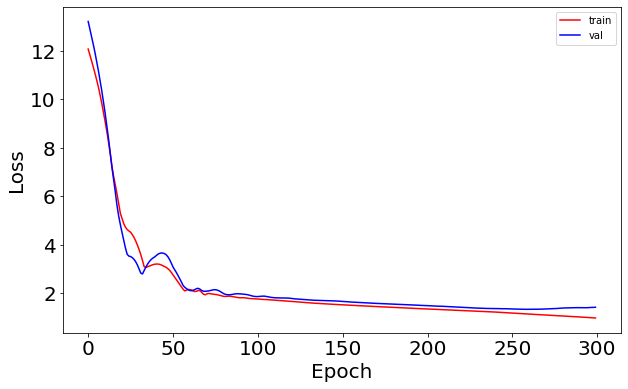

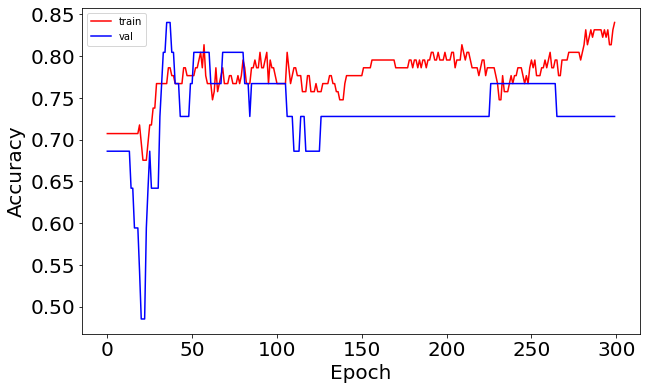

In [375]:
import matplotlib.pyplot as plt
import numpy as np

#feature scaling everything is crucial to deep learning and ANNs
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()


lr_model_history = gs.best_estimator_[2].fit(X_train, y_train,
                    validation_data=(X_test, y_test))
# Plot the loss function
fig, ax = plt.subplots(1, 1, figsize=(10,6))
ax.plot(np.sqrt(lr_model_history.history['loss']), 'r', label='train')
ax.plot(np.sqrt(lr_model_history.history['val_loss']), 'b' ,label='val')
ax.set_xlabel(r'Epoch', fontsize=20)
ax.set_ylabel(r'Loss', fontsize=20)
ax.legend()
ax.tick_params(labelsize=20)

# Plot the accuracy
fig, ax = plt.subplots(1, 1, figsize=(10,6))
ax.plot(np.sqrt(lr_model_history.history['accuracy']), 'r', label='train')
ax.plot(np.sqrt(lr_model_history.history['val_accuracy']), 'b' ,label='val')
ax.set_xlabel(r'Epoch', fontsize=20)
ax.set_ylabel(r'Accuracy', fontsize=20)
ax.legend()
ax.tick_params(labelsize=20)

In [376]:
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import VotingClassifier
from matplotlib import pyplot
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    return scores

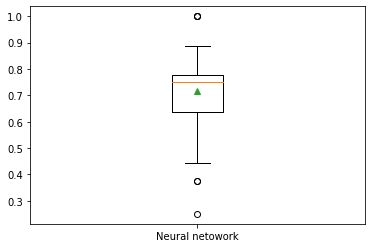

In [377]:
scores4=evaluate_model(gs.best_estimator_,X,y)
results = [scores4]
pyplot.boxplot(results, labels=["Neural netowork"], showmeans=True)
pyplot.show()

In [378]:
from sklearn.metrics import ConfusionMatrixDisplay,accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

def testClassifier(classifier,X_test,y_test):
    y_pred =  classifier.predict(X_test)
    titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),]
    for title, normalize in titles_options:
        disp = ConfusionMatrixDisplay.from_estimator(
            classifier,
            X_test,
            y_test,
            display_labels=None ,
            cmap=plt.cm.Blues,
            normalize=normalize,
        )
        disp.ax_.set_title(title)

        print(title)
        print(disp.confusion_matrix)

    plt.show()
    print("Accuracy score : " + str(accuracy_score(y_test, y_pred,  normalize=True, sample_weight=None)))
#     X = np.concatenate((X_train, X_test), axis=0) 
#     y = np.concatenate((y_train, y_test), axis=0)
#     scores = cross_val_score(classifier,X,y,cv=5)
#     print("Mean accuracy of 5 fold cross validation test : "+ str(scores.mean()))
#     print("with a maximum accuracy of " + str(scores.max()))
#     scores = cross_val_score(classifier,X,y,cv=10)
#     print("Mean accuracy of 10 fold cross validation test : "+ str(scores.mean()))
#     print("with a maximum accuracy of " + str(scores.max()))
#     scores = cross_val_score(classifier,X,y,cv=KFold(85))
#     print("Mean accuracy of n fold cross validation test : "+ str(scores.mean()))
#     print("with a maximum accuracy of " + str(scores.max()))
#     scores = cross_val_score(classifier,X,y,cv=KFold())
#     print("Mean accuracy of n fold cross validation test : "+ str(scores.mean()))
#     print("with a maximum accuracy of " + str(scores.max()))

In [379]:
testClassifier(grid_result.best_estimator_,X_test,y_test)

ValueError: ConfusionMatrixDisplay.from_estimator only supports classifiers

### Adding the second hidden layer

### Adding the output layer

## Part 3 - Training the ANN

### Compiling the ANN

### Training the ANN on the Training set

## Part 4 - Making the predictions and evaluating the model

### Predicting the result of a single observation

### Predicting the Test set results

In [ ]:
# y_pred = ann.predict(X_test)
# y_pred = (y_pred > 0.5)
# print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))

### Making the Confusion Matrix

In [ ]:
# from sklearn.metrics import confusion_matrix, accuracy_score
# cm = confusion_matrix(y_test, y_pred)
# print(cm)
# accuracy_score(y_test, y_pred)